In [1]:
from __future__ import absolute_import, division, print_function

# Import TensorFlow >= 1.10 and enable eager execution
import tensorflow as tf

tf.enable_eager_execution()
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
import keras.callbacks
import keras.backend.tensorflow_backend as KTF
import unicodedata
import re
import numpy as np
import os
import time
from pyknp import Jumanpp
import sys
from bert import modeling
from bert import tokenization
from bert import extract_features
import json
from spm import sentencepiece as spm
from sklearn.model_selection import train_test_split
import time
#from __future__ import absolute_import
#from __future__ import division
#from __future__ import print_function
import random
from pyknp import Jumanpp
tf.app.flags.DEFINE_string('f', '', 'kernel')

print(tf.__version__)
print(tf.keras.__version__)


1.13.1
2.2.4-tf


Using TensorFlow backend.


In [2]:
#sp = spm.SentencePieceProcessor()
#spm.SentencePieceTrainer.Train("--input=./tweets/input_text.txt --model_prefix=trained_model --vocab_size=16000")

In [3]:

PAD_ID = 16000

input_path = "./tweets/input_text.txt"
output_path = "./tweets/target_wakachi.txt"
#spm_voc = "./trained_model--vocab_size=8000.vocab"
#spm_model = "./trained_model--vocab_size=8000.model"
spm_voc = "./trained_model.vocab"
spm_model = "./trained_model.model"
out_voc_path = "./tweets/target_text_voc.txt"



BATCH_SIZE = 256
embedding_dim = 256
vocab_out_size = 16001
vocab_inp_size = 16001
units = 1024

#bucketの種類
_buckets = [(20,20), (40,40), (60,60), (80,80), (100,100), (140, 145)]




print(tf.__version__)
print(tf.keras.__version__)


1.13.1
2.2.4-tf


In [34]:
#outputの作成
class OutputIndex():
    def __init__(self, voc_path):
        self.voc_path = voc_path
        self.word2idx = {}
        self.idx2word = {}
        
        self.create_index()
        
    def create_index(self):
        with open(self.voc_path, mode = "r") as voc:
            lines = voc.readlines()
            self.idx2word = dict((i,sen.rstrip("\n"))for i, sen in enumerate(lines[:16000]))
            self.idx2word[PAD_ID] = "PAD"
            
            for index, word in self.idx2word.items():
                self.word2idx[word] = index
            
    def create_output_tensor(self, path):
        print("Start Creating output-tensor\n")
        output_tensor = []
    
        with open(path, mode = "r") as out:
            lines = out.readlines()
            
            for i, line in enumerate(lines):
                sys.stdout.write("{}/{}\n".format(i,len(lines)))
                sys.stdout.flush()
                
                line = line.rstrip("\n")
                splitted_list = line.split(" ")
                splitted_list.insert(0, "<s>")
                splitted_list.insert(len(splitted_list), "</s>")
                sys.stdout.write("{}\n".format(splitted_list))
                output_tensor.append([self.word2idx.get(w, 0) for w in splitted_list])
              
        print("Success Create target-tensor\n")
        
        return output_tensor

In [31]:
class InputIndex():
    def __init__(self, voc_path, model_path):
        self.voc_path = voc_path
        self.model_path = model_path
        self.word2idx = {}
        self.idx2word = {}
        
        self.create_index()
        
    def create_index(self):
        with open(self.voc_path, mode = "r") as voc:
            lines = voc.readlines()
            self.idx2word = dict((i,sen.split("\t")[0]) for i, sen in enumerate(lines))
            self.idx2word[PAD_ID] = "PAD"
            self.word2idx = dict((sen.split("\t")[0],i) for i, sen in enumerate(lines))
            self.word2idx["PAD"] = PAD_ID
    def create_input_tensor(self, path):
        print("Start Creating input-tensor\n")
        input_tensor = []
        sp = spm.SentencePieceProcessor()
        sp.Load(self.model_path)
        i = 0
        with open(path, mode = "r") as inp:
            lines = inp.readlines()
            
            for line in lines:
                splitted_list = sp.EncodeAsPieces(line)
                splitted_list.insert(0, "<s>")
                splitted_list.insert(len(splitted_list), "</s>")
                sys.stdout.write("{}\n".format(splitted_list))
                input_tensor.append([self.word2idx.get(w, 0) for w in splitted_list])
               
        print("Success Create input-tensor\n")
        
        return input_tensor

In [6]:
#trensorの中の最大長を返す
def max_length(tensor):
    return max(len(t) for t in tensor)

In [7]:
def load_dataset(path_in, path_out, input_obj, output_obj):
    input_tensor = input_obj.create_input_tensor(path_in)
    output_tensor = output_obj.create_output_tensor(path_out)
    
    data_set_train = [[] for _ in _buckets]
    for i in range(len(input_tensor)):
        for bucket_id, (inp_size, out_size) in enumerate(_buckets):
            if len(input_tensor[i]) < inp_size and len(output_tensor[i]) < out_size:
                data_set_train[bucket_id].append([input_tensor[i], output_tensor[i]])
                break
                
    del input_tensor
    del output_tensor

    
    bucket_sizes_train = [len(data_set_train[b]) for b in range(len(_buckets))] 
    print(bucket_sizes_train)
    
    inp_ten, out_ten = Padding(data_set_train)
    return inp_ten, out_ten

In [8]:
def Padding(data):
    encoder_size, decoder_size = _buckets[0]
    print(encoder_size, decoder_size)
    encoder_inputs, decoder_inputs = [], []
    for i in range(len(data[0])):
        encoder_input, decoder_input = data[0][i]
        
        encoder_pad = [PAD_ID] * (encoder_size - len(encoder_input))                
        encoder_inputs.append(encoder_input + encoder_pad)

        decoder_pad = [PAD_ID] * (decoder_size - len(decoder_input))                
        decoder_inputs.append(decoder_input + decoder_pad) 
        
    batch_encoder_inputs, batch_decoder_inputs = [], []

    for batch_idx in range(len(data[0])):                                  
        batch_encoder_inputs.append(np.array([encoder_inputs[batch_idx][length_idx] for length_idx in range(encoder_size)], dtype=np.int32))


    for batch_idx in range(len(data[0])): 
        batch_decoder_inputs.append(np.array([decoder_inputs[batch_idx][length_idx] for length_idx in range(decoder_size)], dtype=np.int32))

    return batch_encoder_inputs, batch_decoder_inputs

In [9]:
def gru(units):
    #if tf.test.is_gpu_available():
       # print("OK")
       # config = tf.ConfigProto()
       #config.gpu_options.allow_growth = True
        
        #return tf.keras.layers.CuDNNGRU(units,return_sequences=True, return_state=True, recurrent_initializer='glorot_uniform')
    #else:
    return tf.keras.layers.GRU(units, return_sequences=True, return_state=True, recurrent_activation='sigmoid',recurrent_initializer='glorot_uniform')

In [10]:
class Encoder(tf.keras.Model):
    def __init__(self, vocab_size, embedding_dim, enc_units, batch_sz):
        super(Encoder, self).__init__()
        self.batch_sz = batch_sz
        self.enc_units = enc_units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = gru(self.enc_units)
        
    def call(self, x, hidden):
        x = self.embedding(x)
        output, state = self.gru(x, initial_state = hidden)        
        return output, state
    
    def call_a(self, x, hidden):
        x = self.embedding(x)
        x = tf.expand_dims(x, 0)
        output, state = self.gru(x, initial_state = hidden)        
        return output, state
    
    def initialize_hidden_state(self):
        return tf.zeros((self.batch_sz, self.enc_units))

In [11]:
class Decoder(tf.keras.Model):
    def __init__(self, vocab_size, embedding_dim, dec_units, batch_sz):
        super(Decoder, self).__init__()
        self.batch_sz = batch_sz
        self.dec_units = dec_units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = gru(self.dec_units)
        self.fc = tf.keras.layers.Dense(vocab_size)
        
        # used for attention
        self.W1 = tf.keras.layers.Dense(self.dec_units)
        self.W2 = tf.keras.layers.Dense(self.dec_units)
        self.V = tf.keras.layers.Dense(1)
        
    def call(self, x, hidden, enc_output):
        # enc_output shape == (batch_size, max_length, hidden_size)
        
        # hidden shape == (batch_size, hidden size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden size)
        # we are doing this to perform addition to calculate the score
        hidden_with_time_axis = tf.expand_dims(hidden, 1)
        
        # score shape == (batch_size, max_length, 1)
        # we get 1 at the last axis because we are applying tanh(FC(EO) + FC(H)) to self.V
        score = self.V(tf.nn.tanh(self.W1(enc_output) + self.W2(hidden_with_time_axis)))
        
        # attention_weights shape == (batch_size, max_length, 1)
        attention_weights = tf.nn.softmax(score, axis=1)
        
        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * enc_output
        context_vector = tf.reduce_sum(context_vector, axis=1)
        
        # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)
        
        # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
        
        # passing the concatenated vector to the GRU
        output, state = self.gru(x)
        
        # output shape == (batch_size * 1, hidden_size)
        output = tf.reshape(output, (-1, output.shape[2]))
        
        # output shape == (batch_size * 1, vocab)
        x = self.fc(output)
        
        return x, state, attention_weights
        
    def initialize_hidden_state(self):
        return tf.zeros((self.batch_sz,self.dec_units))

In [12]:
def loss_function(real, pred):
    mask = 1 - np.equal(real, 0)
    loss_ = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=real, logits=pred) * mask
    return tf.reduce_mean(loss_)

In [36]:
#学習
def train(inp_obj, out_obj):
    #datasetの作成
    #list型でinputとoutputを作成
    encoder_inputs, decoder_inputs = load_dataset(input_path, output_path,inp_obj, out_obj)
    EPOCHS = 1000
    
    #学習開始
    for epoch in range(EPOCHS):
        start = time.time()
    
        hidden = encoder.initialize_hidden_state()
        total_loss = 0
    
        #テンソル型のデータ作成
        tensor = tf.data.Dataset.from_tensor_slices((encoder_inputs, decoder_inputs)).shuffle(len(encoder_inputs))
        
        N_BATCH = len(encoder_inputs)/BATCH_SIZE
        tensor = tensor.batch(BATCH_SIZE, drop_remainder=True)
        
        for (batch, (inp, out)) in enumerate(tensor):
            loss = 0
            with tf.GradientTape() as tape:
                
                enc_output, enc_hidden = encoder(inp, hidden)
            
                dec_hidden = enc_hidden
            
                dec_input = tf.expand_dims([out_obj.word2idx["<s>"]] * BATCH_SIZE, 1)       
            
                # Teacher forcing - feeding the target as the next input
                for t in range(1, out.shape[1]):
                    # passing enc_output to the decoder
                    predictions, dec_hidden, _ = decoder(dec_input, dec_hidden, enc_output)
                   
                    loss += loss_function(out[:, t], predictions)
                
                    # using teacher forcing
                    dec_input = tf.expand_dims(out[:, t], 1)
                
            batch_loss = (loss / int(out.shape[1]))
            total_loss += batch_loss
            variables = encoder.variables + decoder.variables   
            gradients = tape.gradient(loss, variables)
            optimizer.apply_gradients(zip(gradients, variables))
            if batch % 10 == 0:
                print('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1,batch,batch_loss.numpy()))
        
        # saving (checkpoint) the model every 2 epochs
        if (epoch + 1) % 100 == 0:
               checkpoint.save(file_prefix = checkpoint_prefix)
    
        print('Epoch {} Loss {:.4f}'.format(epoch + 1,total_loss / N_BATCH))
        total_losses.append(total_loss / N_BATCH)
        
        print('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    

In [37]:
optimizer = tf.train.AdamOptimizer()

total_losses = []
encoder = Encoder(vocab_inp_size, embedding_dim, units, BATCH_SIZE)
decoder = Decoder(vocab_out_size, embedding_dim, units, BATCH_SIZE)
checkpoint_dir = './training_checkpoints_no_bert'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")               
checkpoint = tf.train.Checkpoint(optimizer=optimizer, encoder=encoder,decoder=decoder)
inp_obj = InputIndex(spm_voc, spm_model)
out_obj = OutputIndex(out_voc_path)
train(inp_obj, out_obj)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

Start Creating input-tensor

['<s>', '▁え', '、', 'どうしよう', '</s>']
['<s>', '▁なんの', 'デザイン', 'ですか', '?', '</s>']
['<s>', '▁それ', '死ぬほど', '見た', '。', '</s>']
['<s>', '▁うー', 'たん', '!', '</s>']
['<s>', '▁そう', 'かもしれない', 'ですよ', '。', '️', '</s>']
['<s>', '▁', '無理です', '</s>']
['<s>', '▁D', 'V', 'はよく', 'ないけど', '母親', 'の', '彼氏', 'に', '殴', 'られる', 'の', 'は何', 'ブイ', 'でしたか', 'ね', '</s>']
['<s>', '▁ねえ', 'かわいい', '。', '</s>']
['<s>', '▁', 'ベッド', 'の', '近くに', '飾', 'った', 'んだけど', 'めちゃめちゃ', '見られて', 'るから', '寝', 'られません', '</s>']
['<s>', '▁', 'ぶー', '</s>']
['<s>', '▁', '多少', 'は', 'ね', '物語', 'シリーズ', 'か', '...', '</s>']
['<s>', '▁ほんと', '可愛すぎます', 'ね', '。', '</s>']
['<s>', '▁', '我が家', 'の', '画', '伯', 'の', '最新', '作', '!!', '←', '単', 'なる', '親', 'バカ', 'です', '</s>']
['<s>', '▁僕の', 'どこが', '!', 'M', 'なんですか', '!!', '</s>']
['<s>', '▁美', '男', '美女', '...', 'それは', '残り', 'の', '0', '人', 'ですね', '</s>']
['<s>', '▁ですです', '...', '0', '日', '0', '回', '出来れば', '満足', 'です', '</s>']
['<s>', '▁', '。', '️', '</s>']
['<s>', '▁', '奥', '手', 'な', 'セミ

['<s>', '▁この', 'アイコン', '覚えてる', '人', 'どれくらい', 'いる', '?', '</s>']
['<s>', '▁バおわ', '疲れた', '</s>']
['<s>', '▁DM', '行ってもいいですか', '!', '</s>']
['<s>', '▁', '札幌', '、', '恵', '庭', '、', '千歳', '、', '苫', '小', '牧', '付近', 'で', 'オフパコ', 'してくれる人', '募集してます', '!', '</s>']
['<s>', '▁ここに', '誰担か', 'リプして', '!?', '気になった', '子の所に', 'は', 'DM', '行くか', 'も', '!!', '</s>']
['<s>', '▁今から', 'やれる', 'なら', 'やります', '?', '</s>']
['<s>', '▁あ', '、', '道', '頓', '堀', 'の方', 'です笑', '</s>']
['<s>', '▁それ', 'か', '『', '新', '郎', '』', 'の衣装', 'でも', 'キメ', 'て', 'く', '?', '推し', '色', 'を', 'ちゃんと', '着て', 'く', 'と', '喜んで', 'くれる', 'と思うよ', '?', '</s>']
['<s>', '▁', '脚', '派', 'だった', '!', 'www', '</s>']
['<s>', '▁', '曜', 'ちゃん', 'かわいい', '</s>']
['<s>', '▁', 'の', 'り', 'む', 'だと', '</s>']
['<s>', '▁0', '月', 'なら', '割', 'か', 'し', '上', '旬', 'に', '帰る', 'かなあ', '第', '0', '週', '後半', 'から', '第', '0', '週', 'くらい', '</s>']
['<s>', '▁あぁ', 'ー', '!', 'また', 'タイミング', '逃', 'した', '。', '️', '</s>']
['<s>', '▁', '無言', 'フォロー失礼します', '。', '▁', '。', '️', '。', '</s>']
['<s>', '▁

['<s>', '▁', 'やりたいです', '!', '</s>']
['<s>', '▁', 'か', 'げ', 'と', 'わ', 'さん', '今日は', 'ありがとう', '。', 'ロボット', '見つけたら', '逃げ', 'ろ', '逃げ', 'ろ', '状態', '完全に', '鬼', 'ご', 'っこ', '</s>']
['<s>', '▁', 'やん', 'と', '君が', '行ったこと', 'あるかも', '!', 'あと', '、', '自分も', 'ご一緒', 'いいですか', '?', '</s>']
['<s>', '▁明日', '歌枠したいな', 'ー', '♪', '</s>']
['<s>', '▁金', '確', '神殿', '0', '時間', '程', 'やります', '行く', '人いたら', 'どぞ', '</s>']
['<s>', '▁', 'どんだけ', '食べる', 'んですか', 'w', '</s>']
['<s>', '▁明日', '歌枠したいな', 'ー', '♪', '</s>']
['<s>', '▁', '夜中', 'だけど', '0', 'の', '日焼け', 'を', '妄想', 'して', '描いた', '・・・', '</s>']
['<s>', '▁', 'こちらも', '。', '</s>']
['<s>', '▁', '良すぎて', '歌', 'っちゃった', '</s>']
['<s>', '▁', 'つ', 'むぎ', '先輩', 'だっけ', '...', '!', '今度', 'メイト', '行った', '時', '、', '買って', 'おく', '...', '</s>']
['<s>', '▁', 'ゴールド', '0', 'の', '0', 'ハンマー', 'たまに', 'って感じ', 'なんですけど', '参加いいですか', '?', '</s>']
['<s>', '▁明日は', '誰', '描こう', 'かな', '誰が', 'いいですか', '?', 'さ', 'くん', '以外で', '!!', '</s>']
['<s>', '▁誕生日', '一緒', 'の人', 'はじめて', '見つけました', 'w', '</s>']
['<s>', '▁ア',

['<s>', '▁バイト', '頑張って', 'ら', '!!', '</s>']
['<s>', '▁二', '日', '前に', '0', '枚で', '売れ', 'て', 'たけど', 'いい', 'んか', '?', '</s>']
['<s>', '▁', '出稼ぎ', '初日', '!', '0', '本', 'で', 'おわり', '!', '飛んで', 'いいかな', '?', '!', '</s>']
['<s>', '▁コンビニ', 'は', 'セブン', '派', '</s>']
['<s>', '▁0', '層', 'まで', 'なんとか', '終わり', '</s>']
['<s>', '▁', '触れ', 'るのは', '今回', 'だけ', '。', '</s>']
['<s>', '▁', '引き', 'はしない', 'だろ', '次', 'いで', 'に', '押し', '倒して', '来い', 'よ', '←', '</s>']
['<s>', '▁', 'ル', 'レ', '一緒に', 'いく', '?', '</s>']
['<s>', '▁ですです', 'ww', '</s>']
['<s>', '▁', '場面', '繋', 'い', 'だよ', '。', '</s>']
['<s>', '▁おはようございます', '</s>']
['<s>', '▁', '先程', 'は', 'ありがとうございました', '。', '美味しそうですね', '</s>']
['<s>', '▁ひま', '??', '</s>']
['<s>', '▁0', '章', '進め', 'てた', 'んだが', '、', 'これは', 'どういうこと', '?', '</s>']
['<s>', '▁大丈夫ですよ', '!', 'w', '</s>']
['<s>', '▁今日は', '日差し', 'が', '強かった', '。', '️', 'おやすみ', '</s>']
['<s>', '▁やば', 'ぁ', '</s>']
['<s>', '▁', 'いいんですか', '!', 'あざす', '!', 'ハン', 'ネ', 'は', 'k', 'が', '0', 'こ', 'です', '!', '</s>']
['<s>', '▁', '

['<s>', '▁おはよー', '両', '足', '指', 'を', '開いて', 'みた', '</s>']
['<s>', '▁', 'ねー', '!', '遊びたい', '!', 'それ', 'までは', '仲良く', '絡んで', 'ね', '!!', '</s>']
['<s>', '▁', 'あります', 'あまり', 'す', 'あまり', 'り', 'す', '</s>']
['<s>', '▁', '数', 'え', 'られない', 'ぐらい', 'あるよ', '。', '</s>']
['<s>', '▁', '偉い', '。', '</s>']
['<s>', '▁ありがとうございました', '!!', '</s>']
['<s>', '▁', '意味', 'わかんない', 'のは', '無視', '</s>']
['<s>', '▁深夜に', 'し', 'ちゃ', '冴', 'えた', 'コメント', 'しました', 'でしょ', '??', '。', '</s>']
['<s>', '▁お迎え', '有難うございます', '。', '︎', '是非繋がりたいです', '!', '</s>']
['<s>', '▁', 'みたい', 'の', '?', '</s>']
['<s>', '▁残念', 'ハイ', 'ネス', 'キャラ', 'で', 'たまには', '遊んで', 'ね', '!', '</s>']
['<s>', '▁', '橘', '智', '、', 'パニック', '?', '</s>']
['<s>', '▁あ', '。', '</s>']
['<s>', '▁やっぱり', '浴衣', 'って', 'いいよね', '</s>']
['<s>', '▁また', '、', '遊んでください', 'ね', '</s>']
['<s>', '▁カ', 'エリ', 'マシ', 'タ', '。', '</s>']
['<s>', '▁RT', 'して欲しい物', 'リプに書いて', 'ぇ', '0', 'RT', '〆', '</s>']
['<s>', '▁', '相互', '始めた', 'んで', '!', '</s>']
['<s>', '▁あれ', 'セイ', 'キン', 'ショット', 'なんで', 'あんまり', '意味

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', '▁お互い', '気をつけ', 'たいですね', 'f', '対策', 'とか', '難しいです', 'が', '。', '</s>']
['<s>', '▁自分', 'モモ', 'ペン', 'でーす', '!', '</s>']
['<s>', '▁', '評', '定', '平均', '0', '趣味', 'は', '漫画', '読む', 'こと', '</s>']
['<s>', '▁', '寄', '宿', '愛', '好', '会', 'は', 'いつでも', 'メンバー', '募集中', 'だ', 'ヨ', '!', '</s>']
['<s>', '▁', 'みて', '!!!', '犬', '歯', '!!!', '</s>']
['<s>', '▁ありがとうございます', '。', '早速ですが', 'なんてお呼びすれば', 'よろしいですか', '??', '</s>']
['<s>', '▁暑すぎて', '誰も', 'いて', 'ません', '。', 'そして', '当たり', 'ません', '。', '釣れ', 'ても', '痩せ', 'てた', '</s>']
['<s>', '▁あ', '、', 'ぽん', 'たの', 'その', '垢', '沼', '垢', 'で', 'ヒ', 'ョ', 'ロー', 'しに', 'いく', 'わ', '</s>']
['<s>', '▁', 'デュ', 'ラ', 'と聞いて', '...', '会', 'え', 'ず', 'で', 'ほんと', '残念', 'で', '。', '</s>']
['<s>', '▁はい', 'ー', 'きました', 'きました', '宣伝', 'タイム', 'ー', '大宮', 'ソース', 'かせ', 'げ', 'ます笑', '</s>']
['<s>', '▁', 'ホワイト', 'ボード', '!?', '。', 'めちゃくちゃ', '綺麗', 'で', '素敵です', '。', '</s>']
['<s>', '▁', 'おしゃれ', 'さん', 'G', 'U', 'E', 'SS', 'の', '時計', '可愛い', 'なー', '</s>']
['<s>', '▁', '何卒', '宜しくお願い致します', '放送', 'して下さい', '

['<s>', '▁それ', 'なぁ', '勉強', 'ある', 'とか', '夏休み', 'じゃない', 'し', '</s>']
['<s>', '▁しごおわ', '</s>']
['<s>', '▁0', '月', '後半', 'から', '毎日', 'スイカ', 'バー', '食べてる', '・・・', '</s>']
['<s>', '▁', '色違い', 'おめでとうございます', '。', '️', 'カッコいい', 'ですね', '。', '</s>']
['<s>', '▁なんと', '......', '充電', 'が', 'なかなか', '減', 'らない', '!!', '</s>']
['<s>', '▁', 'ク', 'トゥ', 'ル', 'フ', 'の', 'ルル', 'ブ', '無かった', 'から', '代わりに', '彼', '方', 'の', 'アス', 'トラ', '全', '巻', '買った', 'わ', '</s>']
['<s>', '▁', 'これ以上', 'ト', 'ニー', 'の', '黒', '歴史', '掘り', '返す', 'の', 'やめた', 'げ', 'てー', 'ww', '</s>']
['<s>', '▁ですよねー', '私も', 'そう思います', '!', '。', '</s>']
['<s>', '▁あ', '?', '!', '</s>']
['<s>', '▁', '欲しいです', '!!', '。', 'セブン', 'でお願いします', '。', '</s>']
['<s>', '▁黒', '田', '担', 'っ', '絡みましょ', '。', '</s>']
['<s>', '▁0', '割', 'くらい', 'ありそう', '</s>']
['<s>', '▁結局', '出稼ぎ', 'どこが', 'いいの', '身', '分', '証', '、', '保', '険', '証', 'しかない', 'んだけど', '</s>']
['<s>', '▁こんにちは', '!!', '界隈', 'は', '...', '一応', '伏せ', 'ました笑', '詳細', 'は', 'DM', 'させて頂きます', '。', '️', '</s>']
['<s>', '▁うち', 'そんな',

['<s>', '▁結局', 'ホテル', 'で', '生徒', 'と', '別れ', 'たん', 'で', '、', '今日は', '0', '人', '。', 'だから', '予算', 'も', '結構', '平気', '!', '</s>']
['<s>', '▁明日', '仕事', '中止', 'になった', '釣り', '行くか', '。', '</s>']
['<s>', '▁すごい', '執', '念', 'を感じる', '</s>']
['<s>', '▁台風', 'くるの', 'かなー', '。', 'そんな', 'そ', 'ぶり', 'ない', 'くらい', '静', 'か', '雨', 'も', '降って', 'ないし', '、', '怖', 'っ', '。', '</s>']
['<s>', '▁', '俺に', 'タイマン', '勝てない', '人', '</s>']
['<s>', '▁それ', '、', '本当に', '花火', 'の音', 'なのかな', '.........', '?', '。', '</s>']
['<s>', '▁', '仮面ライダー', 'Z', 'O', 'Z', 'O', 'TO', 'W', 'N', '</s>']
['<s>', '▁今', '0', 'ある', '笑笑', '</s>']
['<s>', '▁', 'ぴ', 'ぇ', '、', 'お', '、', 'お', '若い', 'っ', '...', '!', '</s>']
['<s>', '▁', '柏', '市', 'は', 'N', '国', '0', '位', 'だったような', '気がします', '。', '</s>']
['<s>', '▁ま', 'と', 'まった', '休み', 'が', '取れた', 'ら', 'また', '行きたい', 'と思います', '</s>']
['<s>', '▁0', '回目', '!!', 'チケット', '先着', '先行', '予約', '中', 'だよー', '。', '</s>']
['<s>', '▁え', '?', 'ト', 'ラップ', 'キル', 'の', '神', 'ですか', '?', '</s>']
['<s>', '▁', '童貞', 'ちゃう', 'やん', '┐'

['<s>', '▁', '名刺', '!!!!', '可愛いです', '。', 'これは', '手に入れ', 'なければ', '...!!', '</s>']
['<s>', '▁早く', '壬', '猫', 'オンリー', 'ひら', 'かれ', 'ねー', 'かな', '</s>']
['<s>', '▁', '久々', 'インスタライブ', 'しよ', 'かな', '</s>']
['<s>', '▁', '最高です', '可愛いです', 'ごちそうさまです', '⊂', '⌒', 'っ', '▁́', '̫', 'っ', '。', '</s>']
['<s>', '▁え', '、', 'ワイ', 'もしかして', '斬', '首', 'コース', '??', '</s>']
['<s>', '▁今日の', 'こんな', '適当に', '撮って', 'も', '人権', 'ある', '</s>']
['<s>', '▁', 'ご飯食べ', 'た', 'あと', 'に', 'みたら', '酔った', 'www', '</s>']
['<s>', '▁ありがとうございます', 'かれ', 'これ', '0', '年', '程', '乗り', '継', 'いで', 'いるの', 'です', '。', '</s>']
['<s>', '▁よろしくお願いします', '!!', '</s>']
['<s>', '▁イケメン', 'すぎます', '</s>']
['<s>', '▁これ', 'ですね', '?', '。', '</s>']
['<s>', '▁', '。', '</s>']
['<s>', '▁ん', '?', '何が', '</s>']
['<s>', '▁超', 'キレイ', 'ですね', '!', '台', '北', '行ってみたい', '。', '</s>']
['<s>', '▁サ', 'ロ', 'メ', 'さんの', 'は', 'スキル', 'マ', '前提', 'ですが', '、', 'スキル', 'マ', 'で', '0', '配布', 'ぽい', 'です', '</s>']
['<s>', '▁', 'ガ', 'ク', 'ブル', '</s>']
['<s>', '▁エ', 'キス', 'トラ', 'ですか', '?', 'その', '条

['<s>', '▁真', '六', '武', '衆', 'ー', 'シ', 'エン', 'が', 'こんな', '小さな', '界隈', 'の', '組織', '票', 'だけで', '0', 'も', 'と', 'れた', 'の', '団', '結', '力', 'ある', '</s>']
['<s>', '▁', 'ぶら', 'っく', 'し', 'ゆ', 'たん', '</s>']
['<s>', '▁アン', 'タ', 'は', '終', '戦', 'まで', 'ド', 'ック', 'に', 'いた', 'でしょ', '...', '</s>']
['<s>', '▁あー', '...', 'ちんこ', 'いれて', 'ご', 'りゅ', 'ご', 'りゅ', 'って', 'して', 'いき', 'まくり', 'たい', 'わ', '。', '▁', '。', '️', '。', '▁', '。', '️', '</s>']
['<s>', '▁今週', 'がんばれ', 'ば', '盆休み', '。', '夏野菜', 'カレー', 'で', 'がんばります', '。', '</s>']
['<s>', '▁', '暇です', 'のう', '</s>']
['<s>', '▁', '東北', 'か', '...', '幻', '聴', '</s>']
['<s>', '▁仕事終わりました', '!', '今日は', 'ちょっと', '早い', '</s>']
['<s>', '▁そうか', '?', '似て', 'ねえ', 'ぞ', '?←', '</s>']
['<s>', '▁0', '度目の', '大', '谷', '石', '。', '荘', '厳', '。', 'SG', 'Z', '</s>']
['<s>', '▁おはよー', '</s>']
['<s>', '▁', '優しく', '微', '笑', 'む', 'シーン', 'だったっけ', '?????', '</s>']
['<s>', '▁誕生日の日', 'も', '動画あげる', 'からお楽しみに', '!', '</s>']
['<s>', '▁0', '日', 'の準備', 'してる', '!', '。', '笑笑', '</s>']
['<s>', '▁そこは', '大きな', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', '▁A', 'A', 'A', 'です', '</s>']
['<s>', '▁マジ', 'です', 'w', '</s>']
['<s>', '▁お', 'つよい', 'w', '</s>']
['<s>', '▁俺', 'なんか', 'パ', 'グ', 'みたいな', 'シ', 'ワ', 'の数', 'になってきた', 'なぁ', '</s>']
['<s>', '▁', 'on', 'o', '▁́', 'Д', '⊂', 'ヽ', '</s>']
['<s>', '▁うっ', 'し', '。', '初日', '舞台', '挨', '拶', 'が', 'ライビュ', 'ね', '!!', '了解', 'っ', '!!', '</s>']
['<s>', '▁その', 'オフ', 'は', 'いつですか', '!!!', '</s>']
['<s>', '▁ありがとー', '早く', '、', 'お盆', 'になって', 'ほしい', '...', '</s>']
['<s>', '▁この', 'カラー', 'の', 'c', 'b', '乗ってる', '方', 'つな', 'がり', 'ましょー', '!', '</s>']
['<s>', '▁', '飯', '食って', 'たら', '、', 'なんだ', 'チ', 'ミ', 'は', '</s>']
['<s>', '▁いや', '、', '水着', 'ブー', 'ケ', '買える', 'くらいの', '課金', '額', 'は', '越え', 'ている', 'はず', '!!', '</s>']
['<s>', '▁', '一緒です', '♡', 'お互い', '楽しみましょう', 'ね', '</s>']
['<s>', '▁', '凄すぎる', '。', 'ちなみに', '毎日', 'やってる', '感じですかね', '。', '</s>']
['<s>', '▁', '楽しい', 'よ', '!!', '</s>']
['<s>', '▁皆さんの好きな', '車の', 'テールランプ', 'を教えてください', '。', '僕は断然', 'GTR', 'です', '。', '</s>']
['<s>', '▁', 'フリ', 'ちん', '。', '</s>']
['<s>', '

['<s>', '▁可愛すぎて', 'ずっと', '見て', 'られます', '♡', '</s>']
['<s>', '▁夏って感じ', 'だ', 'なぁおい', '</s>']
['<s>', '▁', '一番好きな', '映画', '見てる', '</s>']
['<s>', '▁', '総', '走', '行', '距離', 'は', 'どれ', '位', 'ですか', '?', '</s>']
['<s>', '▁こんにちは', '。', '俺も', '今日は', '夕方', 'から', '仕事', '。', 'お互い', '頑張ろうね', '。', '</s>']
['<s>', '▁', 'ポケカ', 'に', 'フェアリー', 'メモリ', 'と', 'ス', 'ティー', 'ル', 'メモリ', '下さい', '</s>']
['<s>', '▁', '......', 'ファイト', '!', 'ミ', 'ク', '!', '</s>']
['<s>', '▁美', 'しすぎて', '優勝', '。', '</s>']
['<s>', '▁ですよね', '。', '何より', '大事な', 'のは', '、', 'カネ', 'じゃ', '無く', '、', '歌', 'だと思います', '。', '</s>']
['<s>', '▁ご', '、', 'ごめんなさい', '、', 'バイ', 'アル', 'とは', 'なんでしょうか', '?', '</s>']
['<s>', '▁好きな', '武器', '貰える', 'やつ', 'ないのか', '。', '</s>']
['<s>', '▁僕も', '来ない', 'です', '</s>']
['<s>', '▁お', '連れ', '様です', 'っ', '!', 'ゆっくり休んで', '下さい', '</s>']
['<s>', '▁フォロワーさん', 'に', '会う', 'ぐらい', '</s>']
['<s>', '▁私', 'なら', 'その', 'エレ', 'ベ', 'ーター', '閉店', 'まで', 'ずっと', '乗ってる', '。', '降り', 'たくない', 'っ', '。', '</s>']
['<s>', '▁', 'ネタ', '画像', '?', '</s>']
['

['<s>', '▁', '。', 'oO', '(', 'クロ', 'ノス', 'キャンペーン', 'きました', '。', '報告', 'まで', '。', '</s>']
['<s>', '▁', '違います', 'あや', 'です', '</s>']
['<s>', '▁しごおわ', 'わわわわ', 'ー', '!', '暑かった', '!!', '</s>']
['<s>', '▁私も', '思ったより', '小さい', 'なー', 'と思いました', 'でも', '忠', '実', 'に', '作って', 'あるので', '嬉しいです', '。', '</s>']
['<s>', '▁こっち', 'の', '現場', 'も', '百', '戦', '錬', '磨', 'だったか', '</s>']
['<s>', '▁', '雑', '費', 'か', '。', 'なるほど', '!', '</s>']
['<s>', '▁', '江ノ島', '!', 'めっちゃ', 'いいですね', '!', '海', 'の', '後', '聖', '地', '巡', '礼', 'は', '最高', '\\/', '</s>']
['<s>', '▁ア', 'マサ', 'ギ', 'の', '嘴', '、', 'こんなん', '見たことある', '?', '</s>']
['<s>', '▁本日', '動画', '0', '時', 'アップ', 'です', '!!!', '</s>']
['<s>', '▁', 'しぬ', 'んですけど', '...', '</s>']
['<s>', '▁ありがとうございます', '!!', 'お名前', '聞いてもいいですか', '??', '✩', '⡱', '</s>']
['<s>', '▁', 'ストレス', 'タイム', '終', '</s>']
['<s>', '▁', 'かわ', 'さん', '、', 'こんばんは', '。', '大丈夫ですか', '?', '</s>']
['<s>', '▁', 'カイ', 'さん', '大好きです', '!!', '</s>']
['<s>', '▁元気', '?', '</s>']
['<s>', '▁0', '人', 'フォロバします', '面白い', 'リプください', '

['<s>', '▁', '歴史', 'に', '名', 'を', '残', 'せる', 'よ', '</s>']
['<s>', '▁おー', '!', 'おめでとうございます', 'ー', '!', '。', '自分の', '子供', 'も', '0', '月に', '産まれ', 'たので', '親近感', 'が', '湧き', 'ます', '。', '</s>']
['<s>', '▁', 'ラ', 'ック', 'を', '前', '面', 'に', '、', 'スタンド', '型', 'を', 'その', '後ろに', '設置', 'して', 'テレビ', 'は', '独', '立', 'させ', 'ます', '!', '</s>']
['<s>', '▁', '今度は', '最終', '再', '臨', 'が', '最高', 'のイラスト', 'だと', '嬉しいです', 'ねぇ', '</s>']
['<s>', '▁初リプ失礼します', '顔', 'が好きです', '</s>']
['<s>', '▁', 'たまたま', '時間が', 'できた', 'ので', '...', '!', '後は', '土曜日', 'まで', 'お', '預け', 'ですねー', '</s>']
['<s>', '▁そうなんです', '彼は', 'めちゃめちゃ', '小', '顔', 'で', 'スタイル', '良い', 'んです', '...!!', '。', '</s>']
['<s>', '▁', '奴', 'は', '橋', 'の下', 'でも', '生きて', 'いける', 'んで', '大丈夫ですよ', '!', 'ほっと', 'き', 'ましょ', '!', '</s>']
['<s>', '▁', 'カワ', 'ム', 'ツ', '獲', 'って', 'きました', '。', '飼って', 'います', '。', '</s>']
['<s>', '▁', '茶', 'ヨ', 'ナ', 'の', '妄想', '最近', 'よく', 'してる', '</s>']
['<s>', '▁私も', '終わりました', 'ー', '。', '幾', '日', 'ぶり', 'の', '0', '時', '上がり', '。', 'みんな', '、', 'お疲れ様', 'でー

['<s>', '▁あ', 'か', 'さんが', 'ビ', 'クロ', 'イ', '奢', 'ってくれ', 'るんですね', '</s>']
['<s>', '▁', 'ギャル', 'に', '泣いて', 'お願い', 'する', '井', '口', 'を', '見かけたら', 'そっと', 'して', 'おいて', 'ね', '</s>']
['<s>', '▁', 'ばっか', 'も', 'ーん', '!', '笑', '</s>']
['<s>', '▁では', 'どちらか', 'と', 'お願いしたいのですが', '、', '数', '原', 'はダメ', 'ですか', '?', 'なん', 'ども', 'すみません', '。', '</s>']
['<s>', '▁おやすみなさい', 'です', '。', '</s>']
['<s>', '▁いいですね', '公式', 'マーク', 'つけて', 'もらいましょう', '</s>']
['<s>', '▁', '楽しみ', 'が', '貯', '金', 'の', '桁', '数', '増えた', '時', 'だけ', 'だわ', '</s>']
['<s>', '▁', 'イタ', 'リアン', 'なので', 'レモン', 'サワ', 'ー', 'はない', 'そうです', '。', 'グ', 'ヌ', 'ヌ', '...', '</s>']
['<s>', '▁', 'そういうこと', 'じゃないです', '</s>']
['<s>', '▁', '倍', '撃', '0', '↑', 'を', 'やる', 'デッキ', 'っぽ', 'さ', '</s>']
['<s>', '▁今回', '参', '議', '院', '選', '挙', '通った', '塩', '村', 'さんですね', '。', '️', '</s>']
['<s>', '▁今更', 'だが', 'リツイート', '。', 'こんなん', 'ばっか', 'で', '疲れる', 'な', '。', '</s>']
['<s>', '▁神', '楽', '推しです', '</s>']
['<s>', '▁あっ', '、', 'わかった', '毎晩', '閉店', 'してる', 'んじゃ', '?', '翌', '朝', 'には', '開'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'あー', 'その', '面', 'は', '大変です', 'よ', 'ね', '', '</s>']
2286/224161
['<s>', 'ロリータ', 'さん', '、', 'お', 'は', '唯', 'です', '頑張って', '来', 'ます', 'ゞ', '', '</s>']
2287/224161
['<s>', 'のぞむ', 'なら', 'の', '意味', 'が', '難しい', 'です', 'よ', 'ね', 'w', '', '</s>']
2288/224161
['<s>', '初', 'リプ', 'です', '行き', 'ます', '\u200d', '️', '', '</s>']
2289/224161
['<s>', '犬', 'と', '人間', 'の', 'ハーフ', 'です', '', '</s>']
2290/224161
['<s>', 'その', 'ようです', '', '</s>']
2291/224161
['<s>', '了解', 'です', '記念日', 'な', 'ので', '大盤振る舞い', 'な', '気持ち', 'で', '', '</s>']
2292/224161
['<s>', '彼氏', '候補', 'に', 'どう', 'です', 'か', '', '</s>']
2293/224161
['<s>', 'ロケリ', 'さん', 'おしえて', 'もらい', 'たい', 'かも', 'です', '', '</s>']
2294/224161
['<s>', '箱', '寿司', 'です', 'か', 'ね', '', '</s>']
2295/224161
['<s>', '良き', 'こと', 'です', 'また', '気', 'が', '向いたら', 'フレマ', '顔', '出して', '下さい', 'ね', '', '</s>']
2296/224161
['<s>', 'そう', 'です', '丸', 'っこ', 'くて', 'かわいい', 'もの', 'は', '全部', '智', 'なんで', '', '</s>']
2297/224161
['<s>', 'お', '疲れ', '様', 'です', '＼', '/', '宜しく', 'です', '️', ''

['<s>', '大丈夫です', 'か', '…', 'とにかく', 'おなか', 'あっ', 'ためて', 'ください', '', '</s>']
2377/224161
['<s>', '初', '絡み', '失礼', 'し', 'ます', '️', '昼夜', '逆転', '生活', 'です', 'な', 'これ', 'は', '', '</s>']
2378/224161
['<s>', 'この', '方', 'で', 'す', 'zone', '君', 'が', '最高裁', 'で', '待って', 'ろ', 'って', '言って', 'ました', '', '</s>']
2379/224161
['<s>', '誤字', '回収', '班', 'です', '', '</s>']
2380/224161
['<s>', 'マント', '剥がせ', 'ない', 'ので', 'こっち', 'も', 'キツイ', 'です', '', '</s>']
2381/224161
['<s>', '同じ', 'こと', '言う', 'てる', 'や', 'ない', 'です', 'か', 'あ', 'ほえる', 'さん', '', '</s>']
2382/224161
['<s>', 'なまえ', 'よんで', 'ほしい', 'です', 'いつも', '元気', 'を', 'くれて', 'ありがとう', 'ございます', '♡', '♡', '', '</s>']
2383/224161
['<s>', 'その', 'まさか', 'パターン', 'です', 'ね', '部屋', 'に', 'あり', 'ます', '笑笑', '', '</s>']
2384/224161
['<s>', 'ですよね', '', '</s>']
2385/224161
['<s>', 'ゆっくり', '実況', '者', 'さん', 'です', 'か', '…', '', '</s>']
2386/224161
['<s>', '鴨', '蕎麦', 'って', '美味しい', 'です', 'よ', 'ねー', 'あの', 'ネギ', 'と', 'の', '鴨', 'が', 'いい', 'です', 'ねー', '', '</s>']
2387/224161
['<s>', 'いっぱい', '

['<s>', '0', 'の', '理論', '値', 'に', '近づける', 'の', 'は', '難しい', 'です', 'ね', '', '</s>']
2472/224161
['<s>', 'ツーカネヒラ', 'だ', 'けど', '、', '0', '回', '以上', '回して', 'る', 'けど', '千', '代', 'ちゃん', '来', 'なくて', '諦め', 'モード', 'です', 'よ', 'w', '', '</s>']
2473/224161
['<s>', '奥', 'が', 'なかなか', '取り', 'づらい', 'です', 'よ', 'ね', '', '</s>']
2474/224161
['<s>', '私', 'は', '特', 'オタ', '仕様', 'の', 'スマホ', 'な', 'ので', '0', '発', '変換', 'です', '', '</s>']
2475/224161
['<s>', '同感', 'です', '…', '', '</s>']
2476/224161
['<s>', 'もー', 'じゅーぶんで', 'ぶ', 'です', '', '</s>']
2477/224161
['<s>', '金剛', '姉妹', 'を', '疑う', 'なんて', '提督', '失格', 'です', 'ネ', '', '</s>']
2478/224161
['<s>', 'よかった', 'また', '見かけたら', '入り', 'ます', 'よ', '´', '꒳', 'おや', 'すみ', 'です', '', '</s>']
2479/224161
['<s>', 'やっぱり', '今日', 'は', '時間', 'が', '早い', 'です', 'ねえ', '', '</s>']
2480/224161
['<s>', 'ありがとう', 'ございます', 'ナニ', 'を', 'する', 'の', 'か', '興味', '津々', 'で', 'す', '♡', '', '</s>']
2481/224161
['<s>', 'サビ', 'が', 'って', 'いった', 'けど', '0', '番', '最初の', '方', 'のみ', 'かち', 'も', 'めちゃくちゃ', '可愛い', 'で

['<s>', 'ありがとう', 'ございます', '線', 'の', '引き', '方', 'は', 'いつも', '試行', '錯誤', 'して', 'いる', 'ので', '嬉しい', 'です', '', '</s>']
2573/224161
['<s>', '目', 'の', '感じ', 'と', 'か', 'めっちゃ', '好きです', '髪型', 'も', 'めっちゃ', '好きです', 'とりあえず', '、', '好きです', '', '</s>']
2574/224161
['<s>', '言い訳', 'が', 'ある', 'って', '良い', 'です', 'ねえ', '笑', '', '</s>']
2575/224161
['<s>', 'ちなみに', 'なん', 'です', 'が', 'ゴレ', '向き', 'と', '思う', 'シューズ', 'って', 'なん', 'です', 'か', '他', '競技', 'でも', '', '</s>']
2576/224161
['<s>', '怖い', 'です', '…', '', '</s>']
2577/224161
['<s>', 'それ', 'は', '0', '円', 'プラス', '払って', 'も', 'ですか', '先生', '', '</s>']
2578/224161
['<s>', 'です', 'ね', '', '</s>']
2579/224161
['<s>', 'つよい', '誰', 'も', '勝て', 'な', 'さ', 'そうです', 'ね', '「', '震え', '声', '」', '', '</s>']
2580/224161
['<s>', 'お', 'やすみ', 'です', 'ノシ', '', '</s>']
2581/224161
['<s>', '水着', 'に', '、', 'メガネ', 'に', '、', 'ムチ', 'です', '', '</s>']
2582/224161
['<s>', 'インクリング', 'に', 'レベル', '0', 'から', '勝て', 'ない', 'から', '練習', '中', 'です', '', '</s>']
2583/224161
['<s>', 'ラバスト', 'とか', 'ばっか', 'だった',

['<s>', 'こちら', 'で', '参加', 'です', '', '</s>']
2669/224161
['<s>', '大丈夫です', 'か', 'アンパン', '子', 'ちゃん', '優し', 'すぎる', 'ので', 'は', '…', '', '</s>']
2670/224161
['<s>', '正解', 'は', 'しーく', 'んです', '吉澤', '閑', '也', 'くん', 'です', '', '</s>']
2671/224161
['<s>', '変です', 'けどぉ', '', '</s>']
2672/224161
['<s>', 'お', '上手', '今度', '依頼', 'さ', 'せて', 'いただき', 'ます', 'ね', '有償', 'です', 'か', '', '</s>']
2673/224161
['<s>', 'ミラ', '「', '…', 'えっ', '…', '私', '帰ら', 'ない', 'と', 'いけない', 'の', '…', 'です', 'か', '…', '」', '', '</s>']
2674/224161
['<s>', 'それ', 'は', '痛手', 'です', 'ね', '', '</s>']
2675/224161
['<s>', '映画', 'です', '', '</s>']
2676/224161
['<s>', '素直に', 'あったら', '絶対', '買う', 'なって', '気持ち', 'です', '……', '……', '…', 'センス', '……', '……', '好き', '……', '……', '…', '', '</s>']
2677/224161
['<s>', 'と', 'いう', 'わけで', '明日', '僕', 'が', '学校', 'に', '居', 'なかったら', 'そういう', 'こと', 'です', '', '</s>']
2678/224161
['<s>', '配布', 'する', '気', 'ない', 'です', '', '</s>']
2679/224161
['<s>', 'です', 'よ', 'ねー', 'w', '', '</s>']
2680/224161
['<s>', 'りな', 'って', 'いい', '名

['<s>', 'おお', '…', '褐色', '素晴らし', '…', '程よい', '日焼け', 'です', 'な', '', '</s>']
2769/224161
['<s>', 'へ', 'へ', '…', '️', 'うち', 'の', 'アクア', 'ちゃん', 'を', '見て', '癒さ', 'れて', 'くれて', '嬉しい', 'です', '️', 'かわ', 'いい', '', '</s>']
2770/224161
['<s>', 'おかしい', 'です', 'ねぇ', 'うち', 'の', 'ダヴィンチ', 'ちゃん', 'は', '0', '人', 'な', 'んです', 'が', '', '</s>']
2771/224161
['<s>', '0', 'だ', 'そうです', '', '</s>']
2772/224161
['<s>', 'わぁ', '嬉しい', 'です', 'で', 'は', '、', 'その', '時', 'は', 'お', '願い', 'し', 'ます', '', '</s>']
2773/224161
['<s>', 'そいつ', 'は', '嬉しい', 'です', '絡んで', 'いき', 'ましょー', 'ねー', '', '</s>']
2774/224161
['<s>', '悲しい', 'です', 'ね', 'サブカ', 'で', 'いい', 'ので', 'サバサバ', 'し', 'ましょ', '', '</s>']
2775/224161
['<s>', 'え', 'ダメです', 'か', '', '</s>']
2776/224161
['<s>', '準備', 'は', 'よろしい', 'です', 'かー', '', '</s>']
2777/224161
['<s>', 'いいえ', '、', '虚像', 'です', '', '</s>']
2778/224161
['<s>', 'ありがとう', 'ございます', '、', '実際', 'は', 'ダメダメ', 'です', 'よ', '', '</s>']
2779/224161
['<s>', 'そんな', 'こと', 'ない', 'です', 'よ', 'ありがとう', 'ございます', '´', '꒳', '笑', '', '</s

['<s>', '無い', 'です', '興味', 'は', 'ある', 'んです', 'が', '、', '、', 'まこ', 'しさん', 'は', 'あり', 'ます', 'か', '', '</s>']
2869/224161
['<s>', '大丈夫です', '', '</s>']
2870/224161
['<s>', '良い', '引き', 'です', 'ねぇ', '…', '裏山', 'です', '', '</s>']
2871/224161
['<s>', '0', 'p', 'です', 'どんな', 'ID', 'の', 'ひと', 'です', '', '</s>']
2872/224161
['<s>', 'お巡りさん', 'こいつ', 'です', '', '</s>']
2873/224161
['<s>', '他界', 'は', 'して', 'ませ', 'ん', 'w', '世界', 'を', '股', 'に', 'かけて', 'いる', 'だけ', 'です', 'w', '', '</s>']
2874/224161
['<s>', 'しかし', 'ストリップ', 'は', '全部', '脱が', 'ない', 'って', '話', 'です', 'ね', '', '</s>']
2875/224161
['<s>', 'ない', 'です', '', '</s>']
2876/224161
['<s>', '面白い', 'です', 'か', '', '</s>']
2877/224161
['<s>', 'リアル', '拳', 'で', '抵抗', '男', 'です', '', '</s>']
2878/224161
['<s>', '捨てたら', '負ける', '、', 'バエル', 'の', '法則', 'です', 'か', 'ね', '', '</s>']
2879/224161
['<s>', 'かなり', '関係', 'ない', 'んです', 'が', 'Lucerz', 'の', 'ツンツン', '強い', 'です', 'か', '', '</s>']
2880/224161
['<s>', '実は', 'これ', '含めて', '0', '回', 'あり', 'ます', 'それ', 'から', 'は', 'ペンラストラップ', 

['<s>', 'そう', 'です', '', '</s>']
2972/224161
['<s>', 'あー', '車', '酔い', '何', '乗って', 'も', '酔った', '事', 'が', '無い', 'んです', 'よ', 'ね', '…', '', '</s>']
2973/224161
['<s>', 'お', 'めです', '☆', 'やり', 'ました', 'ね', '0', 'و', '', '</s>']
2974/224161
['<s>', 'こういう', 'の', 'は', '意識', 'した', '方', 'が', '負け', 'です', 'よ', '笑', '', '</s>']
2975/224161
['<s>', 'マジです', 'か', '那由多', 'マン', 'やり', 'たい', 'っす', 'わ', 'ww', '', '</s>']
2976/224161
['<s>', 'なるほど', '、', '難しい', 'です', 'ね', '', '</s>']
2977/224161
['<s>', 'ど', 'ストライク', 'です', '', '</s>']
2978/224161
['<s>', 'うれしー', 'うたプリ', '楽しい', 'です', '秀', '守', 'さん', 'の', 'お', '写真', 'も', '待って', 'ます', 'ね', '️', '️', '️', '', '</s>']
2979/224161
['<s>', 'toatora', 'さん', 'ありがとう', 'ございます', 'フレディスコア', '稼ぎ', 'やすい', 'です', '', '</s>']
2980/224161
['<s>', '静岡', 'なう', 'です', 'ね', '…', '', '</s>']
2981/224161
['<s>', 'さかーき', 'くん', 'ありがとー', 'で', 'すえ', 'へ', 'へ', '', '</s>']
2982/224161
['<s>', 'ですよね', '首', 'を', 'カキカキ', 'する', 'ついで', 'に', '、', '首輪', 'を', '外す', '気', '満々', '', '</s>']
2983/224161

['<s>', 'めっちゃ', '、', 'すきです', '', '</s>']
3073/224161
['<s>', '号令', 'うま', 'すぎ', 'ませ', 'ん', 'か', '…', 'さすが', 'です', '', '</s>']
3074/224161
['<s>', 'お', '疲れ', '様です', '無理', 'せ', 'ず', '気楽に', 'やって', 'もらって', '大丈夫です', 'よ', '', '</s>']
3075/224161
['<s>', 'って', 'なんだ', 'です', 'www', '', '</s>']
3076/224161
['<s>', '変な', '服', '屋', 'みたいな', '靴', '屋', 'さん', 'です', '笑', '', '</s>']
3077/224161
['<s>', '求めて', 'い', 'ます', 'ちなみに', 'どちら', 'と', '交換', '希望', 'です', 'か', '', '</s>']
3078/224161
['<s>', 'oh', '…', '意外', 'と', '万', '人', '受け', 'する', 'もの', 'で', 'も', 'ない', 'んです', 'ね', '', '</s>']
3079/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
3080/224161
['<s>', 'そのうち', 'オフ', '会', 'とかして', 'みたいです', 'ねっ', '色々', '聞いて', 'み', 'たい', '…', '', '</s>']
3081/224161
['<s>', '本人', 'が', '作れ', 'ない', 'から', 'です', 'ね', '', '</s>']
3082/224161
['<s>', 'あくまで', '自分', 'の', '感覚', 'な', 'ので', '逆で', 'も', 'アリ', 'かも', 'です', '', '</s>']
3083/224161
['<s>', 'www', 'なん', 'か', '新', 'キャラ', 'と', 'か', 'です', 'か', 'ねー', '', '</s>']
3084/224161
['

['<s>', '概ね', '正解', 'です', 'が', '、', 'サティフィケイト', '0', 'フェイト', 'ルーラー', '0', 'に', 'なり', 'ます', '', '</s>']
3170/224161
['<s>', 'いや', '、', 'さすが', 'に', 'これ', 'は', 'まずい', '状況', 'です', '', '</s>']
3171/224161
['<s>', '参加', 'いい', 'です', 'か', '', '</s>']
3172/224161
['<s>', 'ありがとう', 'ございます', 'っ', '幸せです', '', '</s>']
3173/224161
['<s>', 'ゴメンネ', '全然', '関係', '無い', 'けど', '', '</s>']
3174/224161
['<s>', 'お', 'めです', '️', '️', '', '</s>']
3175/224161
['<s>', 'ホース', 'です', 'w', '', '</s>']
3176/224161
['<s>', '私', 'も', '重い', 'の', 'は', '無理です', '', '</s>']
3177/224161
['<s>', '笑顔', 'が', '良い', 'です', 'ね', 'かっこ', 'かわいい', '', '</s>']
3178/224161
['<s>', 'お', 'k', 'ですー', '', '</s>']
3179/224161
['<s>', 'へっへっ', 'へ', '特別です', 'ぜ', '・', '・', '≡', '', '</s>']
3180/224161
['<s>', 'はい', '俺', 'は', 'なんて', '呼んだら', 'ええ', 'です', 'か', '', '</s>']
3181/224161
['<s>', '私', 'も', 'ニトクリス', 'さん', '好きです', '', '</s>']
3182/224161
['<s>', '合成', '失敗', 'の', '使いみち', 'の', 'ない', 'モンスター', 'です', '', '</s>']
3183/224161
['<s>', '接客', '業', 'です'

['<s>', 'お', '疲れ', '様です', 'ファイト', 'です', '', '</s>']
3274/224161
['<s>', 'この', '写真', 'で', '良き', 'です', 'か', '、', '', '</s>']
3275/224161
['<s>', '大丈夫です', 'よー', 'あの', '動画', 'お', '気に入り', 'な', 'んで', '嬉しい', 'で', 'さ', '', '</s>']
3276/224161
['<s>', '弱者', 'は', '死ね', 'って', 'スタンス', 'の', '国', 'だ', 'から', '分かり', 'やすい', 'です', 'ね', '', '</s>']
3277/224161
['<s>', 'ぽ', 'て', '可愛い', 'です', '', '</s>']
3278/224161
['<s>', 'です', 'ね', '期待', 'し', 'とこ', '', '</s>']
3279/224161
['<s>', 'つん', 'つく', 'ちゃん', '、', 'クズ', '野郎', 'から', '申請', 'きたら', '私', 'です', '', '</s>']
3280/224161
['<s>', 'やっぱ', '夏', 'は', '豚丼', 'です', 'ね', '️', 'って', '、', '一年中', '食べて', 'る', 'けど', '…', '', '</s>']
3281/224161
['<s>', 'そう', 'です', 'ね', '', '</s>']
3282/224161
['<s>', '俺', 'も', '今', 'それ', 'ぐらい', 'です', 'よー', '', '</s>']
3283/224161
['<s>', 'ニューラ', 'じゃ', 'ない', 'やつ', 'ばっかり', 'です', '', '</s>']
3284/224161
['<s>', '悪役', 'です', 'ね', 'w', '', '</s>']
3285/224161
['<s>', '橘', 'さん', 'まずい', 'です', 'よ', '', '</s>']
3286/224161
['<s>', 'こちら', 'こそ', 'ま

['<s>', 'iPadmini', '0', 'です', '', '</s>']
3377/224161
['<s>', '不良', '物件', '乙', 'です', 'w', '', '</s>']
3378/224161
['<s>', '熱', 'さま', 'シート', '最強です', 'よ', 'ね', '……', 'ありがとう', 'ございます', '', '</s>']
3379/224161
['<s>', 'それ', 'は', '報告', 'した', '方', 'が', '良', 'さ', 'そうです', 'ね', 'お', 'やすみ', 'です', '', '</s>']
3380/224161
['<s>', 'あり', 'です', 'やっと', 'です', 'و', 'グッ', '', '</s>']
3381/224161
['<s>', '前', '垢', '繋がり', 'です', 'ね', '確か', '数', '少ない', 'crewamp', '◯', '◯', 'さん', '推し', '認知', 'し', 'まくって', 'る', '', '</s>']
3382/224161
['<s>', 'ありがとう', 'ございます', '誕生日', 'は', 'もう', '少し', '先', 'です', 'が', '笑', '', '</s>']
3383/224161
['<s>', 'ふ', 'ふ', '、', 'ですよね', '惺', 'なら', '解って', 'くれる', 'って', '思った', '', '</s>']
3384/224161
['<s>', 'マジです', 'か', '財布', 'と', '相談', 'して', '買える', 'とき', 'に', '買い', 'ます', 'か', '', '</s>']
3385/224161
['<s>', 'キャスター', 'の', '石', 'と', 'かもう', 'すっ', 'からか', 'んです', 'よ', '神', '', '</s>']
3386/224161
['<s>', 'ハーゲンダッツ', 'の', 'ラムレーズン', '一', '択', 'です', '', '</s>']
3387/224161
['<s>', 'お', '疲れ', '様', 'で

['<s>', 'あり', 'が', 'と', 'ゆ', 'む', '太郎', 'です', 'こんにちわ', '', '</s>']
3473/224161
['<s>', 'あ', '、', 'すごい', '順位', 'が', '0', 'です', 'ね', '←', 'そこ', 'じゃ', 'ない', '', '</s>']
3474/224161
['<s>', 'です', 'よ', 'ね', '、', '、', '、', '、', '', '</s>']
3475/224161
['<s>', '人数', '的に', '厳しい', 'です', '', '</s>']
3476/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
3477/224161
['<s>', 'ぁ', '、', 'ぃ', 'ゃ', '、', '＼', 'は', 'い', 'そうです', '仲良く', 'して', 'ください', '/', '', '</s>']
3478/224161
['<s>', 'アバ', '民', 'な', 'んです', 'ね', '人', 'は', '減り', '続けて', 'る', 'っぽい', 'です', 'ね', '', '</s>']
3479/224161
['<s>', '幸せ', '者', 'で', 'す', '♡', '', '</s>']
3480/224161
['<s>', '0', 'です', 'ここ', '数', '日', '食べて', 'なかった', 'ので', '', '</s>']
3481/224161
['<s>', 'あ', 'ﾞ', 'あ', 'ﾞ', 'っ', '…', '申しわけ', 'あり', 'ませ', 'ん', 'はい', '、', '見', 'ない', '方', 'が', 'いい', 'やつ', 'です', '', '</s>']
3482/224161
['<s>', 'D', 'の', 'クラッシック', 'メイト', 'が', '素敵です', '', '</s>']
3483/224161
['<s>', 'カワイイ', 'です', 'ね', '', '</s>']
3484/224161
['<s>', 'まだまだ', 'です', '', '</s>']

['<s>', 'FF', '外', 'から', 'クソリプ', 'お', '疲れ', '様', 'です', '', '</s>']
3578/224161
['<s>', '斬新な', 'ピアス', 'です', 'ね', '', '</s>']
3579/224161
['<s>', 'もう', '鰤', '鰤', 'です', '', '</s>']
3580/224161
['<s>', 'お初', 'です', '変態', 'さん', 'です', 'よろしく', 'です', 'ゞ', '', '</s>']
3581/224161
['<s>', '縁', 'です', 'よ', '、', '縁', '神', 'の', '味噌汁', 'です', '', '</s>']
3582/224161
['<s>', 'めっちゃ', '知って', 'る', 'じゃ', 'ない', 'です', 'か', '笑笑', 'なかなか', 'の', '神', '物語', 'です', 'よ', '', '</s>']
3583/224161
['<s>', 'あれ', '中国', '製', 'の', 'まぁまぁ', '出来', 'が', 'いい', 'やつ', 'ある', 'んです', 'が', 'めっちゃ', '高い', 'です', 'よ', '', '</s>']
3584/224161
['<s>', 'ホラー', 'もの', '、', 'こわい', 'んです', 'か', 'こわい', 'んです', 'か', '', '</s>']
3585/224161
['<s>', 'う', 'へ', 'へ', '、', 'め', 'ろ', 'ちゃ', 'さん', 'も', '可愛い', 'です', '絶対', 'ु', '♡', '', '</s>']
3586/224161
['<s>', '足', '大丈夫です', 'か', '無理', 'し', 'ないで', '頑張って', 'ください', 'ね', '', '</s>']
3587/224161
['<s>', 'そー', 'それ', '割と', 'ガチで', '無自覚だった', 'から', '恥ずかしい', 'んです', 'けど', '☆', '←', '', '</s>']
3588/224161
['<s>', '是非',

['<s>', 'そんなに', 'キャラ', '揃って', 'る', 'のならば', '超', '進化', 'が', 'お', 'すすめ', 'です', '', '</s>']
3678/224161
['<s>', '統一', '感', 'が', 'あって', 'いい', 'です', 'ね', '', '</s>']
3679/224161
['<s>', 'かっ', 'ちょい', 'い', '眉', 'が', 'いい', 'です', 'ね', '', '</s>']
3680/224161
['<s>', '仲間', 'です', 'ね', '', '</s>']
3681/224161
['<s>', 'それ', 'は', '嬉しい', 'です', '笑', 'タメで', 'いい', 'です', 'か', '', '</s>']
3682/224161
['<s>', 'その', 'ケース', 'って', 'ダイソー', 'です', 'か', '', '</s>']
3683/224161
['<s>', '札幌', 'も', '暑い', 'のに', '、', '、', '汗', 'だっ', 'くだく', 'じゃ', 'ない', 'です', 'か', '、', '、', '、', 'お', '元気です', 'か', '', '</s>']
3684/224161
['<s>', 'はじめ', 'まして', 'です', 'ね', '', '</s>']
3685/224161
['<s>', '元', 'クラメン', 'です', 'w', '', '</s>']
3686/224161
['<s>', '結構', 'ひんやり', 'し', 'ます', 'よ', 'ね', '毎晩', '大', '活躍', 'です', 'スヤァ', '…', '', '</s>']
3687/224161
['<s>', 'お', '清めよう', 'です', 'いや', '単に', 'ゆで卵', '食べて', 'た', 'だけ', 'な', 'んだ', 'けれども', 'w', '', '</s>']
3688/224161
['<s>', 'これ', 'が', '「', '怒り', 'の', '毛皮', '」', 'です', 'よ', '煽ら', 'れて', 'る', '名前', 

['<s>', '夏', '休み', 'インドア', 'も', 'アウトドア', 'も', '思いっきり', '楽しみ', 'たい', 'です', 'ﾟ', '・', '♡', '', '</s>']
3781/224161
['<s>', '0', '円', 'の', 'やつ', 'です', '', '</s>']
3782/224161
['<s>', 'えっ', '最低', '密漁', 'は', 'ダメです', 'よ', '', '</s>']
3783/224161
['<s>', 'です', 'ね', '実現', 'できる', 'ように', '頑張って', 'グリ', 'なり', 'ます', '', '</s>']
3784/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
3785/224161
['<s>', 'ありがとう', '', '</s>']
3786/224161
['<s>', 'お', '届け', 'も', 'です', '', '</s>']
3787/224161
['<s>', 'ありがとう', 'です', '', '</s>']
3788/224161
['<s>', '嫌です', '', '</s>']
3789/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
3790/224161
['<s>', 'ユズモ', 'さん', 'お', '久しぶりです', 'ぼちぼち', '再開', 'する', 'ので', 'また', 'よろしく', 'です', '️', '', '</s>']
3791/224161
['<s>', 'えっ', '、', 'ありがとう', 'ございます', '好きです', 'ありがとう', 'ございます', '', '</s>']
3792/224161
['<s>', '完全', '同意', 'です', '…', 'かわいい', 'SD', 'が', '描け', 'ない', '…', '', '</s>']
3793/224161
['<s>', 'いえ', '、', 'それでは', 'なくて', 'こんな', '風', 'に', '配置', 'さ', 'れて', 'る', '部品', 'です', '', '</s>']
3

['<s>', 'これ', 'から', 'よろしく', 'です', '', '</s>']
3877/224161
['<s>', 'BWBCF', '0', 'です', '', '</s>']
3878/224161
['<s>', '継続', 'が', '力', 'ですよね', '杖', 'ついて', 'も', 'レバーオン', 'です', '', '</s>']
3879/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
3880/224161
['<s>', '自分', 'も', 'びっくり', 'です', '', '</s>']
3881/224161
['<s>', 'そんなに', '注視', 'して', 'なくて', 'も', '耳', 'で', '聞いて', 'る', 'だけ', 'で', '楽しい', 'ので', '作業', '中', '向き', 'です', 'よ', 'ね', 'w', '', '</s>']
3882/224161
['<s>', '全く', 'イキ', 'って', 'ない', 'です', 'よ', 'それ', 'しぐ', 'なむさん', 'だ', 'から', '', '</s>']
3883/224161
['<s>', 'ハハハ', '俺', 'が', '何', 'か', 'を', '作る', 'なんて', 'マイクラ', 'だけ', 'です', 'よ', 'セーフセーフ', '', '</s>']
3884/224161
['<s>', '坂田', 'さん', 'も', 'パッケージ', 'の', '坂田', 'さん', 'も', 'かっこいい', 'です', '', '</s>']
3885/224161
['<s>', 'ありがとう', 'ございまーす', '水鉄砲', 'たのしい', 'です', 'ww', '', '</s>']
3886/224161
['<s>', '評価', 'かなり', '低い', 'ですよね', '', '</s>']
3887/224161
['<s>', 'これ', 'は', '鵝蛋', 'の', 'こと', 'です', 'か', '', '</s>']
3888/224161
['<s>', 'ええ', 'ええ', 'ええ', 'え',

['<s>', 'そう', 'です', '', '</s>']
3969/224161
['<s>', 'ちょくちょく', '五反田', 'で', 'お', '会い', 'し', 'そうです', 'ね', '今後', 'と', 'も', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
3970/224161
['<s>', 'この', '方', 'を', '頼り', 'に', 'すれば', 'いい', 'マナ', 'しかも', 'この', '方', 'の', 'お', '店', 'の', 'パン', 'は', '絶品', 'です', '', '</s>']
3971/224161
['<s>', '0', 'の', '夜', 'から', 'と', 'か', 'で', 'いい', 'です', 'か', 'ちなみ', '0', 'は', 'フルで', 'あい', 'とり', 'ます', '', '</s>']
3972/224161
['<s>', 'こちら', 'こそ', '、', '宜しく', 'です', 'ゞ', '', '</s>']
3973/224161
['<s>', 'このまま', 'で', 'は', 'お蔵入り', 'で', 'す', 'ww', '', '</s>']
3974/224161
['<s>', 'おっさん', 'です', 'が', '・', '・', '・', 'ウェルカム', '', '</s>']
3975/224161
['<s>', '語録', 'に', '登録', 'です', 'ね', '', '</s>']
3976/224161
['<s>', 'エロイプ', 'とか', '言わ', 'れ', 'ました', '、', '除隊', 'です', '', '</s>']
3977/224161
['<s>', '超', '男', '前', 'です', 'よ', 'ふふふ', '', '</s>']
3978/224161
['<s>', '愛', 'の', 'ある', '絵', 'です', 'のぅ', '', '</s>']
3979/224161
['<s>', 'あと', '莉玖', 'の', 'N', '0', '行ければ', '奏', '伝', '乗り', 'そうです', '弊社', 

['<s>', '仕事', '早い', 'さすが', 'です', '', '</s>']
4073/224161
['<s>', 'いやいや', 'やまと', 'さん', 'ふつーに', 'うまい', 'です', 'よ', '笑', '', '</s>']
4074/224161
['<s>', '忘れて', 'て', '何事', 'って', 'なった', 'マヌケです', '…', '', '</s>']
4075/224161
['<s>', '了解', 'で', 'す', '\u200d', '️', '', '</s>']
4076/224161
['<s>', '暇だ', 'と', '思い', 'ました', 'そうです', 'か', '分かり', 'ました', '', '</s>']
4077/224161
['<s>', 'もちろん', 'です', '', '</s>']
4078/224161
['<s>', '癒し', 'の', 'エンジン', '音', 'です', 'よ', 'ね', '｀', 'w', '', '</s>']
4079/224161
['<s>', 'すいません', '見落とし', 'ました', 'Twitter', 'の', '通り', 'です', 'やっぱ', '明らかに', '違い', 'ます', 'わ', '', '</s>']
4080/224161
['<s>', '了解', 'です', '私', 'は', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
4081/224161
['<s>', 'さすが', 'に', '上手い', '何も', '見', 'ないで', '書いて', 'いる', 'と', 'したら', '神業', 'の', '上手', 'さ', 'です', '️', '', '</s>']
4082/224161
['<s>', '中学校', 'の', '修学', '旅行', '以来', 'かも', 'しれ', 'ない', 'です', '既に', 'しむ', 'さんぽ', 'が', '楽しみです', '', '</s>']
4083/224161
['<s>', 'わ', 'こちら', 'こそ', 'よろしく', 'お', '願い', 'し', 'ます', 'ライブ

['<s>', 'あまぁぁい', '学校', '帰り', 'と', 'か', '一緒に', '海', '行って', '語ったり', '寄り添ったり', 'して', '欲しい', 'です', '', '</s>']
4167/224161
['<s>', 'それ', 'は', '嬉しい', 'です', '', '</s>']
4168/224161
['<s>', 'はい', 'DM', 'お伺い', 'して', 'も', 'いい', 'です', 'か', '', '</s>']
4169/224161
['<s>', 'これ', 'から', 'よろしく', 'です', '', '</s>']
4170/224161
['<s>', '同い年', '嬉しい', 'です', 'ぜひ', '仲良く', 'なり', 'たい', 'です', '', '</s>']
4171/224161
['<s>', 'お', 'ここ', 'に', 'レイエマ', '仲間', 'が', 'おる', 'ぞ', 'レイエマ', '最高です', 'な', '', '</s>']
4172/224161
['<s>', 'フォース', '知ら', 'ない', '子', 'です', 'ね', '', '</s>']
4173/224161
['<s>', 'オープニング', 'から', 'なかなか', 'の', '…', '絶賛', 'リアタイ', 'なう', 'です', '', '</s>']
4174/224161
['<s>', 'あっ', 'でも', 'もちろん', '顔', 'の', '角度', 'も', '衣装', 'の', '忠実', 'さ', 'も', '好きです', 'しゅき', '', '</s>']
4175/224161
['<s>', 'きゃ', '…', 'って', '私', 'の', 'セリフ', 'です', 'よ', '', '</s>']
4176/224161
['<s>', 'あと', '0', '日', 'の', '辛抱', 'です', '・', '・', '・', 'きっと', '超', '大型', 'アプデ', 'が', '・', '・', '・', '', '</s>']
4177/224161
['<s>', 'それ', '、', 'めっちゃ', '可

['<s>', 'あ', '、', '私', '基本', '道頓堀', 'です', 'なんなら', '、', '水曜日', 'も', '道頓堀', 'ひと', 'り', 'です', '笑', '', '</s>']
4268/224161
['<s>', '特注', 'で', '新郎', 'の', '服', '頼み', 'ます', 'か', '…', 'ライトグリーン', 'の', '新郎', '新婦', 'と', 'か', '新しい', 'です', 'ね', 'w', '', '</s>']
4269/224161
['<s>', '脚', '大好きです', '‥', '故', 'に', 'RO', 'の', 'アチャ', '子', '好き', 'で', 'も', 'あり', 'ます', '何', '', '</s>']
4270/224161
['<s>', '曜', 'ちゃん', 'いつも', '可愛い', 'です', 'よ', 'ね', '', '</s>']
4271/224161
['<s>', 'の', 'りむ', 'が', 'の', 'りむ', 'に', '…', 'どなた', 'です', 'か', 'ね', '', '</s>']
4272/224161
['<s>', 'あっ', '…', '0', '月', '上旬', '合宿', 'です', '0', '週', '目', '後半', 'くらい', 'なら', 'ワン', 'チャン', '', '</s>']
4273/224161
['<s>', '残念です', 'ね', '', '</s>']
4274/224161
['<s>', '全然', '良き', 'です', '\u200d', '️', 'あり', 'が', 'とう', 'ございます', '', '</s>']
4275/224161
['<s>', 'です', 'よ', 'ね', '、', '、', 'だ', 'と', 'いい', 'のです', 'が', '、', '、', '、', '', '</s>']
4276/224161
['<s>', 'お', '疲れ', '様です', 'お', 'やすみ', 'なさい', '良い', '夢', 'を', 'zzz', '', '</s>']
4277/224161
['<s>', 

['<s>', '好きです', 'よ', '', '</s>']
4368/224161
['<s>', 'お', 'ぽん', 'です', '本人', 'アイコン', 'です', '', '</s>']
4369/224161
['<s>', 'え', '…', 'その', 'サイズ', 'な', 'んです', 'か', '選択肢', 'に', 'MLLL', 'しか', 'ない', 'のです', 'けど', '、', 'ど', 'ゆこ', 'と', '', '</s>']
4370/224161
['<s>', '気分', '転換', 'も', '時', 'に', 'は', '大事です', 'から', 'ね', '', '</s>']
4371/224161
['<s>', '明日', 'も', '頑張れ', 'そうです', '', '</s>']
4372/224161
['<s>', 'りょーかい', 'で', 'す', '︎', '良', 'ければ', 'タメで', '話', 'し', 'ませ', 'ん', 'か', '', '</s>']
4373/224161
['<s>', '言わ', 'なければ', 'スーパープレイ', 'ww', 'ナイス', 'です', '', '</s>']
4374/224161
['<s>', '大丈夫です', 'かー', '', '</s>']
4375/224161
['<s>', 'これ', 'は', '頷いて', 'いる', '顔', '文字', 'です', '', '</s>']
4376/224161
['<s>', 'これ', 'は', '命令', 'です', 'から', '笑笑', '', '</s>']
4377/224161
['<s>', 'です', '', '</s>']
4378/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
4379/224161
['<s>', 'そう', 'な', 'んです', 'ね', 'まだ', '一', '回', 'しか', '行った', 'こと', 'ない', 'です', 'が', '一', '年', '前', 'の', '今ごろ', '', '</s>']
4380/224161
['<s>', 'よろしく', '

['<s>', 'これ', 'でも', 'なに', 'に', 'しよう', 'か', '少し', '悩んだ', '結果', 'です', 'w', '', '</s>']
4468/224161
['<s>', '良かった', '食', 'パンマン', 'に', '似て', 'る', 'の', 'は', '良い', 'こと', 'な', 'んです', 'ね', '笑', 'テリーマン', 'も', 'カッコイイ', 'です', '', '</s>']
4469/224161
['<s>', 'あい', 'ちゅーん', 'ず', 'かーど', 'ほしい', 'です', '', '</s>']
4470/224161
['<s>', 'これ', 'は', 'すばらしい', 'ケツ', 'です', 'りょく', 'は', 'いい', '仕事', 'を', 'し', 'ました', '️', '', '</s>']
4471/224161
['<s>', '森', 'です', '', '</s>']
4472/224161
['<s>', 'もう', 'すでに', '夏', '️', '夏', '️', '夏', '️', 'で', 'す', '️', '満喫', 'して', 'ください', '水分', '摂って', 'ね', '', '</s>']
4473/224161
['<s>', '目当て', 'は', '田澤', 'トライアル', 'です', 'どっち', 'で', '入ろう', 'か', 'ね', '…', 'フフフ', '…', '', '</s>']
4474/224161
['<s>', '呼吸', 'する', 'と', '肺', 'が', '暖かく', 'なる', 'ような', '陽気でした', 'ね', '…', 'で', 'も', '夏', 'が', '一番', '楽しめる', 'かも', 'です', 'ね', '…', '', '</s>']
4475/224161
['<s>', 'お', 'めです', '´', '꒳', 'ノノ', 'ﾞ', '☆', 'パチパチ', '', '</s>']
4476/224161
['<s>', '水', 'まんま', 'です', '', '</s>']
4477/224161
['<s>', '大丈夫です',

['<s>', '一番', '好きな', '関', 'ちゃん', '衣装', 'は', 'どれ', 'です', 'か', '', '</s>']
4568/224161
['<s>', 'ですよね', 'とりあえず', '知って', 'る', '曲', 'と', '有名', 'どころ', '聞いて', 'おき', 'ます', '', '</s>']
4569/224161
['<s>', '今', 'から', '帰り', 'ます', '怖い', 'です', 'とても', '怖い', 'です', 'えー', 'でも', '東北', 'って', 'めちゃ', '頭', 'いいね', '', '</s>']
4570/224161
['<s>', 'みたいです', '', '</s>']
4571/224161
['<s>', '山口', 'と', '岩泉', 'サン', 'も', 'でした', '…', '良ければ', 'です', 'が', '繋がり', 'ませ', 'ん', 'か', '…', '', '</s>']
4572/224161
['<s>', 'からだ', 'の', '丈夫', 'さ', 'は', '自信', 'が', 'あり', 'ます', 'わき', 'も', 'りん', 'は', 'お', '元気です', 'かしら', '', '</s>']
4573/224161
['<s>', 'じゃあ', 'ヤクザ', 'に', '追わ', 'れた', '電卓', 'です', '', '</s>']
4574/224161
['<s>', 'ほんとです', 'か', 'ありがとう', 'ございます', 'ノ', '', '</s>']
4575/224161
['<s>', 'やっぱ', '才能', 'か', 'うまい', 'です', 'ね', '0', '✧', '', '</s>']
4576/224161
['<s>', '観月', 'さん', 'の', '乳首', 'も', '貴重です', 'よ', '……', 'まじ', 'で', '……', '……', '', '</s>']
4577/224161
['<s>', 'これ', 'くらい', 'が', 'ちょうど', 'いい', 'ので', 'す', 'ww', 'アホ', 'や', 'って', 

['<s>', 'その', 'ようです', 'ね', '学び', 'ました', '', '</s>']
4666/224161
['<s>', '作ろう', 'か', 'な', 'と', 'か', '思って', 'る', 'あたり', '女子力', 'ぶち', 'かま', 'し', 'ます', 'www', '今日', 'は', '宴', 'です', 'よ', 'w', '', '</s>']
4667/224161
['<s>', 'え', '、', '、', '、', 'へ', 'きき', 'です', 'よ', '', '</s>']
4668/224161
['<s>', 'タメ', '大丈夫です', 'か', '︎', '', '</s>']
4669/224161
['<s>', 'もはや', '、', 'サイボーグ', 'みたいです', 'w', '', '</s>']
4670/224161
['<s>', 'フレンド', 'な', 'パーク', '的な', '大賞', '受賞', 'です', '', '</s>']
4671/224161
['<s>', 'ですよね', '自分', 'も', '完全に', '形', 'だけ', 'で', '選び', 'ました', '', '</s>']
4672/224161
['<s>', 'ひどい', 'です', 'よ', '', '</s>']
4673/224161
['<s>', 'リプ', 'ありがとう', 'ございます', 'レア', 'の', 'ほう', 'は', '定価', '厳しい', 'のです', 'が', '宜しい', 'です', 'か', '', '</s>']
4674/224161
['<s>', 'せめて', '、', 'や', 'お', 'です', 'くらい', '付けて', 'よ', '寂しい', 'じゃ', 'ん', '', '</s>']
4675/224161
['<s>', '日頃', 'から', '頑張って', 'る', 'んです', 'が', 'どうしても', '負ける', 'ので', 'お互いに', '頑張れる', '人', 'が', '欲しい', 'のです', '', '</s>']
4676/224161
['<s>', '了解', 'です', '', '</s>

['<s>', 'まじ', 'です', 'か', 'www', '', '</s>']
4761/224161
['<s>', 'ˇ', 'ω', 'ˇ', '', '</s>']
4762/224161
['<s>', '大丈夫です', '、', '痛く', 'ない', 'です', 'よ', '', '</s>']
4763/224161
['<s>', 'それ', 'こそ', 'ない', 'です', '', '</s>']
4764/224161
['<s>', 'えっ', 'ほんとです', 'か', 'いつも', 'ぼっち', 'な', 'ので', '是非', '…', '', '</s>']
4765/224161
['<s>', '了解', 'です', 'ありがとう', 'ございました', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
4766/224161
['<s>', 'これ', 'T', 'シャツ', '欲しい', 'です', 'wwww', '', '</s>']
4767/224161
['<s>', 'ちょっと', 'ダメです', 'よ', 'だったら', '、', '行か', 'ない', '方', 'が', 'いい', 'です', '', '</s>']
4768/224161
['<s>', 'スリザリン', 'て', 'とこ', 'です', 'よ', '', '</s>']
4769/224161
['<s>', '今', 'ん', '所', '0', '人', 'です', '', '</s>']
4770/224161
['<s>', 'それ', 'は', '何', 'です', 'か', '', '</s>']
4771/224161
['<s>', 'お', 'やすみ', 'なさい', 'ありがとう', 'ございます', 'お', '疲れ', '様', 'です', '', '</s>']
4772/224161
['<s>', 'ばっち', 'こい', 'です', '何なら', '固定', '入り', 'ます', 'かゆ', 'さ', 'さん', 'が', '良ければ', '…', '', '</s>']
4773/224161
['<s>', 'JPOP', 'で', '0', '番', '好

['<s>', 'ひたすら', '芋', 'って', '0', '位', 'が', '限界', 'でした', 'キル', 'は', 'ゼロ', 'です', 'w', '', '</s>']
4862/224161
['<s>', 'ナカー', 'マサッカー', 'です', '', '</s>']
4863/224161
['<s>', 'すでに', 'フレンド', 'です', '返し', 'を', '期待', 'して', 'みたり', '', '</s>']
4864/224161
['<s>', '野良', 'の', '今日', 'は', '魔境', 'です', 'ね', '・', '・', '・', '', '</s>']
4865/224161
['<s>', '慣れる', 'まで', '大変です', 'よ', 'ね', '私', 'も', '未だに', '慣れて', 'ない', 'です', 'し', '', '</s>']
4866/224161
['<s>', 'それ', 'は', '無理です', 'よ', '', '</s>']
4867/224161
['<s>', '言葉遣い', '好きです', '笑笑', '', '</s>']
4868/224161
['<s>', 'ごめんなさい', '冗談', 'です', '', '</s>']
4869/224161
['<s>', 'どうも', '彼女', 'の', '友人', 'N', 'です', '', '</s>']
4870/224161
['<s>', 'あぁ', '最高です', 'ねぇ', '', '</s>']
4871/224161
['<s>', '時間', '決まった', '予約', 'チケット', 'です', '特典', '付き', 'の', '♪', '', '</s>']
4872/224161
['<s>', '現', 'じ', '…', '健全です', 'ね', '', '</s>']
4873/224161
['<s>', 'わぁ', '♪', '合って', 'ます', '♪', '縁', '繋ぎ', 'して', 'も', 'いい', 'です', 'か', '', '</s>']
4874/224161
['<s>', 'え', '生', 'ケンティー', 'です', 'か

['<s>', 'お', '久しぶりです', '', '</s>']
4959/224161
['<s>', 'きれいです', '', '</s>']
4960/224161
['<s>', 'そう', 'です', 'いい', 'です', 'よ', 'ね', '地味に', '口角', '上がって', 'る', '感じ', 'が', '笑笑', '', '</s>']
4961/224161
['<s>', 'いい', 'です', 'よ', 'ギリシャ', '神話', 'は', '⋯', '⋯', '神様', 'が', '人間', '臭くて', '好き', '⋯', '⋯', '', '</s>']
4962/224161
['<s>', 'せーにぃ', 'ネタ', '失格', 'です', 'よ', '', '</s>']
4963/224161
['<s>', '最後', 'は', 'なんか', '嬉しい', 'です', 'ね', '笑', '', '</s>']
4964/224161
['<s>', '私', 'の', 'です', '', '</s>']
4965/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', '', '</s>']
4966/224161
['<s>', 'Air', '0', 'の', 'お陰', 'です', '笑', '', '</s>']
4967/224161
['<s>', 'うち', 'ら', 'の', '課金', 'の', 'おかげ', 'です', 'な', '', '</s>']
4968/224161
['<s>', '私', 'も', '大', '歓迎', 'です', 'なんて', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
4969/224161
['<s>', 'もう', 'ちょい', 'まともな', '戦法', 'に', 'しろ', 'と', 'いう', 'か', 'それ', 'が', 'ラスト', 'で', 'いい', 'んです', '……', '', '</s>']
4970/224161
['<s>', 'すきです', '', '</s>']
4971/224161
['<s>', 'そう', '言えば', '、', '撮影', 'は',

['<s>', 'いい', 'です', 'よ', 'dm', 'ください', '', '</s>']
5061/224161
['<s>', '私', 'も', 'フォロー', '失礼', 'し', 'ます', 'ね', '早速', 'です', 'が', '何て', 'お呼び', 'し', 'ましょう', '、', '', '</s>']
5062/224161
['<s>', 'さ', 'りあ', 'ちゃん', 'の', '笑顔', '満点', 'で', '、', '可愛い', 'です', 'ありがとう', 'ございます', '', '</s>']
5063/224161
['<s>', 'でっかい', '紙', 'と', 'か', '布', 'です', 'か', 'ね', '噛み', '心地', 'よさげ', 'w', '', '</s>']
5064/224161
['<s>', '僕', 'が', '居る', 'から', '大丈夫です', '', '</s>']
5065/224161
['<s>', 'お', 'めです', '', '</s>']
5066/224161
['<s>', '良い', 'です', 'ねぇ', '', '</s>']
5067/224161
['<s>', 'うん', 'もちろん', 'です', '', '</s>']
5068/224161
['<s>', '【', '競馬', '・', 'お', '知らせ', '】', '現', '配信', 'MISSION', 'で', 'ある', '', '</s>']
5069/224161
['<s>', '本部', '電話', '担当', 'の', 'こと', 'です', 'か', 'ね', '', '</s>']
5070/224161
['<s>', 'ありがとう', 'ございますー', 'わー', 'いつも', '見て', 'いただけて', '嬉しい', 'です', '…', '', '</s>']
5071/224161
['<s>', 'ない', 'です', '', '</s>']
5072/224161
['<s>', '早い', '⸜', '⸝', '⋆', 'す', 'ごい', 'です', 'お', '疲れ', '様', 'です', '', '</s>']
5073

['<s>', '博多', 'かわ', '屋', 'です', 'いつも', '筋肉', '見て', '勇気', '貰って', 'ます', '', '</s>']
5160/224161
['<s>', 'こと', 'は', 'ちさん', '好きです', '', '</s>']
5161/224161
['<s>', 'ええ', 'です', 'よ', '', '</s>']
5162/224161
['<s>', 'プロフィール', 'に', '書いて', 'ある', 'ので', '打って', '頂ける', 'と', 'ありがたい', 'です', '', '</s>']
5163/224161
['<s>', 'え', '、', 'ちょっと', '、', 'いい', 'です', '、', '遠慮', 'し', 'とき', 'ます', '、', 'では', '用', 'が', 'ある', 'ので', 'さよなら', '(', '去', '', '</s>']
5164/224161
['<s>', 'お互い', '辛い', '結果', 'です', 'ね', 'www', '', '</s>']
5165/224161
['<s>', 'ゴロゴロ', 'と', '転がす', 'しか', 'ない', 'です', 'ホント', '優しく', 'なり', 'ました', 'よ', 'ね', '︎', '', '</s>']
5166/224161
['<s>', '自分', 'で', 'コス', 'して', 'て', '良く', 'なって', 'く', 'の', '見て', 'て', 'すごく', '楽しい', 'んです', '', '</s>']
5167/224161
['<s>', 'る', 'ぴ', 'ちゃん', 'と', 'の', 'デート', '券', 'です', 'よ', '自分', 'は', 'それ', 'を', '傍', 'から', '見て', 'ます', '', '</s>']
5168/224161
['<s>', '水', 'は', '貴重です', 'よ', 'ね', '', '</s>']
5169/224161
['<s>', '朝', 'に', 'ガンガン', '弄る', '報告', 'は', '不要です', '', '</s>']
5170/224

['<s>', '稽古', 'お', '疲れ', '様', 'です', '♪', '明日', 'も', '稽古', 'に', 'ライブ', 'と', '頑張って', 'ください', 'pq', '', '</s>']
5264/224161
['<s>', 'ありがとう', 'ございます', '\u200d', '️', '\u200d', '️', '\u200d', '️', '嬉しい', 'です', '', '</s>']
5265/224161
['<s>', '海底', 'で', 'は', 'ない', 'のです', 'が', '、', '施設', 'は', 'そんな', '感じ', 'でした', '', '</s>']
5266/224161
['<s>', 'えっ', '、', '僕', 'です', '', '</s>']
5267/224161
['<s>', 'ガタッ', 'ぜひぜひ', '低音', 'フルート', 'は', '音色', 'も', 'ひと', 'あじ', '違って', '楽しい', 'です', 'よ', '', '</s>']
5268/224161
['<s>', '離れて', 'たって', '想い', 'は', 'ひと', 'つ', 'です', 'ね', '笑', '', '</s>']
5269/224161
['<s>', '全然', 'よき', 'です', '雑魚', 'で', 'すいません', 'で', 'した', '\u200d', '️', '\u200d', '️', '', '</s>']
5270/224161
['<s>', 'そう', 'です', 'ね', '冷静に', 'なら', 'なきゃ', '汗', 'ありがとう', 'ございます', '', '</s>']
5271/224161
['<s>', 'お', '二', '人', '共', '素敵です', 'ね', '遅く', 'まで', '、', 'お', '疲れ', '様', 'でした', '', '</s>']
5272/224161
['<s>', 'ありがとう', 'ございます', '僕', 'も', 'reina', '様', 'の', 'ツイート', '大好きです', '…', '', '</s>']
5273/224161
['<s>', 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'お', 'いら', 'も', 'その', 'くらい', 'です', 'w', '', '</s>']
9320/224161
['<s>', 'アニメ', 'ゲーム', 'です', 'か', 'ね', 'あと', 'は', '釣り', 'と', 'か', 'です', 'ね', '遅く', 'なって', 'すいません', '', '</s>']
9321/224161
['<s>', 'www', 'まぁ', '帰った', '後', 'は', '至福', 'の', 'ひと', '時', 'です', 'ね', '笑', '', '</s>']
9322/224161
['<s>', '福岡', 'です', '…', '', '</s>']
9323/224161
['<s>', '私そう', 'さん', 'の', '真似', 'で', 'は', 'なく', 'ゆきだるま', 'の', '真似', 'です', '₍', 'ᐢ', '̫', 'ᐢ', '₎', '', '</s>']
9324/224161
['<s>', 'ホントに', 'この', '機能', 'は', '良い', 'です', 'ね', '止まれ', 'なく', 'なり', 'ます', '', '</s>']
9325/224161
['<s>', 'えぇ', '、', '勿論', '大丈夫です', 'よ', 'こちら', 'こそ', '、', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
9326/224161
['<s>', 'そうそう', '、', 'みんな', 'に', '美味しく', '食べ', 'られる', 'メインディッシュ', 'です', 'ね', '', '</s>']
9327/224161
['<s>', 'です', 'ね', '', '</s>']
9328/224161
['<s>', 'ラフです', 'から', '', '</s>']
9329/224161
['<s>', '初めて', 'の', 'デート', 'は', 'サニー', '・', 'ステップ', 'が', 'いい', 'です', 'よ', '笑', '', '</s>']
9330/224161
['<s>', 'そう', 'です', 'よ', 'ね', '

['<s>', 'です', 'ね', '', '</s>']
9416/224161
['<s>', 'これ', 'レベル', '0', 'パ', 'です', '…', 'で', 'も', 'ギリギリ', '勝て', 'ない', 'です', '…', '', '</s>']
9417/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
9418/224161
['<s>', 'ぜひ', '同じ', '愛知', 'です', '', '</s>']
9419/224161
['<s>', 'ザハ', '、', 'ドラクスラー', '、', 'ロドリ', 'あたり', 'です', '', '</s>']
9420/224161
['<s>', '大正', '生まれ', 'です', '', '</s>']
9421/224161
['<s>', '慣れたら', '以前', '使って', 'た', 'premiere', 'や', 'finalcut', 'より', '使い', 'やす', 'そうです', '', '</s>']
9422/224161
['<s>', 'お', 'かえり', 'なさい', '今度', 'は', '西', '日本', '方面', 'へ', '遠征', 'です', 'かな', 'ᕦ', 'ᕤ', '', '</s>']
9423/224161
['<s>', 'フォロー', 'さ', 'せて', 'もらって', 'も', '良い', 'です', 'か', '一緒に', 'がっく', 'ん', 'を', '応援', 'し', 'ましょう', '', '</s>']
9424/224161
['<s>', 'もっと', 'まあ', 'さん', 'と', 'お', '話', 'し', 'たい', 'ので', '絡み', 'に', '行って', 'も', 'いい', 'です', 'か', '', '</s>']
9425/224161
['<s>', '無理です', '新しい', '趣味', 'を', '見つける', 'まで', 'は', '我慢', 'も', '厳しい', '', '</s>']
9426/224161
['<s>', 'いいね', '明日', 'から', 'の', 'お', '給仕', 'も', '

['<s>', 'して', '欲しい', 'です', '', '</s>']
9517/224161
['<s>', 'ほんとです', 'か', '楽しみに', 'して', 'ます', '', '</s>']
9518/224161
['<s>', '清政', '兄さん', 'と', '清', 'ちゃん', 'が', 'ふた', 'り', 'で', '先輩', 'を', '囲む', 'と', '先輩', '愛', 'で', '花', 'が', '飛ぶ', 'って', 'いう', '絵', 'です', '', '</s>']
9519/224161
['<s>', 'PS', '0', 'です', 'か', '', '</s>']
9520/224161
['<s>', '流石', 'に', '欲張りで', 'は', '募集', 'は', '無し', 'です', 'か', '笑笑', '', '</s>']
9521/224161
['<s>', 'して', '欲しい', 'です', '', '</s>']
9522/224161
['<s>', 'ぷんぷん', 'です', 'よ', '', '</s>']
9523/224161
['<s>', '無理', 'し', 'なくて', 'も', '大丈夫です', 'よ', '', '</s>']
9524/224161
['<s>', 'わかり', 'ます', 'そわそわ', 'して', 'ワクワク', 'して', 'フワフワ', 'な', '感じ', 'です', 'よ', 'ね', '←', 'なんだ', 'それ', '', '</s>']
9525/224161
['<s>', 'ほんとです', 'か', '', '</s>']
9526/224161
['<s>', '雑魚', 'です', 'が', 'フレンド', 'なり', 'たい', 'です', '', '</s>']
9527/224161
['<s>', '自慢', 'じゃ', 'ない', 'です', 'が', '絵', 'はめちゃ', '下手です', '笑', '', '</s>']
9528/224161
['<s>', '楽しみに', 'して', 'ます', 'ね', 'です', 'が', '、', '無理', 'は', 'し', 'ないで', 'く

['<s>', 'わりと', '午前', '中', 'が', '多い', 'んです', 'よー', '', '</s>']
9616/224161
['<s>', '違い', 'ます', '山形', 'です', '', '</s>']
9617/224161
['<s>', 'いい', 'じゃ', 'ない', 'です', 'か', 'あぁ', 'ない', 'す', 'です', 'まひと', 'くん', '', '</s>']
9618/224161
['<s>', 'ど', 'ぽち', 'ん', 'どこ', 'です', 'か', '', '</s>']
9619/224161
['<s>', 'この', '時間', 'は', 'ヤバい', 'です', 'ね', 'お', '疲れ', '様', 'です', '…', 'mm', '', '</s>']
9620/224161
['<s>', 'エース', 'って', '感じ', 'です', 'よ', 'ね', 'かっこよ', 'すぎ', 'ます', '', '</s>']
9621/224161
['<s>', '是非', 'お', '願い', 'し', 'ます', '嬉しい', 'です', '', '</s>']
9622/224161
['<s>', '出来', 'そうでしたら', 'ぜひ', '…', '待って', 'ます', 'ね', '楽しみです', '', '</s>']
9623/224161
['<s>', '有名な', '曲', 'です', 'か', 'すごく', '癒さ', 'れ', 'ます', '初めて', '聞き', 'ました', '', '</s>']
9624/224161
['<s>', 'あり', 'が', 'と', 'です', '', '</s>']
9625/224161
['<s>', 'え', 'ほんとです', 'か', 'タメに', 'しま', 'しょう', '︎', '', '</s>']
9626/224161
['<s>', 'ちょ', '床', 'は', 'ダメだ', 'よー', '身体', '痛めちゃ', 'う', 'よめ', 'っ', 'です', 'よ', '', '</s>']
9627/224161
['<s>', 'いやいや', 'わかり', 'やすい', '

['<s>', 'ほんとです', 'か', '楽しみに', 'して', 'ます', '', '</s>']
9714/224161
['<s>', 'すごい', 'ですよねー', '進化', 'を', '感じるー', '', '</s>']
9715/224161
['<s>', '多分', 'こ', 'に', '違い', 'だ', 'けど', 'ぼく', 'たち', 'も', 'いつも', '愛し', '合って', 'る', 'って', 'こと', 'で', 'いい', 'です', 'か', '好きだ', 'よ', '…', '', '</s>']
9716/224161
['<s>', '曇天', 'しか', '読めて', 'ない', 'んです', 'けど', '好きです', '', '</s>']
9717/224161
['<s>', 'そう', 'です', 'よ', '知ら', 'なかった', 'んです', 'か', '笑', '', '</s>']
9718/224161
['<s>', 'ありがとう', 'ございます', '幸せです', '', '</s>']
9719/224161
['<s>', 'ええ', 'え', '楽しみです', '', '</s>']
9720/224161
['<s>', '照り', '照り', 'で', 'おいし', 'そう', '串', 'の', '部分', 'に', 'ちょっと', 'タレ', 'が', '付いて', 'る', 'の', 'が', 'リアルです', '', '</s>']
9721/224161
['<s>', 'そういう', 'クソ', 'しょー', 'も', 'ない', 'ツイート', 'が', '許さ', 'れる', 'の', 'は', '0', '歳', 'まで', 'です', '', '</s>']
9722/224161
['<s>', 'ほんとです', 'よ', 'wwwwwwwww', '', '</s>']
9723/224161
['<s>', 'そう', 'です', '', '</s>']
9724/224161
['<s>', 'お', '疲れ', '様です', 'お', 'やすみ', 'なさい', '', '</s>']
9725/224161
['<s>', 'あり', '

['<s>', 'めちゃくちゃ', 'カッコいい', 'です', '', '</s>']
9810/224161
['<s>', 'ソンナコトナイヨー', '撮影', 'タイム', 'で', '近く', 'に', '来て', 'くれ', 'ない', 'と', '辛い', 'です', '', '</s>']
9811/224161
['<s>', '性', 'に', 'ついて', 'です', 'かね', 'ww', '', '</s>']
9812/224161
['<s>', 'そう', 'です', 'ね', '', '</s>']
9813/224161
['<s>', 'いい', 'です', 'よ', 'nyanchuuuq', 'まで', 'フレンド', 'お', '願い', 'し', 'ます', '', '</s>']
9814/224161
['<s>', 'ほんとです', 'か', 'センラ', 'さん', 'が', '大丈夫であれば', 'して', '頂ける', 'と', '嬉しい', 'です', '', '</s>']
9815/224161
['<s>', 'う', 'ひ', 'ょひ', 'よ', '流石', 'Dream', 'を', 'Drawing', 'する', 'Okuia', 'さん', 'です', 'ね', '', '</s>']
9816/224161
['<s>', '面白', 'そうです', 'よ', 'ね', '', '</s>']
9817/224161
['<s>', 'やって', '欲し', 'です', '', '</s>']
9818/224161
['<s>', 'けーじ', 'おじさん', 'が', 'ちょっと', '変態', 'っぽい', 'けど', 'そんな', 'こと', 'ない', 'です', '笑', '', '</s>']
9819/224161
['<s>', 'なるほど', '、', '缶', 'ビール', '片手', 'に', 'ぼやぼや', 'と', 'お', '月', '様', 'を', '眺めて', 'る', 'チョン', '君', 'です', 'ね', '、', '最高です', '', '</s>']
9820/224161
['<s>', 'まじ', 'です', 'か', '楽しみです'

['<s>', 'まじすか', 'カーペットパイソン', 'いい', 'です', 'よー', 'サイズ', 'も', 'いいし', '', '</s>']
9912/224161
['<s>', 'めちゃくちゃ', '可愛い', 'です', '欲しい', '……', '', '</s>']
9913/224161
['<s>', 'ぎゃあ', '…', '自分', 'も', 'やって', 'たら', '絶対', 'ゼロカット', 'です', '', '</s>']
9914/224161
['<s>', 'お', '昼寝', 'です', 'か', 'ァァ', 'それ', 'は', '', '</s>']
9915/224161
['<s>', '胆力', '鍛え', 'ましょう', '人生', 'は', '所詮', '0', '人', 'です', '', '</s>']
9916/224161
['<s>', 'ホスト', 'くん', 'は', '何', '股', 'も', 'して', 'そう', 'な', 'ので', '嫌です', '', '</s>']
9917/224161
['<s>', '泳ぎ', 'やすい', 'です', 'よ', '', '</s>']
9918/224161
['<s>', 'Simeji', 'そ', 'んです', 'は', 'い', '', '</s>']
9919/224161
['<s>', 'ぬー', 'くん', 'は', 'ほんとに', '優しい', 'です', '´', 'ノ', '', '</s>']
9920/224161
['<s>', '俺', 'も', '確定', 'だけ', 'に', 'する', 'w', 'あ', '、', 'でも', 'イリヤ', 'の', '新しい', 'の', 'きたら', '全力', 'です', '', '</s>']
9921/224161
['<s>', '乙', 'です', '気', 'を', 'つけて', '', '</s>']
9922/224161
['<s>', 'やっと', 'こさ', 'です', 'よ', 'ね', '大変で', 'ござった', 'ネギ', 'が', 'いちばん', '強い', 'ね', '笑', '', '</s>']
9923/224161
['

['<s>', 'いえいえ', '情報', 'ありがとう', 'ございます', '0', '円', 'で', 'スタジオ', '使える', 'の', 'は', '有難い', 'です', 'ね', '', '</s>']
10020/224161
['<s>', 'お', '疲れ', '様です', 'ぞーい', 'ロア', 'くん', '歴戦', 'の', '経験', '者', 'な', 'んだ', 'な', '…', 'なんか', '、', '重', 'み', 'が', 'ある', '', '</s>']
10021/224161
['<s>', 'はわ', 'わ', 'わ', 'もー', '、', '可愛', 'すぎ', 'です', 'な', '', '</s>']
10022/224161
['<s>', '0', 'ヶ月', 'です', 'w', '', '</s>']
10023/224161
['<s>', 'それ', 'は', 'メイン', 'ジョブ', '…', 'アウラ', 'です', 'よ', '…', '', '</s>']
10024/224161
['<s>', 'ありがとう', 'です', 'まだまだ', '粘り', 'ます', '', '</s>']
10025/224161
['<s>', 'なんか', '今年', 'は', '連休', '多い', 'です', 'ね', '私', 'も', '大型', '連休', 'とれて', 'ませ', 'ん', 'が', '', '</s>']
10026/224161
['<s>', '欲しい', 'です', '', '</s>']
10027/224161
['<s>', 'わーい', '凄く', '嬉しい', 'です', 'すこぶる', '拡散', 'して', '下さい', 'まし', '', '</s>']
10028/224161
['<s>', 'o', '', '</s>']
10029/224161
['<s>', '諦めたら', 'そこ', 'で', '試合', '終了', 'です', 'よ', '最後', 'まで', '、', 'あがく', 'のです', '←', '', '</s>']
10030/224161
['<s>', 'どこ', 'の', '島', 'です', 'か'

['<s>', '蛍', 'くん', 'の', 'ダンキラポスカ', 'が', '欲しい', 'です', 'ww', '', '</s>']
10118/224161
['<s>', 'お', '墓', 'の', '話', 'が', 'かっこよくて', 'めっちゃ', '好きです', 'カーク', 'の', '墓', 'の', '表現', 'よかった', '……', '', '</s>']
10119/224161
['<s>', 'おはよう', 'ございます', 'いい', '目覚め', 'です', 'ね', '', '</s>']
10120/224161
['<s>', 'すみません', '、', 'できたら', 'そ', 'の', 'URL', '教', 'えて', '欲しい', 'です', '', '</s>']
10121/224161
['<s>', 'アメリカ', 'の', 'バンド', 'の', '曲', '使う', 'なんて', '地下', 'っぽい', '感じ', 'が', '良い', 'です', 'ねぇ', '', '</s>']
10122/224161
['<s>', 'ですよね', '笑笑', '', '</s>']
10123/224161
['<s>', '良き', 'です', '', '</s>']
10124/224161
['<s>', 'お', '誕生日', 'です', 'おめでとう', 'ございます', '', '</s>']
10125/224161
['<s>', '生田', 'ですよね', '', '</s>']
10126/224161
['<s>', 'こんな', '景気', 'の', '悪い', '話', 'に', 'ありがとう', 'ございます', '……', 'いい', 'んです', 'か', 'こんなんで', '……', '', '</s>']
10127/224161
['<s>', '私', 'の', '脳', '内', 'は', 'リ', '・', 'ワ', '・', 'です', 'w', '', '</s>']
10128/224161
['<s>', '爆笑', 'し', 'ながら', '読んで', 'た', '記事', 'です', '', '</s>']
10129/224161
['<s>'

['<s>', 'ごめんなさい', '俺', 'は', 'S', 'です', '笑笑', '笑笑', '', '</s>']
10219/224161
['<s>', '今', 'から', '面白く', 'ない', 'こと', 'いい', 'ます', '凡て', '名前', 'の', 'やつ', 'を', 'ぼん', 'っと', '殴る', '以上', 'です', '', '</s>']
10220/224161
['<s>', 'もっと', '優しく', 'して', 'くださ', 'いよ', '大事な', '生徒', 'の', '中', 'の', '一', '人', 'です', 'よ', '先生', 'つかれ', 'ました', '', '</s>']
10221/224161
['<s>', 'ぴの', 'とか', '屁', 'で', 'も', 'ない', 'です', 'ね', '', '</s>']
10222/224161
['<s>', 'そう', 'です', 'か', '下', 'ネタ', 'は', '無理です', 'が', 'うんこ', 'は', '言え', 'ます', 'よー', 'w', '', '</s>']
10223/224161
['<s>', 'そう', 'です', 'ね', 'すみません', 'ありがとう', 'ございます', '', '</s>']
10224/224161
['<s>', '足', 'です', 'ね', '…', 'たぶん', '', '</s>']
10225/224161
['<s>', 'え', '……', '……', '誰', 'です', 'か', '', '</s>']
10226/224161
['<s>', 'ぜひ', 'ぜひ', 'フォロー', 'し', 'ます', '0', 'の', 'ララ', 'です', '', '</s>']
10227/224161
['<s>', 'ありがとう', 'ございます', '美猫', '姉妹', 'です', '', '</s>']
10228/224161
['<s>', '走って', 'る', '証拠', 'じゃ', 'ない', 'です', 'か', '自分', 'の', 'は', '持って', 'る', '期間', 'の', '半分', '以上', 'が', '

['<s>', '私', 'なんか', 'に', 'は', 'もったいない', 'です', '', '</s>']
10318/224161
['<s>', '大丈夫です', 'フル', '勃起', 'して', 'ます', 'から', '', '</s>']
10319/224161
['<s>', '姫', 'おめでとう', 'の', 'デート', 'まだ', 'です', 'か', '️', '', '</s>']
10320/224161
['<s>', 'はい', '、', '私', 'は', 'ガチ', '恋', '信者', 'です', '、', '笑', '', '</s>']
10321/224161
['<s>', '可愛い', 'ですよね', '私', 'も', 'とっても', '気に入って', 'ます', '', '</s>']
10322/224161
['<s>', 'ぼたん', 'さん', 'です', 'か', '', '</s>']
10323/224161
['<s>', 'た', '、', '大変です', 'ね', '…', 'ŧ', '‹', '', '', 'ŧ', '‹', '', '', 'ŧ', '‹', '', '', 'ŧ', '‹', '', '', '', '</s>']
10324/224161
['<s>', 'お', 'やっ', 'たき', 'むち', 'さん', 'が', 'どんな', '感想', 'を', '抱く', 'か', '楽しみです', '、', '、', '、', '', '</s>']
10325/224161
['<s>', '好きです', '', '</s>']
10326/224161
['<s>', 'いい', 'です', 'ね', 'わりと', '昔', 'の', '曲', 'も', '神曲', '多い', 'んで', 'お', 'すすめ', 'です', 'よー', '', '</s>']
10327/224161
['<s>', 'こない', 'だ', '行った', 'んです', 'ね', '残念です', '', '</s>']
10328/224161
['<s>', 'クオリティ', 'は', 'うんこ', 'ちんちん', 'です', 'けど', '大丈夫です', 'か', '',

['<s>', '爆', 'イケ', '永瀬', '廉', 'の', 'こと', 'です', 'ね', 'この', '画質', 'でも', 'イケメン', 'な', '', '</s>']
10411/224161
['<s>', 'うーん', '、', '、', '、', '魂', '飛ばして', 'も', 'いい', 'です', 'か', '', '</s>']
10412/224161
['<s>', 'です', 'な', 'ヲタク', 'A', '「', 'あれ', '○○', 'くん', '推し', '変', 'まじ', 'w', '」', 'って', 'なり', 'ます', 'ね', 'w', '', '</s>']
10413/224161
['<s>', 'お', '久しぶりです', 'ww', 'そう', 'です', 'ね', 'いつ', '行ける', 'の', 'やら', '', '</s>']
10414/224161
['<s>', 'コミケ', 'まで', 'あと', '数', '日', 'です', 'が', '…', '', '</s>']
10415/224161
['<s>', 'お疲れさまですー', '', '</s>']
10416/224161
['<s>', 'お年玉', 'です', 'その', '時', 'は', '本当に', 'こんな', 'こと', 'に', 'なる', 'と', '思って', 'なかった', 'です', '', '</s>']
10417/224161
['<s>', '滑り', '込み', 'お', '疲れ', '様です', 'やったー', '', '</s>']
10418/224161
['<s>', '謎', 'に', 'そんな', '時期', 'あり', 'ます', 'よ', 'ね', 'w', 'こーゆう', 'の', '見て', 'うるっと', 'する', 'の', 'が', '最近', 'の', '趣味', 'です', '', '</s>']
10419/224161
['<s>', 'そう', 'です', 'よ', '国立', 'に', '落ちた', 'んです', '指定', '校', '推薦', 'の', '友達', 'と', 'は', '入学', '後', 'に', '知り合い',

['<s>', '歳', 'も', '近い', 'です', 'か', 'ね', '', '</s>']
10507/224161
['<s>', '今度', '一緒に', 'やり', 'たい', '初心', '者', 'です', 'が', '、', '、', '、', '笑', '', '</s>']
10508/224161
['<s>', 'ありがとう', 'ございます', 'ぶら', 'ぐ', 'さん', 'も', 'アラナン', '取得', 'お', 'めです', '', '</s>']
10509/224161
['<s>', 'そー', 'です', 'よ', '', '</s>']
10510/224161
['<s>', 'そこ', 'で', 'ゾンビランド', '0', 'です', 'よ', '', '</s>']
10511/224161
['<s>', 'それ', 'は', '気', 'に', 'したら', '負け', 'です', '', '</s>']
10512/224161
['<s>', '常に', 'むらむら', 'です', 'か', '️', '', '</s>']
10513/224161
['<s>', '知り合い', 'です', 'か', '', '</s>']
10514/224161
['<s>', '了解', 'です', '', '</s>']
10515/224161
['<s>', 'どんな', '欲', 'です', 'かぼく', 'がて', 'ぎる', 'こと', 'なら', 'し', 'ます', 'よ', '', '</s>']
10516/224161
['<s>', '僕', 'も', '簡単な', 'やつ', 'しか', '作れ', 'ませ', 'ん', 'よ', 'w', 'がんば', 'です', '', '</s>']
10517/224161
['<s>', '意地悪', 'は', 'ダメです', '', '</s>']
10518/224161
['<s>', '何とも', '清々しい', '風景', 'です', 'ね', 'ありがとう', 'ございました', '', '</s>']
10519/224161
['<s>', 'あ', '別に', '眷属', 'さん', 'でも', '大', '歓迎'

['<s>', 'まったく', 'です', 'わ', 'まぁ', '今日', 'は', '僕', 'の', '勝ち', 'と', 'いう', 'こと', 'で', '', '</s>']
10606/224161
['<s>', 'まぁ', '、', '変な', 'こと', '言って', 'ない', 'です', 'し', '、', 'きっと', '平気です', 'ちんちん', '', '</s>']
10607/224161
['<s>', '私', 'も', '最後です', 'つぶす', '前', 'の', '状態', 'を', '味わって', 'から', '、', '味', '変です', 'ね', '', '</s>']
10608/224161
['<s>', 'ピンプク', 'は', '今', 'ストップ', '中', 'です', 'が', '、', '0', '⇄', '0', 'ならば', '大丈夫です', 'よ', '', '</s>']
10609/224161
['<s>', 'え', '可愛い', 'ですよね', 'ブサイクデス', '', '</s>']
10610/224161
['<s>', 'いい', 'じゃ', 'ない', 'です', 'か', '一緒です', 'よ', '', '</s>']
10611/224161
['<s>', 'ほんとに', 'それ', 'です', 'よ', '新しい', 'ストーリー', '見', 'ました', '笑', '', '</s>']
10612/224161
['<s>', 'いえいえ', 'です', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
10613/224161
['<s>', 'そう', '言って', 'いただける', 'と', '嬉しい', 'です', '是非', 'やり', 'ましょう', '', '</s>']
10614/224161
['<s>', 'それ', '分かり', 'ますー', '僕', '、', '絶対', 'に', '使わ', 'ない', 'やつ', 'です', '', '</s>']
10615/224161
['<s>', 'なんか', '嬉しい', 'です', '笑', '次', 'お', '会い', 'できたら',

['<s>', '逆に', '私', 'に', 'は', '音楽', 'しか', 'ない', 'んです', 'よ', '', '</s>']
10703/224161
['<s>', 'いつも', '下', 'に', 'いる', 'ので', '、', '腹筋', 'や', '腰', '振り', 'も', '鍛え', 'られて', '、', '一石二鳥', 'です', '', '</s>']
10704/224161
['<s>', 'やった', 'ぜ', '役', 'に', '立てた', 'の', 'なら', '何より', 'です', '', '</s>']
10705/224161
['<s>', 'そう', 'です', '', '</s>']
10706/224161
['<s>', 'ハッ', 'な', '、', 'なんでもない', 'です', '', '</s>']
10707/224161
['<s>', '男', 'の', '娘', 'で', 'す', '(', '適', '当', '', '</s>']
10708/224161
['<s>', 'かわいい', 'です', '♡', '♡', '', '</s>']
10709/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
10710/224161
['<s>', '前後', 'を', '理解', 'して', 'から', 'の', '方', 'が', 'いい', 'です', 'よ', '全く', '逆の', '意味', 'です', '', '</s>']
10711/224161
['<s>', 'もう', '嫌です', '逃げちゃ', 'ダメだ', '逃げちゃ', 'ダメだ', '逃げちゃ', 'ダメだ', '', '</s>']
10712/224161
['<s>', 'お', '疲れ', '様', 'ぁ', 'マジで', 'いやー', 'ん', 'こっち', 'は', 'まだ', '無風', '状態', 'です', 'こわこわ', '', '</s>']
10713/224161
['<s>', 'ルパーン', 'さん', 'です', 'か', 'こちら', 'でも', 'ありがとう', 'ございます', '本当に', '感動', 'し', 'ました', '、

['<s>', '参加', 'いい', 'です', 'か', '', '</s>']
10799/224161
['<s>', 'そりゃ', 'あもう', '爽やか', 'なんて', 'もんじゃ', 'ない', 'です', 'よ', '', '</s>']
10800/224161
['<s>', 'わかる', '…', '天井', '設けて', 'くれたら', 'それ', 'で', '満足です', 'わ', '笑', '', '</s>']
10801/224161
['<s>', 'パピリ', 'たい', 'です', '', '</s>']
10802/224161
['<s>', '凄く', '幻想', '的な', '星空', 'です', 'ね', '♪', '写真', 'を', '見て', 'いる', 'と', '幸せに', '眠れ', 'そうです', 'お', 'やすみ', 'なさい', '', '</s>']
10803/224161
['<s>', 'ですよね', '児嶋', 'さん', 'も', '神谷', 'さん', 'も', '怖', 'すぎ', 'ます', '', '</s>']
10804/224161
['<s>', '無理です', '️', '️', '️', '', '</s>']
10805/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
10806/224161
['<s>', 'もう', 'もっ', '手', 'ない', 'んです', 'よ', 'ね', '…', '', '</s>']
10807/224161
['<s>', '髪', '結んで', 'る', '子', 'です', '片方', 'に', '', '</s>']
10808/224161
['<s>', 'お疲れさまです', 'ありがとう', 'ございました', 'これ', 'から', 'は', '是非', '仲良く', 'して', 'ください', '', '</s>']
10809/224161
['<s>', '了解', 'です', '', '</s>']
10810/224161
['<s>', 'うがい', 'して', 'マスク', 'です', 'ね', '病院', 'も', '行った', '方', 'が'

['<s>', '現実', 'は', '甘く', 'な', 'さ', 'そうです', '', '</s>']
10897/224161
['<s>', '懐かしい', 'です', 'ねー', 'ビクトリーム', 'の', '回', 'で', 'の', 'メロン', 'の', 'くだり', 'すきです', '', '</s>']
10898/224161
['<s>', '私', 'も', '北海道', '育ち', 'です', 'が', '、', 'アイヌ', '料理', '食べた', '事', 'ない', '…', 'ヒンナ', 'したい', 'です', 'ね', '♪', '', '</s>']
10899/224161
['<s>', '声', 'かわいい', 'です', 'よ', 'ね', '', '</s>']
10900/224161
['<s>', 'いやです', '付き合って', 'ください', '', '</s>']
10901/224161
['<s>', 'テスト', '範囲', 'って', 'スペース', 'エレベータ', 'の', '所', 'だけ', 'です', '', '</s>']
10902/224161
['<s>', '0', '日', 'か', '0', '日', '暇です', 'か', 'ひま', 'って', 'いってぇ', '', '</s>']
10903/224161
['<s>', '若い', 'です', 'よ', '明日', '部活', 'ない', 'です', 'し', '', '</s>']
10904/224161
['<s>', 'ですよね', 'それ', 'で', 'お', '昼', 'に', '目', 'が', '覚めて', 'ちょっと', '後悔', 'する', 'って', 'いう', '負', 'の', 'サイクル', '', '</s>']
10905/224161
['<s>', '大丈夫です', '多分', '高確', '率', 'で', '0', '日', '目', 'も', '行く', 'と', '思い', 'ます', 'る', '', '</s>']
10906/224161
['<s>', '微力です', 'が', '祈って', 'ます', '', '</s>']
10907/224161

['<s>', '仲間', 'じゃ', '、', '、', '、', '、', '、', 'ない', 'です', 'か', '、', '、', '、', '、', '', '</s>']
10991/224161
['<s>', 'あー', '、', '肛門', 'が', 'ヒリヒリ', 'する', 'やつ', 'です', 'ね', 'ちょっと', '癖', 'に', 'なる', '私', 'は', 'この', 'とき', 'M', 'だ', 'と', '思い', 'ました', '', '</s>']
10992/224161
['<s>', 'ありがとう', 'ございます', '豆腐', '良い', 'です', 'よ', '豆腐', 'メンタル', '以外', 'は', '…', '', '</s>']
10993/224161
['<s>', '爆笑', '爆笑', '好きな', '卵', 'の', 'タイプ', 'です', 'か', '️', 'w', 'ん', '半熟', '卵', 'だ', 'ね', 'www', '', '</s>']
10994/224161
['<s>', 'お', 'やすみ', 'です', 'zzz', '', '</s>']
10995/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
10996/224161
['<s>', '飼い', 'たい', 'は', 'もっと', 'やばい', 'です', 'よい', 'や', '飼い', 'たい', 'けど', '', '</s>']
10997/224161
['<s>', 'どっち', '派', 'です', 'か', '', '</s>']
10998/224161
['<s>', '大丈夫です', '•', '•', 'و', '', '</s>']
10999/224161
['<s>', '中国', '語', 'バージョン', 'です', 'か', '', '</s>']
11000/224161
['<s>', '入って', 'おり', 'ませ', 'ん', '……', 'この', '指', 'は', '飼い主', 'のです', '……', '', '</s>']
11001/224161
['<s>', 'カット', 'イン

['<s>', '叢雲', 'ちゃん', 'も', '茨木', 'ちゃん', 'も', '好きな', 'ので', 'で', '嬉しい', 'です', '', '</s>']
11089/224161
['<s>', '素敵でして', '水着', 'コーデ', 'いい', 'です', 'ね', 'ヾ', '', '</s>']
11090/224161
['<s>', 'めちゃくちゃ', '美味し', 'そうで', '、', 'つい', '・', '・', '・', '笑', '', '</s>']
11091/224161
['<s>', 'この', '子', 'の', '将来', 'は', '安泰です', '', '</s>']
11092/224161
['<s>', 'いい', 'です', 'ね', 'いい', 'です', 'ね', '️', '', '</s>']
11093/224161
['<s>', 'うさぎ', 'さん', 'なかなか', 'やり手', 'です', 'ね', '', '</s>']
11094/224161
['<s>', '夏', 'は', '嫌いです', 'が', '冬', 'は', '好きです', '冬', 'は', 'やっぱり', 'お', '鍋', '', '</s>']
11095/224161
['<s>', 'そう', 'な', 'んです', 'ね', 'ありがとう', 'ございます', '\u200d', '️', '全員', 'そうです', 'よ', 'ね', '', '</s>']
11096/224161
['<s>', 'おけ', 'です', 'こも', 'でも', 'なんでも', '大丈夫です', '', '</s>']
11097/224161
['<s>', 'お', 'めです', '', '</s>']
11098/224161
['<s>', 'マジっす', 'か', '純情です', 'ね', '', '</s>']
11099/224161
['<s>', '美空ひばり', 'も', 'カバー', 'して', 'た', 'ので', '村田', '英雄', 'の', 'が', '有名です', 'ね', '', '</s>']
11100/224161
['<s>', 'ステータス', 'ステータス'

['<s>', 'おっちょこちょい', 'ゆう', 'ちゃん', 'が', '可愛い', 'です', 'w', '', '</s>']
11187/224161
['<s>', 'ガラス', '蓋', '付き', 'の', '水槽', 'です', 'が', '両端', 'が', '開いて', 'ます', '打ち', 'どころ', '悪い', 'と', '死んじゃ', 'い', 'ます', 'よ', 'ね', '', '</s>']
11188/224161
['<s>', 'ありがとう', 'さすが', 'りつ', 'ちゃん', 'これ', '、', 'ワタシ', 'も', 'めっちゃ', '好きな', 'クオズショット', 'です', '', '</s>']
11189/224161
['<s>', 'あと', '一', '週間', 'も', 'ある', 'から', 'ほぼ', '無限です', 'ね', '', '</s>']
11190/224161
['<s>', 'エマ', 'さん', 'も', 'お', '疲れ', '様', 'です', '', '</s>']
11191/224161
['<s>', 'た', 'ぴ', 'さーん', 'ここ', 'は', 'どこ', '＼', '/', 'です', 'か', '', '</s>']
11192/224161
['<s>', 'めちゃ', 'くそ', 'かっこいい', 'です', '', '</s>']
11193/224161
['<s>', '了解', 'です', 'あと', 'この前', 'あげて', 'た', '肇', 'ちゃん', 'の', 'SS', '良', 'かった', 'です', '', '</s>']
11194/224161
['<s>', '私', 'は', 'メロン', 'と', 'スイカ', 'です', '', '</s>']
11195/224161
['<s>', '免疫', 'しか', '誇れる', 'もの', 'は', 'ない', 'のです', '', '</s>']
11196/224161
['<s>', 'なんて', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
11197/224161
['<s>', '通知', 'きた',

['<s>', 'いえいえ', '私', 'も', '許せ', 'なかった', 'だけ', 'な', 'ので', '……', 'お', '役', 'に', '立てた', 'なら', '嬉しい', '限り', 'です', '', '</s>']
11284/224161
['<s>', '参加', 'いい', 'です', 'か', '', '</s>']
11285/224161
['<s>', '仲間', 'です', 'ね', '', '</s>']
11286/224161
['<s>', 'むっちゃ', '上手い', 'です', '羨ましい', '', '</s>']
11287/224161
['<s>', '我慢', 'は', '長かった', 'かも', '話', 'は', '変わり', 'ます', 'が', '而今', 'おいしい', 'です', 'よ', 'ね', '', '</s>']
11288/224161
['<s>', '時間', 'が', 'あれば', '見直し', 'ます', 'そして', 'ドット', '絵', 'えぐ', 'お', '疲れ', '様', 'です', '', '</s>']
11289/224161
['<s>', '本当です', 'か', '大丈夫です', 'か', 'コレ', '…', '不安', 'が', '…', '', '</s>']
11290/224161
['<s>', '好き', 'すぎて', 'バカ', 'みたいです', 'か', '', '</s>']
11291/224161
['<s>', '音', 'が', '気持ち', 'いい', 'です', 'ね', '', '</s>']
11292/224161
['<s>', 'は', '…', 'はい', 'すぐ', '燃える', 'の', 'も', '見て', '悲しい', 'です', '…', '', '</s>']
11293/224161
['<s>', 'あの', 'ボディ', 'は', 'たまら', 'ん', 'す', '大好きです', 'ね', '', '</s>']
11294/224161
['<s>', '本当です', 'か', '待って', 'ます', 'くれぐれも', 'お', '体', 'に', 'は', '気', 'を',

['<s>', '開き直り', '、', 'です', 'か', '……', '自分', 'を', '強く', '持てたら', '良い', 'んでしょう', 'か', '、', '難しい', 'です', 'よ', 'ね', '……', '', '</s>']
11381/224161
['<s>', '一応', '、', '関西', 'で', 'は', 'ベテラン', 'の', '漫才', 'コンビ', 'です', '', '</s>']
11382/224161
['<s>', 'テレビ', 'で', '見る', 'の', 'も', 'いい', 'です', 'ね', '', '</s>']
11383/224161
['<s>', '幼児', '向け', 'の', '同人', '誌', 'と', 'いう', '事', 'です', 'ね', '', '</s>']
11384/224161
['<s>', 'おっ', '、', '嬉しい', 'です', 'どんどん', '絡み', 'に', '来て', 'ください', 'な', '', '</s>']
11385/224161
['<s>', '暑', 'そうです', 'ね', '', '</s>']
11386/224161
['<s>', '何', '分', 'です', 'か', '', '</s>']
11387/224161
['<s>', 'です', 'ねー', 'でも', '嬉しい', 'から', '有り', 'で', 'す', '♡', '', '</s>']
11388/224161
['<s>', '川', '遊び', 'いい', 'です', 'ね', '行き', 'ましょ', '', '</s>']
11389/224161
['<s>', '料理', '、', '読書', '、', '銭湯', '巡り', '、', '御', '朱印', '巡り', 'です', '', '</s>']
11390/224161
['<s>', 'セミ', 'と', '影', 'が', '俺', 'を', '驚か', 'せた', '最強', 'の', 'MVP', 'です', '0', '回', 'も', '俺', 'を', '脳', '機能', '停止', 'に', 'さ', 'せた', '', '</s>']
1

['<s>', 'めっちゃ', '暑い', 'です', '笑', '', '</s>']
11481/224161
['<s>', 'ん', 'まぁ', '深夜', 'テンション', 'です', 'か', 'ね', '', '</s>']
11482/224161
['<s>', 'さす', 'が', 'Aimer', '神様', 'です', 'お', '優しい', '', '</s>']
11483/224161
['<s>', '0', '本', 'だけ', '前線', 'で', 'いい', 'です', 'か', '', '</s>']
11484/224161
['<s>', '風', 'に', '乗って', '·', '·', '·', '·', '·', 'で', 'すね', '時期', 'が', '過ぎる', 'と', '畑', 'の', '片隅', 'に', '山', 'に', 'なって', 'ました', '·', '·', '·', '·', '·', '', '</s>']
11485/224161
['<s>', 'です', 'ねー', 'そういう', '歌詞', 'の', '方', 'が', 'しっくり', '来', 'ます', '', '</s>']
11486/224161
['<s>', 'そう', 'です', '', '</s>']
11487/224161
['<s>', 'もはや', '全て', '可愛い', 'リムルル', 'です', 'ね', '', '</s>']
11488/224161
['<s>', '③', '……', '0', '回', 'です', '・', '・', '・', '・', '・', '・', '・', '・', '・', '', '</s>']
11489/224161
['<s>', 'うん', '、', '普通に', '羨ましい', '私', 'も', 'そんな', '友達', '欲しい', 'です', '……', '', '</s>']
11490/224161
['<s>', 'まったく', 'へんな', '夢', 'です', '…', 'テレビ', 'から', '出て', 'こ', 'なくて', 'よかった', 'です', '笑', '', '</s>']
11491/224161
['<s

['<s>', 'はい', '0', 'の', 'ジェダイト', '0', 'セット', 'と', 'フォクシー', '0', 'が', '相棒', 'です', '️', '', '</s>']
11575/224161
['<s>', 'です', 'なあ', '…', '', '</s>']
11576/224161
['<s>', 'これ', 'は', 'やばい', 'です', 'ね', '…', '……', '……', '', '</s>']
11577/224161
['<s>', '脂肪', '燃焼', 'に', 'は', '、', '無', '酸素', '運動', '→', '有', '酸素', '運動', 'の', '順', 'が', '良い', 'みたいです', 'ね', '', '</s>']
11578/224161
['<s>', 'もう', '嬉しい', 'です', '', '</s>']
11579/224161
['<s>', 'もちろん', 'です', '', '</s>']
11580/224161
['<s>', 'ゆみ', 'ちゃん', 'って', '呼ば', 'せて', 'もらい', 'ます', '敬語', '無し', 'でも', '大丈夫です', 'か', '', '</s>']
11581/224161
['<s>', '美人', '枠', 'です', 'よ', 'ね', '', '</s>']
11582/224161
['<s>', '新しく', '追加', 'さ', 'れた', '機能', 'です', '散策', 'を', '0', '回', 'やった', 'こと', 'に', 'して', 'くれ', 'ます', '', '</s>']
11583/224161
['<s>', '自分', 'の', '考え', '方', 'が', 'あなた', 'から', '見れば', 'そう', 'な', 'のであれば', '、', 'あなた', 'に', 'とって', 'は', 'そう', 'です', 'ね', '', '</s>']
11584/224161
['<s>', '同士', 'です', 'ね', '', '</s>']
11585/224161
['<s>', '大丈夫です', 'か', '何', '指', 'が',

['<s>', '大変', '、', '頑張り', 'ました', 'ね', 'お', '疲れ', '様', 'でした', '素敵です', 'ノ', '', '</s>']
11664/224161
['<s>', '運', '極', '作り', 'は', '楽しい', 'です', 'よ', 'ね', 'b', '', '</s>']
11665/224161
['<s>', '良い', 'です', 'よ', '眠れ', 'ない', 'ので', '…', '', '</s>']
11666/224161
['<s>', 'ですよね', '一言', 'あれば', '、', '子育て', '大変です', 'ね', '頑張って', 'ねーって', 'なる', 'んです', 'が', '', '</s>']
11667/224161
['<s>', 'ありがとう', 'です', '', '</s>']
11668/224161
['<s>', 'お', '疲れ', '様です', 'ただいま', 'で', 'すぅ', '️', 'あり', 'が', 'とう', 'ございます', '', '</s>']
11669/224161
['<s>', '厳しい', 'です', '', '</s>']
11670/224161
['<s>', 'よろしく', 'です', '0', 'ੈ', '', '</s>']
11671/224161
['<s>', 'うん', 'お', 'っけー', 'です', 'ごめん', 'ね', '', '</s>']
11672/224161
['<s>', 'リハビリ', 'パンツ', 'です', 'ね', '【', '略して', 'リハパン', '】', '', '</s>']
11673/224161
['<s>', '怖い', 'です', 'ヽ', 'ノ', '怖い', '人', '無理です', 'な', 'ゆ', 'まら', 'ゲージ', '外', 'し', 'ます', '', '</s>']
11674/224161
['<s>', '好きです', '', '</s>']
11675/224161
['<s>', 'え', 'へ', 'へ', '私', '、', 'キャベツ', '太郎', 'です', 'ごめんな', 'さい', 'wwww',

['<s>', '0', 'です', 'ねぇ', 'こって', 'お', '願い', 'し', 'ます', '', '</s>']
11760/224161
['<s>', 'タメで', 'も', '大丈夫です', 'か', '', '</s>']
11761/224161
['<s>', '博士', 'の', 'ストラップ', 'も', 'チャーム', 'ポイント', 'です', 'ね', '', '</s>']
11762/224161
['<s>', '同じく', 'です', '', '</s>']
11763/224161
['<s>', 'ああ', '、', 'そこ', 'です', 'か', 'w', 'まあ', '、', 'たしかに', 'ベイ', 'の', '時', 'は', '基本', '二', '人', '一緒です', 'し', 'ね', 'w', '', '</s>']
11764/224161
['<s>', 'バイオレット', 'が', 'いい', 'です', '', '</s>']
11765/224161
['<s>', '大丈夫です', '', '</s>']
11766/224161
['<s>', '荒野', '行動', 'しよう', 'ダメです', 'か', '', '</s>']
11767/224161
['<s>', 'アッッッッ', 'ほんとです', 'か', 'ありがとう', 'ございます', '', '</s>']
11768/224161
['<s>', 'あんな', '素敵な', '女性', 'に', '理想', '系', 'です', 'ね', '', '</s>']
11769/224161
['<s>', 'プフ', '欲しい', 'です', '', '</s>']
11770/224161
['<s>', '自分', 'は', '起きた', '時', 'ビンビン', 'な', '感じ', 'です', 'けど', '、', '女の子', 'は', 'ぬれぬれ', '、', '、', '', '</s>']
11771/224161
['<s>', '圧倒', '的に', 'こちら', 'の', '敗北', 'で', 'しか', 'ない', 'です', '', '</s>']
11772/224161
['<s>

['<s>', 'あと', '、', '自分', 'の', 'ほうが', '歳', '下', 'な', 'ので', 'タメで', '大丈夫です', 'よ', '', '</s>']
11859/224161
['<s>', '本当です', 'か', 'Σ', '嬉しい', 'です', '॑', '⸜', '⸝', '⋆', '', '</s>']
11860/224161
['<s>', 'タメで', '絡んで', 'も', 'いい', 'です', 'か', '', '</s>']
11861/224161
['<s>', 'おれ', 'が', 'ねむい', 'です', 'わ', 'もう', '笑笑', '', '</s>']
11862/224161
['<s>', '私', 'が', 'フレンド', 'の', 'こと', '書く', '時', 'は', '大抵', 'あの', '人', 'たち', 'です', '', '</s>']
11863/224161
['<s>', 'おはよう', 'ございます', 'ボク', 'は', '出勤', '準備', 'です', '本日', 'も', 'ヨロシク', 'お', '願い', 'し', 'ます', '', '</s>']
11864/224161
['<s>', 'ウー', '、', '深夜', 'に', 'なんだか', '申し訳ない', '、', '自分', '自信', 'を', '許す', 'の', 'が', '一番', '難しい', 'です', 'ね', '', '</s>']
11865/224161
['<s>', '自分', 'も', '0', '連', 'で', 'アリス', 'な', 'ので', '、', 'そろそろ', '0', '人', 'くらい', '欲しい', 'です', '', '</s>']
11866/224161
['<s>', '大丈夫です', '0', '時', 'まで', '寝る', 'つもり', 'ない', 'です', '', '</s>']
11867/224161
['<s>', '誕生日', 'お', 'めです', '', '</s>']
11868/224161
['<s>', 'は', '・', '・', '・', '・', '・', '・', 'な', '、', 

['<s>', '告白', 'です', 'か', '', '</s>']
11958/224161
['<s>', '∩', 'ワーイ', '有難う', 'です', '♪', '', '</s>']
11959/224161
['<s>', 'そう', 'です', '笑笑', '就活', '始めた', '頃', 'から', '目', 'つけて', 'て', 'メール', 'だけ', 'が', '一生', 'き', 'ます', '笑', '', '</s>']
11960/224161
['<s>', '星', '0二', 'つ', '出た', 'んです', 'から', '羨ましい', 'と', '思い', 'ます', 'よ', '素直に', '羨ましい', 'です', '', '</s>']
11961/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
11962/224161
['<s>', '日', '韓', '平和', 'グル', 'な', '最強', '私', 'が', '代表', '者', 'です', '日', '韓', '平和', '幸', 'あれ', '', '</s>']
11963/224161
['<s>', '鹿児島', 'です', 'よ', '', '</s>']
11964/224161
['<s>', 'むっ', '、', 'うぅぅぅー', '', '</s>']
11965/224161
['<s>', '陰', 'キャ', '診断', 'です', 'か', '', '</s>']
11966/224161
['<s>', 'KauKau', 'さん', '、', 'こんばんは', 'お', '疲れ', '様', 'です', '', '</s>']
11967/224161
['<s>', '最高です', 'ね', '、', '、', '', '</s>']
11968/224161
['<s>', '星', 'の', '机', 'と', '遠い', 'シャンプー', 'と', '「', 'ムー', 'だけ', 'に', '」', 'で', '爆笑', 'した', 'んです', 'が', 'それ', 'だけ', 'です', 'ね', '……', '…', '', '</s>']
11969/2241

['<s>', 'だれ', 'です', 'か', 'w', '', '</s>']
12055/224161
['<s>', 'あと', 'は', '待つ', 'だけ', 'です', '', '</s>']
12056/224161
['<s>', 'え', 'ちょっと', 'LINE', '教', 'えて', 'もらって', 'も', 'いい', 'です', 'か', '', '</s>']
12057/224161
['<s>', '当たり前の', 'こと', 'を', '言った', 'だけ', 'です', 'よ', 'ん', '', '</s>']
12058/224161
['<s>', '思った', 'の', 'と', '違い', 'ました', 'パイナップル', 'の', '方', 'は', '美味しかった', 'ので', 'お', 'すすめ', 'です', '', '</s>']
12059/224161
['<s>', '握手', 'して', 'も', '良い', 'です', 'か', '', '</s>']
12060/224161
['<s>', 'なんと', 'お呼び', 'すれば', 'いい', 'です', 'か', '', '</s>']
12061/224161
['<s>', 'どこ', '行って', 'も', '市民', 'です', '', '</s>']
12062/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
12063/224161
['<s>', 'Pinterest', 'は', '個人', '情報', '流出', '気', 'を', 'つけた', '方', 'が', 'いい', 'です', 'よ', '', '</s>']
12064/224161
['<s>', 'そう', 'です', 'ねぇ', '', '</s>']
12065/224161
['<s>', 'ぜひ', 'ぜひ', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
12066/224161
['<s>', 'もちろん', 'でも', '行き', 'たい', 'と', '思って', 'る', '場所', '千葉', 'です', '', '</s>']
12067/

['<s>', 'そういう', '返し', '大', '歓迎', 'です', '好き', '…', '️', '', '</s>']
12158/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
12159/224161
['<s>', '大丈夫です', 'か', '哀', '', '</s>']
12160/224161
['<s>', 'ヤバイ', 'は', '褒め', '言葉', '、', '了解', 'です', '', '</s>']
12161/224161
['<s>', '追い', 'かけっこ', '私', '運動', 'オンチ', 'だ', 'けど', '足', 'は', '速い', 'んです', 'よ', '', '</s>']
12162/224161
['<s>', '大丈夫です', '、', '本当に', '大丈夫です', '', '</s>']
12163/224161
['<s>', 'やっぱり', 'ゆたか', 'さん', 'の', '作品', '、', '素敵です', '', '</s>']
12164/224161
['<s>', '´', 'oO', '', '</s>']
12165/224161
['<s>', 'さすが', 'に', '早', 'すぎ', 'です', 'ね', 'センス', 'あり', 'すぎ', 'です', '', '</s>']
12166/224161
['<s>', 'やっぴー', 'ディスコ', 'です', 'か', '', '</s>']
12167/224161
['<s>', 'おかげ', 'さま', 'で', 'なんとか', '帰れ', 'ました', 'と', 'いう', '報告', 'です', 'ありがとう', 'ございました', '', '</s>']
12168/224161
['<s>', 'リプ', 'ありがとう', 'ございます', '交換', '可能です', '', '</s>']
12169/224161
['<s>', '水着', 'いい', 'ですよね', 'ダイエット', 'がんばって', 'よかった', '', '</s>']
12170/224161
['<s>', '実は', '0', '無い', 'んです', 'ブ

['<s>', 'セミコン', '崩し', 'に', 'なる', 'のです', 'が', '、', '0', 'k', '超える', 'と', '厳しい', 'です', 'か', '', '</s>']
12256/224161
['<s>', 'この', '距離', 'が', 'サーチ', 'の', '最大', '範囲', 'ギリギリ', 'です', 'ね', '', '</s>']
12257/224161
['<s>', 'アーサー', '借りて', '超', '巨大', '特攻', 'で', '巨人', '倒して', 'と', 'か', 'どう', 'です', '', '</s>']
12258/224161
['<s>', 'ゴリラ', 'です', 'ねぇ', '', '</s>']
12259/224161
['<s>', '待って', 'ます', 'でも', '無理', 'は', 'ダメです', 'よ', '', '</s>']
12260/224161
['<s>', 'だめです', '\u200d', '️', '', '</s>']
12261/224161
['<s>', '意外に', 'あり', 'ます', 'よ', 'ね', 'ww', 'いえ', '…', '何', '件', 'あって', 'も', '良い', 'もの', 'です', '…', '', '</s>']
12262/224161
['<s>', '0', '位', 'の', '人', 'です', '', '</s>']
12263/224161
['<s>', 'これ', 'は', 'もう', '自室', 'お', '友達', 'です', 'か', '', '</s>']
12264/224161
['<s>', 'まじ', 'それ', '謎', 'です', 'w', '', '</s>']
12265/224161
['<s>', '二', '次', '会', 'の', '手配', 'です', 'ね', '', '</s>']
12266/224161
['<s>', 'そんな', 'こと', 'ない', 'です', '', '</s>']
12267/224161
['<s>', '知ら', 'なくて', '当然です', 'よ', '笑', '', '</s>']
12

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', '陰毛', '最高です', '膣', '隠し', 'エロティック', 'あと', '寄せ', '乳', 'が', 'すごく', '', '</s>']
16373/224161
['<s>', '愉快です', '', '</s>']
16374/224161
['<s>', 'ありがとう', 'シンプルに', '気持ち', 'を', '伝える', 'こと', 'は', '大切です', 'ね', '', '</s>']
16375/224161
['<s>', 'どう', 'し', 'よう', 'も', 'ない', 'です', 'し', 'ね', '', '</s>']
16376/224161
['<s>', 'ちゃんと', '寝', 'なきゃ', 'ダメです', 'よ', '', '</s>']
16377/224161
['<s>', 'でも', 'まんざら', 'で', 'も', 'なく', '嬉し', 'そう', '笑', '頑張る', 'です', '笑', '', '</s>']
16378/224161
['<s>', '月野', 'さん', 'の', 'も', '美味し', 'そうです', 'よ', '', '</s>']
16379/224161
['<s>', '仲間', 'じゃ', '', '</s>']
16380/224161
['<s>', '強制', '退院', 'さ', 'せ', 'られる', 'って', '噂', 'は', '本当です', 'か', '', '</s>']
16381/224161
['<s>', '可愛い', 'です', '、', '', '</s>']
16382/224161
['<s>', '仲間', 'が', 'いて', '嬉しい', 'です', '', '</s>']
16383/224161
['<s>', 'お迎え', 'し', 'たい', 'です', '0', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
16384/224161
['<s>', '新曲', 'の', '宣伝', 'パンフレット', '、', 'って', '感じ', 'です', 'ねー', '', '</s>']
16385/224161
['<s>', '綺麗な', 

['<s>', '口', '半', '開き', 'の', '爆睡', 'です', 'や', '、', '', '</s>']
16478/224161
['<s>', 'JK', 'かま', 'して', 'こうぜ', '…', 'いちご', 'パフェ', 'うま', 'そ', '……', 'どっか', 'の', '甘党', 'が', '釣れ', 'そうです', 'ね', '', '</s>']
16479/224161
['<s>', '最近', 'なんで', 'こんなに', '供給', 'して', 'くれる', 'んです', 'か', 'すきです', '', '</s>']
16480/224161
['<s>', '同じ', 'ので', '抜いて', 'る', 'ので', '実質', '穴', '兄弟', 'です', 'よ', 'ね', '', '</s>']
16481/224161
['<s>', '0', '人', 'です', 'w', '', '</s>']
16482/224161
['<s>', 'いつも', 'ありがとう', 'ございます', 'いつでも', '気軽に', '、', 'が', 'モットー', 'です', '', '</s>']
16483/224161
['<s>', 'メイド', '服', 'って', '高い', 'んです', 'よ', '', '</s>']
16484/224161
['<s>', 'ありがとう', 'ございます', '✧', 'もも', '大好きです', '', '</s>']
16485/224161
['<s>', '夢精', 'は', '回避', 'した', 'ので', '、', 'ただ', '気持ちよかった', 'だけ', 'です', '笑', '', '</s>']
16486/224161
['<s>', 'ぼく', 'です', 'ねぇ', '', '</s>']
16487/224161
['<s>', '赤', 'チャリ', 'です', 'よー', 'まじ', 'ゴミチャリ', '笑', '', '</s>']
16488/224161
['<s>', 'いや', '、', '何', 'が', '、', '子守唄', 'じゃ', 'w', '', '</s>']
16489/224161
['

['<s>', 'おめでとう', 'ございます', '一生', 'ついて', 'いき', 'ます', '大好きです', '', '</s>']
16580/224161
['<s>', 'ナンです', 'か', '', '</s>']
16581/224161
['<s>', 'いえ', 'あ', '単に', '国語', 'が', 'めんどくさくて', '残して', 'る', 'だけ', 'です', '', '</s>']
16582/224161
['<s>', '所持', '金', '0', 'です', '笑笑', '', '</s>']
16583/224161
['<s>', 'です', 'ね', '', '</s>']
16584/224161
['<s>', '参加', 'よろしい', 'です', 'か', '', '</s>']
16585/224161
['<s>', '堕天使', 'です', 'ね', '', '</s>']
16586/224161
['<s>', '0', '月', 'は', '全部', '現地', 'です', '', '</s>']
16587/224161
['<s>', 'いい', 'です', 'ね', '久々に', 'りっ', 'く', 'さん', 'と', '走り', 'たい', 'です', 'よー', '≡', 'Σ', 'つ', '', '</s>']
16588/224161
['<s>', 'もう', '愛佳', 'と', 'いえば', 'この', '絵', '文字', 'です', 'ね', '️', '', '</s>']
16589/224161
['<s>', 'お', 'かえり', 'なさい', 'お', '疲れ', '様', 'です', '', '</s>']
16590/224161
['<s>', '遅延', 'さ', 'れ', 'たく', 'ない', '人', 'です', 'ね', '', '</s>']
16591/224161
['<s>', '公式です', 'よ', '0', '個', '前', 'くらい', 'の', '一番', 'くじ', 'です', '', '</s>']
16592/224161
['<s>', '0', 'cm', 'くらい', 'です', 'けど', 'ね', 

['<s>', '漁夫', 'で', '一', '枚', '潰せた', 'んで', 'ガン', '詰め', 'です', 'ね', 'w', '', '</s>']
16677/224161
['<s>', 'いやです', '泣', '', '</s>']
16678/224161
['<s>', 'この', '子', 'です', 'この', '回', 'だけ', '見て', 'も', 'いい', '回', 'だ', 'と', '思い', 'ます', '', '</s>']
16679/224161
['<s>', 'お', '化粧', '直し', 'の', 'お', '時間', 'です', 'ね', '', '</s>']
16680/224161
['<s>', 'ダメ', 'みたいです', 'ね', '……', '最悪', 'このまま', '起きて', 'る', 'か', '', '</s>']
16681/224161
['<s>', 'あら', 'そんな', '風', 'に', '言わ', 'れたら', '嬉しい', 'やん', 'け', '好きです', 'こんばん', 'は', '', '</s>']
16682/224161
['<s>', 'これ', 'は', 'ゴボウ', 'です', 'か', '', '</s>']
16683/224161
['<s>', 'あ', '、', 'もう', '遅い', 'です', '私', 'ぽいぽい', 'し', 'ます', 'ねぇ', '', '</s>']
16684/224161
['<s>', 'ジャケ写', 'の', '勝利', 'って', 'とこ', 'です', 'か', 'ね', '何', 'か', '面白', 'そう', 'と', '手', 'に', '取り', 'そうだ', 'し', '、', '私', 'w', '', '</s>']
16685/224161
['<s>', 'りん', 'きゃっ', 'と', 'は', 'とても', '不真面目です', 'よ', 'w', '', '</s>']
16686/224161
['<s>', 'まさに', '、', 'そんな', '気持ち', 'です', 'ヽ', 'ノ', '', '</s>']
16687/224161
['<s>', '天使'

['<s>', 'あなた', 'の', '番', 'です', '見とる', 'んやったら', '言', 'えし', '', '</s>']
16774/224161
['<s>', 'そ', 'ふぃー', 'は', '誰', 'です', 'か', '、', '、', '、', '', '</s>']
16775/224161
['<s>', '愛嬌', 'です', 'ね', '', '</s>']
16776/224161
['<s>', '一緒に', 'みくる', 'ちゃん', 'の', 'インスタライブ', '見', 'れて', 'よかった', 'お', '疲れ', '様', 'です', 'お', 'やすみ', '', '</s>']
16777/224161
['<s>', '了解', 'で', 'す', 'ww', '', '</s>']
16778/224161
['<s>', 'さっき', 'キャス', '行った', 'みお', 'で', 'すもう', '彼女', 'に', 'なった', 'はずです', 'よ', '彼女', 'で', 'いい', 'です', 'か', '', '</s>']
16779/224161
['<s>', '確かに', '誘わ', 'れて', 'る', '感じ', 'です', '', '</s>']
16780/224161
['<s>', '誰', 'が', '見て', 'も', '0', '式', '荒野', '界', 'で', 'トップ', '0', 'に', '入る', 'くらい', '上手い', 'です', '', '</s>']
16781/224161
['<s>', 'くみ', 'さん', '、', 'そう', 'ですよね', '休憩', 'し', 'ながら', '♬', '', '</s>']
16782/224161
['<s>', '羨ましい', 'です', 'ね', '…', '背筋', 'が', 'ぞわぞわ', 'して', '…', 'どうにも', '苦手です', '…', '', '</s>']
16783/224161
['<s>', 'めっちゃ', '仲', 'いい', 'です', 'よ', 'ww', '', '</s>']
16784/224161
['<s>', '何はともあれ', 'お'

['<s>', '起動', '時', 'に', '上がる', 'やつ', 'です', '', '</s>']
16871/224161
['<s>', 'タイトル', 'は', '社員', '待遇', 'が', 'パート', '並', 'で', '定時', 'も', '名', 'ばかり', 'の', '会社', 'は', '好きです', 'か', 'で', 'いこう', '', '</s>']
16872/224161
['<s>', '嘘', 'です', 'ありがとう', 'ございます', '', '</s>']
16873/224161
['<s>', 'まだ', '無事です', 'ね', 'w', '新築', 'だ', 'から', 'そう', '簡単に', 'は', '飛ばさ', 'れ', 'ない', 'か', 'と', '、', 'ww', '', '</s>']
16874/224161
['<s>', 'アメリカ', 'の', 'シカゴ', 'の', 'ロラパルーザ', 'って', 'やつ', 'です', '', '</s>']
16875/224161
['<s>', 'わたし', 'の', 'からだ', 'が', 'ほしい', 'です', 'か', '', '</s>']
16876/224161
['<s>', '限界', 'まで', '我慢', 'も', '正義', 'です', '', '</s>']
16877/224161
['<s>', 'あーん', '……', '美味しい', 'です', '、', '兄さん', '♪', '', '</s>']
16878/224161
['<s>', '野獣', 'って', 'どういう', 'こと', 'です', 'か', 'w', 'オフパコ', '希望', 'って', '予想', 'して', 'た', 'のに', '…', '', '</s>']
16879/224161
['<s>', 'うるさい', 'です', 'よ', '', '</s>']
16880/224161
['<s>', '欲求', 'の', 'ほう', 'です', 'か', '', '</s>']
16881/224161
['<s>', 'いきなり', 'すみません', 'もし', 'かして', 'ご', '本人', '様',

['<s>', '酔って', 'から', '本気', '出す', 'タイプ', 'です', 'ね', 'w', '', '</s>']
16968/224161
['<s>', 'ひー', '笑', 'w', '我ながら', '、', 'ガッカリ', 'です', '', '</s>']
16969/224161
['<s>', '嬉し', 'すぎて', 'やばい', 'です', 'あん', 'が', 'と', 'ぼく', 'も', '好きだ', 'よ', '', '</s>']
16970/224161
['<s>', '強く', 'ない', 'ので', '無理です', '笑', '', '</s>']
16971/224161
['<s>', 'これ', 'で', '堂々と', '走れ', 'ます', '渡', 'さん', 'で', 'よか', 'です', '', '</s>']
16972/224161
['<s>', 'アカン', 'で', 'す', '️', 'こ', 'の', '緩', 'さ', 'は', 'たまら', 'んで', 'す', '️', '', '</s>']
16973/224161
['<s>', 'よろしく', 'です', '', '</s>']
16974/224161
['<s>', 'あ', '、', '自発', 'です', '笑笑', '', '</s>']
16975/224161
['<s>', '早速', 'です', 'が', '何と', 'お呼び', 'すれば', 'いい', 'です', 'か', '\u200d', '️', '', '</s>']
16976/224161
['<s>', '京都', 'です', '・', '・', '・', 'ごくり', '・', '・', '・', '', '</s>']
16977/224161
['<s>', '大丈夫です', 'か', '', '</s>']
16978/224161
['<s>', 'すげぇ', 'めっちゃ', '引いた', '感じ', 'です', 'か', '', '</s>']
16979/224161
['<s>', 'いい', 'です', 'ね', '', '</s>']
16980/224161
['<s>', 'め', 'ちゃんこ', '嬉しい'

['<s>', 'はい', '、', 'いい', 'です', 'よ', '', '</s>']
17076/224161
['<s>', '待って', '待って', '懐かしい', '懐かしい', 'です', '', '</s>']
17077/224161
['<s>', 'ありがとう', 'です', '雪', 'さん', 'も', 'がんばってー', '', '</s>']
17078/224161
['<s>', 'お', '疲れ', '様です', '毎晩', '、', '本当に', '大変です', 'ね', '', '</s>']
17079/224161
['<s>', '木曜日', 'の', '夜', '0', '時', '頃', 'から', 'する', 'と', '思う', 'ので', 'お', '時間', 'あえば', 'よろしく', 'です', '', '</s>']
17080/224161
['<s>', 'しおん', 'さん', '零', '式', '腱鞘', '炎', 'です', 'かい', '', '</s>']
17081/224161
['<s>', '赤', 'パプリカ', 'です', 'か', '黄', 'パプリカ', 'です', 'か', '', '</s>']
17082/224161
['<s>', '最近', '見え', 'ない', '鍵', 'リプ', 'が', 'き', 'ます', '、', '怖い', 'です', '…', '', '</s>']
17083/224161
['<s>', 'ひややっこ', 'さん', 'です', 'か', '', '</s>']
17084/224161
['<s>', '同じ', '月', 'です', 'ね', '️', '', '</s>']
17085/224161
['<s>', 'ごめんなさい', 'ほんとに', '語彙', '力ない', 'です', '後', '、', 'LINE', 'も', 'あんま', '返さ', 'ない', 'と', '思い', 'ます', '', '</s>']
17086/224161
['<s>', 'これ', 'から', 'は', 'ハゲ', 'の', '時代', 'です', 'ね', '', '</s>']
17087/224161
['

['<s>', 'な', '、', '何で', 'すかそ', 'の', 'ちょっと', 'イケメン', 'な', '返答', '…', '最高に', 'クール', '…', '', '</s>']
17175/224161
['<s>', 'なるほど', 'です', 'ガブ', 'の', '厳選', '頑張り', 'ます', '笑', '', '</s>']
17176/224161
['<s>', 'リアル', 'は', 'だめです', 'か', '', '</s>']
17177/224161
['<s>', '了解', 'です', '', '</s>']
17178/224161
['<s>', '手書き', 'キライです', '', '</s>']
17179/224161
['<s>', '0', '枚', '目', 'パ', 'ない', 'んです', 'けど', '', '</s>']
17180/224161
['<s>', '皆さん', '、', 'オンリーワン', 'です', 'と', 'も', '♪', '', '</s>']
17181/224161
['<s>', 'それ', 'は', 'まじ', 'で', 'やばい', 'です', '年齢', '制限', '必須です', 'ね', '', '</s>']
17182/224161
['<s>', '自発', 'です', '', '</s>']
17183/224161
['<s>', '筆', 'しらべ', 'スタンプ', 'かわいい', 'です', '', '</s>']
17184/224161
['<s>', '大丈夫', 'と', 'の', '事', 'です', 'が', '、', 'お', '大事に', '', '</s>']
17185/224161
['<s>', 'ため', 'でも', '大丈夫です', 'か', '️', '', '</s>']
17186/224161
['<s>', 'そんな', '事', 'ない', 'です', 'よ', 'ww', '', '</s>']
17187/224161
['<s>', 'どう', 'です', 'これ', 'かわいい', 'です', 'か', '', '</s>']
17188/224161
['<s>', 'せーさん', 

['<s>', 'チーズ', 'と', 'か', '、', 'なんでも', '大丈夫です', '', '</s>']
17271/224161
['<s>', 'あり', 'が', 'と', 'です', '今回', 'の', '0万', 'は', 'キツイ', '気', 'が', 'して', 'わりと', 'ボロボロ', 'です', 'w', '', '</s>']
17272/224161
['<s>', 'よろしく', 'です', '', '</s>']
17273/224161
['<s>', '前', 'は', '0', '円', 'くらい', 'です', 'か', 'ね', '', '</s>']
17274/224161
['<s>', '俺', 'は', '今日', 'で', '学校', '終わった', 'ので', '勝ち', '組', 'です', '', '</s>']
17275/224161
['<s>', 'あ', '、', 'もし', 'よければ', '喋れ', 'ませ', 'ん', 'が', '聞いて', 'ていい', 'です', 'か', '', '</s>']
17276/224161
['<s>', 'ウィッチ', 'も', '上手い', 'のです', 'カタカタ', '', '</s>']
17277/224161
['<s>', '当たり前に', 'なる', 'って', '怖い', 'です', 'ね', '', '</s>']
17278/224161
['<s>', '了解', 'です', 'また', '機会', 'が', 'あれば', 'お', '願い', 'し', 'ます', '', '</s>']
17279/224161
['<s>', 'わかい', 'です', 'な', '、', '', '</s>']
17280/224161
['<s>', '逞しい', 'ボディー', 'です', 'ね', '励み', 'ます', 'ありがとう', 'ございます', '', '</s>']
17281/224161
['<s>', '返して', 'る', 'と', '言って', 'る', 'んで', 'リプ', 'は', '乳首', 'です', 'ノ', '', '</s>']
17282/224161
['<s>', 'そう',

['<s>', '同意', 'です', '胡散臭い', 'ですよね', '', '</s>']
17369/224161
['<s>', 'ガチ', '勢', 'じゃ', 'ない', 'です', '雑魚', 'です', '', '</s>']
17370/224161
['<s>', 'あざ', 'す', 'タメで', '絡んで', 'も', '大丈夫です', 'か', '', '</s>']
17371/224161
['<s>', 'そんな', 'こと', 'ない', 'です', 'よ', '笑', 'ありがとう', 'ございます', '\u200d', '️', '\u200d', '️', '', '</s>']
17372/224161
['<s>', '言葉', 'が', '滑り', 'ました', '、', '優しい', 'です', 'ね', '♡', '', '</s>']
17373/224161
['<s>', '0', '便', '動いて', 'る', '中', 'の', '0', '割', '動か', 'なかった', 'だけ', 'で', '、', '大丈夫です', 'よ', '0', '日', '後', '僕', 'も', '香港', '通る', '顔', '', '</s>']
17374/224161
['<s>', '感謝', 'カンゲキ', '雨嵐', '←', '古', '無理です', 'ね', '、', 'はい', '', '</s>']
17375/224161
['<s>', 'かしこい', 'ネコチャーン', 'です', 'ね', '', '</s>']
17376/224161
['<s>', 'ロゼチコ', '0', '付近', 'です', 'よ', '', '</s>']
17377/224161
['<s>', '気持ち', 'は', '嬉しい', 'けど', '、', '恥ずかしい', 'から', 'いい', 'です', '', '</s>']
17378/224161
['<s>', 'いや', '、', '全然', '大丈夫です', '', '</s>']
17379/224161
['<s>', 'そう', 'な', 'んです', 'か', '香川', 'と', 'か', 'です', 'か', '', '</

['<s>', 'めっちゃ', '少ない', 'です', 'ね', '', '</s>']
17466/224161
['<s>', 'セブン', 'さん', 'は', 'えっち', 'ぃ', '変態', 'ですよね', '了解', 'です', '', '</s>']
17467/224161
['<s>', 'おめかし', 'した', 'マリル', 'です', 'ね', '', '</s>']
17468/224161
['<s>', 'どう', 'なされた', 'のです', '今日', 'は', 'やけに', '素直です', 'な', '', '</s>']
17469/224161
['<s>', 'FTC', 'から', 'の', '0', '年', '…', '長い', 'し', '、', '早い', 'ですよね', '', '</s>']
17470/224161
['<s>', 'お', '疲れ', '様です', 'そう', 'なり', 'そう', '笑', 'て', 'か', '福岡', 'の', '子', 'が', '暴風', '雨', 'って', 'いい', 'よる', 'んや', 'けど', '', '</s>']
17471/224161
['<s>', '恐ろしい', 'ですよね', '‥', '本当', 'びっくり', 'し', 'ました', '‥', '', '</s>']
17472/224161
['<s>', 'さっき', 'から', '囲い', 'と', '結構', '言わ', 'れる', 'のです', 'が', '、', 'ぬ', 'こさん', 'と', 'いう', '方', 'の', 'こと', 'です', 'か', '…', '', '</s>']
17473/224161
['<s>', 'フォロー', 'さ', 'せて', 'いただき', 'ました', 'よろしく', 'です', '', '</s>']
17474/224161
['<s>', '遅く', 'まで', 'お', '疲れ', '様', 'です', '', '</s>']
17475/224161
['<s>', 'きゃっ', 'わざわざ', 'ありがとう', 'ございます', 'っ', 'わがままに', '付き合って', '頂き', '感謝', 'です'

['<s>', 'うるさくて', 'ごめんなさい', 'いい', 'いい', 'こちら', 'こそ', 'なんて', '呼べば', 'いい', 'です', 'かー', '', '</s>']
17558/224161
['<s>', 'この', '執着', 'は', 'もはや', '愛', 'です', 'よ', '笑', '', '</s>']
17559/224161
['<s>', 'ルーズ', 'ソックス', '可愛い', 'です', 'よ', '履いた', 'ほう', 'が', 'いい', 'w', '', '</s>']
17560/224161
['<s>', 'つよい', 'です', 'よー', '', '</s>']
17561/224161
['<s>', '拡散', 'し', 'ます', 'ゲーセン', 'でも', '実装', 'です', 'ね', '', '</s>']
17562/224161
['<s>', '売人', 'です', '秘密', 'ルート', 'で', '未', '成年', 'に', 'タバコ', '売って', 'ます', 'どの', 'ルート', 'から', '仕入れ', 'ました', 'か', '', '</s>']
17563/224161
['<s>', 'マジです', 'な', '老', '害', 'です', 'わ', 'インタイカンコク', '', '</s>']
17564/224161
['<s>', '弟', 'キャラ', 'の', '俺', 'が', '頑張って', 'お', '兄さん', 'を', '演じる', 'って', '漫画', 'です', 'ね', 'w', '', '</s>']
17565/224161
['<s>', '「', '所詮', 'ら', '」', 'って', 'www', '「', '所詮', 'は', '」', 'です', '', '</s>']
17566/224161
['<s>', '0', '時', 'まで', 'は', '余裕', 'です', '', '</s>']
17567/224161
['<s>', 'わかり', '見', '深', 'すぎ', 'です', 'せせり', 'が', '一番', '好きな', '部位', 'です', '', '</s>']
175

['<s>', '私', '、', '今回', '初', 'チャレンジ', 'な', 'ので', '、', 'みんな', 'の', '苦しみ', 'を', 'これ', 'から', '味わう', '所', 'です', 'ww', '', '</s>']
17656/224161
['<s>', '入り', 'たい', 'ぐらい', 'です', 'から', '応援', 'は', '、', '当たり前です', 'ニシシシシ', '', '</s>']
17657/224161
['<s>', '悪い', '人', 'です', 'ね', '', '</s>']
17658/224161
['<s>', '御', '名答', 'です', 'ね', '', '</s>']
17659/224161
['<s>', 'ご', '無事で', '何より', 'です', '', '</s>']
17660/224161
['<s>', 'なみ', 'りん', 'さん', 'の', '雨音', 'ノイズ', 'です', 'ね', '', '</s>']
17661/224161
['<s>', 'あり', 'が', 'と', 'です', 'フォロー', '失礼', 'し', 'ます', 'ね', '◉', '', '</s>']
17662/224161
['<s>', '最高です', '', '</s>']
17663/224161
['<s>', '肉', 'みそ', 'きゅうり', 'です', '好きな', '肉', '料理', 'も', '肉', 'みそ', 'きゅうり', '', '</s>']
17664/224161
['<s>', 'そう', 'です', 'なー', '集まる', 'に', '適した', '場所', '…', 'て', 'か', 'JR', 'や', 'から', '降りたら', 'お', '金', 'かから', 'ん', '', '</s>']
17665/224161
['<s>', 'ありがとう', 'ございます', '今回', '行けた', '事', 'に', '感謝', 'です', '', '</s>']
17666/224161
['<s>', 'ほんと', 'それ', 'ですよね', 'おにぃ', 'さん', 'も', '明日', 'は', '

['<s>', 'お', '疲れ', '様です', 'いけない', 'から', '路上', 'の', '動画', '永遠', 'と', '見る', 'の', 'が', '最近', 'の', '日課', 'です', '', '</s>']
17757/224161
['<s>', '美味しい', 'ですよね', '私', 'の', '場合', '料理', '全く', 'し', 'ない', 'ので', '、', '偉い', 'です', 'ﾟ', 'ﾟ', '', '</s>']
17758/224161
['<s>', '熱中', '症', 'です', 'か', '…', '避暑', '地', 'に', '来', 'ない', 'か', '', '</s>']
17759/224161
['<s>', 'ただいま', 'です', '', '</s>']
17760/224161
['<s>', '買った', 'の', 'は', '去年', 'の', '、', '0', '月', 'です', '', '</s>']
17761/224161
['<s>', '格好いい', '素敵です', '', '</s>']
17762/224161
['<s>', 'わたし', '大学', 'いも', '食べ', 'ました', '芋', 'お', 'そろい', 'です', 'ね', '', '</s>']
17763/224161
['<s>', '広告', '収入', '費', 'で', 'エクステ', 'して', 'る', 'って', 'マジです', 'か', '', '</s>']
17764/224161
['<s>', 'お', '疲れ', '様です', '寝', 'れ', 'ませ', 'ん', '助けて', 'ください', '', '</s>']
17765/224161
['<s>', '私見', 'れ', 'ない', 'から', '教えて', 'くれて', 'ほんとに', '感謝', 'です', '️', '️', '', '</s>']
17766/224161
['<s>', 'FF', '外', 'でも', 'よければ', '参加', 'いい', 'です', 'か', '', '</s>']
17767/224161
['<s>', 'です', 'よ', 'ね',

['<s>', 'わさび', 'が', '入って', 'る', 'と', 'ハズレです', 'ね', '', '</s>']
17856/224161
['<s>', 'くどー', 'さん', 'お', '久しぶりです', '忘れて', 'ない', 'です', 'よ', '', '</s>']
17857/224161
['<s>', '古参', 'です', 'よ', '古参', '', '</s>']
17858/224161
['<s>', 'マジです', 'よ', '一緒に', 'いる', '洋梨', 'と', 'ピザ', '屋', 'は', '僕', 'の', '奴隷', 'です', '', '</s>']
17859/224161
['<s>', 'ちょっと', 'やばい', 'んで', '、', '通話', 'して', 'もらって', 'いい', 'です', 'か', '笑', '', '</s>']
17860/224161
['<s>', 'お疲れさまです', '', '</s>']
17861/224161
['<s>', 'ワドルディ', '「', 'だ', '、', '誰', 'も', 'そんな', 'こと', '言って', '無い', 'し', '、', 'する', 'つもり', 'は', '無い', 'です', 'よ', '…', '」', '', '</s>']
17862/224161
['<s>', 'こりゃ', '、', 'もう', 'どう', 'し', 'よう', 'も', 'ない', 'です', 'ね', '…', '残念', '', '</s>']
17863/224161
['<s>', 'キル', '数', '稼げて', 'いい', '感じ', 'です', 'ね', 'w', '', '</s>']
17864/224161
['<s>', '琶', 'さん', 'ありがとう', 'ござい', 'ます', '琶', 'さん', 'が', 'なでて', 'くれた', 'ので', '治り', 'そうです', '', '</s>']
17865/224161
['<s>', 'だめです', '笑笑', '', '</s>']
17866/224161
['<s>', '血', '晶', 'に', '見えれば', 'いい', 'で

['<s>', 'いい', 'です', 'か', '', '</s>']
17955/224161
['<s>', 'www', '破け', 'てる', 'から', '0', '円', 'くらい', 'です', 'かね', '\u200d', '️', '', '</s>']
17956/224161
['<s>', '夏', 'は', '閉店', 'です', '甲冑', 'さん', 'の', '命', '大事', '', '</s>']
17957/224161
['<s>', 'BONDS', 'です', '、', '振り', 'コピ', 'やめて', 'ください', '', '</s>']
17958/224161
['<s>', '注', '僕', 'で', 'は', 'なく', 'くう', 'ら', 'です', '', '</s>']
17959/224161
['<s>', 'つよい', 'です', 'わ', 'w', '', '</s>']
17960/224161
['<s>', 'はーい', 'どうぞ', 'ですー', '', '</s>']
17961/224161
['<s>', 'すごい', 'です', '、', '目', 'から', '鱗', '', '</s>']
17962/224161
['<s>', 'FF', '外', 'から', 'です', 'が', '、', '参加', 'よろしい', 'です', 'か', 'B', '帯', 'の', '弱', '々', 'です', '', '</s>']
17963/224161
['<s>', '了解', 'です', '', '</s>']
17964/224161
['<s>', '拝んで', 'いい', 'です', 'か', '', '</s>']
17965/224161
['<s>', 'どんどん', 'どん', '朝', 'です', 'よ', '', '</s>']
17966/224161
['<s>', 'ですよねー', '', '</s>']
17967/224161
['<s>', '大丈夫です', '守護', '霊', 'の', '分', 'が', '0キロ', 'くらい', '有り', 'そうです', 'から', 'w', '', '</s>']
17968/224

['<s>', '山田', '担', 'です', '', '</s>']
18054/224161
['<s>', 'かわいい', 'です', '', '</s>']
18055/224161
['<s>', '0', '時間', 'だけ', 'しか', '時差', 'は', 'ない', 'のです', 'が', '、', 'その', '0', '時間', 'が', '微妙に', 'きつい', 'んです', 'よ', '', '</s>']
18056/224161
['<s>', 'あ', '、', '誤字', 'った', 'w', '生きて', 'て', '、', 'です', 'ww', '', '</s>']
18057/224161
['<s>', '一', '踏み', '0万', '円', 'で', 'す', 'iTunes', 'で', 'どう', 'です', '', '</s>']
18058/224161
['<s>', '生かして', '詰める', 'の', 'も', 'アリ', 'です', 'ね', '', '</s>']
18059/224161
['<s>', '鳥取', '市', 'の', '方', 'です', 'か', '', '</s>']
18060/224161
['<s>', '懐かしい', 'です', 'ね', '笑', '曲がる', '気', 'ない', 'たい', 'や', 'ええん', 'じゃぁ', '、', '、', '、', '', '</s>']
18061/224161
['<s>', '000', 'じゃ', 'ない', 'と', '本領', '発揮', 'し', 'ない', 'ようです', '', '</s>']
18062/224161
['<s>', 'なんでも', '雑な', '私', 'と', '違い', '、', '細かい', '演出', 'を', 'やら', 'ず', 'に', 'は', 'おれ', 'ん', 'ようです', '', '</s>']
18063/224161
['<s>', '小', '悪魔', '嫌いです', 'か', '', '</s>']
18064/224161
['<s>', '仕事', '中', 'に', '回って', 'きたら', '貯める', 'ぐらい', '好きです'

['<s>', 'なかなか', 'の', '洗脳', 'ソング', 'ですよね', '', '</s>']
18154/224161
['<s>', 'お', '疲れ', '様', 'です', '＼', '/0', '時', '半', 'ぐらい', 'に', '家', '出る', 'のに', '果たして', '起き', 'られる', 'のだろう', 'か', 'w', '', '</s>']
18155/224161
['<s>', '全部', 'いい', 'です', '', '</s>']
18156/224161
['<s>', 'パス', 'つい', '何', '時', 'です', 'か', '', '</s>']
18157/224161
['<s>', 'ダメです', '', '</s>']
18158/224161
['<s>', '駅', 'を', 'めぐる', 'だけ', 'でも', '暑', 'さ', 'で', '大変', 'そうです', 'ね', '実施', 'の', '際', 'は', 'お', '気', 'を', 'つけ', 'ください', 'ませ', '', '</s>']
18159/224161
['<s>', 'ノリ', 'です', 'か', 'ね', '', '</s>']
18160/224161
['<s>', 'あの', 'ロゴ', 'は', 'どう', '見て', 'も', '帽子', 'と', '思わ', 'せる', 'ミスリード', 'です', 'よ', 'ね', 'w', '', '</s>']
18161/224161
['<s>', 'めっちゃ', 'オシャレ', 'さん', 'です', 'ねぇ', 'そして', '昨日', 'は', 'お', '誕生日', 'おめでとう', 'でした', '', '</s>']
18162/224161
['<s>', 'じょー', 'くん', '、', '配信', 'お', '疲れ', '様', 'でした', '了解', 'です', '楽しみに', '待って', 'る', 'よ', '', '</s>']
18163/224161
['<s>', 'いい', 'です', 'ね', '僕', 'も', 'リボトリ', '足', 'そう', '', '</s>']
18164/22

['<s>', '╰', '╯', '滋賀', '大好きです', '️', '', '</s>']
18253/224161
['<s>', 'ない', 'です', '長', 'そうだ', 'もん', '……', '', '</s>']
18254/224161
['<s>', 'ですよね', 'もし', '良ければ', '仲良く', 'なり', 'たい', 'です', '', '</s>']
18255/224161
['<s>', '中学生', '0', '人', 'です', 'が', 'いい', 'です', 'か', '', '</s>']
18256/224161
['<s>', 'あり', 'が', 'と', 'です', '苦労', 'し', 'ました', 'w', '', '</s>']
18257/224161
['<s>', 'ヤバ', 'すぎ', 'です', 'www', '', '</s>']
18258/224161
['<s>', 'さんか', 'いい', 'です', 'か', '', '</s>']
18259/224161
['<s>', 'です', 'ね', '、', '復帰', 'する', 'まで', '非', '人類', 'は', '触り', 'ませ', 'ん', '泣', '', '</s>']
18260/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
18261/224161
['<s>', 'ありがとう', 'ございます', '何て', '呼んだら', 'いい', 'です', 'か', '', '</s>']
18262/224161
['<s>', '薬味', 'たくさん', 'いれて', 'しゃぶしゃぶ', 'し', 'たーい', 'すぐ', '影響', 'さ', 'れる', '派', 'です', '', '</s>']
18263/224161
['<s>', '起きて', 'た', 'と', 'は', 'まさか', 'です', 'w', '筋', 'トレ', 'しちゃ', 'う', 'と', '絶対', 'に', '寝', 'れ', 'なく', 'なる', '自信', 'あり', 'ます', 'w', '', '</s>']
18264/224161
['<s>', 

['<s>', '諦めたら', 'そこ', 'で', '試合', '終了', 'なんで', '諦め', 'ず', '頑張り', 'ましょう', 'ふっ', 'かる', 'です', 'w', '', '</s>']
18354/224161
['<s>', '埼玉', '住み', 'の', 'ティアラ', 'です', '', '</s>']
18355/224161
['<s>', 'D', 'くらい', 'が', 'いい', 'です', '', '</s>']
18356/224161
['<s>', '了解', 'です', '', '</s>']
18357/224161
['<s>', 'お', '疲れ', '様', 'です', '️', '', '</s>']
18358/224161
['<s>', 'かまぼこ', 'でした', '可愛い', 'です', 'ノカワィィ', '♡', '', '</s>']
18359/224161
['<s>', '最近', 'hulu', 'で', '見て', 'る', 'ので', '嬉しい', 'です', '', '</s>']
18360/224161
['<s>', 'こく', 'りん', 'さん', '大事です', 'よ', 'ね', '一生', '', '</s>']
18361/224161
['<s>', 'です', 'ね', 'ドル', '円', 'フラクラ', 'ぐらい', 'まで', '行って', '欲しい', 'です', '️', '', '</s>']
18362/224161
['<s>', 'そんな', 'こと', 'ない', 'です', 'よ', '笑', 'あと', '同い年', 'な', 'ので', 'タメ', 'でも', 'いい', 'です', 'か', '', '</s>']
18363/224161
['<s>', 'お', '疲れ', '様', 'ですー', '', '</s>']
18364/224161
['<s>', '了解', 'です', '', '</s>']
18365/224161
['<s>', '一', '枚', '目', 'です', '前', 'は', '、', '競', 'パン', 'で', 'ガンガン', '遊んで', '注意', 'さ', 'れ', 'なか

['<s>', 'そんな', 'ある', 'んです', 'か', 'すごい', 'です', '笑笑', '', '</s>']
18455/224161
['<s>', 'お互い', 'お', '疲れ', '様', 'です', '', '</s>']
18456/224161
['<s>', 'ですよね', '笑', '', '</s>']
18457/224161
['<s>', '流星', 'さん', '参戦', 'です', 'か', '時間', 'が', 'あれば', '挨拶', 'し', 'たい', 'っすー', '', '</s>']
18458/224161
['<s>', 'チームゼロ', 'の', 'アタッカー', '志望', 'です', '', '</s>']
18459/224161
['<s>', 'うらやまし', 'です', 'ね', 'ww', '素敵な', '彼女', 'さん', 'と', 'お', '幸せ', 'に', '´', '∀', '｀', 'ノ', '・', '', '</s>']
18460/224161
['<s>', 'わぁい', '、', 'けど', '今', 'それ', 'どころ', 'じゃ', 'な', 'さ', 'そうです', 'よ', 'ね', 'w', '', '</s>']
18461/224161
['<s>', 'ニーチャン', 'の', '自慢', '話', 'に', '女子', 'は', '興味', '無い', 'ようです', '', '</s>']
18462/224161
['<s>', '起きて', 'ます', 'よ', 'ん', 'オール', 'です', 'よ', '', '</s>']
18463/224161
['<s>', 'それ', '、', '新品', 'です', 'か', '', '</s>']
18464/224161
['<s>', '浅葱', 'の', '勝ち', 'です', 'ね', 'ヤッター', '', '</s>']
18465/224161
['<s>', 'そー', 'です', 'よ', 'w', '何', 'か', 'は', 'DM', 'で', '教え', 'ましょう', 'か', 'w', '', '</s>']
18466/224161
['<s>', 

['<s>', 'いま', 'です', 'か', '', '</s>']
18555/224161
['<s>', '黒', 'です', 'よ', '', '</s>']
18556/224161
['<s>', 'マグナ', '0', '集め', 'です', 'ね', '、', '0', '周年', '前', 'に', '再開', 'して', 'まったり', 'して', 'たら', '0', '属性', 'やっと', '終わり', 'ました', '', '</s>']
18557/224161
['<s>', '単なる', '「', '歴史', '偽造', '者', '」', 'です', 'よ', '', '</s>']
18558/224161
['<s>', 'そう', 'です', 'か', '', '</s>']
18559/224161
['<s>', '見た目', 'で', '判断', 'したら', 'ダメです', 'よ', 'って', 'こと', 'っす', 'ね', '', '</s>']
18560/224161
['<s>', 'いや', '、', 'わざわざ', 'ジャンヌ', 'に', 'する', 'あたり', '酷い', 'です', '', '</s>']
18561/224161
['<s>', 'お', '気に入り', 'です', 'から', '笑', '', '</s>']
18562/224161
['<s>', 'えちえち', 'と', 'よく', '勘違い', 'さ', 'れて', 'る', 'だけ', 'です', '', '</s>']
18563/224161
['<s>', 'いい', 'です', 'ねぇ', '︎', '︎', '楽しみ', 'に', 'し', 'とる', 'ぜ', '', '</s>']
18564/224161
['<s>', '生まれた', '季節', 'が', '冬', 'だ', 'から', 'その', 'アイコン', 'な', 'だけ', 'です', '残念でしたぁ', '', '</s>']
18565/224161
['<s>', '流石', '柴田', '家', 'です', 'ね', '', '</s>']
18566/224161
['<s>', '驚き', 'です', 'ちなみに', 

['<s>', 'あっ', '…', 'やっぱり', '福岡', 'へ', 'お', '引越', 'し', 'を', 'ご', '検討', '中', 'です', 'ね', '♪', '', '</s>']
18657/224161
['<s>', 'なんと', 'これ', 'は', '蒟蒻', '畑', 'です', 'か', '', '</s>']
18658/224161
['<s>', 'ちび', 'くん', '仕事', 'が', '早い', 'です', 'w', 'っ', 'w', '嬉し', 'すぎ', 'ました', '', '</s>']
18659/224161
['<s>', '大丈夫', '、', 'ドラクエ', '0', 'と', 'か', '関係', 'ない', 'です', '', '</s>']
18660/224161
['<s>', '0', 'です', 'よ', '', '</s>']
18661/224161
['<s>', 'あかん', 'です', 'か', '', '</s>']
18662/224161
['<s>', 'どちら', 'でも', '・', '・', 'と', '言い', 'たい', 'です', 'が', '稼ぎ', '振り', 'で', '行く', 'と', 'したら', 'デブです', 'か', 'ね', '・', '・', '・', '・', '', '</s>']
18663/224161
['<s>', 'え', '、', 'まじ', 'です', 'か', '・', '', '</s>']
18664/224161
['<s>', 'リアタイ', 'しま', 'したー', '♡', '夏', '単', '楽しみです', '', '</s>']
18665/224161
['<s>', 'ありがとう', 'ございます', '了解', 'です', '', '</s>']
18666/224161
['<s>', '名前', 'は', '金欠', 'ざくろ', 'です', '', '</s>']
18667/224161
['<s>', 'そこ', 'の', 'ボタン', 'の', '硬', 'さ', 'は', '分から', 'ない', 'けど', '私', 'の', 'ボタン', 'は', '硬い', 'です'

['<s>', '分から', 'なければ', 'それ', 'まで', 'です', 'ね', '', '</s>']
18762/224161
['<s>', '海', 'ぶどう', '大好きです', 'ずっと', '食べて', 'たい', '…', '', '</s>']
18763/224161
['<s>', '寝起き', 'です', 'か', 'それとも', '寝て', 'ない', '', '</s>']
18764/224161
['<s>', '雑草', 'に', 'まで', '水やり', 'する', 'なんて', '…', '皆さん', '優しい', 'んです', 'ね', '', '</s>']
18765/224161
['<s>', '好きです', '', '</s>']
18766/224161
['<s>', '暇です', '卍', '', '</s>']
18767/224161
['<s>', 'ネタ', 'に', '乗って', 'み', 'ました', '️', '大', '丈夫です', '、', 'なんとか', 'なる', '', '</s>']
18768/224161
['<s>', 'どうした', 'んです', 'か', '怪我', 'です', '、', 'か', '', '</s>']
18769/224161
['<s>', 'スマッシュ', 'ヒット', 'です', 'わ', '笑', '佐賀', '行き', 'てぇぇぇぇぇぇぇぇ', '', '</s>']
18770/224161
['<s>', '夜行', '性', 'です', '、', '笑', '今日', 'は', '特に', '寝', 'れ', 'なくて', '困って', 'る', '笑', '', '</s>']
18771/224161
['<s>', '全然', '許さ', 'れ', 'ます', '、', 'むしろ', '健康', '食品', 'です', '', '</s>']
18772/224161
['<s>', 'ど', 'タイプ', 'です', '', '</s>']
18773/224161
['<s>', 'ネバーランド', 'です', 'か', 'ね', '', '</s>']
18774/224161
['<s>', 'あなた', 'は', 

['<s>', 'じゃあ', 'ダメです', '', '</s>']
18865/224161
['<s>', '絵柄', 'も', '色', 'ぬり', 'も', '全て', 'が', 'すきです', '', '</s>']
18866/224161
['<s>', 'ほしい', 'です', '', '</s>']
18867/224161
['<s>', 'マッシュ', 'さん', 'の', '薬', 'の', 'おかげ', 'で', 'す', 'mm', '', '</s>']
18868/224161
['<s>', 'お', '上手です', 'ね', 'お', '見事です', '', '</s>']
18869/224161
['<s>', 'ほぼ', 'アナログ', 'です', 'が', '、', 'デジタル', 'も', 'ちょっと', 'だけ', '使う', '場合', 'も', 'あり', 'ます', 'ね', '', '</s>']
18870/224161
['<s>', 'この', '時間', 'に', '流石', 'です', 'www', '', '</s>']
18871/224161
['<s>', '仲間', 'あ', 'ああ', 'ああ', 'ああ', 'あぁ', 'ぁぁ', 'まじ', 'で', '最高です', 'よ', 'ね', '', '</s>']
18872/224161
['<s>', '頭', '固', 'すぎ', 'で', '女', 'に', '優しい', 'スマブラー', 'です', '', '</s>']
18873/224161
['<s>', 'ぜったい', 'わたし', 'の', 'ほう', 'が', '子供', 'です', 'www', '', '</s>']
18874/224161
['<s>', 'ですよね', '', '</s>']
18875/224161
['<s>', '元気です', 'そっち', 'は', 'どー', 'です', 'か', '', '</s>']
18876/224161
['<s>', 'あり', 'が', 'と', '♡', '最近', 'は', 'クラフター', 'ちょこっと', 'レベル', '上げ', 'して', '落ちる', '毎日', 'です', 'w', '

['<s>', '0', 'です', '夜', 'まで', 'やる', '', '</s>']
18959/224161
['<s>', '今では', '完全に', 'ヨッシー', 'より', 'クラウド', 'の', '方', 'が', '強い', 'です', '笑笑', '', '</s>']
18960/224161
['<s>', '熊本', 'は', '山江', 'SA', 'で', 'ラーメン', '食べる', 'ぐらい', 'です', 'か', 'ね', '', '</s>']
18961/224161
['<s>', 'そう', 'です', 'か', '、', '理解', '力', '不足です', 'い', 'ませ', 'ん', 'ね', '', '</s>']
18962/224161
['<s>', 'ですよね', '', '</s>']
18963/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
18964/224161
['<s>', 'ガチで', '怖い', 'です', 'wwwww', '仲間', 'が', 'い', 'ない', 'ので', 'お', 'やすみ', 'なさい', '', '</s>']
18965/224161
['<s>', '侑', '羽', '馬', 'さん', '、', '如月', 'さん', '、', 'ワイ', '、', '木', '冬', 'さん', 'の', '0', '人', 'です', 'よ', '実は', '初', 'エンカ', 'だったり', '', '</s>']
18966/224161
['<s>', '飯塚', '、', 'です', 'よ', '', '</s>']
18967/224161
['<s>', 'じぇん', 'とる', 'いい', 'です', 'ね', '', '</s>']
18968/224161
['<s>', 'あり', 'が', 'と', 'です', '', '</s>']
18969/224161
['<s>', '御', '意', 'です', 'アーカイブス', 'の', '重要', '性', 'を', '改めて', '認識', 'さ', 'せ', 'られる', '次第', 'です', '', '</s>']
18970/2241

['<s>', 'えー', 'と', 'DM', 'い', 'い', 'です', 'か', '', '</s>']
19056/224161
['<s>', 'ご', '一緒', 'して', 'も', 'よろしい', 'です', 'か', '', '</s>']
19057/224161
['<s>', 'え', '、', 'え', '、', '嬉しい', 'です', 'wwwwwww', 'かわ', 'いい', 'ありがとう', 'ございます', '', '</s>']
19058/224161
['<s>', 'ん', '頭', 'は', '常に', '正常です', 'よ', 'ね', '', '</s>']
19059/224161
['<s>', 'もう', 'ゲット', 'した', 'ので', '大丈夫です', '', '</s>']
19060/224161
['<s>', 'そ', '、', 'そう', 'です', 'か', '…', '', '</s>']
19061/224161
['<s>', 'お', '疲れ', '様', 'です', 'ぞー', '', '</s>']
19062/224161
['<s>', '…', '流石', 'に', '電車', 'です', 'よ', 'ね', '', '</s>']
19063/224161
['<s>', 'やる', 'こと', '多い', 'です', 'から', 'ねぇ', '', '</s>']
19064/224161
['<s>', 'V', 'は', 'スーファミ', '版', 'を', 'プレイ', 'して', 'もらい', 'たい', 'です', '0', '人', 'パーティ', 'で', '絶妙な', '難易', '度', 'です', '', '</s>']
19065/224161
['<s>', '左', '乳首', 'です', '', '</s>']
19066/224161
['<s>', 'お疲れさまです', '', '</s>']
19067/224161
['<s>', '挨拶', 'です', 'よ', '', '</s>']
19068/224161
['<s>', 'ドンマイ', 'です', '、', '、', '', '</s>']
19069/224161
[

['<s>', 'アルバトロス', 'さん', 'って', 'いう', '業者', 'いい', 'です', 'よ', 'お', 'すすめ', 'です', '', '</s>']
19158/224161
['<s>', 'ほしい', 'です', '', '</s>']
19159/224161
['<s>', 'みぞおち', 'の', '辺り', 'なら', '胃炎', 'です', 'か', 'ね', '、', 'まずは', 'お', '大事に', 'アンド', '病院', 'へ', '', '</s>']
19160/224161
['<s>', 'ジェット', 'コースター', 'が', 'いい', 'です', '', '</s>']
19161/224161
['<s>', 'さすが', '仕事', '早い', 'です', '', '</s>']
19162/224161
['<s>', '失礼', 'かも', 'です', 'けど', '、', '僕', '年上', 'の', '方', 'すきです', '', '</s>']
19163/224161
['<s>', '最多', 'キル', 'です', '', '</s>']
19164/224161
['<s>', 'これ', 'は', '男', '視点', 'です', 'よ', 'ね', 'これ', 'の', '女', '視点', 'バージョン', 'あり', 'ませ', 'ん', 'か', '', '</s>']
19165/224161
['<s>', 'お', 'つかれ', 'さん', 'です', '', '</s>']
19166/224161
['<s>', '了解', 'です', '対戦', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
19167/224161
['<s>', '②', '小鳥', 'が', '好きです', '', '</s>']
19168/224161
['<s>', '今', 'わたし', 'は', '0', '時', '半', 'です', '', '</s>']
19169/224161
['<s>', 'ありがとう', 'ございます', 'キョン', 'さん', 'も', 'お', '疲れ', '様', 'です', '️', ''

['<s>', '白水', '兄さん', 'の', '強', 'さ', 'は', 'プロ', 'クラス', 'です', '', '</s>']
19261/224161
['<s>', 'フェンリルヴィズ', 'が', '欲しい', 'です', '\u200d', '️', '', '</s>']
19262/224161
['<s>', '寝返り', 'が', 'うて', 'ない', 'と', 'いう', 'メリット', '以外', 'は', 'とても', 'よい', 'のです', 'が', 'ねぇ', '…', '', '</s>']
19263/224161
['<s>', 'アァ', 'ほん', 'と', 'いい', '人', '中', 'です', 'よ', 'ね', '、', '、', 'オス', 'み', 'が', 'すごい', '、', '、', '', '</s>']
19264/224161
['<s>', 'お', '疲れ', '様', 'ですー', '0', 'و', '', '</s>']
19265/224161
['<s>', '好きです', '', '</s>']
19266/224161
['<s>', 'おさげ', '最高です', '♡', '', '</s>']
19267/224161
['<s>', '最近', 'は', '只', 'の', '酔っぱらい', 'で', 'す', 'mm', '', '</s>']
19268/224161
['<s>', 'PC', 'ダメ', 'です', 'か', '', '</s>']
19269/224161
['<s>', '天下一', '武道', '会', 'で', 'トランクス', 'に', '撃った', '時', 'の', 'やつ', 'です', 'ね', '', '</s>']
19270/224161
['<s>', 'めっちゃ', '彼女', 'メンヘラ', 'です', 'ね', '爆笑', '', '</s>']
19271/224161
['<s>', 'ウルトラ', 'です', '', '</s>']
19272/224161
['<s>', 'おめでとう', 'ございます', '隊長', 'の', '体調', 'も', '元気', 'いっぱいです', 'ね', ''

['<s>', 'しら', 'ない', 'こ', 'です', 'ね', '', '</s>']
19359/224161
['<s>', '初期', '費用', 'は', 'かかり', 'ます', 'が', '、', '実質', '無料', 'に', 'なって', 'おり', 'ます', 'お', '話', 'いかがです', 'か', '', '</s>']
19360/224161


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'プリクラ', 'って', '撮った', 'こと', 'ない', 'んです', 'が', '、', '標準', 'で', 'こう', 'なる', 'んです', 'か', '️', '', '</s>']
23380/224161
['<s>', 'めちゃくちゃ', '欲しい', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
23381/224161
['<s>', 'イカツイ', '仕様', 'です', 'な', '見かけたら', '即', '道', '譲る', 'わ', '', '</s>']
23382/224161
['<s>', '妖精', 'さん', 'だ', '…', '可愛い', 'です', '0', 'ु', '⁾', '⁾', '', '</s>']
23383/224161
['<s>', 'おー', 'ぴよ', 'さん', 'お', 'めで', 'と', '柳', 'です', '全力', '明音', 'コール', 'です', 'ね', '', '</s>']
23384/224161
['<s>', 'いえいえ', 'です', 'これ', 'から', 'も', '人間', 'と', 'して', '食事', 'を', '楽しみ', 'ましょう', '', '</s>']
23385/224161
['<s>', 'メンヘラ', 'です', 'よろしく', 'お', 'ねがい', 'し', 'ます', '', '</s>']
23386/224161
['<s>', 'olveq', 'です', '', '</s>']
23387/224161
['<s>', 'カルビ', 'ちゃ', 'いま', 'すね', 'ん', 'ヒレ', 'です', 'ねん', '', '</s>']
23388/224161
['<s>', '0', 'に', '起きる', 'の', 'も', 'だいぶ', '辛い', 'です', '', '</s>']
23389/224161
['<s>', '事故', 'です', '', '</s>']
23390/224161
['<s>', '蕀', 'の', '道', 'ですよね', 'アイスボーン', 'まで', '頑張って', 'み', 'ます', '',

['<s>', 'メンマ', 'さん', 'も', 'です', 'ね', '', '</s>']
23478/224161
['<s>', 'おいし', 'そうです', 'ねえ', '水', '餃子', 'と', '…', 'お', 'いなり', 'さん', 'も', 'あり', 'ます', '', '</s>']
23479/224161
['<s>', 'ざ', 'ます', '', '</s>']
23480/224161
['<s>', '初めて', 'すら', 'ない', 'んです', 'が', '', '</s>']
23481/224161
['<s>', 'いー', 'です', 'よ', '', '</s>']
23482/224161
['<s>', 'ありがとう', 'ございます', 'あっ', 'ほんまです', '', '</s>']
23483/224161
['<s>', '了解', 'です', '', '</s>']
23484/224161
['<s>', '秋', 'の', '少し', '肌寒く', 'なって', 'きた', '頃', 'に', '夏場', 'に', '余ら', 'せた', '素麺', 'で', '作る', 'にゅう', 'めん', 'は', '最高です', 'w', '', '</s>']
23485/224161
['<s>', 'おはよう', 'ございます', '早起き', 'です', 'ね', '', '</s>']
23486/224161
['<s>', 'ご苦労様です', '', '</s>']
23487/224161
['<s>', '大丈夫です', 'か', '', '</s>']
23488/224161
['<s>', 'レムッタン', 'の', '彼女', '枠', 'です', '', '</s>']
23489/224161
['<s>', 'かわいい', 'です', 'ね', '末', '永く', 'お', '幸せに', '', '</s>']
23490/224161
['<s>', 'それ', 'は', '大変です', 'ね', '・', '・', '・', '', '</s>']
23491/224161
['<s>', '誰', 'が', 'グラビアアイドル', 'ですか', '誰'

['<s>', 'なかなか', 'レアです', 'よ', 'これ', '', '</s>']
23583/224161
['<s>', 'なんと', 'お呼び', 'したら', 'いい', 'です', 'か', '️', '', '</s>']
23584/224161
['<s>', '少し', '安心', 'し', 'ました', '了解', 'です', '', '</s>']
23585/224161
['<s>', '次回', '0', '月', 'も', '行けたら', '楽しみです', '️', '', '</s>']
23586/224161
['<s>', 'おはよう', 'ございます', '早い', 'です', 'ね', '、', '今日', 'も', 'いい', '0', '日', 'であり', 'ます', 'ように', '', '</s>']
23587/224161
['<s>', 'クラシック', '・', 'フェラーリ', '・', 'ポルシェ', '・', 'ランボ', '・', '初心', '・', 'マクラ', 'くらい', 'です', 'か', 'ね', '', '</s>']
23588/224161
['<s>', 'ちっちゃい', 'www', 'あ', 'そこ', 'まで', 'の', '美し', 'さ', 'は', '難しい', 'です', 'ね', '', '</s>']
23589/224161
['<s>', 'gazeru', '0', 'です', '', '</s>']
23590/224161
['<s>', '使って', 'もらえて', '嬉しい', 'です', 'w', '', '</s>']
23591/224161
['<s>', 'ホノルル', 'は', '今', '0', '時', 'です', '', '</s>']
23592/224161
['<s>', 'E', 'で', 'す', '️', '', '</s>']
23593/224161
['<s>', 'いい', 'です', 'なぁ', '', '</s>']
23594/224161
['<s>', 'ff', '外', 'です', 'けど', '結構', 'ファン', 'です', '', '</s>']
23595/224161
['

['<s>', 'ちゃんと', '加工', 'まで', 'して', 'ある', 'じゃ', 'ない', 'のく', '○', '客', 'です', 'か', 'な', '', '</s>']
23683/224161
['<s>', 'はい', 'あり', 'ませ', 'ん', '', '</s>']
23684/224161
['<s>', '笑い', '方', '過', '呼吸', 'なり', 'そうで', 'やばい', 'んです', 'よ', '笑', '', '</s>']
23685/224161
['<s>', '魅', '入ら', 'れる', '様な', '素敵な', '瞳', 'です', 'ね', 'フォロー', '失礼', 'し', 'ます', '', '</s>']
23686/224161
['<s>', '大丈夫です', '鯖', 'と', 'フレコ', '送り', 'ます', 'ねー', '', '</s>']
23687/224161
['<s>', '呼ぶ', '方', 'も', '呼ぶ', '方', 'で', '確信', '犯', 'です', 'から', 'ね', 'あの', '放送', '局', 'の', '金曜', '夜', 'の', '音楽', '番組', 'に', 'も', '普通に', '出て', 'ます', 'し', '', '</s>']
23688/224161
['<s>', 'どうも', 'です', 'w', '', '</s>']
23689/224161
['<s>', 'ありがとう', 'です', 'お互い', 'がんばり', 'ましょう', '', '</s>']
23690/224161
['<s>', 'いえいえー', 'ノ', 'こちら', 'こそ', 'いつも', 'ありがとう', 'です', 'ゞ', '', '</s>']
23691/224161
['<s>', 'いよいよ', '今日', 'から', 'です', 'ね', '♪', '楽しみですー', 'ワクワク', '♬', '', '</s>']
23692/224161
['<s>', 'あ', '、', 'おいしい', 'です', '', '</s>']
23693/224161
['<s>', 'もう', '、', 'これ', 'は

['<s>', '女神', 'です', 'わ', 'よ', 'おー', 'ほっほっ', 'ほ', 'ありがとう', 'ね', '', '</s>']
23786/224161
['<s>', 'わ', '、', '温かい', 'お', '祝い', 'ありがとう', 'ございます', 'とても', '嬉しい', 'です', '', '</s>']
23787/224161
['<s>', 'ある', 'と', '嬉しい', 'です', '', '</s>']
23788/224161
['<s>', 'え', 'クソガキボイス', 'です', 'けど', 'なに', 'か', '', '</s>']
23789/224161
['<s>', '0', '夜', '遊び', '中', 'の', 'ぬこ', '様', '、', '呼んだら', 'ちゃんと', '来る', '良い', '子', 'です', '', '</s>']
23790/224161
['<s>', 'ありがとう', 'ございます', 'すごく', '幸せです', '️', '️', '', '</s>']
23791/224161
['<s>', '弁解', 'の', '余地', 'も', '無い', 'です', '…', 'ww', '', '</s>']
23792/224161
['<s>', '計算', 'です', 'ふん', 'すっ', '', '</s>']
23793/224161
['<s>', 'その', 'ドレア', '素敵です', 'ねー', '^', '^', '♪', '', '</s>']
23794/224161
['<s>', '恋', '煩い', 'か', 'なんか', 'です', 'か', '笑', '', '</s>']
23795/224161
['<s>', 'あー', 'それ', 'も', 'いい', 'です', 'ね', 'w', '', '</s>']
23796/224161
['<s>', '私', 'も', 'SCANDAL', 'が', '好きです', 'ラトビア', 'から', 'こんにち', 'は', '', '</s>']
23797/224161
['<s>', 'いやいや', '、', '耳子', 'さん', 'は', 'センス', '

['<s>', 'アクリルキーホルダー', 'めちゃめちゃ', '可愛い', 'です', 'ね', '♡', '♡', '', '</s>']
23889/224161
['<s>', '0', 'どっち', 'を', 'よく', '描く', '男', 'or', '女', '男', 'が', '多い', 'です', '女の子', 'も', 'ちょこちょこ', '描き', 'ます', '', '</s>']
23890/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', 'ありがとう', 'ございました', '', '</s>']
23891/224161
['<s>', 'いい', 'んです', '見ちゃ', 'おう', 'ぜ', 'ほら', 'ほらぁ', '♪', '', '</s>']
23892/224161
['<s>', 'この', 'キャラ', 'です', 'よ', 'w', '', '</s>']
23893/224161
['<s>', 'やめちゃ', 'ダメです', 'よ', '', '</s>']
23894/224161
['<s>', 'おはよう', 'ございます', 'いい', '朝', 'です', 'ね', '今日', 'は', '何', 'を', 'する', 'んです', 'か', '', '</s>']
23895/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
23896/224161
['<s>', 'なに', 'いってん', 'です', 'か', 'かずま', 'パイセン', '薬', 'やって', 'ます', 'よ', 'ね', '笑', '', '</s>']
23897/224161
['<s>', 'モトブロ', '向き', 'の', '良い', '声', 'して', 'ます', 'ね', '聴き', 'やすい', 'です', '️', '', '</s>']
23898/224161
['<s>', '今', 'この', 'ゲーム', '熱い', 'です', 'よ', '', '</s>']
23899/224161
['<s>', '雨', 'の', '音', 'です', 'か', 'どしゃぶり', 'だー', 'でも', '涼し', '

['<s>', 'しげちゃん', 'は', 'もちろん', 'です', 'が', 'えれた', 'ん', 'も', 'ねねちゃん', 'も', '輝いて', 'ました', '', '</s>']
23988/224161
['<s>', '同じく', '私', 'も', 'です', 'わ', '職場', 'に', 'も', '持って', 'いって', 'ます', '', '</s>']
23989/224161
['<s>', '台風', '気', 'に', 'なり', 'すぎて', '早起き', 'です', 'か', '', '</s>']
23990/224161
['<s>', '了解', 'です', 'w', '', '</s>']
23991/224161
['<s>', '本当です', 'か', '', '</s>']
23992/224161
['<s>', '基本', 'は', '頭', '0', 'です', '頭', '0', 'と', '0', 'は', '当てる', 'の', 'は', '超', '難しい', 'です', 'A', '級', 'いて', 'も', '', '</s>']
23993/224161
['<s>', 'さん', 'ありがとうー', '今', 'ちょーど', '台風', 'ど真ん中', 'です', 'わ', '', '</s>']
23994/224161
['<s>', 'とっても', 'オススメ', 'です', 'よ', '', '</s>']
23995/224161
['<s>', 'フローラル', 'です', '', '</s>']
23996/224161
['<s>', '違う', 'クラン', 'の', '人', 'なんで', 'ちゃこ', 'さん', 'が', '知ら', 'ない', '人', 'です', '', '</s>']
23997/224161
['<s>', '何処', 'の', '人間', 'です', 'か', '', '</s>']
23998/224161
['<s>', 'おはよう', 'です', '', '</s>']
23999/224161
['<s>', 'おはよう', 'です', '', '</s>']
24000/224161
['<s>', 'おはよう', 'です',

['<s>', 'アトラス', 'が', '欲しい', 'で', 'すっ', 'あの', '凸凹', 'コンビ', 'の', 'アクション', '、', '本当に', '大好きです', '', '</s>']
24092/224161
['<s>', '恐縮', 'です', '少しずつ', '頑張り', 'ます', '', '</s>']
24093/224161
['<s>', 'さ', 'れて', 'も', 'いい', 'です', 'よ', '', '</s>']
24094/224161
['<s>', 'おめでとう', 'う', 'う', 'う', 'です', '', '</s>']
24095/224161
['<s>', 'なう', 'で', 'すたろ', 'さん', 'は', '寝て', 'ください', '', '</s>']
24096/224161
['<s>', 'そー', 'です', 'ねー', 'ウーム', '', '</s>']
24097/224161
['<s>', 'おはよう', 'ございます', '早起き', 'です', 'ね', '', '</s>']
24098/224161
['<s>', 'ですよね', '♡', '', '</s>']
24099/224161
['<s>', 'おはよう', 'ございます', '東京', 'は', '今朝', 'も', '暑い', 'です', '️', '', '</s>']
24100/224161
['<s>', '『', 'ね', 'たーる', '』', 'の', 'パクツイアカウント', 'を', '一括', 'で', 'ブロック', 'WEB', 'アプリ', 'です', '', '</s>']
24101/224161
['<s>', 'OK', '︎', '︎', '︎', '︎', 'です', '', '</s>']
24102/224161
['<s>', '無理だったら', '無視', 'で', 'オッケイ', 'です', '', '</s>']
24103/224161
['<s>', '起動', '出来', 'ました', 'ので', '、', '入って', '大丈夫な', 'タイミング', 'で', '招待', '頂ければ', '嬉しい', 'です', '', '<

['<s>', '小枝', 'です', '', '</s>']
24197/224161
['<s>', '寝て', 'ない', 'だけ', 'です', 'よ', 'ww', '', '</s>']
24198/224161
['<s>', 'カビゴン', '強い', 'です', 'よ', 'ねー', '', '</s>']
24199/224161
['<s>', '背中', 'です', 'か', 'w', '', '</s>']
24200/224161
['<s>', 'お', 'は', 'あり', 'です', 'そして', '今朝', 'も', 'お', 'は', 'よ', 'です', '', '</s>']
24201/224161
['<s>', '綺麗', '……', 'お', '疲れ', '様', 'です', '', '</s>']
24202/224161
['<s>', '不思議です', 'よ', 'ね', '辛く', 'ない', '唐辛子', 'なぜ', 'だろう', '', '</s>']
24203/224161
['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', '神', 'です', 'か', '……', 'めっちゃ', '好きです', '', '</s>']
24204/224161
['<s>', 'これ', 'が', 'うま', 'み', 'です', 'わぁ', '', '</s>']
24205/224161
['<s>', '注意', 'ネタ', 'です', '', '</s>']
24206/224161
['<s>', 'おなじく', 'です', '', '</s>']
24207/224161
['<s>', 'ホントです', 'ね', '笑', '山寺', 'さん', '、', '器用', '過ぎ', 'ます', '', '</s>']
24208/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
24209/224161
['<s>', 'すごく', '可愛い', 'です', 'ね', '色気', 'も', 'あって', '好きです', '', '</s>']
24210/224161
['<s>', '同じです', 'たいがい', 'ドン

['<s>', 'だめです', '', '</s>']
24302/224161
['<s>', '爽やかな', '乾杯', 'です', 'ね', '', '</s>']
24303/224161
['<s>', '芋', 'さーん', '♪', 'お', '久しぶりです', 'ぷー', 'と', '共に', '酔っ払い', '配信', 'おじゃま', 'しま', 'っす', 'ヨ', '´', '', '', '', '</s>']
24304/224161
['<s>', 'lt', 'コケコッコ', '朝', 'です', 'よ', '', '</s>']
24305/224161
['<s>', 'そです', 'いつも', '可愛い', 'ですよね', '感想', 'ありがとう', 'ございます', '', '</s>']
24306/224161
['<s>', '「', '重くて', '、', '切れ', 'やすくて', '、', '発熱', 'する', '」', 'が', '正解', 'です', '', '</s>']
24307/224161
['<s>', 'うち', 'も', '雑魚', 'です', 'どーも', '', '</s>']
24308/224161
['<s>', 'だめです', '', '</s>']
24309/224161
['<s>', 'ほんとです', 'か', 'w', '萎えた', 'ので', 'やめ', 'ました', '笑', '', '</s>']
24310/224161
['<s>', 'ミルドラー', 'です', 'から', '', '</s>']
24311/224161
['<s>', '当たり前です', 'よ', 'ね', 'むしろ', '、', 'しっかり', 'と', '批判', 'した', '大村', '知事', 'は', '偉い', '', '</s>']
24312/224161
['<s>', 'いつの間にか', '0', '♡', '超', 'えて', 'ました', '、', '、', 'びっくり', 'です', 'ありがとう', 'ございます', '', '</s>']
24313/224161
['<s>', 'あ', '…', '、', 'もし', 'かして', '私', 'の', '

['<s>', 'こっち', '平和じゃ', 'ない', 'から', '正しい', 'です', 'けど', '', '</s>']
24402/224161
['<s>', 'あ', '、', 'いや', '関係', 'ない', 'です', 'よ', 'お', '気', 'に', 'なさら', 'ないで', 'ください', 'れ', '', '</s>']
24403/224161
['<s>', '同じく', 'です', '、', 'どんどん', '行く', 'から', 'ね', '、', 'もう', 'و', 'グッ', '', '</s>']
24404/224161
['<s>', '駄目です', '', '</s>']
24405/224161
['<s>', 'はーい', '、', 'おはよう', 'です', '演習', 'いって', 'き', 'ます', '', '</s>']
24406/224161
['<s>', '進路', 'の', '左', '側', 'で', '少し', 'は', '気', 'が', '緩んで', 'ます', 'が', 'これ', 'から', 'です', '', '</s>']
24407/224161
['<s>', 'れお', 'さん', 'ありがとう', 'ございます', '嬉しい', '限り', 'です', 'ﾟ', 'ﾟ', '', '</s>']
24408/224161
['<s>', '美味し', 'そうや', 'けど', '、', 'ガッツリ', 'です', 'ね', '', '</s>']
24409/224161
['<s>', '結構', '長い', 'です', '早', 'めの', '方', 'が', 'いい', 'か', 'と', '', '</s>']
24410/224161
['<s>', 'ひぃな', 'さん', 'ありがとう', 'ございます', '️', '️', '️', 'もち', 'ろん', 'で', 'す', '️', '', '</s>']
24411/224161
['<s>', '0', 'が', '0', '番', '簡単です', '', '</s>']
24412/224161
['<s>', 'まじ', 'で', 'っ', '猛暑', 'です', 'ね', '…',

['<s>', '寂しい', 'んです', 'か', '', '</s>']
24504/224161
['<s>', 'どちら', 'も', '0', '連', 'です', '', '</s>']
24505/224161
['<s>', '初め', 'まして', '️', 'え', 'へ', 'へ', 'すっごく', '嬉しい', 'です', '', '</s>']
24506/224161
['<s>', '0', '年', 'で', 'これ', 'です', 'よ', '', '</s>']
24507/224161
['<s>', '大丈夫です', '', '</s>']
24508/224161
['<s>', 'まじ', 'か', 'w', '作業', 'ほんま', 'お', '疲れ', '様', 'です', '', '</s>']
24509/224161
['<s>', '楽しみです', 'ね', '', '</s>']
24510/224161
['<s>', '欲しい', 'です', 'まだ', '、', 'いけ', 'ます', 'か', '福岡', '公演', 'で', 'は', 'ありがとう', 'ございました', '', '</s>']
24511/224161
['<s>', '走り', '方', 'が', 'かわ', 'ゆ', 'です', '️', '', '</s>']
24512/224161
['<s>', '今', '、', '空', '綺麗です', 'よ', 'ね', '', '</s>']
24513/224161
['<s>', 'です', 'よ', 'ね', '…', 'だ', 'と', 'したら', '来年', 'でしょう', 'か', '待ち遠しい', 'です', '', '</s>']
24514/224161
['<s>', 'あ', '、', 'て', 'か', 'いつ', 'に', 'し', 'ましょう', '割と', '大丈夫', 'そうな', '日', '多そう', 'です', 'よ', 'ね', '', '</s>']
24515/224161
['<s>', '観', 'ましたー', '綺麗でした', 'また', 'ライブ', 'で', '披露', 'する', 'の', '楽しみです', '', '<

['<s>', 'ありゃ', '、', 'やっぱり', 'ですか', '', '</s>']
24602/224161
['<s>', 'まるで', 'ポケモン', 'みたいです', 'が', '、', '丸く', '浮かぶ', 'の', 'が', '、', '昇る', '朝日', 'です', '', '</s>']
24603/224161
['<s>', '最高です', '', '</s>']
24604/224161
['<s>', 'すみません', '自己', '判断', 'です', '申し訳', 'ございませ', 'ん', 'でした', '', '</s>']
24605/224161
['<s>', '大丈夫です', 'か', 'Σ', 'ヽ', 'ノ', '', '</s>']
24606/224161
['<s>', 'わかり', 'ます', 'もう', 'ずっと', '好きです', '️', '️', '', '</s>']
24607/224161
['<s>', 'だめです', '', '</s>']
24608/224161
['<s>', '仕事', 'も', 'プライベート', 'も', '両方', 'です', 'w', '', '</s>']
24609/224161
['<s>', 'そう', 'いえば', '寝', 'なくて', 'いい', 'んです', 'か', '', '</s>']
24610/224161
['<s>', 'あれ', 'は', '0', '日', 'だけ', 'でした', 'から', 'ね', '色', '違い', '出たら', 'ラッキーです', 'ね', '', '</s>']
24611/224161
['<s>', 'トトロ', 'です', 'か', '', '</s>']
24612/224161
['<s>', 'おめでとう', 'ございます', 'お', '疲れ', '様', 'です', '', '</s>']
24613/224161
['<s>', '相変わらず', 'の', '野良', 'です', '笑', '', '</s>']
24614/224161
['<s>', '早い', 'です', 'ね', '俺', 'は', 'なかなか', '出', 'なくて', '苦戦', 'して', 

['<s>', 'ニンゲン', 'が', '見て', 'いよう', 'が', 'おかまいなし', 'です', 'ね', '', '</s>']
24701/224161
['<s>', 'う', 'おおお', 'めっちゃ', 'いい', 'です', 'ね', '…', '柱状', '節理', 'か', 'な', '…', '', '</s>']
24702/224161
['<s>', 'にのさん', 'は', 'ライバル', 'です', 'ね', 'お', '姉さん', '頑張り', 'ます', 'w', '', '</s>']
24703/224161
['<s>', '完全に', '舌先三寸', 'の', 'ヘイト', 'イベント', 'です', '全', '金', '搾取', 'も', '犯罪', '的', '、', '量刑', 'が', 'ひ', 'っ', '居', 'です', 'ね', '', '</s>']
24704/224161
['<s>', 'やですー', '', '</s>']
24705/224161
['<s>', 'おはよう', 'です', 'おりゃ', '️', 'トマト', '収穫', 'し', 'ました', '', '</s>']
24706/224161
['<s>', 'コメント', '見る', '限り', '深刻', 'さ', 'は', 'ない', '感じ', 'です', 'が', '…', 'お', '大事に', 'して', 'くださいー', '', '</s>']
24707/224161
['<s>', '尾野', 'ちゃん', '、', '手', 'に', 'ビス', '持って', 'る', 'あなた', 'の', '番', 'です', '考察', '', '</s>']
24708/224161
['<s>', 'どちら', 'の', '生', '写真', 'です', 'か', '', '</s>']
24709/224161
['<s>', '追加', 'いい', 'です', 'か', '', '</s>']
24710/224161
['<s>', '電磁', '弁', 'いい', 'みたいです', 'ね', '弄る', 'の', 'は', '難し', 'そうです', 'が', 'w', '', '</s>']

['<s>', '寝不足', '、', '熱中', '症', 'に', '注意', 'です', 'わ', '', '</s>']
24792/224161
['<s>', 'イケメン', 'さん', '️', 'です', 'ネ', '', '</s>']
24793/224161
['<s>', 'こういう', '系', 'の', 'ツイート', '何', '回', 'した', 'こと', 'か', '負け', 'が', '混んだり', 'する', 'と', '忘れ', 'がちです', 'よ', 'ね', '', '</s>']
24794/224161
['<s>', '高校', 'の', '範囲', 'です', 'お', '願い', 'し', 'ます', '️', '', '</s>']
24795/224161
['<s>', '薔薇', 'が', '口', 'の', '中', 'から', '薔薇', 'を', '表現', 'できる', '珈琲', 'って', 'なかなか', 'ですよね', 'すごい', 'なぁ', '', '</s>']
24796/224161
['<s>', 'みかん', 'さん', '、', 'おはよう', 'ございます', '^', '^', '今日', 'も', '暑い', 'です', 'が', '頑張り', 'ましょう', '', '</s>']
24797/224161
['<s>', '陳', '宮', 'お', 'すすめ', 'です', 'w', '', '</s>']
24798/224161
['<s>', 'ありがとう', 'です', '', '</s>']
24799/224161
['<s>', 'めっちゃ', 'きれいで', 'すねて', 'か', '撮る', 'と', 'うま', '', '</s>']
24800/224161
['<s>', '宮城', '産', 'モーカザメ', '初めて', '知り', 'ました', '…', 'プリプリ', 'して', 'そうです', 'ね', '', '</s>']
24801/224161
['<s>', '麻雀', 'の', 'アプリ', 'です', '', '</s>']
24802/224161
['<s>', '寮', 'さん', '、', 'おはよう',

['<s>', 'discopig', '', '</s>']
24897/224161
['<s>', 'ああ', '…', '多分', '近く', 'に', '無い', 'です', 'ね', '', '</s>']
24898/224161
['<s>', '私', 'も', '今日', 'の', '帰国', 'すごく', '楽しみです', '夜', '遅刻', 'しちゃ', 'う', '分', 'は', '朝一', '上映', '会', 'で', '堪能', 'して', 'き', 'ます', '笑', '', '</s>']
24899/224161
['<s>', 'つーぶ', '会', '、', '参加', 'し', 'たい', 'のです', 'が', '、', 'まず', 'フレンド', 'に', 'なる', 'の', 'ころ', 'から', 'です', 'か', 'ね', 'w', '', '</s>']
24900/224161
['<s>', 'モデル', 'が', '良い', 'です', 'から', 'ね', '', '</s>']
24901/224161
['<s>', 'お', 'は', 'ですー', 'ヾ', 'ノ', '', '</s>']
24902/224161
['<s>', 'ぜひ', 'なんと', 'お呼び', 'したら', 'よい', 'です', 'か', '', '</s>']
24903/224161
['<s>', 'さいたま', '市', '北', '区', 'の', 'ソラ', 'です', '', '</s>']
24904/224161
['<s>', '大会', 'です', 'か', '', '</s>']
24905/224161
['<s>', '長野', '県民', 'から', 'したら', 'しな', '鉄', 'ですよね', '塗装', 'の', '種類', 'が', '多くて', 'うらやましい', '', '</s>']
24906/224161
['<s>', '女', '教師', 'と', 'か', '好きです', '', '</s>']
24907/224161
['<s>', 'ほんまです', 'ね', '、', '気', 'を', 'つけ', 'ます', 'わ', '', '</s>']

['<s>', '同じく', 'です', '️', '', '</s>']
24998/224161
['<s>', 'アレッポ', 'の', '石鹸', '、', '私', 'も', '好きです', '', '</s>']
24999/224161
['<s>', 'フォロー', '失礼です', '可愛がり', 'たい', '️', '', '</s>']
25000/224161
['<s>', 'D', 'いい', 'です', 'ね', '', '</s>']
25001/224161
['<s>', '現場', 'から', '帰って', 'くる', 'と', '服', 'が', '塩', '吹いて', 'ます', '舐めて', '塩分', '補給', 'でき', 'そうな', '勢い', 'です', 'w', '', '</s>']
25002/224161
['<s>', 'この', '垢', 'で', 'あまり', '絡めて', 'ない', 'ので', '新', '垢', 'で', 'は', '絡んで', 'くれる', 'と', '嬉しい', 'です', '️', '', '</s>']
25003/224161
['<s>', '承知', 'し', 'ました', '最後', 'まで', 'ご', '安全に', 'です', '', '</s>']
25004/224161
['<s>', 'あの', 'あのあ', 'の', 'www', '疲れ', 'すぎて', '爆睡', 'して', 'て', '、', '起きたら', 'まじ', 'で', '足', 'と', '体', '痛い', 'んです', 'が', 'www', '', '</s>']
25005/224161
['<s>', '0', '円', 'と', 'か', 'ある', 'んです', 'か', '初めて', '知り', 'ました', '', '</s>']
25006/224161
['<s>', 'うに', '私', 'の', 'ff', 'の', '中', 'で', '大分', '古参', 'かわいい', 'から', 'だいすきです', '、', '私', 'も', 'オキニ', '', '</s>']
25007/224161
['<s>', 'あいつ', 'ら', '絶対', '

['<s>', 'それ', 'エクストリーム', 'です', 'よ', '', '</s>']
25096/224161
['<s>', 'この', '時間', '連絡', 'スムーズ', 'の', '方', 'が', '多い', 'です', '笑', '', '</s>']
25097/224161
['<s>', 'お', '米', 'を', '一', '粒', '一', '粒', '食べる', '夢', 'です', 'か', '', '</s>']
25098/224161
['<s>', 'まさか', 'の', '0', 'から', 'インストール', 'です', 'と', '……', '', '</s>']
25099/224161
['<s>', 'さやか', 'さん', 'も', 'ちゃんと', '寝', 'なきゃ', 'ダメです', 'よ', 'σ', '️', '', '</s>']
25100/224161
['<s>', 'こちら', 'も', '当選', 'し', 'ました', '当日', 'は', 'よろしく', 'です', '', '</s>']
25101/224161
['<s>', 'おはよう', 'です', 'ノ', 'りする', 'さん', '', '</s>']
25102/224161
['<s>', 'お', 'はやす', 'す', 'です', '', '</s>']
25103/224161
['<s>', '曹操', '「', '駄目です', '」', '', '</s>']
25104/224161
['<s>', 'まく', 'ぺん', 'です', 'か', '推し', '被り', 'です', '', '</s>']
25105/224161
['<s>', 'おはよう', 'ございます', '早朝', '配信', 'は', 'まだ', 'です', 'か', '', '</s>']
25106/224161
['<s>', 'すっ', 'っ', 'っ', 'っ', 'っ', 'っ', 'ごい', '楽しみです', '全裸', '待機', 'して', 'ます', '', '</s>']
25107/224161
['<s>', 'ですよね', '東宝', 'さん', '、', '聞こえて', 'るー', '', '<

['<s>', '突然の', '大胆です', 'な', '', '</s>']
25192/224161
['<s>', '悪質', '極まりない', 'です', 'ね', 'どんどん', '晒して', 'いって', 'ほしい', 'です', '', '</s>']
25193/224161
['<s>', 'カレー', 'CoCo', '壱', 'が', '好きです', '∠', '/', 'ピン', '', '</s>']
25194/224161
['<s>', '保安', '基準', 'は', '全国', '一律', 'で', 'は', 'ない', 'のです', 'ね', '…', '', '</s>']
25195/224161
['<s>', '希望', '額', 'いくら', 'くらい', 'です', 'か', '', '</s>']
25196/224161
['<s>', '私', 'が', '推して', 'やま', 'ない', 'micro', '0', 'も', 'なかなか', 'です', 'ʕ', '•', 'ӫ', '̫', '͡', '•', 'ʔ', '', '</s>']
25197/224161
['<s>', 'ありがとう', 'ございます', '焼き', 'に', '焙り', 'も', '試して', 'みたいです', '', '</s>']
25198/224161
['<s>', 'ゲーム', 'し', 'たくて', '堪ら', 'ん', 'と', 'です', '', '</s>']
25199/224161
['<s>', '経緯', 'すら', 'あまり', '知ら', 'な', 'そうです', 'し', 'ね', '', '</s>']
25200/224161
['<s>', '火曜日', 'です', 'けど', '⁇', '', '</s>']
25201/224161
['<s>', 'ニャンコ', 'の', 'ようです', '', '</s>']
25202/224161
['<s>', 'お疲れさまです', '', '</s>']
25203/224161
['<s>', 'ギリ', '間に合い', 'そうな', '予感', 'です', '今度', 'お邪魔', 'し', 'ます', '', '</s>']
2

['<s>', 'です', 'よ', 'それ', 'くらい', 'だ', 'と', '夏', 'も', '涼しく', 'い', 'られる', 'の', 'か', 'なぁ', 'と', 'か', '考えちゃ', 'い', 'ます', '', '</s>']
25293/224161
['<s>', 'どれ', '見て', 'も', 'いい', 'です', 'よ', 'ね', 'w', '', '</s>']
25294/224161
['<s>', 'これ', 'って', 'やっぱり', '逆の', 'はずです', 'よ', 'ね', '訳した', '時', 'に', '入れ替わっちゃ', 'った', 'とか', 'か', 'な', '、', '、', '、', '笑', '', '</s>']
25295/224161
['<s>', 'お', 'はるー', 'じゅ', '最高です', 'か', '', '</s>']
25296/224161
['<s>', 'まだ', 'ございます', 'よー', 'お', '支払い', '今日', 'まで', 'です', 'が', '', '</s>']
25297/224161
['<s>', 'お', '疲れ', '様で', 'すっ', '', '</s>']
25298/224161
['<s>', 'ラス', 'も', 'お', 'っけー', 'だったら', '立派な', 'バンド', 'リーマー', 'です', 'ね', '笑', '', '</s>']
25299/224161
['<s>', 'え', 'ありがとう', 'ございます', 'お', '恥ずかしい', 'です', '', '</s>']
25300/224161
['<s>', 'あ', '、', '、', '、', '了解', 'です', '', '</s>']
25301/224161
['<s>', 'あー', '郭', 'ちゃん', 'だ', 'あり', 'が', 'と', 'です', '', '</s>']
25302/224161
['<s>', 'よ', 'かたですー', 'けど', '、', '携帯', '変える', 'っすー', '', '</s>']
25303/224161
['<s>', 'こんな', '美人', 'さん', 

['<s>', 'こわい', 'です', 'w', '', '</s>']
25390/224161
['<s>', '縦', 'ノリ', 'は', '必須です', 'w', '', '</s>']
25391/224161
['<s>', 'どうやら', '私', 'に', 'カフェイン', 'は', '効か', 'ない', 'みたいです', '0', '_', '', '</s>']
25392/224161
['<s>', '【', '自動', '返信', 'です', '】', 'おはよう', 'こんにちは', 'こんばん', 'は', '疲れた', 'ただいま', 'お', 'やすみ', '', '</s>']
25393/224161
['<s>', 'o', '○', 'あ', '、', 'おはよう', 'です', '', '</s>']
25394/224161
['<s>', 'お', 'は', 'よぉ', '寝て', 'ない', 'です', '眠たい', 'です', '後', '物販', 'って', '何', '売って', 'る', 'んだ', 'っけ', '', '</s>']
25395/224161
['<s>', '0', '日', 'の', '時間', 'が', '0分の0', 'に', '感じる', '時空', '操作', 'シール', 'です', '', '</s>']
25396/224161
['<s>', '何', 'カップ', 'です', 'か', '', '</s>']
25397/224161
['<s>', 'みかん', 'さん', 'お', 'は', 'ょで', 'す', 'v', '', '</s>']
25398/224161
['<s>', 'おはよう', '、', 'なおなお', '、', 'ひさしぶりです', '', '</s>']
25399/224161
['<s>', 'まだ', '治ら', 'ない', 'んです', 'かー', 'まだ', '全然', '寝', 'れ', 'ない', 'かんじ', 'です', 'か', '早く', '治って', '欲しい', 'です', '', '</s>']
25400/224161
['<s>', '可愛い', 'おっきい', 'ネコチャン', 'です', '…',

['<s>', 'おはよう', 'ございます', 'わたし', 'も', '大好きです', '', '</s>']
25493/224161
['<s>', 'こと', 'の', 'って', '呼び', 'ます', 'タメで', '大丈夫です', '', '</s>']
25494/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', '♪', '', '</s>']
25495/224161
['<s>', '身近な', '人', 'に', 'は', 'オープンに', 'して', 'い', 'ます', 'から', '特に', '不都合', 'は', 'ない', 'のです', 'が', '驚き', 'ます', 'よ', 'ね', '', '</s>']
25496/224161
['<s>', 'おはよう', 'ございます', 'マネキネコ', 'mm', 'さん', 'こちら', 'こそ', 'よろしく', 'です', 'و', '✧', '', '</s>']
25497/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
25498/224161
['<s>', 'ドーミラーウラヤマー', '欲しい', 'です', '', '</s>']
25499/224161
['<s>', '綺麗です', '', '</s>']
25500/224161
['<s>', 'ほんと', '、', '園長', '先生', 'で', 'すね', '️', '子供', '達', 'は', '、', 'みな', '、', '選手', '達', 'の', '子供', 'たち', 'な', 'の', 'か', 'な', '', '</s>']
25501/224161
['<s>', 'ありがとう', 'ございます', 'お', '取引', 'の', '為', 'に', 'フォロー', 'して', '大丈夫です', 'か', '', '</s>']
25502/224161
['<s>', 'おはよう', 'ございます', '早い', '日', 'です', 'ね', '', '</s>']
25503/224161
['<s>', '立って', '寝て', 'も', '良き', 'です', '笑笑', '', '

['<s>', '同じく', 'です', 'フランシスコ', '強い', '、', '、', '、', '、', '', '</s>']
25593/224161
['<s>', '見つけたら', 'よろしく', 'です', '…', '', '</s>']
25594/224161
['<s>', 'あれあれ', 'れ', 'って', '感じ', 'です', 'ね', '不思議', '♪', '', '</s>']
25595/224161
['<s>', '僕', 'です', '', '</s>']
25596/224161
['<s>', 'あー', '、', 'そういう', 'こと', 'です', 'か', '', '</s>']
25597/224161
['<s>', 'おはよう', 'ございます', '反応', 'ありがとう', 'ございます', '、', '嬉しい', 'です', '', '</s>']
25598/224161
['<s>', 'だめです', '', '</s>']
25599/224161
['<s>', 'さすが', 'です', '', '</s>']
25600/224161
['<s>', 'おや', 'おはよう', 'ございます', '今日', 'は', 'デート', 'です', 'ね', '楽しんで', 'ね', '彼', 'が', '羨ましい', 'ぞ', '…', '', '</s>']
25601/224161
['<s>', 'はーい', 'w', 'まあ', '、', '0', '分', '後', 'です', 'けどー', 'w', '', '</s>']
25602/224161
['<s>', '強い', 'の', 'は', 'まこ', 'すさん', 'です', 'よ', '︎', '', '</s>']
25603/224161
['<s>', '砂金', 'でも', '充分', '過ぎる', 'ぐらい', 'ありがたい', 'です', 'ありがとう', '…', '', '</s>']
25604/224161
['<s>', '何だか', 'ねーって', 'いう', 'スケジュール', 'です', 'よ', 'ね', '', '</s>']
25605/224161
['<s>', '参加', 'いい

['<s>', '冬', 'が', '楽しみです', '', '</s>']
25694/224161
['<s>', '何', 'なん', 'も', '先', 'です', 'けど', 'ね', '', '</s>']
25695/224161
['<s>', '泉', 'さん', 'も', 'アニメ', 'の', '着流し', 'より', 'この', '着流し', 'が', '好み', 'です', 'か', '', '</s>']
25696/224161
['<s>', 'ま', '…', '真ん中', 'いい', 'です', 'か', '', '</s>']
25697/224161
['<s>', '生田', 'さん', '、', '', '</s>']
25698/224161
['<s>', '最高です', '…', '発売', 'まで', '待て', 'ませ', 'ん', '', '</s>']
25699/224161
['<s>', 'ご', '主人', 'の', '気持ち', '大切に', 'さ', 'れた', 'んです', 'ね', 'ファン', 'は', '分かって', 'ます', 'よ', '大丈夫です', '', '</s>']
25700/224161
['<s>', 'ヒナちゃん', 'おはよう', 'ございます', 'うち', 'の', 'わんこ', 'も', 'ヒナちゃん', 'です', 'よろしく', 'ね', '️', '', '</s>']
25701/224161
['<s>', 'PSID', 'です', '', '</s>']
25702/224161
['<s>', '参加', 'いい', 'です', 'か', '', '</s>']
25703/224161
['<s>', 'オデッサ', 'に', 'ある', 'ある', 'レストラン', 'です', 'が', '', '</s>']
25704/224161
['<s>', '草', 'いい', 'です', 'ね', '草', '', '</s>']
25705/224161
['<s>', 'ちよ', 'かま', 'さん', 'お', 'はざま', 'す', 'スゲー', '朝日', '感謝', 'です', '今日', 'も', 'よろしく', 'お', '願

['<s>', '「', '嘘', 'です', 'よ', '︎', '︎', '︎', '」', '', '</s>']
25792/224161
['<s>', '立憲', '民主党', '国民', '民主党', 'れいわ', '新選組', 'です', 'か', '', '</s>']
25793/224161
['<s>', '野生', 'です', 'か', '', '</s>']
25794/224161
['<s>', 'ファイト', 'です', 'ゞ', '', '</s>']
25795/224161
['<s>', '私', 'の', 'イメージ', 'と', 'そぐわない', '感じ', 'です', 'か', '', '</s>']
25796/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
25797/224161
['<s>', 'それ', 'も', 'これ', 'も', 'ふぇ', 'いたん', 'が', '悪い', 'んです', 'よ', '', '</s>']
25798/224161
['<s>', '零', '茶', 'さん', 'お', '話', '上手だ', 'から', '是非', '聞き', 'たい', 'でーす', 'それにしても', '大', '冒険', 'です', 'わー', '', '</s>']
25799/224161
['<s>', '夜勤', '系', 'の', '人', 'です', 'か', 'ね', 'お', '仕事', 'お', '疲れ', '様', 'です', '', '</s>']
25800/224161
['<s>', 'も', 'に', 'です', '', '</s>']
25801/224161
['<s>', 'ソフトボール', 'です', '', '</s>']
25802/224161
['<s>', 'ノ', 'なでなで', 'そん', 'は', 'こと', 'ない', 'です', 'よ', '', '</s>']
25803/224161
['<s>', 'お', 'は', 'よ', '朝', 'まで', 'ご苦労様です', '', '</s>']
25804/224161
['<s>', '秘密です', '', '</s>']
2580

['<s>', '意外に', '早起き', 'です', 'から', 'ね', '我が', '魔王', '', '</s>']
25892/224161
['<s>', '怖い', 'です', 'ね', 'ガクガクブルブル', '', '</s>']
25893/224161
['<s>', '可能です', 'お', '手数', 'です', 'が', 'DM', 'まで', 'お', '願い', 'し', 'ます', '', '</s>']
25894/224161
['<s>', '僕', 'も', '今', '胃腸', '炎', 'です', '', '</s>']
25895/224161
['<s>', 'なり', 'まーす', '家', '帰ったら', 'おって', 'おき', 'ます', 'MRJ', 'です', '多分', 'w', '', '</s>']
25896/224161
['<s>', 'ない', 'です', '、', '良い', '子', 'は', '寝', 'なさい', '', '</s>']
25897/224161
['<s>', 'ほんまです', 'か', '絶対', '行き', 'ます', '', '</s>']
25898/224161
['<s>', 'おはよう', 'ございます', '僕', 'も', 'コーヒー', 'すすって', '心', '整えて', 'ます', '今日', 'も', '0', '日', 'よろしく', 'です', '', '</s>']
25899/224161
['<s>', 'ありがとう', 'ございます', 'それ', 'が', 'いつも', '出来たら', 'いい', 'んです', 'けど', 'ねえ', 'ええ', '', '</s>']
25900/224161
['<s>', '確かに', 'そう', 'です', 'ね', '\u200d', '️', '', '</s>']
25901/224161
['<s>', 'なら', '良かった', 'です', '分かり', 'ました', 'さん', 'も', 'タメで', '大丈夫です', '', '</s>']
25902/224161
['<s>', '美味い', 'んです', 'よ', '', '</s>']
25903/224161


['<s>', '良い', 'ね', 'ゴチ', 'です', '', '</s>']
25991/224161
['<s>', '戦場', '祭り', 'です', 'ゝ', '', '</s>']
25992/224161
['<s>', '現場', '仕事', 'は', '朝', '早い', 'んで', 'w', '0', '時', '半', 'から', '朝礼', 'です', 'よ', 'w', '', '</s>']
25993/224161
['<s>', 'おはよう', 'ございます', '️', '東北', 'の', '天気', 'は', 'どう', 'です', 'か', '', '</s>']
25994/224161
['<s>', 'icat', 'さん', 'いつも', '見て', 'る', 'けど', 'しゃがみ', '撃ち', '上手い', 'ですよね', '', '</s>']
25995/224161
['<s>', '保護', '者', 'が', '見付け', '次第', '対応', 'し', 'そうです', 'ね', '……', '', '</s>']
25996/224161
['<s>', '0', '日', '達成', '、', 'おめでとう', 'です', '', '</s>']
25997/224161
['<s>', '綺麗', 'すぎる', '⸜', '⸝', 'お', '疲れ', '様', 'です', 'おはよう', 'ございます', '️', '', '</s>']
25998/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
25999/224161
['<s>', '僕', 'も', 'そう', 'です', 'w', '食べ', 'ない', 'と', '二日酔い', 'しちゃ', 'う', '', '</s>']
26000/224161
['<s>', '募集', '中', 'です', '', '</s>']
26001/224161
['<s>', 'おはよー', 'です', '', '</s>']
26002/224161
['<s>', 'すみません', 'よければ', '譲って', 'いただける', 'と', '嬉しい', 'です', '', '</s>'

['<s>', '起きる', 'の', '早い', 'です', 'ね', '', '</s>']
26091/224161
['<s>', 'めちゃ', '美味です', 'やめ', 'られ', 'ない', '止まら', 'ない', '、', 'です', 'よ', '', '</s>']
26092/224161
['<s>', 'おはよう', 'ございます', 'ありがとう', 'ございます', '\u200d', '️', '家族', 'が', '増える', 'って', 'いい', 'こと', 'です', 'ね', '', '</s>']
26093/224161
['<s>', 'ノート', 'は', '終わった', '買い', '替え', 'です', 'ね', '', '</s>']
26094/224161
['<s>', '素晴らしく', '綺麗です', '', '</s>']
26095/224161
['<s>', 'うち', 'の', '嫁', 'さん', 'も', 'です', '', '</s>']
26096/224161
['<s>', 'ウサギ', 'と', 'か', 'どう', 'です', 'か', 'ね', 'こんな', '感じ', 'で', '家', 'で', 'でき', 'ます', 'よ', '', '</s>']
26097/224161
['<s>', 'あはは', '♪', '人', '♪', 'です', 'ね', '今日', 'も', '宜しく', 'っす', '', '</s>']
26098/224161
['<s>', '早速', 'ありがとう', 'ございます', 'おっさん', 'です', 'が', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
26099/224161
['<s>', '良い', 'ショット', 'です', 'ねー', '暑', 'そうな', 'お', '顔', 'して', 'い', 'ます', 'ピンク', '可愛い', 'です', '', '</s>']
26100/224161
['<s>', 'え', 'へ', 'へ', '謝る', 'こと', 'ない', 'のです', 'よ', '久しぶりに', 'よく', '眠った', '気', 'が', 'し', 

['<s>', 'あれ', 'は', '事故', 'です', '…', '事故', '…', '', '</s>']
26191/224161
['<s>', '懐かしい', 'です', '★', '', '</s>']
26192/224161
['<s>', '最高です', '最終', '巻', 'と', '広', '侍', '苑', '、', '読ま', 'れ', 'ました', '', '</s>']
26193/224161
['<s>', '綺麗です', 'ね', '', '</s>']
26194/224161
['<s>', '呪わ', 'れる', 'より', 'も', 'ひどい', 'こと', 'に', 'なり', 'そうです', 'ね', '', '</s>']
26195/224161
['<s>', 'チェック', '◡', '̈', '⃝', 'ᵗ', 'ʱ', 'ᵃ', 'ᵑ', 'ᵏ', 'ઽ', 'ですー', '', '</s>']
26196/224161
['<s>', 'おはよう', 'ございます', '朝', '早い', 'んです', 'ね', '', '</s>']
26197/224161
['<s>', 'えっち', 'の', '手作り', 'です', 'か', '', '</s>']
26198/224161
['<s>', 'いえいえ', '夜勤', 'お', '疲れ', '様です', '機会', 'あり', 'ましたら', 'オツユ', 'ください', 'w', '', '</s>']
26199/224161
['<s>', 'お', '疲れ', '様です', 'ゆっくり', 'と', '身体', 'を', '休めて', 'ください', '', '</s>']
26200/224161
['<s>', 'ありがとう', 'ございます', '、', '0', 'で', 'す', '\u200d', '️', '', '</s>']
26201/224161
['<s>', 'おはよう', 'ございます', '普通に', '目', 'が', '覚めた', '0', '月', '0', '日', 'です', '', '</s>']
26202/224161
['<s>', '残念です', '行ける', 'か', 'わから

['<s>', 'ダメです', 'か', '', '</s>']
26288/224161
['<s>', 'これ', '、', 'きちんと', '通し', 'で', '見た', 'こと', 'ない', 'んです', 'よ', 'ね', '', '</s>']
26289/224161
['<s>', 'この', '姿', 'が', '幼少', '期', 'の', '様子', 'から', '想像', 'できる', 'か', ',', 'って', '話', 'です', 'な', '', '</s>']
26290/224161
['<s>', '自分', '持って', 'ます', 'けど', '、', 'めっちゃ', 'よき', 'です', 'よ', '', '</s>']
26291/224161
['<s>', '今日', 'も', 'です', 'か', 'やばい', 'です', 'ね', '', '</s>']
26292/224161
['<s>', 'ありがとう', '、', 'ございます', 'おはよう', 'ですか', '', '</s>']
26293/224161
['<s>', 'お', '疲れ', '様', 'です', '…', '', '</s>']
26294/224161
['<s>', 'ワクワク', 'し', 'ます', '0', '秒', 'だけ', 'で', '、', 'もう', '面白', 'そうー', 'っ', '0', '月', 'が', '楽しみです', '️', '', '</s>']
26295/224161
['<s>', '了解', 'です', '', '</s>']
26296/224161
['<s>', 'まじすか', '、', 'こっち', 'の', '方', 'そう', 'で', 'も', 'ない', 'んです', 'けど', 'www', '', '</s>']
26297/224161
['<s>', 'ファイト', 'です', '', '</s>']
26298/224161
['<s>', '絵画', 'みたいです', 'ね', '', '</s>']
26299/224161
['<s>', '去年', 'の', '夏号', 'も', 'です', 'から', '…', 'いい', 'んです', '

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'ほんまです', 'ね', '/', '＼', 'w', '', '</s>']
30428/224161
['<s>', '良かったら', '仲良く', 'して', 'くれれば', '嬉しい', 'です', '', '</s>']
30429/224161
['<s>', 'ゲンさん', 'お', 'は', 'あすかー', 'で', 'すい', 'やーまじ', 'きお', 'つけ', 'ない', 'と', 'やばい', 'っす', 'ね', '', '</s>']
30430/224161
['<s>', 'そう', 'です', 'ね', 'ぜひ', 'ぜひ', 'お', '願い', 'し', 'ます', '', '</s>']
30431/224161
['<s>', 'おはよう', 'です', 'ニンフィア', '', '</s>']
30432/224161
['<s>', 'おはよう', 'です', 'グレイシア', '', '</s>']
30433/224161
['<s>', 'や', '、', 'エロビデオ', 'です', 'ね', '笑笑', '', '</s>']
30434/224161
['<s>', 'おはよう', 'です', 'ブースター', '', '</s>']
30435/224161
['<s>', 'おはよう', 'です', 'テールナー', 'bot', '♪', '', '</s>']
30436/224161
['<s>', 'おはよう', 'です', '金糸', '雀', '♪', '', '</s>']
30437/224161
['<s>', 'アイルランド', 'の', 'レース', 'が', '発売', 'さ', 'れる', 'の', 'は', '初めて', 'な', 'ので', '、', '楽しみです', 'ね', '', '</s>']
30438/224161
['<s>', 'プロト', 'amp', 'クソス', 'から', 'の', 'ラスト', '勢揃い', 'で', '泣き', 'ました', '素敵です', '', '</s>']
30439/224161
['<s>', 'おはよう', 'です', 'サンダース', '', '</s>']
30440/224161
['<s>'

['<s>', '当時', 'キャプテン', 'やって', 'た', 'ので', '、', 'スカウト', 'です', 'w', '', '</s>']
30524/224161
['<s>', 'ありがたい', '反面', '、', '仕事', 'が', '雑だ', 'な', 'と', '感じて', '素直に', '喜べ', 'ない', 'の', 'が', '残念です', '', '</s>']
30525/224161
['<s>', 'た', 'ぴこ', 'タメ', '大丈夫です', 'か', '', '</s>']
30526/224161
['<s>', 'マスキング', 'の', '切り出し', 'は', '、', 'デザイン', 'カッター', 'です', 'か', '', '</s>']
30527/224161
['<s>', 'お', 'は', 'あり', 'です', '夏', 'が', 'きたー', 'って', '感じ', 'です', 'ね', '今日', 'も', 'がんばって', 'いき', 'ましょう', '', '</s>']
30528/224161
['<s>', '謎', 'かけ', '風', 'です', 'ね', 'その', '心', 'は', 'が', '知り', 'たく', 'なり', 'ました', '', '</s>']
30529/224161
['<s>', '台風', '心配です', 'ね', 'お', '気', 'を', 'つけて', '今週', 'も', 'よろしく', 'お', '願い', 'し', 'ます', '️', '', '</s>']
30530/224161
['<s>', 'え', '、', '、', '、', 'え', '、', '、', '、', '可愛い', 'です', '、', '、', '', '</s>']
30531/224161
['<s>', '野生', 'の', '0', 'は', 'レアです', 'よ', 'ね', '', '</s>']
30532/224161
['<s>', 'お', '役', 'に', '立てた', 'ようで', '、', 'なにより', 'です', '', '</s>']
30533/224161
['<s>', 'です', 'ね', '', '</

['<s>', 'おはよう', 'ございます', 'お', 'は', '亀', 'です', 'と', 'また', '0', 'ヶ月', '後', 'くらい', 'に', '、', '再開', 'し', 'ます', 'ね', '️', '', '</s>']
30619/224161
['<s>', '私', 'は', 'こと', 'ちゃん', 'で', 'いい', 'です', 'か', 'ね', '', '</s>']
30620/224161
['<s>', 'いい', 'です', 'か', '', '</s>']
30621/224161
['<s>', '仲間', 'です', 'ね', '', '</s>']
30622/224161
['<s>', 'そう', 'です', '', '</s>']
30623/224161
['<s>', 'ジピ', 'とか', 'で', 'いい', 'です', 'よ', '', '</s>']
30624/224161
['<s>', '楽しみです', '…', '待って', 'ます', '…', '', '</s>']
30625/224161
['<s>', 'そんな', 'の', 'まで', '…', '楽しみです', 'のぅ', '', '</s>']
30626/224161
['<s>', 'やったー', 'そう', '言って', '貰えて', '嬉しい', 'です', '…', 'ありがとう', 'ございます', '', '</s>']
30627/224161
['<s>', 'そう', 'です', '宇宙', '滅亡', 'ズ', '笑', '', '</s>']
30628/224161
['<s>', 'そっち', 'どう', 'です', 'こっち', 'は', '言う', 'と', 'ほど', '雨', '風', '強く', 'ない', '状況', 'です', '', '</s>']
30629/224161
['<s>', 'ノ', 'お', 'はよー', 'ノシワイト', 'さん', 'おはよう', 'さま', 'です', '', '</s>']
30630/224161
['<s>', 'れんさぁ', 'ああ', 'ああ', 'ん', 'ありがとう', 'ございます', '️', '嬉しい', 

['<s>', 'おはよう', 'ございます', '西', 'から', '巻き上がる', 'ように', '北上', 'する', 'みたいです', 'ね', '', '</s>']
30717/224161
['<s>', '早速', 'です', 'が', 'なんと', '呼べば', 'いい', 'です', 'かー', '', '</s>']
30718/224161
['<s>', 'こちら', 'こそー', 'また', 'よろしく', 'ですー', '', '</s>']
30719/224161
['<s>', '想像', 'に', 'お', 'まかせ', 'です', '笑', '', '</s>']
30720/224161
['<s>', 'うわ', 'ああ', 'ああ', '表情', 'めっちゃ', '好きです', '', '</s>']
30721/224161
['<s>', 'オムライス', 'ですか', '、', '勿論', '作ら', 'せて', 'もらい', 'ます', 'よ', '', '</s>']
30722/224161
['<s>', 'おはよう', 'ございます', '最近', 'の', 'あい', 'ろん', 'さん', 'は', '睡眠', 'たりて', 'て', '、', '夏', 'バテ', '知ら', 'ず', 'です', 'ね', '', '</s>']
30723/224161
['<s>', 'お', 'は', 'です', 'ノ', '', '</s>']
30724/224161
['<s>', 'ちょっと', 'イメージ', 'ある', 'かも', 'です', '', '</s>']
30725/224161
['<s>', 'すごーい', 'ネット', 'で', '買える', 'んです', 'ね', 'ナポリン', '美味しい', 'です', 'よ', 'ね', '私', 'も', '大好きです', '', '</s>']
30726/224161
['<s>', 'ペコポン', 'パワー', 'です', 'ね', 'ワカリマス', '←', '', '</s>']
30727/224161
['<s>', '体調', '不良で', '休み', 'まくった', 'せい', 'で', '、', '有給', '少な

['<s>', '最高な', '部屋', 'です', 'よ', 'ね', 'まずは', '、', 'コルクボード', 'を', '買い', 'に', '行か', 'なければ', '', '</s>']
30812/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
30813/224161
['<s>', 'ホント', '毎日', '暑', '過ぎ', 'です', '', '</s>']
30814/224161
['<s>', 'っ', 'しーさん', 'も', 'リア', '充', 'です', 'か', 'すきです', '', '</s>']
30815/224161
['<s>', 'いつも', 'かっこいい', 'です', '', '</s>']
30816/224161
['<s>', 'かわいい', 'です', '何', 'か', 'の', '撮影', 'です', 'か', 'ね', '楽しみに', 'して', 'ます', '', '</s>']
30817/224161
['<s>', 'ぺんちゃん', 'に', 'サイン', '頼んだら', '逃げ', 'られた', '夢', 'です', '', '</s>']
30818/224161
['<s>', 'おはよう', 'ございます', '️', 'もぅ', '嵐', 'ですよね', '早く', '過ぎ', 'ます', 'よーに', '', '</s>']
30819/224161
['<s>', 'ノマ', 'して', 'た', 'ので', 'すごい', '困り', 'ます', '笑', '最近', '朝方', 'メンテ', '多い', 'んです', 'ね', '', '</s>']
30820/224161
['<s>', 'です', 'ね', 'ノ', '', '</s>']
30821/224161
['<s>', 'しばらく', '降り', 'そう', 'も', 'ない', 'です', 'ね', '', '</s>']
30822/224161
['<s>', 'そういう', '卵', 'らしい', 'ので', '大丈夫', 'みたいです', 'w', '', '</s>']
30823/224161
['<s>', '最近', 'クックパッド'

['<s>', '可愛', 'すぎ', 'です', '', '</s>']
34201/224161
['<s>', 'いい悪い', 'は', 'さておき', '、', '数字', 'は', '稼げ', 'そうです', 'ぜ', 'ƪ', 'ʃ', '', '</s>']
34202/224161
['<s>', '古河', '駅', '結構', '好きです', '', '</s>']
34203/224161
['<s>', 'この', '了解', 'し', 'ました', 'れな', 'でも', 'れな', 'ちゃん', 'でも', 'よき', 'です', 'よ', '', '</s>']
34204/224161
['<s>', 'お', 'はい', 'てらー', 'です', '', '</s>']
34205/224161
['<s>', '直撃', 'です', 'ね', '無事', 'を', 'お', '祈り', 'して', 'い', 'ます', '', '</s>']
34206/224161
['<s>', '本当です', 'よ', '…', 'できれば', 'ちゃんと', '供養', 'と', 'か', 'して', 'あげ', 'たい', 'です', '…', '', '</s>']
34207/224161
['<s>', '僕', 'も', 'です', '￨', 'ω', '・', '', '</s>']
34208/224161
['<s>', 'おー', '誰', '推し', 'です', 'か', '', '</s>']
34209/224161
['<s>', 'お', 'は', 'あり', '、', 'です', 'よー', '', '</s>']
34210/224161
['<s>', 'おはよう', 'ございます', '今日', 'も', '暑い', 'です', 'ね', '暑', 'さ', '対策', '万全に', '頑張り', 'ましょう', '', '</s>']
34211/224161
['<s>', '私', 'は', 'まだ', '一体', 'だけ', 'です', '昨日', 'で', '0', '周年', '一', '年', '前', 'の', 'サバフェス', 'で', 'は', '何も', '出来', 'なかった',

['<s>', 'おはよう', 'ございます', '&', 'お', '疲れ', '様', 'です', 'まずは', '汗', 'を', '流して', 'ゆっくり', 'お', '休み', 'ください', 'ね', '', '</s>']
34297/224161
['<s>', 'たろー', 'さん', 'おはよー', 'です', 'はーい', '、', 'き', 'を', 'つけ', 'ますー', '', '</s>']
34298/224161
['<s>', '大丈夫です', 'か', '…', '', '</s>']
34299/224161
['<s>', '美味しい', 'です', 'よ', 'ねー', '', '</s>']
34300/224161
['<s>', 'そう', 'です', 'ね', '、', '野外', 'フェス', 'な', 'ので', '対策', 'しっかり', 'して', '死な', 'ない', 'ように', 'し', 'ます', '', '</s>']
34301/224161
['<s>', 'わたし', 'も', 'もう', 'こんなに', 'って', 'びっくり', 'です', '', '</s>']
34302/224161
['<s>', '台風', '心配です', 'ね', '', '</s>']
34303/224161
['<s>', '運転', 'も', 'コワイ', 'です', 'が', '、', 'もらい', '事故', 'も', 'コワイ', 'ので', 'お', '気', 'を', 'つけて', '', '</s>']
34304/224161
['<s>', '頭', 'も', '含めて', '手のひら', '0', 'つ', '分', 'くらい', 'です', '顔', 'だ', 'と', '拳', '0', 'つ', '分', 'くらい', 'かも', '', '</s>']
34305/224161
['<s>', 'あべ', 'さん', 'おはよう', 'です', '', '</s>']
34306/224161
['<s>', 'カスタネット', '0', '人', '目', 'です', 'よ', '笑', '', '</s>']
34307/224161
['<s>', '第', '0

['<s>', 'おぉ', '、', '新', '装備', 'です', 'か', '俺', 'も', '頑張ろ', '', '</s>']
34395/224161
['<s>', 'にゃんこ', 'さん', 'おはよう', 'ございます', '大丈夫です', 'か', '', '</s>']
34396/224161
['<s>', 'はい', 'もう', 'ラブ', 'です', '', '</s>']
34397/224161
['<s>', 'マジです', 'あがめ', 'ます', '', '</s>']
34398/224161
['<s>', '女神', 'です', 'けど', 'なに', 'か', '', '</s>']
34399/224161
['<s>', '所さん', '、', 'あらゆる', 'モノ', 'を', 'サビペイント', 'して', 'て', '、', '面白い', 'です', '', '</s>']
34400/224161
['<s>', '仁川', '私', 'は', '論', '山', 'です', '田舎', 'ですー', 'w', '', '</s>']
34401/224161
['<s>', 'フォロー', 'ありがとう', 'ございます', '凄まじい', '画', '力', 'です', 'ね', '', '</s>']
34402/224161
['<s>', '家庭', '内', 'で', '欲求', 'の', '解消', 'の', '循環', 'が', 'できたら', '幸せです', 'ね', '', '</s>']
34403/224161
['<s>', '盛ら', 'なくて', 'も', '綺麗です', '', '</s>']
34404/224161
['<s>', '微妙です', 'が', '、', '公立', 'へ', '行って', '学力', '伸び', 'ない', 'まま', '就職', 'して', 'それ', 'が', '幸せ', 'か', 'は', '…', '', '</s>']
34405/224161
['<s>', 'おはよう', 'です', '', '</s>']
34406/224161
['<s>', 'そそ', 'それ', 'ですー', '掘り出せ', 'れた', 'んです'

['<s>', '中島', 'さん', '、', 'おはよう', 'ございます', '中島', 'さん', '、', 'ドンマイ', 'です', '', '</s>']
34491/224161
['<s>', 'おはよう', 'ございます', '朝', '上げ', 'です', '', '</s>']
34492/224161
['<s>', 'APP', '0', 'です', '', '</s>']
34493/224161
['<s>', 'やって', 'みる', 'しか', 'ない', 'です', 'ね', 'これ', 'は', '', '</s>']
34494/224161
['<s>', 'りょーかい', 'です', '仲良く', 'し', 'ましょう', 'もし', '良かったら', 'タメで', '話', 'し', 'ませ', 'ん', 'か', '', '</s>']
34495/224161
['<s>', '善', '逸', 'の', 'とこ', 'の', 'セリフ', 'めっちゃ', 'いい', 'です', 'ね', '', '</s>']
34496/224161
['<s>', 'ゲレ', 'さん', '、', 'おはよー', 'さん', 'です', '', '</s>']
34497/224161
['<s>', '僕', '的に', 'も', 'サーキット', 'も', '楽しい', 'んです', 'が', '楽しい', 'の', '種類', 'が', '違う', 'かも', 'です', '', '</s>']
34498/224161
['<s>', 'いえいえ', '自己', '流', 'でも', '凄い', 'です', '…', '️', 'て', 'か', 'バンドマン', '、', 'カッコいい', '', '</s>']
34499/224161
['<s>', 'はじめ', 'まして', 'ガルフォ', 'さん', 'は', 'どんな', 'ゲーム', 'を', 'プレイ', 'して', '欲しい', 'です', 'か', '笑', '', '</s>']
34500/224161
['<s>', 'それ', 'は', '何より', 'です', '', '</s>']
34501/224161
['<s>', 'ここ',

['<s>', 'たまら', 'んです', 'よ', 'なんか', 'よく', 'わから', 'ない', '物体', 'ですよね', '笑', '', '</s>']
34587/224161
['<s>', 'お', 'は', 'ちえり', 'んで', 'す', '️', '', '</s>']
34588/224161
['<s>', 'お', 'は', 'よ', 'ございます', '夜勤', 'で', 'は', 'ない', 'んです', 'ね', '頑張って', 'ください', '', '</s>']
34589/224161
['<s>', '流石', 'です', '美味し', 'そうな', 'もの', 'の', '誘惑', 'に', 'は', '勝て', 'ませ', 'ん', '', '</s>']
34590/224161
['<s>', 'ヽ', 'ノ', '♡', 'ぉ', 'は', 'ょぅ', '♡', '昨日', '、', 'フライング', 'した', 'の', 'は', '私', 'です', '', '</s>']
34591/224161
['<s>', 'お', 'は', 'よ', 'です', 'はじめ', 'まして', 'っ', '', '</s>']
34592/224161
['<s>', '昨日', 'から', '初', 'twitter', '初', 'フォロー', 'です', '癒さ', 'れ', 'ます', '', '</s>']
34593/224161
['<s>', '確かに', '…', 'あっ', '、', 'そう', 'いえば', '蒼天', 'クリア', 'お', 'めで', 'と', 'です', 'ついに', '紅蓮', 'です', 'ね', '', '</s>']
34594/224161
['<s>', 'はじめ', 'まして', '0', 'の', 'チケット', 'です', '', '</s>']
34595/224161
['<s>', 'きき', 'たくて', 'きき', 'たくて', '、', 'おかしく', 'なり', 'そうです', 'おはよう', 'ございます', 'mm', '', '</s>']
34596/224161
['<s>', '可愛い', 'です', 'よ', 'ね', 'o

['<s>', 'です', 'ね', '当時', '、', '凄く', '欲しい', 'と', '思って', 'いま', 'いた', '', '</s>']
34678/224161
['<s>', '米国', '民主党', 'は', '嫌いです', '特に', 'この', '時期', 'の', '米国', '民主党', 'に', 'は', '怒り', 'を', '禁じ', '得', 'ませ', 'ん', '', '</s>']
34679/224161
['<s>', 'ちょっと', 'だけ', 'よーって', 'やつ', 'です', 'ね', '', '</s>']
34680/224161
['<s>', 'おはよう', 'ございます', 'こちら', 'は', '風', 'が', '強い', 'だけ', 'で', '雨', 'は', '大丈夫', 'みたいです', '', '</s>']
34681/224161
['<s>', '了解', 'です', 'よい', 'さん', 'く', '', '</s>']
34682/224161
['<s>', 'お', 'は', 'カレー', 'いろいろ', 'おつ', 'カレー', '様', 'です', 'ltgt', '', '</s>']
34683/224161
['<s>', '暑', 'さ', 'で', 'バテバテ', 'です', 'よ', '', '</s>']
34684/224161
['<s>', 'です', 'ね', '自分', 'も', '行け', 'ませ', 'ん', '', '</s>']
34685/224161
['<s>', 'いえいえ', 'よろしく', 'です', '', '</s>']
34686/224161
['<s>', 'そう', 'です', '', '</s>']
34687/224161
['<s>', 'おはよう', 'です', '', '</s>']
34688/224161
['<s>', 'おはよう', 'です', '', '</s>']
34689/224161
['<s>', 'ご', '縁', '体感', '日', '、', '良き', '日', 'です', 'ね', '撮影', 'おつかれさま', 'です', '光', 'が', '柔らかくて', '

['<s>', 'ぷに', 'ちゃん', 'の', '人徳', 'です', 'よ', '羨ましい', 'です', 'ww', '', '</s>']
34776/224161
['<s>', 'なんでも', '大丈夫ですー', 'あやと', 'か', 'あや', 'とり', 'と', 'か', '好きな', 'ように', '呼んで', 'くださいー', '', '</s>']
34777/224161
['<s>', '大好き', 'と', 'か', '素直で', '好きです', '', '</s>']
34778/224161
['<s>', '同じく', '眠くて', 'し', 'たくて', '眠い', 'で', 'す', '♡', '', '</s>']
34779/224161
['<s>', 'です', 'よー', '', '</s>']
34780/224161
['<s>', 'お', 'いい', 'です', 'ね', '飛ばし', 'まくり', '←', '', '</s>']
34781/224161
['<s>', '先日', '捕まえ', 'ました', '宝物', 'です', '', '</s>']
34782/224161
['<s>', '0', 'は', '単純', 'すぎる', 'から', '0', 'です', 'か', 'ね', '笑', '', '</s>']
34783/224161
['<s>', 'それ', 'は', 'キツイ', 'です', 'ね', '無理', 'し', 'ないで', 'ね', '', '</s>']
34784/224161
['<s>', 'ガス', 'マスク', '…', '良い', 'です', 'ね', 'クリーパー', 'デザイン', 'も', '流石', 'です', '', '</s>']
34785/224161
['<s>', 'なに', 'か', 'の', '布石', 'の', 'ようです', '', '</s>']
34786/224161
['<s>', 'おはよう', 'ございます', 'ギャル', 'は', '早起き', 'です', 'し', 'ね', '0', '˶', '˙', 'ᴗ', '˙', '˶', '0', '', '</s>']
34787/224161
['<s>

['<s>', 'そう', 'みたいです', '調べ', 'ました', '', '</s>']
34877/224161
['<s>', '今度', 'ちょっと', '触って', 'も', 'いい', 'です', 'か', '', '</s>']
34878/224161
['<s>', 'おはよう', 'ございます', '️', '今日', 'も', 'お', '疲れ', '様', 'です', '', '</s>']
34879/224161
['<s>', '高校', '受験', 'で', '失敗', 'した', 'から', 'です', 'よ', 'w', 'もう', 'こんな', '嫌な', '思い', 'し', 'たく', 'ない', 'ので', 'ね', '…', '', '</s>']
34880/224161
['<s>', 'ほんと', '人間', 'カス', '多い', 'です', 'よ', 'ね', '', '</s>']
34881/224161
['<s>', 'でも', '雨', '風', 'が', 'ハンパ', 'ない', 'です', '笑', 'さすが', 'は', '台風', '', '</s>']
34882/224161
['<s>', 'チンチラ', 'です', 'か', '', '</s>']
34883/224161
['<s>', 'ですよね', '昨日', '風', 'が', '強', 'すぎて', '木', 'が', '飛んで', 'きた', 'んで', '焦り', 'ました', '', '</s>']
34884/224161
['<s>', 'やはり', '、', 'シューベルト', 'です', 'よ', 'ねぇ', '、', '、', '白眉', 'は', '', '</s>']
34885/224161
['<s>', '近畿', '地方', 'を', '走って', 'る', '観光', '列車', 'です', '♪', '', '</s>']
34886/224161
['<s>', 'お', 'は', 'です', '0', '階', '建', 'の', 'やつ', 'ですよね', '使い', '勝手', 'いい', 'です', 'か', '', '</s>']
34887/224161
['<s>', 'や

['<s>', '多少', 'は', 'です', 'けど', '…', '', '</s>']
34975/224161
['<s>', 'ろ', 'ここ', 'さん', 'おはよう', 'ですー', '', '</s>']
34976/224161
['<s>', '考えた', '先生', 'は', '天才', 'です', 'ね', 'w', '本当', 'は', 'ユーザー', '名', 'kona', '0', 'に', 'し', 'たかった', 'んです', 'w', '', '</s>']
34977/224161
['<s>', '大変です', 'ね', '頑張って', 'カロリー', '消費', 'して', 'ください', '^', '^', '', '</s>']
34978/224161
['<s>', 'その', 'お', '気持ち', 'に', '感謝', 'です', '資格', 'は', '気', 'に', 'し', 'ませ', 'ん', '', '</s>']
34979/224161
['<s>', '日本', 'の', '場合', '民謡', 'と', 'か', 'に', 'なる', 'んです', 'か', 'ね', '、', 'それ', 'も', '楽し', 'そうです', 'ね', '️', '', '</s>']
34980/224161
['<s>', 'おや', 'あり', 'ですー', '今日', 'も', '暑い', 'です', 'ね', '…', '体', 'に', '気', 'を', 'つけて', '今日', 'も', 'がんばり', 'ましょ', '…', '', '</s>']
34981/224161
['<s>', '爆笑', 'ww', '行', 'か', 'ない', 'ん', 'か', 'いな', '了解', 'です', '心', 'で', '叫ん', 'どき', 'ます', '', '</s>']
34982/224161
['<s>', 'でも', 'この', 'あと', '0', '分', '歩いて', 'から', 'の', '出勤', 'な', 'ので', '汗だくに', 'なる', '予定', 'です', '', '</s>']
34983/224161
['<s>', 'すみません', '\u2

['<s>', '藤浪', '晋太郎', 'です', '', '</s>']
35068/224161
['<s>', 'おはよう', 'ございます', '早い', 'です', 'ね', '', '</s>']
35069/224161
['<s>', '検索', 'より', '失礼', 'し', 'ます', '今週', '行く', 'ので', '代行', '可能です', 'お', '気軽に', 'ご', '連絡', 'ください', '', '</s>']
35070/224161
['<s>', 'お', '疲れ', '様', 'です', 'ゞ', '', '</s>']
35071/224161
['<s>', 'ガンバ', 'で', 'す', '✧', '0', 'و', '✧', 'おー', '', '</s>']
35072/224161
['<s>', 'お', 'やすみ', 'です', '', '</s>']
35073/224161
['<s>', '社会', '人', 'です', '', '</s>']
35074/224161
['<s>', '河童', 'を', '飼えば', 'キュウリ', '食べて', 'くれる', 'けど', '、', '問題', 'は', 'どう', 'やって', '河童', 'を', '入手', 'する', 'か', 'です', 'ね', '', '</s>']
35075/224161
['<s>', 'おはよう', 'ございます', '️', '早起き', 'です', 'ね', '', '</s>']
35076/224161
['<s>', 'おはよう', 'ございます', 'いや', '、', '色々', 'すごい', 'です', 'よ', 'ね', '', '</s>']
35077/224161
['<s>', 'かれこれ', '何', 'ヶ月', 'か', '経ち', 'ました', 'が', '、', 'やっぱり', '起きる', 'の', '大変です', '笑笑', '', '</s>']
35078/224161
['<s>', 'お', '約束', 'です', 'ねぇ', '♪', '', '</s>']
35079/224161
['<s>', 'アンパンマン', 'ビスケット', 'と', 'か

['<s>', 'かなり', '前', 'の', 'イベント', 'で', '買った', 'スク', '水', 'です', '', '</s>']
35162/224161
['<s>', '確かに', 'ギミックステージ', 'だ', 'と', '使い道', 'あり', 'そうです', 'ね', '', '</s>']
35163/224161
['<s>', 'テスト', '、', 'お', '疲れ', '様でした', '夏', '休み', 'は', '、', 'もう', '少し', '先', 'です', 'か', '', '</s>']
35164/224161
['<s>', 'ですです', 'ですー', '', '</s>']
35165/224161
['<s>', 'ステキです', 'ね', '', '</s>']
35166/224161
['<s>', 'サブ', '垢', 'です', '笑', 'こっち', 'の', '垢', 'を', '荒野', 'メイン', 'に', 'しま', 'っす', '', '</s>']
35167/224161
['<s>', '眉毛', 'ない', 'やつ', '…', 'って', '何', 'です', 'か', '…', '', '</s>']
35168/224161
['<s>', 'るい', 'さん', '上手', 'っ', 'チーム', 'も', 'イィ', 'です', 'ね', '♪', '', '</s>']
35169/224161
['<s>', '毎回', 'コメント', 'して', 'いる', '立場', 'と', 'して', 'は', '、', '辛い', 'です', '', '</s>']
35170/224161
['<s>', 'ありがとう', 'ですー', 'ヾ', 'ノ', 'すいさん', 'の', 'デレ', 'は', 'いつ', '見', 'れ', 'ます', 'か', '', '</s>']
35171/224161
['<s>', 'いい', 'です', 'ね', '', '</s>']
35172/224161
['<s>', '何となく', 'で', 'す', 'wwww', '', '</s>']
35173/224161
['<s>', 'おはよう', 'ござい

['<s>', 'もう', '充分に', '綺麗です', 'よ', '', '</s>']
35256/224161
['<s>', 'チューリップ', '組', 'です', '0', '', '</s>']
35257/224161
['<s>', 'かずき', 'さん', 'おはよう', 'です', '', '</s>']
35258/224161
['<s>', 'あなた', 'の', '番', 'です', 'が', '最高な', 'んです', '', '</s>']
35259/224161
['<s>', '平沢', 'さん', 'おはよう', 'ジンガー', 'です', 'よ', '♪', '朝', 'から', '暑くて', '息切れ', 'し', 'ます', 'w', '', '</s>']
35260/224161
['<s>', 'FAILED', '凪', '「', 'ランク', 'D', '全然', 'ダメです', 'やり', '直し', '」', '', '</s>']
35261/224161
['<s>', 'おはよう', 'です', '回天', 'さん', '/', '', '</s>']
35262/224161
['<s>', '楽しみです', '', '</s>']
35263/224161
['<s>', '予想', '図', 'は', 'こんな', '感じ', 'です', 'ね', '', '</s>']
35264/224161
['<s>', '楽しめたら', '幸いです', '', '</s>']
35265/224161
['<s>', 'そう', 'な', 'んです', 'ね', '見かけて', 'みたいです', '…', '笑', '', '</s>']
35266/224161
['<s>', '姉さん', 'おはよー', '御座います', '台風', '️', '大', '丈夫です', 'か', '️', '', '</s>']
35267/224161
['<s>', 'おはよう', 'さん', 'です', 'きょう', 'も', 'あした', 'も', 'あさって', 'も', '猛暑', '', '</s>']
35268/224161
['<s>', '強制', '画面', '端', 'アーマー', '

['<s>', 'レイン', 'さん', 'おはよう', 'です', '', '</s>']
35354/224161
['<s>', 'そう', 'です', '️', 'たま', 'たま', '近く', 'を', '通り', 'ました', 'w', '', '</s>']
35355/224161
['<s>', '今日', 'も', '暑い', 'です', 'ぜい', '', '</s>']
35356/224161
['<s>', '現場', 'を', 'あちこち', '走り回る', 'ただ', 'の', '機械', 'を', 'イジイジ', 'する', '人', 'です', '', '</s>']
35357/224161
['<s>', 'お', 'は', 'です', 'よ', 'ノ', '', '</s>']
35358/224161
['<s>', '多分', 'そう', 'です', '', '</s>']
35359/224161
['<s>', 'タイ', 'です', 'か', 'いい', 'です', 'ね', '', '</s>']
35360/224161
['<s>', 'オハエモーン', 'です', '', '</s>']
35361/224161
['<s>', 'ありがとう', 'ございました', 'ダジャレ', 'を', '晒す', 'の', 'は', 'だめです', 'よ', 'w', '', '</s>']
35362/224161
['<s>', 'それ', 'は', 'やばい', 'です', 'ね', '…', 'ゆっくり', '休んで', '、', '梅干し', 'と', 'か', '食べて', 'くださ', 'れ', '…', 'お', '大事に', 'です', '', '</s>']
35363/224161
['<s>', 'きん', 'ぐぅ', 'さん', 'お', 'は', 'ありがとう', '甲子園', '楽しみです', '', '</s>']
35364/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
35365/224161
['<s>', 'お', '疲れ', '様です', 'ますます', 'お', '綺麗に', 'なって', 'ます', 'ね', '', 

['<s>', '需要', 'ありあり', 'です', '欲しー', '', '</s>']
35455/224161
['<s>', 'これ', 'も', '良い', 'です', 'よ', 'ね', 'w', '', '</s>']
35456/224161
['<s>', 'そう', 'です', 'ね', 'ドキドキ', 'し', 'ながら', '待ち', 'ましょう', '️', '', '</s>']
35457/224161
['<s>', 'リス', 'みたいで', '可愛い', 'です', 'ねえ', '', '</s>']
35458/224161
['<s>', 'すみれ', 'ちゃん', 'ありがとう', 'ございます', 'テンションアゲアゲ', 'です', '', '</s>']
35459/224161
['<s>', 'ごぜん', 'さん', 'おはよう', 'です', 'コケコッコー', '', '</s>']
35460/224161
['<s>', '栃木', 'に', '住んで', 'ます', 'けど', '、', 'リリイベ', 'やる', 'ような', '場所', 'ない', 'です', 'よ', '笑', '', '</s>']
35461/224161
['<s>', '参加', 'よろしい', 'です', 'か', '', '</s>']
35462/224161
['<s>', 'しかも', '群馬', '県', '産', 'の', '', '</s>']
35463/224161
['<s>', '肌色', 'が', 'もはや', '死人', 'の', 'それ', 'ww', 'でも', '、', '生きて', 'て', '嬉しい', 'です', '', '</s>']
35464/224161
['<s>', '企画', 'じゃ', 'なくて', 'ニュース', 'です', 'ね', '', '</s>']
35465/224161
['<s>', '素敵です', 'いつも', 'いい', '写真', 'を', '撮ら', 'れ', 'ます', 'ね', '', '</s>']
35466/224161
['<s>', 'ですよね', '', '</s>']
35467/224161
['<s>', 'お', '疲

['<s>', 'いい', '…', 'です', 'よ', '…', '', '</s>']
35558/224161
['<s>', 'もう', '0', 'です', 'から', '、', '、', '、', '', '</s>']
35559/224161
['<s>', '参加', '希望', 'です', '', '</s>']
35560/224161
['<s>', 'ありがとう', 'ございます', '♪', 'そう', '言って', '頂けて', '感無量です', '', '</s>']
35561/224161
['<s>', 'おはよう', 'ですー', 'そ', 'いて', 'ありがとう', 'ございますー', 'ノ', '', '</s>']
35562/224161
['<s>', '癒さ', 'れて', 'くれ', 'ました', 'か', 'いやぁ', '嬉しい', 'です', '', '</s>']
35563/224161
['<s>', 'そう', 'です', 'ね', '', '</s>']
35564/224161
['<s>', 'OK', 'です', '', '</s>']
35565/224161
['<s>', '大丈夫です', '私', 'は', 'サブリガ', '党', 'で', 'は', 'あり', 'ませ', 'ん', '', '</s>']
35566/224161
['<s>', 'お', 'は', 'あ', 'リンコ', 'です', 'よ', '', '</s>']
35567/224161
['<s>', '同じく', 'です', 'そして', '何', '回', 'も', '手紙', '読んだ', 'けど', 'やっぱり', '受け入れ', 'られ', 'ませー', 'ん', '', '</s>']
35568/224161
['<s>', 'そう', 'です', 'よ', 'ね', '', '</s>']
35569/224161
['<s>', 'コトネ', 'さん', 'お', 'は', 'えり', 'です', '今日', 'も', '暑い', 'ので', '水分', '補給', 'しっかり', 'し', 'ましょう', 'ね', '', '</s>']
35570/224161
['<s>', '

['<s>', 'こちら', 'こそ', 'ありがとう', 'ございます', 'よろしく', 'です', '', '</s>']
35652/224161
['<s>', '吊るし', 'で', 'は', 'この', '状態', 'です', '', '</s>']
35653/224161
['<s>', '都会', 'です', 'ねぇ', '特別', 'って', 'なん', 'だろう', 'w', '', '</s>']
35654/224161
['<s>', 'なお', 'おはよー', 'めんどくさくて', 'シャワー', '派', 'です', '', '</s>']
35655/224161
['<s>', 'ですよね', '私', 'の', '本業', 'は', 'ゴルフ', '関係', 'な', 'ので', '、', 'その', '情報', 'も', '早かった', 'です', '', '</s>']
35656/224161
['<s>', '今日', 'も', '暑い', 'です', 'ね', '北海道', 'も', '暑い', 'の', 'を', 'ニュース', 'で', '見', 'ます', '体調', '崩さ', 'ない', 'ように', 'ね', '', '</s>']
35657/224161
['<s>', '自発', 'です', '', '</s>']
35658/224161
['<s>', '0', '味方', 'の', 'おかげ', 'サベージ', 'です', 'が', 'あり', 'がと', 'です', '', '</s>']
35659/224161
['<s>', '後光', 'と', '見せかけて', '元気', '玉', 'です', 'ぴゅー', '', '</s>']
35660/224161
['<s>', 'ナイス', '快眠', 'です', '笑', '', '</s>']
35661/224161
['<s>', 'エスケン', 'ところ', 'で', '、', 'いま', '何', '時', 'です', 'か', '', '</s>']
35662/224161
['<s>', '一応', '、', '信頼', 'して', 'い', 'ます', '里', '由一', 'さん', 'も', '知り合い', 'み

['<s>', 'お', 'はく', 'んです', '', '</s>']
35755/224161
['<s>', '今日', 'だけ', 'です', 'けど', 'ね', 'もう', '少し', '我慢', 'で', '', '</s>']
35756/224161
['<s>', 'デュマ', 'さん', 'おはよう', '♪', '今日', 'も', 'よろしく', 'です', 'よ', '♪', '', '</s>']
35757/224161
['<s>', 'よろしく', 'です', 'ゞ', '', '</s>']
35758/224161
['<s>', 'です', 'ね', '', '</s>']
35759/224161
['<s>', 'どうして', 'マグロ', 'な', 'の', 'か', '謎', 'です', 'カワセミ', 'の', '求愛', '行動', 'か', 'な', '', '</s>']
35760/224161
['<s>', '可愛い', 'www', 'いつも', '夜更かし', 'な', 'のに', 'ちゃんと', '起き', 'れる', 'の', '凄い', 'です', '', '</s>']
35761/224161
['<s>', '0', '円', 'くらい', 'です', '', '</s>']
35762/224161
['<s>', 'おはよう', 'ございます', 'めっちゃ', '眠い', 'です', '', '</s>']
35763/224161
['<s>', 'みたいです', '', '</s>']
35764/224161
['<s>', '暇で', '変態', 'な', 'さわ', '丸', 'は', 'サブ', '垢', 'です', 'か', '', '</s>']
35765/224161
['<s>', 'こん', 'だけ', 'で', 'かいん', 'です', 'よ', 'w', '絶対', '嘘', 'だ', 'w', '', '</s>']
35766/224161
['<s>', '大丈夫です', 'か', '', '</s>']
35767/224161
['<s>', '二度と', '繰り返し', 'たく', 'ない', '悲劇', 'です', '…', '', '<

['<s>', 'やはり', 'ティラ', 'は', 'ポテンシャル', '高い', 'です', 'ね', '崩れた', '髪', '好き', '', '</s>']
35856/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
35857/224161
['<s>', '特', '保', '大変です', 'ね', '', '</s>']
35858/224161
['<s>', 'おはよう', 'ございます', 'こっち', 'は', '良い', '天気', 'です', 'はい', '☆', '頑張り', 'ましょ', '', '</s>']
35859/224161
['<s>', 'わぁ', '⸜', '⸝', 'こちら', 'こそ', 'フォロバ', 'ありがとう', 'ございます', 'よろしく', 'ですー', '', '</s>']
35860/224161
['<s>', '短い', 'ようで', '長い', 'し', '、', '長い', 'ようで', '短い', 'です', 'ね', '', '</s>']
35861/224161
['<s>', 'はい', '今年', '入った', '代', 'が', '0', '期', 'です', '', '</s>']
35862/224161
['<s>', '私', 'も', 'たまたま', '見て', 'て', 'びっくり', 'し', 'ました', '楽しみです', 'ねー', '', '</s>']
35863/224161
['<s>', 'おお', '…', 'なるほど', 'です', '…', 'φ', '参考', 'に', 'し', 'ます', 'ね', 'ありがとう', 'ございます', '', '</s>']
35864/224161
['<s>', '、', '', '</s>']
35865/224161
['<s>', 'お', 'は', 'よう', '️', 'です', '♪', '', '</s>']
35866/224161
['<s>', '良い', 'です', 'ねぇ', '', '</s>']
35867/224161
['<s>', 'ほんとです', 'より', 'か', 'ちゃん', 'の', '透け', 'ブラ'

['<s>', '冗談', 'です', '、', 'ごめんなさい', '', '</s>']
35957/224161
['<s>', 'りょーかい', 'です', '', '</s>']
35958/224161
['<s>', 'いい', 'です', 'ね', '♪', '練習', '会場', 'は', '、', '新潟', '県', 'の', '西', '蒲原', '郡', 'あたり', 'で', 'お', '願い', 'し', 'ます', '', '</s>']
35959/224161
['<s>', '贅肉', 'は', 'ファッション', 'です', '', '</s>']
35960/224161
['<s>', '休む', 'か', 'どう', 'か', 'すげー', '中途半端な', '天気', 'です', 'よ', 'ね', '', '</s>']
35961/224161
['<s>', 'key', 'さん', 'お', 'は', 'です', 'ヽ', 'ノ', '', '</s>']
35962/224161
['<s>', '国見', '英', 'くん', 'の', 'お', '隣', 'の', '者', 'です', '…', 'よければ', '繋がり', 'ませ', 'ん', 'か', '', '</s>']
35963/224161
['<s>', '全然', '進んで', 'ない', 'かも', 'です', '', '</s>']
35964/224161
['<s>', 'もう', 'この', '時間', 'や', 'と', '何処', 'も', '空いて', 'る', 'ところ', 'ない', 'から', '野宿', 'です', 'よ', '', '</s>']
35965/224161
['<s>', 'おはよう', 'ございます', '那', '阿', '我', 'さん', '今日', 'も', 'よろしく', 'です', '', '</s>']
35966/224161
['<s>', '元気です', 'ね', '、', 'なに', 'か', 'いい', 'こと', '、', 'あり', 'ました', 'か', '️', 'それとも', '、', '空', '元気', '', '</s>']
35967/224161
[

['<s>', 'ぼく', 'は', 'おっぱい', 'です', '', '</s>']
36057/224161
['<s>', 'オムツ', 'です', 'トイレ', '不安な', '時', 'だけ', 'たまに', 'つけて', 'ます', '', '</s>']
36058/224161
['<s>', '白飯', 'さん', 'お', 'は', 'ですー', 'リハビリ', 'w', 'ら', 'める', 'の', 'ライブ', 'も', 'ある', 'から', '白飯', 'さん', 'も', '是非', '←', '', '</s>']
36059/224161
['<s>', 'あり', 'が', 'と', 'です', '', '</s>']
36060/224161
['<s>', 'え', '物乞い', 'です', 'よ', '、', 'くれ', 'って', '言って', 'タダ', 'で', '恵んで', 'もらって', 'る', 'んだ', 'から', '', '</s>']
36061/224161
['<s>', '優勝', 'でも', 'えっちな', 'の', 'は', 'ダメです', '', '</s>']
36062/224161
['<s>', '香織', 'さん', '、', 'おはよー', 'です', '', '</s>']
36063/224161
['<s>', '胃袋', '大きい', 'です', 'ありがとう', 'ござい', 'マッスル', '', '</s>']
36064/224161
['<s>', 'そう', 'です', '', '</s>']
36065/224161
['<s>', 'お', 'は', 'です', '', '</s>']
36066/224161
['<s>', 'おはよう', 'ございます', 'はい', '♪', '大切です', 'ね', '', '</s>']
36067/224161
['<s>', 'トラジロー', 'さん', 'お', 'は', 'しおりん', 'です', '', '</s>']
36068/224161
['<s>', '「', 'V', '故障', 'です', '」', '', '</s>']
36069/224161
['<s>', 'おはよう', 'ござ

['<s>', 'かぶり', 'つかれ', 'の', 'お', '席', 'です', 'ね', 'w', '', '</s>']
36153/224161
['<s>', 'お', 'たお', 'めです', '', '</s>']
36154/224161
['<s>', 'え', '笑', 'は', 'い', 'そうです', 'は', '草', '', '</s>']
36155/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
36156/224161
['<s>', '神秘', '的です', 'ほんと', '言葉', 'に', 'なら', 'ない', '', '</s>']
36157/224161
['<s>', 'どうも', '、', '逆', 'ベクトル', 'です', '', '</s>']
36158/224161
['<s>', 'そう', 'です', 'よ', '0', '食', '作り', 'ます', '', '</s>']
36159/224161
['<s>', '写真', '右', 'は', '、', 'フィアットムルティプラ', 'です', 'ね', '', '</s>']
36160/224161
['<s>', '一緒に', 'いれたら', 'コッペ', 'くん', 'が', 'デカくて', 'ちょっと', 'パン', 'が', 'つぶれ', 'そうです', '笑', '', '</s>']
36161/224161
['<s>', 'いつも', 'カワイイ', 'のです', 'が', '昨日', 'は', 'いつも', '以上', 'の', '可愛らし', 'さ', 'でした', '', '</s>']
36162/224161
['<s>', '流石', '都', '内', 'ゴージャスな', '病院', '食', 'です', 'よ', 'ね', '', '</s>']
36163/224161
['<s>', 'おおー', 'よか', 'です', 'よ', '', '</s>']
36164/224161
['<s>', 'どういう', '事', 'です', 'か', '', '</s>']
36165/224161
['<s>', '安い', 'です', 'ねっ', '', '

['<s>', '悲しい', 'です', '', '</s>']
36255/224161
['<s>', '出会った', '時', 'から', 'です', 'から', 'ね', '️', 'ww', '', '</s>']
36256/224161
['<s>', '可愛く', '産んで', 'くれた', '親', 'に', '感謝', 'です', '', '</s>']
36257/224161
['<s>', 'ピザトースト', 'うま', 'そうです', 'ね', '朝', 'から', 'ピザ', 'は', '無', '条件', 'に', '正義', '', '</s>']
36258/224161
['<s>', 'さすが', 'ですー', '', '</s>']
36259/224161
['<s>', '鉄', '関係', 'の', '仕事', 'です', 'か', '', '</s>']
36260/224161
['<s>', 'Rom', '結', '構', '適当な', '性格', 'な', 'ので', '、', '適当で', '大丈夫です', '', '</s>']
36261/224161
['<s>', '生命', '鉄壁', 'です', 'ね', '', '</s>']
36262/224161
['<s>', 'みんな', 'で', 'お', 'かえり', 'って', 'して', 'ほしい', 'です', 'ね', '', '</s>']
36263/224161
['<s>', 'アンパンマン', 'の', '配役', 'やばい', 'です', 'よ', 'ね', '、', '、', '', '</s>']
36264/224161
['<s>', 'アペイリア', 'も', '行って', 'き', 'ます', '、', 'です', 'オーナー', 'と', '一緒に', 'お出かけ', 'です', '', '</s>']
36265/224161
['<s>', '参戦', '・', '・', '・', 'いや', '・', '・', '・', 'なんでも無い', 'です', 'w', '', '</s>']
36266/224161
['<s>', 'おはよー', 'めっちゃ', '綺麗です', '素敵', '', '</s>'

['<s>', '以前', 'の', '私', 'の', '一部', 'です', '', '</s>']
36354/224161
['<s>', 'らしい', 'です', 'ねー', '寝て', 'る', 'はずな', 'んです', 'けど', '、', 'なかなか', 'に', '質', 'が', '悪い', 'です', '', '</s>']
36355/224161
['<s>', 'きじー', 'お', 'は', 'よう', '️', '️', '早起き', 'です', 'ね', '️', '今日', 'も', '最高で', 'ね', '', '</s>']
36356/224161
['<s>', 'おはよう', 'ございます', '二', '次', '選考', 'ファイト', 'です', '', '</s>']
36357/224161
['<s>', 'まいちゃ', 'ん', '、', 'おはよう', 'さん', 'です', '', '</s>']
36358/224161
['<s>', '遅く', '起きる', 'の', 'も', 'たまに', 'は', '良い', 'です', 'よ', 'ね', '', '</s>']
36359/224161
['<s>', 'こちら', 'こそ', 'です', '', '</s>']
36360/224161
['<s>', '残念です', 'よ', 'ね', '、', '、', '', '</s>']
36361/224161
['<s>', '桃', '感', 'いっぱいで', '美味しい', 'で', 'す', 'ょ', '️', '', '</s>']
36362/224161
['<s>', 'moko', 'さん', 'の', 'バイク', 'うまく', 'まとまって', 'て', '素敵です', 'よ', '出して', 'みたら', 'いかがです', 'w', '', '</s>']
36363/224161
['<s>', 'Sun', 'さん', 'お', 'は', 'で', 'すー', '∩', '', '</s>']
36364/224161
['<s>', 'VagueChiha', 'で', 'す', 'コメント', '︎', '︎', 'わ', 'っ', 'さー', 'で', '

['<s>', 'だ', 'と', '嬉しい', 'です', '……', '', '</s>']
36450/224161
['<s>', 'ナイン', 'さん', '、', 'お', 'は', 'あり', '琴葉', 'です', '', '</s>']
36451/224161
['<s>', '夏', 'バテ', 'に', 'は', 'チキン', 'です', 'か', '', '</s>']
36452/224161
['<s>', 'おはよう', 'ございます', '白浜', 'は', 'お', '天気', 'いい', 'です', 'か', '', '</s>']
36453/224161
['<s>', '今日', 'は', 'そう', 'です', '', '</s>']
36454/224161
['<s>', '残念です', 'また', 'いつか', 'お', '会い', 'できる', 'の', 'を', '楽しみに', 'して', 'ます', 'ね', '', '</s>']
36455/224161
['<s>', 'お', 'は', 'です', '', '</s>']
36456/224161
['<s>', '集大成', '感', '凄', 'すぎて', '笑', 'ナンバリング', 'シングル', 'な', 'のに', 'って', '感じ', 'です', '笑', '', '</s>']
36457/224161
['<s>', '狸小路', 'の', 'タヌキ', 'です', '並んで', 'もらい', 'たい', '', '</s>']
36458/224161
['<s>', 'ですよね', '', '</s>']
36459/224161
['<s>', '華麟', 'さま', '、', 'お', '元気です', 'か', '', '</s>']
36460/224161
['<s>', '正念場', 'です', 'ね', '', '</s>']
36461/224161
['<s>', 'おはよう', 'です', '今日', 'も', '頑張り', 'ましょー', 'えいえい', 'おー', '', '</s>']
36462/224161
['<s>', 'ほんと', '愛', 'おしい', 'です', '', '</s>']
36

['<s>', '羽', 'の', '設計', '違い', 'で', 'ずいぶん', '風量', '違う', 'から', '見本', '試して', '買った', '方', 'が', '良い', 'です', 'ね', '', '</s>']
36547/224161
['<s>', '事故', 'って', 'は', 'ない', 'んです', 'けど', '今', 'の', '状態', 'で', '運転', 'したら', '事故', 'りそう', 'だ', 'なー', 'と', '思って', 'w', '', '</s>']
36548/224161
['<s>', 'みんと', 'さん', '、', 'お', 'は', 'あり', '琴葉', 'です', '', '</s>']
36549/224161
['<s>', 'ダリア', 'さん', 'です', '開き', 'かけ', 'の', '写真', 'も', 'あり', 'ました', '', '</s>']
36550/224161
['<s>', '可愛', 'すぎ', 'です', 'ね', '熱中', '症', 'に', '気', 'を', 'つけて', '張り切って', '頑張り', 'ましょー', 'ヽ', 'ノ', '︎', '︎', '', '</s>']
36551/224161
['<s>', 'おはよう', 'ございます', 'ホント', 'に', 'too', 'ですよね', 'ぇ', 'はぁー', '', '</s>']
36552/224161
['<s>', '0', '月', '0', '日', 'は', '', '</s>']
36553/224161
['<s>', 'そう', 'です', 'ね', '限', 'グラ', 'くる', 'と', '通常', '帯', 'を', '掘る', '期間', 'が', '短い', 'の', 'が', '一番', 'きつい', 'です', '', '</s>']
36554/224161
['<s>', 'これ', '最強です', '', '</s>']
36555/224161
['<s>', 'ハーイ', 'です', 'よー', '', '</s>']
36556/224161
['<s>', 'お', '疲れ', '様です', '頑張って'

['<s>', 'そこ', 'まで', 'です', 'か', '笑', '可愛く', 'なり', 'たい', 'なぁ', '笑', '', '</s>']
36642/224161
['<s>', '偶然です', 'ね', '、', '私', 'も', 'です', '', '</s>']
36643/224161
['<s>', 'え', '、', '凄', '今', '起きた', 'ばっかです', '☆', '', '</s>']
36644/224161
['<s>', '後', 'は', 'ねんど', 'ろ', '深海', 'ちゃん', 'です', 'な', 'w', '', '</s>']
36645/224161
['<s>', 'です', 'ね', 'その', '時', 'は', 'お', '願い', 'し', 'ます', '', '</s>']
36646/224161
['<s>', '誰', 'です', 'か', 'その', '神様', 'は', '羨ましい', 'です', '笑笑', '', '</s>']
36647/224161
['<s>', 'おー', 'めっちゃ', '近い', '奈良', 'です', '', '</s>']
36648/224161
['<s>', 'あらま', 'もう', '良く', 'なり', 'ました', 'アルコール', '消毒', 'です', 'ね', '…', '笑', '', '</s>']
36649/224161
['<s>', 'ありがとう', 'ござ', 'ます', '雨', '風', '強い', 'です', 'か', '', '</s>']
36650/224161
['<s>', 'あっ', '、', 'どうも', 'あの', '時', 'の', 'ジャ', '○', 'ティンビーバー', 'です', '', '</s>']
36651/224161
['<s>', 'せ', 'ねる', 'さん', 'の', '嫁', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
36652/224161
['<s>', '曲', 'の', '冒頭', 'に', '歴代', 'を', '振り返り', 'って', '最高です', 'ね', '', '</s>']

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'それ', 'は', '、', 'すれ違って', 'たり', 'する', 'かも', 'です', 'ね', '爆笑', '', '</s>']
46216/224161
['<s>', 'そう', 'な', 'んです', 'め', 'っ', 'さ', '綺麗で', '写真', 'とって', 'しまった', 'んです', 'お', 'は', 'です', '', '</s>']
46217/224161
['<s>', '愛', 'で', 'す', '♡', 'まーさ', 'さん', 'いつも', 'あり', 'が', 'とぉでぇー', 'す', '︎', '', '</s>']
46218/224161
['<s>', '九州', 'は', '今', '台風', 'です', 'ね', 'どこ', 'です', 'か', '', '</s>']
46219/224161
['<s>', '0', '円', 'と', '、', '0', '円', 'と', '、', '0', '円', 'と', '、', '0', '円', 'です', 'この', 'スキン', 'で', '、', 'お', '金', 'を', '買え', 'ます', '', '</s>']
46220/224161
['<s>', 'キラキラ', 'です', '', '</s>']
46221/224161
['<s>', '最近', 'こっち', 'で', 'は', 'あんまり', '名前', '出て', 'ない', 'ユキノ', 'です', '悪魔', '系', 'を', '意識', 'して', 'みた', '', '</s>']
46222/224161
['<s>', 'キャラ', 'の', 'T', 'シャツ', '買い', 'すぎたら', '着る', 'タイミング', '無い', 'の', '多い', 'んです', 'よ', 'ね', 'w', '', '</s>']
46223/224161
['<s>', '綺麗です', '', '</s>']
46224/224161
['<s>', '女子', 'アナ', 'の', 'スカート', 'の', '中身', 'は', '、', 'コニシー', 'も', '興味', '津々', 'と', '…', '気持ち', '悪', 'っ

['<s>', 'おはよう', 'ですー', '食べ', 'いき', 'たい', 'けど', '眠たい', 'の', 'も', 'ある', '笑', '', '</s>']
46312/224161
['<s>', 'カレー', '屋', 'です', '', '</s>']
46313/224161
['<s>', '味', 'が', '出て', 'ていい', 'です', 'ね', '', '</s>']
46314/224161
['<s>', 'あり', 'が', 'と', 'です', '頑張り', 'ます', '', '</s>']
46315/224161
['<s>', 'ですよね', 'フェスキャラ', 'か', '新し', 'めの', '出て', '欲しい', 'です', '', '</s>']
46316/224161
['<s>', '仕事', 'じゃ', 'ない', 'やつ', 'も', 'あって', 'めっちゃ', '面白い', 'です', 'ね', '', '</s>']
46317/224161
['<s>', 'あー', '場所', '誰', 'が', '見て', 'も', 'わかる', 'し', '昨日', 'のだ', 'から', '大丈夫です', 'w', '今日', 'は', 'バイトー', '', '</s>']
46318/224161
['<s>', '行か', 'なくて', 'いい', 'です', 'よ', '', '</s>']
46319/224161
['<s>', '了解', 'です', '少し', '様子', 'みて', '、', '他', 'に', 'い', 'ない', 'ようでしたら', '連絡', 'し', 'ます', '', '</s>']
46320/224161
['<s>', '無い', 'です', 'ね', 'ごめんなさい', 'w', '', '</s>']
46321/224161
['<s>', 'やっぱり', '詩人', 'さん', 'です', 'よ', 'ね', '', '</s>']
46322/224161
['<s>', 'おはよう', 'ございます', '今日', 'も', '暑い', 'です', '台風', 'は', '大丈夫です', 'か', '', '</s>']
46323

['<s>', '◯', 'こつ', 'ん', 'は', '元', 'から', 'ちょろ', 'い', 'です', 'b', '釣り竿', 'で', 'ヤ', 'れ', 'ます', '', '</s>']
46407/224161
['<s>', '疾風', 'ベラドンナ', 'で', 'す', '\u200d', '️', '', '</s>']
46408/224161
['<s>', '暑い', 'です', 'ねー', 'おはよう', 'ございます', 'ฅ', '•', 'ω', '•', 'ฅ', 'ニャー', '', '</s>']
46409/224161
['<s>', '人間', '年齢', 'だ', 'と', '0', '近い', 'んです', 'よ', 'ね', '……', '', '</s>']
46410/224161
['<s>', 'アングル', '良い', 'です', 'ね', '', '</s>']
46411/224161
['<s>', '良い', 'ですよね', '', '</s>']
46412/224161
['<s>', 'てる子', 'さん', 'おはよう', 'ございます', 'あり', 'が', 'と', 'ぉぉぉ', 'てる子', 'さん', 'も', 'ファイト', 'です', 'よ', 'ん', '', '</s>']
46413/224161
['<s>', '駄目です', 'よ', 'マジで', 'ツイ', '消し', 'し', 'なきゃ', '、', '、', '、', '', '</s>']
46414/224161
['<s>', 'おはよう', 'に', '✺', '✺', '台風', '大丈夫です', 'か', 'こっち', 'は', '結構', '荒れて', 'る', 'ので', '心配です', '', '</s>']
46415/224161
['<s>', 'あるある', 'の', '悲しみ', 'です', 'ね', '…', '待ち', '時間', 'の', '暑', 'さ', 'に', 'は', '気', 'を', '付けて', '', '</s>']
46416/224161
['<s>', 'ゲーム', 'が', '出来る', 'なら', '大丈夫です', 'よ', '大和', '

['<s>', 'こちら', 'こそ', 'です', '´', '∀', '´', '∀', '', '</s>']
46504/224161
['<s>', '大好きです', '', '</s>']
46505/224161
['<s>', '大丈夫です', 'か', '…', 'お', '大事に', 'なさって', 'ください', '…', '', '</s>']
46506/224161
['<s>', 'お', 'は', 'です', '', '</s>']
46507/224161
['<s>', '初', 'リプ', 'ありがとう', 'ございます', '面倒臭い', 'ですよね', '笑', '', '</s>']
46508/224161
['<s>', 'そう', 'ですよね', 'アドバイス', 'あざー', 'す', '', '</s>']
46509/224161
['<s>', '個人', '的に', 'は', '世界', '収束', '二一一六', 'に', 'ついて', 'くる', '「', '花', 'は', '誰', 'か', 'の', '死体', 'に', '咲く', '」', 'が', 'めっちゃ', '好きです', '', '</s>']
46510/224161
['<s>', '慣れる', 'と', '楽しい', 'です', '駆逐', 'と', '軽巡', 'と', '軽', '空母', '系', 'は', '無双', 'でき', 'ます', 'ね', '', '</s>']
46511/224161
['<s>', 'お', 'は', 'ざっと', 'です', '毎日', '暑い', 'です', 'ね', '暑', 'っ', '', '</s>']
46512/224161
['<s>', '私', 'も', 'です', 'w', 'しらす', '', '</s>']
46513/224161
['<s>', 'あも', 'しか', 'して', '台風', 'です', 'か', '', '</s>']
46514/224161
['<s>', 'お', 'は', 'むね', 'さん', 'です', '', '</s>']
46515/224161
['<s>', 'まさしく', 'それ', 'です', 'めっちゃ', '

['<s>', '長崎', 'も', 'です', 'ね', '', '</s>']
46597/224161
['<s>', 'ありがとう', 'ございます', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
46598/224161
['<s>', 'おっ', 'は', 'ろ', '۞', 'ですよね', 'و', 'グッ', '', '</s>']
46599/224161
['<s>', 'しらす', '=', '詩人', 'さん', 'です', 'から', 'ね', 'ww', '', '</s>']
46600/224161
['<s>', '今度', '一緒に', '行き', 'ます', 'か', '日帰り', 'で', 'ww', 'で', 'すね', '握手', '会', 'で', '会い', 'ましょう', 'う', 'う', 'う', '', '</s>']
46601/224161
['<s>', '痛', 'そうです', 'お', '大事に', 'なさって', 'ください', '️', '', '</s>']
46602/224161
['<s>', 'おはよう', '蒸し暑い', 'です', '', '</s>']
46603/224161
['<s>', 'お', 'は', 'よ', 'です', '', '</s>']
46604/224161
['<s>', '治り', 'ましたー', '大丈夫です', '', '</s>']
46605/224161
['<s>', 'やっぱ', 'そう', 'ですよね', 'ww', '鎌足', 'ww', '', '</s>']
46606/224161
['<s>', 'この', '0', '人', 'です', '身長', '高く', '、', '競り', '合い', 'に', '強い', 'です', '', '</s>']
46607/224161
['<s>', 'ミニ', 'オン', 'っ', 'かわいい', 'です', 'おはよう', 'ございます', '', '</s>']
46608/224161
['<s>', 'コラ', 'な', 'んです', 'か', 'ッッッッ', 'でも', '面白い', 'ので', 'オール', 'オッケー', '

['<s>', 'ダメです', '', '</s>']
47158/224161
['<s>', '改めて', '見る', 'と', 'ほんと', '独特な', 'メンバー', 'です', 'ね', 'ww', '', '</s>']
47159/224161
['<s>', '蜘蛛', 'の', '巣', 'は', 'いい', 'んです', 'よ', '蜘蛛', '本体', 'が', 'イヤな', 'んです', 'w', '', '</s>']
47160/224161
['<s>', 'たまたま', 'ラッキーです', '', '</s>']
47161/224161
['<s>', 'これ', 'を', '可愛い', 'って', '思う', 'なら', '多分', '世の中', 'の', 'ほとんど', 'の', 'もの', 'かわいい', 'です', 'よ', '', '</s>']
47162/224161
['<s>', 'ゆるく', 'でも', '続け', 'られる', '方法', 'が', '良い', 'です', 'ね', '', '</s>']
47163/224161
['<s>', '衛星', 'も', 'ない', 'ような', '国', 'です', 'から', 'ww', '', '</s>']
47164/224161
['<s>', 'おはよう', 'ございます', '☆', '東京', '楽しみです', '', '</s>']
47165/224161
['<s>', 'はい', '自分', 'も', '仮面', 'ライダー', '好きです', 'し', '父親', 'も', '好きです', 'し', '', '</s>']
47166/224161
['<s>', 'うち', 'も', '嫌です', '', '</s>']
47167/224161
['<s>', '一瞬', 'です', 'が', '高級', 'ソープ', 'に', '空', '目', 'すみません', 'w', '', '</s>']
47168/224161
['<s>', '来', 'なくて', 'いい', 'です', '個人', '的', '意見', 'です', '', '</s>']
47169/224161
['<s>', '消化', 'に', 'も', 

['<s>', 'ソフト', 'オンデマンド', 'の', '世界', 'です', 'ね', '…', '', '</s>']
47258/224161
['<s>', 'です', 'ね', '', '</s>']
47259/224161
['<s>', 'ゆき', 'か', 'です', '', '</s>']
47260/224161
['<s>', 'ふ', 'ぁいて', 'ぃーん', 'です', '0', 'و', '', '</s>']
47261/224161
['<s>', '自分', '保育', '士', 'に', 'なる', 'の', 'が', '夢', 'で', '今', '受験', '中', 'です', 'どうでも', 'よい', '', '</s>']
47262/224161
['<s>', '大丈夫です', 'か', 'ゞ', 'さすさす', '', '</s>']
47263/224161
['<s>', 'うわぁぁ', '嬉しい', 'です', '', '</s>']
47264/224161
['<s>', 'ありがとう', 'ございます', '近々', '会え', 'ましたら', '是非', 'よろしく', 'です', '', '</s>']
47265/224161
['<s>', '同じく', 'みんな', '通って', 'る', 'のに', 'おれ', 'ら', '通って', 'なくて', 'お', '仲間', 'です', 'ね', '', '</s>']
47266/224161
['<s>', 'お', '疲れ', '様です', '遊び', 'ましょう', '', '</s>']
47267/224161
['<s>', 'おはよう', 'ございます', '大丈夫です', 'か', '', '</s>']
47268/224161
['<s>', 'です', 'ね', '♪', '', '</s>']
47269/224161
['<s>', 'み', 'ゃ', '汰', 'さん', 'お', 'は', 'です', '', '</s>']
47270/224161
['<s>', 'りょーかい', 'です', '◎', 'もし', 'よかったら', 'ため', 'で', '話し', 'ませ', 'ん', 'か', '',

['<s>', 'アインシュタイン', 'が', '漫才', '劇場', 'から', '行く', 'みたいです', 'けど', '', '</s>']
47360/224161
['<s>', 'お', '気持ち', '、', '有難い', 'です', 'ありがとう', 'いま', '、', 'KBC', 'に', '放送', '依頼', 'の', 'メール', 'を', 'し', 'ました', '', '</s>']
47361/224161
['<s>', 'そう', 'です', 'ね', '私', 'も', '決め', 'ない', 'と', '', '</s>']
47362/224161
['<s>', 'ド', 'M', 'で', 'すね', 'ww', '', '</s>']
47363/224161
['<s>', '僕', 'は', '笑わ', 'れる', 'けど', 'バナナ', '嫌いです', '', '</s>']
47364/224161
['<s>', '可愛い', 'サンダル', 'で', 'すね', '️', 'テンション', '上がり', 'ます', 'よ', 'ね', '️', '', '</s>']
47365/224161
['<s>', '今年', 'は', 'もう', '会う', '予定', 'が', 'あり', 'ませ', 'ん', 'お', '疲れ', '様', 'でした', '悲しい', 'です', '', '</s>']
47366/224161
['<s>', 'マジ', 'で', '️', '撮る', 'そして', '配信', 'です', 'か', 'ね', '', '</s>']
47367/224161
['<s>', '海外', '版', 'です', 'が', '', '</s>']
47368/224161
['<s>', '高', '0', 'です', 'もん', 'ね', '…', 'うち', 'も', 'そろそろ', '決め', 'ない', 'と', 'です', '', '</s>']
47369/224161
['<s>', '夏', 'の', '風物詩', '……', '良い', 'です', 'よ', 'ね', '', '</s>']
47370/224161
['<s>', '表紙', 'am

['<s>', '明日', 'まで', 'やって', 'ます', 'よ', '♬', '今日', 'あたり', 'も', 'まあまあ', '進み', 'やすい', 'かも', 'です', '', '</s>']
47458/224161
['<s>', 'メルト', 'リリス', 'が', '来', 'なかった', 'ので', '、', 'おそらく', 'その分', 'です', 'ね', '', '</s>']
47459/224161
['<s>', 'ありがとう', 'ございます', 'メーカー', '作って', 'くださった', '方', 'に', '感謝', 'です', 'ね', '', '</s>']
47460/224161
['<s>', 'そう', 'です', 'ね', '私', 'の', '住んで', 'いる', 'ところ', 'は', '自然', '災害', '多い', 'ので', 'ら', '本当', '、', 'それ', 'は', '感じ', 'ます', 'ね', '', '</s>']
47461/224161
['<s>', 'お迎え', '嬉しい', 'です', '是非', '繋がり', 'たい', 'です', '', '</s>']
47462/224161
['<s>', 'お', 'は', 'です', 'ฅ', '•', 'ω', '•', 'ฅ', '', '</s>']
47463/224161
['<s>', '僕', '、', 'ストッキング', 'より', 'ニーハイ', 'が', 'すきな', 'んで', '最高です', 'ね', '', '</s>']
47464/224161
['<s>', 'アハハ', 'です', 'よ', 'ねぇ', '', '</s>']
47465/224161
['<s>', '0', '時', '過ぎ', 'は', 'そんなに', '強く', 'なかった', 'のに', '今', 'は', '結構', '風', 'が', '激しい', 'です', '', '</s>']
47466/224161
['<s>', 'ありがとう', 'ございます', '…', '急に', '高熱', 'が', '出た', 'ので', 'もう', 'フラフラ', 'です', 'よ', 'w', '', '<

['<s>', 'こちら', 'こそ', 'です', '', '</s>']
47554/224161
['<s>', '申請', 'し', 'ました', 'ユーフェイ', 'です', '', '</s>']
47555/224161
['<s>', '=', '勝ち', '確', 'です', 'ね', '', '</s>']
47556/224161
['<s>', 'りぃさん', '、', 'おはよう', 'です', '暑', 'すぎる', 'ので', '妊婦', '検診', '気', 'を', 'つけて', '行って', '下さい', 'ね', '', '</s>']
47557/224161
['<s>', 'エクス', 'に', '比べて', 'めちゃくちゃ', '広い', 'んで', '土地', '余り', 'まくり', 'です', 'よ', '', '</s>']
47558/224161
['<s>', 'いい', 'んです', 'か', '昼', 'と', 'か', 'でも', 'いい', 'です', 'か', '', '</s>']
47559/224161
['<s>', 'ずるい', 'です', '', '</s>']
47560/224161
['<s>', '了解', 'です', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
47561/224161
['<s>', 'まがたま', 'みたいな', '柄', 'が', '、', 'とても', 'チャーミング', 'です', 'ね', '', '</s>']
47562/224161
['<s>', 'よかったら', '下手です', 'が', 'あそんで', 'ください', 'な', '', '</s>']
47563/224161
['<s>', 'ほんとです', 'ねー', 'もう', 'ずっと', 'ロス', 'です', '早く', '円盤', '出て', '欲しい', 'ですー', '', '</s>']
47564/224161
['<s>', '大人', 'の', 'ご', '対応', 'です', 'ね', '尊敬', 'し', 'ます', '', '</s>']
47565/224161
['<s>', 'ティ', '部', 'の', 

['<s>', 'お', 'は', 'モニモニ', 'です', '', '</s>']
48203/224161
['<s>', 'おはよう', 'です', '今日', 'は', '希望', 'ある', '一', '日', 'に', 'し', 'ましょう', 'ね', '', '</s>']
48204/224161
['<s>', 'バナナ', 'は', 'だめで', 'すな', 'www', 'ガン', '飛ばさ', 'ない', 'ように', 'し', 'ます', '', '</s>']
48205/224161
['<s>', 'です', 'ね', '', '</s>']
48206/224161
['<s>', 'ありがとう', 'ございます', '恐縮', 'です', '', '</s>']
48207/224161
['<s>', 'ゆーすけ', 'さん', 'ありがとう', 'です', '', '</s>']
48208/224161
['<s>', 'ぴょ', 'ろ', 'さん', 'も', 'リクエスト', 'どう', 'です', '0', '日', 'かけて', '腕', 'を', '戻し', 'たい', 'ので', '', '</s>']
48209/224161
['<s>', 'いって', 'らっしゃい', '何', '時', 'まで', 'です', 'か', '', '</s>']
48210/224161
['<s>', '見るからに', '頭', 'な', 'さ', 'そう', 'ですよね', 'www', '', '</s>']
48211/224161
['<s>', '太もも', 'は', 'ムチムチ', 'な', 'の', 'が', 'いい', 'です', 'ベルト', 'と', 'か', 'ある', 'と', 'もう', '好き', '', '</s>']
48212/224161
['<s>', 'そーです', 'CostPerSex', 'の', '「', 'CPS', '」', 'です', '', '</s>']
48213/224161
['<s>', 'キノコ', '過激', '派', 'です', '', '</s>']
48214/224161
['<s>', '引きこもり', 'たい', '季節', 'です',

['<s>', '凄い', 'です', '', '</s>']
48307/224161
['<s>', 'あー', '、', 'モード', '学園', 'です', 'な', '', '</s>']
48308/224161
['<s>', '過度な', '期待', 'を', 'し', 'ない', '程度', 'で', 'なら', 'いい', 'か', 'も', 'です', 'な', '・', '・', '・', '', '</s>']
48309/224161
['<s>', 'ストーンズ', 'です', '', '</s>']
48310/224161
['<s>', 'その', '今', '気', 'が', 'つき', 'ました', '風', 'の', '「', 'あれ', '」', '悪', '趣味', 'です', 'わ', '、', 'センセ', '', '</s>']
48311/224161
['<s>', '無理です', '', '</s>']
48312/224161
['<s>', 'おぉー', 'お', 'ぽ', 'しゃ', 'さん', 'お', '見事です', 'ワン', 'ね', '', '</s>']
48313/224161
['<s>', '嘘', 'です', 'ごめんなさい', '', '</s>']
48314/224161
['<s>', 'あの', '界隈', '、', 'こういう', '美味', 'そうな', 'お', '店', 'が', 'あり', 'そうです', '探検', 'する', 'っす', '', '</s>']
48315/224161
['<s>', 'お', '仕事', 'いて', 'ら', 'です', '', '</s>']
48316/224161
['<s>', 'サイズ', '0', 'です', 'けど', '', '</s>']
48317/224161
['<s>', 'いえいえ', 'で', 'す', '՞', 'ټ', '՞', 'PACSPACS', '', '</s>']
48318/224161
['<s>', '何とか', '喫茶', '待ち', 'の', '列', 'まで', '来', 'ました', 'あと', 'は', '番号', '次第', 'です', 'ありがとう', 'ござ

['<s>', '久しぶりの', 'スピッツ', 'めちゃ', '楽しくて', '、', '筋肉', '痛', 'です', 'アルバム', '、', 'ツアー', '楽しみです', 'よ', 'ね', '', '</s>']
48408/224161
['<s>', 'ほんと', 'そんな', '感じ', 'です', 'は', 'い', '楽しみ', 'ます', '♬', '︎', '♡', 'あり', 'が', 'とう', 'ございます', '', '</s>']
48409/224161
['<s>', '七夕', 'まつり', 'です', 'ね', '今年', 'も', '楽しみです', '', '</s>']
48410/224161
['<s>', '失恋', 'です', 'か', '', '</s>']
48411/224161
['<s>', 'サコッシュ', 'いい', 'ですよね', '私', 'も', '宣伝', 'し', 'とき', 'ました', '笑笑', '', '</s>']
48412/224161
['<s>', 'メンヘラカップル', 'で', 'す', '⸜', '︎', '⸝', '\u200d', '', '</s>']
48413/224161
['<s>', 'ぜひ', 'ぜひ', 'なんて', 'お呼び', 'すれば', 'いい', 'です', 'かー', '', '</s>']
48414/224161
['<s>', 'フォロー', 'と', 'RT', 'した', '人', 'に', 'プレゼント', 'する', '企画', 'です', 'ね', '', '</s>']
48415/224161
['<s>', '熱海', 'の', '山', 'の', '方', 'の', '別荘', 'です', 'よ', '', '</s>']
48416/224161
['<s>', 'なんか', '木', 'が', '凄い', 'です', '…', '風', 'と', '雨', 'が', '…', '', '</s>']
48417/224161
['<s>', 'ほんと', '、', '素敵な', '音', 'です', 'ね', '', '</s>']
48418/224161
['<s>', 'すでに', '心臓', 'が

['<s>', 'です', 'ね', '早', 'めに', 'お', '願い', 'し', 'たい', 'です', '笑', '', '</s>']
48504/224161
['<s>', '帰り', 'は', '台風', '大丈夫です', 'か', '王子', 'もう', '一', 'つ', '来て', 'ます', 'よー', '', '</s>']
48505/224161
['<s>', 'ですよね', 'なんか', 'ファン', 'が', 'まとまる', 'ような', '感じ', 'が', 'して', 'いい', 'なぁ', 'って', '思い', 'ます', '', '</s>']
48506/224161
['<s>', 'です', 'ね', '', '</s>']
48507/224161
['<s>', '下', '世話', 'な', '話', 'です', 'が', '、', '「', 'ト', '」', 'が', '気', 'に', 'なって', '、', '気', 'に', 'なって', 'w', '', '</s>']
48508/224161
['<s>', 'お', 'は', '代', '目', 'です', '', '</s>']
48509/224161
['<s>', 'いえいえー', 'はい', 'めっちゃ', '好きです', '笑笑', '', '</s>']
48510/224161
['<s>', 'の', '呪い', 'です', 'か', '', '</s>']
48511/224161
['<s>', '楽しい', 'です', 'よ', '', '</s>']
48512/224161
['<s>', 'こちら', 'こそ', 'また', 'よろしく', 'ですー', '', '</s>']
48513/224161
['<s>', 'では', '着', 'ましょう', '楽しみです', 'ね', '️', '️', '', '</s>']
48514/224161
['<s>', 'フレンド', 'いい', 'です', 'か', '', '</s>']
48515/224161
['<s>', '大丈夫です', 'DM', '入れ', 'ます', 'ね', '', '</s>']
48516/224161
['<s>',

['<s>', '今さら', 'です', 'か', '', '</s>']
48603/224161
['<s>', 'マイクロワカシ', 'が', '波', '足', 'に', '噴射', 'さ', 'れちゃ', 'う', 'と', 'は', 'ww', 'なか', 'なか', 'きつい', 'です', 'ね', 'それ', 'は', '', '</s>']
48604/224161
['<s>', 'これ', 'は', 'CB', 'ベース', 'です', '', '</s>']
48605/224161
['<s>', '参加', 'いい', 'です', 'か', '', '</s>']
48606/224161
['<s>', '申請', 'さ', 'せて', '頂き', 'ました', '末尾', '0', '赤', '0', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
48607/224161
['<s>', 'お', 'は', 'です', '', '</s>']
48608/224161
['<s>', '若干', '時代遅れ', '感', 'あり', 'ます', 'が', '最近', 'は', 'タピオカ', 'が', '流行り', 'の', 'ようです', 'ね', '', '</s>']
48609/224161
['<s>', '心配です', 'ね', '、', '、', '', '</s>']
48610/224161
['<s>', '朝', 'から', 'ほっこり', 'し', 'ました', 'ヽ', '人', 'ノ', 'いい', 'お', '義父', 'さん', 'です', 'ね', '', '</s>']
48611/224161
['<s>', 'プロジェクト', 'ノア', 'って', 'ゲーム', 'です', '', '</s>']
48612/224161
['<s>', '可愛い', 'です', '', '</s>']
48613/224161
['<s>', '三枚目', 'で', 'すな', '一', '枚', '目', 'は', '0', '、', '二枚目', 'は', 'X', '、', '四', '枚', '目', 'は', '無印', 'セブン', 'です',

['<s>', 'ゆーこ', 'さお', 'は', 'ようです', '今日', 'も', 'いい', '笑顔', 'ありがとう', 'な', 'の', '', '</s>']
49274/224161
['<s>', '健全です', '正しく', '商品', 'の', '購入', 'です', 'から', 'ね', '当たり', '外れ', 'は', 'ない', 'です', '', '</s>']
49275/224161
['<s>', '自分', 'は', 'テレビ', '観戦', 'です', 'ね', '', '</s>']
49276/224161
['<s>', 'お', 'は', 'です', '', '</s>']
49277/224161
['<s>', 'ありがとう', 'こ', 'ざい', 'ます', 'また', '、', 'お', '隣', 'の', '県', 'です', 'か', '', '</s>']
49278/224161
['<s>', 'Vssssssssssssssssssss', 'で', 'すね', '分かり', 'ます', '', '</s>']
49279/224161
['<s>', 'あと', '比較的', '低速で', '遊んで', 'る', 'の', 'も', 'あり', 'ます', 'ねー', 'ペリエ', 'さん', 'も', 'オフ', '体験', 'いかがです', 'か', '', '</s>']
49280/224161
['<s>', '雑食', '系', 'の', '人', 'に', 'は', 'アイドル', 'ソング', 'の', '次に', 'お', 'すすめ', 'し', 'たい', '作曲', '家', 'です', 'ね', '', '</s>']
49281/224161
['<s>', 'PAGE', '御', '大', 'さすが', 'です', '', '</s>']
49282/224161
['<s>', 'えぇ', '、', 'そう', 'です', 'ww', '', '</s>']
49283/224161
['<s>', '既に', 'フォロー', 'さ', 'せて', 'もらって', 'る', 'んで', '、', 'いつ', '更新', 'して', 'もらって', 'も', '

['<s>', '友情', '応援', 'です', 'ね', '', '</s>']
49370/224161
['<s>', '良い', 'です', 'ね', '行って', 'み', 'ます', '', '</s>']
49371/224161
['<s>', 'おはよう', 'ございます', 'です', 'から', 'ね', '食べ', 'たい', 'から', 'ね', '大好きです', 'から', 'ね', '', '</s>']
49372/224161
['<s>', 'ない', 'です', '', '</s>']
49373/224161
['<s>', 'そです', '^', '^', 'そして', '初', 'ジェスモナイト', 'です', 'どう', 'なる', 'か', 'なぁ', 'と', '', '</s>']
49374/224161
['<s>', '是非', '仲良く', 'して', '欲しい', 'です', '', '</s>']
49375/224161
['<s>', '使って', 'る', 'んです', 'ね', '私', 'は', '使った', 'こと', 'は', 'ない', 'んです', 'よ', '', '</s>']
49376/224161
['<s>', '自分', 'は', 'まだ', '、', 'クリア', 'して', 'い', 'ない', 'ので', '羨ましい', 'です', 'ね', '…', '', '</s>']
49377/224161
['<s>', '了解', 'です', '私', 'は', 'なんて', '呼べば', 'いい', 'です', 'か', '是非', 'タメで', '話し', 'ましょ', '', '</s>']
49378/224161
['<s>', '安全', '運転', 'の', '為', 'の', '講習', 'です', '交通', '事故', 'の', 'ビデオ', 'と', 'か', 'を', '見せ', 'られ', 'ます', '', '</s>']
49379/224161
['<s>', '私', 'の', '旦那', 'が', '可愛い', 'んです', 'よ', '、', '貯めて', 'た', 'ポイントカード', 'なく', 'して', 'ブチ', '切

['<s>', '今日', 'から', '開始', 'です', '混み', 'ます', 'ね', '', '</s>']
49467/224161
['<s>', 'お', '疲れ', 'です', '疲れた', '時', 'に', 'オススメ', 'の', '甘い', 'もの', 'など', 'あり', 'ます', 'か', '', '</s>']
49468/224161
['<s>', '浮く', '髪', 'すら', 'ない', '時', 'は', 'どー', 'すれば', 'いい', 'です', 'か', '', '</s>']
49469/224161
['<s>', 'ありがとう', 'ございます', '了解', 'です', '', '</s>']
49470/224161
['<s>', 'さっそく', '読んで', 'いただき', 'ありがとう', 'ございます', 'とっても', '嬉しい', 'です', '♪', '', '</s>']
49471/224161
['<s>', '理', '歩', 'さん', '、', 'お', 'は', 'しゃけ', 'です', '', '</s>']
49472/224161
['<s>', 'ありがとう', 'ございます', '俺', 'は', 'なんて', '呼べば', 'よき', 'です', 'か', '', '</s>']
49473/224161
['<s>', 'やった', 'あ', '私', 'も', '呼び', 'タメ', 'OK', 'です', 'へら', 'ちゃん', 'って', '呼ば', 'せて', 'もらう', 'ね', '……', '', '</s>']
49474/224161
['<s>', '自発', 'です', '', '</s>']
49475/224161
['<s>', '欲しい', 'です', '', '</s>']
49476/224161
['<s>', '誉', 'を', '応援', 'し', 'ます', '', '</s>']
49477/224161
['<s>', '思い', '込み', 'です', 'なぁ', '…', '', '</s>']
49478/224161
['<s>', 'ウジン', 'くん', 'です', 'か', '', '</s>'

['<s>', 'そ', 'したら', 'おまえ', 'も', '一緒に', 'やる', 'フレンド', '増える', 'って', 'こと', 'か', '先', 'を', '見据えた', '先行', '投資', 'さすが', 'です', '', '</s>']
49564/224161
['<s>', 'なんと', '台風', 'そんなに', 'ひどい', 'んです', 'か', 'お', '気', 'を', 'つけて', '', '</s>']
49565/224161
['<s>', 'お', 'っけ', 'い', 'です', 'も', 'し', 'よかったら', 'タメ', '口', 'で', '話し', 'ませ', 'ん', 'か', '', '</s>']
49566/224161
['<s>', 'タイム', 'マシーン', 'です', 'か', '', '</s>']
49567/224161
['<s>', '今日', 'まで', 'です', 'ね', '', '</s>']
49568/224161
['<s>', '全然', 'です', 'よ', 'おおお', 'また', '機会', 'あったら', 'お', '話', 'し', 'ましょ', 'お', '', '</s>']
49569/224161
['<s>', 'です', '笑', '', '</s>']
49570/224161
['<s>', '0', '日', '目', 'です', '', '</s>']
49571/224161
['<s>', '気まぐれです', 'よ', 'w', '', '</s>']
49572/224161
['<s>', 'ありがとう', 'ございます', '今朝', 'は', '、', 'だいぶ', '元気な', '感じ', 'です', '', '</s>']
49573/224161
['<s>', '性格', 'から', 'かわいい', 'です', 'えり', 'いはい', 'や', 'かわいい', 'です', '全部', '', '</s>']
49574/224161
['<s>', 'エモ', 'み', '沢', '明美', 'です', 'か', '', '</s>']
49575/224161
['<s>', '軟式', 'の', '皮'

['<s>', 'お', 'は', 'です', '', '</s>']
49669/224161
['<s>', '普通に', '舌', 'ピ', 'も', 'なかった', '・', '・', '・', '実に', '悲しい', 'ィ', 'のです', '・', '・', '・', '', '</s>']
49670/224161
['<s>', '残り', '0', 'ぐらい', 'です', '', '</s>']
49671/224161
['<s>', 'そう', 'です', '', '</s>']
49672/224161
['<s>', 'わーい', 'ノ', '何て', '呼んだら', 'いい', 'です', 'か', '', '</s>']
49673/224161
['<s>', 'いつ', 'でも', 'いい', 'んです', 'か', '', '</s>']
49674/224161
['<s>', '元気です', 'よ', 'ね', '', '</s>']
49675/224161
['<s>', 'セルフィー', 'オンライン', 'ない', 'みたいです', '', '</s>']
49676/224161
['<s>', 'ちょうど', 'いい', 'くらい', 'の', '感じ', 'が', 'いい', 'んです', 'ね', '…', 'わかり', 'み', '', '</s>']
49677/224161
['<s>', '早速', '描き', 'たい', 'と', '思って', 'ます', '誰', 'が', 'いい', 'です', 'か', '', '</s>']
49678/224161
['<s>', 'そー', 'です', 'よ', 'ね', '', '</s>']
49679/224161
['<s>', 'です', 'ね', '', '</s>']
49680/224161
['<s>', '表情', 'が', 'とても', '可愛い', 'です', 'ね', '', '</s>']
49681/224161
['<s>', '怖い', 'です', '', '</s>']
49682/224161
['<s>', 'AnitunLaLaEZ', 'です', '', '</s>']
49683/224161
['<s>'

['<s>', '早く', '過ぎ', '去る', 'か', '消えて', '欲しい', 'です', '…', '', '</s>']
50343/224161
['<s>', 'え', '、', 'もちろん', 'です', '語り', 'ましょう', '', '</s>']
50344/224161
['<s>', 'ほんとです', 'ね', '', '</s>']
50345/224161
['<s>', 'ありがとう', 'ございますー', '都', '内', 'ちょっと', '遠い', 'です', 'よ', 'ね', '', '</s>']
50346/224161
['<s>', 'ぐん', 'まっきー', 'さん', '、', '毎日', 'ほんとに', '嬉しい', 'です', '️', '', '</s>']
50347/224161
['<s>', '今日', 'も', '今日', 'とて', 'うめ', 'ソルティ', '飲んで', 'ます', 'が', '暑', 'さ', 'で', 'くたばり', 'そうです', '', '</s>']
50348/224161
['<s>', 'そう', 'です', 'よ', 'ね', '、', 'それ', 'しか', 'ない', 'です', 'よ', 'ね', '、', '', '</s>']
50349/224161
['<s>', 'ガソリン', 'の', '件', 'に', 'ついて', 'お', '話', 'を', 'いただき', 'たい', 'のです', 'が', 'よろしい', 'です', 'か', '', '</s>']
50350/224161
['<s>', 'みたいです', 'ね', '人', 'に', 'よって', 'は', 'イベント', 'も', '全部', '毎回', '黄色い', '感じ', 'で', '来る', 'って', '聞く', 'ので', '……', '', '</s>']
50351/224161
['<s>', 'めちゃくちゃ', '夢', 'です', '・', '・', '・', 'みっ', '太', 'さん', 'の', '長谷部', 'さん', 'と', 'また', 'お', '会い', 'し', 'たい', '・', '・', '・', '', '</s>

['<s>', '繋がった', 'ばっかりです', 'し', '、', '仲良く', 'し', 'ましょ', '', '</s>']
50437/224161
['<s>', '日本', 'より', '0', '℃', 'も', '高い', 'です', 'お', '気', 'を', 'つけて', 'ください', '', '</s>']
50438/224161
['<s>', 'あ', '、', '確かに', '言わ', 'れて', 'みる', 'と', '笑', 'アイコン', 'の', '方', 'が', '0', '倍', '可愛い', 'です', 'けど', 'ね', '', '</s>']
50439/224161
['<s>', '病院', 'に', '行って', 'き', 'ました', 'お', '薬', 'が', '、', 'よく', '効いて', 'いる', 'みたいで', 'す', '^', '^', '', '</s>']
50440/224161
['<s>', '僕', 'が', '行き', 'たい', '日', 'は', 'こんなんです', 'ねぇ', '……', '', '</s>']
50441/224161
['<s>', 'やばい', 'ですよね', '死ぬ', '気', 'で', '行き', 'ます', '', '</s>']
50442/224161
['<s>', 'ら', 'じゃー', 'ありがとう', 'ございます', '巻き', '込み', '注意', 'かも', 'です', '', '</s>']
50443/224161
['<s>', '会い', 'ましょ', 'どこ', 'です', 'か', '', '</s>']
50444/224161
['<s>', 'バイト', 'で', '行け', 'なくて', '悲しい', 'です', '', '</s>']
50445/224161
['<s>', '美味し', 'そうです', 'ヨダレ', 'が', '…', '', '</s>']
50446/224161
['<s>', 'DM', 'を', 'お', '願い', 'して', 'も', 'いい', 'です', 'か', '\u200d', '️', '', '</s>']
50447/224161
['<s>

['<s>', 'Negicco', 'さん', 'かわいい', 'です', '', '</s>']
50538/224161
['<s>', 'ぜひ', '仲良く', 'し', 'ましょう', '早速', 'です', 'が', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
50539/224161
['<s>', '安全', '第', '一', 'です', 'ね', 'w', 'せっかく', 'の', '楽しい', 'バイク', 'も', '怪我', 'したら', '乗れ', 'ませ', 'ん', 'し', '', '</s>']
50540/224161
['<s>', 'おはよう', 'ございます', '眠い', 'です', '', '</s>']
50541/224161
['<s>', 'おはよー', 'です', '', '</s>']
50542/224161
['<s>', 'まだまだ', 'これ', 'から', 'です', 'よ', '', '</s>']
50543/224161
['<s>', 'ほぼ', '初期', '組', 'です', 'ね', '', '</s>']
50544/224161
['<s>', 'お', 'ばば', 'です', '', '</s>']
50545/224161
['<s>', '追記', 'カラナクシ', '青', '手', 'に', '入り', 'そうです', '', '</s>']
50546/224161
['<s>', '大丈夫です', 'か', '️', '整腸剤', 'も', 'あれば', '良い', 'んでしょう', 'が', '…', 'とにかく', 'お', '大事に', '…', '', '</s>']
50547/224161
['<s>', '滋賀', 'は', 'だめです', '', '</s>']
50548/224161
['<s>', 'ええ', 'っ', 'ご', '無事で', 'なにより', 'です', 'お', '大事に', '', '</s>']
50549/224161
['<s>', 'やっぱり', '休む', 'こと', 'って', '大事です', 'よ', 'ネ', '', '</s>']
50550/224161
['<s

['<s>', '参加', 'ありがとう', 'ございます', '②', '了解', 'です', '', '</s>']
50641/224161
['<s>', '最高です', 'よ', '', '</s>']
50642/224161
['<s>', 'すばらしい', 'で', 'すなぁ', 'و', '✧', '', '</s>']
50643/224161
['<s>', 'モンスター', '並べ', 'られる', 'なら', '熱き', '決闘', '者', '達', 'と', 'か', 'お', 'すすめ', 'です', '', '</s>']
50644/224161
['<s>', 'しるこ', 'さん', 'おはおは', 'です', '少し', 'しか', '寝て', 'なくて', 'も', '起き', 'られる', 'の', '凄い', 'です', 'ね', '…', '', '</s>']
50645/224161
['<s>', 'です', 'よー', '上川', '町', 'に', 'あり', 'ます', '', '</s>']
50646/224161
['<s>', 'ゼファー', 'かっこいい', 'です', 'ね', '', '</s>']
50647/224161
['<s>', 'ねえ', 'ほんとです', '行き', 'たい', '', '</s>']
50648/224161
['<s>', 'これ', 'が', 'リアル', '鬼ごっこ', 'ちゃん', 'です', 'か', '', '</s>']
50649/224161
['<s>', '初', 'リプ', 'です', 'アイコン', 'に', '使わ', 'せて', 'いただいて', 'も', 'よろしい', 'でしょう', 'か', '', '</s>']
50650/224161
['<s>', 'ここ', 'とても', '好きです', '', '</s>']
50651/224161
['<s>', 'オケ', 'です', '今', 'トイレ', '中', 'な', 'ので', '待って', 'ください', '', '</s>']
50652/224161
['<s>', '0', '枚', '目', 'は', '自分', 'でも', 'いい', 'なって',

['<s>', 'ありがとう', 'ですー', 'やり', 'ましたー', '', '</s>']
50736/224161
['<s>', 'もれる', 'いう', 'か', 'いつでも', 'かわいい', 'です', 'よお', 'は', 'よっ', '琴音', 'ちゃん', '', '</s>']
50737/224161
['<s>', 'もし', '今日', '浅草', '行か', 'れる', 'ならば', '', '</s>']
50738/224161
['<s>', '愛', 'です', '', '</s>']
50739/224161
['<s>', 'お互い', '楽しみです', 'ね', 'ノ', '', '</s>']
50740/224161
['<s>', 'もう', 'ほんと', '嬉しい', 'です', '話', 'し', 'ましょ', '笑', '', '</s>']
50741/224161
['<s>', 'やってきた', '方', 'の', '話', 'です', '水', 'が', '跳ね', 'ない', 'ような', '運転', 'しろ', 'って', 'こと', 'です', '', '</s>']
50742/224161
['<s>', '心ない', 'です', 'ね', '…', '', '</s>']
50743/224161
['<s>', 'ですよね', 'wwwwwww', '', '</s>']
50744/224161
['<s>', 'やった', 'ぜ', '須藤', '良平', '大好きです', 'から', 'ね', '', '</s>']
50745/224161
['<s>', 'みほ', 'さん', 'は', '大丈夫です', 'か', '', '</s>']
50746/224161
['<s>', '自殺', '行為', 'に', 'なり', 'そうです', 'け', 'と', '', '</s>']
50747/224161
['<s>', 'しるこ', 'さん', 'おはおは', 'です', 'ちゃんと', '睡眠', 'とれて', 'ます', '…', '', '</s>']
50748/224161
['<s>', '私', 'も', '色々', '歳', 'な', 'んで', '体'

['<s>', '大丈夫です', 'コメント', 'ありがとう', 'ございます', '', '</s>']
51394/224161
['<s>', '今', '帰って', 'る', 'とこ', 'です', 'な', '', '</s>']
51395/224161
['<s>', '被害', 'が', '無い', '事', 'が', '良い', 'です', 'よ', '️', '️', '', '</s>']
51396/224161
['<s>', '了解', 'です', '', '</s>']
51397/224161
['<s>', '大丈夫です', '\u200d', '️', '', '</s>']
51398/224161
['<s>', 'はい', '0', '人', 'の', '体', 'の', 'どこ', 'の', '部分', 'が', '好きです', 'か', 'ww', '変', 'な', '質問', 'で', 'すみません', 'w', '', '</s>']
51399/224161
['<s>', '正解', 'です', '', '</s>']
51400/224161
['<s>', 'おはよう', 'ございます', '動画', '収録', '、', '楽しみです', '', '</s>']
51401/224161
['<s>', 'ですよね', '', '</s>']
51402/224161
['<s>', '大丈夫です', '逆に', 'そっち', 'の', 'ほう', 'が', '嬉しい', 'です', '', '</s>']
51403/224161
['<s>', 'めっちゃ', '好きです', '', '</s>']
51404/224161
['<s>', '世の中', 'そんな', 'もん', 'です', '笑', '', '</s>']
51405/224161
['<s>', 'フェイク', 'ニュース', 'です', '', '</s>']
51406/224161
['<s>', 'ここ', 'まで', 'の', 'ミニ', 'じゃ', 'なくて', 'いいから', 'チェック', 'の', 'セット', 'アップ', '欲しい', 'です', '', '</s>']
51407/224161
['<s>

['<s>', 'みりあ', 'じゃ', 'ない', 'です', '', '</s>']
51495/224161
['<s>', 'って', 'か', '普通に', 'お好み焼き', 'です', 'よ', 'ね', '', '</s>']
51496/224161
['<s>', '鳶', 'です', 'よ', '', '</s>']
51497/224161
['<s>', 'ピン', '札', 'です', 'か', '', '</s>']
51498/224161
['<s>', 'あなた', 'の', '子供', 'を', 'しっかり', '指導', 'する', 'の', 'が', '先', 'です', '教師', 'に', '文句', 'を', '言う', '前', 'に', '', '</s>']
51499/224161
['<s>', '追加', 'して', 'も', 'いい', 'です', 'か', '', '</s>']
51500/224161
['<s>', '昼', 'から', 'ヤバ', 'そうです', 'ね', '', '</s>']
51501/224161
['<s>', 'ロールスロイスカナリン', '日本', '価格', '0万', '円', 'から', 'です', 'ね', '', '</s>']
51502/224161
['<s>', '右', '楽しい', 'です', 'か', '', '</s>']
51503/224161
['<s>', '吹奏', '楽です', '', '</s>']
51504/224161
['<s>', 'どう', '考えて', 'も', '、', 'マルク', 'が', '自爆', 'し', 'に', '逝った', '星', 'ギャラクティックノヴァ', 'です', '……', '', '</s>']
51505/224161
['<s>', 'もう', 'だめです', 'か', '……', 'ぼく', 'も', '悲しく', 'なって', 'きた', '', '</s>']
51506/224161
['<s>', '大丈夫です', 'よ', 'w', '', '</s>']
51507/224161
['<s>', 'もう', '普通に', '圧倒', '的', '⑥', 'で', '

['<s>', '0', '日', '目', '初日', 'です', 'か', 'とりあえず', 'ハイコミ', 'し', 'ましょう', 'ね', '', '</s>']
51596/224161
['<s>', 'そう', '言って', '貰える', 'と', '嬉しい', 'です', '', '</s>']
51597/224161
['<s>', '当たり', 'と', '言わ', 'れれば', '当たり', 'です', '', '</s>']
51598/224161
['<s>', 'お', 'はたら', 'ちなみに', '僕', 'は', 'きのこ', 'と', 'たけのこ', '同時に', '口', 'に', '入れれば', 'よく', 'ね', '派', 'です', '', '</s>']
51599/224161
['<s>', '境遇', '同じな', 'かた', 'は', '自分', 'が', '原因', '作って', 'る', 'って', '知ら', 'ない', 'みたいです', 'ね', '', '</s>']
51600/224161
['<s>', '欲しい', 'です', '', '</s>']
51601/224161
['<s>', '名', '駅', '徒歩', '0', '分', 'くらい', 'の', 'ところ', 'に', 'ある', 'ぎん', '家', 'って', '店', 'です', 'かなり', '美味しい', 'ので', 'お', 'すすめ', 'です', '', '</s>']
51602/224161
['<s>', 'なし', 'ですー', '笑笑', '泣か', 'ないで', 'くださ', 'いよー', '笑笑', '', '</s>']
51603/224161
['<s>', '毎回', '違う', 'ところ', 'に', '行けて', 'うまい', '飯', 'も', '食えて', '楽しい', 'です', '', '</s>']
51604/224161
['<s>', 'しい', 'です', 'ね', 'しっかり', 'たくさん', 'とって', 'き', 'ます', '', '</s>']
51605/224161
['<s>', '逆に', 'コラ', 'じゃ', 'なかったら', 'やば

['<s>', 'おまわりさん', '、', 'この', '人', 'です', '', '</s>']
51694/224161
['<s>', 'いい', 'です', 'ね', '', '</s>']
51695/224161
['<s>', 'じ', 'すけさん', 'おはよー', 'で', 'す', '︎', 'どうか', '台風', 'お', '気', 'を', 'つけて', '…', '', '</s>']
51696/224161
['<s>', 'そう', 'です', '', '</s>']
51697/224161
['<s>', '森林', 'が', '大', '火事', 'です', 'ね', 'おめでとう', 'ございます', '', '</s>']
51698/224161
['<s>', 'デスヨネ', '特に', '女性', 'は', '怖い', 'です', 'よ', 'ね', '……', '', '</s>']
51699/224161
['<s>', '行って', 'き', 'ます', 'え', 'へいいでしょ', '散財', 'する', '旅', 'です', '大阪', '住む', 'しか', 'ない', 'です', 'ね', '', '</s>']
51700/224161
['<s>', '大真面目です', 'キリッ', '', '</s>']
51701/224161
['<s>', '今日', 'です', 'か', 'それ', 'まで', 'に', 'DL', 'しと', 'き', 'ます', '', '</s>']
51702/224161
['<s>', 'シ', 'たく', 'なって', 'から', 'お', '部屋', '来て', 'くださって', 'も', 'いい', 'んです', 'よ', '……', '️', '', '</s>']
51703/224161
['<s>', 'そー', 'ゆー', 'の', 'は', 'OK', 'です', 'よ', 'ぜひ', 'ぜひ', '使って', 'やって', 'ください', '……', '(', '合掌', '', '</s>']
51704/224161
['<s>', 'おっしゃる', '通り', 'です', 'この前', 'の', 'ドロップ', '二', '倍'

['<s>', '芸術', 'です', 'ね', '、', '素晴らしい', '', '</s>']
51792/224161
['<s>', 'まだ', '飽きて', 'ない', 'よ', 'www', '失礼', 'で', 'すね', 'ノシバンバン', '', '</s>']
51793/224161
['<s>', '少し', '悲しい', 'です', 'よ', 'ね', '', '</s>']
51794/224161
['<s>', '今', 'は', 'アレルヤ', '・', 'ハプティズム', 'です', 'けど', '', '</s>']
51795/224161
['<s>', '熱中', '症', 'です', 'か', '', '</s>']
51796/224161
['<s>', '⑤', '0', '回', 'です', '', '</s>']
51797/224161
['<s>', '例の', 'ヤツ', 'です', 'ね', '', '</s>']
51798/224161
['<s>', '家事', 'は', '得意です', 'よ', '見つける', '', '</s>']
51799/224161
['<s>', '寂しい', 'です', '', '</s>']
51800/224161
['<s>', 'こっち', 'の', '沼', 'は', '楽しい', 'です', 'よ', 'お', 'いで', 'ませー', 'っ', 'オイデ', '♪', '', '</s>']
51801/224161
['<s>', '九州', 'は', '大変です', 'ね', 'もも', 'さん', '、', 'お', '気', 'を', '付けて', '', '</s>']
51802/224161
['<s>', 'そう', 'です', 'か', '待つ', 'しか', 'ない', 'のです', 'ね', '', '</s>']
51803/224161
['<s>', 'じゃあ', 'リップル', 'です', 'ね', 'はやく', 'ブチ', 'あげて', 'ほしい', 'です', 'ね', '', '</s>']
51804/224161
['<s>', '髪型', 'と', '合って', 'いて', '素敵です', '♬', '',

['<s>', '迷う', 'こと', 'は', 'ない', 'です', 'さあ', '、', '課金', 'です', '', '</s>']
51891/224161
['<s>', 'なるほど', 'です', 'お', '会い', 'できたら', 'いい', 'です', 'ね', '', '</s>']
51892/224161
['<s>', 'バセドウ', '病', 'です', 'ね', '', '</s>']
51893/224161
['<s>', '板取', '川', 'です', 'よ', '', '</s>']
51894/224161
['<s>', '捕まえる', 'だけ', 'が', '警察', 'の', '仕事', 'じゃ', 'ない', 'の', 'は', '確かです', 'よ', '', '</s>']
51895/224161
['<s>', '欲しい', 'です', '', '</s>']
51896/224161
['<s>', 'す', 'ぺ', 'らん', 'かー', 'に', '近い', 'です', 'よ', '', '</s>']
51897/224161
['<s>', 'そう', 'です', '埼玉', '住み', 'な', 'もん', 'で', '', '</s>']
51898/224161
['<s>', '自分', 'で', 'やった', 'んです', 'か', '️', 'お', '上手です', 'ね', '', '</s>']
51899/224161
['<s>', 'ゆー', 'て', '着く', 'の', 'お', '昼', 'です', 'が', 'が', 'が', '', '</s>']
51900/224161
['<s>', 'こちら', 'も', '0', '時', 'から', 'で', '大丈夫です', '時間', 'に', 'なり', 'ましたら', '交換', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
51901/224161
['<s>', 'そう', 'っす', 'ね', '目', 'を', '描く', 'とき', 'に', 'どんな', 'こと', 'を', '意識', 'して', 'いる', 'か', '教えて', 'ほしい', 'です',

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', '同感', 'です', '', '</s>']
59176/224161
['<s>', '欲しい', 'です', '', '</s>']
59177/224161
['<s>', 'えま', 'って', '、', 'りゅうさん', 'ちょろ', 'い', '女', 'を', '手', 'に', 'かけて', 'た', 'んです', 'か', '', '</s>']
59178/224161
['<s>', 'はい', '士', 'くん', 'の', 'お陰', 'です', '', '</s>']
59179/224161
['<s>', '心配です', 'ね', '…', '', '</s>']
59180/224161
['<s>', '良き', 'です', '', '</s>']
59181/224161
['<s>', 'どっち', 'に', '隣', 'です', 'か', '', '</s>']
59182/224161
['<s>', 'これ', 'は', 'イブ', '雀', 'です', 'ねぇ', '……', '……', '……', '', '</s>']
59183/224161
['<s>', 'めっちゃ', '不便です', 'よ', 'ね', '', '</s>']
59184/224161
['<s>', '綺麗な', 'メイク', 'です', 'ね', 'あなた', 'の', 'J', 'カップ', '最高', '', '</s>']
59185/224161
['<s>', 'ダメです', 'キリッ', '', '</s>']
59186/224161
['<s>', 'です', 'な', '', '</s>']
59187/224161
['<s>', '確かに', '統一', 'した', '方', 'が', 'かっこいい', 'です', 'よ', 'ね', 'ありがとう', 'ございます', '', '</s>']
59188/224161
['<s>', 'はじめ', 'まして', '申請', 'さ', 'せて', '頂き', 'ました', 'gaku', '0', 'です', '宜しく', 'です', '', '</s>']
59189/224161
['<s>', 'どこ', 'か', 'に', '絶対', 'あ

['<s>', 'こんにち', 'は', '暑い', 'です', 'ね', '️', '', '</s>']
59273/224161
['<s>', '0', '年', 'で', 'す', 'www', '', '</s>']
59274/224161
['<s>', 'タグ', 'から', '自発', 'ですー', '', '</s>']
59275/224161
['<s>', 'あ', '、', 'どうも', '…', '名乗り', 'の', '親', 'です', '…', 'サースン', '', '</s>']
59276/224161
['<s>', 'ここ', 'の', '飴', 'は', '美味しい', 'し', '可愛い', 'んです', 'よ', 'ね', '素敵な', 'お', '土産', 'です', 'ね', '', '</s>']
59277/224161
['<s>', 'それ', '聞いた', 'だけ', 'で', '心', 'が', '痛い', 'んです', 'けど', '、', '、', '', '</s>']
59278/224161
['<s>', '呼吸', '器', '内科', '大忙しです', 'ね', '', '</s>']
59279/224161
['<s>', '面接', 'も', 'お', '疲れ', '様です', '改めて', '、', '二', '重', 'で', 'おめでとう', '', '</s>']
59280/224161
['<s>', '大丈夫です', '今日', 'の', '夜', 'に', 'また', 'ご', '連絡', 'し', 'ます', 'フォロー', 'も', '失礼', 'し', 'ます', '', '</s>']
59281/224161
['<s>', '早く', '聴き', 'たい', 'です', '', '</s>']
59282/224161
['<s>', 'いやいや', '、', '家', 'に', '壁', 'が', 'ない', '狸', 'ちゃん', '程', 'で', 'わ', 'ない', 'です', 'y', '', '</s>']
59283/224161
['<s>', '了解', 'です', '', '</s>']
59284/224161
['<s>'

['<s>', '中部', '地区', 'です', '', '</s>']
59372/224161
['<s>', 'とても', '絵柄', 'が', '好み', 'です', '可愛', 'すぎる', 'フォロー', '失礼', 'し', 'ます', 'っ', '', '</s>']
59373/224161
['<s>', '恋', 'です', 'ね', '', '</s>']
59374/224161
['<s>', '機動', '都市', 'X', 'です', 'よ', '', '</s>']
59375/224161
['<s>', 'お互い', '嫌い', '同士', 'です', 'から', '一緒に', 'さ', 'れたら', '困り', 'ます', 'www', '', '</s>']
59376/224161
['<s>', 'おめでとう', 'ございます', '素晴らしい', 'です', '', '</s>']
59377/224161
['<s>', '心配です', 'ね', '', '</s>']
59378/224161
['<s>', '今日', 'は', '『', 'イケ', 'へ', 'ちょ', '』', 'で', 'す', 'ww', '', '</s>']
59379/224161
['<s>', '了解', 'です', '笑', '', '</s>']
59380/224161
['<s>', 'おはよう', 'ございます', '、', 'ストレート', 'も', '素敵です', '', '</s>']
59381/224161
['<s>', 'こちら', 'こそ', 'です', 'よろしく', 'です', '', '</s>']
59382/224161
['<s>', '厳しい', '麦茶', 'です', 'か', '', '</s>']
59383/224161
['<s>', 'ですよね', '楽しい', '仕事', 'ない', 'です', 'か', 'ね', '…', '……', '', '</s>']
59384/224161
['<s>', 'ありがとう', 'ございます', '昨日', 'お', '酒', '飲んだ', '罰', 'です', '', '</s>']
59385/224161
['<s>', 'フ

['<s>', 'さかな', 'くん', 'に', '消せ', 'って', '言わ', 'れた', 'から', 'けした', 'だけ', 'です', 'よ', 'ん', '', '</s>']
59469/224161
['<s>', 'うちの', 'も', '頼み', 'たい', 'くらい', 'です', '←', '', '</s>']
59470/224161
['<s>', '可愛い', '後ろ姿', 'が', '特に', 'そっくりです', '', '</s>']
59471/224161
['<s>', '0', '円', 'で', 'フィギュア', '確定', 'っぽい', 'です', '', '</s>']
59472/224161
['<s>', 'たれ', 'が', '濃くて', 'しょっぱい', 'ので', '、', 'そういう', 'の', '大丈夫', 'なら', 'お', 'ススメ', 'です', '', '</s>']
59473/224161
['<s>', 'おめでとう', 'です', 'すごい', '…', '', '</s>']
59474/224161
['<s>', 'ありがとう', 'ございます', 'すっかり', '元気な', '名取', 'です', '', '</s>']
59475/224161
['<s>', '大丈夫です', '', '</s>']
59476/224161
['<s>', '周り', 'に', '飾り', 'である', '花', 'でも', 'いい', 'から', '食べ', 'たい', 'オシャレです', 'なー', '', '</s>']
59477/224161
['<s>', 'は', 'マジで', 'キモイ', 'んです', 'けど', 'ブロック', 'して', 'いい', '', '</s>']
59478/224161
['<s>', 'でも', '環', 'は', '時々', 'きて', 'くれる', 'から', '嬉しい', 'です', '', '</s>']
59479/224161
['<s>', 'お', '仕事', '早い', 'マン', 'です', 'どうも', '', '</s>']
59480/224161
['<s>', 'そう', 'な', 'んです', '

['<s>', '北枕', '┌', '┐', '<', '海軍', '奉行', '様', 'こんにちは', 'しばらく', 'です', 'わ', 'ね', '', '</s>']
60909/224161
['<s>', 'わーい', '待って', 'ましたー', 'こちら', 'すごい', '雨', 'です', '', '</s>']
60910/224161
['<s>', 'こんにち', 'は', '食べて', 'みたいです', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
60911/224161
['<s>', 'フィンセント', '・', 'ファン', '・', 'ゴッホ', 'ご存知', 'です', 'か', '', '</s>']
60912/224161
['<s>', 'もちろん', '良い', 'です', 'よ', '', '</s>']
60913/224161
['<s>', 'さが', 'さん', 'これ', 'は', '前', 'に', 'した', 'こと', 'ある', '返し', 'です', 'よ', '', '</s>']
60914/224161
['<s>', '火曜', 'から', '金曜', 'まで', '0', '時', 'から', '0', '時', 'で', '土曜日', 'が', '0', '時', '0', '時', 'です', 'w', 'めっちゃ', 'きつい', 'w', '', '</s>']
60915/224161
['<s>', 'ええ', 'え', 'かわいい', 'です', 'ね', '見て', 'み', 'たい', 'ので', 'よければ', 'お', '写真', '待って', 'ます', '', '</s>']
60916/224161
['<s>', 'なるほど', 'です', 'ね', '自分', 'が', '幼稚', '園児', 'の', 'つもり', 'で', '呟いて', 'ました', '', '</s>']
60917/224161
['<s>', '0万', 'スタミナ', 'と', '0万', 'ダイヤ', '使えば', 'すぐ', 'です', 'よ', '', '</s>']
60918/224161
['<s>', '0', 'で'

['<s>', 'いい', 'です', 'ね', 'シュート', 'が', 'エグい', '記憶', 'が', 'ある', 'w', '', '</s>']
61003/224161
['<s>', 'マッド', 'アングラー', '隊', 'に', '赴任', 'した', '時', 'です', '♪', '', '</s>']
61004/224161
['<s>', '手癖', 'だけ', 'で', '動く', 'と', '危ない', 'です', '…', '', '</s>']
61005/224161
['<s>', '強い', 'です', 'ww', '', '</s>']
61006/224161
['<s>', '阿蘇', '山', 'か', '修学', '旅行', 'で', '行った', 'なー', '瀬戸', 'さん', 'お疲れさまです', '', '</s>']
61007/224161
['<s>', 'でも', 'だいたい', '、', 'みなさん', 'ただ', 'ヤリ', 'たい', '感', '、', '丸出し', 'です', 'よ', 'ね', '', '</s>']
61008/224161
['<s>', 'お', 'は', 'ピエ', 'です', '', '</s>']
61009/224161
['<s>', '嘘', 'です', 'ごめんなさい', '', '</s>']
61010/224161
['<s>', 'あの', '動画', '私大', '好きです', '', '</s>']
61011/224161
['<s>', '大丈夫です', 'か', '今日', 'も', '暑い', 'と', '思う', 'ので', '気', 'お', 'つけて', 'ください', 'ね', '', '</s>']
61012/224161
['<s>', '私', 'も', '総', 'て', 'ない', 'です', 'よ', '', '</s>']
61013/224161
['<s>', '板橋', '区', 'でも', '真', '逆の', 'とこ', 'です', 'ね', '笑笑', '暑', 'すぎる', 'んで', '午後', 'は', '死に', 'ます', '', '</s>']
61014/224161
['<s

['<s>', '子供', '向け', 'アニメ', 'みたいな', '感じ', 'の', '明るい', '曲', 'です', '', '</s>']
61101/224161
['<s>', 'シロップ', 'さん', 'おはよう', 'です', '', '</s>']
61102/224161
['<s>', '始め', 'たて', 'です', 'けど', 'フレ', '送って', 'も', 'いい', 'です', 'か', '', '</s>']
61103/224161
['<s>', '仲良く', 'して', 'くれたら', '嬉しい', 'です', '', '</s>']
61104/224161
['<s>', 'アナデン', 'の', 'ミュルス', '書いて', '欲しい', 'です', '', '</s>']
61105/224161
['<s>', '学校', 'ある', 'から', '諦めて', 'た', 'んです', 'けど', '、', 'めっちゃ', '行き', 'たくて', '譲って', 'もらう', 'か', '検討', '中', 'です', '', '</s>']
61106/224161
['<s>', 'ネイル', '綺麗です', 'ね', '←', 'そこ', 'じゃ', 'ない', '', '</s>']
61107/224161
['<s>', 'スキルマ', 'お', '疲れ', '様', 'です', '♪', '♪', '', '</s>']
61108/224161
['<s>', 'わーい', 'ありがとう', 'ございます', '0', '月', 'です', 'し', 'ね', '', '</s>']
61109/224161
['<s>', 'おいしい', 'ですよね', '大阪', 'に', 'いく', 'と', '買い', 'たく', 'なっちゃ', 'い', 'ます', '', '</s>']
61110/224161
['<s>', 'お', '金', 'も', '貰えて', '、', '可愛く', 'も', '慣れて', 'お互い', 'に', 'WinWin', 'です', 'よ', '', '</s>']
61111/224161
['<s>', 'お', 'はや', 'さん', 'です', '

['<s>', '0', 'シージ', 'ばかり', 'して', 'ちゃ', 'ダメです', 'よ', 'GTA', 'しま', 'しょ', '', '</s>']
61198/224161
['<s>', 'ありがとう', 'ございます', '今', '調べ', 'ました', 'w', 'コロコロ', 'して', '回収', 'する', 'やつ', 'です', 'ね', '', '</s>']
61199/224161
['<s>', 'マジです', 'か', '', '</s>']
61200/224161
['<s>', '元気', 'いっぱいです', 'ね', 'レコーディング', 'がんばって', 'ください', '', '</s>']
61201/224161
['<s>', 'ありがとう', 'ございます', '早速', 'です', 'が', '、', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
61202/224161
['<s>', 'これ', 'は', '天気', 'の', '子', 'です', 'わ', '', '</s>']
61203/224161
['<s>', 'ありがとう', 'ございます', '詳しく', 'お伺い', 'して', 'も', 'よろしい', 'です', 'か', '', '</s>']
61204/224161
['<s>', 'ナイス', 'アウト', 'です', '', '</s>']
61205/224161
['<s>', 'これ', 'この', '時間', '帯', 'だ', 'と', '人', 'い', 'なくて', 'きつい', 'んです', 'が', '', '</s>']
61206/224161
['<s>', 'ついでに', '四日市', 'どう', 'です', 'か', '', '</s>']
61207/224161
['<s>', '普通に', 'アコースティック', '良かった', 'ので', '普通に', '音源', '欲しい', 'です', '', '</s>']
61208/224161
['<s>', '正解', 'です', '', '</s>']
61209/224161
['<s>', '私', 'を', 'です', 'か', 'それ

['<s>', 'かおりさん', '今月', 'の', '0', '日', 'と', 'か', 'は', 'お', '仕事', 'と', 'か', 'です', 'か', '、', '、', '、', '', '</s>']
61295/224161
['<s>', 'ですよねー', '、', 'メルカリ', 'と', 'か', '売る', '気', 'は', '無い', 'ん', '', '</s>']
61296/224161
['<s>', '笑笑', '雲', 'まんま', 'です', 'ね', 'スタローン', 'も', '知ら', 'ない', 'なら', '知ら', 'なくて', 'OK', 'と', 'し', 'ます', '笑', '', '</s>']
61297/224161
['<s>', 'おはよう', 'ございます', '今日', 'も', '暑い', 'です', 'ね', '', '</s>']
61298/224161
['<s>', 'ですよね', '', '</s>']
61299/224161
['<s>', 'ニドラン', 'を', 'です', 'か', '', '</s>']
61300/224161
['<s>', 'だ', 'ゐ', 'さん', '、', 'お', '待ち', 'して', 'おり', 'ました', 'ハーゴン', 'です', 'ありがとう', 'ございます', '', '</s>']
61301/224161
['<s>', 'めちゃくちゃ', '美味し', 'そうです', '', '</s>']
61302/224161
['<s>', 'ラウンドワン', 'です', 'よ', '´', '꒳', '', '</s>']
61303/224161
['<s>', 'こちら', 'こそ', 'です', '呼び', 'ため', '大', '歓迎', 'な', 'ので', '気軽に', '話し', 'かけて', 'ください', '', '</s>']
61304/224161
['<s>', '私', 'は', 'ホントに', 'ない', 'です', 'o', 'ドヤァ', '…', '', '</s>']
61305/224161
['<s>', '探検', '隊', 'です', 'ね', '、', 'わかり',

['<s>', 'わ', 'あ', 'ああ', '読み', 'ます', 'フォロバ', 'ありがとう', 'ございます', '♡', 'うれ', 'しい', 'です', '', '</s>']
61394/224161
['<s>', 'あっ', '、', 'ツイッター', 'で', '日本', 'の', '方', 'に', '初めて', 'もらった', '韓国', '語', 'メンション', 'で', 'す', '️', '良', 'い', '日', 'を', '', '</s>']
61395/224161
['<s>', 'みんな', 'スコア', 'が', '亀甲', 'して', 'ていい', '感じ', 'です', 'ね', '', '</s>']
61396/224161
['<s>', '綺麗です', '', '</s>']
61397/224161
['<s>', 'それ', 'は', 'アウト', 'です', 'わ', 'ホントデスカー', '', '</s>']
61398/224161
['<s>', '素敵です', 'わ', 'ね', '', '</s>']
61399/224161
['<s>', 'さすが', 'です', 'べっぴん', 'さん', '', '</s>']
61400/224161
['<s>', 'ダメです', 'よ', '兄さん', '彼女', 'の', '有無', '答えて', 'ませ', 'ん', 'で', '', '</s>']
61401/224161
['<s>', '元気', '印', 'の', 'てんてん', 'ちゃん', '♪', '賑やか', 'と', 'いえば', 'てんてん', 'ちゃん', 'で', 'す', '♡', '', '</s>']
61402/224161
['<s>', '見', 'なくて', 'も', '大丈夫です', 'よー', '笑', '', '</s>']
61403/224161
['<s>', 'ファン', 'で', 'す', '\u200d', '️', '', '</s>']
61404/224161
['<s>', '各国', 'の', '事情', 'で', '色々', '書き', '換え', 'られて', 'ます', 'から', 'ね', 'ねじれて', 'て

['<s>', 'ウチ', 'の', '娘', 'は', 'アリ', 'が', '居て', 'も', '動け', 'なく', 'くらい', 'です', '', '</s>']
61488/224161
['<s>', 'リツイート', 'ありがとう', 'ございます', '、', '今頃', 'です', 'が', 'ツイッター', '放置', 'して', 'い', 'ました', '', '</s>']
61489/224161
['<s>', 'ポテトヘッド', 'は', 'CIKARA', 'さん', 'オリジナルです', 'ね', '', '</s>']
61490/224161
['<s>', '素敵', 'もちろん', '今', 'も', 'です', 'けど', '', '</s>']
61491/224161
['<s>', 'サービス', '業', 'は', 'つらい', 'ですよね', '', '</s>']
61492/224161
['<s>', '0', '台', 'まで', 'インストール', 'でき', 'ます', 'が', '、', '同時に', '使用', 'して', 'は', 'いけない', 'ようです', '', '</s>']
61493/224161
['<s>', 'そう', 'です', 'ウラジオストク', 'に', '展示', 'して', 'ある', 'やつ', 'です', '', '</s>']
61494/224161
['<s>', 'メカ', 'ぐり', 'くん', 'めちゃめちゃ', 'かわいい', 'です', 'すきです', '、', '、', '', '</s>']
61495/224161
['<s>', 'こちら', 'こそ', 'で', 'すえば', 'って', '呼んで', 'ください', '\u200d', '️', '', '</s>']
61496/224161
['<s>', 'ありがとう', 'ございます', 'あ', 'なんと', 'お呼び', 'したら', '良き', 'です', 'か', '、', '、', '', '</s>']
61497/224161
['<s>', '夜明け', 'の', 'コーヒー', 'は', 'ブラック', '一', '択', 'です', 'さて', '、'

['<s>', '粉雪', 'の', '重傷', 'も', '捨て', 'がたい', 'です', '', '</s>']
61585/224161
['<s>', 'こ', '、', 'これ', 'は', '自分', 'の', '投稿', 'きっかけ', 'です', 'か', 'ね', '笑', '昨日', 'から', '読み', '始め', 'ました', 'よ', '', '</s>']
61586/224161
['<s>', 'ネット', 'ニュース', '見', 'ました', '、', '非常に', 'ショック', 'です', '', '</s>']
61587/224161
['<s>', '羨ましい', 'です', '', '</s>']
61588/224161
['<s>', 'ですよね', 'www', 'こ', 'れ', '花', 'と', 'か', '咲く', 'んです', 'か', '', '</s>']
61589/224161
['<s>', '姉', 'に', '感謝', 'です', '', '</s>']
61590/224161
['<s>', '残念', 'やっぱり', '山田', 'くん', 'は', '引退', 'です', 'か', '…', '', '</s>']
61591/224161
['<s>', '大丈夫っす', 'オフィス', 'は', '涼しい', 'です', 'ありがとう', 'ございます', '', '</s>']
61592/224161
['<s>', 'いっぱい', '入り', 'ます', 'よ', 'w', 'すごく', '便利です', '', '</s>']
61593/224161
['<s>', 'お', 'www', 'カッコイイ', 'で', 'す', '️', '', '</s>']
61594/224161
['<s>', '身長', 'は', '0', 'です', 'バスケ', 'やって', 'た', 'のに', 'バスケ', 'やる', 'に', 'は', '小さかった', 'んだ', 'よ', 'ぉー', '', '</s>']
61595/224161
['<s>', 'いやいや', '、', '出張', 'だ', 'から', '、', '新幹線', 'です', '', '</

['<s>', '食', '中毒', 'それ', 'は', '大変です', 'ゆっくり', '休んで', 'ください', 'ね', '……', '', '</s>']
61684/224161
['<s>', 'こちら', 'こそ', 'です', '呼び', 'タメ', '大', '歓迎', 'な', 'ので', '仲良く', 'して', 'ください', '⸜', '⸝', '', '</s>']
61685/224161
['<s>', 'ですよね', '聞いた', '人', 'が', '知って', 'る', 'か', '知ら', 'ない', 'か', 'です', 'よ', 'ね', '', '</s>']
61686/224161
['<s>', '解雇', 'か', '愛人', 'の', 'やつ', 'です', 'わたし', 'の', 'こと', 'です', '', '</s>']
61687/224161
['<s>', '0', '回', '0万', 'で', 'どう', 'です', 'か', '', '</s>']
61688/224161
['<s>', 'ご', 'りら', '短歌', 'は', '草', 'です', 'よ', '', '</s>']
61689/224161
['<s>', '良い', 'です', 'ね', '', '</s>']
61690/224161
['<s>', '気のせい', 'です', 'やった', 'こと', 'ない', 'です', '', '</s>']
61691/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
61692/224161
['<s>', '福島', 'と', '群馬', 'の', 'ハーフ', 'の', '私', 'は', 'あら', 'ぼん', 'です', 'ね', '', '</s>']
61693/224161
['<s>', 'サイン', 'は', 'いら', 'ない', 'です', 'ね', 'コンポタ', '了解', 'です', '←', '', '</s>']
61694/224161
['<s>', 'わ', '嬉しい', 'ですー', 'ありがとう', 'ございます', '', '</s>']
61695/224161
['<s>

['<s>', '嫌です', 'ね', '', '</s>']
61782/224161
['<s>', 'apk', '作', 'って', 'くれて', 'も', '良い', 'んです', 'よ', '0', '', '</s>']
61783/224161
['<s>', 'いや', '大丈夫です', '', '</s>']
61784/224161
['<s>', '自分', '家', 'と', '尾鷲', 'で', '見た', '0', '匹', 'だけ', 'です', 'ね', 'タマゴ', 'から', '孵って', 'ほしい', '', '</s>']
61785/224161
['<s>', 'そして', '伝説', 'へ', 'って', '奴', 'です', 'ね', 'www', '', '</s>']
61786/224161
['<s>', '可愛い', 'です', 'w', 'お', '写真', '楽しみに', '待って', 'ます', '️', '', '</s>']
61787/224161
['<s>', 'そう', 'ですー', '', '</s>']
61788/224161
['<s>', 'まって', '、', 'に', 'やけて', 'る', 'なう', 'です', '', '</s>']
61789/224161
['<s>', 'ミニ', 'スカート', 'と', 'か', 'なら', 'なお', '…', 'チラリズム', 'が', '良き', 'です', 'なぁ', '笑', '', '</s>']
61790/224161
['<s>', 'チャリオッツ', '好きです', 'ペン', '買ったら', '描き', 'ます', 'パミィ', '', '</s>']
61791/224161
['<s>', '女の子', 'です', 'ねー', '', '</s>']
61792/224161
['<s>', '自他共', 'に', '認める', '「', '変態', 'ララ', '」', 'です', 'から', 'o', 'ドヤァ', '…', '', '</s>']
61793/224161
['<s>', '可愛い', 'です', '早く', '会い', 'たい', 'です', '', '</s>']
61794/

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
61881/224161
['<s>', '0', '編成', 'しか', 'ない', '貸出', '車', 'です', 'ね', '…', '違和感', '…', '', '</s>']
61882/224161
['<s>', '羨ましい', 'ですー', '、', '、', '、', '', '</s>']
61883/224161
['<s>', '話', 'を', '聞いて', 'もらえ', 'ない', 'の', 'は', '辛い', 'です', 'から', 'ね', '', '</s>']
61884/224161
['<s>', 'です', 'ね', 'たくや', 'さん', 'と', '酒', '飲む', 'の', '初めて', 'だ', 'から', 'めっちゃ', '楽しみや', '', '</s>']
61885/224161
['<s>', '僕', 'わ', 'bo', '0一', '番', 'し', 'ました', 'リス', '狩り', '最高です', '笑笑', '', '</s>']
61886/224161
['<s>', '困り', 'つつ', 'も', 'ちょっと', '色', 'で', '遊んで', 'も', 'いい', 'ので', 'は', 'ない', 'か', 'と', '思案', '中', 'です', '', '</s>']
61887/224161
['<s>', '凄い', 'です', 'ね', 'Σ', '', '</s>']
61888/224161
['<s>', '流石', 'あゆむ', 'さん', 'だ', 'ぜ', 'ぇ', '…', 'ごちそう', 'さま', 'です', 'ありがとう', 'ございます', '', '</s>']
61889/224161
['<s>', 'ぽは', 'よう', 'ございます', 'ねむねむ', 'で', 'す', 'oO', '', '</s>']
61890/224161
['<s>', '全然', '大丈夫です', '', '</s>']
61891/224161
['<s>', 'お', 'は', 'よ', 'です', 'ね', 'お', 'さん', 'の', '今日', 'の',

['<s>', 'に', 'に', 'さん', 'も', 'です', 'って', '', '</s>']
61980/224161
['<s>', 'サービス', '業', 'の', '辛い', 'ところ', 'です', 'ね', '、', '、', '、', '頑張って', 'ください', '、', '、', '、', '', '</s>']
61981/224161
['<s>', 'お', 'は', 'よ', '️', '足', 'は', 'どう', 'です', 'か', '️', 'あ', '、', 'いや', '、', '細い', 'と', 'か', '太い', 'と', 'か', 'の', '話', 'じゃ', 'ない', 'です', '', '</s>']
61982/224161
['<s>', 'そです', 'ね', '️', '', '</s>']
61983/224161
['<s>', '湿気', '取り', 'と', 'か', '消臭', '剤', 'と', 'か', 'です', 'か', 'ね', '、', '、', '、', '', '</s>']
61984/224161
['<s>', '大丈夫です', 'か', '', '</s>']
61985/224161
['<s>', 'ほんと', '客観', '的に', '見る', 'と', '黒い', 'です', 'ね', 'ありがとう', 'ございます', '️', '', '</s>']
61986/224161
['<s>', '長い', '休み', 'は', '楽しみに', 'して', 'た', 'んです', 'けど', 'ね', '泣き', 'そうです', '', '</s>']
61987/224161
['<s>', '描いた', '事', 'が', 'ある', 'の', 'は', '0', '人', 'くらい', 'です', 'ね', '´', 'ω', '｀', '', '</s>']
61988/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
61989/224161
['<s>', '0', 'カ月', '分', 'の', '食費', 'が', '飛んだ', 'けど', '私', 'は', '元気です', 'ありが

['<s>', 'ホグ', 'と', 'ゴブリン', 'で', '攻める', '系', 'の', 'デッキ', '使って', 'ました', 'やめた', 'の', 'は', '二', '年', '前半', 'です', '', '</s>']
62076/224161
['<s>', 'ハイニュー', 'か', 'プリウス', 'です', 'ね', '', '</s>']
62077/224161
['<s>', '誰', 'です', 'か', '', '</s>']
62078/224161
['<s>', 'はま', '寿司', 'めっちゃ', '大好きです', '', '</s>']
62079/224161
['<s>', '半分', 'しか', 'ない', 'んです', '', '</s>']
62080/224161
['<s>', 'ㅤ', 'ゆる', '子', 'さん', '有難う', '御座います', '絶対', '可愛い', 'です', 'よ', 'ね', '今回', 'も', '…', 'す', 'ㅤ', '', '</s>']
62081/224161
['<s>', 'きょう', 'です', 'ね', 'ちゃん', 'と', 'リアタイ', 'して', '見', 'ます', '', '</s>']
62082/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
62083/224161
['<s>', '可愛い', 'どん', 'なるぅと', 'くん', 'も', '好きです', '', '</s>']
62084/224161
['<s>', '大丈夫です', 'か', '…', '', '</s>']
62085/224161
['<s>', 'ただいま', 'です', '0', '日', 'くらい', 'しか', 'たって', 'ない', 'のに', '久しぶりな', '気', 'が', 'し', 'ます', '', '</s>']
62086/224161
['<s>', '外', 'が', '暑', '過ぎる', 'から', 'な', 'んです', 'か', 'ね', '室', '内', 'に', 'いる', 'の', 'に', '暑', 'すぎて', '溶け', 'そうです', '',

['<s>', '不束', '者', 'です', 'が', '何', '卒', '宜しく', 'お', '願い', '致し', 'ます', '', '</s>']
62175/224161
['<s>', 'です', 'ね', '', '</s>']
62176/224161
['<s>', 'やっぱ', '電王', '人気', 'です', 'ね', '', '</s>']
62177/224161
['<s>', '辛', 'ウマ', 'です', '', '</s>']
62178/224161
['<s>', '「', '二', '重', 'の', '制限', '論', '」', 'を', 'ご存知', 'です', 'か', '', '</s>']
62179/224161
['<s>', 'もも', 'ちゃん', 'と', 'か', 'こもも', 'と', 'か', 'で', '大丈夫です', 'ようち', 'は', '何て', '呼べば', 'いい', 'です', 'か', '', '</s>']
62180/224161
['<s>', '四国', 'と', '九州', 'は', 'です', '', '</s>']
62181/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
62182/224161
['<s>', '私', 'も', 'フォロー', 'し', 'ました', '早速', 'です', 'が', 'なんて', 'お呼び', 'すれば', 'よろしい', 'でしょう', 'か', '', '</s>']
62183/224161
['<s>', '大丈夫です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
62184/224161
['<s>', 'さすが', 'です', 'ね', '', '</s>']
62185/224161
['<s>', '大丈夫です', 'よ', '楽しみに', 'して', 'ます', '', '</s>']
62186/224161
['<s>', 'ふ', 'ぁい', 'ぴで', 'す', '️', 'オシャレ', 'です', 'ね', '私', 'も', '差', 'を', 'つけ', 'なきゃ', '', '</s>']
62187/22

['<s>', '仕事', '終わる', 'まで', 'ずっと', '室', '内', 'な', 'の', 'が', '救い', 'です', '', '</s>']
62272/224161
['<s>', '犬', 'は', '納豆', '好きな', '様です', 'よ', '', '</s>']
62273/224161
['<s>', '綺麗です', '', '</s>']
62274/224161
['<s>', 'いい', 'です', 'よ', 'w', 'で', 'も', 'ほんと', '何も', '起き', 'ない', 'と', '思わ', 'れる', 'w', '', '</s>']
62275/224161
['<s>', 'こちら', 'こそ', 'フォロー', 'ありがとう', 'ございます', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
62276/224161
['<s>', 'よろしく', 'です', 'ゞ', '', '</s>']
62277/224161
['<s>', 'です', 'よ', '、', '仲良く', 'が', '一番', '', '</s>']
62278/224161
['<s>', 'ありがとう', 'ございます', 'メンタル', '復活', 'です', '今日', 'も', '一', '日', 'がんばる', 'ぞい', '', '</s>']
62279/224161
['<s>', 'これ', 'は', '完全に', 'ゲーム', '不足の', '症状', 'です', 'ね', 'ゲーム', 'を', '処方', 'せ', 'ねば', '', '</s>']
62280/224161
['<s>', 'ありがとう', 'ございます', '承認', 'し', 'ました', 'よろしく', 'です', '', '</s>']
62281/224161
['<s>', 'お', '疲れ', '様', 'です', '・', '阿蘇', '山', 'って', '九州', '…', '', '</s>']
62282/224161
['<s>', 'じゃあ', 'いい', 'です', '', '</s>']
62283/224161
['<s>', 'お', '疲れ', '

['<s>', '何', 'か', '久し振りです', '', '</s>']
62370/224161
['<s>', 'いつ', 'お', '休み', 'です', 'か', '', '</s>']
62371/224161
['<s>', '魔女', '様', 'に', '似合って', 'ます', '可愛い', 'し', 'かっこいい', 'です', '', '</s>']
62372/224161
['<s>', 'ブラダ', 'って', '言ったら', 'やはり', 'あの', 'イラスト', 'って', '感じ', 'です', '', '</s>']
62373/224161
['<s>', 'ちょくちょく', 'キャラ', 'が', '知り合い', 'と', 'かぶる', 'んだ', 'よ', 'なぁ', '…', '個人', 'の', '感想', 'です', '', '</s>']
62374/224161
['<s>', '流石', 'です', '', '</s>']
62375/224161
['<s>', '真面目です', 'ねぇ', '……', '', '</s>']
62376/224161
['<s>', 'いやいや', '激し', 'すぎ', 'でしょ', '嫁', 'と', 'いう', '監督', '最近', 'ゆるゆる', 'です', 'ね', '', '</s>']
62377/224161
['<s>', 'お', '久しぶりです', '️', 'あり', 'が', 'とう', 'ございます', '', '</s>']
62378/224161
['<s>', 'お', '疲れ', '様ですー', '午後', 'も', '頑張り', 'ましょう', '', '</s>']
62379/224161
['<s>', 'ハイ', 'ハイ', 'うちわ', 'です', '失礼', '致し', 'ました', '', '</s>']
62380/224161
['<s>', 'まだまだ', 'ビンビン', 'です', '', '</s>']
62381/224161
['<s>', '難しい', 'です', 'よ', 'ね', '', '</s>']
62382/224161
['<s>', 'お', 'は', 'よう', 'SunSun'

['<s>', '中日', '新聞', 'です', 'か', '中々', '独特です', 'ね', '', '</s>']
62469/224161
['<s>', 'こちら', 'のあ', 'さん', 'と', 'SHO', 'さん', 'いる', 'んです', 'けど', 'どー', 'です', 'か', '', '</s>']
62470/224161
['<s>', 'まどまど', 'さん', 'こんにちは', 'です', '', '</s>']
62471/224161
['<s>', 'ない', 'です', '……', '水槽', 'と', 'か', '空間', 'の', '使い', '方', 'と', 'か', 'よきよき', 'の', 'よき', 'でした', '', '</s>']
62472/224161
['<s>', 'す', 'とめ', 'も', '0', 'アクキー', '0', 'で', 'の', '買取', 'で', 'よろしい', 'です', 'か', '返事', 'お', '願い', 'し', 'ます', '\u200d', '️', '', '</s>']
62473/224161
['<s>', '最高です', 'ご馳走様', 'でした', '', '</s>']
62474/224161
['<s>', 'じゃらん', 'ちゃん', '、', '台風', 'な', 'のに', 'お', '外', '出ちゃ', 'ダメです', 'よ', '♪', '', '</s>']
62475/224161
['<s>', '大丈夫です', 'か', 'ゆっくり', '休んで', 'ください', '', '</s>']
62476/224161
['<s>', 'そんな', '感じ', 'で', 'すいい', 'の', 'w', '', '</s>']
62477/224161
['<s>', '可愛くて', '、', '格好良くて', '感動', 'です', '', '</s>']
62478/224161
['<s>', 'シャルル', '君', 'です', '', '</s>']
62479/224161
['<s>', 'オコ', 'じゃ', 'なくて', 'ネコ', 'だ', 'と', '良い', 'です', 'ね', 'ネー'

['<s>', '付けて', 'も', 'いい', 'のです', 'が', '、', '何', 'を', 'つければ', 'いい', 'の', 'か', 'わから', 'ない', 'です', '…', '', '</s>']
62561/224161
['<s>', '大丈夫だ', '、', '問題', 'ない', '今日', 'は', 'タピオカ', '売り', '切れて', 'た', 'ので', '、', '残念', 'ながら', '腹', 'は', '守ら', 'れた', 'ようです', '', '</s>']
62562/224161
['<s>', 'そー', 'です', 'ね', 'よろしく', 'です', '', '</s>']
62563/224161
['<s>', '可愛らしい', 'です', 'ね', '', '</s>']
62564/224161
['<s>', '絶景', 'です', 'ね', 'グヘヘ', '', '</s>']
62565/224161
['<s>', 'それ', 'なら', '本望', 'です', '', '</s>']
62566/224161
['<s>', 'かわいい', 'んですー', '', '</s>']
62567/224161
['<s>', '分かり', 'ます', '…', '蝉', 'が', '嫌いな', 'ので', '夏', 'は', '辛い', 'です', '', '</s>']
62568/224161
['<s>', 'こちら', 'こそ', 'です', '早速', 'です', 'が', 'なんと', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
62569/224161
['<s>', '暑い', 'です', 'な', '', '</s>']
62570/224161
['<s>', '暑い', '中', 'お', '疲れ', '様', 'です', 'ノシ', '水分', '補給', 'と', 'か', '忘れ', 'ない', 'ように', 'ね', 'ノシ', '', '</s>']
62571/224161
['<s>', 'DM', 'で', '値段', '教えて', 'いただける', 'と', 'ありがたい', 'です', '', '</

['<s>', 'そんな', 'ん', '絶対', 'カッコイイ', 'です', 'みたいで', 'す', '´', '•', 'ﻌ', '•', 'お', '写真', '楽しみに', 'して', 'ます', '︎', '', '</s>']
62656/224161
['<s>', 'ホントに', '大変です', 'よ', 'ね', '二の腕', 'を', '出す', '勇気', 'も', 'あり', 'ませ', 'ん', '', '</s>']
62657/224161
['<s>', '仲', '良い', 'です', 'ね', 'ニヤニヤ', '', '</s>']
62658/224161
['<s>', '脱稿', 'お疲れさまです', '', '</s>']
62659/224161
['<s>', 'いい', 'です', 'ね', '夏', '休み', 'らしく', 'いい', 'お', '天気', 'で', '良かった', 'です', 'ね', '', '</s>']
62660/224161
['<s>', '走行', '中', 'だったら', 'って', '考えたら', '、', '怖い', 'です', '停止', '中', 'で', '良かった', 'です', '', '</s>']
62661/224161
['<s>', '光栄です', 'w', '', '</s>']
62662/224161
['<s>', '大丈夫です', 'よ', '笑', '頑張って', 'きて', 'ください', '', '</s>']
62663/224161
['<s>', 'わかり', 'ました', '時間', 'の', '方', 'は', '大丈夫です', 'か', '0', '時', '半', '頃', 'から', 'やり', 'たい', 'と', '思って', 'ます', '', '</s>']
62664/224161
['<s>', '訂正', 'さ', 'せて', 'ください', '愛人', 'で', 'は', 'なく', '本命', 'です', '', '</s>']
62665/224161
['<s>', '岡山', 'から', '銀河', '系', 'の', '説教', 'が', '…', 'ユーリ', '選手', 'は', '怖い',

['<s>', 'わ', 'あ', '、', 'お', '大事に', '暑い', 'です', 'から', '、', '水分', '摂り', 'ながら', '移動', 'して', 'ください', 'ね', '', '</s>']
62754/224161
['<s>', 'よろしく', 'です', '', '</s>']
62755/224161
['<s>', '確かに', 'でも', '、', '布', 'タオル', 'の', '方', 'が', '好きです', '︎', '', '</s>']
62756/224161
['<s>', 'とりあえず', 'ミカエル', '0', '連', 'して', 'きた', 'ので', 'あと', '銀', '天', 'だけ', 'で', 'す', '️', '', '</s>']
62757/224161
['<s>', 'あり', 'なんで', 'か', 'なぁ', '「', '元気に', 'お', 'は', '四葉', '」', 'の', '画像', 'です', '', '</s>']
62758/224161
['<s>', 'お', '返事', 'が', '朝', 'に', 'その', '通り', 'です', '遅く', 'おめでとう', 'ございます', '', '</s>']
62759/224161
['<s>', 'めっちゃ', 'おもしろかった', 'です', '編集', 'すきです', '笑笑', '', '</s>']
62760/224161
['<s>', 'そう', 'です', 'か', '', '</s>']
62761/224161
['<s>', '人狼', '系', '、', '大好きです', 'カンタ', 'くん', 'いつも', '楽しい', '企画', 'を', '本当に', 'ありがとう', '', '</s>']
62762/224161
['<s>', '昨日', 'のですー', 'ここ', 'で', '新旧', 'の', '代理', 'くん', 'を', '見比べて', 'み', 'ましょう', '', '</s>']
62763/224161
['<s>', '人狼', 'シリーズ', 'は', '面白い', 'です', 'から', 'ね', '毎回', '楽しま', '

['<s>', 'ほんとです', 'か', '嬉しい', 'ですぅ', 'フォロー', '失礼', 'し', 'ます', 'ね', '', '</s>']
62847/224161
['<s>', '発想', 'が', 'ほんとに', '素晴らしい', 'です', '', '</s>']
62848/224161
['<s>', 'そんな', 'こと', 'ない', 'です', '笑', '', '</s>']
62849/224161
['<s>', '何', 'コレ', '下', 'が', '出る', '仕掛け', 'なかなか', '見', 'ない', 'の', 'も', 'です', 'ね', '', '</s>']
62850/224161
['<s>', '大阪', 'です', '', '</s>']
62851/224161
['<s>', 'お', '大事に', 'です', '', '</s>']
62852/224161
['<s>', '本当に', '暑い', 'です', 'ね', '暑い', 'の', '苦手です', 'すいません', '、', 'レックウザ', 'の', '色', '違い', 'ゲット', 'し', 'ました', '', '</s>']
62853/224161
['<s>', 'そんな', '、', '、', '、', 'マナー', 'を', '守って', '楽しく', 'ツイッター', 'です', 'よ', '', '</s>']
62854/224161
['<s>', 'スプスピ', 'に', '一生', '対面', '負けて', 'た', '説', 'ある', '対抗', '戦', '最近', '動き', 'が', 'おかしい', 'です', 'ね', '', '</s>']
62855/224161
['<s>', '国語', 'の', '試験', 'です', '', '</s>']
62856/224161
['<s>', 'ステーキ', '丼', '美味し', 'そう', '…', 'つまらない', 'もの', 'でした', 'が', '喜んで', 'いただけた', 'の', 'なら', '満足です', '️', '', '</s>']
62857/224161
['<s>', 'お', 'は', 'です', ''

['<s>', '可愛い', 'すぎ', 'です', '', '</s>']
62946/224161
['<s>', 'こーよー', '難', 'そうです', 'よ', 'ね', '', '</s>']
62947/224161
['<s>', 'いやー', '、', '遅い', 'です', 'よ', '笑', '', '</s>']
62948/224161
['<s>', 'マスカラ', 'の', '新', '境地', '開拓', 'し', 'たい', 'ので', '、', 'ご', '縁', 'が', 'ある', 'と', '嬉しい', 'です', '', '</s>']
62949/224161
['<s>', 'ホントです', 'か', '私', '整理', '券', '配ら', 'れて', '0', '入り', 'ます', '笑', '', '</s>']
62950/224161
['<s>', 'お', 'は', '電池', 'で', 'す', '️', 'お', '大事に', 'して', 'ください', '', '</s>']
62951/224161
['<s>', 'ですよね', '結構', 'Youtube', 'み', 'たり', 'する', 'んです', 'か', '', '</s>']
62952/224161
['<s>', '楽しみです', 'ね', '', '</s>']
62953/224161
['<s>', '今', 'どこ', 'です', '', '</s>']
62954/224161
['<s>', '早速', 'です', 'が', '、', 'なんて', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
62955/224161
['<s>', '清楚', '系', 'です', 'な', '', '</s>']
62956/224161
['<s>', '危ない', 'なら', '休んだ', '方', 'が', 'いい', 'んです', 'けど', 'ね', '', '</s>']
62957/224161
['<s>', '家', 'は', '大丈夫だった', 'んです', 'けど', '職場', 'は', '0', '日', '休み', 'です', '', '</s>']
6

['<s>', 'そして', '続か', 'ない', 'んです', 'か', 'せんせー', '続き', 'は', 'ない', 'んです', 'か', '', '</s>']
63048/224161
['<s>', 'イメージ', 'は', 'まさに', 'それ', 'です', 'どちら', 'か', 'と', 'いえば', 'スーツ', 'の', 'デザイン', 'に', '寄せて', 'い', 'ます', '', '</s>']
63049/224161
['<s>', 'です', 'よ', 'ねー', '、', '今', 'すぐ', 'どうにか', 'なる', '話', 'で', 'は', 'ない', 'です', 'よ', 'ね', '', '</s>']
63050/224161
['<s>', 'お', '、', '美味し', 'そうです', '', '</s>']
63051/224161
['<s>', 'わかり', 'ます', '…', 'たとえ', '一', '年', '先', 'でも', '、', '教えて', 'ほしい', 'です', '…', 'う', 'う', '…', '', '</s>']
63052/224161
['<s>', 'こういう', 'こと', 'です', '', '</s>']
63053/224161
['<s>', 'あぁ', '……', '……', '突然です', 'けど', '、', '過眠', 'って', '早死に', 'に', '繋がる', 'らしい', 'です', 'よ', '', '</s>']
63054/224161
['<s>', '私', 'も', '気持ち', '悪い', 'ので', '大丈夫です', 'よ', '', '</s>']
63055/224161
['<s>', 'クラフィ', '、', 'グラスマ', 'です', '', '</s>']
63056/224161
['<s>', '0', 'イオリン', 'です', 'ついに', '0', '桁', '到達', 'です', 'フフフ', '、', 'フハハハハッッ', '', '</s>']
63057/224161
['<s>', 'ゆうや', 'さん', '初回', '満塁', '弾', 'でた', 'そうです', '', 

['<s>', '前場', 'の', '終わり', '際', 'に', '売って', 'て', '破産', 'で', 'す', 'orz', '', '</s>']
63148/224161
['<s>', '夏', 'に', '体調', '崩し', 'やすい', 'んです', '', '</s>']
63149/224161
['<s>', '何', '回', '読み', '返して', 'も', 'いい', 'ですよね', 'アニメ', 'も', 'また', 'やって', 'ほしい', 'です', '', '</s>']
63150/224161
['<s>', 'いや', '、', 'デマ', 'か', 'を', '確認', 'して', 'る', 'んです', 'よ', 'w', 'まぁ', '付き合って', 'て', 'も', '応援', 'する', 'だけ', 'です', 'が', '', '</s>']
63151/224161
['<s>', 'ありがとう', 'ございます', 'お腹', 'は', 'ぷにゅぷにゅ', 'で', '触り', '心地', 'バツグン', 'です', 'よ', '', '</s>']
63152/224161
['<s>', '借りて', 'いい', 'です', 'か', '', '</s>']
63153/224161
['<s>', 'はい', '、', '背', 'の', '高い', 'の', 'が', 'グラン', '東京', 'です', '', '</s>']
63154/224161
['<s>', '以外', 'でした', 'しか', 'し', 'LE', 'の', '選手', 'は', '前', '目', 'の', '選手', '多い', 'です', 'ね', 'DMF', 'の', '選手', '欲しい', '️', '', '</s>']
63155/224161
['<s>', 'よろしく', 'です', 'タメで', '絡ま', 'して', 'もらって', 'も', 'いい', 'です', 'か', '', '</s>']
63156/224161
['<s>', '裸', 'の', '付き合い', 'です', '', '</s>']
63157/224161
['<s>', 'いい', 'です', 

['<s>', 'ギリ', '勝って', 'ました', 'もう', '逆転', 'し', 'そうです', 'が', '', '</s>']
63238/224161
['<s>', 'しんどい', 'ですよね', '冷房', 'で', '冷え', 'ます', 'し', 'ね', '', '</s>']
63239/224161
['<s>', 'よろしく', 'です', 'よかったら', 'タメで', '絡ま', 'して', 'もらって', 'も', '大丈夫です', 'か', '', '</s>']
63240/224161
['<s>', '俺', '自身', 'も', '何', 'してん', 'の', 'か', '不明です', '', '</s>']
63241/224161
['<s>', 'トルネェド', 'さん', 'お', 'たお', 'め', 'ありがとう', 'ですー', '', '</s>']
63242/224161
['<s>', 'AG', '0', 'と', 'か', 'です', 'か', '', '</s>']
63243/224161
['<s>', '全然', '大丈夫です', 'よ', '◎', 'ありがとう', 'ございます', 'フォロー', 'さ', 'せて', 'いただき', 'ます', '', '</s>']
63244/224161
['<s>', 'ココフェルケナ', 'です', '', '</s>']
63245/224161
['<s>', '今年', 'の', '喉', '風邪', 'は', 'しぶとい', 'です', '', '</s>']
63246/224161
['<s>', '私', 'は', 'タイプ', 'で', '見たら', 'キモリ', '無理です', 'ね', '', '</s>']
63247/224161
['<s>', '初対面', 'で', '好き', 'って', '言わ', 'れた', 'の', 'は', '初めて', 'です', '', '</s>']
63248/224161
['<s>', 'おめでとう', 'ございます', 'ワタサン', 'すごい', 'です', '˖', '✧', '◝', '◜', '✧', '˖', '', '</s>']
63249/224161


['<s>', 'これ', 'です', 'ね', '笑楽', 'し', 'そうな', 'の', 'が', 'なんか', '腹立つ', '笑', '', '</s>']
63330/224161
['<s>', 'ほんとに', '欲しい', 'です', 'お', '願い', 'し', 'ます', '', '</s>']
63331/224161
['<s>', 'まお', 'って', '呼び', 'ます', '何でも', '大丈夫です', '', '</s>']
63332/224161
['<s>', 'ゲーム', '会社', 'なう', 'です', '笑', '', '</s>']
63333/224161
['<s>', 'たこやき', 'ちゃん', 'は', 'サラダ', 'うどん', 'です', '', '</s>']
63334/224161
['<s>', 'yume', 'さん', 'こんにちは', '日差し', 'が', '有る', 'と', '暑くて', '️', 'くらい', 'が', '丁度', '良い', 'です', 'ね', '', '</s>']
63335/224161
['<s>', 'ウケて', 'くれて', '感激', 'です', '', '</s>']
63336/224161
['<s>', '0', '年', 'ぐらい', '休み', '欲しい', 'ですよね', '一', 'ヶ月', 'でも', '可', '', '</s>']
63337/224161
['<s>', 'こんな', 'の', 'も', 'いい', 'んです', 'よ', 'ね', '', '</s>']
63338/224161
['<s>', 'ありがとう', '半分', '終了', 'です', 'ノ', '', '</s>']
63339/224161
['<s>', '地元', 'は', '大丈夫です', '', '</s>']
63340/224161
['<s>', 'LIVE', '後', 'の', '写真', 'が', '楽しみです', '', '</s>']
63341/224161
['<s>', '昼', 'も', 'アイス', 'です', 'か', '', '</s>']
63342/224161
['<s>', 'な', 'わけ'

['<s>', '梟', 'さん', 'の', '目付き', 'が', '可愛い', 'です', '', '</s>']
63429/224161
['<s>', '癒し', 'が', '半端', '無い', 'です', '', '</s>']
63430/224161
['<s>', 'エーネ', 'も', '一緒やったら', '今年', 'の', '夏', '0', '回', 'も', '参戦', 'です', 'よ', '', '</s>']
63431/224161
['<s>', 'もう', '一生', '出', 'られ', 'ない', 'し', '出', 'たく', 'ない', '部屋', 'です', 'ね', '…', '', '</s>']
63432/224161
['<s>', 'です', '', '</s>']
63433/224161
['<s>', '偉い', 'です', '笑笑', '', '</s>']
63434/224161
['<s>', '了解', 'で', 'すーく', '', '</s>']
63435/224161
['<s>', '可愛い', 'です', 'お', '写真', '待って', 'ます', 'ね', '', '</s>']
63436/224161
['<s>', '本当に', '健気な', '女の子', 'です', '️', '', '</s>']
63437/224161
['<s>', '美味し', 'そうです', 'なぁ', '', '</s>']
63438/224161
['<s>', 'ガチだ', 'から', 'ション', '無し', 'です', 'よ', '…', '私…', '職', '無くなる', 'し', '…', 'orz', '', '</s>']
63439/224161
['<s>', '正に', '元気', '過ぎる', 'おじい', 'ちゃん', 'です', 'よ', 'ね', 'w', '', '</s>']
63440/224161
['<s>', 'オーディオ', 'テクニカ', 'の', '高級', 'イヤホン', 'で', '聞き', 'ました', '今回', 'の', 'マイク', 'が', '一番', 'いい', 'です', 'ね', '', '</s>']
63

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'ほんとです', 'か', '良かった', 'です', '笑笑', 'は', 'い', '絡み', 'ましょ', 'お', '♡', '', '</s>']
73373/224161
['<s>', 'ありがとう', 'ございます', 'マカロン', 'さん', 'に', '褒め', 'られる', 'なんて', '光栄です', '', '</s>']
73374/224161
['<s>', '昭和', 'から', '平成', 'ぶっ', '飛ばして', '令和', 'で', '達成', 'した', '偉業', 'です', 'ね', '0', '', '</s>']
73375/224161
['<s>', '最', '終日', 'です', '予定', 'が', 'その', '日', 'しか', '合わ', 'なかった', 'ので', '、', '、', '楽しみ', 'ましょう', '', '</s>']
73376/224161
['<s>', 'いつも', 'みんな', 'の', '笑い', '物', 'です', '', '</s>']
73377/224161
['<s>', '誤字', 'して', 'ます', 'よ', '左', 'と', '右', 'が', '逆です', 'ƪ', 'ʃ', '', '</s>']
73378/224161
['<s>', 'スト', '0', 'は', 'ない', 'みたいです', 'ね', '、', 'EVOJ', '', '</s>']
73379/224161
['<s>', '別府', 'の', 'ときわ', 'なら', 'ある', 'けど', 'そっち', 'は', '行った', '事', 'ない', 'です', '笑っ', '外れたー', '', '</s>']
73380/224161
['<s>', '風', 'を', '感じて', '良い', 'です', 'ね', '♪', '加齢', 'さん', 'こんにちは', 'ノ', '', '</s>']
73381/224161
['<s>', 'うれ', 'じぃぃぃ', '⁽', '⁽', '⁾', '⁾', 'お', '値段', '検討', '中', 'です', 'ハッ', '', '</s>']
73382/224161
['<s>',

['<s>', 'やばい', 'です', 'ね', '気', 'を', 'つけて', 'ください', 'ね', '', '</s>']
73470/224161
['<s>', '嬉しい', 'です', 'なんて', '呼べば', '良い', 'です', 'か', '', '</s>']
73471/224161
['<s>', '毎日', '考えて', '作る', 'の', '面倒だ', 'よ', 'ね', 'ちなみに', '今日', 'は', 'しょうが', '焼き', 'です', '', '</s>']
73472/224161
['<s>', '良い', 'ワインディング', 'が', '一杯', '知ら', 'ない', '良い', '道', 'が', '見つかる', 'と', '、', 'ニヤニヤ', 'です', '', '</s>']
73473/224161
['<s>', 'ありがとう', 'ございます', '担当', 'の', 'お', '姉さん', 'が', 'めちゃくちゃ', 'うまい', 'んです', 'よ', '…', '', '</s>']
73474/224161
['<s>', '収支', 'で', 'プラス', 'に', 'なれば', 'いい', 'んです', 'が', '、', 'いかん', 'せ', 'ん', '設定', 'ミス', 'が', 'ない', 'ので', '', '</s>']
73475/224161
['<s>', 'シンディクビ', 'に', 'なった', '…', 'で', 'も', '倍', 'チャンス', 'の', '子', '上手い', 'です', 'ね', '', '</s>']
73476/224161
['<s>', '好きです', '', '</s>']
73477/224161
['<s>', 'ですよね', '特に', '宮', 'まつり', 'は', '人', 'を', '見', 'ながら', '歩いて', 'る', 'だけ', 'な', 'ので', '…', '', '</s>']
73478/224161
['<s>', '上本', 'です', 'ね', '', '</s>']
73479/224161
['<s>', '高温', '殺菌', 'です', 'ね', '', '</s>'

['<s>', 'ですよね', '笑笑', '', '</s>']
73567/224161
['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', 'ニラカナ', 'で', 'いい', 'です', 'か', '', '</s>']
73568/224161
['<s>', 'え', '、', 'そのまま', '笑', 'さぁ', 'ちゃん', 'かさぁ', 'ちゃん', 'の', '生', '写真', 'も', 'フルコン', 'です', 'か', '', '</s>']
73569/224161
['<s>', 'え', '素敵', '北海道', '最高です', 'ね', '改めて', '', '</s>']
73570/224161
['<s>', 'あの', '秘伝', 'の', '粉', 'です', 'か', '️', '', '</s>']
73571/224161
['<s>', '0', 'ダース', 'くらい', '買え', 'そうです', 'ね', 'よ', 'ぴで', '部屋', 'が', '埋まる', '️', 'ww', '', '</s>']
73572/224161
['<s>', 'あと', 'はぴー', 'さん', 'も', 'エントリー', '予定', 'です', '', '</s>']
73573/224161
['<s>', '魔女', 'の', '宅', '急便', 'の', 'エンディング', 'の', '言葉', 'みたいな', '言い回し', 'です', 'ね', '♪', '', '</s>']
73574/224161
['<s>', '0', 'パターン', 'と', 'も', '可愛い', 'です', '️', 'あり', 'が', 'とう', 'ございます', '', '</s>']
73575/224161
['<s>', '良い', 'です', 'ね', '、', '、', '、', 'めちゃくちゃ', '飲み', 'たい', 'です', '…', '笑', '日本', '価格', 'だ', 'と', 'バカ', '高い', 'です', 'よ', 'ね', '…', '', '</s>']
73576/224161
['<s>', 'うーん', '、', '自信', 'です',

['<s>', '実質', 'タダ', 'で', 'こちら', 'の', '料理', 'を', '味わう', '事', 'が', 'できる', '素敵な', '仕事', 'です', '', '</s>']
74127/224161
['<s>', 'かえ', 'ぽん', 'さん', '超', 'やさしい', 'お方', 'です', 'ので', '、', 'フレ', 'さん', 'も', 'わかって', 'くれて', 'ます', 'よ', 'きっと', '', '</s>']
74128/224161
['<s>', 'コンペ', 'なら', 'ブービーメーカー', '賞', 'です', 'ね', '笑笑', '', '</s>']
74129/224161
['<s>', '※', 'フォート', 'ナイト', 'です', '', '</s>']
74130/224161
['<s>', '今日', 'も', 'ビール', '日和', 'です', 'ね', '', '</s>']
74131/224161
['<s>', 'お', '疲れ', '様です', '由依', 'さん', 'めっちゃ', 'かわいい', 'です', '', '</s>']
74132/224161
['<s>', 'かる', '自', '意識', '過剰です', '', '</s>']
74133/224161
['<s>', '大丈夫です', 'よ', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
74134/224161
['<s>', '理由', 'が', 'KININARU', '寝', 'すぎ', 'たから', 'です', 'か', 'w', '', '</s>']
74135/224161
['<s>', 'それ', 'いい', 'です', 'ね', 'じゃあ', '俺', 'は', 'ミラー', 'でも', 'たたんで', 'み', 'ます', '', '</s>']
74136/224161
['<s>', '0', '回', '目', 'これ', 'は', '引き', '時', 'です', 'ね', '・', '・', '・', '', '</s>']
74137/224161
['<s>', '蛍', 'さん', 'お', '疲れ',

['<s>', 'これ', 'で', '、', '写真', 'の', '0', '枚', '目', 'は', '裏', 'です', '', '</s>']
74226/224161
['<s>', 'フェロモン', '香水', 'ラボ', 'です', '女性', '用', 'も', 'けっこう', 'あり', 'ました', '', '</s>']
74227/224161
['<s>', 'それ', 'は', '、', '、', '最悪です', '、', '', '</s>']
74228/224161
['<s>', 'すぐ', '冷やした', 'ので', '多分', '大丈夫', 'か', 'と', '……', '忙しくて', 'も', '投げ入れちゃ', 'だめです', 'ね', '', '</s>']
74229/224161
['<s>', '可能', '性', '大', 'です', 'ね', '・', '・', '・', '∵', 'グハッ', '', '</s>']
74230/224161
['<s>', '勉強', '全て', '嫌いです', '', '</s>']
74231/224161
['<s>', '陰湿の', '極み', 'です', 'よ', 'ね', '死んだ', '魚', 'の', '目', 'で', '話', '聞いて', 'ました', '', '</s>']
74232/224161
['<s>', 'ミモザ', 'さん', '全然', '大丈夫です', 'よー', '', '</s>']
74233/224161
['<s>', '0', 'ありがとう', 'ございます', 'ベース', '…', 'なぜ', 'です', 'か', '笑', '', '</s>']
74234/224161
['<s>', 'セーフ', 'と', 'いう', 'より', '逆に', 'ダイエット', 'かも', 'です', '', '</s>']
74235/224161
['<s>', 'おっ', 'は', 'よーです', '', '</s>']
74236/224161
['<s>', '呼び', 'タメ', '大', '歓迎', 'です', '', '</s>']
74237/224161
['<s>', '今日', 'から', '私',

['<s>', '調べた', 'ところ', 'そう', 'らしい', 'です', 'が', '、', '行った', 'こと', 'ない', 'ので', 'なんとも', 'です', '', '</s>']
74323/224161
['<s>', 'そう', 'です', '今日', 'は', '城ヶ島', 'へ', '行き', 'ました', '', '</s>']
74324/224161
['<s>', 'トランペット', 'なら', '良い', 'です', 'よ', '笑笑', '', '</s>']
74325/224161
['<s>', 'ピポッ', '', '</s>']
74326/224161
['<s>', '人', 'の', '幸せ', 'が', '幸せです', '', '</s>']
74327/224161
['<s>', '、', '', '</s>']
74328/224161
['<s>', 'あれ', 'です', 'か', 'なんとか', '神域', 'って', 'やつ', 'です', 'か', '', '</s>']
74329/224161
['<s>', 'プラス', '0', 'くらい', 'です', '', '</s>']
74330/224161
['<s>', 'わぁ', '同じく', 'です', '是非', 'タメで', '話し', 'ませ', 'ん', 'か', '', '</s>']
74331/224161
['<s>', 'そんな', 'こと', 'ない', 'です', 'その', '偏見', 'イメージ', '取り除いて', '️', 'w', '', '</s>']
74332/224161
['<s>', '嬉しい', 'です', 'ありがとう', 'ございます', '', '</s>']
74333/224161
['<s>', 'マスコミ', 'から', '映像', '使って', 'も', 'いい', 'です', 'か', 'って', '来そう', '', '</s>']
74334/224161
['<s>', 'ひどい', 'です', '', '</s>']
74335/224161
['<s>', '六郎', 'さん', 'に', '会い', 'に', '行き', 'たい', 'なぁ', '暑い'

['<s>', 'ない', 'です', '…', '', '</s>']
74420/224161
['<s>', 'わたし', 'が', '欲しかった', 'の', 'は', '斜めの', 'やつ', 'です', '', '</s>']
74421/224161
['<s>', 'なるほど', '歌', 'うまくて', '、', 'ライブ', '楽しい', 'です', 'よ', '、', '何度', 'か', '見たら', 'ノリ', 'は', 'ねぇ', '', '</s>']
74422/224161
['<s>', '絢ちゃん', 'の', 'しの', 'の', 'ん', 'の', '入れた', '紅茶', 'です', 'か', '浴びる', 'ように', '飲み', 'ます', '', '</s>']
74423/224161
['<s>', 'お', '疲れ', '様', 'です', 'ゝ', '', '</s>']
74424/224161
['<s>', 'です', 'ね', '', '</s>']
74425/224161
['<s>', 'なんで', '自分', 'の', '分', 'ない', 'んです', 'か', '', '</s>']
74426/224161
['<s>', '予約', '録画', '済', 'です', '', '</s>']
74427/224161
['<s>', 'ゆうと', 'さん', 'は', '事前', '買い', 'ました', 'お', 'めです', '僕', 'は', '結局', '0', 'だけ', 'です', 'ね', '', '</s>']
74428/224161
['<s>', '銀色', 'な', '所', 'です', 'か', 'ねぇ', '', '</s>']
74429/224161
['<s>', 'え', '、', '打つ', '前', 'に', '聞いて', 'おき', 'たい', 'です', 'やば', 'めです', 'か', '', '</s>']
74430/224161
['<s>', 'す', '、', '杉谷', 'は', 'だめです', 'か', 'ww', '', '</s>']
74431/224161
['<s>', 'それ', 'は', 'それ', 'は', '

['<s>', 'うん', '笑笑', 'と', 'りま', '夢', 'は', '銀', 'と', '赤', 'です', '←', '', '</s>']
74520/224161
['<s>', '「', '僕', 'に', 'とって', 'の', '最適', '化', 'です', '」', 'で', 'いい', 'じゃ', 'ん', '', '</s>']
74521/224161
['<s>', 'ブルレイ', 'です', 'ねー', '', '</s>']
74522/224161
['<s>', '当たり前に', 'ぬ', 'ん', '子', '様', '枠', '確定', 'です', '', '</s>']
74523/224161
['<s>', 'そこ', 'で', '出会った', 'の', 'が', 'いま', 'の', '奥さん', 'です', '', '</s>']
74524/224161
['<s>', 'めちゃくちゃ', '綺麗で', '最高です', '…', '今', 'なら', 'お', '安い', 'です', 'よ', '……', '', '</s>']
74525/224161
['<s>', 'お', 'いくら', 'です', 'か', '……', '…', '', '</s>']
74526/224161
['<s>', 'わーい', '頑張り', 'ました', '次', 'お', '会い', '出来る', 'の', '楽しみです', '♡', '', '</s>']
74527/224161
['<s>', '大', '歓迎', 'で', 'す', '♡', 'で', 'ぃえ', 'む', 'かもん', '', '</s>']
74528/224161
['<s>', 'です', 'ね', 'エンジョイ', '', '</s>']
74529/224161
['<s>', '前回', 'まで', 'で', '引き', 'きって', 'たら', 'それ', 'が', '0', '番', '賢い', 'ですよね', '', '</s>']
74530/224161
['<s>', 'もしかしたら', '知って', 'る', 'か', 'も', 'です', '、', 'なんか', 'あった', 'んです', 'か', '', '

['<s>', 'ファイト', 'です', '', '</s>']
75146/224161
['<s>', '何', 'です', 'か', '', '</s>']
75147/224161
['<s>', '多分', 'です', 'けど', '…', 'そう', 'な', 'んです', 'か', '笑', '調べて', 'みよ', 'っと', '', '</s>']
75148/224161
['<s>', '何', '時', 'から', '何', '時', 'の', '予定', 'です', 'か', '翌日', 'から', '有給', '連休', '予定', 'な', 'の', '', '</s>']
75149/224161
['<s>', 'るり', 'さん', 'の', 'フェー', 'バー', 'タイム', '開始', 'です', 'な', 'ふぅー', '', '</s>']
75150/224161
['<s>', '難問', 'です', 'な', '', '</s>']
75151/224161
['<s>', '従軍', '慰安', '婦', 'など', '存在', 'し', 'なかった', 'から', 'です', '', '</s>']
75152/224161
['<s>', '大切な', '人', 'へ', 'の', '想い', 'が', '伝わる', '歌詞', '、', '好きです', '', '</s>']
75153/224161
['<s>', 'ホムセンステー', 'だらけ', 'です', '笑', '付けば', 'いい', 'かなって', '笑', '', '</s>']
75154/224161
['<s>', '食べ物', 'から', '飲み物', 'へ', '風流です', 'ね', '', '</s>']
75155/224161
['<s>', 'ついて', 'ない', 'から', 'ない', 'です', '白', '目', '', '</s>']
75156/224161
['<s>', '皿', '曲', 'は', '鳥', '乗せる', 'だけ', 'で', 'そこそこ', 'な', '順位', 'いけ', 'そうです', 'ね', '', '</s>']
75157/224161
['<s>', '音', 'ゲ

['<s>', '是非', '是非', 'なんて', '呼んだら', '良き', 'です', 'か', 'ね', '', '</s>']
75245/224161
['<s>', 'ですよね', 'バッジ', 'は', 'いくら', 'あって', 'も', '困ら', 'ない', '…', '石', 'は', 'すぐ', 'ドロップ', 'し', 'ます', 'し', 'ね', 'w', '', '</s>']
75246/224161
['<s>', 'うち', 'に', '来て', '欲しい', 'です', '今', 'なら', '特典', '付いて', 'ます', '是非', '', '</s>']
75247/224161
['<s>', '今', '打って', 'る', 'の', 'は', '女の子', 'です', '', '</s>']
75248/224161
['<s>', '了解', 'です', 'スカイプ', 'で', 'いい', 'んです', 'よ', 'ね', '', '</s>']
75249/224161
['<s>', 'そうした', '方', 'が', '良い', 'みたいです', 'ね', 'ご', '心配', 'お', 'かけ', 'し', 'ました', '', '</s>']
75250/224161
['<s>', 'モテ', 'ない', 'です', 'よ', 'ひとりぼっち', 'です', '笑笑', 'どっくん', '', '</s>']
75251/224161
['<s>', 'この', '標高', 'だ', 'と', 'ホント', '涼しい', 'です', 'よ', 'ね', '', '</s>']
75252/224161
['<s>', '余程', '金', 'に', '余裕', 'が', '無い', 'と', '買う', 'こと', 'は', 'まず', '無い', 'です', 'ね', '', '</s>']
75253/224161
['<s>', '虹', 'が', '常に', '枯渇', 'し', 'てる', '騎空', '士', 'です', '', '</s>']
75254/224161
['<s>', 'まじ', 'か', '…', '自分', 'を', '信じて', '引いて', 'みて', '

['<s>', '0', '月', '0', '日', 'です', '', '</s>']
75342/224161
['<s>', '対応', 'する', '側', 'も', '複数', '人', 'を', '同時に', '対応', 'できる', 'から', '便利です', 'よ', 'ね', '', '</s>']
75343/224161
['<s>', 'あざ', 'かさん', 'の', '豪運', 'を', 'もって', 'すれば', 'こんな', 'の', '予定', '調和', 'です', 'よ', '', '</s>']
75344/224161
['<s>', 'いえいえ', 'w', 'お互い', '同じ', '誕生日', 'って', 'こと', 'で', '縁', 'も', 'いい', 'って', 'こと', 'です', 'し笑', '', '</s>']
75345/224161
['<s>', 'です', 'ね', 'w', '手首', 'も', 'です', 'が', '腹筋', 'も', 'やばかった', 'です', 'w', '', '</s>']
75346/224161
['<s>', 'ビギナーズラック', 'と', 'いう', 'もの', 'です', 'わ', '', '</s>']
75347/224161
['<s>', '何', '気', 'に', 'この', 'ステップ', '良い', 'です', 'よ', 'ね', '', '</s>']
75348/224161
['<s>', '全然', '大丈夫です', '', '</s>']
75349/224161
['<s>', 'その', 'もし', 'かして', 'の', '巴', '日和', 'です', '', '</s>']
75350/224161
['<s>', 'たしか', '沼津', 'です', 'ね', '', '</s>']
75351/224161
['<s>', 'する', 'つもり', 'も', 'ない', 'んです', '', '</s>']
75352/224161
['<s>', '宇垣', 'さん', 'ただいま', 'で', 'すー', '❁', '', '</s>']
75353/224161
['<s>', 'あ', '、', '打ち

['<s>', '了解', 'で', 'す', '>', '<', '', '</s>']
75444/224161
['<s>', 'です', 'ね', '', '</s>']
75445/224161
['<s>', '新幹線', 'なう', 'で', 'す', '\u200d', '️', '', '</s>']
75446/224161
['<s>', 'それ', 'です', 'まあ', '、', 'する', 'なら', '見え', 'ない', 'ところ', 'で', 'する', 'の', 'が', '一番', 'だ', 'と', '思い', 'ます', 'ね', '、', '', '</s>']
75447/224161
['<s>', '生', '温かい', '応援', 'が', '届く', 'と', '良い', 'です', 'ね', '棒', '', '</s>']
75448/224161
['<s>', 'そそ', '私', 'も', '両方', '好き', '悩んだ', 'あげく', 'あまり', '出会え', 'ない', 'コーヒー', 'を', 'チョイス', 'した', '次第', 'です', '', '</s>']
75449/224161
['<s>', 'お', '疲れ', '様です', '僕', 'も', '二', '人', 'の', '賢者', '取得', 'に', '向けて', '頑張り', 'ます', '', '</s>']
75450/224161
['<s>', 'おつかれさま', 'です', '', '</s>']
75451/224161
['<s>', '水', 'は', '出た', 'けど', 'べ', '、', '別に', '泣いて', 'ないし', 'です', '', '</s>']
75452/224161
['<s>', '激務', '三昧', 'です', '休み', 'も', 'お盆', 'まで', 'ない', 'です', '', '</s>']
75453/224161
['<s>', '了解', 'です', '', '</s>']
75454/224161
['<s>', '探せば', 'たくさんです', '✧', '', '</s>']
75455/224161
['<s>', '謎', 'の', 

['<s>', 'いやはや', '水', 'が', '美味い', 'です', 'わ', '', '</s>']
75544/224161
['<s>', '民民', 'も', '、', '自民', 'と', 'の', '連立', 'を', '望んで', 'いる', '人', 'も', 'いる', 'ようです', 'よ', 'また', '、', '分裂', 'する', 'か', 'な', '…', '', '</s>']
75545/224161
['<s>', '人生', 'で', '0', '回', 'くらい', 'しか', '打った', 'こと', 'ない', 'です', '笑', '', '</s>']
75546/224161
['<s>', 'そう', 'です', 'ね', '十', '角館', 'は', '読み', 'ました', '', '</s>']
75547/224161
['<s>', '大丈夫です', '手渡し', '可能です', 'か', '', '</s>']
75548/224161
['<s>', '言語', 'は', 'ルーマニア', '語', 'で', 'す', '•', '¨', '•', '¸', '¸', '♬', '︎', '', '</s>']
75549/224161
['<s>', 'マジです', 'か', '後', 'で', 'みて', 'み', 'ます', '', '</s>']
75550/224161
['<s>', 'ほんとです', 'か', '笑笑', '前', '働いて', 'たって', 'こと', 'です', 'か', '', '</s>']
75551/224161
['<s>', 'CDC', 'に', '良い', 'らしい', 'です', 'ね', '楽しみです', '', '</s>']
75552/224161
['<s>', '僕', 'は', '田舎', '住まい', 'な', 'ので', '必須です', 'w', '', '</s>']
75553/224161
['<s>', 'それ', 'は', '、', '彼氏', 'が', 'い', 'ない', 'あなた', 'に', '関係', 'の', '無い', 'イベント', 'です', '', '</s>']
75554/224161


['<s>', '了解', 'です', '楽しみに', '待って', 'ます', '♪', '', '</s>']
76114/224161
['<s>', 'ありがとう', 'ございます', 'せっかく', 'の', '申し出', 'です', 'が', '連絡', '取れ', 'ました', 'ので', '大丈夫です', '', '</s>']
76115/224161
['<s>', '今夜', '暇です', 'か', '←', '', '</s>']
76116/224161
['<s>', '大好きです', '', '</s>']
76117/224161
['<s>', 'マリ', 'さん', 'から', 'マリッペ', '️', 'に', '声援', '変えたら', 'どう', 'です', 'か', 'ね', '', '</s>']
76118/224161
['<s>', '差し支え', 'なければ', 'して', 'も', 'よろしい', 'です', 'か', '', '</s>']
76119/224161
['<s>', 'これ', 'を', '音量', '少し', '注意', 'です', '', '</s>']
76120/224161
['<s>', '恭', '→', 'やす', 'も', '難しい', 'です', 'ね', '', '</s>']
76121/224161
['<s>', '何', 'を', 'です', 'か', '', '</s>']
76122/224161
['<s>', 'お', '疲れ', '様', 'ですー', '楽しみに', 'して', 'ます', 'ね', '', '</s>']
76123/224161
['<s>', 'です', 'か', '', '</s>']
76124/224161
['<s>', '料理', 'は', '仕事', 'です', '', '</s>']
76125/224161
['<s>', 'うんうん', 'ナイスです', '♪', '0', '♪', '', '</s>']
76126/224161
['<s>', '0', 'つ', 'も', '年下', 'ぁ', 'マサツエ', 'ちゃん', 'て', '呼んで', 'も', 'いい', 'です', 'か', '…', '',

['<s>', 'そう', 'です', '言う', 'の', '忘れて', 'ました', '', '</s>']
76215/224161
['<s>', '数字', 'は', '抜け', 'やすい', 'です', 'よ', 'ね', 'わかり', 'ます', '', '</s>']
76216/224161
['<s>', '全然', '大丈夫です', 'よ', '嬉しい', 'です', 'ありがとう', 'ございます', '', '</s>']
76217/224161
['<s>', '数原', '演習', 'の', '略', 'です', 'よ', '龍友', 'くん', 'が', '保健', '体育', 'の', '実技', 'を', 'する', 'んです', '', '</s>']
76218/224161
['<s>', 'ストーリー', '物', 'の', 'ゲーム', 'を', 'やった', 'こと', 'ある', 'のであれば', '、', '憤慨', 'する', '可能', '性', 'が', '高い', 'です', '', '</s>']
76219/224161
['<s>', 'どうも', 'モブ', 'です', '', '</s>']
76220/224161
['<s>', '全然', 'モテ', 'ない', 'です', 'よ', '笑', 'かっこよく', 'ない', 'んで', '笑笑', '', '</s>']
76221/224161
['<s>', 'ら', 'ず', 'さん', 'も', 'お', '疲れ', '様です', '今日', 'は', '気', 'を', '付けよう', '・', '・', '・', '', '</s>']
76222/224161
['<s>', 'また', 'そんな', '事', '言って', 'る', 'ガブリンチョ', 'さん', 'は', '溶け', 'なくて', '大丈夫です', '', '</s>']
76223/224161
['<s>', '0', '体', 'くらい', 'なら', 'いい', 'です', 'よ', 'どの', 'くらい', '欲しい', 'のです', 'か', '', '</s>']
76224/224161
['<s>', 'うち', 'も', '似た', '

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
76312/224161
['<s>', '大丈夫です', '私', 'も', '大丈夫です', 'か', '', '</s>']
76313/224161
['<s>', 'ありがとう', 'です', '♪', '', '</s>']
76314/224161
['<s>', 'ほー', '、', '役者', 'です', 'か', 'いろいろ', '楽しんで', 'ます', 'ねー', '', '</s>']
76315/224161
['<s>', 'DIO', '様', '一部', 'の', '時', 'の', 'ズキュウウウン', 'は', 'ノーカウント', 'です', 'か', 'www', '', '</s>']
76316/224161
['<s>', 'それ', '多分', '広島', 'です', 'そんな', 'ことばー', 'し', 'とーけ', 'ん', 'わ', 'やじゃ', 'が', 'と', 'か', 'w', '', '</s>']
76317/224161
['<s>', 'でも', 'とても', '美味しい', 'です', '', '</s>']
76318/224161
['<s>', '0', '月', '0', '日', 'です', '、', '予定', 'ある', 'か', 'な', '', '</s>']
76319/224161
['<s>', 'お', '疲れ', '様', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
76320/224161
['<s>', '何', 'を', '見せる', 'の', 'か', 'な', 'って', '話', 'です', 'ね', '', '</s>']
76321/224161
['<s>', '私', '上位', '入った', 'ばかりな', 'んです', 'が', '、', 'いい', 'です', 'か', '', '</s>']
76322/224161
['<s>', '「', '茶', 'こぼし', '」', 'だ', 'そうです', '', '</s>']
76323/224161
['<s>', '太一', 'ぷち', 'の', 'ア

['<s>', 'ヘーイ', 'ぞめ', 'いて', 'きやす', 'そろそろ', '清', '搔', 'が', '鳴る', 'ころ', 'です', '', '</s>']
76415/224161
['<s>', 'そう', 'ですよね', 'めちゃくちゃ', '嬉しい', 'です', '', '</s>']
76416/224161
['<s>', 'ええ', 'ありがとう', 'ございます', '楽しみです', '', '</s>']
76417/224161
['<s>', 'イケメン', 'です', '', '</s>']
76418/224161
['<s>', 'これ', 'は', '誤植', 'レベル', 'じゃ', 'なくて', '、', '完全に', '作り', '込んで', 'ます', 'もん', 'ね', '狂気', 'の', '沙汰', 'です', '', '</s>']
76419/224161
['<s>', 'スアレス', 'の', '口', 'に', '付ける', 'やつ', 'が', '0', '番', '皮肉', 'が', '効いて', 'て', '好きです', 'w', '', '</s>']
76420/224161
['<s>', '東京', 'の', 'この', '暑', 'さ', 'まだ', 'マシ', 'です', 'ぜ', '', '</s>']
76421/224161
['<s>', '大丈夫ですー', 'わざわざ', 'ありがとう', 'ございます', '', '</s>']
76422/224161
['<s>', '今日', 'の', 'お', '写真', 'は', '特に', 'ハリネズミ', 'ですよね', 'w', '', '</s>']
76423/224161
['<s>', '0', '番', 'です', 'ね', '', '</s>']
76424/224161
['<s>', 'あ', '、', 'ホント', '嬉しい', '見る見る', 'あり', 'が', 'と', 'です', '助か', 'るーう', '╰', '╯', '', '</s>']
76425/224161
['<s>', '元気', 'そうで', 'なにより', 'です', '', '</s>']
76426/22416

['<s>', 'こんにちは', 'そう', 'です', 'ね', '杏果', 'ちゃん', 'らしい', '空間', 'でした', 'ね', '', '</s>']
76509/224161
['<s>', 'MV', 'を', '想像', 'し', 'ながら', 'やる', 'と', '涼しく', 'なり', 'そうです', 'ねぇ', '', '</s>']
76510/224161
['<s>', 'バーソロミューパイセン', 'は', 'この前', 'お', '会い', 'し', 'ました', 'ね', '海賊', '業', 'に', '勤しむ', 'ようです', '', '</s>']
76511/224161
['<s>', 'ありがとう', 'ございます', '相変わらず', '下手です', 'ね', '', '</s>']
76512/224161
['<s>', '美味しい', 'です', 'よ', 'ノ', '', '</s>']
76513/224161
['<s>', 'そう', 'な', 'んです', 'ね', '例えば', '大根', 'おろし', 'を', 'のせた', 'ハンバーグ', 'でも', '駄目です', 'か', '', '</s>']
76514/224161
['<s>', '良い', 'おみ', '脚', 'です', 'よ', 'ね', '', '</s>']
76515/224161
['<s>', 'メイン', 'スマホ', 'が', '韓国', '製', 'です', '', '</s>']
76516/224161
['<s>', '了解', 'です', '見', 'に', '行き', 'ます', '', '</s>']
76517/224161
['<s>', 'お', '願い', 'し', 'ます', 'タメで', 'も', '大丈夫です', 'か', '', '</s>']
76518/224161
['<s>', '全部', '欲しい', 'です', '', '</s>']
76519/224161
['<s>', '和', 'と', '韓', 'が', '一番', '好きです', 'ね', '', '</s>']
76520/224161
['<s>', '先', '送り', '可能です', 'か',

['<s>', '嬉しい', 'です', '…', '大好きです', '…', '', '</s>']
77208/224161
['<s>', '普通です', 'よ', '', '</s>']
77209/224161
['<s>', '絵柄', '好きです', 'よ', 'OS', 'さん', '描か', 'れて', 'ました', 'よ', 'ね', '……', 'そこ', 'から', '見て', 'ます', '', '</s>']
77210/224161
['<s>', 'これ', 'は', 'シコリティ', '高い', 'です', 'ねぇ', '', '</s>']
77211/224161
['<s>', '可能です', '', '</s>']
77212/224161
['<s>', 'qvinoir', 'です', '', '</s>']
77213/224161
['<s>', 'そう', '言って', 'くださる', 'と', '心強い', 'です', '', '</s>']
77214/224161
['<s>', '名前', 'の', 'インパクト', '凄い', 'です', 'よ', 'ねー', '', '</s>']
77215/224161
['<s>', 'そんな', '機能', 'ある', 'んです', 'ね', 'w', 'あまりに', '見', '間違え', '多発', 'する', 'よう', 'なら', 'お', '願い', 'する', 'かも', 'です', 'w', '', '</s>']
77216/224161
['<s>', 'ありがとう', 'ございます', '何とか', '退院', 'です', '、', 'しばらく', 'は', '元気に', '頑張って', '欲しい', 'です', '', '</s>']
77217/224161
['<s>', '海鮮', '系', 'に', 'アレルギー', 'ない', 'です', 'か', 'ふみ', 'さん', 'も', '', '</s>']
77218/224161
['<s>', 'ドンマイ', 'です', '規制', 'で', '…', 'なら', '仕方ない', 'です', 'よ', '', '</s>']
77219/224161
['<s>', 'え', 

['<s>', '了解', 'です', 'ぜひ', 'ぜひ', 'タメで', 'うち', 'は', 'なんて', '呼べば', 'いい', '', '</s>']
77310/224161
['<s>', 'ありがとう', 'ございます', 'もみ', 'さん', 'も', 'お疲れさまです', '', '</s>']
77311/224161
['<s>', 'よく', '上野', '辺り', 'まで', '歩き', 'ながら', '飲んで', 'る', 'ので', '、', 'もしかしたら', 'すれ違って', 'る', 'かも', 'です', 'な', 'w', '', '</s>']
77312/224161
['<s>', 'あり', 'が', 'と', 'です', 'いつも', '時間', 'が', '遅い', 'から', '、', 'なかなか', '合わ', 'ない', 'みたいで', '', '</s>']
77313/224161
['<s>', 'RP', 'に', '他意', 'は', 'ない', 'んです', 'が', '……', '', '</s>']
77314/224161
['<s>', '羨ましい', 'です', 'まさみ', 'ず', '、', 'ひび', 'すけ', '最高です', 'ね', '', '</s>']
77315/224161
['<s>', 'ラノベ', 'みたいです', 'ね', '', '</s>']
77316/224161
['<s>', '自分', 'は', '羽', 'なし', 'の', '方', 'が', '好きです', '', '</s>']
77317/224161
['<s>', '了解', 'です', '', '</s>']
77318/224161
['<s>', 'ありがとう', 'ございます', '中途半端に', '放置', 'して', 'た', 'の', 'が', '心苦しい', 'です', '', '</s>']
77319/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
77320/224161
['<s>', 'ある', '意味', '羨ましい', 'です', 'な', '', '</s>']
77321/224161
['<s

['<s>', '了解', 'です', '楽しみです', '…', '', '</s>']
77408/224161
['<s>', 'この', '流れ', 'だ', 'と', '、', '食事', 'する', 'ため', 'の', '椅子', 'は', 'スローン', 'と', 'カホン', 'です', 'か', 'ね', '', '</s>']
77409/224161
['<s>', '原作', '多い', 'です', 'ね', '青', 'ブタジュリエット', '五', '等', '分', '全部', '読んで', 'ます', 'よー', '', '</s>']
77410/224161
['<s>', '動き', 'の', '一つ一つ', 'が', 'かわいい', 'です', 'よ', 'ね', '、', '、', '、', 'スカート', 'の', '広がり', '方', 'で', 'さえ', 'かわいい', 'です', '', '</s>']
77411/224161
['<s>', 'ボディ', 'に', 'カブトムシ', 'が', '寄って', 'き', 'そうな', 'イメージ', 'です', '', '</s>']
77412/224161
['<s>', 'いやです', '', '</s>']
77413/224161
['<s>', 'ですよねー', '笑', '性格', '似て', 'ます', 'なー', '笑', '', '</s>']
77414/224161
['<s>', 'やり', '始めて', 'ま', 'も', 'ない', 'くそ', '雑魚', 'です', 'が', '宜しければ', '…', '', '</s>']
77415/224161
['<s>', '最初', '見た', 'とき', '、', 'あれ', 'くさの', 'さん', '、', 'です', 'よ', 'ね', 'と', '思って', 'しまい', 'ました', 'キッコーマン', '', '</s>']
77416/224161
['<s>', '人類', 'みんな', '四捨五入', 'したら', '0', '歳', 'な', 'ので', '誤差', 'です', 'よ', 'バブバブ', '', '</s>']
77417/224161
['<s>

['<s>', 'さやか', 'さん', 'やって', 'らっしゃる', 'んです', 'ね', 'また', '機会', 'あれば', '一緒に', 'やって', 'みたいです', '', '</s>']
77500/224161
['<s>', 'オメ', 'です', 'ありがとう', 'ございます', '', '</s>']
77501/224161
['<s>', '拘束', '術式', '解除', 'w', '', '</s>']
77502/224161
['<s>', 'なち', 'を', 'って', '種族', 'が', 'それ', 'っぽい', 'です', '', '</s>']
77503/224161
['<s>', 'いつも', 'の', 'ように', '布団', 'も', 'かぶら', 'ず', '寝た', 'の', 'が', 'いけなかった', 'ようです', '', '</s>']
77504/224161
['<s>', '私', 'も', 'です', 'ていう', 'か', 'もう', '事務', '所', '推し', 'だ', 'から', '(', '', '</s>']
77505/224161
['<s>', 'それ', 'が', '嫌です', 'ww', '', '</s>']
77506/224161
['<s>', 'きゅー', 'こー', 'です', '', '</s>']
77507/224161
['<s>', '飛ばさ', 'れ', 'ん', 'ご', 'つ', '何', 'かば', '掴ん', 'どら', 'ん', 'ばん', 'です', 'よ', '', '</s>']
77508/224161
['<s>', '多分', '0', 'です', 'w', '用事', 'が', 'ある', 'ので', '、', '今', '終わり', 'ました', 'w', '', '</s>']
77509/224161
['<s>', '朕', 'とか', '朕', 'とか', '朕', 'の', 'こと', 'です', 'ね', '……', 'ギャンブル', 'みたい', '……', 'www', '', '</s>']
77510/224161
['<s>', '赤い', 'オクラ', 'は', '生食', '用', '

['<s>', 'あまい', 'ソフトクリーム', 'に', '合い', 'そうです', 'ʕ', '0・', 'ᴥ', '・', '0', 'ʔ', '', '</s>']
77599/224161
['<s>', 'カーペット', 'お', '揃い', 'です', 'ね', '', '</s>']
77600/224161
['<s>', 'おつ', 'あり', 'です', 'サボり', 'も', '含めて', '計画', '的です', '', '</s>']
77601/224161
['<s>', 'いつ', 'ご', '帰宅', 'です', 'か', '笑', '', '</s>']
77602/224161
['<s>', '勘', '…', '私', 'に', 'は', '出来', 'ねぇ', '…', 'すごい', 'です', 'ゆの', 'さん', 'www', '', '</s>']
77603/224161
['<s>', 'たぶん', '許さ', 'れ', 'ます', 'が', '、', 'デザイナー', 'さん', 'に', '聞いて', 'み', 'ない', 'と', 'です', 'ね', '', '</s>']
77604/224161
['<s>', 'メイ', 'と', '無人', 'いい', 'です', 'ね', '', '</s>']
77605/224161
['<s>', 'です', 'よ', 'ね', '…', 'あ', '、', 'フォロー', '失礼', 'し', 'ます', 'mm', '', '</s>']
77606/224161
['<s>', 'やっぱり', '早い', '方', 'が', 'いい', 'です', 'よ', 'ね', '', '</s>']
77607/224161
['<s>', '激しい', 'ハグ', 'です', '…', '(', 'ぎゅう', 'う', 'うぅぅぅ', 'スリスリ', '', '</s>']
77608/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
77609/224161
['<s>', '0', 'ショット', 'なら', '通常', '版', '、', '0', 'ショット', 'なら', 'お', '渡し',

['<s>', '0', '時', '以降', 'だ', 'と', '有難い', 'です', '', '</s>']
78248/224161
['<s>', '後ろ', 'に', '写って', 'る', 'の', 'は', 'シイラ', 'の', '切り身', 'です', '', '</s>']
78249/224161
['<s>', '推し', '不足です', 'がる', 'ちゃん', 'が', '授けて', 'くれる', 'と', '信じて', '', '</s>']
78250/224161
['<s>', 'ダッシュ', 'A', 'は', '零', 'SP', '性能', 'なら', '文句なしです', 'ね', '', '</s>']
78251/224161
['<s>', '大丈夫です', '、', '士業', '保有', '者', 'です', '♯', '宅建', 'だ', 'けど', 'w', '', '</s>']
78252/224161
['<s>', 'あー', '完全に', 'プロポ', 'です', 'ね', 'わかり', 'ます', '', '</s>']
78253/224161
['<s>', '楽しみです', '', '</s>']
78254/224161
['<s>', '解除', 'です', 'ね', '', '</s>']
78255/224161
['<s>', '影', '日', 'の', 'テスト', '問題', 'です', 'キリッ', '答え', 'を', '入れ', 'ましょう', '', '</s>']
78256/224161
['<s>', 'これ', '、', 'ブザー', 'めっちゃ', '鳴る', '状況', 'じゃ', 'ない', 'です', 'か', '…', '無事です', 'か', '', '</s>']
78257/224161
['<s>', 'まじ', 'で', 'かわいい', 'です', '', '</s>']
78258/224161
['<s>', 'ですよね', '全部', 'いい', 'んです', 'けど', '特に', 'そこ', 'の', '部分', '好きです', '️', '️', '', '</s>']
78259/224161
['<s>', 'ノンバー',

['<s>', 'なに', '言って', 'る', 'んです', 'か', 'そんな', 'こと', 'ない', 'です', 'よ', '', '</s>']
78348/224161
['<s>', 'エル', 'くん', 'です', '', '</s>']
78349/224161
['<s>', 'そう', '言って', '頂ける', 'と', '嬉しい', 'です', 'これ', 'から', 'も', 'そう', '言った', 'スイーツ', '作り', '頑張り', 'ます', '', '</s>']
78350/224161
['<s>', 'お', '疲れ', '様です', '今日', 'も', '暑かった', 'ね', 'みんな', 'で', 'ゆっくり', 'と', '過ごして', '下さい', 'ね', '', '</s>']
78351/224161
['<s>', 'チケット', '発売', '前', 'まで', 'に', 'は', 'です', 'ね', '', '</s>']
78352/224161
['<s>', 'ひ孫', 'ちゃう', 'わ', '子ども', 'くらい', 'です', 'w', 'うち', 'の', '甥', 'っ子', 'と', '同い年', 'くらい', 'でしょ', '', '</s>']
78353/224161
['<s>', 'それ', 'で', 'いきなり', '討論', 'って', 'じんか', '君', 'も', '大変です', 'ね', 'w', '', '</s>']
78354/224161
['<s>', 'フォロバ', '欲しい', 'です', '', '</s>']
78355/224161
['<s>', 'おおい', 'です', 'ね', '', '</s>']
78356/224161
['<s>', '流石', 'です', '', '</s>']
78357/224161
['<s>', 'そう', 'な', 'んです', 'ね', 'ショーケース', 'いき', 'ます', 'チケット', '次第', 'です', '', '</s>']
78358/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
78359/224161
['<

['<s>', 'ですよね', '…', '秘訣', 'が', 'あったら', '知り', 'たい', 'やーつ', 'です', '…', 'チーン', '←', '', '</s>']
78443/224161
['<s>', 'ご', '依頼', 'ありがとう', 'ございます', 'どなた', 'か', 'から', 'の', 'ご', '紹介', 'です', 'か', '', '</s>']
78444/224161
['<s>', '世の中', 'に', 'は', 'スターター', 'パック', 'を', '「', '中古', '」', 'で', '買っちゃ', 'う', '人', 'も', 'いる', 'ので', '、', '自己', '責任', 'です', 'なー', '…', '', '</s>']
78445/224161
['<s>', '落語', '家', 'と', 'いう', 'より', '落伍', '家', 'です', 'ね', '', '</s>']
78446/224161
['<s>', 'ちょうど', 'いい', 'サイズ', 'です', 'よ', 'ぉ', '', '</s>']
78447/224161
['<s>', 'オタ', '垢', 'で', 'フォロー', 'して', 'も', '大丈夫です', 'か', '°', '', '</s>']
78448/224161
['<s>', 'え', 'へ', 'へ', '、', 'どう', 'です', '気持ち', 'いい', 'です', 'か', '', '</s>']
78449/224161
['<s>', '割と', '気楽です', '️', '', '</s>']
78450/224161
['<s>', '青', 'です', '透き通った', '青', 'が', '好きです', '', '</s>']
78451/224161
['<s>', 'キタニタツヤ', 'さん', 'の', '悪魔', 'の', '踊り', '方', 'です', '', '</s>']
78452/224161
['<s>', 'ゆか', 'さん', 'おつかれさま', 'です', '私', 'より', '早く', 'なんて', 'ずるい', 'です', '', '</s>']
78453/

['<s>', 'こんばん', 'は', '️', '牛皿', '定食', 'も', '、', 'みそ汁', '等', 'が', '付いて', 'いて', '、', '味', 'も', 'なかなか', '良い', 'ですよね', '️', '', '</s>']
78537/224161
['<s>', '当たり', 'です', '', '</s>']
78538/224161
['<s>', '嬉しい', 'です', 'よかった', 'です', 'ちょっと', 'LINE', 'きて', 'もらって', 'いい', 'です', 'か', '', '</s>']
78539/224161
['<s>', 'です', 'ニッコリ', '', '</s>']
78540/224161
['<s>', '荒本', 'て', '言う', '地域', '最悪です', '', '</s>']
78541/224161
['<s>', '受かれば', 'です', 'が', '', '</s>']
78542/224161
['<s>', '仲間', 'です', 'か', '', '</s>']
78543/224161
['<s>', 'し', 'ましょ', '次', 'は', 'モンハン', 'です', 'か', 'ね', '', '</s>']
78544/224161
['<s>', '車検', 'です', 'か', 'な', '', '</s>']
78545/224161
['<s>', '晒し', 'ダメです', 'よ', '', '</s>']
78546/224161
['<s>', 'やばい', 'です', '、', '、', '', '</s>']
78547/224161
['<s>', '尊', 'すぎて', '死に', 'そうです', '0', '', '</s>']
78548/224161
['<s>', 'サトリポトゥム', 'とか', 'ブレインズアント', 'とか', 'が', '慣れ', 'に', 'は', 'いい', 'みたいです', 'よ', '', '</s>']
78549/224161
['<s>', 'なお', '、', 'らん', 'さん', 'が', 'お', '疲れ', 'だ', 'ったら', 'CF', 'で', 'す',

['<s>', '感動', 'し', 'ました', 'この', 'ツイート', 'は', 'もっと', '伸びて', '欲しい', 'です', '', '</s>']
78637/224161
['<s>', '美人', 'さん', 'です', 'ね', '', '</s>']
78638/224161
['<s>', 'そう', 'か', '私', 'は', '貝', 'を', '食べ', 'たい', 'が', '正解', 'です', 'ね', '', '</s>']
78639/224161
['<s>', '腐女', '子', '兼', '夢', '女子', 'いい', 'です', 'ね', 'よろしく', 'お', '願い', 'し', 'ます', '、', '', '</s>']
78640/224161
['<s>', 'じゃあ', '0', '枠', 'ください', 'デレデレ', 'うそ', 'です', 'ごめん', 'ん', 'ん', 'ん', 'www', '', '</s>']
78641/224161
['<s>', 'ですよね', '', '</s>']
78642/224161
['<s>', 'ぜひ', 'ぜひ', '仲良く', 'し', 'ましょ', '私', 'も', '0', 'です', '', '</s>']
78643/224161
['<s>', 'なるほど', 'です', '', '</s>']
78644/224161
['<s>', '私', 'も', 'JC', 'なん', 'で', '全然', '大丈夫です', '絡み', 'ましょ', '', '</s>']
78645/224161
['<s>', '昨日', 'の', '写真', 'です', '今', 'は', 'コンビニ', 'で', 'ぼーっと', 'して', 'ます', 'w', '', '</s>']
78646/224161
['<s>', '「', '「', '「', '好きな', '体位', 'は', 'な', 'んです', 'か', '」', '」', '」', '', '</s>']
78647/224161
['<s>', 'ですよねー', '', '</s>']
78648/224161
['<s>', 'おつかれさま', 'です', '

['<s>', 'アイコン', '城', 'ホ', 'ですか', '', '</s>']
79284/224161
['<s>', '早速', 'です', 'が', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
79285/224161
['<s>', 'す', '、', 'す', '、', '、', '、', '好きです', '', '</s>']
79286/224161
['<s>', 'はじめて', '知った', '、', '一', 'カ月', '前', 'から', 'と', '考えて', 'いい', 'んです', 'よ', 'ね', 'ありがとう', 'ございます', '', '</s>']
79287/224161
['<s>', 'おつ', 'です', '', '</s>']
79288/224161
['<s>', '女の子', 'は', 'カワユイ', 'で', 'すね', '️', '天使', 'ちゃん', 'みたい', '', '</s>']
79289/224161
['<s>', 'お', '疲れ', '様です', '葵', 'さん', '', '</s>']
79290/224161
['<s>', 'ごめんなさい', 'なんでもない', 'です', '', '</s>']
79291/224161
['<s>', 'お', 'かえり', 'です', '', '</s>']
79292/224161
['<s>', 'それ', 'は', '思いがけない', '弱点', 'です', 'わ', '', '</s>']
79293/224161
['<s>', 'いや', '、', 'ホントに', '一瞬', 'です', '笑', '', '</s>']
79294/224161
['<s>', '面白い', 'ですよね', '私', 'は', 'ダニエル', '推し', 'です', '', '</s>']
79295/224161
['<s>', 'え', 'ただいま', '天から', '交信', 'して', 'いる', '模様', 'です', '', '</s>']
79296/224161
['<s>', 'これ', '、', '新聞', '広告', 'です', 'か', '', '</s>']


['<s>', 'どういう', '状況', 'です', 'か', '', '</s>']
79375/224161
['<s>', 'そこ', 'です', 'よ', '目', 'が', '行き', 'ます', 'よ', 'ね', '', '</s>']
79376/224161
['<s>', '使用', 'して', 'も', '良い', 'です', 'か', '…', '', '</s>']
79377/224161
['<s>', 'おうおう', '童貞', 'の', '会話', 'は', 'お粗末です', 'な', '', '</s>']
79378/224161
['<s>', 'え', 'ふつうです', 'よ', 'ね', '', '</s>']
79379/224161
['<s>', 'それでは', '遅い', 'んで', 'すわ', 'orz', '', '</s>']
79380/224161
['<s>', 'お', '高い', 'です', 'なあ', 'やっぱり', '……', '', '</s>']
79381/224161
['<s>', 'な', '、', 'な', 'んです', '・', '・', '・', '', '</s>']
79382/224161
['<s>', 'ここ', 'の', '部分', '特に', '感動', 'して', 'しまって', '思わず', 'スクショ', 'し', 'ました', '…', 'ライター', 'さん', '本当', '凄い', 'です', '…', '', '</s>']
79383/224161
['<s>', '誤解', 'だ', 'そうです', '', '</s>']
79384/224161
['<s>', 'ベスト', '回答', 'です', 'ね', 'と', 'わ', 'わ', 'わ', 'さん', '可愛', 'すぎ', 'ます', '', '</s>']
79385/224161
['<s>', 'リアルです', 'から', 'ね', '', '</s>']
79386/224161
['<s>', '面白い', '人', 'なら', 'いい', 'です', 'ね', 'w', '', '</s>']
79387/224161
['<s>', 'リグマ', '結構', 'マッ

['<s>', '鶏', '丸々', 'で', '買う', 'と', '結構', '安い', 'です', 'よ', 'ね', '上手く', '捌ける', '技術', 'を', '身', 'に', 'つけ', 'なければ', '', '</s>']
79478/224161
['<s>', '超', '面白', 'そうです', '意味', '怖', 'と', 'か', 'です', 'か', 'ね', '', '</s>']
79479/224161
['<s>', 'お', '疲れ', '様', 'です', '絶対', 'やり', 'やすい', 'です', 'ね', '', '</s>']
79480/224161
['<s>', 'いい', 'です', 'ね', 'それ', 'w', 'もしくは', '各', '住人', 'の', '名', '台詞', 'シール', 'と', 'か', '←', '', '</s>']
79481/224161
['<s>', 'いい', 'です', 'ね', '家族', 'で', '旅行', 'なんて', '行か', 'ない', 'ので', '羨ましい', 'です', '', '</s>']
79482/224161
['<s>', '下手', '…', 'いやはや', '、', 'ご', '冗談', 'を', '←', '普通に', '全然', '上手です', 'よ', 'と', '言い', 'たい', '', '</s>']
79483/224161
['<s>', 'です', 'ね', '', '</s>']
79484/224161
['<s>', '主に', '顎', '鼻', '唇', 'の', '骨', 'が', '違い', 'ます', 'ので', '別人', 'です', '', '</s>']
79485/224161
['<s>', '了解', 'です', '', '</s>']
79486/224161
['<s>', '悲しい', 'です', '', '</s>']
79487/224161
['<s>', '特に', '、', 'こだわり', 'は', 'ない', 'です', '特売', 'で', '安く', '売って', 'いた', 'ので', '、', '買った', 'だけ', 'です', '', '<

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'お', '店', 'みたい', '美しく', '並べ', 'られた', 'お', '宝達', '素晴らしい', 'です', 'ね', '愛', 'を', '感じ', 'ます', '', '</s>']
87357/224161
['<s>', '両方', 'と', 'も', 'めちゃくちゃ', 'お', '気に入り', 'です', '正直', '五十嵐', 'さん', 'より', 'も', 'ハマって', 'る', '気', 'が', 'して', 'ます', '笑', '', '</s>']
87358/224161
['<s>', 'アイアイ', 'バージョン', 'を', '聞いて', '、', 'この', '少女', '漫画', 'の', '画像', 'が', '思い浮かんだ', 'おじさん', 'です', '', '</s>']
87359/224161
['<s>', 'チケット', '次第', 'です', 'ねー', '笑', '', '</s>']
87360/224161
['<s>', 'まじ', 'です', 'か', '', '</s>']
87361/224161
['<s>', 'これ', 'なんて', 'エロゲ', 'です', 'か', '', '</s>']
87362/224161
['<s>', 'えー', 'ガセ', 'です', '', '</s>']
87363/224161
['<s>', '本当です', 'ね', 'w', '見苦しい', 'w', '', '</s>']
87364/224161
['<s>', '同感', 'です', '少なくとも', '、', '冷房', 'を', '携帯', 'できる', '物', 'が', '欲しい', 'です', '', '</s>']
87365/224161
['<s>', 'まさ', 'さん', 'に', '言わ', 'さ', 'れ', 'ました', '僕', 'は', '被害', '者', 'です', '', '</s>']
87366/224161
['<s>', 'そんな', '相手', 'が', '欲しい', 'です', 'ねぇ', '笑', '', '</s>']
87367/224161
['<s>', '何', 'です', 'か', '化石', 

['<s>', 'ライジング', 'から', 'です', 'ね', '', '</s>']
87449/224161
['<s>', 'りょうかい', 'です', '投稿', 'さ', 'れて', 'から', 'ずっと', '聞いて', 'ます', '', '</s>']
87450/224161
['<s>', '私', 'が', '見', 'たい', 'と', 'いう', '煩悩', 'も', 'ある', 'んです', 'が', '、', '有って', '欲しい', '…', 'あれ', 'は', '神業', 'で', 'しか', 'ない', 'です', 'もん', '', '</s>']
87451/224161
['<s>', 'かっこいい', 'かわいい', 'です', 'ね', 'すてきです', '', '</s>']
87452/224161
['<s>', '楽しみです', '', '</s>']
87453/224161
['<s>', '岩手', 'と', 'は', 'また', '遠い', 'です', 'ね', '…', '', '</s>']
87454/224161
['<s>', '前', 'の', '週', 'だったら', '、', '行けて', 'たぁ', '残念です', 'マグトロ', 'さん', '', '</s>']
87455/224161
['<s>', '素晴らしい', 'お', '尻', 'です', '', '</s>']
87456/224161
['<s>', '津田', '大介', 'の', '顔', 'は', '十分', '過ぎる', 'ほど', 'に', 'SFX', 'です', 'が', 'ね', '', '</s>']
87457/224161
['<s>', 'この', '歩き', '方', 'が', '最高です', 'よ', 'ね', '何', '回', '見て', 'も', '笑え', 'ます', 'w', '', '</s>']
87458/224161
['<s>', 'しぶい', '…', '私', '、', 'わさび', '苦手です', '…', '人間', 'の', '食べる', 'もの', 'じゃ', 'ない', 'と', '思って', 'ます', '←', '', '</s>']
8745

['<s>', 'あこ', 'さん', 'ありがとう', 'ございます', 'とまと', 'コツコツ', '進化', '中', 'です', '', '</s>']
87541/224161
['<s>', '無事', '胃', 'が', '痛くて', '死んで', 'ます', 'が', 'めちゃめちゃに', 'うまい', 'です', '', '</s>']
87542/224161
['<s>', 'そう', 'です', 'か', '', '</s>']
87543/224161
['<s>', 'AftertheRain', 'です', '', '</s>']
87544/224161
['<s>', '忍び', 'のす', 'ゝ', 'めです', 'か', 'かわいい', 'けど', 'かっこいい', 'です', '', '</s>']
87995/224161
['<s>', 'ありがとう', 'るな', 'さん', '大好きです', '', '</s>']
87996/224161
['<s>', '凄く', '近所', 'です', 'が', 'な', '', '</s>']
87997/224161
['<s>', '※', 'この', '計算', 'は', 'フィクション', 'です', '夏', 'バテ', '気味な', 'ので', '責任', 'は', '取り', 'ませ', 'ん', '', '</s>']
87998/224161
['<s>', 'リーフィア', 'かわいい', 'です', '', '</s>']
87999/224161
['<s>', 'スーパーオーガニズム', 'いるか', 'も', 'です', 'レモンツィッグス', 'は', '前', '見た', 'ので', '諦め', 'モード', '', '</s>']
88000/224161
['<s>', 'それ', '、', '点滴', 'レベル', 'の', '熱中', '症', 'です', 'よ', '', '</s>']
88001/224161
['<s>', 'そう', 'それ', 'です', '私', 'の', '大好きな', 'マリージョセフ', 'ちゃん', '', '</s>']
88002/224161
['<s>', 'おぉ', '素晴らしい', '絶

['<s>', '大丈夫です', '本当に', 'ありがとう', 'ございます', '', '</s>']
88082/224161
['<s>', 'ですよね', 'ない', 'なんて', 'こと', 'ある', 'んです', 'か', 'ね', '…', '', '</s>']
88083/224161
['<s>', '高い', 'です', 'ね', '', '</s>']
88084/224161
['<s>', 'そんな', '季節', 'です', 'ね', '', '</s>']
88085/224161
['<s>', 'それ', 'は', '当たって', 'から', 'の', 'お', '楽しみです', 'w', '', '</s>']
88086/224161
['<s>', 'これ', '食った', 'こと', 'ない', 'です', '', '</s>']
88087/224161
['<s>', 'あが', 'が', 'が', 'かっこい', 'です', 'にんにん', '', '</s>']
88088/224161
['<s>', 'ハイハイハーイ', '詳しく', 'ない', 'けど', '日本', '酒', '大好きです', '️', '', '</s>']
88089/224161
['<s>', 'ドラミ', 'です', '', '</s>']
88090/224161
['<s>', 'でも', '僕', '男', 'です', 'よ', 'ろか', 'さん', 'に', '怒ら', 'れちゃ', 'い', 'ます', '', '</s>']
88091/224161
['<s>', '大', '好物', 'です', '', '</s>']
88092/224161
['<s>', 'ありがとう', 'ございます', 'なり', 'そうです', '、', '体力', '持つ', 'か', 'な', '', '</s>']
88093/224161
['<s>', 'ヒョン', 'お迎え', 'ありがとう', 'です', '、', 'ヒョン', '花火', '見', 'に', '行った', 'んです', 'か', '', '</s>']
88094/224161
['<s>', 'そです', '埼玉', 'より', 'の', '群馬

['<s>', 'いやいや', 'コチラ', 'こそ', '少し', '自', '意識', '過剰に', 'なって', 'た', 'かも', 'です', '', '</s>']
88179/224161
['<s>', 'あれ', 'も', 'しか', 'して', '多分', 'ayame', '0', 'って', 'いう', '人', 'です', '', '</s>']
88180/224161
['<s>', 'こば', 'さん', 'それ', 'は', 'インキャ', 'です', 'な', '', '</s>']
88181/224161
['<s>', 'そー', 'です', 'よ', 'w', '白', 'っぽい', '浴衣', '着て', 'ました', '', '</s>']
88182/224161
['<s>', 'そう', 'です', 'ね', 'あの', '後', '時間', 'が', 'たって', 'から', '、', 'かき氷', 'も', '食べて', 'き', 'ました', 'よ', '', '</s>']
88183/224161
['<s>', 'そう', 'な', 'んです', '世知辛い', 'です', 'ね', '', '</s>']
88184/224161
['<s>', '絶対', 'かわいい', 'ですよね', '動物', '大好きな', 'ふた', 'り', 'の', '楽しい', 'デート', 'に', 'なり', 'そうです', '', '</s>']
88185/224161
['<s>', 'よる', 'さん', 'こっち', 'の', 'ツイート', 'みたいです', '', '</s>']
88186/224161
['<s>', 'ファイト', 'です', 'いつ', 'ぶり', 'の', '出撃', 'っす', 'か', 'ww', '', '</s>']
88187/224161
['<s>', 'いえ', '、', '僕', 'が', '勝手に', '作る', 'だけ', 'です', '', '</s>']
88188/224161
['<s>', 'ほんとうに', '、', 'すごい', 'Photosh', '…', 'げ', 'ほご', 'ほ', 'まさや', '感', 'ゼロ', 'です',

['<s>', 'お', 'かえり', 'なさい', 'です', '', '</s>']
88277/224161
['<s>', 'です', 'ね', '最近', 'フレディ', 'ばかり', '使って', 'しまい', 'ます', '', '</s>']
88278/224161
['<s>', 'カッコイイ', 'です', '…', '', '</s>']
88279/224161
['<s>', '当方', '呼び', 'タメ', '歓迎', 'です', 'ので', 'ぜひ', '仲良く', 'さ', 'せて', 'ください', '\u200d', '️', '', '</s>']
88280/224161
['<s>', '結束', '嫌いに', 'なる', '前', 'に', '征', '覇王', 'に', 'なら', 'なくて', 'いい', 'んです', 'か', '', '</s>']
88281/224161
['<s>', 'こっち', 'も', 'です', 'よ', '、', '自慢', 'の', '双子', 'で', 'す', '♡', '', '</s>']
88282/224161
['<s>', '近く', 'で', 'よく', '見る', 'と', 'キズ', 'だらけ', 'です', '', '</s>']
88283/224161
['<s>', 'あおあお', '青森', 'も', '良い', 'ですよね', '東北', 'は', '魅力', 'が', 'いっぱい', '', '</s>']
88284/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
88285/224161
['<s>', 'うち', 'の', 'チーム', 'は', '暇です', '', '</s>']
88286/224161
['<s>', 'それ', 'は', '臭', 'です', 'よ', '', '</s>']
88287/224161
['<s>', 'そんな', '訳ない', 'です', '', '</s>']
88288/224161
['<s>', 'いい', 'です', 'ね', '、', '楽しんで', '来て', '下さい', 'ね', '', '</s>']
88289/22416

['<s>', 'なんの', 'こと', 'です', 'か', '', '</s>']
88373/224161
['<s>', 'インクラ', '仲間', 'です', 'か', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
88374/224161
['<s>', 'お', '疲れ', '様です', '水分', '補給', 'して', 'ください', 'ね', '', '</s>']
88375/224161
['<s>', 'カレー', '味', 'も', '欲しい', 'です', '', '</s>']
88376/224161
['<s>', '0', 'センチ', '差', 'です', 'な', '', '</s>']
88377/224161
['<s>', '輝', 'さん', '、', 'あなた', 'ラッキーです', 'ね', '', '</s>']
88378/224161
['<s>', 'なごやん', 'も', '有名です', 'ね', '、', '私', '、', '食べた', 'こと', 'ない', 'かも', '', '</s>']
88379/224161
['<s>', '0', '時間', '半', 'です', 'ねぇ', '', '</s>']
88380/224161
['<s>', 'しあわせ', '…', '来', 'ました', 'ね', '陳', '宮', '…', 'すごい', '宝具', 'です', 'よ', 'ね', '…', '生贄', 'って', 'お前', '…', '', '</s>']
88381/224161
['<s>', 'また', '浮気です', 'か', '', '</s>']
88382/224161
['<s>', '梨', 'お', '好きでしたら', '是非', 'とても', '美味しい', 'です', '️', '', '</s>']
88383/224161
['<s>', 'なべ', 'たさん', '新妻', 'です', '', '</s>']
88384/224161
['<s>', '課金', 'しか', '無い', 'です', 'ね', '一', '点', '狙い', 'は', '確率', '低い', 'です', 'が', '…', ''

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
88472/224161
['<s>', '村人', 'さん', 'たち', 'は', 'S', 'だったり', 'M', 'だったり', 'が', '多い', 'んです', 'か', 'ね', '', '</s>']
88473/224161
['<s>', 'まだ', '初めて', '0', '年', 'も', '経って', 'ない', '小鹿', 'です', 'が', '', '</s>']
88474/224161
['<s>', '今回', 'は', '買う', 'オタク', 'です', 'か', '暑い', 'から', '気', 'を', 'つけて', '', '</s>']
88475/224161
['<s>', '何', 'が', '好きです', 'か', '', '</s>']
88476/224161
['<s>', 'wwwww', '何', '人', 'ひまです', 'か', '', '</s>']
88477/224161
['<s>', '家庭', '的な', 'チンピラ', '男子', 'です', '', '</s>']
88478/224161
['<s>', 'お', 'っけ', 'いで', 'す', '\u200d', '️', '', '</s>']
88479/224161
['<s>', 'やり', 'ましょう', 'takusuhide', 'です', '', '</s>']
88480/224161
['<s>', '同族', '嫌悪', 'は', '彼', 'の', '国', 'が', '滅び', '興り', 'を', '繰り返して', '来た', '原動', '力', 'です', 'ので', '', '</s>']
88481/224161
['<s>', 'まぢかー', '食べた', 'こと', 'は', '何', '回', 'も', 'ある', 'けど', '、', 'CM', 'は', 'お初', 'です', '', '</s>']
88482/224161
['<s>', 'ここ', 'が', '踏ん張り', 'どころ', 'です', '…', 'ファイト', 'です', '…', '', '</s>']
88483/224

['<s>', 'ほんとです', 'ね', 'iPhone', 'が', '羨まし', 'すぎ', 'ます', '', '</s>']
89004/224161
['<s>', 'やっぱ', '、', 'かわいい', 'です', 'w', '', '</s>']
89005/224161
['<s>', '岡山', 'は', 'vs', '広島', 'で', 'す', 'www', 'ゞ', '', '</s>']
89006/224161
['<s>', 'お', '疲れ', '様です', '熱中', '症', 'に', '気', 'を', '付けて', '', '</s>']
89007/224161
['<s>', 'あい', 'ちゃん', 'で', '大丈夫です', 'よ', '️', '私', 'は', 'なんて', '呼び', 'ましょう', '', '</s>']
89008/224161
['<s>', 'おなじです', '', '</s>']
89009/224161
['<s>', 'お疲れさまです', '', '</s>']
89010/224161
['<s>', 'ない', 'です', '……', '', '</s>']
89011/224161
['<s>', 'ごめんなさい', 'うそ', 'です', '', '</s>']
89012/224161
['<s>', 'あめ', 'も', 'ふり', 'そうです', 'よ', '黒い', '雨', '', '</s>']
89013/224161
['<s>', 'かっこいい', 'です', '可愛い', 'です', '', '</s>']
89014/224161
['<s>', 'ぐ', 'は', 'wwww', '足', 'も', 'ほっそ', 'いし', 'も', 'しか', 'して', '天使', 'です', 'か', '', '</s>']
89015/224161
['<s>', '私', 'の', '負け', 'です', '', '</s>']
89016/224161
['<s>', 'それ', 'は', '真似', '出来', 'ない', 'わ', 'w', '', '</s>']
89017/224161
['<s>', 'まじ', 'です', 'か', '仕事',

['<s>', 'です', 'よ', 'ねぇ', 'ええ', 'ええ', 'ええ', '', '</s>']
89107/224161
['<s>', '大', 'です', 'か', '爆笑', '', '</s>']
89108/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
89109/224161
['<s>', 'やったー', '0', '日', 'オッケー', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
89110/224161
['<s>', 'ギャル', 'で', 'すかす', '、', '好きです', '', '</s>']
89111/224161
['<s>', '条件', '付けて', 'フレ', '募', 'する', 'の', 'は', '、', 'どう', 'です', 'ハンマー', 'と', 'か', 'キルレ', 'とか', 'で', '', '</s>']
89112/224161
['<s>', 'グリッチ', 'です', 'か', 'ね', '', '</s>']
89113/224161
['<s>', 'あなた', 'です', 'か', 'これ', '', '</s>']
89114/224161
['<s>', 'そう', 'です', 'よ', 'ほんと', 'に', 'ww', 'レッツォ', 'って', '読む', '人', 'の', 'が', '珍しく', '感じ', 'ます', 'ww', '', '</s>']
89115/224161
['<s>', '真ん中', 'の', '答え', 'です', '', '</s>']
89116/224161
['<s>', 'それ', 'でも', '作者', 'は', '大喜びです', '', '</s>']
89117/224161
['<s>', 'コミケ', 'じゃ', 'なくて', 'コスホリ', 'です', 'か', '意外です', 'ね', '', '</s>']
89118/224161
['<s>', '外食', 'いい', 'です', 'ねー', '今', 'から', '走って', '行き', 'ます', '', '</s>']
89119/224161


['<s>', 'Orion', 'も', '大好きです', 'よーこ', 'の', 'アルバム', 'は', '捨て', '曲', '一切', 'なし', 'の', '超', '名', '盤', 'です', 'よ', 'ね', '‥', '', '</s>']
89209/224161
['<s>', '気持ち', '悪い', '、', '、', '️', '️', 'あ', '、', '人物', 'じゃ', 'なく', '、', '著者', 'の', '、', '表現', 'が', 'です', '', '</s>']
89210/224161
['<s>', 'です', 'ね', '', '</s>']
89211/224161
['<s>', '確定', 'も', '確定', 'です', 'ね', '…', '声変わり', 'も', '期待', '大', '', '</s>']
89212/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
89213/224161
['<s>', 'ava', '歴', '0', '年', 'くらい', 'です', 'w', '', '</s>']
89214/224161
['<s>', '了解', 'です', 'よろしく', 'お', 'ねがい', 'し', 'ます', '', '</s>']
89215/224161
['<s>', 'そっかそっか', '荒野', '行動', 'と', 'か', 'PUBG', 'ガチ', '勢', 'です', 'ね', '', '</s>']
89216/224161
['<s>', 'サバパ', 'です', 'ねぇ', '', '</s>']
89217/224161
['<s>', 'その', 'もし', 'かして', 'です', '', '</s>']
89218/224161
['<s>', 'ですよね', 'ねね', 'まだ', '決まって', 'ない', 'けど', '、', '歌い', 'た', 'すぎて', 'ソプラノ', '覚え', 'ました', '', '</s>']
89219/224161
['<s>', 'もちもち', 'ほっぺ', 'を', '意識', 'して', '描いて', 'み', 'ました', 'フラグ

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
89302/224161
['<s>', '了解', 'です', '', '</s>']
89303/224161
['<s>', '四', 'つ', '葉さん', '、', '凄い', '️', 'フットワーク', '軽い', 'です', 'ねー', '', '</s>']
89304/224161
['<s>', 'お', '天気', 'が', 'よければ', 'いい', 'です', 'ね', '楽しんで', 'きて', 'ください', 'ね', '', '</s>']
89305/224161
['<s>', 'これ', 'は', 'マーリン', '貯', '石', 'です', '', '</s>']
89306/224161
['<s>', '嬉しい', 'です', '', '</s>']
89307/224161
['<s>', 'れいん', 'さんま', 'じ', 'シングル', '強', 'すぎ', 'です', '', '</s>']
89308/224161
['<s>', '余裕', 'です', '', '</s>']
89309/224161
['<s>', 'いよいよ', 'です', 'な', '', '</s>']
89310/224161
['<s>', 'リプ', 'ありがとう', 'ございます', 'そちら', '所持', '済み', 'です', '', '</s>']
89311/224161
['<s>', '本気だ', 'よ', 'それ', 'は', 'だめです', '', '</s>']
89312/224161
['<s>', '来年', 'どう', 'です', 'か', '', '</s>']
89313/224161
['<s>', 'です', 'ね', '笑笑', '', '</s>']
89314/224161
['<s>', 'ない', 'です', '……', '', '</s>']
89315/224161
['<s>', '欲しい', 'です', '', '</s>']
89316/224161
['<s>', 'みち', '○', 'まる', 'さん', 'から', '紹介', 'さ', 'れた', 'アイドル', 'です', 

['<s>', 'いい', 'です', 'よー', '', '</s>']
89401/224161
['<s>', '素材', '集める', '所', 'から', 'スタート', 'です', '', '</s>']
89402/224161
['<s>', '野良', 'です', '、', '、', '、', '、', 'どうも', '、', '、', '、', '、', '死んで', 'き', 'ます', '、', '、', '、', '、', '', '</s>']
89403/224161
['<s>', 'その後', '麻雀', 'オール', 'です', '', '</s>']
89404/224161
['<s>', 'です', 'ね', '…', '複雑な', '気持ち', 'です', '', '</s>']
89405/224161
['<s>', 'めちゃめちゃ', '暑い', 'ですー', '', '</s>']
89406/224161
['<s>', 'あり', 'が', 'と', 'です', '◝', '◜', '°', '♡', '', '</s>']
89407/224161
['<s>', '辛党', 'に', 'は', 'オススメ', 'です', 'キムチ', 'チャーハン', 'に', 'する', 'と', '美味です', '', '</s>']
89408/224161
['<s>', '脳', '噛', '探偵', 'です', 'か', '', '</s>']
89409/224161
['<s>', 'ほしい', 'です', '', '</s>']
89410/224161
['<s>', '隣人', 'です', '', '</s>']
89411/224161
['<s>', '情けない', 'です', '', '</s>']
89412/224161
['<s>', 'へぇ', '…', 'なら', '余裕', 'です', 'ね', '', '</s>']
89413/224161
['<s>', '大丈夫です', '', '</s>']
89414/224161
['<s>', '衝動', '買い', 'って', 'やつ', 'です', 'やばい', 'です', '', '</s>']
89415/224161
['<

['<s>', 'CDG', 'さん', 'こんばんは', 'ご無沙汰', 'です', 'のんびり', 'と', '出来る', 'こと', 'だけ', 'やって', 'いき', 'ます', '', '</s>']
90033/224161
['<s>', '打ち上げ', 'は', '高田馬場', 'です', 'ね', '', '</s>']
90034/224161
['<s>', '絶対', '無い', 'です', 'w', '', '</s>']
90035/224161
['<s>', '仲良く', 'して', 'ください', 'ためお', 'っけ', 'い', 'です', 'か', '', '</s>']
90036/224161
['<s>', '大丈夫です', 'か', '', '</s>']
90037/224161
['<s>', 'いえいえ', '、', '了解', 'です', 'フォロー', '失礼', 'し', 'ます', '', '</s>']
90038/224161
['<s>', 'お', '疲れ', '様', 'です', 'ノ', '', '</s>']
90039/224161
['<s>', '分かり', 'ました', '0', '時', 'から', 'です', 'が', 'これ', 'ます', 'か', '', '</s>']
90040/224161
['<s>', '手', 'を', '洗う', 'ところ', 'です', '', '</s>']
90041/224161
['<s>', 'ご愁傷様', 'です', 'w', '', '</s>']
90042/224161
['<s>', 'ありがとう', 'ございます', '了解', 'です', '', '</s>']
90043/224161
['<s>', 'おつ', 'か', 'レミィ', 'です', '♪', '', '</s>']
90044/224161
['<s>', 'どう', 'いたし', 'まして', 'ですー', '', '</s>']
90045/224161
['<s>', '手', 'が', '小さい', 'んです', 'よ', '笑', '', '</s>']
90046/224161
['<s>', '気のせい', 'です', 'お', 'y

['<s>', '今日', 'の', '夜', 'から', '明日', 'の', '朝', 'に', 'かけて', 'です', 'ね', '', '</s>']
90135/224161
['<s>', 'ほえー', 'MT', 'で', 'すか', '凄い', '', '</s>']
90136/224161
['<s>', '確かに', 'そう', 'かも', 'ラブリー', 'うみ', 'たん', 'さすが', 'です', 'ww', '', '</s>']
90137/224161
['<s>', '宜しければ', '一緒に', 'デドバ', 'し', 'ませ', 'ん', 'か', 'id', 'は', 'MAEpome', '0', 'です', '', '</s>']
90138/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
90139/224161
['<s>', 'そう', 'です', 'ね', 'アリス', 'さん', 'に', '免じて', '許そう', 'と', '思い', 'ます', '', '</s>']
90140/224161
['<s>', 'え', 'それ', 'は', 'だめです', '', '</s>']
90141/224161
['<s>', 'あー', '、', 'それ', 'も', 'ある', 'かも', 'です', 'ね', '', '</s>']
90142/224161
['<s>', '来年', 'も', 'W', '杯', 'ある', 'らしい', 'ので', 'まだまだ', '流行り', '続け', 'そうです', '、', '、', '、', '', '</s>']
90143/224161
['<s>', 'わー', 'イチマツ', 'さん', 'も', 'ゼロワン', 'の', '情報', 'いっぱいで', '良き', 'です', 'ね', '', '</s>']
90144/224161
['<s>', 'wwwww', 'ない', 'すで', 'す', 'www', '', '</s>']
90145/224161
['<s>', 'めっちゃ', '面白い', 'もん', 'です', 'ね', '', '</s>']
90146/224161
['

['<s>', '最高です', '', '</s>']
90235/224161
['<s>', 'どういう', 'こと', 'です', 'かえ', '周回', 'し', 'ながら', 'でも', '良い', 'です', 'か', '←', '', '</s>']
90236/224161
['<s>', '結構です', '♡', '', '</s>']
90237/224161
['<s>', 'ほんとや', '台風', 'きて', 'る', 'みたいです', 'ね', '', '</s>']
90238/224161
['<s>', '可愛い', 'です', 'か', 'やった', '嬉しい', 'です', '', '</s>']
90239/224161
['<s>', '公式', 'みた', 'けど', 'どうやら', 'アーケード', 'も', 'イベントクリア', 'して', '手', 'に', '入れる', 'みたいです', 'ね', '', '</s>']
90240/224161
['<s>', '嬉しい', 'です', 'さっそく', 'なんて', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
90241/224161
['<s>', 'やばい', 'です', 'よ', '', '</s>']
90242/224161
['<s>', 'えっ', '0', '個', 'でも', 'どれ', 'が', '出る', 'か', '分から', 'ない', 'って', '事', 'です', 'か', '', '</s>']
90243/224161
['<s>', '今週', 'は', '雨', '模様', 'が', '続く', 'そうです', 'が', '朝', 'は', '晴れて', 'いた', 'ので', '良い', '感じ', 'で', '撮影', '出来', 'ました', '', '</s>']
90244/224161
['<s>', '兄貴', 'は', 'いつも', '優しい', 'です', 'ねぇ', 'ありがとう', 'ございます', '…', '', '</s>']
90245/224161
['<s>', 'はい', '大丈夫です', '◎', 'こちら', 'から', 'お伺い', 'いたし

['<s>', '見て', '回る', 'だけ', 'です', 'から', 'ね', '買う', '意欲', 'みせ', 'ない', 'と', '笑', '', '</s>']
90325/224161
['<s>', '祇園', '京都', 'です', 'か', '', '</s>']
90326/224161
['<s>', 'ガムラン', 'さん', 'の', 'コスモ', 'にゃん', '絶対', 'かわいい', 'です', '', '</s>']
90327/224161
['<s>', 'きゃー', 'もう', '今日', 'は', 'やばい', 'です', '私…', 'ドキドキ', 'し', 'っぱなし', 'です', 'よ', '', '</s>']
90328/224161
['<s>', 'フフフ', '…', '推し', 'と', '信者', 'の', '関係', 'って', 'やつ', 'です', 'よっ', '…', '←', '', '</s>']
90329/224161
['<s>', 'チケット', 'です', 'が', 'お', '譲り', '先', 'が', '決まり', 'ました', 'ご', '希望', 'に', '添え', 'ず', 'すみません', '', '</s>']
90330/224161
['<s>', 'あらら', '予約', 'する', 'タイミング', 'って', '難しい', 'です', 'よ', 'ね', '', '</s>']
90331/224161
['<s>', 'さいこーです', 'ねー', '', '</s>']
90332/224161
['<s>', 'そう', 'です', 'よ', '', '</s>']
90333/224161
['<s>', '神', 'で', 'は', 'ない', '0', '歳', 'の', '紳士', 'です', '', '</s>']
90334/224161
['<s>', 'です', 'ね', '', '</s>']
90335/224161
['<s>', 'オードリー', 'くれは', 'です', '', '</s>']
90336/224161
['<s>', '楽しみです', '', '</s>']
90337/224161
['<s>',

['<s>', 'はるか', 'パイセンボーイッシュガール', 'です', 'が', 'お好み', '', '</s>']
90429/224161
['<s>', 'いい', 'です', 'ね', '花火', '大会', '行き', 'たい', 'です', '', '</s>']
90430/224161
['<s>', 'モテモテ', 'で', 'すね', 'ww', 'そ', 'の', 'うち', '急に', '告ら', 'れる', 'と', '思う', '', '</s>']
90431/224161
['<s>', '当日', 'お', '会い', 'したら', 'よろしく', 'です', 'お', '話し', 'し', 'ましょ', '', '</s>']
90432/224161
['<s>', 'お', '触り', 'して', 'も', '…', 'いい', 'です', 'か', 'いい', 'です', 'ね', 'ありがとう', '', '</s>']
90433/224161
['<s>', 'イルミ', 'と', 'キルア', 'の', '二', '人', 'の', '能力', 'が', '必要です', 'ね', '', '</s>']
90434/224161
['<s>', '了解', 'です', '', '</s>']
90435/224161
['<s>', 'もちろん', 'です', '️', '', '</s>']
90436/224161
['<s>', '素敵な', '明日', 'が', '訪れ', 'そうな', '空', 'です', 'ね', '', '</s>']
90437/224161
['<s>', 'スイカ', '嫌いです', 'ちなみに', 'サイコパス', 'ぐらい', '', '</s>']
90438/224161
['<s>', 'こんなに', '丸い', 'はずじゃ', 'ない', '……', 'お', '元気', 'そうで', '何より', 'です', '️', '', '</s>']
90439/224161
['<s>', '平日', 'お', '休み', 'です', 'から', 'ね', '', '</s>']
90440/224161
['<s>', '接客', 'って', '本当', '正解'

['<s>', '近況', 'や', '馬体', '見て', '問題', 'な', 'さ', 'そう', 'なら', '会員', 'なら', '突撃', 'です', 'ね', '♪', '', '</s>']
91059/224161
['<s>', 'え', '、', '本当です', 'か', '', '</s>']
91060/224161
['<s>', '来て', 'も', 'RDR', '0', 'やって', 'そうです', '自分', 'は', 'w', '', '</s>']
91061/224161
['<s>', 'めっちゃ', '可愛い', 'です', '忍者', 'が', '似合い', 'ます', 'ね', '', '</s>']
91062/224161
['<s>', '地方', '組', 'に', 'は', 'きつい', 'です', 'w', '', '</s>']
91063/224161
['<s>', '慟哭', 'そして', '…', 'って', 'やつ', 'です', 'セガサターン', 'で', '出て', 'ました', '', '</s>']
91064/224161
['<s>', '今度', '奢って', 'くれる', '優', '男', 'です', '', '</s>']
91065/224161
['<s>', 'です', 'ねー', '咲羽', 'さん', 'の', '顔', 'の', '表情', 'が', 'とても', '楽し', 'そう', '️', '', '</s>']
91066/224161
['<s>', '無事で', 'は', 'な', 'さ', 'そう', '…', 'です', 'ね', '', '</s>']
91067/224161
['<s>', 'です', 'ね', '充分', '気', 'を', 'つけて', '下さい', 'ね', '大事に', '至り', 'ませ', 'ん', 'ように', '…', '', '</s>']
91068/224161
['<s>', 'そわ', '…', 'いい', 'です', 'ね', '…', 'そわ', 'わ', '', '</s>']
91069/224161
['<s>', '沢', '登り', 'は', '熱い', 'イベント', 'です'

['<s>', '情報', 'ありがとう', 'です', 'さや', 'えんどう', 'さん', '♪', 'ゞ', '', '</s>']
91151/224161
['<s>', 'ファット', 'は', '0', 'cm', 'で', 'した', '最高です', '', '</s>']
91152/224161
['<s>', '変な', '方向', 'に', '感情', 'が', '爆発', 'して', 'しまった', 'ようです', '笑', '', '</s>']
91153/224161
['<s>', 'イチゴ', 'です', '色', 'が', 'かわいい', 'し', '美味しい', '', '</s>']
91154/224161
['<s>', 'ご', 'っ', 'ごき', '……', '…', 'アレです', 'よ', 'ダンゴムシ', 'やら', 'バッタ', 'と', 'は', 'わけ', 'が', '違い', 'ませ', 'ん', '', '</s>']
91155/224161
['<s>', 'あお', 'ちゃん', 'でも', '好きに', '呼んで', 'ください', '呼び', 'タメ', '大', '歓迎', 'です', '', '</s>']
91156/224161
['<s>', '一', '人', '来た', 'いって', '人', '居た', 'んで', 'その', '人', 'で', 'いい', 'です', 'か', '', '</s>']
91157/224161
['<s>', 'もう', '少し', 'の', '辛抱', 'です', 'ね', '…', '', '</s>']
91158/224161
['<s>', '先頭', 'の', '席', 'です', 'よ', '', '</s>']
91159/224161
['<s>', '初心', '者', 'です', 'けど', 'いい', 'です', 'か', '', '</s>']
91160/224161
['<s>', '上がり', 'やす', 'さ', 'だ', 'ねぇ', '女性', 'と', 'は', '反対です', 'ねぇ', '', '</s>']
91161/224161
['<s>', 'ありがとう', 'ございます', 'なんて

['<s>', 'サトリ', 'と', 'アガリ', 'です', '', '</s>']
91251/224161
['<s>', 'お', '久しぶりです', 'いつも', '写真', '楽しく', '拝見', 'して', 'ます', 'これ', 'って', '筑波山', 'です', 'か', '', '</s>']
91252/224161
['<s>', 'この', '動画', '欲しい', 'です', '', '</s>']
91253/224161
['<s>', 'それ', 'は', '言っちゃ', 'ダメッ', 'ww', 'いいん', 'です', 'か', '痩せたら', '髪', 'の', '毛', 'むしり', 'ます', 'よ', '', '</s>']
91254/224161
['<s>', '辛い', 'です', '', '</s>']
91255/224161
['<s>', '確かに', 'そう', 'です', 'ね', '…', '数学', 'の', 'テスト', 'でも', '答え', 'より', '計算', '過程', 'の', '方', 'が', '明らかに', '点数', '高い', 'です', 'し', '', '</s>']
91256/224161
['<s>', '正直', '寝', 'そうです', 'w', 'このまま', '寝たら', '体', 'バキバキ', 'に', 'なっちゃ', 'う', '…', '', '</s>']
91257/224161
['<s>', 'わ', 'ありがとう', 'ございます', '誉め', 'られる', 'の', '嬉しい', 'で', 'すー', '️', '', '</s>']
91258/224161
['<s>', '0', '人', 'で', '気ままに', '過ごす', 'の', 'って', 'いい', 'です', 'よ', 'ね', '', '</s>']
91259/224161
['<s>', 'Jr', '祭り', 'の', '日', 'です', 'な', 'ので', '、', '0', '日', 'です', '', '</s>']
91260/224161
['<s>', '0', 'です', 'ね', '了解', '', '</s>']
91261/2

['<s>', 'えっえっ', 'めっちゃ', '嬉しい', 'です', 'ぜひ', '', '</s>']
91350/224161
['<s>', 'お', '久しぶりです', 'ありがとう', 'ございます', 'この', '機会', 'に', '少し', '休み', 'たい', 'と', '思い', 'ます', '……', '', '</s>']
91351/224161
['<s>', 'ミネラル', 'ウォーター', 'で', '個人', '的に', '相性', 'いい', 'の', 'は', '、', 'evian', 'で', 'すなぁ', '', '</s>']
91352/224161
['<s>', '嘘', 'です', 'のんちゃん', '加入', 'まで', 'です', '', '</s>']
91353/224161
['<s>', '0', '日', 'お', '疲れ', '様', 'です', '', '</s>']
91354/224161
['<s>', '0', '番', '上', '、', 'どう', '頑張って', 'も', '貴方', 'です', '笑笑', '', '</s>']
91355/224161
['<s>', '乙', 'です', '', '</s>']
91356/224161
['<s>', '神', 'です', 'か', '0', '日', '目', 'と', '0', '日', '目', 'です', '…', 'どっち', 'か', 'だけ', 'でも', '全然', 'よい', 'です', '……', '', '</s>']
91357/224161
['<s>', '了解', 'です', 'たくさん', '聞か', 'せて', 'もらい', 'ます', 'ね', '', '</s>']
91358/224161
['<s>', 'そう', 'です', 'ね', '先', 'に', '亡くなった', '祖父', 'と', '幸せに', '過ごして', 'くれたら', 'なぁ', 'と', '思い', 'ます', '', '</s>']
91359/224161
['<s>', 'ほんとです', 'か', 'w', 'で', 'は', 'DM', 'で', '教え', 'ます', 'ね', 'w', '

['<s>', 'munch', 'さん', '今日', 'は', 'ハンコ', 'の', '日', 'らしい', 'です', 'munch', 'さん', 'の', '日', 'です', '', '</s>']
91448/224161
['<s>', 'はい', '、', 'もう', '大好きです', '大好きで', '安定', 'な', '永瀬', '担', 'さんよ', '', '</s>']
91449/224161
['<s>', '舌', 'が', '幸せに', 'なる', '時間', 'です', 'ね', '', '</s>']
91450/224161
['<s>', 'その', '箇所', 'に', 'ハバネロペッパー', 'を', 'ふり', 'かけ', 'ます', '大', '惨事', 'です', '', '</s>']
91451/224161
['<s>', '変えた', 'ばっかりです', '凹み', 'ます', 'よ', '', '</s>']
91452/224161
['<s>', 'そう', 'です', 'マイホーム', '目指して', '電車', 'に', 'ゆられて', 'まったり', 'と', '…', 'おつ', 'あり', 'です', '️', '️', '', '</s>']
91453/224161
['<s>', 'おめでとう', 'ございます', '', '</s>']
91454/224161
['<s>', 'ダメです', '', '</s>']
91455/224161
['<s>', 'ありがとう', 'です', '♪', '', '</s>']
91456/224161
['<s>', 'な', 'ぬ', 'メロンファミマ', 'です', 'かい', 'ヾ', 'ノ', '', '</s>']
91457/224161
['<s>', 'りんりん', 'は', 'りんりん', 'です', '', '</s>']
91458/224161
['<s>', 'りょーかい', 'で', 'す', 'DM', '開放', 'お', '願い', 'し', 'ます', '\u200d', '️', '', '</s>']
91459/224161
['<s>', 'お', '疲れ', '様', 'です', 'و'

['<s>', 'お', '疲れ', '様です', 'こっち', '富士山', '終わった', 'よ', 'あと', 'は', '展示', 'する', 'だけ', '', '</s>']
92085/224161
['<s>', '借りる', 'なら', '明けて', 'から', 'な', 'の', 'で', 'OK', 'です', '', '</s>']
92086/224161
['<s>', '少食', 'です', '', '</s>']
92087/224161
['<s>', 'ご', '褒美', '、', '大事です', 'ね', 'お', '疲れ', '様', 'です', 'ノカンパーイ', '', '</s>']
92088/224161
['<s>', 'これ', 'から', 'ソラ', 'たち', 'と', '冒険', 'して', 'きた', 'グーフィー', 'の', '声', 'が', '聴け', 'なく', 'なる', 'の', 'は', '辛い', 'です', 'ね', '…', '', '</s>']
92089/224161
['<s>', 'です', 'ねー', '、', 'めっちゃ', '甘党', 'で', '辛い', 'の', '苦手です', '', '</s>']
92090/224161
['<s>', 'お', 'めで', 'と', 'お', '疲れ', '様です', '', '</s>']
92091/224161
['<s>', '楽しみです', '️', '', '</s>']
92092/224161
['<s>', '爽やかです', 'な', '', '</s>']
92093/224161
['<s>', 'まさに', '魂', 'が', '作品', 'に', '吹き', '込ま', 'れる', '様', 'を', '見る', 'ようです', '', '</s>']
92094/224161
['<s>', '可能です', '', '</s>']
92095/224161
['<s>', 'ほんと', 'それ', 'です', 'ジオウ', 'もう', '少し', 'あればー', '', '</s>']
92096/224161
['<s>', 'うっかり', 'さん', 'です', 'ね', '', '</s>

['<s>', '歴史', '上', 'の', '人物', 'です', '', '</s>']
92188/224161
['<s>', '久しぶりです', 'ね', '', '</s>']
92189/224161
['<s>', 'ど', 'ストライク', 'です', '', '</s>']
92190/224161
['<s>', 'グッズ', '化', '負けて', 'られ', 'ませ', 'ん', 'ね', 'ww', '▽', '', '</s>']
92191/224161
['<s>', 'yuki', 'さん', 'お', '久しぶりです', 'ウシシシ', '', '</s>']
92192/224161
['<s>', '自', '撮り', 'て', 'あなた', 'も', 'しか', 'して', '天空', 'の', '主です', 'か', '', '</s>']
92193/224161
['<s>', '呼び', 'タメ', '大', '歓迎', 'です', 'و', '', '</s>']
92194/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
92195/224161
['<s>', 'お', 'かえり', 'ありがとう', 'です', '', '</s>']
92196/224161
['<s>', 'よう', 'く', 'です', '、', '今', 'イザナミ', '0', '出て', 'る', 'んです', '手伝って', 'ください', '', '</s>']
92197/224161
['<s>', '可愛い', 'です', 'うち', 'の', '子', '達', 'も', '可愛い', 'です', 'よ', '', '</s>']
92198/224161
['<s>', '微妙な', 'ライン', 'です', 'な', '…', '', '</s>']
92199/224161
['<s>', 'きれい', 'レンタル', '彼女', 'と', 'です', 'か', '', '</s>']
92200/224161
['<s>', 'デート', 'です', 'か', '', '</s>']
92201/224161
['<s>', 'だいたい', '同じです', 

['<s>', '肝', '試しに', 'オススメ', 'かも', 'です', 'が', '行く', '勇気', 'が', 'あり', 'ませ', 'ん', '笑', '', '</s>']
92285/224161
['<s>', '想定', '外', 'です', '笑', '', '</s>']
92286/224161
['<s>', '私', 'の', '元', 'ホーム', 'です', 'ね', '', '</s>']
92287/224161
['<s>', 'こんな', '感じ', 'です', '', '</s>']
92288/224161
['<s>', '付き合え', 'ない', 'は', '草', 'です', 'ね', '', '</s>']
92289/224161
['<s>', '近藤', 'です', 'うすうす', '', '</s>']
92290/224161
['<s>', 'ポテトチップス', 'に', '感覚', 'が', '近い', 'です', '', '</s>']
92291/224161
['<s>', '川崎', 'です', 'ね', '', '</s>']
92292/224161
['<s>', '彼氏', 'さん', 'です', 'か', '', '</s>']
92293/224161
['<s>', 'です', '', '</s>']
92294/224161
['<s>', 'お', '久しぶりです', '最近', 'うたプリ', '熱', '来', 'ました', 'ね', 'アイドル', 'って', 'やっぱり', '最高です', '', '</s>']
92295/224161
['<s>', '飲み', '放題', '餃子', '食べ', '放題', '、', '大', '皿', '料理', '0', '皿', 'で', '0', '円', 'です', 'が', 'いかが', '', '</s>']
92296/224161
['<s>', 'ほんとです', 'か', '教えて', 'いただき', 'たい', 'です', '', '</s>']
92297/224161
['<s>', '欲しい', 'です', '手伝い', 'ましょう', 'か', '', '</s>']
92298/224161

['<s>', 'りょーかい', 'です', '', '</s>']
92384/224161
['<s>', 'じゃあ', '無理です', 'ね', 'w', '', '</s>']
92385/224161
['<s>', 'ルナ', 'さん', '、', '久しぶりです', '体調', 'どう', 'です', 'か', '', '</s>']
92386/224161
['<s>', 'おお', 'お', 'OX', '良', 'い', 'です', 'ね', '', '</s>']
92387/224161
['<s>', 'ついて', 'いる', 'ぽい', 'で', 'すね', '私', 'も', '店頭', 'で', '触った', 'ぐらい', 'な', 'の', 'で', ')', '', '</s>']
92388/224161
['<s>', '上', 'から', '下', 'まで', '、', '何', '歳', 'です', 'か', 'お', '疲れ', '様', 'です', '', '</s>']
92389/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
92390/224161
['<s>', '嬉しい', 'です', '絡め', 'あげ', 'ます', '', '</s>']
92391/224161
['<s>', 'よ', 'つ', 'ぽん', 'さん', 'カンパイ', 'です', '', '</s>']
92392/224161
['<s>', '嬉しい', 'ですー', 'イベント', 'と', 'スタジオ', 'どっち', 'が', '良き', 'です', 'かー', '', '</s>']
92393/224161
['<s>', '今日', 'は', 'NOP', 'さん', 'と', 'いい', 'お', '酒', 'が', '飲め', 'そうです', 'ね', '', '</s>']
92394/224161
['<s>', '期限', 'は', 'どれ', 'くらい', 'です', 'か', '', '</s>']
92395/224161
['<s>', 'これ', 'も', 'ですよね', 'やめて', 'ください', '', '</s>']
92396/224

['<s>', 'です', 'ね', '…', '元々', '倍率', '高い', 'ところ', 'に', '更に', '…', '', '</s>']
92484/224161
['<s>', 'おっしゃる', '通り', 'で', 'あと', '0', '分', '遅かったら', 'と', '思う', 'と', '怖い', 'です', 'お', '気遣い', '有り難う', '存じ', 'ます', '', '</s>']
92485/224161
['<s>', 'なんて', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
92486/224161
['<s>', '明日', 'は', 'モロ', '台風', 'です', 'ね', '', '</s>']
92487/224161
['<s>', 'こいつ', '悪者', 'だった', 'ので', 'いい', 'のです', '', '</s>']
92488/224161
['<s>', 'トトロ', '見た', 'こと', 'ない', 'んです', 'けど', '、', '会える', 'ように', '頑張り', 'ます', '', '</s>']
92489/224161
['<s>', '私', 'も', 'です', 'DM', 'で', 'よろしく', 'です', '', '</s>']
92490/224161
['<s>', '大丈夫に', 'して', 'いろいろ', '渡さ', 'ない', 'と', 'です', 'し', '', '</s>']
92491/224161
['<s>', 'かわいい', 'なんだ', 'か', 'コソコソ', '内緒', '話して', 'る', 'みたいです', 'ね', 'w', '', '</s>']
92492/224161
['<s>', '思った', 'けど', '撮影', '場所', 'マイホーム', 'です', 'か', '', '</s>']
92493/224161
['<s>', 'おぉ', 'ぉぉ', 'ぉぉ', '……', 'かっこいい', 'です', 'ニンニン', '', '</s>']
92494/224161
['<s>', '了解', 'です', '♪', '', '</s>']
92495/224

['<s>', 'こんばんは', 'お', '疲れ', 'で', 'すみ', 'ちょ', 'ばさん', '頑張って', '下さい', 'ね', '可愛い', '', '</s>']
93222/224161
['<s>', 'では', 'なるべく', '買取', 'の', '方', 'の', 'リプ', 'を', '返して', '欲しい', 'です', '', '</s>']
93223/224161
['<s>', 'ま', 'も', 'ちゃんと', '梶', 'さん', '梶', 'さん', 'は', 'エンタメ', 'プレゼンター', 'です', 'ね', '頑張って', 'ください', '', '</s>']
93224/224161
['<s>', 'ありがとう', 'ございます', '最高に', '美味しかった', 'みたいです', 'よ', '️', '', '</s>']
93225/224161
['<s>', 'そう', 'です', 'あなた', 'は', 'パァ', 'さん', 'です', '', '</s>']
93226/224161
['<s>', 'そこ', 'で', 'すね', '恐縮', 'です', 'ありがとう', 'ございます', '', '</s>']
93227/224161
['<s>', '金魚', '食べる', 'んです', 'ね', '…', 'よいしょ', 'の', 'とこ', '可愛い', 'です', '', '</s>']
93228/224161
['<s>', 'ドネルケバブ', 'です', '', '</s>']
93229/224161
['<s>', 'ある', 'とり', 'しゃん', 'ありがとう', 'です', '', '</s>']
93230/224161
['<s>', 'すいません', 'ちょっと', '返信', '遅れ', 'ました', '怪し', 'すぎ', 'です', 'から', 'w', '', '</s>']
93231/224161
['<s>', '素晴らしい', 'アイコン', 'です', 'ね', '', '</s>']
93232/224161
['<s>', 'お', '疲れ', '様', 'です', 'そして', '長女', 'さん', 'の', 'お', '誕生

['<s>', '大丈夫です', 'よー', 'ありがとう', 'ございます', '', '</s>']
93322/224161
['<s>', 'さすが', 'に', 'それ', 'は', 'まっ', 'さか', 'カーニバル', 'です', 'ね', 'wwwww', '', '</s>']
93323/224161
['<s>', '花粉', '症', 'の', '人', 'は', '辛い', 'です', 'ね', 'かわいそう', '…', '', '</s>']
93324/224161
['<s>', '面白い', 'です', 'よ', 'すごい', '数学', '的な', '学問', 'でした', '後期', 'の', '講義', 'も', 'ワクワク', 'です', '', '</s>']
93325/224161
['<s>', '後', 'で', '行き', 'ます', 'が', 'だいぶ', '後', 'です', '', '</s>']
93326/224161
['<s>', '仲間', 'です', 'ねー', '予約', '投稿', 'が', 'できる', 'こと', 'は', '投稿', 'の', '時間', 'を', '気', 'に', 'し', 'なくて', 'いい', 'の', 'が', 'いい', 'です', 'ねー', '', '</s>']
93327/224161
['<s>', '冷やかし', 'に', '行け', 'ない', 'の', 'が', '残念です', '', '</s>']
93328/224161
['<s>', 'わたし', 'も', '好感', 'を', '持って', '会う', '仲', 'で', 'す', '♡', '♡', 'www', '', '</s>']
93329/224161
['<s>', '同じでした', 'か', '奇遇', 'です', 'ね', '笑', '', '</s>']
93330/224161
['<s>', 'しご', '…', 'わかり', 'ました', '了解', 'です', '', '</s>']
93331/224161
['<s>', '顔写真', 'あり', 'ませ', 'ん', 'って', '打とう', 'と', 'したら', 'もう', '顔', 'な

['<s>', '冷奴', 'いい', 'です', 'ねー', 'お', '疲れ', '様', 'でした', '', '</s>']
93416/224161
['<s>', 'もう', '終わり', 'だ', 'けど', 'ルーレット', '作って', 'ない', 'から', 'セーフ', 'です', '笑', '', '</s>']
93417/224161
['<s>', 'やったー', 'ありがとう', 'ございます', 'わ', '、', '一緒です', 'ねー', 'ぽけ', 'ご', '楽しい', 'です', '', '</s>']
93418/224161
['<s>', '髙橋', '裕一郎', 'さん', 'が', '撮影', 'した', '、', '写真', '集', 'の', 'ように', '美しい', '写真', 'も', '必見', 'です', 'なお', '、', '今後', 'も', '', '</s>']
93419/224161
['<s>', '爪楊枝', 'と', 'かも', '無理です', 'か', '', '</s>']
93420/224161
['<s>', 'やばい', 'です', 'ね', '', '</s>']
93421/224161
['<s>', '0', '乗って', 'は', 'どう', 'です', 'か', '', '</s>']
93422/224161
['<s>', 'いやいや', 'いやいや', '十分です', 'ﾟ', 'ﾟ', '', '</s>']
93423/224161
['<s>', '0', '度', '目', 'の', '審判', '者', '就任', 'です', '', '</s>']
93424/224161
['<s>', 'わたし', 'も', 'です', '', '</s>']
93425/224161
['<s>', 'こ', 'まま', 'さん', '連絡', '網', 'の', '早', 'さ', 'w', '行けたら', '激熱', 'です', 'ね', 'まじ', 'で', '楽しみ', '過ぎ', 'ます', '', '</s>']
93426/224161
['<s>', 'しょー', 'たさん', 'リプ', '待って', 'ました', 'あ', '、

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'いえいえ', 'です', 'は', 'い', '早速', 'です', 'けど', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
101085/224161
['<s>', '凄い', 'です', 'どう', 'やったら', 'そんなに', '早く', 'レベル', '上がる', 'んです', 'か', '', '</s>']
101086/224161
['<s>', '歯', '医者', 'は', '嫌です', 'ムー', '', '</s>']
101087/224161
['<s>', 'ここ', '新しい', 'んです', '', '</s>']
101088/224161
['<s>', 'ナヨン', '欲しい', 'です', '', '</s>']
101089/224161
['<s>', 'うむ', 'む', 'む', '…', 'これ', 'は', '言い', '出し', 'っ', 'ぺ', 'で', '言った', 'もの', 'で', '実際', 'に', 'やる', '気', 'は', 'ない', 'んです', '…', '', '</s>']
101090/224161
['<s>', '趣味', 'が', '全開', 'な', 'サポート', 'です', 'ね', 'ステキです', '', '</s>']
101091/224161
['<s>', '行く', 'の', 'は', '当日', 'だけ', 'とりあえず', '夜行', 'で', '着いて', 'すぐ', '並ぶ', '予定', 'です', '', '</s>']
101092/224161
['<s>', 'しま', 'しょー', '\u200d', '️', 'あ', '、', '何て', 'お呼び', 'すれば', '良い', 'です', 'かー', '️', '', '</s>']
101093/224161
['<s>', '大丈夫です', 'か', '', '</s>']
101094/224161
['<s>', 'ダイエット', 'を', '考えて', 'る', 'あなた', 'へ', 'そして', 'ダイエット', 'なんか', '気', 'に', 'し', 'なーい', '', '</s>']
101

['<s>', 'まさか', ':', 'そ', 'んな', 'バカな', ':', '何', 'すれば', 'いい', 'んです', '', '</s>']
101181/224161
['<s>', 'ですよね', '昨日', 'も', '本当に', 'タフでした', '…', '', '</s>']
101182/224161
['<s>', '素敵な', 'プレゼント', '企画', 'ありがとう', 'ございます', '私', 'は', '、', 'お', '仕事', 'の', '休憩', '中', 'に', '', '</s>']
101183/224161
['<s>', 'あまり', '楽し', 'そうに', '見え', 'ない', 'んです', 'が', '、', '気のせい', 'です', 'か', '', '</s>']
101184/224161
['<s>', '好物', 'です', '', '</s>']
101185/224161
['<s>', '女性', '︎', '女性', 'に', 'は', '多い', 'んです', 'か', '', '</s>']
101186/224161
['<s>', '素敵な', '休日', '一', '年', 'に', 'なり', 'そうです', 'ね', '', '</s>']
101187/224161
['<s>', 'そんな', 'こと', 'ねぇ', 'だ', 'よ', '女の子', '難しい', 'あか', 'りん', 'さん', 'の', '顔面', '分けて', 'ほしい', 'です', '', '</s>']
101188/224161
['<s>', '伸び', '代', 'です', 'ねっ', '', '</s>']
101189/224161
['<s>', 'チケット', 'の', '企画', 'が', 'どんどん', '増えて', 'ほしい', 'です', 'ね', '', '</s>']
101190/224161
['<s>', 'よく', '似合って', 'て', '、', 'カッコいい', 'です', '', '</s>']
101191/224161
['<s>', 'それにしても', '脱皮', 'しよう', 'と', 'して', 'る', 'みたいで', '

['<s>', '嫁', 'が', '永遠の', '恋人', 'です', '', '</s>']
101711/224161
['<s>', 'カズさん', '️', 'おつ', 'カナ', 'です', '', '</s>']
101712/224161
['<s>', '敵', 'が', '多', '過ぎて', '動け', 'なく', 'なったり', 'と', 'か', '火', 'の', '鳥', '吹雪', 'と', 'か', 'マジ', '修羅', 'ゲーです', 'から', 'ね', 'w', '', '</s>']
101713/224161
['<s>', 'ガリガリ', '君', 'は', '美味しい', 'よ', 'ね', 'σ', 'も', '大好きです', '', '</s>']
101714/224161
['<s>', '仲間', 'で', 'す', 'ﾟ', 'ﾟ', 'ﾟ', '明日', 'から', '0', '連', 'に', 'なり', 'ました', 'w', '', '</s>']
101715/224161
['<s>', '調', 'ちゃん', '可愛い', 'です', 'から', 'ね', '', '</s>']
101716/224161
['<s>', 'よ', '、', '良かった', 'です', 'w', 'あ', '、', 'じゃあ', '僕', 'は', '夕飯', 'です', 'ので', '失礼', 'し', 'ます', '', '</s>']
101717/224161
['<s>', 'こちら', 'も', '最高に', '幸せです', 'さて', '王様', '写真', '集', 'は', 'まだ', 'でしょう', 'か', '️', '', '</s>']
101718/224161
['<s>', 'いえいえ', 'まだ', '早い', 'けど', '応援', 'して', 'くれて', '嬉しい', 'です', '', '</s>']
101719/224161
['<s>', '同じく', 'です', '・', '・', '・', '', '</s>']
101720/224161
['<s>', 'それ', 'な', 'です', '虫', 'は', '私', 'の', '天敵', 'です', '

['<s>', 'むしろ', '呼び', 'タメで', '良い', 'です', 'ぞい', 'ムフフ', '、', '、', '', '</s>']
101804/224161
['<s>', 'ロード', '中', 'は', 'めっちゃ', '重い', 'です', 'よ', '', '</s>']
101805/224161
['<s>', 'キャラ', 'は', 'もちろん', 'レタリング', 'と', '色', 'すきです', '', '</s>']
101806/224161
['<s>', 'この', '絵', 'は', '再', '掲', 'です', '前', 'あげた', '絵', 'で', 'ふぁ', 'ぼ', 'RT', 'して', 'くれた', '方', '申し訳', 'あり', 'ませ', 'ん', '', '</s>']
101807/224161
['<s>', '銃', 'を', '真っ直ぐ', '構え', 'れて', 'ない', 'と', 'か', 'です', 'か', 'ね', '', '</s>']
101808/224161
['<s>', 'こんばんは', 'バジル', 'の', 'パパ', 'です', '足', 'は', '、', '長い', 'です', 'ね', '', '</s>']
101809/224161
['<s>', '夜', '活', 'お疲れさまです', '', '</s>']
101810/224161
['<s>', '行方', '不明', '者', '多い', 'です', 'ね', '', '</s>']
101811/224161
['<s>', 'まぁ', '需要', '無い', 'です', 'けど', 'ね', 'www', '', '</s>']
101812/224161
['<s>', '出身', '地', 'は', '奈良', 'です', '', '</s>']
101813/224161
['<s>', 'こわい', 'です', 'ね', '', '</s>']
101814/224161
['<s>', '香港', 'デモ', 'の', '情報', 'は', '偏って', '伝わって', 'る', 'のです', 'が', '、', '大丈夫です', 'か', '', '</s>']


['<s>', '寝た', '方', 'は', 'まっすぐ', '仰向け', 'タイプ', 'です', 'なんなら', '手', 'は', 'バンザイ', 'して', 'ます', '', '</s>']
101901/224161
['<s>', 'いや', 'まって', '紫耀', 'くん', '可愛い', 'などー', 'です', '末っ子', 'かい', 'ちゃん', 'は', '', '</s>']
101902/224161
['<s>', 'うんち', 'に', 'いいね', 'し', 'なくて', 'いい', 'です', '', '</s>']
101903/224161
['<s>', 'マジです', 'か', '…', 'やっぱ', 'かわいい', '…', '届く', 'の', 'が', '楽しみです', '', '</s>']
101904/224161
['<s>', 'これ', 'で', '名古屋', '人', '認定', 'です', '', '</s>']
101905/224161
['<s>', 'こんな', '感じ', 'です', '', '</s>']
101906/224161
['<s>', 'おめでとうー', '早い', 'まだ', '0万', '手前', 'です', '…', '', '</s>']
101907/224161
['<s>', '同じく', '★', '0', 'は', '0', '枚', 'です', '0', '', '</s>']
101908/224161
['<s>', 'こんばんは', 'です', 'ニャンモフモフ', 'し', 'ました', 'よ', '', '</s>']
101909/224161
['<s>', '仲間', 'に', '入り', 'ました', '今', 'の', 'ところ', '雨天', '決行', 'だ', 'そうです', '', '</s>']
101910/224161
['<s>', 'お疲れさまです', '', '</s>']
101911/224161
['<s>', '直感', 'です', '', '</s>']
101912/224161
['<s>', '有難う', 'もちろん', 'です', '', '</s>']
101913/224161
['<s>

['<s>', '把握', 'です', '', '</s>']
102010/224161
['<s>', '了解', 'です', '', '</s>']
102011/224161
['<s>', 'ダメです', '', '</s>']
102012/224161
['<s>', 'あ', '、', '0', '日', 'の', 'AM', '0', '時', 'くらい', 'なら', 'そちら', '通過', 'する', 'の', 'も', '可能です', '', '</s>']
102013/224161
['<s>', 'デカビタ', 'たまに', '飲んで', 'ます', 'よ', '良い', 'です', 'ね', 'ぜひ', '、', 'デカビタ', 'デビュー', 'して', 'ください', 'ね', '', '</s>']
102014/224161
['<s>', '了解', 'です', '', '</s>']
102015/224161
['<s>', '0', '円', 'コース', 'です', 'ね', '流石', 'です', '', '</s>']
102016/224161
['<s>', '了解', 'です', '', '</s>']
102017/224161
['<s>', '了解', 'です', '', '</s>']
102018/224161
['<s>', '了解', 'です', '', '</s>']
102019/224161
['<s>', '了解', 'です', '', '</s>']
102020/224161
['<s>', 'いや', 'ない', 'です', '初めて', 'の', '質問', 'でした', '', '</s>']
102021/224161
['<s>', '実は', '小菅', 'って', 'いった', 'こと', 'ない', 'んです', 'よ', 'ねー', '奥多摩', 'は', '十', '回', '以上', '行って', 'る', 'のに', '', '</s>']
102022/224161
['<s>', '了解', 'です', '', '</s>']
102023/224161
['<s>', '了解', 'ですー', '', '</s>']
102024/224161
['

['<s>', 'さ', 'ぷ', '最高です', '◝', '◜', '', '</s>']
102120/224161
['<s>', 'え', 'ほんとに', '美味しい', 'です', 'よ', '飲み', 'ましょ', '笑', '', '</s>']
102121/224161
['<s>', '了解', 'です', '', '</s>']
102122/224161
['<s>', '頭', '寄せて', 'ます', '…', '⁇', 'もし', 'か', 'して', 'ベタ', '慣れ', '文鳥', 'です', 'か', '⁇', 'か', 'っ', 'わ', 'いい', '', '</s>']
102123/224161
['<s>', '了解', 'です', '', '</s>']
102124/224161
['<s>', 'マックバリュ', 'の', 'とこ', 'の', 'ダイソー', 'の', 'お', '隣', 'です', '', '</s>']
102125/224161
['<s>', 'だめです', 'www', '', '</s>']
102126/224161
['<s>', 'なんて', '呼べば', 'いい', 'です', '', '</s>']
102127/224161
['<s>', '了解', 'です', '', '</s>']
102128/224161
['<s>', 'りょーかい', 'です', '良かったら', 'タメで', '話', 'し', 'ませ', 'ん', 'か', '', '</s>']
102129/224161
['<s>', 'また', '音質', '悪しく', 'んです', 'ね', '', '</s>']
102130/224161
['<s>', 'ほんとです', 'か', 'ざんねんです', '…', '', '</s>']
102131/224161
['<s>', '了解', 'です', '', '</s>']
102132/224161
['<s>', 'いえいえ', 'で', 'す', '︎', '遅く', 'なって', 'すみません', 'フォロー', '返さ', 'せて', '頂き', 'ました', '', '</s>']
102133/224161
['<s>',

['<s>', 'ですよね', '', '</s>']
102820/224161
['<s>', '大体', 'の', '人', 'は', 'そう', 'なり', 'ます', 'よ', 'ね', '子供', 'の', '頃', 'は', '全て', 'の', '動き', 'が', '可愛い', 'です', 'ね', '', '</s>']
102821/224161
['<s>', '絶対', 'おにぎり', 'で', '締めて', 'ください', '最強です', '', '</s>']
102822/224161
['<s>', '下がった', 'あと', 'は', '上がる', 'だけ', 'です', 'よ', 'テッペン', '目指し', 'ましょう', 'و', '✧', '', '</s>']
102823/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
102824/224161
['<s>', 'これ', 'です', 'よ', 'ね', '', '</s>']
102825/224161
['<s>', '冠婚葬祭', 'の', '時', '肩身', '狭い', 'んです', 'よ', 'ね', '笑', '', '</s>']
102826/224161
['<s>', '足元', 'まで', '行って', 'バタッ', 'って', '息', '絶える', 'やつ', 'です', 'な', '←', '', '</s>']
102827/224161
['<s>', 'こんばんは', 'はじめ', 'まして', 'ほんとです', 'か', '私', 'は', 'まだ', '飲んで', 'い', 'ませ', 'ん', 'が', '、', '、', '、', 'どう', 'です', '', '</s>']
102828/224161
['<s>', 'なんか', '行ける', 'みたいです', 'ね', 'でも', '、', 'コンディション', 'が', 'どうか', 'です', 'ね', '', '</s>']
102829/224161
['<s>', '0', '回', 'は', 'えぐ', 'い', 'です', 'ね', '', '</s>']
102830/224161
['<s>', 'さっぱり',

['<s>', '私', '余裕', 'です', '笑', '', '</s>']
102919/224161
['<s>', 'おお', '、', '昨日', '撮って', 'きた', 'と', 'いう', '動画', 'です', 'か', 'ね', '楽しみです', '', '</s>']
102920/224161
['<s>', '昨日', 'の', 'やつ', 'です', 'か', 'お', '大事に', 'して', 'ください', '\u200d', '️', '', '</s>']
102921/224161
['<s>', '何故', 'か', '福袋', 'は', '0', '枚', '抜き', '多', 'めです', '', '</s>']
102922/224161
['<s>', 'いいね', 'ありがとう', 'ございます', 'これ', 'を', '機', 'に', '絡めたら', '嬉しい', 'です', '', '</s>']
102923/224161
['<s>', '行動', 'が', 'ナイスです', 'ね', 'w', 'インターネット', 'は', '怖い', 'で', 'すわ', 'ww', '', '</s>']
102924/224161
['<s>', 'それ', 'は', 'ある', 'かも', '…', 'w', '本当に', '高い', 'の', 'は', '給料', '日', 'だけ', 'です', 'けど', 'ね', '', '</s>']
102925/224161
['<s>', 'たしかに', 'ある', '意味', '自給', '自足', 'です', 'ね', '', '</s>']
102926/224161
['<s>', 'その', '食べ', '方', '知ら', 'ない', '残さ', 'ず', '食べる', 'から', 'ごろ', 'と', '、', '足', 'と', '、', 'キャベツ', 'を', '煮る', 'の', 'が', '好きです', '', '</s>']
102927/224161
['<s>', '残念', '桃', 'も', '美味しい', 'よ', 'ね', '正解', 'は', 'アセロラ', 'です', '', '</s>']
102928/22416

['<s>', 'なるほど', 'です', '因み', 'に', 'マグナ', '編成', 'の', '場合', 'これ', 'の', 'バハ', '→', 'オメガ', '剣', 'で', '大丈夫でしょう', 'か', '…', '', '</s>']
103011/224161
['<s>', 'ポア', 'です', 'ね', '・', '・', '・', '', '</s>']
103012/224161
['<s>', 'わ', 'あ', '本当に', 'そんな', '感じ', 'です', 'ね', '0', '匹', '一気に', '食べて', 'ました', '…', 'そして', '事後', 'です', '…', '', '</s>']
103013/224161
['<s>', 'めちゃ', '綺麗です', '', '</s>']
103014/224161
['<s>', 'りょーかい', 'で', 'す', 'DM', 'いき', 'ます', 'ね', '', '</s>']
103015/224161
['<s>', '面白い', 'ですよね', 'サントラ', '買って', 'しまい', 'そうです', '', '</s>']
103016/224161
['<s>', '私', 'の', '矢', 'が', 'あなた', 'を', '貫く', 'ありさ', 'の', 'コスプレ', 'です', '', '</s>']
103017/224161
['<s>', '小狐丸', '様', 'です', '', '</s>']
103018/224161
['<s>', 'さすが', 'に', '自家', '用', '車', 'です', 'よ', '', '</s>']
103019/224161
['<s>', '推して', 'いい', 'です', 'か', '', '</s>']
103020/224161
['<s>', 'それ', 'だ', 'と', '色々な', '意味', 'で', 'さわって', 'しまい', 'そうです', 'www', 'オンリーユー', '♪', '', '</s>']
103021/224161
['<s>', 'さすが', 'に', '嘘', 'ヾ', 'ノ', 'でも', '全く', '見た', 'こと',

['<s>', '副業', '紹介', 'よろしい', 'です', 'か', '', '</s>']
103105/224161
['<s>', '0', '神奈川', '県', 'です', '', '</s>']
103106/224161
['<s>', 'そういう', 'こと', 'です', 'ねぇ', '', '</s>']
103107/224161
['<s>', '熱中', '症', '怖い', 'です', '、', '、', '気', 'を', 'つけ', 'ます', 'ね', '', '</s>']
103108/224161
['<s>', 'アナルプレイ', 'と', '言う', 'と', 'な', 'んです', 'か', 'ねー', '', '</s>']
103109/224161
['<s>', 'こちら', 'こそ', 'です', 'スタシ', 'に', 'ついて', 'たくさん', '語り', 'ましょう', 'ね', '♡', '', '</s>']
103110/224161
['<s>', '全然', '大丈夫です', '', '</s>']
103111/224161
['<s>', 'いや', 'もう', 'わたし', 'で', 'よければ', 'です', '絡ま', 'み', 'ましょう', '、', '', '</s>']
103112/224161
['<s>', 'え', '️', 'と', '思って', '下', 'を', '見たら', '️', 'あら', 'ら', 'w', '変態', 'さん', 'です', 'か', '┐', '┌', '', '</s>']
103113/224161
['<s>', 'お', '疲れ', '様', 'です', '…', '', '</s>']
103114/224161
['<s>', 'お', '疲れ', '様', 'です', '同じ', '気持ち', 'です', '', '</s>']
103115/224161
['<s>', 'もちろん', 'です', '️', '', '</s>']
103116/224161
['<s>', '何', '味', 'が', 'すきです', 'か', '', '</s>']
103117/224161
['<s>', 'お', '

['<s>', 'ジョッキ', 'の', '中', 'に', '焼酎', 'が', '入って', 'て', '、', 'そこ', 'に', 'ホッピー', 'を', '入れて', '割って', '呑む', '感じ', 'です', '', '</s>']
103200/224161
['<s>', '仲間', 'です', '', '</s>']
103201/224161
['<s>', 'お', 'っけー', 'ぐーぐる', 'れ', '車', 'です', 'ぶる', 'ん', 'ぶるー', 'ん', '', '</s>']
103202/224161
['<s>', '三重', 'です', 'か', '四日市', 'です', 'か', 'こっち', 'に', '来る', 'んです', 'か', 'ニパッ', '', '</s>']
103203/224161
['<s>', '夕方', 'お', 'ススメ', 'です', '暑い', 'し', '暑い', 'し', '暑い', 'ので', 'お', '気', 'を', 'つけて', 'です', '', '</s>']
103204/224161
['<s>', '強い', '女の子', 'です', 'から', 'な', '', '</s>']
103205/224161
['<s>', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
103206/224161
['<s>', 'かわ', 'よき', 'です', 'ね', '︎', '', '</s>']
103207/224161
['<s>', '……', '0', 'くらい', 'は', '欲しい', 'です', 'けど', '0', 'も', 'いら', 'ない', 'です', '…', '', '</s>']
103208/224161
['<s>', 'UMAJO', 'の', 'なべ', 'で', 'す', '(', '∗', '❛', 'ั', 'ᴗ', '❛', 'ั', '∗', '', '</s>']
103209/224161
['<s>', 'お互い', '楽しみです', 'ね', 'それ', 'で', 'は', '', '</s>']
103210/224161
['<s>', 'ガレージ', 'めっ

['<s>', 'そりゃ', 'そう', 'です', 'ね', '自分', 'を', '認めて', 'くれる', '人', 'と', '積極', '的に', '関わって', 'いき', 'ましょ', '', '</s>']
103813/224161
['<s>', '作戦', '会議', 'です', 'ね', '', '</s>']
103814/224161
['<s>', 'ホント', 'かわいい', 'し', '素敵です', 'よ', 'ね', '', '</s>']
103815/224161
['<s>', 'そこ', 'に', '生え', 'ます', '∑', '種', 'でも', '植えた', 'か', 'の', 'ようです', 'ね', 'w', '', '</s>']
103816/224161
['<s>', 'おおお', 'いい', 'です', 'ね', '0', '杯', 'と', 'も', '', '</s>']
103817/224161
['<s>', 'いやいや', '本職', 'さん', 'に', 'は', '敵', 'わ', 'ない', 'です', 'よ', 'でも', '未だに', '器械', 'いじり', '好きです', '', '</s>']
103818/224161
['<s>', 'こちら', 'こそ', 'です', '', '</s>']
103819/224161
['<s>', 'え', 'そうな', 'んです', 'か', 'こっち', 'わ', '結構', 'メジャーです', 'ww', '', '</s>']
103820/224161
['<s>', '喉', 'が', '黒い', 'です', 'ね', 'てん', 'ちゃん', '男の子', 'です', 'か', '', '</s>']
103821/224161
['<s>', '返信', 'あり', 'ですぅ', '大丈夫です', 'よ', 'また', '機会', 'が', 'あったら', 'よろ', 'です', '', '</s>']
103822/224161
['<s>', 'あな', '番', '違い', 'です', '', '</s>']
103823/224161
['<s>', 'ですよね', 'ですよねー', '信号', '待ち',

['<s>', 'まじ', 'で', '狩り', '尽くす', 'の', '勘弁', 'です', '', '</s>']
103913/224161
['<s>', 'サークル', 'の', 'やつ', 'です', 'か', '', '</s>']
103914/224161
['<s>', 'ですよね', '足', '閉じよう', 'と', 'して', 'も', '足', 'が', '触れる', 'ので', '気持ち', '悪い', 'んです', 'よ', 'ね', '・', '・', '狭い', 'し', '', '</s>']
103915/224161
['<s>', 'お返し', 'なんて', '大丈夫です', 'し', '、', '0', '円', 'エモート', 'とか', 'でも', '良い', 'です', 'よ', '', '</s>']
103916/224161
['<s>', '砂', 'じゃ', 'ない', 'から', 'ダメです', '', '</s>']
103917/224161
['<s>', 'こんばん', 'は', '至福', 'の', 'ひととき', 'です', 'ね', '', '</s>']
103918/224161
['<s>', 'それ', 'は', '本当に', '大変', 'くま', 'できる', 'の', 'やめて', 'ほしい', 'です', '', '</s>']
103919/224161
['<s>', 'そう', 'ですー', 'すっごい', '懐かしい', '曲', 'を', '引っ張り出して', 'き', 'ました', 'ありがとう', 'ございます', '', '</s>']
103920/224161
['<s>', 'びっくり', 'です', 'よ', 'ね', '…', 'ありがたい', 'けど', '何', 'か', '申し訳ない', 'です', '', '</s>']
103921/224161
['<s>', '買っちゃ', 'ったー', '三宅', 'の', 'おんな', 'です', 'からー', '言う', 'てる', '自分', 'に', '照れる', 'わ', '', '</s>']
103922/224161
['<s>', 'わ', 'わっ', 'ありがとう', 'ござい

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
104008/224161
['<s>', 'もしや', '埼玉', '人間', 'です', 'か', '', '</s>']
104009/224161
['<s>', '最高', 'ですよね', 'ฅ', '', '</s>']
104010/224161
['<s>', '鳥', '蒸さ', 'ず', 'に', 'は', 'い', 'られ', 'ない', '蒸し暑い', '中', 'ご苦労さまです', '', '</s>']
104011/224161
['<s>', 'いのち', 'ね', '素晴らしい', 'です', 'よ', 'ね', '', '</s>']
104012/224161
['<s>', 'グラス', 'が', 'カルピス', 'な', 'の', 'が', 'カワイイ', 'です', '', '</s>']
104013/224161
['<s>', '来', 'ない', 'んです', 'か', '来年', 'は', '関東', '行く', 'かも', 'です', '', '</s>']
104014/224161
['<s>', 'そう', 'です', 'よ', 'ね', '…', '終わったら', '帰って', 'き', 'ます', 'よ', 'ね', '…', '', '</s>']
104015/224161
['<s>', '自分', 'も', '同じです', '', '</s>']
104016/224161
['<s>', 'おちょこ', 'ちょい', 'で', '済めば', 'いい', 'です', 'けど', '☆', 'ただ', 'の', 'お', 'バカ', 'さん', 'です', 'わん', 'www', '', '</s>']
104017/224161
['<s>', 'みごとに', 'かみかぜ', 'やった', 'あと', 'くらい', 'から', 'ない', 'です', 'ね', '気づいたら', '家', 'に', 'いた', '', '</s>']
104018/224161
['<s>', 'そう', 'な', 'んです', 'ね', '行った', 'こと', 'ない', 'です', '', '</s>']
104019/

['<s>', '乙', 'です', '…', '', '</s>']
104107/224161
['<s>', '情報', '戦', 'です', 'ね', '', '</s>']
104108/224161
['<s>', 'です', 'わ', 'ね', 'フツーワタシ', 'に', 'は', '時間', 'が', 'ない', '', '</s>']
104109/224161
['<s>', '実は', '僕', 'も', 'それ', 'が', 'フォロワー', 'さん', 'な', 'んです', '、', '、', 'ちょっと', '驚き', 'です', '、', '、', '', '</s>']
104110/224161
['<s>', 'この前', 'した', 'ばっかです', 'が', '私', 'なんぞ', 'で', '大丈夫です', 'か', '…', '', '</s>']
104111/224161
['<s>', '次', '節', 'も', '注目', 'です', 'ね', '', '</s>']
104112/224161
['<s>', '一', '日', '遅れ', '天候', 'と', 'か', 'どう', 'し', 'よう', 'も', 'ない', 'ですよね', '', '</s>']
104113/224161
['<s>', 'ありがとう', 'ございます', 'そう', 'です', 'ね', '、', '早', 'めに', '来て', 'くれて', 'びっくり', 'し', 'ました', '', '</s>']
104114/224161
['<s>', '本当に', '仲良し', 'さん', 'です', 'ね', 'oo', '羨ましい', 'です', 'よ', '', '</s>']
104115/224161
['<s>', '桃井', 'さん', 'の', '絵', 'が', 'どんな', '絵柄', 'に', 'なって', 'も', '大好きですー', '魂', 'の', '叫び', '', '</s>']
104116/224161
['<s>', 'ちなみに', '光', 'を', '当て', 'ない', 'と', 'ドブ', 'みて', 'えな', '色', 'です', 'おれたち', 'の', '感情'

['<s>', '送れ', 'ない', 'んです', 'が', '、', 'どう', 'したら', 'いい', 'です', 'か', '', '</s>']
104205/224161
['<s>', 'ただ', 'の', 'お', 'デブ', '猫', 'です', 'w', '', '</s>']
104206/224161
['<s>', '酒', 'クズ', '防止', 'です', 'コオリ', '様', 'が', 'ぎ', 'ゃ', 'わ', 'いい', '', '</s>']
104207/224161
['<s>', 'です', 'ね', 'ヾ', 'ツキャーッ', '♪', '', '</s>']
104208/224161
['<s>', '大変です', 'よ', 'ねー', 'w', '', '</s>']
104209/224161
['<s>', '大丈夫です', '宜しく', 'お', 'ねがい', '致し', 'ます', '♡', '', '</s>']
104210/224161
['<s>', '同じく', 'です', '0', '戦', 'やって', '通常', '', '</s>']
104211/224161
['<s>', '大丈夫です', 'か', '', '</s>']
104212/224161
['<s>', 'さん', '付け', 'なくて', 'も', 'ええ', 'です', 'よ', '', '</s>']
104213/224161
['<s>', 'お疲れさまです', '', '</s>']
104214/224161
['<s>', '使い分け', 'タイプ', 'な', 'の', 'か', '、', '、', '同じです', 'ね', '♡', '', '</s>']
104215/224161
['<s>', 'これ', 'が', 'まともな', '感覚', 'です', '', '</s>']
104216/224161
['<s>', 'おかず', 'ない', 'です', '', '</s>']
104217/224161
['<s>', 'きっと', '全て', '爽やかです', '', '</s>']
104218/224161
['<s>', '黒', '執事', 'の', 'セバスチャン', '

['<s>', '一応', '0', '日', '目', '参加', 'する', '予定', 'です', '', '</s>']
104947/224161
['<s>', 'センス', 'いい', 'です', 'よ', 'ね', '', '</s>']
104948/224161
['<s>', 'つかれ', 'ましたー', 'ヘロヘロ', 'です', '', '</s>']
104949/224161
['<s>', '本当に', 'のびのび', 'です', 'ね', '笑', '', '</s>']
104950/224161
['<s>', 'ナリ', 'さん', 'お', '疲れ', '様', 'です', '️', '明日', 'は', '良い', '日', 'に', 'し', 'ましょう', 'お', 'やすみ', 'なさい', '', '</s>']
104951/224161
['<s>', 'やったぁぁぁ', '嬉しい', 'ですぅぅぅ', '', '</s>']
104952/224161
['<s>', '好きです', '', '</s>']
104953/224161
['<s>', 'ええ', 'ええ', 'ええ', 'なんだ', 'と', '、', '、', '、', '正', '会員', '申請', 'って', '韓国', '語', 'です', 'よ', 'ね', '、', '', '</s>']
104954/224161
['<s>', '神宮', 'です', 'か', '凸', 'れたら', 'なでなで', 'さ', 'せて', 'いただき', 'ます', '笑笑', '', '</s>']
104955/224161
['<s>', 'て', 'か', '、', '全然', 'タメ', '口', 'で', 'いい', 'です', 'よ', '笑', '', '</s>']
104956/224161
['<s>', 'それ', 'は', 'ご苦労様です', '', '</s>']
104957/224161
['<s>', '雰囲気', 'が', '抜群に', '良い', 'です', 'よ', 'ね', 'ちなみに', 'みやびの', 'さん', 'は', '片倉', 'で', 'どんな', '釣り', 'さ', 'れ', 'ま

['<s>', '今', 'は', '「', 'ボウ', '」', 'の', '練習', '中', 'です', '️', 'ツクツク', 'は', 'その後', '️', '', '</s>']
105039/224161
['<s>', 'お疲れさま', '♡', '台', '湾', '、', 'いい', 'トコ', 'です', 'ねぇ', '行った', 'こと', 'な', 'ひ', 'です', 'が', '', '</s>']
105040/224161
['<s>', '了解', 'です', '', '</s>']
105041/224161
['<s>', 'です', '', '</s>']
105042/224161
['<s>', 'それほど', 'まで', 'に', '勉強', 'し', 'たい', 'こと', 'が', 'ある', 'の', 'が', '凄い', 'と', '思う', 'よ', '笑', 'ばーかばーか', '', '</s>']
105043/224161
['<s>', '乾杯', 'です', 'お', '疲れ', '様', 'でした', '', '</s>']
105044/224161
['<s>', '空気', 'を', '読ま', 'ない', '雷', 'です', 'ね', '', '</s>']
105045/224161
['<s>', '了解', 'です', 'お', '疲れ', '様', 'でした', '', '</s>']
105046/224161
['<s>', 'そんなに', '無駄に', 'で', 'かいん', 'です', '笑笑', '', '</s>']
105047/224161
['<s>', '次', 'は', 'ゆき', 'ちゃん', 'の', '番', 'です', 'ね', '頑張って', 'ください', '一瞬', 'だ', 'から', '️', '', '</s>']
105048/224161
['<s>', 'です', 'ね', '自分', 'は', 'まだ', '見た', 'こと', 'ない', 'です', '', '</s>']
105049/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
105050/224161
['<s>

['<s>', '銃', 'も', 'お', '持ち', 'な', 'んです', 'か', '確かに', '似合い', 'そうです', 'ね', '', '</s>']
105139/224161
['<s>', '自分', 'も', '通勤', 'でも', '乗って', 'ます', 'が', '地獄', 'です', 'よ', '', '</s>']
105140/224161
['<s>', 'お', '疲れ', '様', 'です', 'グッズ', 'めちゃくちゃ', '可愛い', 'です', 'ね', '', '</s>']
105141/224161
['<s>', 'さいきん', 'あそんで', 'くれ', 'なくて', 'かなしい', 'です', '', '</s>']
105142/224161
['<s>', '私', 'も', 'です', 'コメント', '欄', 'で', 'いつも', '挨拶', 'して', 'くれた', 'ので', '嬉しかった', 'です', '', '</s>']
105143/224161
['<s>', '甘えん坊', 'の', 'ヒインコ', 'です', 'ね', '', '</s>']
105144/224161
['<s>', '了解', 'です', '', '</s>']
105145/224161
['<s>', '凄い', '可愛い', 'です', 'ね', '', '</s>']
105146/224161
['<s>', 'ローステッド', 'で', 'フレイム', 'な', 'メイプル', 'です', 'が', 'どう', 'でしょう', 'か', '', '</s>']
105147/224161
['<s>', '一緒', 'ー', '私', 'もりおー', 'です', 'で', '、', 'り', 'じゅ', 'で', 'すもう', '、', '語る', 'しか', 'ない', '', '</s>']
105148/224161
['<s>', 'え', '初耳', 'です', '映画', 'が', 'トラウマ', 'すぎて', '見', 'られ', 'ない', 'です', 'が', '…', '', '</s>']
105149/224161
['<s>', 'やっぱり', 'ペン', '先',

['<s>', 'かわ', '……', 'いい', 'かっこいい', 'です', 'ね', '把握', '', '</s>']
105230/224161
['<s>', '早速', 'です', 'が', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
105231/224161
['<s>', 'りょうかい', 'ですー', '', '</s>']
105232/224161
['<s>', '0', 'で', 'トリプル', 'アール', 'は', '強', 'すぎ', 'ます', '笑', 'でも', '、', '一番', '欲しい', 'です', 'ねぇ', '', '</s>']
105233/224161
['<s>', 'あらまー', 'ハット', 'の', '間違い', 'の', 'ようです', 'な', '笑', '', '</s>']
105234/224161
['<s>', 'X', 'と', 'か', 'です', 'か', 'ね', '真面目に', '書く', 'なら', '', '</s>']
105235/224161
['<s>', 'こんばんは', 'まる', 'ちゃん', 'ヨーグルト', 'に', '目', 'が', 'ない', 'です', 'ね', '', '</s>']
105236/224161
['<s>', 'やっぱり', '人間', 'も', 'ドラゴン', 'も', '暑い', 'んです', 'ね', '熱中', '症', 'に', 'お', '気', 'を', 'つけて', '', '</s>']
105237/224161
['<s>', '読み', '取って', '頂ければ', '幸いです', '', '</s>']
105238/224161
['<s>', '0', '日', 'です', 'ね', '', '</s>']
105239/224161
['<s>', 'です', 'な', 'w', '', '</s>']
105240/224161
['<s>', '舞', '乱', 'と', 'いう', 'チーム', 'です', '', '</s>']
105241/224161
['<s>', '必死です', 'な', '', '</s>']
105242/2241

['<s>', 'ありがとう', 'ございます', '当方', '入場', '口', '近く', 'の', '立ち', 'テーブル', 'に', 'おり', 'ます', '黄色', 'の', '籠', 'カバン', 'です', '', '</s>']
105325/224161
['<s>', 'それ', 'は', '早急に', '変える', '必要', '有', 'です', 'ね', '', '</s>']
105326/224161
['<s>', '初め', 'まして', '人', 'に', 'も', 'より', 'ます', 'が', '、', 'もし', 'よろしければ', '代行', '可能です', '', '</s>']
105327/224161
['<s>', 'フッ', '笑わ', 'せ', 'ないで', '欲しい', 'です', 'ね', '、', '私', 'の', '記憶', '力', 'を', '', '</s>']
105328/224161
['<s>', 'ありがとう', 'ございます', 'フェス', 'の', '季節', 'です', 'なー', '', '</s>']
105329/224161
['<s>', '動いて', 'る', '酢酸', 'さん', '、', 'より', '可愛い', 'です', '♡', '', '</s>']
105330/224161
['<s>', 'ここ', '裁判', 'じゃ', 'ない', 'ので', '無効です', '', '</s>']
105331/224161
['<s>', 'ですよね', 'ウンウン', '', '</s>']
105332/224161
['<s>', '私', 'も', '同伴', '探して', 'たの', 'で', 'DM', 'オッケー', 'です', '', '</s>']
105333/224161
['<s>', '今日', 'は', 'たまたま', 'です', 'ね', 'いつも', 'は', '「', 'ごきげんよう', '」', 'です', 'から', '', '</s>']
105334/224161
['<s>', 'マイナス', '評価', 'です', 'なぁー', '全て', 'に', '含めたら', '', '</s>']
10533

['<s>', 'やばい', 'です', '今日', 'も', 'イケイケ', '小山', 'さん', 'すき', '…', '⃕', '↝', 'さや', '心', 'の', '一', '句', '…', '←', '←', '', '</s>']
105422/224161
['<s>', 'ウェルカム', 'です', 'ね', '', '</s>']
105423/224161
['<s>', '夜分', 'です', 'が', 'おはよう', '', '</s>']
105424/224161
['<s>', 'でも', 'よ', 'さ', 'そうです', '', '</s>']
105425/224161
['<s>', '…', '……', '……', '……', '保存', 'して', 'も', 'OK', 'です', 'か', '', '</s>']
105426/224161
['<s>', '英才', '教育', 'さすが', 'で', 'す', 'mm', '', '</s>']
105427/224161
['<s>', '喜んで', '頂けた', 'ようで', '、', '何より', 'です', 'リクエスト', 'ありがとう', 'ございました', '', '</s>']
105428/224161
['<s>', 'ご', '無理', 'は', 'なさら', 'ず', 'に', '適度な', '休憩', 'も', 'です', 'よ', '', '</s>']
105429/224161
['<s>', 'お', '疲れ', '様', 'です', '️', '', '</s>']
105430/224161
['<s>', 'ゆず', 'さん', 'と', '行ける', '人', 'は', '幸せです', 'ね', '', '</s>']
105431/224161
['<s>', '正解', 'です', '', '</s>']
105432/224161
['<s>', '最高の', '時間', 'です', 'ね', '大切です', 'ありがとう', 'ございます', '', '</s>']
105433/224161
['<s>', 'ありがとう', 'ございます', 'なんて', '呼べば', 'いい', 'です', 'か', '',

['<s>', '床', '抜け', '大丈夫です', 'か', '', '</s>']
106090/224161
['<s>', 'うーん', '…', '疲れ', 'が', '溜まって', 'いる', 'ようです', 'ね', '(', '背中', 'もみもみ', '', '</s>']
106091/224161
['<s>', '0', '、', '0', '枚', '目', 'は', '0', 'モデナ', 'が', 'ベース', 'です', 'か', '', '</s>']
106092/224161
['<s>', '今朝', '見', 'ました', '️', 'CM', '嬉しい', 'です', '', '</s>']
106093/224161
['<s>', 'コス', 'は', '偉大です', '', '</s>']
106094/224161
['<s>', 'カッコいい', 'です', '', '</s>']
106095/224161
['<s>', 'これ', 'は', '何も', '言え', 'ん', 'やつ', 'です', 'ね', '', '</s>']
106096/224161
['<s>', 'いい', 'です', 'けど', '今', 'から', '0', '時間', 'に', 'なり', 'ます', 'か', '', '</s>']
106097/224161
['<s>', 'あの', '色合い', 'って', '規定', 'で', '大丈夫です', 'か', 'ね', '', '</s>']
106098/224161
['<s>', '了解', 'ですー', '', '</s>']
106099/224161
['<s>', '小説', 'の', '方', 'は', '特に', '食べ物', 'の', '描写', 'が', '事', '細かく', '書いて', 'ある', 'みたいです', 'ね', '', '</s>']
106100/224161
['<s>', 'ため', 'でも', '大丈夫です', 'かー', '', '</s>']
106101/224161
['<s>', 'ドロ', '率', '悪い', 'ですよね', '', '</s>']
106102/224161
['<s>', 'すごい'

['<s>', '私', 'も', 'あり', 'ます', '色', '塗り', '難しい', 'です', 'よ', 'ね', '', '</s>']
106187/224161
['<s>', 'あの', '三', '人', '、', '獄卒', 'さん', '、', 'ミライ', 'さん', '、', 'ボコボコ', 'さん', 'です', 'から', 'ね', '', '</s>']
106188/224161
['<s>', '0', '枚', '目', 'めっちゃ', 'くちゃ', '好み', 'です', '笑', 'と', '言う', 'か', '、', '全部', '好きです', '', '</s>']
106189/224161
['<s>', '可愛い', 'です', '', '</s>']
106190/224161
['<s>', '誕生日', 'は', '0', 'です', 'まだ', 'です', '', '</s>']
106191/224161
['<s>', '今', 'から', 'でも', 'どう', 'です', 'スポーツ', 'カー', '買う', 'の', '', '</s>']
106192/224161
['<s>', '0', '分', 'くらい', 'から', 'に', 'なり', 'ます', 'が', '可能です', 'か', '', '</s>']
106193/224161
['<s>', 'ぜひ', '来て', 'ください', 'シーズン', '終了', '時', 'の', '写真', 'です', '', '</s>']
106194/224161
['<s>', '新章', 'スタート', 'です', 'ね', 'あと', 'は', '自然に', '伸び', 'そうです', '', '</s>']
106195/224161
['<s>', 'ジェット', 'ストリーム', 'アタック', 'は', 'カッコイイ', 'です', 'よっ', '笑', '', '</s>']
106196/224161
['<s>', 'こんにちわ', '良ければ', 'どう', 'です', 'か', '', '</s>']
106197/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s

['<s>', 'とうもろこし', '持って', '参加', 'して', '良い', 'です', 'かー', '', '</s>']
106285/224161
['<s>', '毎度', '毎度', '、', '性癖', 'に', 'ささる', 'の', 'が', 'つらい', '…', 'かわいい', '…', '好きです', '', '</s>']
106286/224161
['<s>', '同', '級', '生', 'から', '叩か', 'れ', 'そうです', '笑', '', '</s>']
106287/224161
['<s>', 'やはり', '、', '、', 'わかって', 'らっしゃる', '…', 'いつでも', '魅力', '的です', 'よ', 'ね', '、', '、', '容姿', '以外', 'の', '所作', 'も', '、', '、', '', '</s>']
106288/224161
['<s>', '性格', 'に', '難', 'アリ', 'です', '', '</s>']
106289/224161
['<s>', 'あ', '、', '自分', 'が', 'マスター', 'です', '…', 'お', '試し', 'でも', 'なんでも', 'OK', 'です', '', '</s>']
106290/224161
['<s>', 'たりちゃ', 'ん', 'はらん', 'の', 'もの', 'です', '', '</s>']
106291/224161
['<s>', 'お疲れさまです', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
106292/224161
['<s>', '迷子', 'の', 'お', '知らせ', 'です', '', '</s>']
106293/224161
['<s>', 'つまり', 'お姫様', '助け', 'に', '行って', 'る', '赤い', '服', '着た', 'アイツ', 'と', '同じ', 'って', 'こと', 'です', 'ね', '', '</s>']
106294/224161
['<s>', 'いい', 'はなし', 'ばっかり', 'です', 'よ', 'ね', '', '</s>']
106295/2

['<s>', 'です', 'ねぇ', 'ぜひ', '寝る', '前', 'に', 'ショート', 'を', '…', '', '</s>']
106379/224161
['<s>', 'この', 'ツイート', 'は', '特に', '貴方', 'に', '向けて', 'の', 'もの', 'です', 'の', 'ょ', '', '</s>']
106380/224161
['<s>', 'サーキット', 'で', '車', 'や', 'バイク', 'を', '撮る', 'に', 'は', '必須です', 'から', '', '</s>']
106381/224161
['<s>', 'な', '、', 'ない', 'です', '、', '、', '', '</s>']
106382/224161
['<s>', '0', '日', 'です', '', '</s>']
106383/224161
['<s>', '多分', '厨二', '病', 'って', 'やつ', 'です', 'かね', 'ww', '', '</s>']
106384/224161
['<s>', '全然', 'いい', 'です', 'よ', 'むしろ', '使って', '頂ける', 'なんて', 'ありがたい', 'です', '', '</s>']
106385/224161
['<s>', 'やっぱ', '麦茶', 'は', 'いい', 'です', 'よ', 'ね', '、', '身体', 'を', '冷やす', 'に', 'は', '', '</s>']
106386/224161
['<s>', '初耳', 'です', '', '</s>']
106387/224161
['<s>', 'あー', '食べた', 'こと', 'あり', 'ます', '美味しい', 'です', 'よ', 'ね', '先週', 'くらい', 'に', '食べた', '気', 'が', 'し', 'ます', 'w', '', '</s>']
106388/224161
['<s>', 'ない', 'です', 'ね', '', '</s>']
106389/224161
['<s>', '私', 'は', 'コイン', 'も', 'です', 'けど', 'スピメダル', 'の', '方', 'が', '痛い

['<s>', '追いつけたら', 'いい', 'んです', 'け', 'と', 'ね', '宣伝', 'し', 'といて', 'ください', '', '</s>']
106473/224161
['<s>', 'です', 'ね', 'あれ', 'って', '何', '名', '当選', 'だった', 'か', '忘れた', 'けど', '、', 'サイン', 'なし', 'でも', '結構', '多かった', 'ような', '…', '', '</s>']
106474/224161
['<s>', 'またまた', 'っこ', 'れ', 'は', '寝る', '寝る', '詐欺', 'です', 'ね', '笑', '', '</s>']
106475/224161
['<s>', '風邪', 'かな', '自分', 'も', '風邪', 'みたいです', '', '</s>']
106476/224161
['<s>', '兄', 'さん', '……', '流さ', 'れて', '見つから', 'ない', 'まで', 'が', 'オチ', 'です', 'よ', '←', '', '</s>']
106477/224161
['<s>', '今年', 'の', 'を', '求めて', 'いる', 'ので', '難しい', 'です', '\u200d', '️', '', '</s>']
106478/224161
['<s>', '私', 'から', 'したら', 'だいぶ', '早い', 'んです', 'よ', '笑', 'いえいえ', '、', 'いつも', 'ありがとう', 'ございます', '┏', '○', '┓', '', '</s>']
106479/224161
['<s>', 'おお', 'お', 'WD', 'で', '0', 'mm', '超え', 'は', '大きい', 'です', 'ね', '', '</s>']
106480/224161
['<s>', '帰る', 'か', '買える', 'か', 'です', '', '</s>']
106481/224161
['<s>', 'ツイッター', 'です', 'ね', '', '</s>']
106482/224161
['<s>', 'しぬ', 'ほど', 'かわい', 'ぽ', 'れ'

['<s>', 'そー', 'です', 'よ', 'ね', '…', '', '</s>']
107135/224161
['<s>', '長野', '県', '産', 'も', 'いい', 'です', 'ね', 'も', 'も', '、', '好きです', 'かも', 'も', '、', '好きです', 'よ', '', '</s>']
107136/224161
['<s>', 'レンタル', 'する', 'しか', 'ない', 'です', 'ね', '', '</s>']
107137/224161
['<s>', 'ゼロ', '円', 'です', 'ね', '', '</s>']
107138/224161
['<s>', 'アスナ', 'たん', '♪', 'ただいま', 'です', '', '</s>']
107139/224161
['<s>', '大丈夫です', 'かっ', 'ﾞ', 'ナデナデ', '', '</s>']
107140/224161
['<s>', 'で', '、', 'です', 'よ', 'ね', '・', '・', '・', '', '</s>']
107141/224161
['<s>', 'さすが', 'りっ', 'くん', 'です', 'ね', '︎', '', '</s>']
107142/224161
['<s>', '大きく', '凹んで', 'しまって', 'る', 'んです', 'よ', 'ね', '…', '美味しい', 'んです', 'けど', '…', '', '</s>']
107143/224161
['<s>', 'もう', '最高です', '笑', 'いつでも', '走って', 'いき', 'ます', '笑', '', '</s>']
107144/224161
['<s>', '面白い', 'です', '', '</s>']
107145/224161
['<s>', 'です', 'ね', 'だ', 'から', 'リブラ', 'は', '強い', '', '</s>']
107146/224161
['<s>', 'ほんとに', '貰える', 'なら', '欲しい', 'です', '、', '、', '、', '絡み', '全然', 'なくて', 'も', '良ければ', '、', '、', '、

['<s>', '確かに', '山', 'ちゃん', '心配です', 'ね', '', '</s>']
107231/224161
['<s>', 'ウォン', '安', 'は', '想定', '済み', 'だ', 'かしかし', 'いい', 'こと', 'で', 'は', 'ない', 'って', 'こと', 'よ', 'な', 'です', 'か', 'ね', '', '</s>']
107232/224161
['<s>', 'ありがとう', 'ございます', 'う', 'う', 'う', 'ここ', '、', '全員', 'メンズ', '美容', 'メディア', 'の', 'メンバー', 'です', '笑', '', '</s>']
107233/224161
['<s>', 'ありがとう', 'ございます', '下手です', 'よ', '', '</s>']
107234/224161
['<s>', '軽く', '、', '0', 'です', '', '</s>']
107235/224161
['<s>', '本当です', 'よ', 'ね', '', '</s>']
107236/224161
['<s>', '了解', 'し', 'ました', '︎', '大', '丈夫です', 'よ', '教えて', 'くださり', 'ありがとう', 'ございます', '', '</s>']
107237/224161
['<s>', 'ペンライト', '以外', 'でしたら', '可能です', '詳しく', 'は', 'DM', 'にて', 'お', '願い', '致し', 'ます', '', '</s>']
107238/224161
['<s>', 'はい', '了解', 'です', '', '</s>']
107239/224161
['<s>', 'ですよね', 'お', '店', '調べたら', '、', '千種', 'の', '自由ヶ丘', 'でした', 'っけ', '', '</s>']
107240/224161
['<s>', 'この', '画像', 'すごい', '本物', 'に', 'しか', '見え', 'ない', 'から', '流出', '注意', 'です', 'よ', '', '</s>']
107241/224161
['<s>', '懐

['<s>', 'すみません', '嘘', 'です', '', '</s>']
107328/224161
['<s>', 'クソ', '雑魚', 'です', 'けど', '申請', 'して', 'も', '', '</s>']
107329/224161
['<s>', 'だめです', '、', '、', '、', '強い', '方', 'の', '足', 'で', 'まとい', 'に', '……', '……', '……', '', '</s>']
107330/224161
['<s>', '楽しみです', 'お', '体', 'と', '道中', 'に', 'お', '気', 'を', 'つけ', 'ください', '', '</s>']
107331/224161
['<s>', 'えっ', 'ほんとです', '…', 'うれしい', '……', 'いつか', '生', 'で', 'お', '会い', 'し', 'たい', 'です', '…', '', '</s>']
107332/224161
['<s>', '大丈夫で', 'は', 'な', 'さ', 'そうです', '', '</s>']
107333/224161
['<s>', '仲良く', 'して', '頂けたら', '嬉しい', 'です', '', '</s>']
107334/224161
['<s>', '女々しい', 'です', 'な', '', '</s>']
107335/224161
['<s>', '僕', 'は', '落ち', '枠', '濁して', '譲った', 'だけ', 'な', 'ので', '味方', 'ゲーです', '', '</s>']
107336/224161
['<s>', 'じゃあ', 'タメで', '失礼', 'し', 'ます', '私', 'も', '大', '歓迎', 'です', '', '</s>']
107337/224161
['<s>', 'これ', 'です', 'か', 'ﾟ', 'o', 'ﾟ', '調べ', 'て', '初めて', '知り', 'ました', '', '</s>']
107338/224161
['<s>', '優等', '生', 'ブラック', 'です', 'ね', '', '</s>']
107339/224161
['<

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'え', '、', '驚き', 'な', 'んです', 'けど', 'w', '左', 'が', '日本', 'です', 'か', '', '</s>']
115027/224161
['<s>', 'いい', 'です', 'よ', 'お', '手数', 'が', '調べ', 'くれ', 'ませ', 'ん', 'か', 'WLHDLupan', '', '</s>']
115028/224161
['<s>', '了解', 'で', 'す', 'DM', 'いけ', 'ない', 'の', 'できて', 'もらって', 'も', 'いい', 'でしょう', 'か', '', '</s>']
115029/224161
['<s>', 'この', 'イス', 'も', 'いい', 'です', 'ねー', '', '</s>']
115030/224161
['<s>', '受験', 'と', '同じく', '努力', 'は', '報われる', 'って', 'こと', 'です', 'ね', '', '</s>']
115031/224161
['<s>', 'お', '疲れ', '様です', 'そー', 'たく', 'ん', '、', '質問', 'が', 'あり', 'ます', '今回', 'の', 'TGS', 'は', '撮影', '可', 'です', 'か', '', '</s>']
115032/224161
['<s>', 'あざ', 'っす', 'とりあえず', '0', '日', 'は', '来', 'れ', 'そうやったら', 'また', '連絡', 'よろしく', 'です', '', '</s>']
115033/224161
['<s>', '迷', '客', '夏', '好きです', 'が', '', '</s>']
115034/224161
['<s>', 'いい', '傾向', 'で', 'すね', '️', 'こ', 'の', '勢い', 'で', '欅', 'に', 'も', 'もちろん', '、', 'きょん', 'こ', '推し', 'です', 'よ', 'ね', '', '</s>']
115035/224161
['<s>', 'ありがとう', 'ございます', 'オリフレ', '褒め', 'られる', 'の', 

['<s>', '綺麗な', 'お', '写真', 'です', 'ね', 'すみだ水族館', 'かな', '️', '', '</s>']
115123/224161
['<s>', 'あり', 'が', 'と', 'です', '', '</s>']
115124/224161
['<s>', 'れんたん', '、', 'ももこ', '、', 'みお', 'な', '、', 'りりあ', '、', '与田', 'ちゃん', 'です', 'めっちゃ', 'いき', 'ます', '笑笑', '', '</s>']
115125/224161
['<s>', '録画', '…', '滅多に', 'し', 'ない', 'です', 'けど', 'ね', 'w', 'たかみ', 'さん', 'は', 'ウェルカム', 'です', 'よー', '', '</s>']
115126/224161
['<s>', 'きつい', 'です', 'ね', '…', '', '</s>']
115127/224161
['<s>', '鈴', 'さん', 'も', '綺麗です', 'よ', '', '</s>']
115128/224161
['<s>', 'スイカ', '好きです', 'か', 'スイカァー', '「', '', '</s>']
115129/224161
['<s>', 'どれ', 'も', '強烈です', 'ね', '0', '枚', '目', 'に', 'ひか', 'れ', 'ました', '', '</s>']
115130/224161
['<s>', '流石', 'です', 'ね', '笑', '', '</s>']
115131/224161
['<s>', 'じゃ', 'が', 'バター', '美味しい', 'です', 'よ', 'ね', '', '</s>']
115132/224161
['<s>', '気軽に', 'いける', 'ので', 'お', 'ススメ', 'です', 'よ', '', '</s>']
115133/224161
['<s>', 'うま', 'すぎ', 'です', '', '</s>']
115134/224161
['<s>', 'ヒョン', '、', '最悪です', 'よー', '早', 'めに', '寝', 'ます', '、'

['<s>', '了解', 'です', 'また', 'お', '願い', 'し', 'ます', '', '</s>']
115213/224161
['<s>', 'だいすきです', '', '</s>']
115754/224161
['<s>', '同士', 'です', 'ね', '', '</s>']
115755/224161
['<s>', '買い', 'ました', '届く', 'の', '楽しみです', '', '</s>']
115756/224161
['<s>', 'ほんと', 'いい', '声', 'です', 'ね', '楽しみに', 'して', 'ます', '', '</s>']
115757/224161
['<s>', 'フルです', '', '</s>']
115758/224161
['<s>', '家具', 'です', 'お', '花', 'の', 'アーチ', 'みたいな', 'やつで', 'する', '', '</s>']
115759/224161
['<s>', 'です', 'ね', 'w', '0', '連', 'と', '間違え', 'ました', 'w', '', '</s>']
115760/224161
['<s>', 'Aoi', 'さん', 'こちら', 'こそ', '感謝', '感謝', 'です', '', '</s>']
115761/224161
['<s>', 'そこ', 'まで', 'の', '財力', 'は', 'ない', '…', 'です', '…', 'w', '', '</s>']
115762/224161
['<s>', '時間', '経つ', 'の', '早', 'すぎ', 'ます', 'よ', 'ね', '…', 'あと', '0', 'ヶ月', '後', 'に', 'は', '冬', 'コミ', 'です', 'よ', '…', '', '</s>']
115763/224161
['<s>', 'バーバ', 'さん', '体調', '大丈夫です', 'か', '', '</s>']
115764/224161
['<s>', 'りょーかい', 'です', 'みゆ', 'って', '言う', 'ので', 'みゆ', 'って', '呼んで', '欲しい', 'です', '', '</s>']

['<s>', '年中', '恋しい', 'です', 'ウオォォ', 'www', '', '</s>']
115853/224161
['<s>', 'さすが', 'です', 'と', 'いう', 'かもう', 'オール', 'X', 'な', 'もん', 'だ', 'と', '勝手に', '思って', 'ました', '', '</s>']
115854/224161
['<s>', 'マジで', '暑い', 'です', 'ね', '腕', '、', '脚', 'は', '日焼け', 'で', '真っ赤です', '', '</s>']
115855/224161
['<s>', '大事で', 'は', 'な', 'さ', 'そうです', '', '</s>']
115856/224161
['<s>', 'わ', 'そう', 'な', 'んです', 'ね', 'ありがとう', 'ございます', '……', 'めちゃくちゃ', '楽しみです', '……', '', '</s>']
115857/224161
['<s>', 'それ', 'なら', '会える', '機会', '多い', 'です', 'ね', 'また', 'お', '会い', '出来たら', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
115858/224161
['<s>', '素敵です', '', '</s>']
115859/224161
['<s>', '嬉しい', 'です', '️', '︎', '気', 'を', 'つけて', 'きて', 'ください', '待って', 'ます', '', '</s>']
115860/224161
['<s>', 'そう', 'な', 'の', '笑', 'まあまあ', '色々', 'と', '大変です', 'なぁ', '', '</s>']
115861/224161
['<s>', '呼び', 'タメ', 'OK', 'で', 'すか', 'あと', 'リスイン', 'ありがとう', 'ございます', '', '</s>']
115862/224161
['<s>', '諦めたら', 'そこ', 'で', '試合', '終了', 'です', 'よ', '', '</s>']
115863/224161
['<s>'

['<s>', 'はい', '可能です', '', '</s>']
115949/224161
['<s>', '顔', 'が', '好きです', 'あと', 'ド', 'M', 'メンヘラ', 'っぽい', '雰囲気', '', '</s>']
115950/224161
['<s>', '今回', 'は', '必死に', 'やって', 'た', 'の', 'が', '、', 'うまく', 'はまった', '感じ', 'です', 'なお', '現在', 'B', '0', '脱落', '間近', '', '</s>']
115951/224161
['<s>', '見', 'れ', 'なかった', 'ので', '嬉しい', 'です', 'ありがとうー', '', '</s>']
115952/224161
['<s>', 'あったら', '嬉しい', 'です', 'けど', '・', '・', '・', '無い', '気', 'が', 'し', 'ます', 'w', '', '</s>']
115953/224161
['<s>', '紐', 'じゃ', '簡単に', '逃げ', 'られ', 'そうです', 'けど', 'ㅋ', '', '</s>']
115954/224161
['<s>', '名古屋', '・', '大阪', 'が', '同じ', '週', 'なら', '行く', 'しか', 'ない', 'です', 'ね', '', '</s>']
115955/224161
['<s>', '因み', 'に', '…', 'ゼクレシ', 'RR', 'を', '買う', 'なら', 'お', '早', 'めに', 'です', '間違い', 'なく', '高く', 'なり', 'ます', 'あれ', '…', '', '</s>']
115956/224161
['<s>', '違う', '違う', 'となり', 'です', 'と', '、', 'な', '、', 'り', '', '</s>']
115957/224161
['<s>', '柿', 'の', '種', 'は', '買える', 'から', '…', '手作り', 'が', 'いい', 'です', '笑笑', '', '</s>']
115958/224161
['<s>', 'お', '疲れ

['<s>', '金曜日', 'の', '夜', 'に', 'は', '関東', 'に', '戻る', 'ので', 'また', 'DM', 'して', 'いい', 'です', 'か', 'って', 'かし', 'ます', 'w', '', '</s>']
116045/224161
['<s>', 'なんか', 'めちゃ', 'で', 'かい', 'です', 'よ', 'ね', '笑', 'オガ', '男', 'さん', 'の', '浮き', '輪', '…', 'より', 'でか', 'いな', 'ww', '', '</s>']
116046/224161
['<s>', 'どう', 'でしょう', 'オタク', 'から', 'ファン', 'に', '降格', 'です', '残念です', '', '</s>']
116047/224161
['<s>', 'ティナ', 'と', 'いろんな', 'こと', 'して', 'み', 'たい', 'ですよね', 'ヒール', 'かけ', 'ます', 'ね', '', '</s>']
116048/224161
['<s>', 'じゃあ', '将軍', 'さん', 'SHISHAMO', 'ギタボ', 'で', 'いい', 'です', 'よ', '', '</s>']
116049/224161
['<s>', '裸', 'だ', 'と', '逆に', '冷え', 'ない', 'パターン', '有る', 'から', '辛い', 'です', 'ね', '', '</s>']
116050/224161
['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', '参加', '希望', 'です', '', '</s>']
116051/224161
['<s>', 'ふ', 'へ', 'へ', '…', 'あした', 'から', 'です', 'ぜ', 'ぇ', '…', '', '</s>']
116052/224161
['<s>', 'けど', '、', 'これ', 'わりと', '真理', 'です', 'わ', '', '</s>']
116053/224161
['<s>', 'お', '疲れ', '様', 'ですー', '', '</s>']
116054/224161
['<s>', 'あ

['<s>', '私', 'も', 'ワン', 'ピース', '好きです', '', '</s>']
116136/224161
['<s>', 'さすが', 'です', '……', 'ぼっちゃ', 'ま', 'かわいい', '', '</s>']
116137/224161
['<s>', 'そう', 'だった', 'ようで', 'す', 'ww', '', '</s>']
116138/224161
['<s>', 'タメで', 'いき', 'ます', 'なんと', 'お呼び', 'したら', 'いい', 'です', 'か', '', '</s>']
116139/224161
['<s>', 'ソウナン', 'ですか', '', '</s>']
116140/224161
['<s>', 'イヤです', '', '</s>']
116141/224161
['<s>', 'まあ', '流浪', 'です', 'から', 'ね', '・', '・', '・', '衛生', '環境', 'は', 'お', '察し', 'くださ', 'いって', 'こと', 'です', 'か', 'ね', '', '</s>']
116142/224161
['<s>', '「', '飼葉', 'も', '良い', 'のです', 'が', '、', '私', 'は', '人参', 'の', '方', 'が', '嬉しい', 'です', 'ね', '…', '……', '」', '', '</s>']
116143/224161
['<s>', '愛媛', 'と', '東京', 'で', 'ござ', 'いま', 'しゅ', 'とても', 'さみしい', 'です', '', '</s>']
116144/224161
['<s>', 'すごーい', '正解', 'です', '銀', 'だこ', 'うまうま', 'です', '', '</s>']
116145/224161
['<s>', 'ff', '外', 'から', '失礼', 'し', 'ます', 'ほしい', 'です', '', '</s>']
116146/224161
['<s>', '私', 'は', '呼び', 'タメ', '大', '歓迎', 'です', 'ので', '宜しければ', '', '</s>']
11614

['<s>', '…', 'ラノベ', 'です', 'けど', '←', '', '</s>']
116234/224161
['<s>', 'そう', 'ですよね', '本物', 'と', '見', '間違う', 'ぐらい', '綺麗です', '', '</s>']
116235/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', '<', '気', '付いたら', 'まぶた', 'が', '降りて', 'き', 'ます', '…', 'w', '', '</s>']
116236/224161
['<s>', 'タン', 'じゃ', 'な', 'いっす', 'wwww', 'やっぱ', 'カルビ', 'です', 'よ', 'www', 'ネギ', '塩', 'カルビ', '', '</s>']
116237/224161
['<s>', 'ほとんど', 'の', '方', 'は', '分から', 'ん', 'ネタ', 'です', 'よねつ', 'か', '、', 'ぶ', 'う', 'さん', 'いい', '年', '', '</s>']
116238/224161
['<s>', 'これ', '逃したら', '会え', 'な', 'さ', 'そうです', 'よ', 'ね', '', '</s>']
116239/224161
['<s>', '感謝', 'です', '', '</s>']
116240/224161
['<s>', 'レオナ', '派', 'です', 'か', 'マァム', '派', 'です', 'か', '', '</s>']
116241/224161
['<s>', '自販機', 'で', '売って', 'ます', 'ね', '私', 'は', 'スーパー', 'と', 'か', 'で', 'は', '、', '見た', 'こと', 'ない', 'です', '', '</s>']
116242/224161
['<s>', 'あや', 'って', '呼んで', 'ください', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
116243/224161
['<s>', '明日', '来', 'なかったら', '連絡', 'です', 'か', 'ねえ', '', '</s>'

['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', 'redzone', 'は', 'ビートマニア', 'です', '', '</s>']
116704/224161
['<s>', 'おつ', 'あり', 'です', '', '</s>']
116705/224161
['<s>', 'けいすけ', 'さん', 'が', 'やる', 'って', '言った', 'のに', '、', 'はんのう', 'が', 'ない', 'です', '', '</s>']
116706/224161
['<s>', 'この', '暑い', '時期', 'に', 'お', 'すすめ', 'です', 'ぜ', '', '</s>']
116707/224161
['<s>', 'ごっつ', 'ぁん', 'です', '', '</s>']
116708/224161
['<s>', '不謹慎です', '', '</s>']
116709/224161
['<s>', '叩いて', 'る', 'わけで', 'は', 'なく', '触ろう', 'と', 'したら', '逃げた', 'だけ', 'です', '←', '', '</s>']
116710/224161
['<s>', 'その', '一例', 'が', '、', '「', 'つきみ', '酒', '」', 'って', 'やつ', 'です', '、', 'オススメ', 'です', 'よ', '←', '', '</s>']
116711/224161
['<s>', 'なるほど', 'です', '…', '', '</s>']
116712/224161
['<s>', 'こちら', 'こそ', '、', 'ありがとう', 'ございます', '光栄です', '', '</s>']
116713/224161
['<s>', 'そう', 'です', 'たち', 'ひろし', 'です', '見つけた', 'よ', '', '</s>']
116714/224161
['<s>', '今日', 'フル', 'すっぴん', 'な', 'ので', '明日', 'で', 'いい', 'です', 'か', 'wwwwwwxwxx', '', '</s>']
116715/224161
['<s>', 'フォロバ', 

['<s>', 'みんな', '元気です', 'バス', 'の', 'なか', 'で', '寝て', 'ます', 'zzz', '', '</s>']
116801/224161
['<s>', '私', 'が', 'まだ', '始めた', 'ばかりだ', 'から', 'だ', 'と', '思い', 'ます', '-', '0', '㎏', 'す', 'ごい', 'です', 'ね', '', '</s>']
116802/224161
['<s>', 'マジっす', 'か', '…', '何故', '滅ぼして', 'おか', 'なかった', 'の', 'か', '(', 'それ', 'は', 'それ', 'で', '面倒だ', 'から', 'です', '', '</s>']
116803/224161
['<s>', 'ほんと', 'ええ', 'ええ', 'ええ', 'ええ', 'ええ', 'です', 'よ', '、', '、', '、', '', '</s>']
116804/224161
['<s>', 'です', 'ッ', '正解', '', '</s>']
116805/224161
['<s>', '天気', 'いい', 'です', 'ね', '♪', 'なに', '空港', '', '</s>']
116806/224161
['<s>', 'メイド', 'さん', 'おけ', 'まる', 'です', '', '</s>']
116807/224161
['<s>', 'はなって', '言う', 'ので', 'お', '好きに', '呼んで', 'ください', 'こちら', 'は', 'なんと', 'お呼び', 'すれば', 'いい', 'です', 'か', '', '</s>']
116808/224161
['<s>', 'んだ', 'ず', '拓郎', 'さん', 'の', '作曲', 'です', '', '</s>']
116809/224161
['<s>', '大丈夫や', 'で', '明日', 'に', '跨いで', 'も', '大丈夫です', 'か', '', '</s>']
116810/224161
['<s>', 'それ', 'は', '平和', '的', '解決', 'です', 'ね', 'そう', 'し', 'ましょ', '',

['<s>', 'お', '返事', '遅く', 'なって', 'すみません', '繋がり', 'ましょう', '呼び', 'タメ', '大', '歓迎', 'です', '', '</s>']
116894/224161
['<s>', 'バンバク', '昔', 'から', '美味しく', '頂いて', 'ました', 'ご馳走', 'さま', 'です', '', '</s>']
116895/224161
['<s>', 'よろしく', 'お', '願い', 'し', 'ます', '可愛い', '子', 'いっぱいです', 'ねぇ', '', '</s>']
116896/224161
['<s>', '0', '歳', 'に', 'ホーム', 'アローン', 'が', '通じる', 'と', '思う', 'の', 'は', 'かなり', '無謀です', 'の', 'よ', '', '</s>']
116897/224161
['<s>', 'で', 'すな', 'グヌヌ', '…', '', '</s>']
116898/224161
['<s>', '実は', 'つけ', '麺', 'あまり', '好きで', 'は', 'ない', 'のです', 'が', 'これ', 'は', '冷たくて', '美味しかった', 'です', '♪', '', '</s>']
116899/224161
['<s>', 'さすが', '神様', 'です', 'ね', '', '</s>']
116900/224161
['<s>', '何', 'か', 'やら', 'ない', 'と', 'です', 'ね', '', '</s>']
116901/224161
['<s>', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
116902/224161
['<s>', 'ご', '実家', 'いい', 'です', 'ね', '️', '神奈川', '住んで', 'る', '頃', 'は', '仕事', 'で', 'よく', '埼玉', '方面', 'も', '行って', 'ました', '', '</s>']
116903/224161
['<s>', '今晩', 'は', '、', '丸', '0', '日', 'クーラー', 'の', '乾燥'

['<s>', '最高です', '', '</s>']
116988/224161
['<s>', '美味し', 'そうで', 'すいい', 'なー', '', '</s>']
116989/224161
['<s>', 'また', '読み', 'たかった', 'から', '嬉しい', 'です', 'ありがとう', '', '</s>']
116990/224161
['<s>', 'え', 'こっち', 'が', '楽しま', 'せて', 'もらって', '感謝', 'です', 'お', 'やすみ', 'なさいー', '', '</s>']
116991/224161
['<s>', '了解', 'です', '', '</s>']
116992/224161
['<s>', '自発', 'です', '昨日', 'し', 'おりなさ', 'ん', '0', 'レーン', 'で', '見', 'ました', '0', '期生', '大好きです', '', '</s>']
116993/224161
['<s>', '夜', 'ご飯', 'です', '', '</s>']
116994/224161
['<s>', '買おう', 'と', '思った', 'んです', 'が', '高', 'すぎ', 'です', 'よ', 'カップヌードル', 'の', 'やつ', 'も', 'あり', 'ます', 'よ', 'ね', '', '</s>']
116995/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
116996/224161
['<s>', 'PV', 'で', '居', 'ました', 'よ', 'それほど', '見た目', 'の', 'イメージ', 'は', '崩さ', 'ず', 'って', '感じ', 'です', 'ね', '', '</s>']
116997/224161
['<s>', 'よろしく', 'です', '', '</s>']
116998/224161
['<s>', '青森', 'です', 'ね', '', '</s>']
116999/224161
['<s>', '本当です', 'ね', '売れて', '', '</s>']
117000/224161
['<s>', 'おお', '大丈夫です', 'か'

['<s>', 'ええ', 'ええ', 'ほんとです', 'か', '', '</s>']
117086/224161
['<s>', 'なるほど', '慥', 'か', 'に', '言わ', 'れて', 'みれば', '顧客', '層', 'が', '変わって', 'くる', 'と', 'アレです', 'から', 'ね', '', '</s>']
117087/224161
['<s>', '判明', 'する', 'の', 'と', '覚え', 'られる', 'の', 'は', '別です', 'よ', 'ね', '', '</s>']
117088/224161
['<s>', '素敵な', '写真', 'ありがとう', 'ございます', '0', '枚', '目', 'めちゃめちゃ', '好み', 'です', '', '</s>']
117089/224161
['<s>', 'ニコニコ', 'です', '', '</s>']
117090/224161
['<s>', '次', 'こそ', 'は', '……', 'です', 'ね', '', '</s>']
117091/224161
['<s>', '私', 'も', '仕事', 'です', '台風', 'の', '日', 'の', '海', 'は', 'まじ', 'ヤバい', 'から', '無理', 'し', 'ないで', '下さい', 'ね', '', '</s>']
117092/224161
['<s>', '回線', 'マウント', 'やめて', 'ください', 'ハラスメント', 'です', 'よ', '', '</s>']
117093/224161
['<s>', 'はい', '、', '大丈夫です', 'よろしく', 'お', '願い', 'し', 'ます', '┏', '○', 'ペコ', '', '</s>']
117094/224161
['<s>', '伏線', 'です', '', '</s>']
117095/224161
['<s>', 'もう', 'さ', 'れた', 'ので', 'いい', 'です', '', '</s>']
117096/224161
['<s>', '関西', 'の', '人', 'から', 'は', 'エセ', 'と', '言わ', 'れ', '、', 

['<s>', 'ピアス', '可', 'です', 'か', '', '</s>']
117609/224161
['<s>', '0', '枚', '目', 'の', '左', 'の', '方', 'ゎ', '彼女', 'さん', 'です', 'かゎら', 'かわぃぃ', 'です', 'ネ', 'おじさん', 'ぺろぺろ', 'し', 'たい', 'です', '', '</s>']
117610/224161
['<s>', 'Q', 'それ', 'は', '顎', 'です', 'か', '', '</s>']
117611/224161
['<s>', '何', 'を', '言い', 'ます', 'の', '先鋒', 'は', 'いつ', 'だって', '素敵です', 'ぜ', '︎', '︎', '︎', '︎', '', '</s>']
117612/224161
['<s>', 'S', 'さん', 'お', '疲れ', '様', 'です', '', '</s>']
117613/224161
['<s>', 'もし', 'ほんとに', 'やる', 'と', 'して', '、', 'お盆', '休み', 'の', '最中', 'と', 'か', 'です', 'か', 'ね', '', '</s>']
117614/224161
['<s>', 'ジャジソン', 'は', 'カツオ', 'の', '刺身', 'に', 'おろし', 'にんにく', 'ドバドバ', 'かけて', '食べ', 'ました', 'あと', 'は', 'お', '酒', 'です', '', '</s>']
117615/224161
['<s>', 'これ', 'は', '上級', '者', 'です', 'わ', '', '</s>']
117616/224161
['<s>', '最高です', 'よ', '♡', '♡', 'スチル', 'の', 'イラスト', 'も', '素晴らしい', 'ので', '……', 'ウフフ', '', '</s>']
117617/224161
['<s>', '行く', '気', '満々', 'だった', 'のに', '完全に', '忘れて', 'ました', '…', '凱', '初めて', 'なんで', '楽しみです', '', '</s>']


['<s>', 'わーい', 'ただいま', 'ですー', '', '</s>']
117708/224161
['<s>', '触れ', 'ない', '、', '撮ら', 'ない', '、', '強要', 'し', 'ない', '以上', 'の', '0', '点', 'を', '守れば', 'セーフ', 'です', '', '</s>']
117709/224161
['<s>', 'とりあえず', 'アイコン', 'の', '子', '犯', 'して', 'いい', 'です', 'か', '', '</s>']
117710/224161
['<s>', '初め', 'まして', 'ご', '紹介', '可能です', 'お', '話', 'だけ', 'でも', 'いかがです', 'か', '', '</s>']
117711/224161
['<s>', '了解', 'です', 'ありがとう', 'ございます', '', '</s>']
117712/224161
['<s>', '仲', 'が', 'いい', 'から', '大丈夫です', '信じ', 'ましょう', '', '</s>']
117713/224161
['<s>', 'まぁ', 'そう', 'です', 'な', '…', '', '</s>']
117714/224161
['<s>', 'あー', '、', '絶対', 'カッコイイ', 'です', 'ね', '笑笑', '', '</s>']
117715/224161
['<s>', 'ダメです', '', '</s>']
117716/224161
['<s>', 'そう', 'です', 'か', '…', 'だ', 'と', 'すれば', '、', '少し', 'だけ', 'まずい', 'かも', '……', '', '</s>']
117717/224161
['<s>', '最近', '見', 'ない', 'けど', 'どう', 'な', 'んだろう', 'か', 'と', '思って', '調べたら', '、', 'ちょうど', '0', '末', 'で', '終わった', 'そうです', 'w', '', '</s>']
117718/224161
['<s>', 'とっても', '美味しい', 'です', 'シャリシャク',

['<s>', 'はいー', '何もかも', '美味しかった', 'です', '暑い', '夏', 'に', 'ラムチョップ', '最高です', '', '</s>']
117803/224161
['<s>', 'ですよねー', 'もちろん', '、', 'お', '友達', 'から', 'で', 'その', '時', 'は', '、', '手作り', 'スイーツ', '持って', 'お邪魔', 'し', 'ます', 'ね', '', '</s>']
117804/224161
['<s>', 'もちろん', 'です', '', '</s>']
117805/224161
['<s>', 'お', '疲れ', '様', 'です', '️', '', '</s>']
117806/224161
['<s>', '夏', 'て', '感じ', 'です', 'よ', 'ね', '', '</s>']
117807/224161
['<s>', '心強い', 'です', 'こちら', 'こそ', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
117808/224161
['<s>', 'ご', '無事で', 'なり', 'より', 'です', '精神', '的に', 'つらい', 'と', '思い', 'ます', 'が', 'ご', '無理', 'を', 'さ', 'れ', 'ず', 'に', '', '</s>']
117809/224161
['<s>', '流石', 'に', '無理です', 'ね', '', '</s>']
117810/224161
['<s>', 'こんにちは', '旅行', 'と', 'いう', 'より', 'は', '留学', '中', 'です', '', '</s>']
117811/224161
['<s>', 'ぷー', 'こさん', 'は', 'ちなみに', 'どの', '辺', 'です', 'か', 'ニヤニヤ', '報告', 'し', 'ます', 'ゝ', '', '</s>']
117812/224161
['<s>', 'あり', 'が', 'と', '︎', 'テスト', '勉強', 'ファイト', 'です', '◎', '', '</s>']
117813/224161
['<s>'

['<s>', 'そんな', 'もん', 'です', 'か', 'ね', 'お', 'かぁちゃん', '心配', '症', 'で', '', '</s>']
117900/224161
['<s>', '何度', 'か', '遊んで', 'から', 'です', 'ね', '←', '', '</s>']
117901/224161
['<s>', 'しん', 'ちゃん', 'こんばんは', '何事', 'も', '生', 'が', '大好きです', 'ね', '……', '', '</s>']
117902/224161
['<s>', 'ただ', 'の', '義理', 'ジャン', 'です', 'よ', 'あんな', 'の', '', '</s>']
117903/224161
['<s>', '誰', 'か', 'と', '思えば', '相変わらず', 'お', '詳しい', 'です', 'ね', '', '</s>']
117904/224161
['<s>', 'そう', 'それ', 'です', 'めちゃくちゃに', 'なり', 'たい', '…', 'です', 'よ', 'ね', '…', '', '</s>']
117905/224161
['<s>', '了解', 'です', '枠', '交換', 'ありがとう', 'ございます', '', '</s>']
117906/224161
['<s>', 'この', 'ふぁ', 'ぼ', 'は', '「', 'は', '調子', '乗', 'んな', '」', 'の', 'ファボ', 'です', '', '</s>']
117907/224161
['<s>', 'あ', '、', 'ちなみに', 'まだ', 'ディビィジョン', '0', 'です', 'が', 'よろしい', 'です', 'か', 'w', '', '</s>']
117908/224161
['<s>', 'んー', '、', '自分', 'も', 'あんまり', '記憶', 'に', 'ない', 'です', 'ね', '', '</s>']
117909/224161
['<s>', 'これ', 'は', 'ちゃんと', '進めて', 'ます', 'よ', 'アピール', 'です', '', '</s>']
117910/224161

['<s>', 'まだ', '痛く', 'は', '無い', 'です', '汁', 'と', '格闘', '中', 'です', '', '</s>']
117992/224161
['<s>', 'そんな', '、', '人妻', 'なんて', '歳', 'じゃ', '、', 'ない', 'です', '、', '', '</s>']
117993/224161
['<s>', '楽しく', 'オタ', '活', 'و', '✧', '大', '事', 'です', 'な', '', '</s>']
117994/224161
['<s>', '真ん中', 'の', '方', 'って', '海', 'の', '方', 'は', 'ない', 'んです', 'か', 'わたし', '住んで', 'る', 'ところ', 'は', '何も', 'ない', '', '</s>']
117995/224161
['<s>', 'F', '0', 'どんな', '感じ', 'です', 'か', '', '</s>']
117996/224161
['<s>', 'えぇ', 'めっちゃ', '嬉しい', 'です', 'ぜひ', '絡み', 'ましょう', 'タメ', '大丈夫です', 'か', '', '</s>']
117997/224161
['<s>', 'キレイな', '風景', '薄紫', 'が', 'とっても', 'ステキです', '', '</s>']
117998/224161
['<s>', 'XL', 'です', 'よ', '(', '・', 'ω', '・', '´', '', '</s>']
117999/224161
['<s>', 'リプ', 'あり', 'が', 'と', 'です', 'お', 'やすみ', 'なさい', '', '</s>']
118000/224161
['<s>', '私', 'も', '椿', 'さん', 'の', 'カッコイイネップリ', '印刷', 'できて', '嬉しい', 'です', 'アリガタヤー', '', '</s>']
118001/224161
['<s>', 'ロゴラベル', 'も', '素敵です', 'ね', '', '</s>']
118002/224161
['<s>', 'そう', 'です', 'ね', 

['<s>', '個人', '的に', 'エッジ', '効いて', 'る', 'デザイン', 'の', '方', 'が', '好み', 'です', '', '</s>']
118636/224161
['<s>', 'とんだ', 'バケモン', 'です', 'ね', '恐ろし', 'すぎる', 'ッッ', '', '</s>']
118637/224161
['<s>', 'さすが', '撮る', 'の', 'が', '上手い', 'です', 'な', '', '</s>']
118638/224161
['<s>', '顔', 'は', '0キロ', 'こ', 'えた', '肥え', '肥え', 'さん', 'です', '', '</s>']
118639/224161
['<s>', 'シキナ', 'さん', 'の', 'やつ', '見て', 'ソッコー', '申し込んだ', '実は', 'メルマガ', 'も', '入った', 'んで', '宜しく', 'です', '', '</s>']
118640/224161
['<s>', 'それ', 'なら', '自分', 'も', 'プロ', 'です', 'わ', 'w', '', '</s>']
118641/224161
['<s>', 'めちゃくちゃ', '良い', '写真', 'です', 'ね', '️', '素', '敵', '️', '', '</s>']
118642/224161
['<s>', 'ですよね', '気', 'を', 'つけ', 'ます', '', '</s>']
118643/224161
['<s>', '業務', '用', 'な', 'ので', 'どう', '食おう', 'どう', '調理', 'しよう', 'どう', '保存', 'しよう', 'が', '今', 'の', '悩み', 'です', '', '</s>']
118644/224161
['<s>', '水着', 'です', 'ね', '', '</s>']
118645/224161
['<s>', 'ロシア', '好きな', '方', 'な', 'んです', 'ね', '私', 'も', '好きです', 'フォロー', '失礼', 'し', 'ます', 'よぉ', 'mm', '', '</s>']
118646/

['<s>', '参加', '良い', 'です', 'か', '', '</s>']
118727/224161
['<s>', 'ほんと', 'それ', 'です', '笑', '', '</s>']
118728/224161
['<s>', 'う', 'ぉぉ', 'すごい', 'クリア', 'オール', 'です', 'ね', '0', 'T', 'も', 'これ', 'で', '明日', 'も', '頑張れ', 'そうです', '', '</s>']
118729/224161
['<s>', 'ちっちゃくて', '大事な', '家族', 'です', 'ね', '', '</s>']
118730/224161
['<s>', '美味', 'すぎて', '0', '杯', '目', '突入', 'です', '', '</s>']
118731/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
118732/224161
['<s>', '凄く', '可愛い', 'です', '', '</s>']
118733/224161
['<s>', '0', '個', '上', 'の', 'ディープ', 'も', 'まだ', '余って', 'ます', 'から', 'ね', '高額', '馬', 'の', '0', 'off', 'は', '大きい', 'です', 'が', '', '</s>']
118734/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
118735/224161
['<s>', 'お節介', 'すぎ', 'ます', 'が', '、', '何', 'か', 'の', '参考', 'に', 'なれば', '幸いです', '', '</s>']
118736/224161
['<s>', '新しい', 'ジャンル', '…', '描く', '楽しみです', 'ありがとう', 'ございます', '', '</s>']
118737/224161
['<s>', '0', '月', '0', '日', 'から', '平日', '0', '日間', 'です', 'ね', '', '</s>']
118738/224161
['<s>', 'すいません', 'まだ', 'です', '

['<s>', 'こちら', 'こそ', 'です', 'タメで', '絡み', 'ませ', 'ん', 'か', '', '</s>']
118821/224161
['<s>', '運命', 'です', 'ね', '', '</s>']
118822/224161
['<s>', 'プロメア', 'のです', 'か', 'ね', '明日', 'あたり', 'に', '上げ', 'ます', 'ね', '', '</s>']
118823/224161
['<s>', 'お', '久しぶりです', 'リプ', 'ありがとう', 'ございます', '嬉しい', 'です', '', '</s>']
118824/224161
['<s>', '最近', 'の', '中', '0', 'すごい', 'です', 'ね', 'セクシー', 'すぎ', 'ます', '', '</s>']
118825/224161
['<s>', 'いい', 'です', 'ねー', '', '</s>']
118826/224161
['<s>', 'Android', 'に', '慣れた', 'なら', 'Android', 'の', '方', 'が', '使い', 'やすい', 'です', 'よ', '', '</s>']
118827/224161
['<s>', 'もちろん', 'です', 'やり', 'ましょう', '', '</s>']
118828/224161
['<s>', '大丈夫です', '私的', '利用', 'であれば', '大', '歓迎', 'です', '', '</s>']
118829/224161
['<s>', '了解', 'です', '中', '0', '男子', 'です', '', '</s>']
118830/224161
['<s>', 'どうも', '、', 'ケイちゃん', 'です', '', '</s>']
118831/224161
['<s>', 'です', 'ねえ', '文章', '表現', 'だ', 'と', 'よほど', 'の', '筆', '力', 'が', 'ない', 'かぎり', '陳腐', '化', 'し', 'ます', 'ね', '', '</s>']
118832/224161
['<s>', '好きな', '武器', 'を

['<s>', 'BiVi', 'ザック', 'の', 'こと', 'を', '考えたら', '、', '単純な', '袋', 'の', '形', 'で', '️', 'です', 'ね', '', '</s>']
118921/224161
['<s>', '合計', '0', '画', 'の', '令呪', 'です', 'か', 'NP', '礼装', 'いり', 'ませ', 'ん', 'ね', '', '</s>']
118922/224161
['<s>', 'あたし', '今', '録画', 'なう', 'で', 'す', '♡', 'あたし', '赤', 'えび', '好き', '♡', '', '</s>']
118923/224161
['<s>', 'ね', 'むちゃ', '️', 'お', 'や', 'すみ', 'なさい', 'バイト', 'お', '疲れ', '様', 'です', '', '</s>']
118924/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', '', '</s>']
118925/224161
['<s>', '0', '時', 'です', 'ね', '了解', 'です', 'お', 'やすみ', 'なさい', '', '</s>']
118926/224161
['<s>', 'コース', 'アウト', 'です', 'か', '', '</s>']
118927/224161
['<s>', 'CF', 'っす', 'ね', '純粋な', '0', '番', 'タイプ', 'です', '', '</s>']
118928/224161
['<s>', '不幸', 'さん', '、', 'リスイン', 'お', '願い', 'いたし', 'ます', '成人', '済み', 'です', '', '</s>']
118929/224161
['<s>', '元気に', 'なり', 'たい', 'ので', 'モンスター', 'たくさん', '欲しい', 'です', '', '</s>']
118930/224161
['<s>', 'DM', 'で', 'いい', 'です', 'か', 'カカオ', 'やって', 'なく', 'って', '', '</s>']
118931/224161
['<s>

['<s>', 'お', 'すわ', 'さん', '、', 'お', '仕事', 'お', '疲れ', '様', 'です', '', '</s>']
119011/224161
['<s>', 'それ', 'が', 'いい', 'か', 'と', '自分', 'は', '水着', '邪', 'ンヌ', 'の', 'ため', 'に', 'イベント', 'やる', 'か', '悩み', '中', 'です', '…', '', '</s>']
119012/224161
['<s>', 'G', 'の', 'おかげ', 'で', '絆創膏', '0・0', '枚', '使って', 'しまい', 'ました', '…', '許さ', 'れ', 'ざる', '行為', 'です', '…', '', '</s>']
119013/224161
['<s>', 'もち', 'です', 'しばらく', 'やり', 'ましょ', '', '</s>']
119014/224161
['<s>', 'おぉー', 'もう', 'すこし', 'です', 'ね', '', '</s>']
119015/224161
['<s>', '把握', 'です', 'お', 'やすみ', 'なさい', '', '</s>']
119016/224161
['<s>', '夏', 'の', 'さっぱり', '系', '純米酒', 'が', '美味い', 'んです', 'よ', '・', '・', '・', '冷酒', 'で', 'すいすい', '入る', '', '</s>']
119017/224161
['<s>', '了解', 'です', '', '</s>']
119018/224161
['<s>', '二', '番', '目', 'のですー', '', '</s>']
119019/224161
['<s>', 'え', '、', '未', '成年', 'です', 'よ', '笑', '', '</s>']
119020/224161
['<s>', '狼', 'さん', 'でした', 'かー', '♪', '可愛い', 'です', 'ねぇ', '♪', '', '</s>']
119021/224161
['<s>', '家', 'で', 'の', 'モツ', '鍋', '良い', 'です'

['<s>', 'それ', 'は', '怖い', 'やっつけて', '無い', 'んです', '', '</s>']
119646/224161
['<s>', '僕', 'も', '仲間', 'いっぱい', 'ほしい', 'です', '励まし', '合い', 'ましょう', '', '</s>']
119647/224161
['<s>', '郵送', 'か', '手渡し', 'です', 'か', 'ね', '', '</s>']
119648/224161
['<s>', 'これ', 'ですー', '笑', '', '</s>']
119649/224161
['<s>', 'やる', 'しか', 'ない', 'です', 'よ', '', '</s>']
119650/224161
['<s>', 'え', 'ふちゃ', 'さん', 'に', '褒め', 'られる', 'なんて', '嬉しい', '限り', 'です', '', '</s>']
119651/224161
['<s>', 'うじ', 'え', 'の', 'かわり', 'に', 'テスト', '受けて', 'くれる', 'って', 'こと', 'です', 'か', '', '</s>']
119652/224161
['<s>', 'お', '疲れ', '様で', 'すっ', '', '</s>']
119653/224161
['<s>', '画面', '録画', 'と', 'か', 'です', '笑', '', '</s>']
119654/224161
['<s>', 'お', '久しぶりです', 'お', '元気です', 'か', '熱中', '症', '等々', 'き', 'を', 'つけ', 'な', 'は', 'れ', '', '</s>']
119655/224161
['<s>', 'もちろん', 'です', '', '</s>']
119656/224161
['<s>', 'キャップ', '類', 'は', 'ヨコモ', 'まんま', 'みたいです', 'ね', '', '</s>']
119657/224161
['<s>', 'あざ', 'ます', 'たば', 'しさん', 'も', 'お', '疲れ', '様です', '', '</s>']
119658/224161
[

['<s>', 'やっぱ', '顔', 'が', '四角', 'めな', '方', '、', '好き', 'らしい', '入江', '甚儀', 'くん', 'と', 'かも', '好きです', '', '</s>']
119739/224161
['<s>', 'てまり', 'さん', 'の', '絵', '日記', 'が', '癒し', 'すぎ', 'ます', '好きです', '₍', 'ᐢ', '̫', 'ᐢ', '₎', '', '</s>']
119740/224161
['<s>', 'みどり', 'の', '動物', 'の', '方', 'と', 'ピンク', 'の', 'ネカマ', 'の', '方', 'です', '', '</s>']
119741/224161
['<s>', 'そう', 'みたい', 'こる', 'く', 'が', 'い', 'ない', 'と', '現場', 'で', 'オロオロ', 'して', 'る', 'わたし', 'です', '', '</s>']
119742/224161
['<s>', '海', 'を', 'バック', 'に', '見る', 'ティラノ', '…', 'いい', 'です', 'ね', 'おめでとう', 'ございます', '', '</s>']
119743/224161
['<s>', '私', 'も', '全く', '同じです', '非公式の', '方', 'が', '上げて', 'ました', 'けど', 'かわいかった', 'です', '', '</s>']
119744/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
119745/224161
['<s>', 'お', '疲れ', '様', 'です', 'えっ', 'ザンビ', 'じゃ', 'なくて', '…', 'スタッフ', 'さん', '見て', 'ビックリ', 'した', 'のです', 'ね', '…', '', '</s>']
119746/224161
['<s>', '待って', 'ま', 'する', '️', 'なんて', '呼べば', 'いい', 'です', 'か', 'ね', '', '</s>']
119747/224161
['<s>', '天球', '儀', 'しか', 

['<s>', '「', 'こんにちは', '初音', 'ミク', 'です', '」', 'って', 'しゃべる', '', '</s>']
119828/224161
['<s>', '氷', '水', 'が', '麺', 'から', 'ポタポタ', '垂れる', 'の', 'が', 'イヤだったり', 'する', '氷', '水', '文化', '圏', 'の', '者', 'です', '', '</s>']
119829/224161
['<s>', '正解', 'です', '', '</s>']
119830/224161
['<s>', '楽し', 'そうです', 'みんな', 'で', 'ピクニック', 'と', 'か', '帰る', 'とき', 'は', '、', '点呼', '必須です', 'ね', '', '</s>']
119831/224161
['<s>', '嘘', 'です', 'なんか', '知ら', 'ん', 'けど', '好きに', 'なった', '男', 'は', 'ことごとく', '死に', 'ます', '', '</s>']
119832/224161
['<s>', 'ヒィイ', 'しんどい', 'ですよね', 'どうか', '早く', 'つわり', '終わり', 'ます', 'ように', '、', '、', '', '</s>']
119833/224161
['<s>', 'お', '疲れ', '様です', '僕', 'は', '今', 'から', 'レポート', 'です', '、', '、', '、', '', '</s>']
119834/224161
['<s>', '最近', '発売', 'さ', 'れた', 'の', 'か', 'なぁ', '謎', 'です', '話', 'の', 'ネタ', 'で', '買って', 'み', 'ました', '', '</s>']
119835/224161
['<s>', 'お', '疲れ', '様', 'です', 'ゞ', '', '</s>']
119836/224161
['<s>', 'ごっつ', 'あん', 'です', '', '</s>']
119837/224161
['<s>', 'リプ', '頂いて', 'いた', 'のに', 'ごめんなさい', 'こちら', 

['<s>', '少し', '平熱', 'に', 'なり', 'ました', 'ね', 'って', '違う', 'から', 'w', '毎日', '暑い', 'です', 'ね', '', '</s>']
119923/224161
['<s>', '緋', '零', 'さーん', 'あり', 'が', 'と', 'です', '夏', 'の', '暑', 'さ', 'に', 'やられて', 'しまい', 'ました', '', '</s>']
119924/224161
['<s>', 'ですねですね', 'アキバ', 'じゃ', 'ない', 'ので', '抽選', '会', '出来', 'ない', 'です', 'けど', '', '</s>']
119925/224161
['<s>', 'ミッチー', 'さん', '大変です', 'ね', '身体', '壊さ', 'ない', 'ように', '気', 'を', 'つけて', 'ね', '', '</s>']
119926/224161
['<s>', 'カルガモ', 'さん', '、', 'お', '散歩', 'です', 'か', '', '</s>']
119927/224161
['<s>', 'ユウダイ', '、', '了解', 'です', '笑', 'こちら', 'こそ', 'ありがとう', 'ございました', '', '</s>']
119928/224161
['<s>', 'バナナ', 'と', '元気', 'が', '出', 'そうな', 'ムキムキ', 'の', '絵', '文字', 'の', 'ブレンド', 'です', '', '</s>']
119929/224161
['<s>', 'くーるめ', 'いと', 'です', 'よろし', 'くる', 'き', '', '</s>']
119930/224161
['<s>', 'めっちゃ', '美味し', 'そうです', 'ね', '見た目', 'も', '美しい', 'です', 'ね', '', '</s>']
119931/224161
['<s>', 'は', 'よ', '消えろ', 'って', '感じ', 'ですよね', '音楽', 'を', 'やって', 'いる', '身', 'と', 'して', 'は', '嫌な', '気持ち', 'に'

['<s>', 'いやいや', '、', 'お', '強い', 'です', 'w', 'また', 'やり', 'ましょう', 'ねー', 'w', '', '</s>']
120012/224161
['<s>', 'なかま', '……', '二', '期', 'を', '死ぬ', 'ほど', '待った', '勢', 'です', 'か', '', '</s>']
120013/224161
['<s>', 'それ', 'で', '亡くなった', '人', '結構', '近所', 'に', 'い', 'ます', '年寄り', 'は', 'なんで', '外', 'に', '出た', 'がる', 'の', 'か', '全く', '謎', 'です', '', '</s>']
120014/224161
['<s>', '私', 'も', 'タメ', '呼び', '大丈夫です', 'なんて', 'よぼ', '', '</s>']
120015/224161
['<s>', 'そろそろ', '発券', 'なんで', 'チケトレ', 'も', '含めて', '情報', '解禁', 'きて', 'ほしい', 'です', '', '</s>']
120016/224161
['<s>', '井戸', 'の', '中', 'から', '出て', 'こ', 'ない', 'と', 'ダメです', 'よ', 'ね', '', '</s>']
120017/224161
['<s>', '妄想', 'です', 'か', 'ね', '', '</s>']
120018/224161
['<s>', '優しい', 'です', 'ねー', '', '</s>']
120019/224161
['<s>', 'リプ', 'ありがとう', 'ございます', '赤', 'と', '黒', 'の', 'コントラスト', 'は', '最高', 'ですよね', '️', '', '</s>']
120020/224161
['<s>', '空いて', 'いたら', '行き', 'たい', 'です', '今', '0', 'p', 'です', '', '</s>']
120021/224161
['<s>', '明日', '0', 'から', 'YouTube', 'で', 'PV', '込み', 'で', '公

['<s>', 'あい', '、', '「', 'ハハハハ', '、', 'ついに', 'わが', '手', 'に', '来た', 'か', '・', '・', '・', '」', 'です', '', '</s>']
120107/224161
['<s>', '私', 'も', 'その', '状況', 'です', 'かなた', 'くん', 'の', 'ほう', 'は', 'み', 'れる', 'んです', 'けど', '飛鳥', 'ちゃん', 'の', '方', 'が', '', '</s>']
120108/224161
['<s>', 'めちゃ', '可愛い', 'です', '', '</s>']
120109/224161
['<s>', '期限', 'は', 'ない', 'ので', '全然', '大丈夫です', 'よ', '️', '️', '', '</s>']
120110/224161
['<s>', 'う', '、', '羨ましい', 'です', 'エンジョイ', '', '</s>']
120111/224161
['<s>', '損', 'は', 'して', 'ない', 'のに', '損した', '気分', 'に', 'なり', 'ます', 'ね', 'おもちゃ', 'に', 'さ', 'れた', '感じ', 'で', '頭', 'に', 'き', 'そうです', '', '</s>']
120112/224161
['<s>', '今度', 'は', 'あおき', 'ちさん', 'が', 'プリンセス', 'です', 'ね', '', '</s>']
120113/224161
['<s>', 'やる', 'なら', '夏', '休み', '明け', 'です', 'd', 'はーい', '', '</s>']
120114/224161
['<s>', 'うち', 'の', '伝統', 'です', 'クリスマス', 'ケーキ', 'も', 'この', '被害', 'に', '会い', 'ます', 'www', '', '</s>']
120115/224161
['<s>', '何でも', '大丈夫です', '', '</s>']
120116/224161
['<s>', '楽しみです', 'よ', 'ね', '', '</s>']
120

['<s>', '社畜', 'は', '大変です', 'ね', '', '</s>']
120748/224161
['<s>', 'その', '下', 'に', 'いる', 'の', 'が', '私', 'です', 'ね', 'w', '', '</s>']
120749/224161
['<s>', '実際', '慣れ', 'とか', '必要です', 'よ', 'ね', '', '</s>']
120750/224161
['<s>', 'そです', 'そです', 'カラーリング', 'が', 'キマって', 'るぅ', '♪', '', '</s>']
120751/224161
['<s>', '完全に', '土俵', 'が', '違い', 'すぎて', '恐縮', 'です', 'が', 'こちら', 'こそ', 'です', '', '</s>']
120752/224161
['<s>', '先程', '使って', 'みた', 'のです', 'が', '、', '本当に', '使い', 'やすい', 'です', '', '</s>']
120753/224161
['<s>', '早', 'めに', '日程', 'あけ', 'ない', 'と', 'です', 'ね', '←', '', '</s>']
120754/224161
['<s>', '嬉しい', 'です', '', '</s>']
120755/224161
['<s>', 'いや', '内容', '的に', 'です', 'よ', '笑', '映画', 'は', '元々', '行き', 'にくい', 'です', 'けど', 'ね', '笑', '', '</s>']
120756/224161
['<s>', '汗', 'が', '最悪です', 'ね', '', '</s>']
120757/224161
['<s>', 'なんか', 'すごい', 'です', 'Σ', 'ﻌ', 'ﻌ', 'ﻌ', 'ﻌ', '⊙', '⊙', '', '</s>']
120758/224161
['<s>', '今年', 'の', '0', '月', 'から', 'ですー', '', '</s>']
120759/224161
['<s>', '僕', 'チャリ', 'で', '行く', 'んで', '大丈夫

['<s>', 'これ', 'です', '', '</s>']
120846/224161
['<s>', '眠い', 'です', '', '</s>']
120847/224161
['<s>', '同', '種族', 'です', 'よろしく', 'お', '伝え', 'ください', 'w', '', '</s>']
120848/224161
['<s>', '誰', 'も', 'が', '通る', '道', 'です', 'よ', '、', 'えぇ', '', '</s>']
120849/224161
['<s>', '息苦しく', 'ない', 'の', 'か', '不思議です', 'にゃ', '', '</s>']
120850/224161
['<s>', '仙台', 'チケット', 'を', 'ゲット', 'し', 'ました', '今', 'から', 'ライブ', 'が', '楽しみです', '️', '', '</s>']
120851/224161
['<s>', 'お', 'っけー', 'です', '', '</s>']
120852/224161
['<s>', 'ツイート', 'を', 'よく', '読んで', 'ください', 'ね', 'あと', '、', '旦那', '、', 'さ', 'んです', 'よ', '', '</s>']
120853/224161
['<s>', '楽しみです', 'ねー', 'お披露目', 'は', 'あり', 'ます', 'か', '', '</s>']
120854/224161
['<s>', 'めちゃ', 'カワ', 'で', 'す', 'Ϛ', '⃘', '0', '•', '͡', 'ི', 'ྀ', '̫', '•', '0', '꒜', '', '</s>']
120855/224161
['<s>', '大阪', '在住', 'で', '、', '勤務', '地', 'が', '今', '京都', 'で', '毎日', '京都', 'に', '居る', 'んです', 'が', '、', 'それ', 'でも', '大丈夫です', 'か', '', '</s>']
120856/224161
['<s>', 'ゴールド', 'まで', 'は', '散々', 'やり', 'こみ', 'ました', 

['<s>', 'フォロー', 'ありがとう', 'ございました', '♡', '0', 'ふぁ', 'ぬ', 'ん', 'ペン', 'の', 'ユン', 'です', '', '</s>']
120943/224161
['<s>', 'です', 'ね', 'さすが', 'に', '直後', 'だ', 'から', 'みんな', '描いて', 'る', '', '</s>']
120944/224161
['<s>', 'だ', 'よ', 'ね', '️', '癒し', 'ノーマルです', 'が', '', '</s>']
120945/224161
['<s>', 'めちゃくちゃ', '好きです', '', '</s>']
120946/224161
['<s>', '永眠', '町', 'チェア', '壊し', '楽しい', 'です', '', '</s>']
120947/224161
['<s>', 'お', '疲れ', '様です', '笑', '', '</s>']
120948/224161
['<s>', 'こまち', 'ちゃん', '可愛い', 'です', '', '</s>']
120949/224161
['<s>', 'じゃじゃ', '麺', 'は', '汁', 'もの', 'が', 'ほしい', 'です', 'から', 'ねぇ', '', '</s>']
120950/224161
['<s>', 'つみれ', 'さん', 'です', 'ね', '', '</s>']
120951/224161
['<s>', 'ぜひ', 'こちら', 'こそ', '仲良く', 'して', '欲しい', 'です', '', '</s>']
120952/224161
['<s>', '声', '出た', '正確に', 'は', '何', '本', 'です', 'か', '、', '、', '', '</s>']
120953/224161
['<s>', 'ジョンヨン', '欲しい', 'です', '', '</s>']
120954/224161
['<s>', '早速', '記事', 'に', 'まで', 'して', 'いただいて', '多謝', 'です', '今後', 'と', 'も', '宜しく', 'お', '願い', '致し', 'ます', '',

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', '敬語', 'の', '方', 'が', 'しっくり', 'き', 'ます', 'よ', 'ね', '0', '上野', '行く', 'かも', 'です', 'けど', 'い', 'ます', 'か', '', '</s>']
128542/224161
['<s>', '鶏皮', 'です', '', '</s>']
128543/224161
['<s>', 'ありがとう', 'ございます', '️', '️', '呼び', 'タメ', '大', '歓迎', 'な', 'ので', 'よろしく', 'です', '\u200d', '️', '', '</s>']
128544/224161
['<s>', 'え', 'へ', 'わかり', 'きって', 'て', 'いい', 'のです', '0', 'ナデナデ', '', '</s>']
128545/224161
['<s>', '魚', 'さん', 'いい', 'です', 'か', '', '</s>']
128546/224161
['<s>', '当時', '二', '期生', 'い', 'ない', 'ので', 'ニキカス', 'は', '名乗って', 'も', 'いい', 'です', 'か', '', '</s>']
128547/224161
['<s>', 'それ', 'は', 'なにより', 'です', '', '</s>']
128548/224161
['<s>', '茨城', 'です', 'が', '、', 'イワシサバアナゴヒラメショゴアジ', 'が', 'よく', '釣れて', 'ます', '', '</s>']
128549/224161
['<s>', '蓮池', 'くん', 'いい', 'です', 'ねー', '、', '漢字', 'も', '馴染み', '深い', 'し', '', '</s>']
128550/224161
['<s>', 'ありがとう', 'ございます', '、', 'とても', '嬉しい', 'です', 'これ', 'から', 'も', '制作', '頑張り', 'ます', '', '</s>']
128551/224161
['<s>', '良い', 'です', 'ね', '私', 'に', '一般', '的な', '自己', '肯定', '感'

['<s>', 'いや', '、', '全然', '大丈夫です', 'よ', 'www', '', '</s>']
128633/224161
['<s>', '熱心な', '証拠', 'です', 'ね', 'ONEPIECE', '読んで', '目', 'が', 'さえた', 'なんて', '言え', 'ない', '', '</s>']
128634/224161
['<s>', 'それ', 'は', 'ストレス', 'から', '来る', 'もの', 'です', 'よ', 'ね', '本当に', '無理', 'する', 'と', '聞こえ', 'なく', 'なら', 'ない', 'か', '心配です', '', '</s>']
128635/224161
['<s>', 'ですよね', 'ww', '', '</s>']
128636/224161
['<s>', 'ノリ', 'と', '勢い', 'です', 'ね', '', '</s>']
128637/224161
['<s>', '凄い', '素敵な', '場所', 'です', 'ね', '', '</s>']
128638/224161
['<s>', 'その', '気持ち', 'の', 'まま', 'で', '見', 'に', '行って', '下さい', '0', '部', 'は', '必見', 'です', '', '</s>']
128639/224161
['<s>', '多分', '今', 'の', 'が', 'うまい', 'んです', 'だ', 'から', '、', '何', 'か', 'の', '機会', 'が', 'あれば', 'いい', 'な', 'なんちゃって', '', '</s>']
128640/224161
['<s>', 'そう', 'です', '', '</s>']
128641/224161
['<s>', 'ボブ', 'お', '似合い', 'です', 'よ', 'また', '伸びたら', '見せて', 'ください', '', '</s>']
128642/224161
['<s>', 'マリィ', 'ちゃん', 'クーデレ', 'っぽくて', '可愛い', 'です', 'ラノベ', 'に', 'いたら', '確実に', 'ヒロイン', 'です', 'ね', '', '

['<s>', '全然', '大丈夫です', 'よ', 'お', 'やすみ', 'なさい', 'です', 'dm', '送', 'って', 'おき', 'ます', '', '</s>']
129103/224161
['<s>', '徳島', '遠いー', 'イベント', 'と', 'か', 'で', 'お', '会い', 'できる', 'と', '良い', 'です', 'ね', '', '</s>']
129104/224161
['<s>', 'です', 'ね', '嬉しい', 'です', '', '</s>']
129105/224161
['<s>', 'そう', 'な', 'んです', 'よ', 'めっちゃ', 'いい', '人', 'です', 'よ', 'ウンウン', '', '</s>']
129106/224161
['<s>', '和也', 'さん', 'の', '正面', 'アップ', 'って', '珍しい', 'です', 'よ', 'ねー', 'まぁ', 'チラ', '見', 'しか', 'でき', 'ない', 'のです', 'が', '', '</s>']
129107/224161
['<s>', 'めちゃくちゃ', '美味し', 'そうです', '', '</s>']
129108/224161
['<s>', 'ありがたい', 'です', '', '</s>']
129109/224161
['<s>', 'おっと', 'これ', 'は', 'お', '仲間', 'です', 'ね', '', '</s>']
129110/224161
['<s>', '確かに', '難しい', 'と', 'いう', 'か', '、', '色々', '考え', 'ます', 'ね', '私', 'も', '技術', '職', 'です', '', '</s>']
129111/224161
['<s>', '理不尽な', '死に', '方', 'です', 'よ', 'ね', '', '</s>']
129112/224161
['<s>', 'すみません', '…', 'で', 'は', '、', 'お', 'ちんぽっぽ', 'は', 'どう', 'です', 'か', '¯', '¯', '', '</s>']
129113/224161
['<s>', '

['<s>', 'そう', 'です', 'ね', '出', 'すぎた', '発言', '、', '失礼', 'いたし', 'ました', '思い', 'は', '同じです', 'し', '', '</s>']
129193/224161
['<s>', '何', '言って', 'る', 'んです', 'か', '……', '片方', 'に', 'ガチ', '恋', 'です', 'よ', '……', '', '</s>']
129194/224161
['<s>', 'そう', 'です', '…', 'リアル', 'タイム', 'で', '体験', 'した', 'ので', 'はっきり', '覚えて', 'ます', '…', '', '</s>']
129195/224161
['<s>', 'だった', '0', '分', 'で', '流石', 'です', 'ね', 'おめでとう', 'ございます', '️', '', '</s>']
129196/224161
['<s>', 'なるほどー', 'ありがとう', 'ございます', '回収', 'スピード', 'は', '早く', 'なった', 'ので', 'ありがたい', 'です', 'ね', '', '</s>']
129197/224161
['<s>', 'きつく', 'ない', 'です', 'か', 'と', 'か', 'って', '聞いて', 'ほしい', 'です', 'よ', 'ね', '', '</s>']
129198/224161
['<s>', '勝てば', 'それ', 'で', 'いい', 'んです', '、', 'ほんとに', 'トラバ', 'で', '勝てて', 'る', 'の', '羨ましい', 'です', '', '</s>']
129199/224161
['<s>', '当然です', 'w', '', '</s>']
129200/224161
['<s>', '食べ物', 'で', '青', 'って', 'ない', 'です', 'から', 'ね', '笑', '', '</s>']
129201/224161
['<s>', 'さめ', 'でも', 'なんでも', 'いい', 'です', 'よ', 'わたし', 'は', 'なんて', '呼んだら', 'いい', 'です', 'か',

['<s>', 'もちろん', '達人', '譜面', 'です', '', '</s>']
129284/224161
['<s>', '岩田', 'さん', 'お', '疲れ', '様です', '九州', 'に', '来て', 'ください', '', '</s>']
129285/224161
['<s>', '好きです', 'ね', '', '</s>']
129286/224161
['<s>', 'お', '土産', '了解', 'です', '何', 'に', 'しよう', 'か', 'な', '', '</s>']
129287/224161
['<s>', '早速', 'です', 'が', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
129288/224161
['<s>', 'それ', 'な', 'w', 'ラビニキ', 'です', 'から', '', '</s>']
129289/224161
['<s>', '遅く', 'まで', 'お', '疲れ', '様', 'です', '┏', '○', '', '</s>']
129290/224161
['<s>', 'いや', '今年', 'の', '目標', 'です', 'から', '少し', 'は', '使える', 'ように', 'なって', 'み', 'ます', 'w', '', '</s>']
129291/224161
['<s>', 'かわいい', 'です', '僕', 'の', 'GS', 'の', '裏', '乗り', 'ませ', 'ん', 'か', '', '</s>']
129292/224161
['<s>', '一緒です', 'ね', '', '</s>']
129293/224161
['<s>', '完全に', 'タピオカ', 'テロリスト', 'です', 'ね', '……', '', '</s>']
129294/224161
['<s>', '大丈夫です', '、', '完全に', '理解', 'して', 'ます', '', '</s>']
129295/224161
['<s>', 'ホシガラス', 'さん', '、', '素敵な', '鳥', 'です', 'ね', '', '</s>']
129296/224161
['<s

['<s>', '格好いい', '大知', 'くん', 'が', 'いっぱいで', '目', 'が', '幸せです', '可愛い', '大知', 'くん', 'に', 'も', 'キューン', 'です', '', '</s>']
129383/224161
['<s>', 'し', 'ない', '方', 'が', 'いい', 'です', 'よ', 'ね', '', '</s>']
129384/224161
['<s>', 'そんな', 'り', 'きゃ', 'こ', 'が', '好きです', '', '</s>']
129385/224161
['<s>', 'いや', '、', 'ただただ', '検索', 'よけ', 'です', 'ここ', 'd', '用', 'な', 'ので', '', '</s>']
129386/224161
['<s>', 'おはよう', 'いい', '天気', 'です', 'ね', '', '</s>']
129387/224161
['<s>', '好きです', '', '</s>']
129388/224161
['<s>', 'ほんとです', 'か', '…', 'ちょっと', '穴', 'ぼこ', '確認', 'する', 'ので', 'また', 'ご', '連絡', 'さ', 'せて', 'ください', '…', '', '</s>']
129389/224161
['<s>', '綿菓子', 'です', 'か', 'な', 'に', 'これ', 'かわいい', '', '</s>']
129390/224161
['<s>', 'ディ', '◯', 'ニーランド', 'より', '、', '夢', 'の', '国', 'ですよね', '️', '', '</s>']
129391/224161
['<s>', 'あ', '連覇', 'の', 'ほう', '0', '階', 'まで', 'やら', 'なきゃ', '行け', 'ない', '感じ', 'です', 'か', '', '</s>']
129392/224161
['<s>', 'M', 'です', 'ね', '', '</s>']
129393/224161
['<s>', 'いきなり', 'フォロー', 'して', 'きて', '誰', 'です', 'か', 'は'

['<s>', 'コノハナ', 'さん', 'も', '祖師ヶ谷大蔵', 'な', 'んです', 'ねこ', 'の', 'マネキン', 'ご存知', 'です', 'か', '', '</s>']
129483/224161
['<s>', 'よろしく', 'です', '\u200d', '️', '', '</s>']
129484/224161
['<s>', '0', 'から', '0', 'も', '怖い', 'です', '', '</s>']
129485/224161
['<s>', 'あ', '、', 'もし', 'かして', 'SEED', 'です', 'か', '…', '', '</s>']
129486/224161
['<s>', '一番', '下', 'の', '絵柄', 'で', '大丈夫です', '武蔵野', 'の', '森', 'で', 'の', '交換', 'で', '大丈夫でしょう', 'か', '', '</s>']
129487/224161
['<s>', 'お互い', 'の', '…', 'かわいい', 'です', '', '</s>']
129488/224161
['<s>', 'ナラ', '殿', 'の', 'クールビューティ', '感', 'が', 'たまら', 'ない', 'です', '', '</s>']
129489/224161
['<s>', 'です', 'ね', '', '</s>']
129490/224161
['<s>', 'おー', 'いい', 'です', 'ね', 'やり', 'ましょ', 'やり', 'ましょ', 'アイスボーン', 'も', '出る', 'し', '', '</s>']
129491/224161
['<s>', 'じゃあ', '私', 'は', 'ミジンコ', 'です', '', '</s>']
129492/224161
['<s>', '最高です', '', '</s>']
129493/224161
['<s>', 'そこ', 'が', 'アピ', 'り', 'たかった', 'って', '解釈', 'で', 'いい', 'です', 'か', '', '</s>']
129494/224161
['<s>', 'おや', 'すずか', 'です', '', '</s>']

['<s>', '0', '枚', '目', '欲しい', 'です', '', '</s>']
129963/224161
['<s>', '早い', 'です', 'ね', '笑', '問題', 'は', '平日', 'で', 'キャパ', 'が', '埋まる', 'か', 'どう', 'か', 'です', 'ね', '', '</s>']
129964/224161
['<s>', 'お', '役', 'に', '立てて', '何より', 'でした', 'ねぇ', 'ポルカ', 'の', 'お陰', 'です', '', '</s>']
129965/224161
['<s>', '全然', '大丈夫です', 'ため', '呼び', 'おけ', 'な', 'ので', '気軽に', '絡んで', 'ください', '', '</s>']
129966/224161
['<s>', 'こちら', 'こそ', 'M', 'くん', 'の', 'お', '話', 'できて', '楽しい', 'です', '', '</s>']
129967/224161
['<s>', '特訓', 'お', '疲れ', '様', 'です', '♫', '', '</s>']
129968/224161
['<s>', 'もしや', '天才', 'です', 'か', '', '</s>']
129969/224161
['<s>', '0', '月', 'の', '東京', 'ひと', 'り', 'あっち', 'は', '、', '既に', '日程', 'でて', 'ます', 'よー', '0', '月', '0', '日', 'です', '', '</s>']
129970/224161
['<s>', 'ですよねー', '無理です', 'ね', '', '</s>']
129971/224161
['<s>', 'それ', 'すきです', '', '</s>']
129972/224161
['<s>', '不可能に', '近い', 'です', 'ね', 'w', 'ま', '、', 'アーミー', 'なら', '不可能', 'を', '可能に', 'する', 'んでしょう', 'けど', '', '</s>']
129973/224161
['<s>', '苦手な', '感じ', 'な',

['<s>', '意図', '的に', 'して', 'ない', 'です', '事故', 'です', '', '</s>']
130056/224161
['<s>', 'ラウンドワン', 'です', 'か', '', '</s>']
130057/224161
['<s>', 'くま', 'さん', '大丈夫です', 'か', 'ふざけて', 'ごめん', 'ね', '', '</s>']
130058/224161
['<s>', 'かしこまり', 'ました', '購入', '後', 'DM', 'でも', 'よろしい', 'です', 'か', '', '</s>']
130059/224161
['<s>', '楽しい', 'です', 'か', 'それ', '', '</s>']
130060/224161
['<s>', '脳', '内', '再生', 'は', '実に', 'やめて', 'ほしい', 'です', 'ね', '', '</s>']
130061/224161
['<s>', '0', '人', 'な', 'ので', '忙しい', 'です', 'ざんねんだ', '', '</s>']
130062/224161
['<s>', 'ろ', 'ぺ', 'さん', '素敵に', 'お', '綺麗です', '', '</s>']
130063/224161
['<s>', 'そんなに', 'レート', '高い', 'メンバー', 'は', '難しい', 'です', 'が', '、', '誰', 'か', '希望', 'い', 'ます', 'でしょう', 'か', '', '</s>']
130064/224161
['<s>', 'ちなみに', '端末', 'は', '0', '台', 'です', '', '</s>']
130065/224161
['<s>', 'すごく', '、', 'かわいい', 'です', '', '</s>']
130066/224161
['<s>', 'これ', 'また', '羨ましい', '出張', 'です', 'ね', '', '</s>']
130067/224161
['<s>', 'お', '小夜', 'が', 'そう', '言う', 'なら', 'やはり', '左', 'です', 'か', 'ね', '', '

['<s>', 'きっと', '明日', 'も', 'べったり', 'です', 'ぞ', '', '</s>']
130156/224161
['<s>', 'そう', 'です', 'か', '、', 'でも', 'リンチ', 'さ', 'れた', 'と', 'か', '言って', 'ました', 'けど', '', '</s>']
130157/224161
['<s>', '左', 'の', '人', '誰', 'です', 'か', '', '</s>']
130158/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', '', '</s>']
130159/224161
['<s>', 'よかった', 'そー', 'ちゃん', 'も', 'なかなか', 'ない', 'よ', 'あ', 'ため', '良き', 'です', 'か', '', '</s>']
130160/224161
['<s>', 'サンキュー', 'です', 'ぜ', '', '</s>']
130161/224161
['<s>', 'いつか', '凸', 'って', 'みたいです', '…', 'え', '、', 'タメで', 'いい', 'んです', 'か', '', '</s>']
130162/224161
['<s>', 'いえいえ', 'です', '絡んで', 'くれたら', '嬉しい', 'です', '', '</s>']
130163/224161
['<s>', 'ダメです', '信用', '度', '高い', 'と', '有給', '取り', 'やすい', 'ので', '', '</s>']
130164/224161
['<s>', 'なるほど', 'w', 'それ', '聞く', 'と', 'ふた', 'り', 'で', 'おっぱい', 'な', 'の', 'かも', 'です', 'ね', '', '</s>']
130165/224161
['<s>', '毛皮', '着て', 'る', 'から', 'ね', 'ワンコ', 'は', '夏', 'も', '冬', 'も', '一緒だ', 'から', '人間', 'より', '大変です', 'よ', 'ね', '', '</s>']
130166/224161
['<s>', '嬉しい', '

['<s>', '……', 'わざと', '、', 'です', 'よ', '', '</s>']
130248/224161
['<s>', '唐澤', 'とびー', 'こん', 'さん', 'が', '系統', '似て', 'る', 'って', '話', 'です', 'よ', 'ね', '', '</s>']
130249/224161
['<s>', 'おっ', 'いい', 'です', 'ね', 'いい', 'です', 'ね', '️', '自分', 'も', 'ドライ', '作って', '部屋', 'に', 'あり', 'ます', 'よ', '', '</s>']
130250/224161
['<s>', 'ドリカム', 'の', 'ライブ', 'です', 'w', '', '</s>']
130251/224161
['<s>', '可能です', 'DM', 'お', 'ねがい', 'して', 'も', 'よろしい', 'でしょう', 'か', '', '</s>']
130252/224161
['<s>', '今日', 'の', 'メギド', '幻覚', 'です', '', '</s>']
130253/224161
['<s>', 'ん', 'ご', 'ありがとう', 'です', '', '</s>']
130254/224161
['<s>', 'うま', 'すぎ', 'です', '', '</s>']
130255/224161
['<s>', 'タバコ', 'を', '吸う', '女性', 'って', '、', 'なんだか', 'セクシー', 'よ', 'ね', '今回', 'は', '', '</s>']
130256/224161
['<s>', 'なにも', 'ない', 'です', '', '</s>']
130257/224161
['<s>', 'お蔵入り', 'です', 'スヤァ', '…', '', '</s>']
130258/224161
['<s>', '夏', 'です', 'から', 'ね', '', '</s>']
130259/224161
['<s>', 'いやいや', '全く', 'です', 'オーラ', 'なんて', 'どこ', 'に', 'も', 'ない', 'です', 'よ', '', '</s>']
130

['<s>', 'すごい', 'です', 'ね', '', '</s>']
130343/224161
['<s>', '仲良し', '可愛い', 'です', '', '</s>']
130344/224161
['<s>', '全然', '反動', 'ない', 'んです', 'けど', 'カピタオ', 'の', '武器', '苦手な', 'んです', 'よ', 'ね', 'w', '', '</s>']
130345/224161
['<s>', '年々', 'ひどく', 'なる', 'から', '要注意', 'です', 'よ', '', '</s>']
130346/224161
['<s>', '逆です', 'か', 'ね', '…', '今', 'は', '分かり', 'ませ', 'ん', 'が', '', '</s>']
130347/224161
['<s>', '大丈夫です', 'よ', '⸜', '︎', '⸝', '\u200d', '', '</s>']
130348/224161
['<s>', 'チェイス', '強い', 'です', 'ね', '…', '', '</s>']
130349/224161
['<s>', '夜', '遅く', 'まで', 'お', '疲れ', '様', 'です', '…', '', '</s>']
130350/224161
['<s>', '大丈夫です', 'か', '', '</s>']
130351/224161
['<s>', 'ありがとう', 'ございます', '嬉しい', 'です', '', '</s>']
130352/224161
['<s>', 'しょっちゅう', '発作', 'が', '起きる', 'ので', '大変です', '', '</s>']
130353/224161
['<s>', 'おー', 'いい', 'です', 'ね', '', '</s>']
130354/224161
['<s>', '大丈夫です', 'よ', 'QR', 'コード', '送って', 'くれれば', '招待', 'し', 'ます', 'よ', '', '</s>']
130355/224161
['<s>', 'こちら', 'こそ', 'です', 'なんと', 'お呼び', 'すれば', '良い', 'で

['<s>', '無口な', '愛', 'です', '', '</s>']
130854/224161
['<s>', '出来る', 'んですー', '困った', '時', 'の', 'めちゃくちゃ', '味方', 'です', '', '</s>']
130855/224161
['<s>', 'フォロー', 'ありがとう', 'ございます', '主催', 'の', 'し', 'んです', 'どうぞ', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
130856/224161
['<s>', '大丈夫です', '', '</s>']
130857/224161
['<s>', '可愛い', 'すぎて', '禿げ', 'そうです', '', '</s>']
130858/224161
['<s>', '一応', '、', 'イベント', 'アイテム', 'も', 'カエル', '関係', 'だった', 'ので', '一番', '縁', 'が', '深い', 'です', '', '</s>']
130859/224161
['<s>', 'こちら', 'こそ', 'よろしく', 'です', '', '</s>']
130860/224161
['<s>', 'こちら', 'こそ', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
130861/224161
['<s>', '初', 'リプ', '失礼', 'し', 'ます', '0', '/0', 'です', '', '</s>']
130862/224161
['<s>', '僕', 'も', 'ここ', 'で', '募集', 'して', 'みる', '絶賛', 'セフレ', '募集', '中', 'です', '', '</s>']
130863/224161
['<s>', '絆', '礼装', '使い', 'にくい', 'の', '多い', 'けど', '、', 'サポート', 'キャラ', 'の', '全体', 'バフ', '系', 'は', 'いい', 'です', 'よ', 'ね', '', '</s>']
130864/224161
['<s>', 'やまだ', 'ぬ', 'ちゃん', 'お', 'めです', '', '<

['<s>', 'あり', 'が', 'と', 'です', '', '</s>']
130956/224161
['<s>', '変な', 'オーラ', 'です', 'か', '️', '', '</s>']
130957/224161
['<s>', '超', 'うれしい', 'です', 'ありがとう', 'ございます', '', '</s>']
130958/224161
['<s>', '0', '位', 'の', 'チーム', 'のみ', '賞金', 'あり', '、', '受け渡し', '済み', 'です', '', '', '', '</s>']
130959/224161
['<s>', 'まさに', '旦那', 'です', 'わ', '笑', '私', 'は', 'それ', 'より', 'は', '若い', 'です', 'よ', 'ww', '', '</s>']
130960/224161
['<s>', '少し', '先輩', 'です', 'ね', '♪', '初心', '者', '同士', 'よろしく', 'お', '願い', 'いたし', 'ます', '', '</s>']
130961/224161
['<s>', 'すごい', 'んです', '', '</s>']
130962/224161
['<s>', 'お', 'やすみ', 'です', 'いつも', '神', '絵', 'リツイート', 'ありがとう', 'ございます', '', '</s>']
130963/224161
['<s>', '抵抗', 'が', 'ね', '…', 'ぞぃぞぃ', 'ぞぃ', 'って', '感じ', 'で', 'です', 'ね', '…', '丁度', 'いい', 'んで', 'す', 'ょ', '…', '', '</s>']
130964/224161
['<s>', '目覚める', 'やつ', 'です', 'ね', '', '</s>']
130965/224161
['<s>', '同じです', 'でも', 'この', '時間', 'に', '食べたら', '太る', 'の', '確定', 'な', 'ので', '我慢', 'して', 'ます', '', '</s>']
130966/224161
['<s>', '今日', 'と', '明日

['<s>', 'お', '疲れ', '様', 'です', 'mm', '', '</s>']
131056/224161
['<s>', '健康で', '何より', 'です', '', '</s>']
131057/224161
['<s>', 'え', '気', 'に', 'なり', 'さん', 'は', '嬉', 'ぴ', 'ー', 'まん', 'で', 'す', '⸜', '︎', '⸝', '\u200d', '会', 'いたい', 'です', '', '</s>']
131058/224161
['<s>', '女', 'です', '', '</s>']
131059/224161
['<s>', 'フル', 'セイバー', 'は', '殲滅', 'が', '目的', 'です', 'ぜ', '旦那', '', '</s>']
131060/224161
['<s>', '同じです', '', '</s>']
131061/224161
['<s>', '生理', '用', 'パンツ', 'なんか', 'は', '一', '発', 'KO', 'です', 'ね', '', '</s>']
131062/224161
['<s>', 'りょーかい', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '️', '', '</s>']
131063/224161
['<s>', 'なるほど', '笑', 'また', '次回', 'で', 'すな', '´', '｀', '笑', '', '</s>']
131064/224161
['<s>', 'ありがとう', 'ございます', '助かり', 'ます', 'よろしく', 'です', '⸜', '⸝', '', '</s>']
131065/224161
['<s>', 'ドキドキ', 'し', 'ます', 'ね', '楽しみです', '', '</s>']
131066/224161
['<s>', 'ののか', 'さん', 'に', '似合い', 'そうです', 'o', '♡', '', '</s>']
131067/224161
['<s>', 'よろしく', 'です', '違う', 'ところ', 'で', '並んで', 'る', 'ので', '、', '会えたら', 'よろしく'

['<s>', '0', '月', '行く', '予定', 'です', '', '</s>']
131157/224161
['<s>', 'おなじです', '☜', '関係', 'ない', 'よ', '聞いて', 'ない', '', '</s>']
131158/224161
['<s>', 'あ', '、', 'わかった', 'プリン', 'ちゃん', 'です', '笑笑', '', '</s>']
131159/224161
['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', 'エモエモ', 'です', 'よ', 'ね', '…', '笑', '汗', 'やら', '何やら', 'もう', '最高', 'すぎる', '楽', '様でした', '', '</s>']
131160/224161
['<s>', '0', '個', 'だけ', '突出', 'して', 'る', 'って', 'ある', '意味', '理想', '形', 'です', 'よ', 'ね', '', '</s>']
131161/224161
['<s>', '全然', 'です', 'よー', '最初の', '頃', 'より', 'は', '負け', 'なく', 'なって', 'きた', 'か', 'なーって', 'くらい', 'です', '', '</s>']
131162/224161
['<s>', '金曜', 'から', 'です', 'ね', 'ありがとう', 'ございます', '', '</s>']
131163/224161
['<s>', 'あたし', 'が', '行けて', 'も', '旦那', 'が', '厳し', 'そうです', '', '</s>']
131164/224161
['<s>', '0', '対', '0', 'こと', 'ふる', 'w', 'の', 'のー', 'はー', 'です', '', '</s>']
131165/224161
['<s>', '私', 'の', '所', 'は', '虫', 'だらけ', 'です', '笑', 'たまに', '猿', 'も', '遊び', 'に', '来', 'ます', '', '</s>']
131166/224161
['<s>', 'あっという間', 'です', 'ね', 

['<s>', 'お', 'やすも', 'です', '', '</s>']
131253/224161
['<s>', '大丈夫です', 'が', '', '</s>']
131254/224161
['<s>', 'い', 'ませ', 'ん', '欲しい', 'です', '', '</s>']
131255/224161
['<s>', '私', 'も', 'まだ', '0', '回', 'です', 'よ', 'スポーツ', '新聞', '全', '紙', 'コンプ', 'して', 'ます', '', '</s>']
131256/224161
['<s>', 'カッパ', 'じゃ', '、', 'ない', 'んです', 'か', '', '</s>']
131257/224161
['<s>', 'この後', 'どう', 'すれば', 'いい', 'です', 'か', '', '</s>']
131258/224161
['<s>', '初め', 'まして', 'お', 'すすめ', 'の', '副業', 'ご', '紹介', 'でき', 'ます', 'お', '話', 'だけ', 'でも', 'どう', 'です', 'か', '', '</s>']
131259/224161
['<s>', 'いい', 'です', 'ねぇ', '', '</s>']
131260/224161
['<s>', '楽しんで', 'いただけた', 'ようで', '嬉しい', 'です', '', '</s>']
131261/224161
['<s>', 'それ', 'わい', 'です', '', '</s>']
131262/224161
['<s>', 'わし', 'です', '', '</s>']
131263/224161
['<s>', '僕', 'も', '今', 'め', 'たくそ', '美味し', 'そうな', 'カレー', '屋', 'さん', 'みつけて', '死んで', 'ます', '巻き添え', 'です', '', '</s>']
131264/224161
['<s>', 'ありがとう', 'ございます', '在籍', 'して', 'くれて', 'いる', '女の子', 'は', '全員', '素晴らしい', '女の子', 'ばかり', 'です', '',

131853/224161
['<s>', 'どん', '兵衛', 'さん', 'おめでとう', 'です', 'これ', 'から', 'も', 'ツイート', '待って', 'ます', '☆', '', '</s>']
131854/224161
['<s>', 'その', '判断', 'は', '自分', '自身', 'です', '', '</s>']
131855/224161
['<s>', 'え', 'へ', 'へ', '、', '、', 'これ', 'から', 'も', 'よろしく', 'です', '', '</s>']
131856/224161
['<s>', 'はわ', 'わ', 'わ', 'わ', '勘違い', 'だったら', '恥ずかしい', 'けれど', '、', '嬉しい', 'です', '♡', '♡', '', '</s>']
131857/224161
['<s>', '【', 'ものまね', '】', 'こんばんは', '幸田', 'シャーミン', 'です', '', '</s>']
131858/224161
['<s>', '言い', '方', 'が', '…', 'あ', '、', '一', '個', 'うえ', 'で', 'すね', 'ww', '', '</s>']
131859/224161
['<s>', '肌色', 'の', 'コピック', '色', '教えて', '欲しい', 'です', '', '</s>']
131860/224161
['<s>', '辛い', 'です', 'イニエスタ', 'です', '', '</s>']
131861/224161
['<s>', '了解', 'です', '', '</s>']
131862/224161
['<s>', 'あれ', 'は', '強', 'がり', 'と', 'か', 'ネタ', 'じゃ', 'なくて', '本当に', '圏外', 'です', 'ね', '…', '', '</s>']
131863/224161
['<s>', '冬', 'っぽい', 'ギア', 'は', 'コーデ', 'の', '幅', 'が', '広がる', 'ので', '楽しい', 'です', 'よ', 'ね', 'ありがとう', 'ございます', '', '</s>']
13186

['<s>', 'かわいい', 'です', 'よ', 'ね', '…', '実家', 'に', 'は', '計', '0', '匹', 'の', 'チワワ', 'ちゃん', 'と', '0', '匹', 'の', 'シーズー', 'ちゃん', 'が', 'い', 'ます', '…', '', '</s>']
131950/224161
['<s>', 'いや', 'えぐ', 'い', 'です', '', '</s>']
131951/224161
['<s>', 'ぜひ', 'ぜひ', '早速', 'です', 'が', '、', 'あい', 'な', 'ちゃんと', 'お呼び', 'して', 'も', '宜しい', 'でしょう', 'か', '️', '', '</s>']
131952/224161
['<s>', 'うろ覚え', 'です', 'が', '自転車', '0', '台', '用意', 'した', '狂気', 'の', '地域', 'も', 'あった', 'はず', '', '</s>']
131953/224161
['<s>', 'いや', '、', 'ジギー', 'さん', 'もう', 'ちょい', '高い', 'です', 'よ', '', '</s>']
131954/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
131955/224161
['<s>', 'これ', 'は', '新しい', '成人', 'の', '儀式', 'か', 'なんか', 'です', 'か', '、', '、', '、', '', '</s>']
131956/224161
['<s>', 'ちょっと', '、', '痴漢', 'です', 'この', '人', '痴漢', 'し', 'ました', 'この', '人', '痴漢', 'です', '', '</s>']
131957/224161
['<s>', 'やっぱり', 'です', 'よ', 'ね', '…', '', '</s>']
131958/224161
['<s>', '大丈夫です', 'か', 'お', '大事に', 'して', 'ください', '', '</s>']
131959/224161
['<s>', '吸い', '玉', '後', 'の',

['<s>', 'ハチ', '「', 'あわあわ', '……', 'タンサン', 'で', 'す', 'σ', '」', '', '</s>']
132045/224161
['<s>', 'ここ', 'です', 'よー', '(', '笑', 'おい', 'でー', '抱きしめて', 'ください', '(', 'なで', 'なで', '', '</s>']
132046/224161
['<s>', '女の子', 'の', '写真', '誰', 'です', 'か', '', '</s>']
132047/224161
['<s>', 'えっ', '…', 'なんの', 'こと', 'です', 'か', '…', 'ら', '、', 'ら', 'お', '願い', 'し', 'ます', '教えて', 'ください', '', '</s>']
132048/224161
['<s>', 'ありがとう', 'ございます', '大丈夫です', 'か', '', '</s>']
132049/224161
['<s>', '強運', 'に', 'なり', 'たい', 'もの', 'です', '‥', 'もう', '当たれば', '何でも', '嬉しい', 'です', '笑', '', '</s>']
132050/224161
['<s>', '人見知り', '、', 'コミュ', '障', 'の', 'あたり', 'です', 'か', 'わかり', 'ました', '', '</s>']
132051/224161
['<s>', 'マッスグマ', '「', 'はい', '0', '年', 'ほど', '前', 'から', '可能です', '」', '', '</s>']
132052/224161
['<s>', '名前', '、', '戻したら', 'どう', 'です', 'か', '', '</s>']
132053/224161
['<s>', '0', '番', '目', 'お', '似合い', 'です', 'よ', '', '</s>']
132054/224161
['<s>', 'あれ', 'タメです', 'か', '', '</s>']
132055/224161
['<s>', 'です', '', '</s>']
132056/224161
['<s>',

['<s>', '良い', 'かも', 'です', 'ねー', '', '</s>']
132139/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
132140/224161
['<s>', 'もちろん', 'で', 'すぅぅぅぅ', '︎', '︎', '︎', '︎', '︎', '︎', '︎', '︎', '︎', '', '</s>']
132141/224161
['<s>', '了解', 'です', '', '</s>']
132142/224161
['<s>', 'いえいえ', '色味', 'も', '構図', 'も', '最高です', '', '</s>']
132143/224161
['<s>', 'リピート', '中', 'です', 'コード', 'わかったら', 'ギター', 'で', '弾き', 'たく', 'なる', '曲', '', '</s>']
132144/224161
['<s>', 'カニ', 'じゃ', 'ない', 'です', 'よ', 'イカ', 'です', 'よ', '', '</s>']
132145/224161
['<s>', 'マジで', '違う', 'んだ', 'けど', '女の子', '好きです', 'よ', '️', 'おんなのこ', '', '</s>']
132146/224161
['<s>', 'ほんとです', 'ね', '', '</s>']
132147/224161
['<s>', '妖艶です', 'ね', '', '</s>']
132148/224161
['<s>', 'グローサークルフュルスト', 'の', '話', 'です', '', '</s>']
132149/224161
['<s>', 'それ', '気', 'に', 'なり', 'ます', 'よ', 'ね', '…', '毎週', '切り替え', 'なら', 'いい', 'んです', 'が', 'ω', '・', '', '</s>']
132150/224161
['<s>', 'ティゲル', 'の', '悪', '影響', 'です', '', '</s>']
132151/224161
['<s>', '微', 'です', 'が', '協', 'リョク', 'さ',

['<s>', '時間', 'も', '遅い', 'です', 'し', 'そっち', 'の', '方', 'が', '集まり', 'やすい', 'かも', 'しれ', 'ない', 'です', 'ね', '', '</s>']
132240/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
132241/224161
['<s>', 'かわいい', 'です', '結局', 'みんな', 'かわいい', 'のです', 'フンス', '0', '', '</s>']
132242/224161
['<s>', '筋肉', '足', 'で', '踏ま', 'れる', 'の', '最高です', '・', '・', '・', '', '</s>']
132243/224161
['<s>', '俳優', '目指して', 'くる', '', '</s>']
132244/224161
['<s>', '僕', 'が', '昔', '考えた', '、', '仮面', 'ライダー', 'シャドー', 'の', '設定', 'です', '', '</s>']
132245/224161
['<s>', '同じく', 'です', 'にゃ', 'アメトリン', 'にゃん', 'お疲れさまです', 'にゃ', '', '</s>']
132246/224161
['<s>', '正解', 'です', '', '</s>']
132247/224161
['<s>', 'なんか', '、', '、', 'いい', 'です', 'よ', 'ね', '', '</s>']
132248/224161
['<s>', 'プリキュア', 'は', '変身', 'する', 'と', '毛', '量', 'が', '勝手に', '増える', 'ので', '大丈夫です', '', '</s>']
132249/224161
['<s>', 'ですよね', '', '</s>']
132250/224161
['<s>', '素敵だ', 'わ', 'カッコいい', 'です', '', '</s>']
132251/224161
['<s>', 'アレで', '初心', '者', 'って', '飽く', 'なき', '向上', '心', '、', '素晴らしい',

['<s>', 'あ', '️', 'こん', 'ばん', 'はー', '毎日', '楽しい', 'です', 'よ', 'やり', 'たい', 'こと', '出来る', 'んで', 'ね', '', '</s>']
132338/224161
['<s>', 'あ', '、', 'そう', 'な', 'んです', 'ね', '残念な', 'こと', 'に', '…', '職場', 'で', '似た', 'ような', 'コード', 'を', '…', '見た', 'ようです', '…', '', '</s>']
132339/224161
['<s>', 'ドン', '勝', 'お', 'めです', '', '</s>']
132340/224161
['<s>', '将来', '、', 'どんな', 'イケメン', 'なる', 'の', 'か', '楽しみです', '', '</s>']
132341/224161
['<s>', 'ありがとう', 'ございました', 'すきです', '', '</s>']
132342/224161
['<s>', 'めっちゃ', 'クオリティ', '高い', 'です', 'ね', '……', 'お', 'さかな', 'さん', 'の', 'コス', 'み', 'れる', 'の', 'たのしみ', '️', '', '</s>']
132343/224161
['<s>', '特に', 'ディスク', '入れる', '瞬間', 'が', '楽しみで', 'たまら', 'ない', 'w', 'その', '大枚', 'は', '最', '早', '勲章', 'です', 'よ', 'w', '', '</s>']
132344/224161
['<s>', 'ありがとう', 'ございます', '予約', 'さ', 'せて', 'いただき', 'ました', 'キーホルダー', '再', '入荷', 'も', '嬉しい', 'です', '', '</s>']
132844/224161
['<s>', 'ほんと', 'は', '同', '担', '拒否', 'でした', '過去', 'です', 'よ', '', '</s>']
132845/224161
['<s>', '逮捕', 'です', 'ね', '…', '', '</s>']
1

['<s>', 'もう', 'ね', 'なか', 'やま', 'さん', 'の', 'その', 'スタンス', 'が', '大好きです', '', '</s>']
132931/224161
['<s>', 'この', '子', 'さん', 'いい', 'です', 'よ', 'ね', 'わかり', 'ます', '', '</s>']
132932/224161
['<s>', '豆乳', 'は', '身体', 'に', '良き', 'です', 'ʕ', '·', 'ᴥ', '·', 'ʔ', '', '</s>']
132933/224161
['<s>', '鮎', '釣り', 'まだ', 'です', 'か', '', '</s>']
132934/224161
['<s>', '了解', 'ですー', '乱歩', '前', 'に', '刀', 'ミュ', '行く', 'ので', '、', '品川', 'に', 'は', '0', '時', '半', '0', '時', 'に', 'いる', '予定', 'です', '', '</s>']
132935/224161
['<s>', '後悔', 'です', '笑', '', '</s>']
132936/224161
['<s>', '明言', 'して', 'もらえる', 'と', 'めっちゃ', '照れる', '……', 'いつも', 'あり', 'が', 'と', 'ね', '、', '嬉しい', 'です', '', '</s>']
132937/224161
['<s>', '自分', 'は', '最近', 'は', 'エーペックス', 'です', 'か', 'ね', '', '</s>']
132938/224161
['<s>', '奥手', 'な', '八方美人', 'です', 'ね', '辛口', 'です', '', '</s>']
132939/224161
['<s>', 'めっちゃ', '似', 'すぎて', 'て', '後ろ姿', 'で', '玉森', 'さん', 'です', 'か', 'と', 'か', 'きいちゃ', 'いそう', '', '</s>']
132940/224161
['<s>', '昼', 'から', 'この', '語尾', '始めた', 'んです', 'けど', 'もう

['<s>', 'ですよね', 'あの', '射程', 'で', 'あの', '弾速', 'は', 'ほんと', '気持ち', 'いい', 'です', 'ケルビン', '涙', '目', '', '</s>']
133025/224161
['<s>', 'ぼく', 'と', '今度', '団体', '競技', '場', 'でも', '無理です', 'よ', 'ね', '', '</s>']
133026/224161
['<s>', 'ですよね', '…', 'だって', 'おんなじ', '空気', '吸って', '生きて', 'る', 'と', 'は', '思わ', 'ない', 'じゃ', 'ない', 'です', 'か', 'あの', '尊', 'さ', 'で', '…', '', '</s>']
133027/224161
['<s>', 'その', '通り', 'です', 'ね', 'なんとか', '乗り切って', '欲しい', 'です', 'が', '', '</s>']
133028/224161
['<s>', '冷房', 'かけて', 'くださいー', '夜', 'でも', '熱中', '症', 'は', '怖い', 'です', 'から', '', '</s>']
133029/224161
['<s>', 'お疲れさまです', '', '</s>']
133030/224161
['<s>', '妊娠', 'して', 'から', '頻尿', 'が', 'すごい', 'んです', 'が', '回数', 'も', 'あまり', '変わら', 'ない', 'です', 'か', '', '</s>']
133031/224161
['<s>', 'ちなみに', '耳', 'は', '忘れて', 'いる', 'ので', 'は', 'なく', '、', '後回し', 'に', 'して', 'いる', 'だけ', 'です', '', '</s>']
133032/224161
['<s>', 'とても', '開放', '的な', '気分', 'に', 'なれる', '', '</s>']
133033/224161
['<s>', '天変', '地異', 'は', 'これ', 'から', 'です', 'から', 'ね', 'お', '待ち', 'して', 'ます

['<s>', 'いい', 'です', 'よ', '機会', 'あったら', '是非', '', '</s>']
133118/224161
['<s>', 'シャル', 'さん', 'です', 'か', 'ね', '笑', '', '</s>']
133119/224161
['<s>', 'お', '変わり', 'なく', 'です', '', '</s>']
133120/224161
['<s>', 'は', '良', 'かし', 'は', '某', 'チャンネル', 'の', '◯', '◯', 'ぬ', 'ん', 'さん', 'ファン', 'です', 'w', '', '</s>']
133121/224161
['<s>', '林檎', 'さん', 'です', 'へ', 'へ', 'へ', 'へ', '', '</s>']
133122/224161
['<s>', '大好きです', '…', '', '</s>']
133123/224161
['<s>', 'すごい', '勢い', 'でした', 'よ', 'ね', 'ほんとに', '楽しみです', '', '</s>']
133124/224161
['<s>', 'ツイキャス', 'って', 'なん', 'です', 'か', '', '</s>']
133125/224161
['<s>', 'お', '疲れ', '様', 'です', '￣', '￣', 'ゞ', '', '</s>']
133126/224161
['<s>', 'カワイイ', 'のです', '', '</s>']
133127/224161
['<s>', 'そっち', 'の', '方', 'が', '羨ましい', 'です', 'よ', '', '</s>']
133128/224161
['<s>', '釈放', 'した', '裁判', '所', 'が', '悪い', 'のです', '', '</s>']
133129/224161
['<s>', '明日', '話す', 'あ', '、', 'DM', '行', 'って', 'も', '大丈夫です', 'か', '', '</s>']
133130/224161
['<s>', 'つるつる', 'の', 'スベスベ', 'です', 'よ', 'w', '', '</s>']

['<s>', 'ええ', 'レベチ', 'です', 'ね', '', '</s>']
133217/224161
['<s>', '把握', 'です', '', '</s>']
133218/224161
['<s>', 'いい', 'です', 'ね', 'ずっと', '胸', 'の', '奥', 'が', '深く', 'あったかく', 'なった', 'まま', 'です', '', '</s>']
133219/224161
['<s>', '僕', '今', 'の', 'ところ', '全員', 'に', '勝って', 'る', 'んです', 'けど', '早く', '僕', 'の', '名前', 'を', '変える', '人', 'が', '現れて', '欲しい', 'です', '', '</s>']
133220/224161
['<s>', '曲者', 'っぽい', 'です', 'よ', 'ね', '', '</s>']
133221/224161
['<s>', '浴衣', '最高です', 'ブシャア', '・', ':', '∴', '', '</s>']
133222/224161
['<s>', 'ありがとう', 'ございます', 'ブーメラン', 'です', 'か', '', '</s>']
133223/224161
['<s>', 'です', 'ね', '私', 'も', '、', 'もう', '少し', '考えて', 'から', '発言', 'する', '人', 'が', '増えて', 'くれたら', 'な', 'と', '思い', 'ます', '', '</s>']
133224/224161
['<s>', '私', '、', 'どこ', 'でも', 'ドア', '欲しい', 'です', 'w', '0万', 'て', 'w', '', '</s>']
133225/224161
['<s>', 'ヘァッ', '……', '本当です', 'か', '嬉しい', '…', '私', 'で', '良ければ', '是非', 'ついて', 'きて', 'やって', 'ください', '', '</s>']
133226/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
133227/224161
['<s>',

['<s>', 'ありがとう', 'ございます', '折', '返し', '鍛錬', 'は', '奥', 'が', '深い', 'もの', 'です', '', '</s>']
133317/224161
['<s>', '使い道', '分から', 'ない', 'けど', '、', 'イキスギィ', 'も', '入れて', '欲しい', 'です', '', '</s>']
133318/224161
['<s>', '夜更かし', 'さん', 'です', 'ねぇ', '♪', '♪', '', '</s>']
133319/224161
['<s>', '怖い', 'です', 'ね', '', '</s>']
133320/224161
['<s>', '割', 'と', 'RPG', 'が', '好きです', 'エンディング', 'まで', '長い', 'から', '最近', 'やって', 'ない', 'けど', '', '</s>']
133321/224161
['<s>', '紗', '亜弥', 'さん', 'の', '自', '撮り', '死ぬ', 'ほど', 'すきです', '配信', 'も', 'み', 'たい', '', '</s>']
133322/224161
['<s>', 'ヘドバン', 'し', 'たい', 'なら', 'RAS', 'です', 'よ', '旦那', 'ー', 'w', '', '</s>']
133323/224161
['<s>', '真', '人間', 'です', 'が', '', '</s>']
133324/224161
['<s>', '叶', 'ちゃん', '可愛', 'すぎ', 'ます', '好きです', '大好きです', '', '</s>']
133325/224161
['<s>', 'なぃ', 'ぃぃぃ', 'ぃぃ', 'と', '探し', '回った', '結果', 'です', 'w', '', '</s>']
133326/224161
['<s>', '残酷です', 'ね', '笑笑', '', '</s>']
133327/224161
['<s>', 'ミユカ', 'さん', 'が', 'やった', '方', 'が', '絶対', '可愛い', 'です', 'よ', '♪', '', '</s>

['<s>', 'フォロー', 'ありがとう', 'ございます', '嬉しい', 'です', '何て', '呼んだら', 'いい', 'です', 'か', '', '</s>']
134017/224161
['<s>', 'そです', 'ね', '一応', 'して', 'おき', 'ます', '', '</s>']
134018/224161
['<s>', 'ジ', '〇', 'イ', 'は', '採点', '甘い', 'んです', 'よ', '…', 'そんで', 'もって', '砥石', 'さん', 'も', '歌', '上手い', 'じゃ', 'ない', 'です', 'か', 'www', '', '</s>']
134019/224161
['<s>', '中々', '大変', 'そうです', 'w', '大き', 'めの', '商材', '探して', '送る', 'しか', 'ない', 'です', 'ね', '、', '', '</s>']
134020/224161
['<s>', 'そりゃ', 'コラ', '素材', 'に', '使い', 'ます', 'よ', 'って', '話', 'です', 'わ', 'w', '', '</s>']
134021/224161
['<s>', '自分', 'も', '去年', 'やり', 'ました', 'ファイト', 'です', '', '</s>']
134022/224161
['<s>', 'なんと', '大', 'ショック', 'です', '', '</s>']
134023/224161
['<s>', '私', 'は', 'はやく', '、', 'お', 'さけ', 'を', '、', 'いっぱい', '、', 'の', 'みたいです', 'でも', '、', '記憶', 'を', '、', '大事に', 'し', 'たい', 'です', '', '</s>']
134024/224161
['<s>', '今更', '感', 'です', 'が', '欲しい', 'です', '', '</s>']
134025/224161
['<s>', 'え', '、', '大丈夫です', 'か', '', '</s>']
134026/224161
['<s>', 'おけ', 'まる', '、', '甚兵衛'

['<s>', 'あり', 'が', 'と', 'です', 'マッ', 'まだまだ', 'がんばり', 'ます', '', '</s>']
134116/224161
['<s>', '楽しみです', '', '</s>']
134117/224161
['<s>', '0万', '負けた', '金', 'の', 'カエル', 'です', 'わぁ', '', '</s>']
134118/224161
['<s>', '楽しんで', '下さいー', '鬼', '滅', 'は', '面白い', 'です', '……', '', '</s>']
134119/224161
['<s>', '未', '所持', '枠', '来て', '欲しい', 'んです', 'けど', '', '</s>']
134120/224161
['<s>', 'ホントです', 'ね', '️', 'ハワイ', 'は', 'ちょっと', '遠い', 'ので', '台湾', 'に', '行き', 'たい', 'です', '', '</s>']
134121/224161
['<s>', 'なんで', 'そんな', 'あたり', 'つよい', 'んです', 'か', '', '</s>']
134122/224161
['<s>', 'これ', 'から', 'です', 'ね', '', '</s>']
134123/224161
['<s>', 'ひな', 'さ', 'と', 'でも', 'なんでも', 'お', 'っけー', 'です', '私', 'は', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
134124/224161
['<s>', 'あー', 'なるほど', 'ね', '、', '0', 'クールです', 'か', '', '</s>']
134125/224161
['<s>', '八重歯', '可愛がって', 'くれて', '嬉しい', 'です', '笑笑', '', '</s>']
134126/224161
['<s>', '近畿', '県', '外', 'です', 'w', '', '</s>']
134127/224161
['<s>', 'おけ', 'です', '好きな', 'キャラ', 'に', '微', '課金', 'で', 

['<s>', 'インスタ', 'です', 'と', '', '</s>']
134215/224161
['<s>', '了解', 'です', '', '</s>']
134216/224161
['<s>', 'ありす', 'さん', '、', 'お', '疲れ', '様', 'です', '', '</s>']
134217/224161
['<s>', '脂', 'です', 'よ', 'それ', '', '</s>']
134218/224161
['<s>', '好きです', '', '</s>']
134219/224161
['<s>', 'かす', '……', 'なんて', '……', '言って', 'ない', 'です', '……', '酷い', 'です', '……', 'ち', 'ね', '……', 'ぐ', 'す', 'ゆ', '', '</s>']
134220/224161
['<s>', 'じゃあ', 'やっぱり', '拝啓', 'です', 'か', 'ね', '、', '、', '', '</s>']
134221/224161
['<s>', '0', 'つ', 'あり', 'ます', '地図', '画像', 'は', 'お', '借り物', 'です', 'が', 'よければ', '', '</s>']
134222/224161
['<s>', 'パーフェクトです', 'www', '', '</s>']
134223/224161
['<s>', 'ですです', '気', 'が', '向いた', '時', 'でも', '良ければ', 'どうぞ', 'です', '', '</s>']
134224/224161
['<s>', '東京', '追加', '公演', 'ない', 'んです', 'かー', '岩', 'ちゃん', 'に', '会える', '予定', 'が', '欲しい', 'んです', '', '</s>']
134225/224161
['<s>', '嘘', 'です', '', '</s>']
134226/224161
['<s>', 'オフ', '会', 'と', 'は', '言い', 'ませ', 'ん', 'か', '、', '米', '会', 'です', 'ね', '笑', '', '</s>']
134227/2

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'そうなん', 'す', 'か', '可愛い', 'っす', 'よ', 'お', '茶', 'の', '効果', '関係', 'ない', 'かも', 'です', 'が', '', '</s>']
141307/224161
['<s>', 'ですよね', '話題', 'に', 'さ', 'れ', 'ない', 'の', 'が', '不思議です', '', '</s>']
141308/224161
['<s>', '美容', 'は', '一応', '人並みに', 'して', 'ます', 'わ', '、', '', '</s>']
141309/224161
['<s>', 'きゃ', 'ああ', '抱いてぇ', 'ぇぇぇさ', 'いっこう', 'です', '', '</s>']
141310/224161
['<s>', 'マッサージ', 'です', 'か', '笑', '', '</s>']
141311/224161
['<s>', 'いい', 'じゃ', 'ない', 'です', 'か', '原宿', '好きです', '', '</s>']
141312/224161
['<s>', 'おぉ', 'おめでとう', 'ございます', 'お', '相手', 'は', 'どんな', 'かたです', 'か', '', '</s>']
141313/224161
['<s>', 'ですよね', 'w', '可愛い', 'いびき', 'って', 'いう', 'の', '思い浮かば', 'ない', 'です', 'もん', '', '</s>']
141314/224161
['<s>', 'え', 'どう', 'し', 'よっか', 'な', 'ちょっと', '試着', 'して', 'も', 'いい', 'です', 'か', '', '</s>']
141315/224161
['<s>', 'ありがとう', 'ございます', '実物', 'は', '大した', 'こと', 'ない', 'んです', 'けど', 'ね', '福岡', 'に', 'も', '持ち', '込む', 'かも', '', '</s>']
141316/224161
['<s>', '自分', 'は', '美', '少女', 'ゲー', 'と', '呼んで', 'た', '派', 'です'

['<s>', '体調', 'を', '崩して', 'いた', 'と', 'です', 'ね', '回復', 'して', '、', '良かった', 'です', '', '</s>']
141405/224161
['<s>', '普通に', '行き', 'かけ', 'ました', 'w', '行こう', 'か', 'お', '悩み', '中', 'です', '……', 'oO', '', '</s>']
141406/224161
['<s>', '鬼', 'に', '金棒', '状態', 'です', '後', 'は', '頭', 'に', '巻く', 'やつ', 'が', '届けば', '役者', 'は', '揃い', 'ます', '', '</s>']
141407/224161
['<s>', 'あー', '、', 'これ', 'は', 'いい', '写真', 'です', 'ね', 'かわいい', 'です', '', '</s>']
141408/224161
['<s>', 'すいしょー', 'さん', 'は', 'iPhone', 'の', '中', 'で', '0', 'ちゃん', '強くて', '可愛い', 'です', 'よ', '', '</s>']
141409/224161
['<s>', 'ごめんなさい', '他', 'と', 'やった', 'ので', '明日', 'と', 'か', 'いい', 'です', 'か', '', '</s>']
141410/224161
['<s>', '私', 'は', '英語', 'より', '日本', '語', 'が', '上手です', '', '</s>']
141411/224161
['<s>', 'むちゃくちゃ', 'おもろい', '煽り', '思い', 'ついた', 'のに', '残念です', '', '</s>']
141412/224161
['<s>', '一旦', '他', 'れんらく', 'いただければ', '別途', '入れて', 'いただいて', 'も', 'OK', 'です', '', '</s>']
141413/224161
['<s>', 'どこ', 'に', 'ある', 'お', '店', 'です', 'か', '', '</s>']
141414/224161
['<s>',

['<s>', '夜', 'は', 'バイト', 'です', '昼', 'なら', 'でき', 'ます', '', '</s>']
141996/224161
['<s>', '一', '枚', '余っちゃ', 'って', '今', '友達', 'に', '聞いて', 'る', 'とこ', 'です', 'よ', '️', '', '</s>']
141997/224161
['<s>', 'すごい', '️', 'オールマイティ', 'です', 'ね', '', '</s>']
141998/224161
['<s>', '最高', '、', '最強', '店長', 'です', '包容', '力', 'の', 'かたまり', 'です', '包まれ', 'たい', 'です', '', '</s>']
141999/224161
['<s>', '無理です', 'ゞ', '', '</s>']
142000/224161
['<s>', 'リスト', '見た', 'けど', '見当たら', 'ない', 'ので', 'まだ', 'なって', 'なかったら', '0', 'です', '', '</s>']
142001/224161
['<s>', 'あり', 'が', 'と', 'です', 'よ', 'みんな', 'と', '遊べる', 'ように', '、', '頑張る', 'よ', '', '</s>']
142002/224161
['<s>', 'HMP', 'す', 'たー', 'です', 'お', '願い', 'し', 'ます', '', '</s>']
142003/224161
['<s>', '凄い', '時代', 'です', '', '</s>']
142004/224161
['<s>', 'ありがとう', 'です', '音', 'が', 'して', '振り返ったら', 'とても', '良く', '見えて', '嬉しく', 'なり', 'ました', '', '</s>']
142005/224161
['<s>', 'こんばん', 'は', '一緒に', 'やら', 'して', 'もらって', 'も', 'いい', 'です', 'か', '', '</s>']
142006/224161
['<s>', 'お', '疲れ', '様', 'です', ''

['<s>', 'こういう', '楽しま', 'せ', '方', 'を', 'して', 'くる', 'エピック', 'さん', '、', '流石', 'です', 'よ', 'ね', '…', '笑笑', '', '</s>']
142091/224161
['<s>', 'KREVA', 'ニキ', 'は', '重症', 'な', 'ので', '難しい', 'です', '', '</s>']
142092/224161
['<s>', 'おや', '森', 'です', '', '</s>']
142093/224161
['<s>', '平日', 'の', 'イベント', 'って', '珍しい', 'です', 'よ', 'ね', '…', '', '</s>']
142094/224161
['<s>', '優しい', 'です', 'ね', 'ありがとう', 'ございます', '', '</s>']
142095/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
142096/224161
['<s>', '激しく', '同意', 'です', '', '</s>']
142097/224161
['<s>', '参加', '希望', 'です', '', '</s>']
142098/224161
['<s>', '頭', 'の', '回転', '速い', 'です', '僕', '瞬時', 'に', 'その', '判断', '出来', 'ない', '', '</s>']
142099/224161
['<s>', 'スンヨンペン', 'さん', 'な', 'んです', 'ね', '一緒で', '嬉しい', 'です', '', '</s>']
142100/224161
['<s>', '映画', 'を', '見て', '、', 'また', 'ザワ', '0', 'を', '見直せる', 'たのしみ', '…', '最高です', 'よ', 'ね', '', '</s>']
142101/224161
['<s>', '最', '前', '狙う', '勢い', 'で', '頑張っ', 'とき', 'ます', 'それ', 'は', '本当に', 'ざ', 'k', 'なんでもない', 'です', '', '</s>']
142

['<s>', 'メノコ', '0', 'ワラシ', '0', '良い', 'です', 'か', '', '</s>']
142189/224161
['<s>', 'ちょうど', '0', '年', '前', 'みたいです', '♪', 'ナオ', 'くん', 'しか', '追って', 'ない', 'ので', '話', 'が', '全然', '入って', 'こ', 'ない', 'www', '', '</s>']
142190/224161
['<s>', 'え', 'へ', 'へ', '褒め', 'られて', '嬉しい', 'です', '蜘蛛', 'さん', 'が', 'ミス', 'って', 'くれ', 'なかったら', '、', '割と', '即死', 'でした', '', '</s>']
142191/224161
['<s>', 'こちら', 'こそ', 'です', '️', '', '</s>']
142192/224161
['<s>', '明日', 'が', '楽しみです', 'リク', 'さん', '帰省', '中', 'だ', 'っけ', '', '</s>']
142193/224161
['<s>', '使わ', 'ない', 'ので', '無償', 'で', 'いい', 'す', 'よ', 'w', '強いて', '言う', 'なら', '夜行', '性', '欲しい', 'です', 'w', '', '</s>']
142194/224161
['<s>', 'リプ', 'ありがとう', 'ございます', '可能です', '◎', '', '</s>']
142195/224161
['<s>', 'あか', 'どれ', 'です', 'か', '', '</s>']
142196/224161
['<s>', 'ぜひ', 'この', 'アイコン', 'すきです', 'w', '最初', 'トトロ', 'に', '見え', 'ませ', 'ん', 'でした', '', '</s>']
142197/224161
['<s>', '0', 'は', '大吉', 'と', '出', 'ました', '大丈夫です', '', '</s>']
142198/224161
['<s>', 'マジです', 'か', 'ww', 'ま', 'さか', 'の',

['<s>', 'へ', 'へ', 'へ', '️', '見た目', 'の', '割に', 'すごく', 'お', '安い', 'んです', 'これ', '', '</s>']
142285/224161
['<s>', 'ちなみに', '私', 'が', '使って', 'る', 'の', 'は', 'これ', 'です', '', '</s>']
142286/224161
['<s>', 'ナイス', 'ヘアー', 'です', 'ね', 'かんわ', 'いぃ', '…', '', '</s>']
142287/224161
['<s>', 'そう', 'です', 'ね', 'ゲーフリ', 'さん', '頼む', '', '</s>']
142288/224161
['<s>', 'ゆえに', '言葉', 'たぶん', '通じ', 'ない', 'ので', '触ら', 'ない', '方', 'が', '良い', 'です', 'よ', 'w', '', '</s>']
142289/224161
['<s>', 'です', 'ね', '', '</s>']
142290/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
142291/224161
['<s>', 'めちゃ', 'ツーンッッ', 'し', 'そうです', 'ね', 'w', '', '</s>']
142292/224161
['<s>', 'スリムで', 'いい', 'です', 'ね', 'お', 'まんこ', 'が', 'いい', '感じ', 'です', '', '</s>']
142293/224161
['<s>', '今年', 'も', '酷かった', 'ので', '途中', 'まで', 'です', '最後', 'まで', '見て', 'ない', 'です', '笑', '', '</s>']
142294/224161
['<s>', 'そらそう', 'ですよね', '', '</s>']
142295/224161
['<s>', '俺', 'も', '大好きです', '', '</s>']
142296/224161
['<s>', 'です', '', '</s>']
142297/224161
['<s>', '無事です', 'か', '',

['<s>', 'お', '疲れ', '様', 'です', '0', 'و', '', '</s>']
142384/224161
['<s>', 'ニコ', '生', 'です', '画質', 'は', '悪い', 'です', 'が', 'なんとか', '見', 'れて', 'ます', '', '</s>']
142385/224161
['<s>', '羨ましい', 'です', 'ね', 'w', '自分', 'は', '0', '日', '有る', 'か', '無い', 'か', 'です', 'ね', 'w', '', '</s>']
142386/224161
['<s>', '0', '枚', '目', 'も', '0', '枚', '目', 'も', 'ニャルマー', 'で', '可愛い', '私', 'に', 'ピッタリ', 'です', '', '</s>']
142387/224161
['<s>', 'あ', '、', 'あわ', '…', '……', '泣いて', 'しまった', '……', '……', '両親', 'は', 'もちろん', '健在です', '', '</s>']
142388/224161
['<s>', 'こうゆう', 'の', '好きです', 'すごく', '、', '谷間', '綺麗です', 'ね', '️', '', '</s>']
142389/224161
['<s>', 'お', '疲れ', '様', 'です', '、', '', '</s>']
142390/224161
['<s>', 'そ', '、', 'そ', '、', 'そう', 'です', 'か', '覚えて', 'おき', 'ます', 'ネ', '', '</s>']
142391/224161
['<s>', 'やばい', 'です', 'ね', '……', '', '</s>']
142392/224161
['<s>', 'お', '疲れ', '様です', '毎回', '綺麗な', '花火', '動画', 'ありがとう', 'ございます', '', '</s>']
142393/224161
['<s>', 'りょーかい', 'です', '', '</s>']
142394/224161
['<s>', 'あらあら', 'まゆ', 'ちー', 'む

['<s>', 'はげみ', 'ちゃん', '自体', 'は', 'とても', 'かわいくて', '優しい', 'のに', 'スプラ', 'の', 'ウデマエ', 'は', '怖い', 'です', '…', '', '</s>']
142938/224161
['<s>', 'ありがとう', 'ただいま', 'です', '', '</s>']
142939/224161
['<s>', '公認', 'の', '打ち上げ', 'に', 'なって', 'しまった', 'ので', '舞浜', 'は', '0', '人', '行き', 'そうです', 'ね', '', '</s>']
142940/224161
['<s>', '全然', '大丈夫です', 'よ', 'ぜひ', '仲良く', 'し', 'ましょ', '♡', '︎', '♡', '', '</s>']
142941/224161
['<s>', 'スプリンク', '了解', 'です', '', '</s>']
142942/224161
['<s>', 'アサリ', '0', '行った', 'って', 'マジです', 'か', '', '</s>']
142943/224161
['<s>', 'これ', 'は', '精也', 'さん', 'です', 'ね', '、', '師匠', 'の', 'ゼミ', 'あったら', '入り', 'たかった', '、', '、', '、', '', '</s>']
142944/224161
['<s>', 'みたいです', 'w', '', '</s>']
142945/224161
['<s>', '今', 'の', 'ひ', 'ょく', 'に', '被せたら', '超', '絶', '可愛い', 'やつ', 'です', 'ね', '考えた', 'だけ', 'で', 'ニヤ', 'ついて', 'しまい', 'ます', 'w', '', '</s>']
142946/224161
['<s>', '参加', '失礼', 'し', 'ます', '絵柄', '好きです', '', '</s>']
142947/224161
['<s>', '見ちゃ', 'った', 'んです', 'けど', '大丈夫です', 'か', 'ね', '', '</s>']
142948/2241

['<s>', 'お', '疲れ', '様', 'です', '、', 'ありがとう', 'ございましたー', '', '</s>']
143029/224161
['<s>', 'やば', 'お', 'めです', '', '</s>']
143030/224161
['<s>', 'テレビ', 'は', '嘘', 'が', '多い', 'です', '怖い', 'です', 'よ', '', '</s>']
143031/224161
['<s>', 'レポート', '終わら', 'なくて', 'まだ', '大学', 'です', '、', '、', '', '</s>']
143032/224161
['<s>', '俺', 'の', '性癖', 'が', '好み', 'な', 'ン', 'て', '、', '変態', 'です', 'ね', '', '</s>']
143033/224161
['<s>', '草', 'です', '', '</s>']
143034/224161
['<s>', '大丈夫です', 'wwwwwwww', '', '</s>']
143035/224161
['<s>', '全然', '大丈夫です', 'けど', '、', '人生', '経験', '無', 'さ', 'すぎて', 'なん', 'も', '言え', 'ない', 'です', 'よ', '笑', '', '</s>']
143036/224161
['<s>', 'うち', 'の', 'おかん', 'も', 'のりこ', 'です', 'よろしゅう', 'ほ', 'な', '', '</s>']
143037/224161
['<s>', 'ありがとう', 'ございます', 'こちら', 'は', '深夜', 'です', '', '</s>']
143038/224161
['<s>', 'おっと', 'ぉ', '逆に', 'どんな', 'イメージ', 'です', 'か', '', '</s>']
143039/224161
['<s>', '刹那', 'は', 'ラック', '0', 'です', '出', '久', 'は', '不屈', '闇', '上', '実は', '主', 'さん', 'と', '同じです', '', '</s>']
143040/224161
['<s>

['<s>', '新手', 'の', '兵器', 'です', 'か', '', '</s>']
143124/224161
['<s>', '清廉', '潔白で', '売って', 'る', 'ので', 'これ', '以上', 'は', 'NG', '', '</s>']
143125/224161
['<s>', '右', '側', 'です', 'か', '', '</s>']
143126/224161
['<s>', '検索', 'から', '失礼', 'し', 'ます', 'ポスター', 'や', '、', 'クリア', 'ファイル', '欲しい', 'です', '…', '', '</s>']
143127/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
143128/224161
['<s>', '実現', 'したら', 'ホント', '最高', 'ですよね', 'SONY', '様', '何', '卒', '', '</s>']
143129/224161
['<s>', '起きて', 'て', '暇です', '', '</s>']
143130/224161
['<s>', 'それ', 'は', 'エセテニヌマン', 'です', 'わ', '…', '', '</s>']
143131/224161
['<s>', '最近', 'ラブ', 'ライブ', '知った', 'やつ', 'です', '', '</s>']
143132/224161
['<s>', 'まじ', 'お', '疲れ', '様', 'です', '…', '', '</s>']
143133/224161
['<s>', 'そういう', 'こと', 'です', 'か', 'ね', '笑', '早く', '寝よう', '…', '', '</s>']
143134/224161
['<s>', '鬼神', 'を', '継ぐ', '表情', '最高です', '', '</s>']
143135/224161
['<s>', '移動', '方法', 'は', '瞬間', '移動', 'です', '笑', '', '</s>']
143136/224161
['<s>', '下手くそです', 'が', 'よろしい', 'です', 'か', ''

['<s>', 'ホント', 'すごい', 'です', 'これ', 'で', 'いつでも', '思い出せ', 'ます', '️', '', '</s>']
143221/224161
['<s>', '美味しかった', 'バニラ', 'が', 'やっぱり', '定番', 'で', 'いい', 'です', 'ね', '', '</s>']
143222/224161
['<s>', 'わかり', 'ます', '、', '僕', 'も', '基本', '服', '嫌いな', 'ので', 'パンイチ', '人間', 'で', 'す', '\u200d', '️', '', '</s>']
143223/224161
['<s>', 'はい', 'いおり', 'さん', 'です', '', '</s>']
143224/224161
['<s>', '楽し', 'そうで', '羨ましい', 'です', '、', 'ティアニー', 'も', '来たら', 'ビッグ', 'サマー', 'です', 'な', 'w', '', '</s>']
143225/224161
['<s>', 'なら', '安心です', '', '</s>']
143226/224161
['<s>', 'めっちゃ', '可愛い', 'ですー', '本当に', 'ありがとう', 'ございます', '', '</s>']
143227/224161
['<s>', '凍結', 'と', 'いう', 'か', '凍結', 'し', 'そうだった', 'から', '消した', 'って', '感じ', 'です', 'か', 'ね', '彼', 'の', '場合', '', '</s>']
143228/224161
['<s>', '横', 'で', '爆笑', 'して', 'お', '母さん', 'に', 'うるさい', '言わ', 'れた', 'んで', 'お', 'ねぎ', 'さん', 'はつぎ', 'も', '初動', '死', 'です', '', '</s>']
143229/224161
['<s>', 'うち', 'の', '近所', 'も', '今日', '花火', 'でした', '花火', '良い', 'です', 'よ', 'ね', '', '</s>']
143230/224161
['<s>

['<s>', 'kazu', 'さん', 'の', '0', '番', '好きな', 'メーカー', 'は', '、', 'やっぱり', 'スペシャライズド', 'です', 'か', '', '</s>']
143318/224161
['<s>', '了解', 'です', '', '</s>']
143319/224161
['<s>', '見苦しい', 'ですよね', '見苦しく', 'って', '私', '息', 'でき', 'ない', '', '</s>']
143320/224161
['<s>', 'そう', 'です', 'そうです', 'サザエ', 'より', 'も', 'やわらかい', 'です', 'が', '、', '味', 'は', 'あんまり', '変わら', 'ない', 'か', 'なあ', '', '</s>']
143321/224161
['<s>', 'ファイト', 'です', '', '</s>']
143322/224161
['<s>', '一般', '発売', 'の', '支払', '期限', '切れ', 'の', '再販', 'です', 'ね', '', '</s>']
143323/224161
['<s>', 'ふる', 'あこ', 'です', '', '</s>']
143324/224161
['<s>', '背景', 'が', '鬼滅の刃', 'だ', 'ゴム', 'パッチン', '可愛い', 'です', '', '</s>']
143325/224161
['<s>', 'あ', '、', 'もう', 'それ', 'は', 'すきです', '', '</s>']
143326/224161
['<s>', 'フェアリー', '\u200d', '️', '\u200d', '️', 'で', 'すね', '️', '', '</s>']
143327/224161
['<s>', 'アァア', 'あ', '可愛い', '可愛い', '好きです', 'アァ', '…', 'ラブ', '…', 'わかる', '…', '', '</s>']
143328/224161
['<s>', '宇宙', '世紀', 'と', 'いう', '意味', 'です', '', '</s>']
143329/224161
['<s>

['<s>', 'b', 'ファイト', 'です', '', '</s>']
143928/224161
['<s>', '欠損', '表現', '注意', 'です', '', '</s>']
143929/224161
['<s>', '当日', '、', '挨拶', 'できたら', '出', '待ち', 'が', '苦手な', 'の', 'と', '、', '混み', 'そうな', 'ので', 'でき', 'ない', 'かも', 'です', 'ね', '', '</s>']
143930/224161
['<s>', 'やーいやーい', 'ばーかばーか', 'ww', '悲しい', '現実', 'です', 'よ', '', '</s>']
143931/224161
['<s>', '牧', 'くん', 'きたー', '…', 'な', 'のに', '、', '距離', '感', 'つ', '、', 'つれぇ', '…', 'です', '', '</s>']
143932/224161
['<s>', '虚偽', 'の', '流布', 'です', 'よ', '', '</s>']
143933/224161
['<s>', 'なんだかんだ', '今年', 'が', '最初で', '最後の', '夏', '休み', 'です', 'か', 'ね', '笑', '来年', 'は', '就活', '始まり', 'ます', 'し', '…', '', '</s>']
143934/224161
['<s>', 'お', '疲れ', '様です', 'お', 'やすみ', 'なさい', '', '</s>']
143935/224161
['<s>', 'フロッガー', 'は', '多分', 'これ', 'です', 'よ', '', '</s>']
143936/224161
['<s>', 'すごーい', 'お', 'めで', 'と', 'です', 'お', '腐れ', '様', 'o', '', '</s>']
143937/224161
['<s>', 'そんな', 'こと', 'ない', 'です', '', '</s>']
143938/224161
['<s>', '下手です', 'し', 'ゴミボ', 'です', '', '</s>']
143939/224161

['<s>', 'そう', 'です', 'か', '……', '', '</s>']
144033/224161
['<s>', 'マック', '独占', '禁止', '法', 'です', 'よ', 'お', '客', 'さん', '', '</s>']
144034/224161
['<s>', 'デバイス', 'きいて', 'も', 'よい', 'です', 'かー', '書く', 'の', '忘れて', 'しまって', '…', '', '</s>']
144035/224161
['<s>', '私', 'に', 'は', 'わかり', 'ませ', 'ん', 'です', 'が', 'やばい', 'らしい', 'です', 'つまり', 'そう', 'いう', 'ことだ', '', '</s>']
144036/224161
['<s>', '可愛い', 'メスッテ', '0', '人', 'と', 'は', 'んじゃ', 'わ', 'の', '固定', 'を', 'いつか', '作り', 'たい', 'の', 'が', '野望', 'です', '', '</s>']
144037/224161
['<s>', '私', 'は', 'なんと', '呼べば', 'いい', 'です', 'か', '', '</s>']
144038/224161
['<s>', '好きな', '時', 'に', '好きな', '場所', 'で', '見返せる', 'ので', '便利です', '', '</s>']
144039/224161
['<s>', '大丈夫です', '', '</s>']
144040/224161
['<s>', '落ち着く', '匂い', 'です', '', '</s>']
144041/224161
['<s>', '許さ', 'れる', 'って', 'か', '抵抗', 'でき', 'ない', 'って', 'の', 'が', '正しい', 'んです', 'けど', 'ね', '', '</s>']
144042/224161
['<s>', 'なんて', 'よべば', 'いい', 'です', 'か', '', '</s>']
144043/224161
['<s>', 'ほしい', 'です', '', '</s>']
144044/224161
['

['<s>', 'リアルネーム', '出す', '人', 'は', '嫌いです', '', '</s>']
144129/224161
['<s>', 'こちら', 'こそ', 'です', '️', '感', '謝', '️', '', '</s>']
144130/224161
['<s>', 'カカオ', 'か', 'Skype', 'が', 'いい', 'です', '', '</s>']
144131/224161
['<s>', 'う', 'お', 'ちゃん', 'って', '呼んで', 'も', 'いい', 'です', 'か', '', '</s>']
144132/224161
['<s>', 'みんな', '好きです', '、', 'ゲーム', 'し', 'たい', '仕事', 'で', 'すみ', '…', '好きです', '', '</s>']
144133/224161
['<s>', 'へ', 'ぇー', '️', '粋', 'な', '歌詞', 'です', 'ね', '', '</s>']
144134/224161
['<s>', 'しおん', 'ちゃん', '、', '順番', 'です', 'よ', '', '</s>']
144135/224161
['<s>', 'です', 'ね', '', '</s>']
144136/224161
['<s>', 'どうも', 'もし', '暇な', '時間', 'が', 'あれば', '一緒に', 'やり', 'ましょう', '自分', 'は', 'とても', '下手くそです', 'が', '笑', '', '</s>']
144137/224161
['<s>', 'イカツイ', '、', 'スポーツ', 'インストラクター', 'です', 'か', '', '</s>']
144138/224161
['<s>', '女性', 'の', '胸', 'の', 'サイズ', 'いく', 'つ', 'が', '好きです', 'か', 'A', 'から', 'Z', 'の', 'なか', 'で', '', '</s>']
144139/224161
['<s>', 'やぁ', 'ぱんだ', '幸せ', 'もの', 'です', '楽しみに', '待って', 'ます', '', '</s>']
1441

['<s>', '絶対', 'です', 'から', 'ね', '️', '️', '️', '', '</s>']
144228/224161
['<s>', 'け', 'こんな', '時間', '帯', 'に', 'いつも', '起きて', 'しまう', 'とおる', 'です', '', '</s>']
144229/224161
['<s>', 'もう', '外', 'は', '暗い', 'ので', '一', '人', 'で', '出歩く', 'の', 'は', 'ダメです', 'よ', '', '</s>']
144230/224161
['<s>', '内田', '真礼', 'さん', 'です', 'か', 'ね', '', '</s>']
144231/224161
['<s>', 'サブ', '端末', 'です', '', '</s>']
144232/224161
['<s>', 'お', 'めです', '', '</s>']
144233/224161
['<s>', '打席', 'です', 'か', '', '</s>']
144234/224161
['<s>', '早い', 'です', 'ね', '私', 'は', 'まだ', 'お', '悩み', '中', 'です', '', '</s>']
144235/224161
['<s>', 'そう', 'です', 'か', 'あの', 'まま', '残る', 'べきだった', '', '</s>']
144236/224161
['<s>', 'あまり', '続く', 'よう', 'なら', '病院', 'です', 'ねー', '寝', 'れ', 'ない', 'こと', 'に', '焦って', '更に', '寝', 'れ', 'なく', '…', '', '</s>']
144237/224161
['<s>', '検索', 'から', 'ありがとう', 'ございます', '大丈夫です', '、', 'フォロー', '失礼', 'し', 'ます', '', '</s>']
144238/224161
['<s>', 'ダークソウル', '0', 'も', '楽しい', 'です', 'よ', '', '</s>']
144239/224161
['<s>', 'お', '疲れ', '様', 'です'

['<s>', '申し訳ない', 'です', '\u200d', '️', 'とん', 'で', 'も', 'ない', '羞恥', 'プレイ', 'です', 'ね', '', '</s>']
144320/224161
['<s>', 'お', 'しり', 'かじり', 'ケツ', 'な', 'ので', 'ダメです', '', '</s>']
144321/224161
['<s>', 'お', 'やすみ', 'です', '', '</s>']
144322/224161
['<s>', 'うーん', 'これ', 'は', '同', '性', 'で', 'しかも', '姦淫', 'です', 'ね', '死刑', '', '</s>']
144323/224161
['<s>', 'いい', 'です', 'か', '', '</s>']
144324/224161
['<s>', 'たけちゃ', 'ん', 'いい', 'です', 'よめちゃ', 'お', 'すすめ', 'です', '', '</s>']
144325/224161
['<s>', '深夜', 'な', 'ので', '少し', '声', '小さ', 'めです', 'が', '参加', 'して', 'よろしい', 'です', 'か', '', '</s>']
144326/224161
['<s>', 'PC', 'は', '命', 'です', 'から', '無事で', 'よかった', 'です', '', '</s>']
144327/224161
['<s>', '本当に', 'そう', 'です', '', '</s>']
144328/224161
['<s>', 'わし', 'で', 'よければ', '組んで', 'みたいです', '', '</s>']
144329/224161
['<s>', 'ついでに', 'の', 'アカウント', 'フォロー', 'よろしく', 'です', '', '</s>']
144330/224161
['<s>', 'くやしい', 'です', '私', 'は', 'ドン', '引き', '顔', 'で', 'さ', 'を', 'つけ', 'ます', '', '</s>']
144331/224161
['<s>', '抱いて', 'ください', '感度', 'MA

['<s>', '部屋', '開いて', 'もらって', 'いい', 'です', 'かー', '', '</s>']
144952/224161
['<s>', 'あ', '、', 'カレー', 'は', '作る', 'より', '作って', 'もらう', '派', 'です', 'w', '', '</s>']
144953/224161
['<s>', '了解', 'です', '', '</s>']
144954/224161
['<s>', 'それ', 'っぽい', '感じ', 'に', 'して', 'る', 'だけ', 'です', 'ね', '笑笑', '', '</s>']
144955/224161
['<s>', 'なんか', 'この', 'メンズ', '0', 'ショット', 'が', '定着', 'し', 'つつ', 'ある', 'の', 'が', '悲しい', 'です', '', '</s>']
144956/224161
['<s>', '何でも', 'お', '見通し', 'です', 'よ', '、', 'バーロー', '', '</s>']
144957/224161
['<s>', '昨日', 'も', '今日', 'も', '強', 'すぎ', 'です', '', '</s>']
144958/224161
['<s>', '雰囲気', '良', 'すぎて', 'やばい', 'です', '', '</s>']
144959/224161
['<s>', 'まじ', 'です', 'か', 'あれ', 'は', '美味し', 'うと', '思って', 'ました', '', '</s>']
144960/224161
['<s>', '僕', 'も', '脳みそ', '足り', 'ない', '系', 'です', 'が', '、', 'なんとなく', '結局', '手', '力男', 'に', '戻る', '気配', 'ムンムン', 'です', '', '</s>']
144961/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
144962/224161
['<s>', 'ありゃ', 'ま', '解散', 'です', 'か', '', '</s>']
144963/224161
['<s>', 

['<s>', 'それ', 'は', '非', 'リア', 'です', 'か', '', '</s>']
145051/224161
['<s>', 'これ', '、', 'タピオカ', 'じゃ', 'なくて', 'ウンチ', 'です', '…', '', '</s>']
145052/224161
['<s>', 'ん', 'っ', '了解', 'です', 'ありがとう', 'ございます', '\u200d', '️', '', '</s>']
145053/224161
['<s>', '冗談', 'です', '', '</s>']
145054/224161
['<s>', 'こちら', 'こそ', 'です', 'あ', '、', 'さん', '付け', 'し', 'なくて', 'いい', 'です', 'よ', '私', 'の', '方', 'が', '年下', 'な', 'ので', '…', 'ʬ', 'ʬ', '', '</s>']
145055/224161
['<s>', '了解', 'です', '遠い', 'ので', '諦め', 'ます', '…', '', '</s>']
145056/224161
['<s>', '可愛い', 'です', '', '</s>']
145057/224161
['<s>', 'ダメです', '', '</s>']
145058/224161
['<s>', '0', 'P', 'で', 'SAN', '値', 'の', '減り', 'が', '凄い', 'こと', 'に', 'なり', 'そうです', 'ね', '……', '', '</s>']
145059/224161
['<s>', '分かって', 'いただけ', 'ます', 'か', 'なんか', 'やだ', 'なあ', '期', 'です', '', '</s>']
145060/224161
['<s>', 'それ', 'は', 'つらい', 'です', '', '</s>']
145061/224161
['<s>', '実際', '来て', '欲しい', 'です', '…', '', '</s>']
145062/224161
['<s>', 'えっ', '←', '似合う', 'か', 'どう', 'か', 'は', '自分', 'で', 'は',

['<s>', 'さすが', 'です', '', '</s>']
145153/224161
['<s>', 'すごく', '良い', 'ところ', 'です', 'ね', '映画', 'と', 'か', 'に', '出て', 'きそう', 'ww', '', '</s>']
145154/224161
['<s>', '酒', 'の', 'つまみ', '感', 'すごい', 'です', 'ね', 'w', '', '</s>']
145155/224161
['<s>', '今', 'は', '全然', 'です', '', '</s>']
145156/224161
['<s>', '私', 'が', '去年', 'から', 'やって', 'いる', '0', '人', 'の', '賢者', 'と', '錬金術', '師', 'と', 'いう', 'アプリ', 'オススメ', 'です', 'よ', '', '</s>']
145157/224161
['<s>', 'ぶれて', 'る', 'から', 'こわい', 'です', 'www', '', '</s>']
145158/224161
['<s>', 'ありがとう', 'ございます', '固定', '練習', '0', '回', '目', 'で', 'クリア', '出来て', 'ほんと', '嬉しい', 'です', '', '</s>']
145159/224161
['<s>', '本能', 'って', 'やつ', 'です', 'か', 'ね', '・', '・', '・', '', '</s>']
145160/224161
['<s>', '性欲', 'が', '強い', 'です', '‥', '‥', '', '</s>']
145161/224161
['<s>', '全然', '大丈夫です', 'よ', 'あ', '、', '宜しければ', '、', 'お互いに', 'タメ', '口', 'で', '話し', 'ませ', 'ん', 'か', '……', '', '</s>']
145162/224161
['<s>', '最高です', '', '</s>']
145163/224161
['<s>', 'ジッポ', '使って', 'る', 'なんて', '渋い', 'です', 'ねー', '', '

['<s>', '俺', 'も', '優', '助', 'の', '家', 'で', '駄', 'べり', 'ながら', '寝る', 'の', 'が', '好きです', '\u200d', '️', '', '</s>']
145251/224161
['<s>', '髪', '絵師', 'です', '', '</s>']
145252/224161
['<s>', 'ひんやり', 'して', '、', '熟睡', '出来', 'そうです', '', '</s>']
145253/224161
['<s>', '最高です', '️', '', '</s>']
145254/224161
['<s>', '深夜', 'だ', 'から', 'です', 'か', 'ね', '、', '、', '、', '', '</s>']
145255/224161
['<s>', 'だから', 'って', '言い', 'たく', 'なる', 'ところ', 'です', 'が', '、', 'カルト', 'な', 'ので', '無視', 'が', '一番', 'か', 'な', '', '</s>']
145256/224161
['<s>', '私', 'も', '自衛', 'に', '忙しい', 'です', '敵', 'が', '多い', 'マイナー', '村', 'は', '生き', 'づらい', '', '</s>']
145257/224161
['<s>', 'ブロック', 'バスター', 'です', 'ね', 'すごい', '', '</s>']
145258/224161
['<s>', '了解', 'です', '', '</s>']
145259/224161
['<s>', 'カウント', 'ダウン', 'の', 'ワンロゴ', 'は', '0', 'でした', 'こちら', 'は', 'キンプリ', '優先', 'です', '', '</s>']
145260/224161
['<s>', 'ちょっと', '本当に', '0', '度', 'で', 'いい', 'ので', 'ブロック', 'して', 'いい', 'です', 'か', '', '</s>']
145261/224161
['<s>', 'セルフ', '機能', 'です', 'ね', '', '</s>

['<s>', 'おおー', '流石', 'です', 'w', '', '</s>']
145353/224161
['<s>', '大丈夫です', 'そういう', '絡み', '大好きな', 'ので', '', '</s>']
145354/224161
['<s>', 'いや', 'ん', '嬉しい', 'です', '', '</s>']
145355/224161
['<s>', 'マ', '、', 'マ', '、', 'マグカップ', 'が', '鳴って', 'も', '単なる', '生活', '音', 'です', 'よ', 'ね', '', '</s>']
145356/224161
['<s>', '拾い', '画', 'です', 'が', '', '</s>']
145357/224161
['<s>', '0', '個', 'って', '自分', 'の', '中', 'で', 'は', 'たくさんな', 'ので', '大当たり', 'で', 'す', '\u200d', '️', '', '</s>']
145358/224161
['<s>', '大丈夫ですー', '', '</s>']
145359/224161
['<s>', 'いい', 'です', 'ね', '、', 'その', 'ハッシュ', 'タグ', '', '</s>']
145360/224161
['<s>', '了解', 'で', 'す', '️', '', '</s>']
145361/224161
['<s>', '隠', 'キャ', 'です', '、', '、', '、', '', '</s>']
145362/224161
['<s>', '毒', '妖', 'だそう', 'です', '', '</s>']
145363/224161
['<s>', 'DM', 'とか', 'で', '、', '暴露', 'して', 'いい', 'です', 'か', 'リプ', 'だ', 'と', 'ちょっと', '、', '、', '、', '', '</s>']
145364/224161
['<s>', 'ドラ', 'さん', '、', 'すぐ', 'に', '追いつき', 'ます', 'よ', 'ちょっと', '時間', '作って', 'やる', 'だけ', 'です', 'ね'

['<s>', '好きです', '', '</s>']
146013/224161
['<s>', '美味しい', 'やつ', 'です', '', '</s>']
146014/224161
['<s>', 'えっ', 'ほんとー', 'まぁ', '確かに', '周り', 'で', '聞いた', 'こと', 'ない', 'です', 'ね', '…', '', '</s>']
146015/224161
['<s>', '配信', 'も', 'して', 'くれて', 'ふぁ', 'ぼ', 'も', 'たくさん', '来て', '毎日', 'ハッピーです', '︎', '♡', 'あり', 'が', 'とう', 'ございます', '', '</s>']
146016/224161
['<s>', '…', '神', 'です', 'か', '', '</s>']
146017/224161
['<s>', 'サングリア', 'です', '', '</s>']
146018/224161
['<s>', '行った', 'こと', 'あり', 'ます', 'よ', 'めっちゃ', '客', '来', 'なくて', '暇な', 'ので', 'お', 'ススメ', 'です', '', '</s>']
146019/224161
['<s>', 'ピーマン', 'は', '本当に', 'うまい', 'です', '', '</s>']
146020/224161
['<s>', '全部', '大好きです', 'ww', '', '</s>']
146021/224161
['<s>', 'その', '寝る', 'は', '死ぬ', 'って', 'こと', 'です', 'か', 'www', '', '</s>']
146022/224161
['<s>', '偉い', 'の', '後', 'の', '顔', 'うざい', 'んで', '殴って', 'いい', 'です', 'か', 'ね', 'w', '', '</s>']
146023/224161
['<s>', '次', 'は', '火', '有利です', 'ね', '大丈夫です', 'わかって', 'ます', '', '</s>']
146024/224161
['<s>', '次の', 'たま', 'カン', '公演', '

['<s>', 'お', 'やすみ', 'です', 'わ', 'ふ', '', '</s>']
146108/224161
['<s>', 'まじ', 'で', '天才', 'です', '', '</s>']
146109/224161
['<s>', '…', 'はい', '…', 'で', 'も', '怖い', 'です', '…', '', '</s>']
146110/224161
['<s>', '仲間', 'です', 'ね', '夜行', '性', 'バンザイ', 'コウモリ', 'です', '', '</s>']
146111/224161
['<s>', '勝ち', '組', 'です', 'よ', '', '</s>']
146112/224161
['<s>', '夏', '休み', 'です', 'し', 'ねぇ', '…', 'お互い', '頑張り', 'ましょう', '', '</s>']
146113/224161
['<s>', 'ほんとに', '天才', 'です', 'スイカ', '0', '玉', 'くらい', '贈り', 'たい', '', '</s>']
146114/224161
['<s>', '楽し', 'そう', '…', 'すごい', 'です', 'ね', '…', '', '</s>']
146115/224161
['<s>', '了解', 'です', '', '</s>']
146116/224161
['<s>', 'ちょー', 'さん', 'も', '俺', 'と', '繋がった', 'が', '最期', 'です', 'よ', '', '</s>']
146117/224161
['<s>', 'あの', 'シンゾー', 'と', 'コウゾー', 'が', '太鼓判', '押して', 'る', '新聞', 'です', 'よ', '', '</s>']
146118/224161
['<s>', '分から', 'ない', 'こと', 'も', 'ない', 'です', 'w', '', '</s>']
146119/224161
['<s>', 'でも', 'まぁ', '、', 'まずは', '当選', 'する', '所', 'から', 'です', 'けど', 'ね', '多分', 'そこ', 'は', '問題', '

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
146206/224161
['<s>', 'この', '人', '所', '構わ', 'ず', 'カスタム', '呼び', '出し', 'して', 'そう', '危険', '人物', 'です', 'ね', '', '</s>']
146207/224161
['<s>', 'ほずみ', 'けーすけ', 'さん', 'です', 'ね', '、', 'ただいま', '調べて', 'き', 'ました', '', '</s>']
146208/224161
['<s>', 'わー', '嬉しい', 'です', '渋谷', '系', 'エッセンスポップス', 'いい', 'です', 'よ', 'ね', '', '</s>']
146209/224161
['<s>', 'え', 'へ', 'へ', 'へえ', 'ええ', 'ソマル', 'ちゃん', 'らしい', '絵', 'で', '嬉しい', 'です', 'かわい', 'すぎる', '', '</s>']
146210/224161
['<s>', 'ですよね', 'ええ', 'ええ', '', '</s>']
146211/224161
['<s>', '私', 'も', 'たまに', '肩凝り', 'ます', 'し', '…', '笹浦', 'さん', 'は', '大変', 'そうです', '', '</s>']
146212/224161
['<s>', '0', '日', 'まで', 'です', 'いや', '長い', 'です', 'ね', '', '</s>']
146213/224161
['<s>', '了解', 'です', '', '</s>']
146214/224161
['<s>', 'まじ', 'です', 'か', '笑笑', 'じゃあ', 'せっかく', 'な', 'ので', 'お', '願い', 'し', 'ます', '️', '', '</s>']
146215/224161
['<s>', 'この', '季節', 'は', 'めっちゃ', '人気', 'の', '宿', 'みたいです', '', '</s>']
146216/224161
['<s>', 'めっちゃ', '眠たい', 'です', 'かー',

['<s>', 'ちょうど', 'レベル', '0', 'に', 'なった', 'って', '言って', 'ました', 'もん', 'ね', 'イベント', 'お', '疲れ', '様', 'です', '️', '', '</s>']
146308/224161
['<s>', '弓', '構えて', 'る', 'やつ', 'です', '', '</s>']
146309/224161
['<s>', 'いえいえ', '全然', '私', 'の', 'ほう', 'が', 'へ', 'な', 'ちょこ', 'です', '…', '笑', 'ディスコ', 'い', 'ます', 'ねー', '', '</s>']
146310/224161
['<s>', 'めっちゃ', 'わかる', '結論', 'です', '', '</s>']
146311/224161
['<s>', 'どういう', '意味', 'です', 'か', '怒り', 'ます', 'よ', '', '</s>']
146312/224161
['<s>', 'それ', 'ぐらい', 'で', '聞いて', 'くれる', 'の', 'も', '嬉しい', 'です', '', '</s>']
146313/224161
['<s>', 'マジです', 'かぁ', '', '</s>']
146314/224161
['<s>', 'ライオン', 'マン', 'です', '', '</s>']
146315/224161
['<s>', 'お', '一緒で', '良かった', 'です', 'w', '全然', 'ボク', 'も', 'ない', 'です', 'から', 'w', '', '</s>']
146316/224161
['<s>', 'アフィ', 'みたいです', 'が', '的確な', 'お', '勧め', 'ありがとう', 'ございます', 'ポチら', 'せて', 'いただき', 'ます', '', '</s>']
146317/224161
['<s>', '音', 'が', '全て', '良い', 'ですよね', 'TT', '', '</s>']
146318/224161
['<s>', 'そんな', 'あなた', 'は', '加湿器', 'です', '', '</s>']
14631

['<s>', 'リモコン', 'は', '食べ物', 'です', '', '</s>']
146413/224161
['<s>', '北海道', 'です', '', '</s>']
146414/224161
['<s>', 'だめです', '', '</s>']
146415/224161
['<s>', '素晴らしい', 'nana', 'さん', 'きれいです', 'サルート', 'も', '素敵です', 'ね', '', '</s>']
146416/224161
['<s>', 'デュオ', 'か', 'トリオ', 'です', 'か', 'ね', 'あと', 'スクワッド', 'でも', '大丈夫です', 'よ', '', '</s>']
146417/224161
['<s>', 'ありがとう', 'ですー', '', '</s>']
146418/224161
['<s>', 'おや', 'です', '', '</s>']
146419/224161
['<s>', 'ファイトン', '可愛い', 'です', 'ね', '', '</s>']
146420/224161
['<s>', 'まだまだ', '初心', '者', 'です', 'が', '是非', 'と', 'も', '遊び', 'ましょ', '️', '️', '️', '', '</s>']
146421/224161
['<s>', '今', 'まで', '叩いて', 'た', '人', 'を', 'けなし', 'ながら', 'ついでに', 'より', '◯', 'と', 'も', '叩く', 'と', 'いう', 'ネタツイ', 'です', 'w', '', '</s>']
146422/224161
['<s>', 'まぁ', 'w', '気づき', 'にくい', 'です', 'よ', 'ね', 'w', '', '</s>']
146423/224161
['<s>', '会場', '小さい', 'から', 'よく', '見え', 'そうです', 'よ', 'ね', '楽しみです', 'ね', '', '</s>']
146424/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
146425/224161
['<s>', 'セク

['<s>', 'はぁーぃ', '☆', 'わかって', 'ま', '私', 'は', '大丈夫です', '', '</s>']
147075/224161
['<s>', 'えっ', 'と', '、', '0', '日', '0', '日', '前', 'と', 'か', 'です', 'か', 'ね', 'はるな', 'さん', 'も', '中々', '、', '病み', 'ツイート', 'して', 'ませ', 'ん', 'か', '…', '', '</s>']
147076/224161
['<s>', 'yakinikutaisetu', 'で', 'すね', '笑笑', '', '</s>']
147077/224161
['<s>', 'よろしく', 'です', 'よー', '', '</s>']
147078/224161
['<s>', '笑笑', '○○', '茶', 'と', 'か', '多い', 'ですよね', '笑笑', '', '</s>']
147079/224161
['<s>', '信者', 'に', 'なり', 'ない', '今日', 'この頃', '尊い', 'です', '', '</s>']
147080/224161
['<s>', '今', '気づいた', 'スポイト', '関係', 'ない', 'w', '久々に', 'えって', '言えて', '満足です', '', '</s>']
147081/224161
['<s>', 'なるほど', '…', 'それ', '怖い', 'です', 'ね', '残念', 'と', 'いう', 'か', 'なんという', 'か', '', '</s>']
147082/224161
['<s>', 'よろしく', 'お', '願い', 'し', 'ます', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
147083/224161
['<s>', 'ぼっち', '感', 'が', '半端', 'ない', 'です', 'ね', '改憲', 'が', '急が', 'れ', 'ます', '', '</s>']
147084/224161
['<s>', 'そんなに', '酸っぱく', 'ない', 'です', 'よ', '辛い', 'の', '苦手', '

['<s>', 'うん', 'FF', 'だ', 'よ', 'ね', '浮気じゃ', 'ない', 'です', '二刀流', 'です', '', '</s>']
147173/224161
['<s>', 'ホスト', 'こっち', '持って', 'いい', 'です', 'か', '', '</s>']
147174/224161
['<s>', '了解', 'です', '', '</s>']
147175/224161
['<s>', 'ID', 'は', 'って', 'る', 'ので', 'そっ', 'から', 'お', '願い', 'し', 'ます', 'あと', 'える', 'さん', 'の', 'ID', 'も', 'おしえて', 'ほしい', 'です', '', '</s>']
147176/224161
['<s>', 'お', 'やすみ', 'なさい', 'です', '', '</s>']
147177/224161
['<s>', 'めちゃくちゃ', 'かっこいい', '…', '、', 'どこ', 'で', '買った', 'か', '聞いて', 'も', '良い', 'です', 'か', '', '</s>']
147178/224161
['<s>', '未', '所持', '者', 'から', 'したら', '欲しい', 'んです', 'よ', '', '</s>']
147179/224161
['<s>', 'ずるい', 'です', 'すす', 'すっ', 'まだ', 'jp', 'ダイヤ', '', '</s>']
147180/224161
['<s>', 'ぜんぜん', 'です', '見つかる', 'と', 'いい', 'です', '…', '', '</s>']
147181/224161
['<s>', '了解', '楽しみです', '', '</s>']
147182/224161
['<s>', '大阪', 'で', 'は', 'ずっと', '0', '人', 'です', 'か', '', '</s>']
147183/224161
['<s>', 'お', 'かえり', 'なさい', 'お', '疲れ', '様', 'です', '', '</s>']
147184/224161
['<s>', 'いい', 'んです', 'か

['<s>', 'よ', 'とろ', '並', 'に', '変態', 'です', 'ね', '', '</s>']
147276/224161
['<s>', '喜んで', 'いただけて', '何より', 'です', 'また', 'ぜひ', '卓', 'ご', '一緒', 'し', 'ませ', 'う', '', '</s>']
147277/224161
['<s>', 'よろしく', 'です', '', '</s>']
147278/224161
['<s>', '了解', 'です', '', '</s>']
147279/224161
['<s>', '明日', 'の', '夜', 'は', '暇です', 'か', '', '</s>']
147280/224161
['<s>', 'びっくり', 'し', 'ました', 'w', 'ジェル', 'くん', '座り', '心地', 'が', 'いい', 'んです', 'か', 'ね', '', '</s>']
147281/224161
['<s>', 'です', 'ね', '笑', 'また', '今度', 'やり', 'ましょ', 'や', '', '</s>']
147282/224161
['<s>', '0', 'です', '', '</s>']
147283/224161
['<s>', '完全', '昼行性', 'で', '夕方', 'に', 'すら', '飛ば', 'ない', 'イメージ', 'でした', 'が', '、', '絶対', 'は', 'ない', 'のです', 'ね', '', '</s>']
147284/224161
['<s>', 'お', 'ねぇさん', 'です', 'ね', '', '</s>']
147285/224161
['<s>', 'おお', '…', 'なかなか', 'ワイルドです', 'ねー', '', '</s>']
147286/224161
['<s>', '着物', 'まで', '行く', 'と', '着る', 'の', 'めんどくさい', 'から', '、', 'こんな', 'の', '増えて', '欲しい', 'です', '♡', '', '</s>']
147287/224161
['<s>', '切符', 'って', '大体', 'あたら', 'な

['<s>', '遅く', 'まで', 'お', '疲れ', '様です', 'がんばって', 'ください', 'ませ', '動画', '楽しみに', 'して', 'ます', '', '</s>']
147375/224161
['<s>', 'みらん', 'って', '呼んで', 'ください', '︎', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
147376/224161
['<s>', 'まぁ', 'あれ', 'は', '専用', '機', 'です', 'わ', '', '</s>']
147377/224161
['<s>', '0', 'ダブ', '欲しい', 'です', '', '</s>']
147378/224161
['<s>', '相方', 'です', '', '</s>']
147379/224161
['<s>', 'ちょっと', '高杉', 'くん', 'です', 'か', 'ね', 'w', '', '</s>']
147380/224161
['<s>', 'あっ', '、', '僕', 'です', '', '</s>']
147381/224161
['<s>', '此方', 'こそ', '、', 'です', 'よ', '', '</s>']
147382/224161
['<s>', '何', '代', '目', 'の', 'の', 'のです', 'か', '', '</s>']
147383/224161
['<s>', 'お', 'いく', 'つ', 'です', 'か', '', '</s>']
147384/224161
['<s>', '良い', 'です', 'けど', '俺', 'も', '目', 'が', '限界', '近づいて', 'ます', 'よ', '', '</s>']
147385/224161
['<s>', 'ぜひ', '、', '花火', 'なくて', 'も', '船', 'が', '泊まって', 'ます', '️', '素', '晴', 'らしい', 'です', 'よ', '️', '', '</s>']
147386/224161
['<s>', 'イクス', 'へ', 'の', '好', '感度', 'ゲージ', 'が', 'ぶっ', '壊れて', 'る'

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', '素敵です', 'ね', '', '</s>']
155090/224161
['<s>', 'そう', 'です', 'ね', '、', '0', '日間', '休み', 'です', 'から', 'ねつ', 'Д', '｀', '', '</s>']
155091/224161
['<s>', 'エイラ', 'です', 'か', 'やっぱ', 'それ', 'が', '盛れる', 'の', 'か', 'な', '', '</s>']
155092/224161
['<s>', 'そう', 'です', 'ちょび', 'さん', 'は', '「', 'ド', '変態', '」', 'です', 'から', '', '</s>']
155093/224161
['<s>', '僕', 'も', '治して', 'る', '最中', 'です', 'お', '大事に', '', '</s>']
155094/224161
['<s>', 'お互いに', '相性', 'が', '悪', 'そう', '', '</s>']
155095/224161
['<s>', 'さぁ', 'ここ', 'で', '問題', 'です', 'どこ', 'に', '行って', 'いる', 'でしょう', 'か', '', '</s>']
155096/224161
['<s>', 'ありがとう', 'ございます', 'けっこう', 'ヤバ', '目です', 'ね', '', '</s>']
155097/224161
['<s>', '盗撮', 'の', '言い訳', 'です', 'か', '', '</s>']
155098/224161
['<s>', 'はじめ', 'まして', 'オススメ', 'の', '副業', 'ご', '紹介', '可能です', '️', 'お', '話', 'だけ', 'でも', 'いかがでしょう', '', '</s>']
155099/224161
['<s>', 'ちらかさ', 'ないで', 'ほしい', 'です', '', '</s>']
155100/224161
['<s>', 'ごちそう', 'さま', 'です', '……', 'ltgt', '〈', 'ゴン', '〕', '', '</s>']
155101/224161
['<s>', 

['<s>', 'はじめ', 'まして', 'こ', 'たぬき', 'です', 'よかったら', '繋がり', 'たい', 'です', '\u200d', '️', '', '</s>']
155189/224161
['<s>', '自然', 'が', '間近に', '感じ', 'られる', '環境', 'に', 'いく', 'と', '色々', 'と', '忘れ', 'られる', 'ので', 'オヌヌメ', 'です', '', '</s>']
155190/224161
['<s>', 'コウモリ', '強い', 'んです', 'か', '', '</s>']
155191/224161
['<s>', '実働', '時間', '何', '時間', 'ぐらい', 'です', 'か', '', '</s>']
155192/224161
['<s>', 'ダメです', '', '</s>']
155193/224161
['<s>', '本', 'です', 'イベント', '出る', 'ので', '急遽', '作る', 'こと', 'に', '……', '', '</s>']
155194/224161
['<s>', 'こんにちは', 'お', '疲れ', '様', 'です', '', '</s>']
155195/224161
['<s>', '今週', 'の', '木曜日', 'の', 'ライブ', '東京', 'いく', 'ので', 'み', 'れ', 'ない', 'かも', 'です', '', '</s>']
155196/224161
['<s>', '帰宅', 'したら', '試して', 'みよう', 'あ', '、', 'リツイート', 'して', 'も', '良い', 'です', 'か', '', '</s>']
155197/224161
['<s>', 'わたし', '女', 'です', 'よ', '', '</s>']
155198/224161
['<s>', 'こう', 'さん', 'に', 'は', '負ける', 'けど', 'ね', '笑', 'ありがとう', 'です', '', '</s>']
155199/224161
['<s>', 'bluray', 'に', '期待', 'です', 'ね', '', '</s>']
155

['<s>', '目', 'から', '鱗', 'です', '', '</s>']
155702/224161
['<s>', 'あき', 'に', 'は', 'まだ', '早い', 'みたいです', '', '</s>']
155703/224161
['<s>', 'です', '', '</s>']
155704/224161
['<s>', 'あらら', '、', 'けど', 'エンジョイ', 'して', 'ください', 'リア', '友', 'に', '乾杯', 'です', 'ね', '', '</s>']
155705/224161
['<s>', 'あ', '、', 'いや', '、', 'カイエン', 'の', '兄弟', '車', 'ですよね', '共有', 'して', 'ます', 'もん', 'ね', '', '</s>']
155706/224161
['<s>', 'なに', 'アイス', 'です', 'か', '', '</s>']
155707/224161
['<s>', '0', 'c', 'あったら', '嬉し泣き', 'で', 'す', 'ww', '', '</s>']
155708/224161
['<s>', 'やろう', 'と', 'したら', '多分', '投げ', 'っぱなし', 'ジャーマン', 'スープレックス', 'です', 'よ', 'w', '', '</s>']
155709/224161
['<s>', '初', 'リプ', '失礼', 'し', 'ます', 'お', '願い', 'して', 'も', 'いい', 'です', 'か', '', '</s>']
155710/224161
['<s>', 'ヒストリカ', 'が', 'まとめ', '役', 'な', 'ので', 'お', '察し', 'です', 'わ', '', '</s>']
155711/224161
['<s>', '館', 'に', '入る', 'と', 'いつも', 'こう', 'です', '', '</s>']
155712/224161
['<s>', 'いい', 'です', 'よ', 'ねー', '、', 'ネコ', '', '</s>']
155713/224161
['<s>', 'です', 'ねー', '', '</s>'

['<s>', 'せーら', 'たん', 'の', '0', '時間', '狩り', 'が', '怖', 'すぎ', 'ます', '笑', 'その', 'ペース', 'が', '怖い', 'です', '笑笑', '', '</s>']
155802/224161
['<s>', 'やはり', 'お', '父さん', 'の', '血', 'です', 'か', 'ね', '', '</s>']
155803/224161
['<s>', 'えっ', 'と', '、', 'なんて', '呼んだら', 'いい', 'です', 'か', 'それ', 'と', '呼び', 'タメ', 'OK', 'です', 'か', '', '</s>']
155804/224161
['<s>', 'ただ', '持って', '行く', 'の', 'を', '忘れる', '確率', '大', 'です', 'w', '', '</s>']
155805/224161
['<s>', 'ありがとう', 'ございます', '寒い', 'の', 'も', '嫌いです', '', '</s>']
155806/224161
['<s>', 'さつき', 'で', 'すー', 'ww', '', '</s>']
155807/224161
['<s>', '絶対', '嫌です', '笑笑', '', '</s>']
155808/224161
['<s>', 'あなた', 'は', '天才', 'です', 'か', 'www', '', '</s>']
155809/224161
['<s>', '露伴', 'ちゃん', '…', '初', '描き', '大丈夫です', 'ありがとう', '', '</s>']
155810/224161
['<s>', '意外', 'と', 'そこ', '使った', 'こと', 'なかったり', 'して', '、', '、', '、', 'いい', 'かも', 'です', 'ね', '', '</s>']
155811/224161
['<s>', 'ほしー', 'です', '', '</s>']
155812/224161
['<s>', 'クラロ', 'わ', 'です', '', '</s>']
155813/224161
['<s>', 'ぼく', 'は', 'な

['<s>', '錯覚', 'ですよね', '', '</s>']
155893/224161
['<s>', 'お', '久しぶりです', 'ボチボチ', 'で', 'す', 'PARON', 'さん', 'は', 'お', '元気です', 'か', '', '</s>']
155894/224161
['<s>', 'ホームページ', '見て', 'き', 'ました', 'みんな', 'ふかふか', 'そうで', '可愛い', 'です', 'ね', '', '</s>']
155895/224161
['<s>', 'よろしく', 'です', 'ゞ', '', '</s>']
155896/224161
['<s>', 'お', 'すすめ', 'です', 'よ', '…', 'ボソッ', '', '</s>']
155897/224161
['<s>', '大丈夫です', 'か', 'ρ', '', '</s>']
155898/224161
['<s>', 'なるほど', '…', '一時的な', '物', 'なら', 'いい', 'けど', 'あんまり', '続いて', 'たら', '通報', '入れた', '方', 'が', 'いい', 'か', 'も', 'です', 'ね', '', '</s>']
155899/224161
['<s>', 'おーっ', '絵師', 'さん', 'ご', '自身', 'が', '楽しく', '描けた', 'なら', 'それ', 'が', '0', '番', '良い', 'こと', 'です', 'よ', '', '</s>']
155900/224161
['<s>', '大好きです', 'ね', '家', 'に', '大量', 'の', 'DVD', 'です', 'よ', '', '</s>']
155901/224161
['<s>', '荒野', 'カップル', 'です', 'ね', '分かり', 'ます', '', '</s>']
155902/224161
['<s>', '同じです', '‥', '‥', '', '</s>']
155903/224161
['<s>', 'そう', 'です', 'か', '応援', 'に', '少し', 'でも', 'なった', 'の', 'なら', 'ヨカッタ', 'です

['<s>', '0', '枚', '目', 'は', 'おまけ', 'です', '次回', 'から', 'DM', 'で', 'お', '願い', '致し', 'ます', '', '</s>']
155990/224161
['<s>', '「', 'さよなら', '僕', 'たち', 'の', 'テレビ', '局', '」', 'って', '言う', '曲', 'いい', '曲', 'です', 'よ', 'ぜひ', '聞いて', 'みて', '下さい', '', '</s>']
155991/224161
['<s>', 'ふ', 'ふっ', '言わ', 'れて', 'みれば', '確かに', '…', '小鳥', 'へ', 'の', 'えさ', 'やり', 'の', '様です', '…', '', '</s>']
155992/224161
['<s>', 'そ', '、', 'そんな', 'こと', 'ない', 'です', 'よ', '', '</s>']
155993/224161
['<s>', 'いる', 'かいらん', 'か', 'で', '言えば', 'いら', 'ん', 'のです', 'でも', 'ほしい', 'のです', '', '</s>']
155994/224161
['<s>', '私', 'も', 'です', '私', 'に', '頼って', 'もらえる', 'ように', '頑張り', 'たい', 'と', '思い', 'ます', '\u200d', '️', '', '</s>']
155995/224161
['<s>', 'いつも', '感謝', 'です', '\u200d', '️', '', '</s>']
155996/224161
['<s>', '初め', 'まして', '是非', '繋がり', 'たい', 'です', '呼び', 'タメ', '大', '歓迎', 'です', '', '</s>']
155997/224161
['<s>', 'いつも', 'ゴチ', 'で', 'す', 'mm', '', '</s>']
155998/224161
['<s>', 'お', '勉強', '嫌です', '', '</s>']
155999/224161
['<s>', 'かる', 'ちゃん', 'が', 'もし', '

['<s>', 'イラブチャー', '大', '好きです', '刺身', 'も', '天ぷら', 'も', '美味しい', '', '</s>']
156084/224161
['<s>', 'アエル', 'ちゃん', 'の', 'お', '料理', '配信', 'が', '楽しみです', 'ね', '', '</s>']
156085/224161
['<s>', 'ほんと', 'それ', 'です', 'ありがとう', 'ございます', '', '</s>']
156086/224161
['<s>', '了解', 'です', '', '</s>']
156087/224161
['<s>', '水難', '事故', 'あった', 'みたいです', 'よ', '', '</s>']
156088/224161
['<s>', 'こちら', 'こそ', 'です', '各校', '本気で', '臨み', 'ましょう', '笑', '', '</s>']
156089/224161
['<s>', '別に', '何も', 'して', 'い', 'ませ', 'ん', 'よ', 'ただ', '言った', 'だけ', 'です', '', '</s>']
156090/224161
['<s>', '今', 'みて', 'も', '面白い', 'です', '', '</s>']
156091/224161
['<s>', 'サル', 'です', 'か', '', '</s>']
156092/224161
['<s>', '嬉しい', 'です', '好物', 'な', 'ので', '', '</s>']
156093/224161
['<s>', 'あ', '、', 'はいそ', 'の', 'こと', 'です', '', '</s>']
156094/224161
['<s>', 'すごく', '……', 'すご', 'そうです', 'ね', '', '</s>']
156095/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
156096/224161
['<s>', '髪', 'も', '少し', '短', 'めだったり', 'する', 'かも', 'です', 'ね', '……', '結ったり', 'して', 'そう', '

['<s>', '水槽', '内', 'は', '蛇', 'です', 'かね', 'なんだろう', '', '</s>']
156604/224161
['<s>', '市', '内', '雨', 'です', '', '</s>']
156605/224161
['<s>', 'フォロバ', 'ありがとう', 'ございます', 'よろしく', 'です', '', '</s>']
156606/224161
['<s>', 'ありがとう', 'ございます', '今日', 'も', '素敵な', '顔面', 'です', 'ね', '', '</s>']
156607/224161
['<s>', '昨日', '初めて', 'ジム', 'に', '行き', 'とりあえず', '0キロ', '走り', 'ました', 'ジム', 'って', '器具', '多くて', '楽しい', 'です', 'ね', '', '</s>']
156608/224161
['<s>', '怒る', '要素', 'ない', 'です', 'ずっと', 'そんな', '感じ', 'に', 'して', 'る', 'と', 'セクハラ', 'しちゃ', 'い', 'ます', 'よ', '', '</s>']
156609/224161
['<s>', 'ホントに', '迷彩', '自慢', 'すきです', 'ね', '笑', '', '</s>']
156610/224161
['<s>', 'ご', '褒美', 'です', 'ね', '', '</s>']
156611/224161
['<s>', 'ありがとう', 'ございます', '早速', 'です', 'が', 'なんて', '呼び', 'ましょ', '', '</s>']
156612/224161
['<s>', 'そう', 'する', 'と', '直江津', 'と', 'か', '糸井', '川', 'です', 'か', 'ね', '釣り', '楽しんで', 'ください', '\u200d', '️', '', '</s>']
156613/224161
['<s>', 'ピンク', '色', 'の', '感じ', 'が', '絶妙です', 'ね', '', '</s>']
156614/224161
['<s>', '横', 'に', 

['<s>', 'です', 'ね', '', '</s>']
156697/224161
['<s>', '«', '0', '»', 'イエ', 'イエ', 'です', 'ほんと', '、', '毎日', '暑', 'すぎ', 'ます', 'よ', 'ね', '', '</s>']
156698/224161
['<s>', 'お', '願い', 'し', 'ます', '0', 'です', '', '</s>']
156699/224161
['<s>', 'お礼', 'なんて', '言わ', 'れる', 'と', '照れる', 'な', '本当の', '事', '言って', 'る', 'だけ', 'です', '♪', '', '</s>']
156700/224161
['<s>', 'え', '人', '食', '経験', '者', 'です', 'か', '', '</s>']
156701/224161
['<s>', 'ありがとう', 'ございます', 'そんな', '風', 'に', '感じて', '頂けて', 'とても', '嬉しい', 'です', '', '</s>']
156702/224161
['<s>', '大事です', 'ね', '', '</s>']
156703/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
156704/224161
['<s>', 'ファイト', 'です', '', '</s>']
156705/224161
['<s>', 'よろしく', 'です', '', '</s>']
156706/224161
['<s>', 'ほのぼの', '生きる', 'の', 'も', 'いい', 'かも', 'です', 'ね', '', '</s>']
156707/224161
['<s>', 'そう', 'です', 'よ', '', '</s>']
156708/224161
['<s>', 'いまだに', '人気', 'です', 'ね', '', '</s>']
156709/224161
['<s>', '買った', '方', 'が', 'いい', 'です', 'よ', '…', '会場', 'で', '購入', 'は', '想像', 'する', 'だけ', 'で', '地

['<s>', '暑い', 'です', 'ね', '、', '、', '、', '', '</s>']
156798/224161
['<s>', 'ふぁー', 'この', '成績', 'です', 'とー', '', '</s>']
156799/224161
['<s>', 'です', 'ね', 'ニャンニャン', 'と', 'ニャンニャン', '・', '・', '・', 'あかん', '、', 'なんか', 'それ', 'は', 'あかん', '', '</s>']
156800/224161
['<s>', '暑い', 'です', 'よ', 'ね', '…', '', '</s>']
156801/224161
['<s>', 'いえ', '、', '大統領', 'って', 'ところ', 'です', '', '</s>']
156802/224161
['<s>', 'さすが', '0', 'kg', '選手', 'です', 'ね', '', '</s>']
156803/224161
['<s>', '了解', 'です', '返信', 'ありがとう', 'ございます', '', '</s>']
156804/224161
['<s>', '暑い', '中', 'お', '疲れ', '様', 'です', '', '</s>']
156805/224161
['<s>', '我', 'です', 'よ', 'ね', '、', 'はい', '覚えて', 'ます', 'よ', 'ぉぉ', 'ぉぉ', 'ぉぉ', 'ぉ', '', '</s>']
156806/224161
['<s>', 'この', 'パーティー', 'なら', '自分', 'も', '組め', 'そうです', '', '</s>']
156807/224161
['<s>', 'こちら', 'こそ', 'です', '', '</s>']
156808/224161
['<s>', '福井', '市', 'です', '', '</s>']
156809/224161
['<s>', 'タメで', 'も', 'いい', 'です', 'か', '', '</s>']
156810/224161
['<s>', '俺', 'が', '中々', '使わ', 'ない', '配色', 'です', 'ね', '…

['<s>', 'これ', '今和泉', 'で', '売って', 'る', 'やつ', 'かも', 'です', 'ね', '', '</s>']
156900/224161
['<s>', 'まぜ', 'らい', 'すりー', 'です', '', '</s>']
156901/224161
['<s>', '全国', 'に', 'あり', 'そうです', 'ね', '', '</s>']
156902/224161
['<s>', 'トレス', 'が', 'いい', 'です', '', '</s>']
156903/224161
['<s>', '練習', 'ある', 'のみ', 'です', 'ね', '', '</s>']
156904/224161
['<s>', '小説', 'です', 'か', '', '</s>']
156905/224161
['<s>', '了解', 'で', 'す', 'DM', '送', 'ら', 'せて', 'いただき', 'ます', '', '</s>']
156906/224161
['<s>', 'しばらく', 'お', '休み', 'です', '', '</s>']
156907/224161
['<s>', 'アンチヒルドル', '部', 'です', '', '</s>']
156908/224161
['<s>', 'ちょうど', '更新', 'した', 'タイミング', 'に', '出て', 'きた', 'だけ', 'です', '', '</s>']
156909/224161
['<s>', '苦笑', 'でも', '嘲笑', 'でも', '、', '笑って', 'いただけた', 'の', 'なら', '本望', 'です', '', '</s>']
156910/224161
['<s>', 'めちゃくちゃ', '暑い', 'です', '', '</s>']
156911/224161
['<s>', 'どん', 'と', 'こい', 'です', 'レアな', 'やつ', 'に', 'して', 'ください', 'ね', '捕まえて', '売り', 'ます', '殴', '', '</s>']
156912/224161
['<s>', '私', 'は', '暑い', 'の', '苦手な', 'ので', 'かなり',

['<s>', 'この', '音声', '公式です', 'よ', '', '</s>']
156995/224161
['<s>', '大', '剣', 'も', '作って', 'ました', 'が', 'な', 'w', '物干し', '竿', 'みたいな', '長物', 'いい', 'です', 'なぁ', '', '</s>']
156996/224161
['<s>', 'です', 'ね', '0', '部', 'も', '頑張って', 'ください', '', '</s>']
156997/224161
['<s>', 'やめ', 'られ', 'ない', 'し', '止め', 'られ', 'ない', '危険な', '麻薬', 'です', 'よ', 'あいつ', 'ぁ', '…', 'w', '', '</s>']
156998/224161
['<s>', '新', '衣装', 'の', 'アクリル', 'スタンド', 'が', 'ほしい', 'です', '', '</s>']
156999/224161
['<s>', '0', '部', 'お', '疲れ', '様です', '0', '部', 'も', '行く', 'ので', '楽しみに', 'して', 'ます', '', '</s>']
157000/224161
['<s>', 'ストレッチ', 'と', '一', '人', 'エッチ', '程度', 'の', '違い', 'です', '', '</s>']
157001/224161
['<s>', '芦', 'ノ', '湖', 'です', 'よ', '大きな', '湖', 'は', '大体', 'こんな', '感じ', 'です', 'よ', '', '</s>']
157002/224161
['<s>', 'ですよね', 'ッ', '購入', '決め', 'ました', '', '</s>']
157003/224161
['<s>', '0', 'です', '', '</s>']
157004/224161
['<s>', 'いや', '純度', '0', 'の', '悪魔', 'です', 'よ', '', '</s>']
157005/224161
['<s>', '全然', '情報', 'くれて', 'ありがたい', 'です', '', '</s

['<s>', '課外', 'やら', '課題', 'テスト', 'やら', '模試', 'やら', 'で', '忙しい', 'のです', '、', '、', '、', '', '</s>']
157559/224161
['<s>', '並べる', 'と', 'より', '色っぽい', 'です', 'ね', '土曜日', 'に', '生', 'を', '堪能', 'して', '来', 'ます', '', '</s>']
157560/224161
['<s>', 'なるほど', 'です', '仲良く', 'なり', 'たい', 'です', 'w', '気', 'が', '向いたら', 'お', '願い', 'し', 'ます', '', '</s>']
157561/224161
['<s>', 'はい', '、', '大丈夫です', '\u200d', '️', 'ぜ', 'ひ', 'お', '願い', 'し', 'たい', 'です', '', '</s>']
157562/224161
['<s>', '新設', 'クラン', 'です', 'やる', '気', 'の', 'ある', '新規', 'メンバー', '募集', '中', 'です', '', '</s>']
157563/224161
['<s>', 'フェイス', 'だけ', '初代', 'の', 'ペガサス', 'つけて', '完成', 'です', '', '</s>']
157564/224161
['<s>', '確かに', 'ここ', 'まで', '集まって', 'る', 'と', '資質', '足り', 'な', 'さ', 'そうです', 'ね', '博士', '倒し', 'ましょう', '', '</s>']
157565/224161
['<s>', '残念', 'お', 'みぃ', 'ちゃん', 'が', '0', '位', 'です', '', '</s>']
157566/224161
['<s>', '奇遇', 'です', 'ね', '私', 'も', 'です', 'よ', '', '</s>']
157567/224161
['<s>', '私', 'も', '相互', 'に', 'なれて', '嬉しい', 'です', '︎', '早速', 'です', 'が', 'なんと', '

['<s>', 'お', '好きな', '呼び', '方', 'で', 'どうぞ', '天音', 'さん', 'で', 'いい', 'です', 'か', 'ね', '', '</s>']
157651/224161
['<s>', 'もう', 'びしょびしょ', 'です', 'よ', '外', 'の', '気温', '、', '出かけて', 'た', '時', 'に', 'は', '0', '度', 'でした', 'し', '', '</s>']
157652/224161
['<s>', 'T', 'シャツ', 'に', 'ぬいぐるみ', 'に', 'アクリル', 'キー', 'ホルダー', 'に', 'は', 'やばい', 'です', 'よ', '', '</s>']
157653/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
157654/224161
['<s>', '素晴らしい', 'ハッシュ', 'タグ', 'です', 'ね', '僕', 'も', 'TV', 'から', 'です', 'が', '声援', 'を', '送り', 'ます', '', '</s>']
157655/224161
['<s>', '失神', 'すな', 'ww', 'ウソク', 'は', 'ろく', 'の', '全て', 'を', '愛して', 'くれる', 'から', '大丈夫です', 'ね', '', '</s>']
157656/224161
['<s>', 'ufes', 'の', 'おかげ', 'で', '私', 'も', '汗だくです', '楽し', 'すぎたー', '', '</s>']
157657/224161
['<s>', 'にく', 'さん', 'お', 'いら', 'より', '上手い', 'です', 'が', 'な', '', '</s>']
157658/224161
['<s>', 'あれ', 'チャティボブ', 'かわいい', 'です', '', '</s>']
157659/224161
['<s>', 'そりゃ', '、', 'デザイン', '上', 'の', '話', 'です', 'けど', 'サイズ', 'と', 'か', 'じゃ', 'ない', 'です', 'けど', '', '</s>']
157

['<s>', '了解', 'です', '', '</s>']
157742/224161
['<s>', '呼び', 'タメで', '大丈夫な', 'ので', '仲良く', 'して', 'いただける', 'と', '嬉しい', 'です', '', '</s>']
157743/224161
['<s>', 'すきです', '', '</s>']
157744/224161
['<s>', 'かわいい', 'が', '溢れでて', 'るん', 'で', '止めて', 'もらって', 'いい', 'です', 'か', 'w', '', '</s>']
157745/224161
['<s>', 'ありがとう', 'ございます', '♪', 'もう', '大丈夫です', '', '</s>']
157746/224161
['<s>', 'きれいな', 'お', '胸', 'だ', 'ね', '素敵です', 'すず', 'ちゃん', 'の', 'この', '表情', '好きだ', 'な', '', '</s>']
157747/224161
['<s>', 'えぇ', 'すごい', 'お', 'めです', '´', 'ω', 'ノ', '俺', 'も', '無', '単', 'で', 'シノン', 'こない', 'か', 'なぁ', '', '</s>']
157748/224161
['<s>', 'はあく', 'です', '', '</s>']
157749/224161
['<s>', '暑い', 'です', '冷たい', '飲み物', '入り', 'ます', 'か', '', '</s>']
157750/224161
['<s>', 'そろそろ', 'デビュー', 'です', 'か', 'ね', '', '</s>']
157751/224161
['<s>', 'やり', 'ませ', 'ん', 'か', '今', '0', '人', 'です', '', '</s>']
157752/224161
['<s>', 'gmail', 'です', '', '</s>']
157753/224161
['<s>', 'ただいま', 'ですー', '♪', '', '</s>']
157754/224161
['<s>', '本当に', '好きです', '、', '、

['<s>', 'ネタ', 'です', 'か', '', '</s>']
157841/224161
['<s>', 'なるほど', '…', 'ちゃんと', 'アタリ', 'は', '描いて', 'る', 'ゆー', 'へんです', '', '</s>']
157842/224161
['<s>', 'ええ', 'ええ', 'ええ', 'え', '食べ', 'たい', '食べ', 'たい', '、', 'どこ', 'です', 'か', '', '</s>']
157843/224161
['<s>', '大丈夫です', 'か', '落車', '痛い', 'です', 'よ', 'ね', '', '</s>']
157844/224161
['<s>', '今', '0', '人', 'です', 'やり', 'ます', 'か', '', '</s>']
157845/224161
['<s>', 'いそう', 'です', 'ね', '…', '', '</s>']
157846/224161
['<s>', '画策', '中', 'です', '焦って', 'ます', '', '</s>']
157847/224161
['<s>', '特に', 'なん', 'も', 'ない', 'から', 'です', '', '</s>']
157848/224161
['<s>', 'ち', 'べ', 'ちゃん', 'ありがとう', '休み', 'なし', 'ブラック', '部活', 'の', '成果', 'です', '', '</s>']
157849/224161
['<s>', '参戦', '以来', 'の', '新規です', 'よ', 'ね', '', '</s>']
157850/224161
['<s>', 'ですよね', '', '</s>']
157851/224161
['<s>', 'です', 'ね', '理想', 'の', 'ボディ', 'が', '実は', 'ゴリラ', 'だった', 'みたいな', '抜け駆け', 'は', 'ダメです', 'よ', '', '</s>']
157852/224161
['<s>', 'ありがとう', 'ございます', '念願', 'の', '大和', 'です', '', '</s>']
157853/224161
['<s

['<s>', 'FUTOKA', 'って', 'サーバ', '初耳', 'です', '', '</s>']
157940/224161
['<s>', 'そう', 'です', '', '</s>']
157941/224161
['<s>', '秀', 'ちゃん', 'の', '視線', 'も', 'なんか', 'あれ', 'で', 'じ', 'わる', 'です', 'ね', 'w', '', '</s>']
157942/224161
['<s>', '了解', 'です', '私', 'は', 'るり', 'と', 'か', '好きに', '呼んで', 'ください', '', '</s>']
157943/224161
['<s>', 'きのこ', 'の', '山', '派', 'です', '', '</s>']
157944/224161
['<s>', '熱中', '症', 'です', 'か', '本当に', '大丈夫です', 'か', '', '</s>']
157945/224161
['<s>', '好きです', '……', '', '</s>']
157946/224161
['<s>', 'こんにちは', 'リプ', 'ありがとう', 'ございます', 'NAVITIME', '、', '人気', 'です', 'ね', '', '</s>']
157947/224161
['<s>', 'あや', 'だて', '呼んで', 'ください', '何て', 'お呼び', 'したら', 'よろしい', 'です', 'か', '', '</s>']
157948/224161
['<s>', 'ラーメンマン', 'とあ', 'と', 'は', 'チャップリン', 'です', 'ね', '', '</s>']
157949/224161
['<s>', 'わ', 'わ', 'わ', 'むちゃくちゃ', '可愛い', 'です', '', '</s>']
157950/224161
['<s>', 'はい', 'ミケ', '太郎', 'です', '卍', '卍', '', '</s>']
157951/224161
['<s>', 'そう', 'です', 'ね', '自衛', '隊員', '全員', '辞め', 'させる', 'と', 'か', '', '</s>

['<s>', '了解', 'です', '画像', '0', '枚', 'ほど', '送って', 'いただける', 'と', '嬉しい', 'です', '', '</s>']
158573/224161
['<s>', 'お', '疲れ', '様', 'です', '\u200d', '️', 'つけ', '麺', '美味し', 'そうです', 'ね', '', '</s>']
158574/224161
['<s>', '悪い', 'の', 'は', 'キャンセル', '補正', 'と', '周り', 'の', '機体', 'の', 'インフレ', '加速', 'です', '', '</s>']
158575/224161
['<s>', 'あんまり', '意味', 'も', 'ない', 'のに', '引き伸ばし', 'する', '焦らし', 'プレイ', 'は', '嫌いです', 'よ', '', '</s>']
158576/224161
['<s>', 'こうゆう', '雰囲気', 'の', '服装', '大好きです', '', '</s>']
158577/224161
['<s>', '中型の', '生徒', 'は', 'たった', '0', '人', 'です', 'よ', '、', '普通', '車', '指導', 'の', '方', 'が', '人', '足り', 'ない', 'そうです', '', '</s>']
158578/224161
['<s>', '可愛い', 'です', 'ね', '', '</s>']
158579/224161
['<s>', '俺', 'は', '断然', '五', '月', 'ちゃん', '派', 'です', 'よ', 'w', '', '</s>']
158580/224161
['<s>', '親友', 'と', 'プレゼント', 'どっち', '欲しい', 'です', 'か', '', '</s>']
158581/224161
['<s>', 'えっ', 'と', '0', '番', '手前', 'の', '方', 'は', '私', 'の', '王子', 'です', 'か', '', '</s>']
158582/224161
['<s>', '僕', 'の', 'リア', '友', 'なんて', '0'

['<s>', '大丈夫です', 'で', 'は', 'それ', 'で', 'トレード', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
158672/224161
['<s>', '星', '0', 'だ', 'と', 'ライダー', '金時', 'や', 'クロエ', '、', 'アシュバッターマン', '、', '浅', '上', 'ふじ', 'の', 'ん', 'が', '好きです', '', '</s>']
158673/224161
['<s>', 'ひと', 'それぞれ', 'の', '応援', 'の', '仕方', 'が', 'ある', 'ので', 'いくら', 'かかる', 'と', 'か', 'は', '無い', 'です', 'ご', '自由に', 'どうぞ', '', '</s>']
158674/224161
['<s>', '参加', 'よろしい', 'です', 'か', '', '</s>']
158675/224161
['<s>', 'うん', '、', '気', 'を', 'つけ', 'ます', 'www', 'まぁ', '、', '頑丈な', 'んで', '大丈夫です', 'けど', 'ね', '♪', '', '</s>']
158676/224161
['<s>', 'ありがとう', 'で', 'すぅぅ', '₍', '₍', '⁾', '⁾', '', '</s>']
158677/224161
['<s>', '先輩', 'は', 'バニーガール', 'です', '', '</s>']
158678/224161
['<s>', '気', 'に', 'して', 'ない', 'ようで', 'なんだかんだ', '落ちる', 'と', '悲しい', 'です', '首領', 'めげ', 'ず', 'に', '頑張り', 'まん', '', '</s>']
158679/224161
['<s>', 'なつ', 'こみ', '最', '終日', 'です', 'ね', 'w', '何', '時', 'くらい', 'です', 'か', '', '</s>']
158680/224161
['<s>', '魔法', '界', 'で', '言う', '『', '破れ', 'ぬ', '誓', 'です', 

['<s>', '売り子', 'の', 'ブロマイド', '購入', 'で', 'すね', '(', '違', '', '</s>']
158764/224161
['<s>', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
158765/224161
['<s>', '反応', 'ありがとう', 'ございます', 'え', ')', '心配', 'です', 'ね', '', '</s>']
158766/224161
['<s>', 'カッコイイ', 'で', 'す', '️', '', '</s>']
158767/224161
['<s>', '配信', 'です', 'か', '', '</s>']
158768/224161
['<s>', 'まあまあ', '大人', 'です', '', '</s>']
158769/224161
['<s>', 'わぁ', 'ゆき', 'ちゃん', 'は', 'だいじょうぶです', 'か', '', '</s>']
158770/224161
['<s>', '歌', 'は', 'シェリル', '、', 'キャラ', 'は', 'ランカ', '派', 'です', '←', '', '</s>']
158771/224161
['<s>', '今回', '人魚', 'ですー', '', '</s>']
158772/224161
['<s>', 'がんば', 'です', '', '</s>']
158773/224161
['<s>', 'いえいえ', '体調', '0', '番', 'です', 'よ', 'おれ', 'も', 'この前', 'なった', 'ので', '', '</s>']
158774/224161
['<s>', '子供', 'っぽい', 'です', 'が', '一応', 'jk', 'や', 'って', 'ます', '笑', '', '</s>']
158775/224161
['<s>', '寝転んで', '撮影', 'です', 'か', '', '</s>']
158776/224161
['<s>', 'わたし', 'は', '純一郎', '派', 'です', '\u200d', '️', '', '</s>']
158777/224161
['<s>',

['<s>', 'お疲れさまです', '語る', 'こと', 'は', 'たくさん', 'あり', 'そうです', 'ね', '良い', '0', '日', 'を', '', '</s>']
158861/224161
['<s>', 'こちら', 'こそ', 'ありがとう', 'ございます', 'よろしく', 'です', '', '</s>']
158862/224161
['<s>', 'うんうん', 'SNS', 'は', '使い', 'ようです', 'ね', '', '</s>']
158863/224161
['<s>', 'リトルモア', 'は', 'うれしい', 'です', 'な', '☆', '', '</s>']
158864/224161
['<s>', 'デカイキット', 'で', 'すね', 'ww', '', '</s>']
158865/224161
['<s>', 'なるほど', '、', '負け', 'を', '無くせる', '神技', 'です', 'ね', '、', '参考', 'に', 'しよう', '', '</s>']
158866/224161
['<s>', '好きな', 'アイドル', 'の', '新曲', 'の', '感想', 'です', '紛らわしくて', 'すみません', '', '</s>']
158867/224161
['<s>', 'アマギフ', '欲しい', 'です', '', '</s>']
158868/224161
['<s>', '行こう', 'か', 'と', '思い', 'ング', 'です', '', '</s>']
158869/224161
['<s>', 'あー', '、', 'それ', 'は', '、', '僕', 'です', 'ね', '即答', '', '</s>']
158870/224161
['<s>', 'すべて', 'です', 'ね', '三', '', '</s>']
158871/224161
['<s>', '後', '0', '人', '募集', 'して', '中', 'です', 'ゞ', '', '</s>']
158872/224161
['<s>', '物', '損', 'で', '済んだ', 'ので', '万々', '歳', 'です', 'わ', '', 

['<s>', 'です', 'よ', 'ねえ', '……', '…', '', '</s>']
158964/224161
['<s>', '初めて', '見る', 'バグ', 'です', 'ね', '', '</s>']
158965/224161
['<s>', 'おっと', 'なるほど', '…', 'その', '可能', '性', 'です', 'か', '…', 'あり', '得', 'そうです', 'ね', '', '</s>']
158966/224161
['<s>', '自分', 'の', 'こと', 'です', 'よ', '', '</s>']
158967/224161
['<s>', '入力', 'が', '遅くて', 'しゃがんで', '右', 'に', '少し', 'ズレて', 'パンチ', 'する', 'だけ', 'です', '', '</s>']
158968/224161
['<s>', 'ふ', 'ぁっ', 'ターレス', 'さん', 'だー', 'こんにちは', 'です', 'ヾ', 'ノ', '', '</s>']
158969/224161
['<s>', '誰', 'です', 'か', 'それ', '\u200d', '️', '', '</s>']
158970/224161
['<s>', '0', '週間', 'の', 'ガマン', 'です', 'w', '', '</s>']
158971/224161
['<s>', '新規に', '媚びた', '結果', '上位', '陣', 'が', '課金', 'やめて', '売上', '減って', 'フィニッシュ', 'です', 'ね', 'これ', 'は', '…', '', '</s>']
158972/224161
['<s>', '0', '番', '目', 'です', '', '</s>']
158973/224161
['<s>', '横浜', 'に', '来た', '時', 'に', 'は', 'ぜひ', 'ww', '美', '味', 'しい', 'と', 'は', '言い難い', 'です', 'が', '……', '', '</s>']
158974/224161
['<s>', '大', '歓迎', 'です', '＼', '/', '', '</s>']

['<s>', 'ブラジリアン', '柔術', 'と', 'か', 'お', 'ススメ', 'です', 'w', '', '</s>']
159686/224161
['<s>', 'モンスト', 'グループ', 'です', '笑笑', '', '</s>']
159687/224161
['<s>', '笑笑', 'まーちゃ', 'です', 'か', '笑笑', '分かった', '笑笑', '時々', 'まっきー', '言う', 'かも', '←', '', '</s>']
159688/224161
['<s>', 'ほんとです', 'よ', 'ね', '', '</s>']
159689/224161
['<s>', 'です', 'ね', 'ww', '', '</s>']
159690/224161
['<s>', '雷', 'で', '停電', 'した', 'みたいです', 'クーラー', '止まり', '、', '熱帯', '雨', '林', 'に', 'なり', 'ました', '', '</s>']
159691/224161
['<s>', 'お', '疲れ', '様', 'でした', '回線', '恐ろしい', 'です', 'カタカタ', '', '</s>']
159692/224161
['<s>', 'たしかに', '、', '、', 'まっつー', 'が', 'ベストです', '', '</s>']
159693/224161
['<s>', 'カメラ', 'で', '動かして', 'る', '人', 'は', '大丈夫', 'か', 'と', 'w', 'トラッカー', '使って', 'る', '場合', 'です', '', '</s>']
159694/224161
['<s>', 'です', 'ね', 'あ', '、', 'でも', 'ちょっと', '雨', 'が', '降って', 'きた', '', '</s>']
159695/224161
['<s>', 'メイン', 'は', '背部', '装甲', 'です', 'よ', '強襲', '形態', 'は', '追加', 'ギミック', 'です', '', '</s>']
159696/224161
['<s>', 'どこ', 'が', 'です', 'か', '', '</s>']

['<s>', 'りり', 'マニ', 'やる', 'みたいです', 'よー', '', '</s>']
159781/224161
['<s>', '投資', '家', 'さん', 'w', 'お', 'は', 'よ', 'です', '♪', '', '</s>']
159782/224161
['<s>', '配信', 'する', 'しか', 'ない', 'です', 'ね', '', '</s>']
159783/224161
['<s>', 'ダメ', 'みたいです', 'ね', '', '</s>']
159784/224161
['<s>', 'クリア', 'して', 'も', 'すぐ', 'もらえ', 'ない', 'の', '寂しい', 'です', 'ね', '…', '', '</s>']
159785/224161
['<s>', 'こんなに', '胸元', '開いた', '服', '来て', 'る', 'と', '思わ', 'なかった', 'から', '死に', 'ました', '警察', '沙汰', 'です', '', '</s>']
159786/224161
['<s>', '空いて', 'なくて', 'も', 'いれる', 'ので', '大丈夫です', 'よ', '', '</s>']
159787/224161
['<s>', 'v', 'キラーンスタートダッシュ', 'が', '効いた', 'の', 'か', '今', '0', '体', '確保', 'です', '', '</s>']
159788/224161
['<s>', 'そう', '思い', 'ます', 'ドヤッ', '韓国', '語', 'って', '強い', 'です', 'よ', 'ね', '', '</s>']
159789/224161
['<s>', '公', 'に', 'は', '言いにくい', 'のです', '', '</s>']
159790/224161
['<s>', 'おおぉ', '、', '楽しむ', '展', 'の', '物質', 'です', 'ね', 'ゾゴック', 'が', 'いっぱい', 'あえて', '言おう', '、', 'ゾゴックベース', '', '</s>']
159791/224161
['<s>', 'ﻭ', '✧', '私', '

['<s>', 'マジです', 'w', '来て', 'ください', 'ね', '', '</s>']
159873/224161
['<s>', 'こちら', 'こそ', '呼び', 'ため', '大丈夫な', 'んで', 'よろしく', 'です', '', '</s>']
159874/224161
['<s>', 'お', 'つかれ', 'さん', 'です', '', '</s>']
159875/224161
['<s>', 'ありがとう', 'ございます', 'ありがたき', 'です', '', '</s>']
159876/224161
['<s>', 'です', 'ね', '…', '私', 'の', '家', 'は', '毎日', '扇風機', 'ガンガン', '回して', 'ます', '…', '', '</s>']
159877/224161
['<s>', 'ミコトメッチャスキ', '白髪', 'は', '難しい', 'です', 'ぜ', 'けど', 'やって', 'み', 'たい', '', '</s>']
159878/224161
['<s>', '可愛い', 'です', 'ありがとう', 'ございます', '', '</s>']
159879/224161
['<s>', 'こちら', 'こそ', 'よろしく', 'です', '', '</s>']
159880/224161
['<s>', '選べ', 'ませ', 'ん', 'どちら', 'も', '夢中です', '', '</s>']
159881/224161
['<s>', '二', '乃', 'の', '家族', '想', 'いな', '感じ', 'が', 'でて', 'て', 'すごく', '好きです', 'w', '', '</s>']
159882/224161
['<s>', 'お', '金', 'は', 'ない', 'です', 'が', '明日', 'から', '遊び', '三昧', 'です', '頑張り', 'ます', '', '</s>']
159883/224161
['<s>', '金', 'ない', 'のに', 'パパ', '活', 'す', 'んな', 'よ', 'って', '感じ', 'です', 'よ', 'ね', '', '</s>']
159884/

['<s>', 'ワイ', 'も', '打首', 'は', 'まだまだ', 'ビギナー', 'です', 'わっ', '', '</s>']
159969/224161
['<s>', 'ネタバレ', 'に', 'なり', 'かね', 'ない', 'ので', '嫌です', '', '</s>']
159970/224161
['<s>', 'お', '待た', 'せ', 'して', 'おり', 'ます', 'もう', 'すぐ', 'です', '', '</s>']
159971/224161
['<s>', 'Yes', 'の', 'ROUNDABOUT', '、', 'かっこよい', 'ジョジョ', '0', '期', 'の', 'ED', 'だ', 'そうです', 'よ', '', '</s>']
159972/224161
['<s>', '構図', 'と', 'か', '表情', 'と', 'か', '本当に', '良い', '、', '、', '、', 'すきです', '、', '、', '、', '', '</s>']
159973/224161
['<s>', 'ない', 'です', '', '</s>']
159974/224161
['<s>', '«', '0', '»', 'イエ', 'イエ', '0', '日', 'まで', 'に', 'は', '終わら', 'せ', 'ます', 'りょーかい', 'です', 'w', '', '</s>']
159975/224161
['<s>', '0', '歳', 'です', '', '</s>']
159976/224161
['<s>', 'そう', 'です', 'めちゃくちゃ', '美味しい', 'ですよね', 'ᕕ', 'ᕗ', '', '</s>']
159977/224161
['<s>', '大丈夫です', 'いつも', '独り', 'で', 'やって', 'ます', 'から', '', '</s>']
159978/224161
['<s>', '横', 'に', 'なって', 'できる', 'スマホゲー', 'は', '最高だー', 'w', '特殊', '部隊', 'は', '夏期', '休業', 'です', '', '</s>']
159979/224161
['<s>', '了解

['<s>', '私', '歳', '下', 'です', 'けど', 'ひーちゃん', 'が', '良ければ', 'ぜひ', '', '</s>']
160070/224161
['<s>', '桃井', 'さつき', 'さん', 'コメント', '失礼', 'し', 'ます', 'mm', '大', '丈夫です', 'か', '', '</s>']
160071/224161
['<s>', '私', 'の', 'アイコン', 'おかしい', 'です', 'か', '', '</s>']
160072/224161
['<s>', '知った', 'ふう', 'を', '装い', 'ました', 'が', '全然', '知ら', 'ない', 'アーティスト', 'です', '', '</s>']
160073/224161
['<s>', 'です', 'ね', '', '</s>']
160074/224161
['<s>', '褒め', '言葉', 'です', 'ね', 'ありがとう', 'ございます', '', '</s>']
160075/224161
['<s>', 'まあ', '…', '流石', 'ヒロイン', '一', '位', 'な', 'だけ', 'ある', 'って', '感じ', 'です', 'ね', '…', '', '</s>']
160076/224161
['<s>', 'いい', '車', 'です', 'ねぇ', '', '</s>']
160077/224161
['<s>', '光り輝く', '高級', '車', 'と', 'か', 'ボカシ', 'で', '見え', 'ない', '高級', '車', 'と', 'か', 'ある', 'んです', 'ね', 'w', '', '</s>']
160078/224161
['<s>', 'こんにち', 'は', '美味し', 'そうな', '色', 'です', 'ね', 'うらやましい', 'です', '', '</s>']
160079/224161
['<s>', '0', '気筒', 'はじめて', 'な', 'ので', '楽しみです', '', '</s>']
160080/224161
['<s>', '蛇苺', 'と', 'か', '蛇', 'と', 'か', '苺', 'と

['<s>', '東京', 'です', '', '</s>']
160786/224161
['<s>', '赤毛', '末っ子', '吐息', '王子', 'です', '0', '', '</s>']
160787/224161
['<s>', 'ふふふ', '…', '目', 'の', '付け', '所', 'が', 'ナイスです', '', '</s>']
160788/224161
['<s>', 'リストラ', 'は', '衝撃', 'でした', 'から', 'ねー', 'でも', 'なんだかんだ', '新', '世代', 'は', 'ワクワク', 'です', 'ね', '', '</s>']
160789/224161
['<s>', 'ちょっと', '嫌です', '', '</s>']
160790/224161
['<s>', 'かなり', 'キテ', 'る', 'ようです', 'ね', '…', '笑', '', '</s>']
160791/224161
['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', '僕', 'は', 'この', '二', '台', 'です', 'なんだか', '分かり', 'ます', '', '</s>']
160792/224161
['<s>', 'いい', '歌', 'です', 'よ', '私', 'は', '好きです', '', '</s>']
160793/224161
['<s>', '無理です', 'カス', 'みたいな', '攻撃', 'しか', 'でき', 'ない', 'ぞ', '', '</s>']
160794/224161
['<s>', 'ありがとう', 'ございます', 'すす', 'うすうす', '休憩', 'めちゃめちゃ', '暇です', '', '</s>']
160795/224161
['<s>', '別の', '色', 'の', 'バージョン', 'の', '方', 'が', '良い', 'です', 'か', 'ね', '緑', '以外', 'で', '', '</s>']
160796/224161
['<s>', '見取り図', '強化', '月間', 'です', 'か', '人気', '番組', 'に', '立て続け', 'に', '最高', 

['<s>', '黒川', '高校', '好きです', 'か', '', '</s>']
160885/224161
['<s>', '違う', 'ゲーム', 'です', 'けど', '、', '停電', 'して', 'データ', '吹っ飛んだ', 'こと', 'あり', 'ます', '…', '', '</s>']
160886/224161
['<s>', '縁', 'は', '切って', 'ませ', 'んでした', 'よ', 'しばらく', '別', '行動', 'しよう', 'と', '私', 'が', '宣言', 'して', 'いた', 'だけ', 'です', '', '</s>']
160887/224161
['<s>', 'ジョイコン', 'しに', 'かけ', 'な', 'のです', 'ごく', 'ほしい', 'です', '', '</s>']
160888/224161
['<s>', 'いや', 'ほんと', 'それ', 'です', '、', 'どこ', 'いって', 'も', '干さ', 'れて', 'そうです', 'けど', 'w', '', '</s>']
160889/224161
['<s>', 'そー', 'です', '', '</s>']
160890/224161
['<s>', '可愛い', 'です', '', '</s>']
160891/224161
['<s>', '厳しい', 'です', 'また', 'の', '機会', 'に', 'お', '願い', 'し', 'ます', '', '</s>']
160892/224161
['<s>', '失礼です', 'ね', 'w', '', '</s>']
160893/224161
['<s>', 'そう', 'な', 'んです', 'よー', 'よく', 'わかり', 'ました', 'ね', 'さすが', 'です', '', '</s>']
160894/224161
['<s>', 'ひふみ', 'よ', '更新', 'です', 'いま', 'の', 'ところ', 'それ', 'だけ', 'です', 'w', '', '</s>']
160895/224161
['<s>', 'えー', 'や', 'ない', 'です', 'か', 'www', '', '</s>']


['<s>', 'いわゆる', '「', '選ば', 'れ', 'し', '者', '」', 'って', 'いう', 'やつ', 'です', 'ね', '╭', 'و', '̑', '̑', '', '</s>']
160982/224161
['<s>', 'ん', 'なぁつ', 'ん', 'のぉ', 'おぉ', 'わぁにぃ', 'です', 'よ', '山本', 'さん', '', '</s>']
160983/224161
['<s>', '私', 'も', '0', '月', '中旬', 'から', '0', 'ケ月', 'で', '0万', '消えて', '必死で', '戻して', 'る', 'とこ', 'です', '', '</s>']
160984/224161
['<s>', 'ベッド', '最高です', '', '</s>']
160985/224161
['<s>', '美味しい', 'です', 'キャラメル', '系', 'て', 'あと', '味', 'くどかったり', 'する', 'んです', 'けど', '、', 'これ', 'は', '飲め', 'ました', '', '</s>']
160986/224161
['<s>', 'やったぁ', 'どうぞ', '堪能', 'して', 'くださる', 'と', '嬉しい', 'です', '', '</s>']
160987/224161
['<s>', 'こんな', 'もん', 'です', 'よ', '笑笑', '増やせば', 'いい', 'だけ', 'です', '(', '詐欺', '師', '', '</s>']
160988/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
160989/224161
['<s>', '到着', 'です', '暑', 'すぎて', 'クーラー', '効いて', 'る', '冷房', '室', 'から', '出', 'れ', 'ない', 'ww', '', '</s>']
160990/224161
['<s>', '飾って', 'も', '可愛い', 'です', 'ね', '', '</s>']
160991/224161
['<s>', '0', '番', 'です', '', '</s>']
160992/

['<s>', '0', 'やって', 'る', 'と', '時間', 'が', 'ない', 'です', 'ね', '', '</s>']
161082/224161
['<s>', 'ありがとう', 'ございます', '可能です', 'よ', '通常', 'C', 'も', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
161083/224161
['<s>', '無理です', '', '</s>']
161084/224161
['<s>', '今', 'は', '、', '左', '側', 'に', 'デマ', '確定', '扱い', 'さ', 'れて', 'い', 'ます', 'から', '注意', 'です', 'ね', '', '</s>']
161085/224161
['<s>', '是非', 'も', 'なく', '、', 'ヤリ', 'たい', 'で', 'す', '♡', '', '</s>']
161086/224161
['<s>', '髪色', '似合い', 'ます', 'ね', 'バッチリ', 'です', '', '</s>']
161087/224161
['<s>', 'あっ', 'ぷる', '…', 'ぱい', '…', 'で', 'す', '️', '', '</s>']
161088/224161
['<s>', '次', 'も', 'すごく', '楽しみです', 'でも', 'これ', 'でも', 'すごく', 'いい', 'です', 'よ', '', '</s>']
161089/224161
['<s>', '事由', 'です', '', '</s>']
161090/224161
['<s>', 'ピンク', 'の', '処', 'です', 'よ', 'ね', '', '</s>']
161091/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
161092/224161
['<s>', 'ただいま', 'で', 'すー', '⸜', '⸝', 'おつ', 'あり', 'で', 'すっ', '', '</s>']
161093/224161
['<s>', 'グリーン', '希望', 'です', '', '</s>']
161094/

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'ありがとう', 'ございます', 'お', 'つかれ', '山', 'です', '', '</s>']
168993/224161
['<s>', '僕', 'の', 'IQ', '舐め', 'ないで', 'もらって', 'いい', 'です', 'か', '', '</s>']
168994/224161
['<s>', 'すごく', 'カッコイイ', 'で', 'す', '♡', '', '</s>']
168995/224161
['<s>', '田舎', '者', 'って', '感じ', 'の', '方言', 'です', '…', 'w', '', '</s>']
168996/224161
['<s>', '元', 'に', 'なった', 'キャラ', 'は', 'くすぐり', '関係', 'ない', 'です', 'が', '、', 'とっても', 'かわいい', 'ゆるキャラ', 'です', '', '</s>']
168997/224161
['<s>', 'ありがとう', 'ございます', 'dm', 'にて', '本', '垢', 'お', '伝え', 'して', 'も', 'よろしい', 'です', 'か', '', '</s>']
168998/224161
['<s>', 'フォロバ', 'ありがとう', 'ございます', '呼び', 'タメ', '大', '歓迎', 'です', 'ので', 'たくさん', '絡んで', 'ください', '', '</s>']
168999/224161
['<s>', 'ど', '、', 'どこ', 'でも', 'です', 'よ', '笑笑', '期待', 'は', 'そんなに', 'し', 'ないで', 'ください', '笑笑', '', '</s>']
169000/224161
['<s>', 'です', 'ね', '同じく', 'です', '', '</s>']
169001/224161
['<s>', '性別', 'です', '', '</s>']
169002/224161
['<s>', 'やばい', 'ですよね', '', '</s>']
169003/224161
['<s>', 'うさ', 'さん', 'こんばん', 'は', '︎', '今日', '一', '日', 

['<s>', '今', '調べたら', '前', 'に', 'そういう', '仕様', '変更', 'が', 'あった', 'みたいです', 'ね', '失礼', 'し', 'ました', '', '</s>']
169602/224161
['<s>', '京都', 'です', '', '</s>']
169603/224161
['<s>', 'そう', 'です', '', '</s>']
169604/224161
['<s>', 'あ', '、', '0', '枚', '目', 'の', '画像', 'の', 'です', '', '</s>']
169605/224161
['<s>', 'まだ', 'です', '', '</s>']
169606/224161
['<s>', '本当です', 'か', '️', 'ボロ', 'さん', 'に', 'は', '遠慮', 'なく', '話し', 'かけて', 'いき', 'ます', 'ね', '笑', '', '</s>']
169607/224161
['<s>', 'まも', 'ちゃん', 'ハピバ', 'おめでとう', 'です', '', '</s>']
169608/224161
['<s>', '休み', '休み', 'で', '適度な', '休み', 'が', '、', '新鮮な', 'LiSA', 'さん', 'に', 'なる', 'ため', 'に', '必要です', '', '</s>']
169609/224161
['<s>', 'ん', '嘘', 'ああ', '、', '英国', '紳士', 'って', 'ところ', 'ね', '普通に', '日本', '紳士', 'です', 'ぞ', '', '</s>']
169610/224161
['<s>', 'オレカ', 'ですよね', '', '</s>']
169611/224161
['<s>', '了解', 'です', '', '</s>']
169612/224161
['<s>', '幼女', 'は', 'まずい', 'です', 'よ', '', '</s>']
169613/224161
['<s>', 'OL', 'なら', 'いけ', 'ます', 'よ', 'w', 'パンスト', 'amp', 'ルーズソックス', '新しい

['<s>', 'かわいい', 'バス', 'です', 'ね', 'しかも', '電気', 'バス', '', '</s>']
169704/224161
['<s>', '今', '知り', 'ました', '凄い', 'です', 'ねぇ', '', '</s>']
169705/224161
['<s>', 'ご愁傷様', 'です', '……', '', '</s>']
169706/224161
['<s>', 'カード', 'です', 'から', 'ねぇ', 'エヘェ', 'www', 'ヘェ', 'ww', 'ヘェ', 'w', '', '</s>']
169707/224161
['<s>', 'です', 'セルフタイマー', 'かけて', '写ろう', 'と', 'したら', '間に合わ', 'なかった', 'の', '図', 'です', '笑', '', '</s>']
169708/224161
['<s>', 'です', 'ね', 'あんな', 'もん', 'やって', 'たまる', 'か', '', '</s>']
169709/224161
['<s>', 'ミス', 'らん', 'で', 'なって', '一', '言添える', 'と', '完璧です', '、', '美人', 'から', '注射', 'さ', 'れた', 'こと', 'ない', 'なう', '', '</s>']
169710/224161
['<s>', 'これ', 'は', 'もろ', 'ん', '♪', 'と', 'いう', '人', 'が', 'やった', 'もの', 'で', '私', 'で', 'は', 'ない', 'んです', 'よ', '', '</s>']
169711/224161
['<s>', '良き', 'です', '', '</s>']
169712/224161
['<s>', 'え', '、', 'まじ', 'まさか', 'の', '0', '日', '違い', '0', '月', '0', '日', 'です', '', '</s>']
169713/224161
['<s>', 'これ', '赤', 'です', 'よ', '…', 'w', '', '</s>']
169714/224161
['<s>', 'お疲れさま', 'ノ', 'です'

['<s>', '出来れば', '直撃', 'は', '遠慮', 'し', 'たい', 'ところ', 'です', '', '</s>']
169801/224161
['<s>', 'この', '動画', '最高です', '風', 'に', '乗れ', 'も', 'いい', '曲', 'だ', 'ね', '', '</s>']
169802/224161
['<s>', '僕', 'も', '良い', 'です', 'か', 'ランク', '0', 'です', '', '</s>']
169803/224161
['<s>', '誕生日', 'お', 'めです', '', '</s>']
169804/224161
['<s>', '見た目', 'は', 'おじさん', '中身', 'は', '少年', 'です', '', '</s>']
169805/224161
['<s>', '初見', 'の', 'お', '楽しみ', 'プレイ', 'です', 'ぞー', '', '</s>']
169806/224161
['<s>', '伊東', '沙織', 'と', 'して', 'は', '0', '点', 'だ', 'けど', '、', 'キャラクター', 'と', 'して', 'は', 'イイ', 'です', 'よ', 'ね', '', '</s>']
169807/224161
['<s>', '室', '内', 'に', '避難', 'して', 'すでに', '0', '杯', '目', 'です', '', '</s>']
169808/224161
['<s>', '私', 'も', 'です', '', '</s>']
169809/224161
['<s>', 'おや', 'ご', '近所', 'です', 'か', '', '</s>']
169810/224161
['<s>', 'やって', 'みたいです', '', '</s>']
169811/224161
['<s>', 'いいね', 'あり', 'が', 'と', 'です', 'mm', '', '</s>']
169812/224161
['<s>', 'ほんとに', '夏', 'です', 'ねぇ', '…', '夏', 'は', '暑い', 'し', '、', '汗', 'が', 'ベタベタ'

['<s>', '模範', '生', 'みたいです', 'ね', '', '</s>']
169900/224161
['<s>', '闇', '堕ち', '宣言', 'です', 'ね', '', '</s>']
169901/224161
['<s>', 'えこ', 'の', 'ゲーム', 'モンスト', 'って', 'いう', 'んです', 'か', '', '</s>']
169902/224161
['<s>', '天才', 'です', 'か', '明日', 'は', '表', 'で', '履いて', 'み', 'ます', '', '</s>']
169903/224161
['<s>', '笑笑', 'です', 'ね', '夕', 'ご飯', 'まだ', 'な', 'のに', 'お腹', 'ペパリーゼ', 'ぺこ', 'です', '笑', '', '</s>']
169904/224161
['<s>', '全然', '急が', 'なくて', '大丈夫です', 'よ', '◎', 'わざわざ', 'ありがとう', 'ございます', '…', '', '</s>']
169905/224161
['<s>', 'そう', 'です', '絡み', 'ましょ', 'DM', '行', 'って', 'も', 'いい', 'です', 'か', '', '</s>']
169906/224161
['<s>', '絹', 'ちゃん', 'で', 'いい', 'です', 'か', 'はーい', '\u200d', '️', '', '</s>']
169907/224161
['<s>', '鉄男', '旅', 'です', 'ね', '', '</s>']
169908/224161
['<s>', 'お', '疲れ', '様', 'です', 'そして', 'おめでとう', 'ございます', '┏', '○', 'ペコ', '', '</s>']
169909/224161
['<s>', 'いい', 'です', 'ね', '', '</s>']
169910/224161
['<s>', '九州', 'です', 'ね', '', '</s>']
169911/224161
['<s>', '凄い', 'ペンネーム', 'です', 'ね', 'カタカタ', '', '<

['<s>', 'それ', 'でも', '自分', 'しぶる', 'かも', 'です', 'w', '', '</s>']
169994/224161
['<s>', 'バッチリ', 'です', 'ホテル', 'ついた', 'ので', '無事', 'ほっと', 'し', 'ました', '', '</s>']
169995/224161
['<s>', 'いい', 'です', 'ねー', '♪', 'ヽ', 'フレンド', 'さん', 'と', 'やる', 'と', '楽しくて', '仕方ない', 'です', '', '</s>']
169996/224161
['<s>', '以前', '泊まって', '素敵でした', 'ので', '今回', 'も', 'とり', 'ました', '夜景', '最高です', '', '</s>']
169997/224161
['<s>', 'なんでもかんでも', '買った', 'やつ', 'の', 'ほう', 'が', 'いい', 'って', '思わ', 'ない', '方', 'が', 'いい', 'です', 'ね', '…', '学び', 'ました', '', '</s>']
169998/224161
['<s>', '結構', '痩せて', 'る', '頑張って', 'ください', '太り', '過ぎ', 'に', 'は', '注意', 'です', '', '</s>']
169999/224161
['<s>', '購入', 'は', '夢のまた夢', 'です', 'けど', 'ね', '', '</s>']
170000/224161
['<s>', '質問', 'です', 'が', '、', '傷', 'や', '汚れ', 'は', 'どの', 'くらい', 'あり', 'ます', 'か', '', '</s>']
170001/224161
['<s>', 'いや', 'メス', 'です', '', '</s>']
170002/224161
['<s>', '優希', 'です', 'ぽねっと', 'さん', 'ありがとう', 'ございます', 'しっかり', 'と', '見守り', 'たい', 'と', '思い', 'ます', '', '</s>']
170003/224161
['<s>', '聖書', 'も', 

['<s>', 'テレビ', 'に', '出る', '人間', 'の', '一', '人', 'は', 'こんな', 'レベル', 'です', 'わ', '', '</s>']
170551/224161
['<s>', 'です', 'って', 'よ', '', '</s>']
170552/224161
['<s>', '立命館', '宇治', '勝ち', 'ました', 'ね', '次', 'は', '0', '日', 'です', 'よ', '', '</s>']
170553/224161
['<s>', '行く', 'と', 'なれば', '、', '一', '泊', '必須です', 'よ', 'ねぇ', 'バイク', '弁当', 'も', '食べ', 'たい', 'わん', 'ヾ', 'ノ', '', '</s>']
170554/224161
['<s>', 'まって', 'switch', '売', 'ら', 'ないで', 'むしろ', 'ぼく', 'に', '売って', 'お', '店', 'に', '売ったら', 'ダメです', 'ピピー', '', '</s>']
170555/224161
['<s>', '胡散臭い', '記事', 'の', '様です', '', '</s>']
170556/224161
['<s>', '本当です', 'か', '癒し', 'に', 'なれて', 'いる', 'の', 'なら', '良かった', 'です', '', '</s>']
170557/224161
['<s>', 'GPU', 'は', 'IntelIrisPlusGraphics', 'です', 'か', '', '</s>']
170558/224161
['<s>', 'これ', 'は', 'いい', 'です', 'ね', '車', 'の', '中', 'で', '寝る', 'より', '健康', '的', 'そうです', 'し', '', '</s>']
170559/224161
['<s>', 'F', '外', 'から', '失礼', 'しま', 'ほんとです', 'か', '️', '草', '', '</s>']
170560/224161
['<s>', '急に', 'すみません', 'みー', 'さま', 'です', '覚えて

['<s>', 'パッド', 'です', '', '</s>']
170648/224161
['<s>', '一般', '論', 'です', '', '</s>']
170649/224161
['<s>', 'これ', 'から', '歯', '医者', 'です', 'ヽ', 'ノパッ', '☆', '', '</s>']
170650/224161
['<s>', '私', 'の', 'イメージ', 'だ', 'と', 'キズ', 'あり', '多い', 'です', '', '</s>']
170651/224161
['<s>', '今日', 'は', '特に', '暑かった', 'ので', 'ご苦労さまです', '体調', '気', 'を', 'つけて', 'ください', 'ほんとに', '', '</s>']
170652/224161
['<s>', '0', 'これ', '、', '僕', 'の', 'モンスト', 'の', 'フレンドコード', 'です', '笑', '名前', 'は', 'おに', 'ぎし', '', '</s>']
170653/224161
['<s>', 'です', 'ね', '笑笑', '', '</s>']
170654/224161
['<s>', '僕', 'も', '見', '始め', 'ました', 'すげー', '面白くて', 'びっくり', 'です', '', '</s>']
170655/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
170656/224161
['<s>', 'こちら', 'こそ', 'なんて', 'お呼び', 'したら', 'よろしい', 'です', 'か', '', '</s>']
170657/224161
['<s>', '嬉しい', 'です', 'ね', '楽しみに', '待って', 'い', 'ます', '️', '', '</s>']
170658/224161
['<s>', 'わー', '懐かしい', 'です', '…', '', '</s>']
170659/224161
['<s>', 'いえいえ', '全', 'くま', 'づく', 'ない', 'です', '', '</s>']
170660/224161
['<s>

['<s>', 'これ', 'は', 'カメラ', 'の', 'バグ', 'です', '', '</s>']
170746/224161
['<s>', '尊い', 'いただき', 'ました', 'その', '面白', 'さ', 'を', '家族', 'に', 'わかって', 'もらえ', 'ない', 'の', 'が', '悲しい', 'です', 'w', '', '</s>']
170747/224161
['<s>', 'フォロー', 'ありがとう', 'ございます', 'もちろん', 'です', '仲良く', 'して', 'ください', '', '</s>']
170748/224161
['<s>', 'こんにちは', '、', 'しん', 'ちゃん', '、', 'ありがとう', 'よろしく', 'です', '', '</s>']
170749/224161
['<s>', '今日', 'は', '妻夫木', 'です', '', '</s>']
170750/224161
['<s>', 'いい', 'です', 'ねー', 'しゃぶ', 'しゃ', '', '</s>']
170751/224161
['<s>', 'OK', 'で', 'す', 'ありがとう', 'ございます', '️', '', '</s>']
170752/224161
['<s>', 'いろいろ', 'あり', 'がと', 'さま', 'です', '', '</s>']
170753/224161
['<s>', 'ほんとです', 'か', '', '</s>']
170754/224161
['<s>', 'ゴミ', 'です', 'ね', 'おとなしく', 'ハイランダー', '集め', 'ましょう', '', '</s>']
170755/224161
['<s>', '了解', 'です', '私', 'は', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
170756/224161
['<s>', 'うれしい', 'です', '地味', '飯', 'だ', 'けど', '', '</s>']
170757/224161
['<s>', 'ェエーッッ', '本当です', 'か', '欲しかった', '奴', 'だ', '', '</s>

['<s>', 'モチベ', 'が', 'あれば', 'です', 'ね', '…', '', '</s>']
170840/224161
['<s>', '良い', 'ですよね', 'オススメ', 'は', 'かな', '文字', '用', '優しくて', '滑らかな', '香り', 'が', 'し', 'ます', 'よ', '', '</s>']
170841/224161
['<s>', 'お', '疲れ', '様です', '今日', 'は', 'ちょっと', '', '</s>']
170842/224161
['<s>', '美味しい', 'です', 'よ', '', '</s>']
170843/224161
['<s>', '美味し', 'そうです', 'ね', '', '</s>']
170844/224161
['<s>', '広島', 'は', '別に', '関西', 'じゃ', 'ない', 'ので', 'エセ', 'です', '', '</s>']
170845/224161
['<s>', 'いつも', '素敵です', 'よ', '', '</s>']
170846/224161
['<s>', 'そう', 'です', '揚げ', '紅葉', '美味で', 'ございました', '笑', '', '</s>']
170847/224161
['<s>', '夢', 'の', '中', 'の', '遊園地', 'って', '解釈', 'し', 'ます', 'パジャマ', '素敵', 'ですよね', '️', '', '</s>']
170848/224161
['<s>', 'キリト', 'か', '後継', '者', '持って', 'る', 'と', '案外', '楽です', 'よ', 'ちなみに', '自分', 'は', 'キリト', 'で', '行き', 'ました', '', '</s>']
170849/224161
['<s>', 'たしかに', '今日', 'は', '0', 'です', 'ね', '', '</s>']
170850/224161
['<s>', '郵送', 'でも', '大丈夫です', 'よ', '', '</s>']
170851/224161
['<s>', 'それ', 'は', '凄い', 'です', 'ね',

['<s>', 'ぴったりです', '完璧な', '調整', 'ありがとう', 'ございます', 'ゞ', '', '</s>']
170938/224161
['<s>', '楽しみだ', 'けど', '、', '0', '時', 'は', 'まだ', '仕事', 'して', 'る', 'ので', '…', 'タイムフリー', 'ある', 'と', 'いい', 'のです', 'か', '…', '', '</s>']
170939/224161
['<s>', '宝具', 'の', '威力', 'アップ', '欲しい', 'です', '←', '脳筋', '', '</s>']
170940/224161
['<s>', 'あっ', '、', 'Taku', 'さん', 'も', 'しか', 'して', '今日', 'は', 'マリン', 'です', 'か', '', '</s>']
170941/224161
['<s>', 'です', 'ね', '0', '匹', 'くらい', '捕まえ', 'ました', '画像', 'は', 'リリース', 'した', '時', 'です', 'すごい', '絵', 'でした', '', '</s>']
170942/224161
['<s>', 'あんまり', 'オタク', 'し', 'ない', 'から', 'いける', 'だろう', 'と', '調子', 'に', '乗って', '車高', '調', '入れる', 'から', 'です', '', '</s>']
170943/224161
['<s>', 'ゆー', 'にゃ', 'さん', 'の', 'お', '尻', 'は', '世界', '一', '良い', '匂い', 'し', 'そうです', '️', '変態', 'で', 'サーセン', '', '</s>']
170944/224161
['<s>', 'マイクロ', 'ソフト', 'と', 'いう', 'こと', 'です', 'か', '', '</s>']
170945/224161
['<s>', 'りょーかい', 'です', '', '</s>']
170946/224161
['<s>', 'わ', '良い', 'です', 'ね', '…', '仲良し', 'な', '0', '人', 'とても', '

['<s>', 'りん', 'ちゃん', 'と', 'わかば', 'くん', 'が', 'くっついて', 'る', 'ので', 'オール', 'オッケー', 'です', '', '</s>']
171477/224161
['<s>', '類い', '稀なる', '笑う', 'ワンコ', '君', 'です', 'ね', '', '</s>']
171478/224161
['<s>', 'いよいよ', '明日', 'が', 'センター', '試験', 'です', 'よ', 'の', 'コピペ', '思い出し', 'ます', 'ね', '', '</s>']
171479/224161
['<s>', 'あれ', 'pc', 'です', 'か', 'w', '', '</s>']
171480/224161
['<s>', 'もっと', '不可能です', '', '</s>']
171481/224161
['<s>', 'フォロー', 'ありがとう', 'ございます', 'よろしく', 'です', '0', '', '</s>']
171482/224161
['<s>', '免許', 'センター', 'で', '月', '0', 'ペース', 'で', 'しか', 'やって', 'ない', 'ので', '予定', '合わせる', 'の', 'が', 'ネック', 'です', '', '</s>']
171483/224161
['<s>', '麻薬', 'です', 'か', '', '</s>']
171484/224161
['<s>', 'あっ', '今日', 'は', '常設', '展', 'の', '方', 'は', '入れ', 'ない', 'っぽい', 'です', 'が', '、', 'ある', 'と', 'すれば', 'ゼロ', '戦', 'の', 'ある', 'あたり', '', '</s>']
171485/224161
['<s>', 'ワッハハハハ', '僕', 'なし', 'で', 'は', 'イケ', 'ない', '身体', 'と', 'いう', 'わけです', 'ね', '、', 'わかって', 'ます', '', '</s>']
171486/224161
['<s>', 'はい', 'りょうかい', 'です', '', '</s>']

['<s>', 'まさか', '同じ', 'サークル', 'に', 'なる', 'と', 'か', '…', 'ない', 'です', 'よ', 'ね', '…', 'いや', 'いいん', 'です', 'けど', '', '</s>']
171576/224161
['<s>', '送って', 'から', '誤字', 'に', '気づく', '馬鹿です', 'ごめんな', 'さい', 'wwwww', '', '</s>']
171577/224161
['<s>', 'おー', 'アイス', 'も', 'ある', 'の', 'セブン', 'です', 'か', '', '</s>']
171578/224161
['<s>', '可愛い', 'です', '…', 'とても', '癒さ', 'れ', 'ます', '', '</s>']
171579/224161
['<s>', 'あっ', '今回', 'は', '魂', '参加', 'なんで', '大丈夫です', 'ありがとう', 'ございます', '', '</s>']
171580/224161
['<s>', 'こんばんは', 'です', 'バァンバァン', '', '</s>']
171581/224161
['<s>', 'めちゃめちゃ', '可愛い', 'です', '', '</s>']
171582/224161
['<s>', 'でも', '子供', 'に', 'は', '正', '社員', 'に', 'なって', '欲しい', 'です', '', '</s>']
171583/224161
['<s>', 'モリ', 'りん', '、', 'お', '疲れ', '様', 'です', 'どうも', 'ありがとう', '', '</s>']
171584/224161
['<s>', '大丈夫です', 'ありがとう', 'ございます', '', '</s>']
171585/224161
['<s>', '下', 'が', 'セブンイレブン', 'って', '珍しい', '作り', 'です', 'よ', 'ね', '', '</s>']
171586/224161
['<s>', '広岡', '監督', '時代', 'の', '、', 'お', '尻', 'を', '突き出す', '打撃', 'スタイル

['<s>', 'めっちゃ', '欲しい', 'です', 'w', '', '</s>']
171672/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
171673/224161
['<s>', 'ありがとう', 'ございました', '九段', 'と', 'はな', 'リザルト', 'です', 'ね', '←', '', '</s>']
171674/224161
['<s>', 'そです', 'ねー', 'しばらく', 'がんばり', 'ます', 'w', '', '</s>']
171675/224161
['<s>', 'ゲーム', '内', 'です', '', '</s>']
171676/224161
['<s>', '楽しみです', '', '</s>']
171677/224161
['<s>', '二', '本', 'で', '千', '円', 'です', 'か', '', '</s>']
171678/224161
['<s>', '素敵です', '北欧', '展', '行き', 'たい', '', '</s>']
171679/224161
['<s>', '凄い', 'で', 'す', 'ょね', '', '</s>']
171680/224161
['<s>', 'いい', 'です', 'よ', 'それ', 'か', 'クラマス', 'と', 'か', 'と', '協力', 'した', '方', 'が', 'やり', 'やすい', 'です', 'よ', '', '</s>']
171681/224161
['<s>', '可愛い', 'です', 'ね', '…', '️', 'マタタビ', '最強です', 'ね', '', '</s>']
171682/224161
['<s>', 'みつばち', '文庫', '、', 'いい', '取り組み', 'ですよね', '️', '思わず', 'フォロー', 'して', 'しまい', 'ました', '️', '', '</s>']
171683/224161
['<s>', '0', '時', 'から', 'で', '大丈夫です', 'か', '', '</s>']
171684/224161
['<s>', '二', '階', 'に', 'いる'

['<s>', 'おおらかで', '面白い', 'ところ', 'です', '', '</s>']
171769/224161
['<s>', 'そこ', 'が', '問題', 'です', 'な', '', '</s>']
171770/224161
['<s>', 'スコル', 'の', 'イメソン', 'です', '※', '絵柄', 'の', '反乱', 'に', 'より', '0', 'mm', 'も', 'トレス', 'して', 'ナイ', '', '</s>']
171771/224161
['<s>', 'ちょっと', '厳しい', 'です', 'ね', 'o', 'இ', '', '</s>']
171772/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
171773/224161
['<s>', '小澤', 'さん', 'は', 'どう', 'です', 'か', 'ね', '', '</s>']
171774/224161
['<s>', '熱中', '症', 'です', 'か', '', '</s>']
171775/224161
['<s>', 'ない', 'です', '', '</s>']
171776/224161
['<s>', '坂田', '家', 'の', 'ももか', 'さん', 'が', 'すきです', '', '</s>']
171777/224161
['<s>', '点', 'です', 'な', '', '</s>']
171778/224161
['<s>', '0', '人', 'と', 'も', 'とても', 'お', '美しい', 'です', 'マブシイ', '', '</s>']
171779/224161
['<s>', 'なかなか', 'お', '熱い', 'です', 'ね', 'ここ', 'の', '二', '人', 'も', '', '</s>']
171780/224161
['<s>', 'ゴボウ', 'は', '凄い', 'です', 'ね', '', '</s>']
171781/224161
['<s>', 'え', '奇跡', 'すぎ', 'ませ', 'ん', '笑', 'どの', '垢', 'です', 'か', 'ね', '', '</s>']


['<s>', 'ですよね', 'トコナメ', 'ほん', 'と', '死んで', 'なお', '伝説', 'です', '', '</s>']
171863/224161
['<s>', 'なるほど', '笑', '私', 'も', '好きです', 'よ', '笑', '', '</s>']
171864/224161
['<s>', 'よし', 'さん', '乙', '倉', 'に', '対して', '反応', '早', 'すぎ', '草', '乙', '倉', 'の', '声優', 'の', '顔', 'が', '乙', '倉', 'だって', '話', 'です', '', '</s>']
171865/224161
['<s>', 'よれよれじゃ', 'なければ', '……', 'セーフ', 'です', 'よ', '……', '', '</s>']
171866/224161
['<s>', '全然', '大丈夫です', 'ありがとう', 'ございます', '', '</s>']
171867/224161
['<s>', 'です', 'ね', '蒸し暑くて', '死に', 'そうです', '', '</s>']
171868/224161
['<s>', 'そう', 'です', 'キリ', '番', 'です', 'ね', 'おめでとう', 'ございます', '', '</s>']
171869/224161
['<s>', '闇', '営業', 'です', 'か', '…', '', '</s>']
171870/224161
['<s>', 'そういう', 'もの', 'な', 'の', 'か', 'も', 'です', 'ね', 'なんだか', 'は', '爪', 'を', '隠す', 'で', 'は', 'なくて', '、', 'あれ', 'を', '隠す', '的な', '', '</s>']
171871/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
171872/224161
['<s>', '0', '円', 'です', 'か', '', '</s>']
171873/224161
['<s>', '私', 'の', 'イメージ', 'は', 'トリニータ', '一', '択', 'です', '

['<s>', 'よろしく', 'お', '願い', 'し', 'ます', 'なんて', 'お呼び', 'すれば', 'よろしい', 'です', 'か', '', '</s>']
171962/224161
['<s>', '把握', 'です', '', '</s>']
171963/224161
['<s>', '了解', 'です', 'ありがとう', 'ございます', '', '</s>']
171964/224161
['<s>', '欲しい', 'です', '当たり', 'ます', 'よーに', '', '</s>']
171965/224161
['<s>', '了解', 'です', '', '</s>']
171966/224161
['<s>', '遅れ', 'ました', '大丈夫です', 'お', '願い', '致し', 'ます', '', '</s>']
171967/224161
['<s>', '了解', 'です', '', '</s>']
171968/224161
['<s>', 'うふふ', '、', 'ソース', 'より', '美味しい', 'トンカツ', 'は', '塩', 'です', 'よ', 'ね', '', '</s>']
172519/224161
['<s>', '南條', 'の', '絵', '文字', 'です', '️', '', '</s>']
172520/224161
['<s>', '0', '円', 'で', 'す', '︎', '', '</s>']
172521/224161
['<s>', 'シックな', '感じ', 'で', 'ステキです', 'ね', '', '</s>']
172522/224161
['<s>', '私', 'も', 'し', 'ない', '笑笑', 'イベント', '用', 'です', 'か', 'ね', '', '</s>']
172523/224161
['<s>', '確定', '枠', 'です', 'か', '', '</s>']
172524/224161
['<s>', 'そー', 'です', 'か', 'なんか', 'アドバイス', 'だけ', 'でも', 'もらえる', 'と', 'ありがたい', 'です', '', '</s>']
172525/224161
[

['<s>', 'もちろん', 'です', '', '</s>']
172615/224161
['<s>', '最高に', '好きです', '', '</s>']
172616/224161
['<s>', '確か', 'に', 'www', '最後の', '最後に', 'し', 'かけて', 'きそう', 'ですよね', 'www', '注目', 'して', 'いよう', '', '</s>']
172617/224161
['<s>', 'そりゃ', '、', '人気', '俳優', 'です', 'から', '……', '…', '', '</s>']
172618/224161
['<s>', '呼び', '方', 'は', 'なんでも', '大丈夫です', '', '</s>']
172619/224161
['<s>', '私', 'も', 'つら', 'れて', 'ました', '0', '部', 'は', '原作', 'から', '不', '人気', 'です', 'ゆえ', '', '</s>']
172620/224161
['<s>', 'いつも', '通り', 'です', 'が', '', '</s>']
172621/224161
['<s>', 'トコナ', 'さん', 'きっと', '人違い', 'です', 'よ', 'スパクリ', 'ちょっと', '何', 'か', 'わから', 'ない', 'なぁ', '失礼', 'すぎた', '', '</s>']
172622/224161
['<s>', 'もし', 'かして', 'ClariS', 'の', 'コネクト', 'です', 'か', '', '</s>']
172623/224161
['<s>', '特定', 'な', 'んです', 'ね', '飲食', '店', 'は', '嫌です', 'ね', '静かに', '食べ', 'たい', 'のに', '', '</s>']
172624/224161
['<s>', 'そう', 'です', 'よ', 'ね', '', '</s>']
172625/224161
['<s>', '是非', '是非', 'また', '後', 'で', 'DM', 'に', '連絡', '入れて', 'も', 'いい', 'です', 'か', '', '<

['<s>', '0', 'つ', 'と', 'も', 'すっごく', '美味し', 'そう', '食べて', 'みたいです', '応募', 'さ', 'せて', 'いただき', 'ます', '', '</s>']
172708/224161
['<s>', 'ラスボス', 'なら', '綾小路', 'と', 'いい', '勝負', 'を', 'して', 'くれる', 'の', 'を', '期待', 'する', 'しか', 'ない', 'です', 'ね', 'w', '', '</s>']
172709/224161
['<s>', 'びっくり', 'で', 'す', '️', '', '</s>']
172710/224161
['<s>', '鉄', 'しか', 'ない', 'です', 'ね', '純正', '形状', 'だ', 'と', '尚更', '無い', 'かも', 'です', '', '</s>']
172711/224161
['<s>', 'めちゃくちゃ', '重い', 'です', '笑', '', '</s>']
172712/224161
['<s>', 'そう', 'です', 'よ', '♡', '', '</s>']
172713/224161
['<s>', '欲しい', 'です', '', '</s>']
172714/224161
['<s>', 'そちら', 'は', '、', 'どの', '日程', 'の', 'トレード', '可能です', 'か', '', '</s>']
172715/224161
['<s>', '安心', 'して', '夏', '休み', '迎え', 'られる', 'の', 'は', '最高です', 'ね', 'ヽ', 'ノ', '', '</s>']
172716/224161
['<s>', '花魁', '似合い', 'そう', '素敵です', '॑', '⸜', '⸝', '⋆', '', '</s>']
172717/224161
['<s>', '怖かった', 'けど', '、', 'お陰', '様', 'で', '気温', '0', '℃', '下がって', 'ありがたい', 'です', '', '</s>']
172718/224161
['<s>', 'どちら', 'も', '好感', '度

['<s>', '0', '巡', '目', '、', '0', '列', '目', 'の', '席', 'ゲット', 'ヽ', 'ふっーて', '感じ', 'です', '', '</s>']
172810/224161
['<s>', 'おー', 'ブラック', 'の', 'ほう', 'を', '注文', 'さ', 'せて', '頂き', 'たい', '所存', 'です', '\u200d', '️', '', '</s>']
172811/224161
['<s>', 'サキティ', 'さん', '、', 'こんにちは', 'お', '誕生日', 'おめでとう', 'ございます', '好き', '️', 'です', '', '</s>']
172812/224161
['<s>', '凄い', 'こと', 'です', 'よ', 'w', 'もう', 'ホント', 'それ', 'です', 'ね', 'w', 'きつい', 'w', '', '</s>']
172813/224161
['<s>', 'じゃあ', '、', '私', 'も', 'お', '昼', 'に', '起きた', 'とき', 'でも', 'おはよう', 'で', 'いい', 'んです', 'ね', '♪', '', '</s>']
172814/224161
['<s>', 'そう', 'です', 'ね', '色々', '試して', 'み', 'たい', 'です', 'ね', '️', '', '</s>']
172815/224161
['<s>', 'です', 'ね', '段差', '通る', 'と', 'ゴリゴリフェンダー', '内', '擦り', 'ます', 'けど', 'ね', 'www', '', '</s>']
172816/224161
['<s>', '行け', 'ない', 'かも', 'です', 'が', '、', '頑張って', 'いき', 'ます', '', '</s>']
172817/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
172818/224161
['<s>', 'ありがとう', 'ございます', '良かったら', 'DM', 'で', '詳しく', '聞いて', 'も', 'いい', 'です', 'か'

['<s>', '課金', 'する', '方', 'の', 'Fate', 'は', 'アカン', 'のです', 'ね', '…', '', '</s>']
172905/224161
['<s>', '大丈夫です', 'よ', '私', 'も', '郵送', '希望', 'です', '', '</s>']
172906/224161
['<s>', '楽しい', 'です', 'よ', '', '</s>']
172907/224161
['<s>', '水瀬', 'いのり', 'の', '、', '原点', 'に', 'して', '頂点', 'です', 'ね', '笑', '', '</s>']
172908/224161
['<s>', 'あ', '、', '大丈夫です', '笑笑', '', '</s>']
172909/224161
['<s>', '数', '日', '前', 'に', 'も', 'クチャラー', 'の', '話し', 'して', 'た', 'と', '思う', 'んです', 'けど', '引き', '強い', 'です', 'ね', '', '</s>']
172910/224161
['<s>', 'もう', 'ちょい', '湿気', 'なく', 'して', '欲しい', 'です', '', '</s>']
172911/224161
['<s>', 'とても', '可愛い', 'です', '', '</s>']
172912/224161
['<s>', 'ありがとう', 'ございます', 'お', '疲れ', '様', 'ですー', '', '</s>']
172913/224161
['<s>', '緑', 'しか', '飲んだ', 'こと', 'ない', 'です', '白', 'の', 'モンエナ', 'が', '気', 'に', 'なる', 'お', '年頃', 'です', '', '</s>']
172914/224161
['<s>', 'その', 'ようです', '', '</s>']
172915/224161
['<s>', 'ですよね', '', '</s>']
172916/224161
['<s>', 'し', 'なくて', 'は', 'です', 'ね', '', '</s>']
172917/224161
['

['<s>', 'まったく', '同感', 'です', '', '</s>']
173004/224161
['<s>', '良い', '流れ', 'です', 'ありがとう', 'ございます', '', '</s>']
173005/224161
['<s>', 'うん', '最高です', '', '</s>']
173006/224161
['<s>', 'なんて', '嬉しい', 'こと', 'を', '色', '使い', 'と', 'か', 'です', 'か', 'ね', '', '</s>']
173007/224161
['<s>', '実は', '僕', 'も', 'ガキ', 'です', '', '</s>']
173008/224161
['<s>', 'ナオモン', 'www', 'ポーズ', 'も', 'です', 'が', '、', 'ニコッ', 'と', 'した', '表情', 'も', '最高です', 'ね', 'w', '', '</s>']
173009/224161
['<s>', 'やっぱ', '、', 'そんな', 'もん', 'ですよね', 'ww', 'でも', '、', '健全で', 'ホッと', 'する', '', '</s>']
173010/224161
['<s>', '夢', '占い', 'に', 'よる', 'とそう', 'みたいです', 'ね', '', '</s>']
173011/224161
['<s>', '独特な', 'トーン', 'で', '素敵な', 'お', '声', 'です', 'よ', 'ね', '', '</s>']
173524/224161
['<s>', '全然', '期待', 'して', 'なかった', 'だけ', 'に', 'めちゃ', '嬉しい', 'です', 'ね', '', '</s>']
173525/224161
['<s>', 'ない', 'です', '', '</s>']
173526/224161
['<s>', 'お', '疲れ', '様です', '0', '日', 'の', 'サブカル', 'と', 'もや', '0', 'で', 'チケット', '一', '枚', '予約', 'お', '願い', 'し', 'ます', '', '</s>']
173527/22

['<s>', '可愛い', 'ですよね', 'ええ', 'ええ', 'え', 'ぽめ', 'さん', 'の', '法被', '姿', 'も', '楽しみに', 'して', 'ます', '', '</s>']
173615/224161
['<s>', 'ですよね', 'Koichi', 'さん', 'の', 'レッスン', 'は', 'まさしく', 'これ', 'です', 'よ', 'ね', '', '</s>']
173616/224161
['<s>', '欲しい', 'です', '', '</s>']
173617/224161
['<s>', 'そういう', '気分', 'だった', 'んです', '基本', 'かわいくて', 'も', '獲物', 'は', '獲物', 'です', 'し', '', '</s>']
173618/224161
['<s>', 'アウト', 'です', 'ねぇ', 'ノ', '', '</s>']
173619/224161
['<s>', '検索', 'から', '失礼', 'し', 'ます', '私', 'も', 'この', '人', 'に', '詐欺', 'られ', 'ました', '嵐', 'の', 'チケット', 'です', '、', '、', '、', '', '</s>']
173620/224161
['<s>', '欲しい', 'です', '', '</s>']
173621/224161
['<s>', '行け', 'なかった', 'ので', 'とても', '嬉しいぃ', 'いいい', 'です', '', '</s>']
173622/224161
['<s>', 'チュー', 'ペット', 'と', 'か', 'チューパット', 'とか', 'ボンボン', 'と', 'か', '棒', 'と', 'か', 'その他', '色々', 'ある', 'みたいです', '', '</s>']
173623/224161
['<s>', 'まさか', 'の', '0', '人', '目', 'アイコン', 'から', 'です', 'か', 'ね', '', '</s>']
173624/224161
['<s>', '年間', '0', '以上', 'ビリビリ', '派', 'です', 'w', '', '</s>

['<s>', '把握', 'です', '楽しみに', 'して', 'ます', 'ねー', '', '</s>']
173711/224161
['<s>', 'そう', 'なんで', 'すっ', '0', '打', '目', 'です', 'けど', 'ね', '^', '^', '', '</s>']
173712/224161
['<s>', '申請', 'さ', 'せて', 'もらい', 'ます', 's', '0', 'gaburiasu', 'です', '', '</s>']
173713/224161
['<s>', 'わたし', 'りす', 'ぽん', 'まだ', 'だ', 'から', 'nana', 'が', 'いい', 'です', '←', '必死', '', '</s>']
173714/224161
['<s>', 'あ', '、', 'いい', 'です', 'ほんとに', '、', 'いい', 'です', '笑', '', '</s>']
173715/224161
['<s>', 'くみ', 'さん', 'こんな', 'の', '序の口', '面白い', 'こと', '大好きな', 'んです', '普段', 'は', 'おとなしい', 'です', 'よ', 'うふふ', '', '</s>']
173716/224161
['<s>', '安売り', 'して', 'る', 'と', '思ったら', 'そう', 'ゆう', 'こと', 'だった', 'みたいです', '笑', '', '</s>']
173717/224161
['<s>', 'いや', '私', 'も', 'です', '\u200d', '️', '手', '汗', 'しっかり', '拭か', 'ない', 'と', '←', '', '</s>']
173718/224161
['<s>', '待ち', 'すぎて', 'おかしく', 'なり', 'そうです', '', '</s>']
173719/224161
['<s>', '0', 'G', 'の', '方', 'が', '入り', 'にくい', 'んです', 'か', '', '</s>']
173720/224161
['<s>', '僕', 'も', '札幌', 'で', 'は', 'ない', 'です', 'そん

['<s>', 'スタジオ', 'の', '天井', 'って', '高', 'そうです', 'ね', '', '</s>']
173809/224161
['<s>', 'お', '疲れ', '様です', 'ゆっくり', 'して', '体調', 'に', 'は', '気', 'を', 'つけて', '', '</s>']
173810/224161
['<s>', 'そーです', '笑', 'モンスター', 'ボール', 'みたいな', '形', 'の', '', '</s>']
173811/224161
['<s>', 'はい', 'さっそく', 'な', 'んです', 'が', 'なんと', '呼んだら', 'いい', 'です', 'か', '', '</s>']
173812/224161
['<s>', 'わざと', 'です', 'か', '', '</s>']
173813/224161
['<s>', '受け身', 'は', '取れ', 'なくて', 'も', '死ぬ', '覚悟', 'を', '決める', '時間', 'くらい', 'は', '欲しい', 'です', '…', '', '</s>']
173814/224161
['<s>', '私', 'は', '鮭', 'です', '', '</s>']
173815/224161
['<s>', 'ボーリング', '楽しい', 'です', 'よ', 'ね', '', '</s>']
173816/224161
['<s>', 'まめ', 'さん', '一緒に', '目指して', '頑張り', 'ましょう', 'ね', 'よろしく', 'です', '', '</s>']
173817/224161
['<s>', '楽しみです', '解禁', '待って', 'ます', '', '</s>']
173818/224161
['<s>', '今', 'の', 'ところ', 'DB', '遅延', 'ない', 'です', '笑', '', '</s>']
173819/224161
['<s>', '席', '離れる', '人', 'が', 'い', 'なければ', 'いい', 'んです', 'が', '', '</s>']
173820/224161
['<s>', 'ほー', 'くん', 'と', 

['<s>', 'マジで', 'クソバイス', 'ですよね', '️', '自分', 'で', '描い', 'といて', 'じ', 'さま', 'の', 'イラスト', '見て', 'イラッ', 'と', 'し', 'ます', '', '</s>']
173907/224161
['<s>', '人間', '苦手な', 'ザ', '猫', 'です', '', '</s>']
173908/224161
['<s>', 'ですよね', 'ぇ', 'ww', '岩', '陰', '・', 'ω', '・', '', '</s>']
173909/224161
['<s>', 'それ', 'と', '壁際', 'の', '多段', 'ヒット', 'で', 'の', '複数', 'ヒット', '別', 'もん', 'みたいです', '', '</s>']
173910/224161
['<s>', 'セクハラ', 'です', '', '</s>']
173911/224161
['<s>', 'うれしい', 'です', '️', '', '</s>']
173912/224161
['<s>', '圧倒', '的です', 'ね', '…', 'ww', '', '</s>']
173913/224161
['<s>', '今日', 'も', 'おつ', 'あり', 'セラ', '様', 'です', '', '</s>']
173914/224161
['<s>', 'じゃあ', '行く', 'ところ', 'が', 'おかしい', 'んです', 'ね', 'w', '', '</s>']
173915/224161
['<s>', '早い', 'です', 'ね', '', '</s>']
173916/224161
['<s>', 'ありがとう', 'ございまーす', '私', 'の', '事', 'は', '双葉', 'と', 'か', '呼び', '捨て', 'で', 'いい', 'ですー', '', '</s>']
173917/224161
['<s>', 'る', 'ぴあ', 'さん', '何故', 'か', '怖い', 'んです', 'よ', 'ね', '何で', 'か', 'は', 'わかんない', 'w', '', '</s>']
173918/224161


['<s>', 'サポート', '会話', '可愛い', 'です', 'よ', 'ね', '、', 'わかり', 'ます', 'リプライ', 'ありがとう', 'ございました', '', '</s>']
174011/224161
['<s>', 'それ', 'も', '含め', 'の', '写真', 'です', 'よ', '', '</s>']
174012/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
174013/224161
['<s>', 'あはは', 'じじぃ', 'の', 'デスク', 'は', '最低の', '位置', 'です', 'なぁ', '', '</s>']
174014/224161
['<s>', '里帰り', 'です', '♪', '', '</s>']
174015/224161
['<s>', '鬼', '滅', 'は', '買って', '損', 'なし', 'です', 'から', 'ね', '', '</s>']
174016/224161
['<s>', 'す', 'と', '0', 'くん', 'と', 'す', 'と', '0', 'くん', 'の', '交換', '可能です', 'か', '', '</s>']
174017/224161
['<s>', 'フリー', 'らしい', 'です', 'よ', '人', 'の', '多', 'さ', 'で', '変わる', 'かも', 'です', 'が', '', '</s>']
174018/224161
['<s>', 'よろしく', 'です', '誕生日', '近い', '', '</s>']
174555/224161
['<s>', 'グットルッキングガイ', '竜', 'さん', '【', 'どこ', 'です', 'か', '】', '', '</s>']
174556/224161
['<s>', 'なんて', 'よんだら', 'いい', 'です', 'か', '', '</s>']
174557/224161
['<s>', 'Arutoo', 'です', '', '</s>']
174558/224161
['<s>', 'ありがとう', 'ございます', '凄く', '感謝', 'です', '\u200d',

['<s>', '嬉しい', 'です', '絡もう', '', '</s>']
174647/224161
['<s>', 'はい', 'ww', 'なんか', '新鮮で', '良い', 'ですよね', '', '</s>']
174648/224161
['<s>', 'お', '世話', 'に', 'なり', 'ます', 'まだ', '募集', '中', 'です', '私', 'で', '良ければ', 'ぜひ', '', '</s>']
174649/224161
['<s>', 'チュクチュク', '可愛い', 'です', '', '</s>']
174650/224161
['<s>', '一応', '今', 'から', '、', 'ご飯', '食べ', 'に', '行く', 'まで', 'です', '', '</s>']
174651/224161
['<s>', 'フォロバ', '失礼', 'し', 'ます', '宜しく', 'です', '', '</s>']
174652/224161
['<s>', '大体', '0', 'な', 'ので', '近い', 'です', 'わ', '…', '', '</s>']
174653/224161
['<s>', 'クラス', 'チェンジ', 'した', '後', 'に', 'NP', '貯', 'めて', 'も', '意味', 'ない', 'の', 'が', '辛い', 'です', 'よ', 'ねぇ', '', '</s>']
174654/224161
['<s>', 'ワナチャンマン', 'さん', 'が', '引いたら', 'いくら', 'です', 'か', '笑', '', '</s>']
174655/224161
['<s>', '安倍', '総理', 'へ', 'の', '報告', 'で', '官邸', 'に', '来た', 'から', 'です', 'よ', '', '</s>']
174656/224161
['<s>', 'コレ', 'は', 'ドラマ', 'の', '衣装', 'だ', 'よ', '変わり者', 'の', '警視', 'の', '役', 'で', '出演', '中', 'です', '', '</s>']
174657/224161
['<s>', '美男', '美女', '

['<s>', 'こちら', 'こそ', 'です', '', '</s>']
174742/224161
['<s>', 'メッキハゲ', 'と', 'いう', 'か', 'サビ', 'です', 'よ', 'ね', '', '</s>']
174743/224161
['<s>', 'ありのままの', '、', '魚子', 'の', '台所', 'です', '', '</s>']
174744/224161
['<s>', 'あー', '、', '手遅れです', 'ねぇー', '、', '、', '、', 'シフォン', 'さん', '完全に', 'ゴリラ', 'です', 'ねぇー', '、', '、', '、', '', '</s>']
174745/224161
['<s>', 'フェイス', 'ライン', 'から', '見て', 'ほしい', 'です', '\u200d', '️', '\u200d', '️', '', '</s>']
174746/224161
['<s>', 'みい', 'でも', '何でも', 'OK', 'です', '', '</s>']
174747/224161
['<s>', 'お', '疲れ', '様', 'です', '楽しみに', '待って', 'ます', '', '</s>']
174748/224161
['<s>', 'それ', '、', 'たぶん', 'みんな', '一緒です', '', '</s>']
174749/224161
['<s>', '素晴らしい', '軍拡', 'は', '早', 'さ', 'が', '大事です', 'よ', '笑', '', '</s>']
174750/224161
['<s>', '来阪', 'です', 'か', '…', '', '</s>']
174751/224161
['<s>', 'はじめ', 'まして', 'ですよね', 'でも', 'お', '高い', '……', '', '</s>']
174752/224161
['<s>', '多分', '自分', 'です', 'よ', 'ね', '…', '巻き', '込み', 'すみ', 'ませ', 'ん', 'でした', '…', 'mm', '', '</s>']
174753/224161
['<s>', 'とら',

['<s>', '了解', 'で', 'す', 'و', '̑', '̑', '✧', '', '</s>']
174837/224161
['<s>', '今日', 'も', 'お', '仕事', 'ご苦労様です', '', '</s>']
174838/224161
['<s>', 'そう', 'です', 'よ', 'ね', '…', 'で', '、', '今日', 'は', '0', 'です', 'っけ', '何', 'が', 'あった', 'の', 'か', 'と', '疑う', 'レベル', 'です', 'な', '…', '', '</s>']
174839/224161
['<s>', 'ヒロシ', 'です', '', '</s>']
174840/224161
['<s>', 'これ', 'から', 'は', 'よっしー', 'が', '隔離', 'の', '王', 'です', 'ね', '', '</s>']
174841/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
174842/224161
['<s>', '自分', 'の', 'こと', 'です', 'か', 'ありがとう', 'ございます', 'm', '', '</s>']
174843/224161
['<s>', 'ですよね', '…', '平日', 'の', 'この', '時間', 'は', 'なかなか', '厳しい', 'もの', 'が', 'あり', 'ます', 'よ', 'ね', '…', '', '</s>']
174844/224161
['<s>', 'デビュー', 'が', '楽しみです', '', '</s>']
174845/224161
['<s>', 'ありがとう', 'ございます', 'まだ', '0', 'ヶ月', 'の', '子', '猫', 'ちゃん', 'です', 'よ', 'ฅ', '•', 'ﻌ', '•', 'ฅ', '♡', '', '</s>']
174846/224161
['<s>', '普通に', '欲しい', 'です', 'SingOut', 'の', 'CD', 'ま', 'だ', '買えて', 'ない', 'w', '', '</s>']
174847/224161
['<s>

['<s>', '欲しい', 'です', '', '</s>']
174932/224161
['<s>', 'めちゃくちゃ', '可愛い', 'です', '', '</s>']
174933/224161
['<s>', 'お', '疲れ', '様です', 'やっと', '生', 'で', '見', 'れ', 'ます', 'ね', '当日', 'は', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
174934/224161
['<s>', '承知', 'です', '', '</s>']
174935/224161
['<s>', 'ひと', 'り', '間違えて', 'て', 'ツイ', '消し', 'しちゃ', 'う', 'の', 'かわいい', 'そうです', 'そうですー', '当たり', 'で', 'すっ', '', '</s>']
174936/224161
['<s>', '水曜日', 'な', 'ので', '、', 'みんな', 'の', 'ケツ', '叩き', '中', 'です', '', '</s>']
174937/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
174938/224161
['<s>', '映画', '映画', 'って', '…', '大丈夫です', 'か', '', '</s>']
174939/224161
['<s>', 'よし', 'のすけ', 'さん', 'って', '絵', 'うまい', 'です', 'よ', 'ね', '', '</s>']
174940/224161
['<s>', 'は', 'あ', 'ホワイトカラー', 'ですかぁ', '', '</s>']
174941/224161
['<s>', 'すみません', 'まだ', '準備', '中', 'です', '準備', 'が', '整えば', 'アナウンス', 'し', 'ます', 'ので', 'お', '待ち', 'ください', '', '</s>']
174942/224161
['<s>', '正解', 'です', '', '</s>']
174943/224161
['<s>', '見つかる', 'と', '良い', 'です', 'ね', '', '</

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'おめでとう', 'ございます', 'この', '間', 'の', '梅田', 'の', 'ご利益', 'かも', 'です', 'ね', '', '</s>']
183062/224161
['<s>', 'めちゃくちゃ', 'ギャグ', 'で', 'すし', 'キャラ', '崩壊', 'ある', 'ので', '気', 'を', 'つけて', 'くだしゃ', 'い', '', '</s>']
183063/224161
['<s>', 'あり', 'が', 'と', 'です', '', '</s>']
183064/224161
['<s>', '暑い', '中', '、', 'お', '疲れ', '様', 'です', '', '</s>']
183065/224161
['<s>', '……', 'つける', '派', 'です', '笑', '花', 'の', '名前', 'を', 'よく', '引用', 'し', 'ます', '', '</s>']
183066/224161
['<s>', 'です', 'なぁ', 'ゞ', '疲れたぁ', 'w', '', '</s>']
183067/224161
['<s>', '好きです', 'その子', '', '</s>']
183068/224161
['<s>', 'いーしん', 'ろん', 'です', '', '</s>']
183069/224161
['<s>', 'お', 'かえり', 'なさい', '楽しかった', 'なら', 'なにより', 'です', '', '</s>']
183070/224161
['<s>', 'まだ', '指輪', 'もらっ', 'ない', 'んで', '無理です', '', '</s>']
183071/224161
['<s>', 'そう', '言って', '下さり', '嬉しい', 'です', '、', '是非', 'お', '願い', 'いたし', 'ます', '', '</s>']
183072/224161
['<s>', 'この', '時代', 'は', 'ありがたい', 'です', '', '</s>']
183073/224161
['<s>', 'そう', 'です', 'わたし', 'が', 'お', '姉ちゃん', 'と', '思ったら

['<s>', 'いい', 'です', 'と', 'も', '', '</s>']
183158/224161
['<s>', '装備', 'です', '', '</s>']
183159/224161
['<s>', 'ぶるー', 'さーん', 'めっちゃ', 'ファン', 'です', '', '</s>']
183160/224161
['<s>', 'ネタツイ', 'って', 'の', 'も', '知ら', 'ない', 'んです', 'か', '笑', 'くり', 'まつって', '人', '誰', 'です', 'か', '', '</s>']
183161/224161
['<s>', 'カイ', 'くん', 'が', '泳いで', 'る', '動画', 'どこ', 'です', 'か', '', '</s>']
183162/224161
['<s>', '0', '時', 'から', '参加', 'ええ', 'です', 'か', '', '</s>']
183163/224161
['<s>', 'お', '願い', 'し', 'ます', 'DM', 'で', 'コード', '送って', 'いただける', 'と', '嬉しい', 'です', '', '</s>']
183164/224161
['<s>', 'ダウンロード', 'より', 'も', 'コピー', 'が', '長い', 'です', 'よ', 'ね', '', '</s>']
183165/224161
['<s>', 'こんばんは', 'です', '', '</s>']
183166/224161
['<s>', '仲間', 'です', 'ね', 'w', '来週', 'は', '頑張り', 'ましょう', '', '</s>']
183167/224161
['<s>', 'ガチャガチャ', 'して', 'る', '系', 'って', '可愛い', 'です', 'ね', '', '</s>']
183168/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
183169/224161
['<s>', 'その', '沼', 'に', 'ハマる', 'と', 'やばい', 'です', 'よ', 'ね', '笑', '全然', '大丈夫です', '

['<s>', 'おうぃ', '、', 'いい', '感じ', 'です', 'ね', '笑って', 'か', '、', '我々', 'なら', '一生', 'しゃべって', 'そう', '笑', '', '</s>']
183254/224161
['<s>', '熱中', '症', 'の', 'ようです', 'ね', '', '</s>']
183255/224161
['<s>', '餃子', 'スキー', 'です', '', '</s>']
183256/224161
['<s>', 'あ', '、', 'えっ', 'と', '、', 'おそ', 'ようです', 'か', 'ね', '…', 'おはよう', 'ございます', 'w', 'お', '疲れ', 'です', 'か', '…', '', '</s>']
183257/224161
['<s>', 'たしか', 'オート', 'AIM', '付き', 'です', '', '</s>']
183258/224161
['<s>', '分隊', '長', 'を', '練習', 'です', 'ね', 'わかり', 'ます', 'ブフォ', 'www', '', '</s>']
183259/224161
['<s>', '了解', 'です', '', '</s>']
183260/224161
['<s>', '正解', 'ただし', '、', '推し', '娘', 'が', '違う', 'って', 'だけ', 'で', 'すがね', 'www', '', '</s>']
183261/224161
['<s>', 'ん', 'まんま', 'です', '♪', '', '</s>']
183262/224161
['<s>', '感動', 'ですよね', '今日', 'で', '流れ', 'を', '変えて', '欲しい', 'です', 'ね', '', '</s>']
183263/224161
['<s>', 'いい', 'です', 'よ', 'タメに', 'し', 'ましょう', '', '</s>']
183264/224161
['<s>', 'わて', 'も', 'です', '', '</s>']
183265/224161
['<s>', 'システム', 'エンジニア', 'です', '', '

['<s>', '0', '人', 'で', '潰して', 'ほしい', 'です', 'よ', 'ね', '', '</s>']
183347/224161
['<s>', '床', 'ペロ', 'したら', '、', 'あと', 'で', '、', '説教', 'です', 'ね', '', '</s>']
183348/224161
['<s>', 'どんな', '子', 'たち', 'です', 'か', '', '</s>']
183349/224161
['<s>', 'いつか', '、', 'やる', 'かも', 'です', '笑', '', '</s>']
183350/224161
['<s>', 'ナイナイ', 'RT', 'い', 'や', '夏', 'は', '土中', '浴', 'です', 'な', '', '</s>']
183351/224161
['<s>', 'あんこ', 'が', '入って', 'る', 'の', 'が', '個人', '的に', '好きです', '', '</s>']
183352/224161
['<s>', 'ええ', 'こと', 'です', 'よー', '強い', '思って', 'も', 'ロク', 'な', '事', 'な', 'さ', 'そー', '', '</s>']
183353/224161
['<s>', 'ワルラゴ', '良い', 'です', 'よ', 'ね', '', '</s>']
183354/224161
['<s>', 'ハウス', 'ルール', 'は', 'マイ', '売り場', '禁止', 'です', 'か', 'ね', '…', '', '</s>']
183355/224161
['<s>', '神', 'って', 'ます', 'よ', '親友', 'は', 'ガッカリ', '️', 'した', 'そうです', 'よ', '', '</s>']
183356/224161
['<s>', 'これ', 'で', 'すね', 'ww', '', '</s>']
183357/224161
['<s>', 'です', 'ね', '自分', 'でも', '実感', 'する', 'わ', '', '</s>']
183358/224161
['<s>', 'ほんとです', 'よ', '…',

['<s>', 'それ', 'が', '見る', '人', 'に', 'よって', 'は', '風間', 'に', '嫌気', 'が', '差して', '移籍', '、', 'に', '見える', 'ようです', '', '</s>']
183445/224161
['<s>', 'ありがとう', 'ございます', 'これ', 'と', '同じ', '感じ', 'なら', 'あまり', '良く', 'な', 'さ', 'そうです', '', '</s>']
183446/224161
['<s>', '欲しい', 'です', '、', '、', '', '</s>']
183447/224161
['<s>', 'ええ', 'ほんとです', 'か', 'ちさき', 'って', 'いい', 'ます', '', '</s>']
183448/224161
['<s>', 'お', 'てら', 'さん', 'も', 'お', '疲れ', '様', 'です', '', '</s>']
183449/224161
['<s>', 'F', '外', '失礼', 'り', 'なう', 'のり', 'です', '', '</s>']
183450/224161
['<s>', '何時まで', 'です', 'か', '', '</s>']
183451/224161
['<s>', 'それ', 'は', 'もう', 'お', '尻', 'です', '', '</s>']
183452/224161
['<s>', 'そう', 'です', 'か', '…', 'ちょっと', '厳し', 'そうです', 'ね', 'ありがとう', 'ございます', '', '</s>']
183453/224161
['<s>', '返答', 'し', 'ずらい', 'んです', 'もん', 'w', 'そうです', 'よ', 'ねー', '', '</s>']
183454/224161
['<s>', 'セクシーナミ', 'さん', 'が', 'できる', 'の', 'は', 'セクシーな', 'ユリア', 'さん', 'だけ', 'です', 'ね', '', '</s>']
183455/224161
['<s>', 'いえいえ', '、', 'わざわざ', 'ありがとう', 'ございます', 

['<s>', '私', 'も', '0', '人', 'が', 'いい', 'です', '', '</s>']
183541/224161
['<s>', 'ぐちゃぐちゃな', 'やつ', 'レベル', 'だ', 'と', '0', '歳', 'くらい', 'です', 'か', 'ね', '…', '', '</s>']
183542/224161
['<s>', '買っちゃ', 'い', 'ました', 'これ', 'め', 'っ', 'っ', 'さ', '暑い', 'です', 'wwwww', '裏地', 'も', 'しっかり', 'し', 'すぎて', 'ww', '', '</s>']
183543/224161
['<s>', '0', 'で', 'す', '\u200d', '️', '', '</s>']
183544/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
183545/224161
['<s>', '大丈夫です', '', '</s>']
183546/224161
['<s>', 'インク', '吸った', '方', 'が', 'やばい', '症状', '出る', 'わ', '…', '正しく', 'は', 'インコ', 'です', '', '</s>']
183547/224161
['<s>', '直線', 'ブレス', 'と', 'か', '…', '私', 'に', 'とって', 'は', 'ヘッショ', 'し', '放題', 'です', 'よ', '', '</s>']
183548/224161
['<s>', 'PayPay', 'が', '勢力', 'を', 'ぐんぐん', '広げて', '行き', 'ます', 'ね', 'ありがたい', 'こと', 'です', 'ね', '', '</s>']
183549/224161
['<s>', 'ff', '外', 'から', '失礼', 'し', 'ます', '参加', '希望', 'です', '', '</s>']
183550/224161
['<s>', '零', '夜', 'って', '言い', 'ます', '曙', 'さん', 'を', 'どう', 'しよう', 'と', 'して', 'た', 'んです', 'か', '', '</

['<s>', 'dawn', 'の', '方', 'です', '', '</s>']
184053/224161
['<s>', 'これ', 'また', '辛抱', 'です', 'イベント', '初期', 'は', 'ねぇ', '', '</s>']
184054/224161
['<s>', 'こんにちは', '埼玉', '県民', 'で', 'す', 'SANc', '0', 'or', '0', 'd', '0', '', '</s>']
184055/224161
['<s>', '宝具', 'マ', 'ですよね', '', '</s>']
184056/224161
['<s>', 'お', '疲れ', '様', 'ですー', '', '</s>']
184057/224161
['<s>', 'なるほど', 'ですー', '', '</s>']
184058/224161
['<s>', '男', 'です', '', '</s>']
184059/224161
['<s>', '入れて', 'ほしい', 'です', '\u200d', '️', '', '</s>']
184060/224161
['<s>', 'お', '疲れ', '様です', '頑張って', '', '</s>']
184061/224161
['<s>', '良い', '感じ', 'です', 'けど', '、', '当たり', 'ハズレ', 'ある', 'かも', 'です', 'f', '', '</s>']
184062/224161
['<s>', '冷やし', '中華', 'だ', 'から', 'です', '', '</s>']
184063/224161
['<s>', '遅れて', '申し訳ない', 'です', 'イイクパイセンビーコン', '戦', 'と', 'は', 'やり', '方', '教えて', 'ほしい', 'です', '', '</s>']
184064/224161
['<s>', '病', 'みえ', 'ですよね', '東京', 'の', '人', 'が', 'そう', 'なら', '安心です', '笑', '', '</s>']
184065/224161
['<s>', '鎌倉', '時代', 'の', '外道', '狂乱', '時代', 'だった

['<s>', 'そう', 'です', 'か', 'ありがとう', 'ございます', '', '</s>']
184154/224161
['<s>', '了解', 'です', 'わたし', 'は', 'なんと', 'お呼び', 'すれば', 'いい', 'です', 'か', '', '</s>']
184155/224161
['<s>', 'お', '先', 'www', '', '</s>']
184156/224161
['<s>', '0', '円', 'です', '', '</s>']
184157/224161
['<s>', 'おつ', 'あり', 'ちゃんちゃん', 'です', '', '</s>']
184158/224161
['<s>', 'E', 'テレ', '神', 'です', 'ね', '…', '', '</s>']
184159/224161
['<s>', '正解', 'ですー', '0', '•', '̀', 'ㅁ', '•', '́', 'ฅ', '✧', '', '</s>']
184160/224161
['<s>', 'タピオカ', '何', '味', '派', 'です', 'か', '', '</s>']
184161/224161
['<s>', '夜', 'は', 'そんなに', '明るい', 'んです', 'ね', '', '</s>']
184162/224161
['<s>', 'これ', 'から', 'アジ', 'F', '回す', '機会', '増える', 'と', '思う', 'ので', '敬語', '使わ', 'なくて', 'よき', 'です', 'よ', 'ฅ', 'ʕ', '•', '̫', '͡', '•', 'ʔ', 'ฅ', '', '</s>']
184163/224161
['<s>', '便利', 'の', '弊害', 'です', 'か', '', '</s>']
184164/224161
['<s>', 'お', '疲れ', 'サマンサ', 'です', 'ゞ', '', '</s>']
184165/224161
['<s>', '笹', '踊り', 'も', 'あり', 'ます', 'ただいま', '開催', '中', '️', '願い', '事', 'は', 'もちろん', '

['<s>', '0', '回', '、', 'まだまだ', '遠い', 'です', 'よ', 'ね', '', '</s>']
184248/224161
['<s>', '了解', 'です', '', '</s>']
184249/224161
['<s>', '企画', 'です', 'よ', 'ね', 'ふくら', 'さん', 'の', 'が', '0', '番', '難しい', 'の', 'か', 'な', '…', '', '</s>']
184250/224161
['<s>', 'さようなら', '冬', 'に', '向けて', 'の', '支度', 'です', 'か', '餌', '、', '頑張って', '探して', 'ください', '', '</s>']
184251/224161
['<s>', 'きっと', '客席', 'は', '芝生', 'で', '、', '馬', 'さん', 'と', '人', 'で', 'いっぱいです', 'な', '', '</s>']
184252/224161
['<s>', '村', 'じゃ', 'ない', 'です', '隣', 'の', '市', 'の', '高校', 'が', '初戦', '突破', 'です', '', '</s>']
184253/224161
['<s>', 'やばい', '、', '嬉し', 'すぎて', '舞い上がり', 'そうです', 'ありがとう', 'ございます', '', '</s>']
184254/224161
['<s>', 'キック', 'の', 'SRX', 'は', '直', '付け', 'です', 'か', 'ほうー', '', '</s>']
184255/224161
['<s>', '素敵', '️', '栞', '見た', 'さ', 'に', '本', 'を', 'いっぱい', '読め', 'そうです', '', '</s>']
184256/224161
['<s>', 'そう', 'です', 'ねぇ', '……', '簡単に', '許せれば', '苦労', 'は', 'し', 'ませ', 'ん', 'けど', 'ね', '……', '', '</s>']
184257/224161
['<s>', '年齢', 'も', '年齢', 'です', 'し

['<s>', 'もっち', 'ろん', 'いい', 'です', 'よ', '了解', 'です', 'ゞ', '', '</s>']
184342/224161
['<s>', 'ちょっと', '黄ばんだ', 'やつ', 'ばっかり', 'です', 'ね', '', '</s>']
184343/224161
['<s>', '分かり', 'にくい', 'です', 'よ', 'ね', '、', '', '</s>']
184344/224161
['<s>', 'お出かけ', '費用', '残さ', 'ない', 'と', 'な', 'ので', '厳しい', 'かも', 'です', 'ね', '笑', '', '</s>']
184345/224161
['<s>', '花火', 'エモエモ', 'です', 'ね', '0', '枚', '目', 'の', '影', 'も', '素敵', '過ぎる', '', '</s>']
184346/224161
['<s>', 'ヽ', 'キャッチ', '無事に', '帰れ', 'そうです', '', '</s>']
184347/224161
['<s>', 'あれ', '面白', 'そうです', 'よ', 'ね', '、', '身内', 'で', 'やったら', 'クソ', '盛り上がり', 'そう', '', '</s>']
184348/224161
['<s>', 'まさしく', 'です', '', '</s>']
184349/224161
['<s>', '待宵', '時間', '0', '時', 'に', '出発', 'です', 'ねぇ', '今', 'お', '願い', 'し', 'たい', '…', '', '</s>']
184350/224161
['<s>', '今', 'の', 'ちっ', 'ひー', 'に', 'も', 'お', '似合い', 'です', '', '</s>']
184351/224161
['<s>', 'サマラン', 'で', 'す', '️', 'デカスラ', 'が', '楽しかった', 'です', '♬', '', '</s>']
184352/224161
['<s>', '天国', 'です', 'ね', '', '</s>']
184353/224161
['<s>',

['<s>', 'ありあり', 'です', 'つい', 'ドラム', '叩く', 'の', 'に', '夢中に', 'なって', 'しまって', '', '</s>']
184436/224161
['<s>', 'アイス', 'です', 'よ', '', '</s>']
184437/224161
['<s>', 'さすが', 'です', '', '</s>']
184438/224161
['<s>', '豚', '宗', 'は', '糖尿', '病', 'で', 'インポ', 'です', 'w', '', '</s>']
184439/224161
['<s>', '私', 'も', '一', '度', 'は', '行って', 'み', 'たい', '場所', 'です', 'ね', '♫', '楽', 'しそう', '♫', '', '</s>']
184440/224161
['<s>', '使い', 'やすい', 'です', 'か', '', '</s>']
184441/224161
['<s>', 'ほんとに', '申し訳ない', 'です', 'ごめんなさい', 'やっぱり', '大丈夫です', '', '</s>']
184442/224161
['<s>', '満タン', 'です', 'でも', '違う', 'とこ', 'へ', '…', '', '</s>']
184443/224161
['<s>', 'これ', 'です', '', '</s>']
184444/224161
['<s>', 'りおん', 'ママ', '可愛い', 'です', 'ね', 'ホッコリ', '', '</s>']
184445/224161
['<s>', 'なかなか', '沼', 'です', 'けど', '、', '派生', 'した', 'とき', 'の', '嬉し', 'さゎ', 'パ', 'ない', 'です', '', '</s>']
184446/224161
['<s>', 'そう', 'です', 'ね', '', '</s>']
184447/224161
['<s>', '初めて', 'です', 'が', 'お', '願い', 'し', 'ます', '', '</s>']
184448/224161
['<s>', 'う', 'へ', 'へ', '好き

['<s>', 'ばか', '可愛い', 'ですよね', '︎', '', '</s>']
184959/224161
['<s>', 'ですよね', 'ww', '', '</s>']
184960/224161
['<s>', '当たり', 'ます', 'ように', 'カレー', '大好きです', '️', '', '</s>']
184961/224161
['<s>', 'すいません', '適当', '言って', 'ます', '\u200d', '️', '影響', 'が', '出', 'ない', 'と', '良い', 'です', 'ね', '', '</s>']
184962/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
184963/224161
['<s>', '大', '食い', '早', '食い', 'です', 'か', 'ね', 'w', '', '</s>']
184964/224161
['<s>', 'ニキ', '人魚', '髪', 'の', '毛', 'ロング', 'で', '降ろして', 'る', 'の', 'も', 'モンスター', 'ぽい', 'の', 'も', '好きです', '️', '', '</s>']
184965/224161
['<s>', 'ごまかす', 'に', 'は', '後', '何', '体', '必要です', 'か', '', '</s>']
184966/224161
['<s>', 'だい', 'じょ', 'ば', 'ない', 'けど', '元気です', '走って', '個展', 'に', '行き', 'たい', '気持ち', 'いっぱいです', '', '</s>']
184967/224161
['<s>', 'この', '兄', '者', 'は', '健啖', '家', 'で', '甘い', 'もの', 'が', '大好きな', '個体', 'です', '', '</s>']
184968/224161
['<s>', 'そう', 'です', '俺', 'の', '周り', 'そこそこ', 'フルブ', 'やって', 'ます', 'よ', 'w', '', '</s>']
184969/224161
['<s>', '了解', 'です', '名前

['<s>', '健', 'です', 'ね', '笑お', '疲れ', '様', 'デス', '´', 'ω', '', '</s>']
185052/224161
['<s>', 'とっても', 'お', '上手です', 'ね', '可愛い', 'です', '', '</s>']
185053/224161
['<s>', '大好き', 'って', 'それ', 'だけ', 'で', 'いい', 'です', '', '</s>']
185054/224161
['<s>', 'めちゃくちゃ', '長い', 'です', 'が', '……', '大丈夫でしょう', 'か', '……', '←', '', '</s>']
185055/224161
['<s>', '良い', 'です', 'ね', '楽しんで', 'ください', 'ませ', '、', '', '</s>']
185056/224161
['<s>', '血液', '奴隷', 'です', 'ね', '', '</s>']
185057/224161
['<s>', '0', 'プロット', 'が', '存在', 'した', '試し', 'が', 'ほぼ', 'ない', 'です', '', '</s>']
185058/224161
['<s>', '亀太郎', '', '</s>']
185059/224161
['<s>', 'テスト', '終わった', 'ので', '復活', 'です', '', '</s>']
185060/224161
['<s>', 'ストラク', '収録', 'の', 'ホロ', '再録', 'って', 'レベル', '0', 'だけ', 'です', 'か', 'ね', '', '</s>']
185061/224161
['<s>', 'ダメです', '先輩', '命令', 'で', 'ため', 'に', 'し', 'なさい', '', '</s>']
185062/224161
['<s>', '確かに', '、', '割と', '真剣に', '悩む', 'レベル', 'です', '', '</s>']
185063/224161
['<s>', 'つえー', 'です', '', '</s>']
185064/224161
['<s>', 'ホントです', '️', '', 

['<s>', '保存', 'して', 'いい', 'です', 'か', '', '</s>']
185154/224161
['<s>', 'ですよね', '泣く泣く', 'もろもろ', '処分', 'し', 'ました', '…', 'で', 'も', '足りる', 'か', 'どう', 'か', '…', '', '</s>']
185155/224161
['<s>', 'そう', 'する', 'と', 'エアサス', 'ぐらい', 'です', 'か', 'ね', '', '</s>']
185156/224161
['<s>', '久しぶりの', '新作', '、', '楽しみです', 'ね', '', '</s>']
185157/224161
['<s>', 'ヲタク', 'に', '詳しい', 'んです', 'ね', '', '</s>']
185158/224161
['<s>', '始発', 'じゃ', 'ない', 'と', '、', '遅く', 'なっちゃ', 'う', 'もん', '田舎', '民', 'は', 'つらい', 'です', '', '</s>']
185159/224161
['<s>', '先輩', 'が', '昔', '、', '行って', 'た', 'お', '店', 'を', '教えて', 'もらった', 'ので', '最悪', 'は', 'そこ', 'に', '行く', '感じ', 'です', 'か', 'ねぇ', '', '</s>']
185160/224161
['<s>', '難しい', 'です', '', '</s>']
185161/224161
['<s>', '本音', 'で', 'は', '無い', 'です', 'ので', '気', 'に', 'し', 'ないで', 'ください', '', '</s>']
185162/224161
['<s>', '│', '電柱', '│', 'д', 'ﾟ', ')', 'ジー', '行方', '不明です', 'ww', '', '</s>']
185163/224161
['<s>', 'きれい', 'かわいい', 'です', '…', '', '</s>']
185164/224161
['<s>', 'です', 'ねっ', '', '</s>']
18516

['<s>', '楽しんで', 'きて', 'ください', 'ファイト', 'です', '', '</s>']
185258/224161
['<s>', '待ち', 'きれ', 'ない', '状態', 'な', 'ので', '飯', '食ったら', 'ソロ', '鑑賞', '会', 'です', '', '</s>']
185259/224161
['<s>', 'ロケーション', '補正', 'つよつよ', 'です', '', '</s>']
185260/224161
['<s>', 'オクラ', 'の', '入って', 'る', 'の', 'の', 'レシピ', 'が', '知り', 'た', 'すぎる', '美味し', 'そう', 'う', 'う', 'です', '', '</s>']
185261/224161
['<s>', 'やり', 'ました', 'ね', '個体', '値', 'は', '、', 'どう', 'です', 'か', '', '</s>']
185262/224161
['<s>', '了解', 'です', '', '</s>']
185263/224161
['<s>', '私', 'も', 'めっちゃ', 'くちゃ', '楽しみですー', '', '</s>']
185264/224161
['<s>', 'わー', 'おつ', 'あり', 'です', '今日', 'も', '暑い', 'です', 'ね', '', '</s>']
185265/224161
['<s>', 'みく', '可愛い', 'です', 'よ', 'ねー', 'みんな', '可愛い', 'んです', 'けど', '笑', '', '</s>']
185266/224161
['<s>', '入れる', '所', 'です', '出る', '所', 'で', 'は', 'あり', 'ませ', 'ん', 'あれ', '…', 'あれ', 'れ', '…', '', '</s>']
185267/224161
['<s>', 'です', 'ね', '', '</s>']
185268/224161
['<s>', '泣き', 'たい', '時', 'は', '泣いて', 'いい', 'んです', 'よ', 'すいません', '…', 'パクリ', 'です', '',

['<s>', 'なるほど', 'w', '自分', 'の', '中', 'で', '決めて', 'る', 'ルーティン', '大事です', 'よ', 'ね', '', '</s>']
185350/224161
['<s>', '大丈夫です', 'よ', '無理', 'を', 'し', 'ない', 'よう', 'に', 'و', '', '</s>']
185351/224161
['<s>', 'よろしく', 'です', '', '</s>']
185352/224161
['<s>', '入信', 'です', 'ね', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
185353/224161
['<s>', 'お', '疲れ', '様です', 'ポンカン', 'さん', 'も', 'あの', '頃', 'の', '夏', '楽しみ', 'ましょう', '', '</s>']
185354/224161
['<s>', '若', 'さ', 'に', '対する', '嫉妬', 'です', 'か', '', '</s>']
185355/224161
['<s>', '紅莉栖', 'ちゃーん', '(', 'ま', 'ゆり', 'の', 'ように', '抱きつき', 'たい', '衝動', 'です', '', '</s>']
185356/224161
['<s>', 'トテトテ', 'ว', '♪', '夜', 'の', 'お', '散歩', 'よい', 'です', 'ね', 'すっぽん', '', '</s>']
185357/224161
['<s>', 'ですよね', '同時に', '青森', 'でも', 'やって', '欲しかった', 'です', '', '</s>']
185358/224161
['<s>', 'ワガママだ', 'と', 'もう', '最高です', '…', 'わかり', 'ます', '…', 'ニャー', 'と', '鳴く', '声', 'が', 'また', '…', '好き', '…', '♡', '', '</s>']
185359/224161
['<s>', 'もう', 'すぐ', 'です', 'ね', '', '</s>']
185360/224161
['<s>', 'お粗末', 'さ

['<s>', 'カリス', '好きです', '', '</s>']
185978/224161
['<s>', 'いい', 'です', 'よ', 'ん', '', '</s>']
185979/224161
['<s>', 'やっぱり', 'ガラリ', 'と', '変わって', 'いい', 'です', 'ね', '', '</s>']
185980/224161
['<s>', 'ですよね', 'w', '理想', 'に', '近づく', 'ため', 'に', 'やる', 'こと', 'は', 'やら', 'な', '自分', 'が', '腐っちゃ', 'い', 'ます', 'から', 'ね', '', '</s>']
185981/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
185982/224161
['<s>', 'チーズ', 'も', 'ついて', 'きたら', '、', '心臓', 'が', '凍る', 'ようです', '……', '', '</s>']
185983/224161
['<s>', 'アボカドベジー', 'ですか', '', '</s>']
185984/224161
['<s>', '疲れた', '時', 'は', 'ラーメン', 'ですよねー', 'オレ', 'は', '味噌', 'ラーメン', '食べ', 'たい', 'です', '(', '真剣', '', '</s>']
185985/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
185986/224161
['<s>', '宗教', 'です', 'ね', '', '</s>']
185987/224161
['<s>', '初め', 'まして', 'お迎え', 'ありがとう', 'ございます', 'ぜひ', '繋がって', 'いただけたら', '嬉しい', 'です', '️', '', '</s>']
185988/224161
['<s>', 'つまり', '、', '、', 'こういう', 'こと', 'です', 'よ', 'ね', '、', '、', '', '</s>']
185989/224161
['<s>', 'おおー', '流石', 'です', 'ね', '

['<s>', '山口', 'の', '郷土', '料理', 'です', '', '</s>']
186073/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
186074/224161
['<s>', '新刊', 'セット', 'って', 'お', 'いくら', 'です', 'か', '', '</s>']
186075/224161
['<s>', '編成', '組めたら', '見せ', 'ます', 'まだ', '組めて', 'ない', '…', '主人公', 'ジョブ', 'は', 'スパルタ', 'ですよね', '', '</s>']
186076/224161
['<s>', 'うまから', 'あげ', 'です', '', '</s>']
186077/224161
['<s>', 'ビジュアルド', '好み', 'です', '、', '、', '、', '、', '、', 'なんで', 'わかった', 'んです', 'か', '笑', '', '</s>']
186078/224161
['<s>', 'ぴこ', 'さん', 'ありがとうー', 'これ', 'から', 'も', 'よろしく', 'です', '三', '└', '卍', 'ドゥルルルル', '', '</s>']
186079/224161
['<s>', '結果', 'どう', 'です', 'か', '', '</s>']
186080/224161
['<s>', '先生', 'が', '直して', 'くれ', 'ました', '笑笑', 'これ', '以上', '危ない', 'ので', 'バクステ', '検討', '中', 'です', '', '</s>']
186081/224161
['<s>', 'ダメです', '', '</s>']
186082/224161
['<s>', 'も', 'かこ', 'さん', '大好きー', '完成', 'したら', 'お', '声', 'がけ', 'する', 'って', '感じ', 'で', 'いい', 'んです', 'か', 'ね', '', '</s>']
186083/224161
['<s>', 'そう', 'ですよね', '違和感', 'たっぷりでした', 'ね', '', '</s

['<s>', 'ですよね', 'ww', 'な', 'ので', '、', '僕', 'は', '基本', '的に', 'ゼロ', 'から', '再', '設定', 'し', 'ます', '', '</s>']
186177/224161
['<s>', 'ヌンチャク', 'ですよね', 'たし', 'か', 'wii', 'の', '', '</s>']
186178/224161
['<s>', 'いえ', '・', '・', '・', '授かり', '婚', 'です', 'w', '', '</s>']
186179/224161
['<s>', 'まあ', '…', '中華', '製', 'です', 'から', 'ね', 'シルバー', '買おう', 'か', '悩んで', 'ます', '', '</s>']
186180/224161
['<s>', 'ありがとう', 'ございます', '裕美', 'さん', 'の', 'おかげ', 'です', '', '</s>']
186181/224161
['<s>', '北海道', '物産', '展', 'でも', '見た', 'こと', 'ない', 'んです', '…', '', '</s>']
186182/224161
['<s>', 'あったけぇ', 'あり', 'が', 'と', 'です', '', '</s>']
186183/224161
['<s>', '今日', 'も', 'お', '勤め', 'ご苦労様です', '', '</s>']
186184/224161
['<s>', 'あなた', 'で', 'す', 'WWWWWW', 'アクキー', 'の', 'くだり', '思い出して', 'に', 'やって', 'して', 'し', 'また', 'WWW', '', '</s>']
186185/224161
['<s>', '真似', 'っ子', '隊', 'です', '', '</s>']
186186/224161
['<s>', 'です', 'ね', '', '</s>']
186187/224161
['<s>', '音源', 'マニア', 'な', 'ので', '、', 'その', 'ツイート', 'は', 'ありがたい', 'もの', 'です', '', '</s>']
1861

['<s>', 'です', 'ね', 'w', 'あと', 'は', 'なんか', 'なぞ', 'に', '配信', 'もち', 'べ', 'ある', 'ので', 'w', '', '</s>']
186273/224161
['<s>', 'ですよねー', 'って', 'こと', 'で', '今晩', 'は', 'ジョナサン', 'に', 'し', 'ました', '', '</s>']
186274/224161
['<s>', 'そう', 'です', 'ね', '、', '少し', '外', 'に', '出る', 'と', '辛く', 'なる', 'とき', 'が', 'あり', 'ます', 'ね', '', '</s>']
186275/224161
['<s>', 'マイブーム', 'は', 'のあのあ', 'です', 'ねぇ', '', '</s>']
186276/224161
['<s>', '今回', 'の', '振り分け', 'は', 'いつも', '以上', 'に', '過酷な', '感じ', 'です', 'わ', '勝てる', '気', 'が', 'し', 'ない', '…', '', '</s>']
186277/224161
['<s>', 'カイ', 'は', '、', '食欲', '衰え', '知ら', 'ず', 'ラオ', 'は', '、', '常に', '食', 'が', '細い', '、', '、', 'です', '', '</s>']
186278/224161
['<s>', '冗談', 'です', '', '</s>']
186279/224161
['<s>', '送料', '、', '税', '込', '0万0千', '円', 'です', '0', 'L', 'で', 'この', '値段', 'なら', 'どう', '思い', 'ます', 'か', '', '</s>']
186280/224161
['<s>', '了解', 'です', '', '</s>']
186281/224161
['<s>', '了解', 'です', '', '</s>']
186282/224161
['<s>', '初', 'リプ', 'めっちゃ', 'ありがたい', 'んです', 'けど', '共食', 'いて', 'もう', '海老'

['<s>', 'あの', '頃', 'は', 'すごく', 'かっこいい', 'って', '欲しくて', '欲しくて', 'たまら', 'なかった', '一', '品', 'です', '笑', '', '</s>']
186366/224161
['<s>', '帰省', '中', 'です', '', '</s>']
186367/224161
['<s>', '0', '月', 'の', '試験', 'に', '向けて', '頑張る', '所存', 'です', '', '</s>']
186368/224161
['<s>', '可愛い', 'です', 'よ', 'ねぇ', '', '</s>']
186369/224161
['<s>', 'うらやましい', 'です', '', '</s>']
186370/224161
['<s>', '最', '推し', 'だった', 'メンバー', 'は', '今', 'でも', '活躍', 'して', 'る', 'の', 'が', '救い', 'です', '', '</s>']
186371/224161
['<s>', '了解', 'です', '', '</s>']
186372/224161
['<s>', '了解', 'です', '', '</s>']
186373/224161
['<s>', '水曜日', 'です', 'w', '', '</s>']
186374/224161
['<s>', 'ロマンズカラー', 'じゃ', 'ない', 'です', 'か', 'カッコいい', 'です', 'ね', '', '</s>']
186375/224161
['<s>', '待機', '中', 'です', '', '</s>']
186376/224161
['<s>', 'めっちゃ', '面白い', 'です', 'wwwwww', '', '</s>']
186377/224161
['<s>', 'おっぱい', '時計', 'です', 'ね', '♡', '', '</s>']
186378/224161
['<s>', '叶', '音', 'ちゃん', 'お', '疲れ', '様', '私', 'は', '帰れ', 'な', 'さ', 'そうです', '……', '', '</s>']
186379/2241

['<s>', '当たり', 'です', '', '</s>']
187023/224161
['<s>', 'ですよね', '気', 'を', '付け', 'ましょう', '️', '', '</s>']
187024/224161
['<s>', 'また', 'どこ', 'か', 'で', '会えたら', 'いい', 'です', 'ね', '', '</s>']
187025/224161
['<s>', '極秘', '結婚', 'と', 'も', '言わ', 'れて', 'る', 'くらい', 'です', 'から', 'ね', '笑', '', '</s>']
187026/224161
['<s>', 'ジョージア', '最高です', '', '</s>']
187027/224161
['<s>', '相棒', 'さん', 'すきです', 'ぶ', 'ちゅ', '通話', 'し', 'たい', '', '</s>']
187028/224161
['<s>', '全く', '不安', 'と', '恐怖', 'しか', 'ない', 'です', '', '</s>']
187029/224161
['<s>', '微', 'です', 'が', '\u200d', '️', 'さ', 'せて', '頂き', 'ました', '', '</s>']
187030/224161
['<s>', 'なーに', 'が', '身長', 'だけ', 'です', 'か', 'イケメン', 'な', 'のに', '', '</s>']
187031/224161
['<s>', '満面', 'の', '笑み', 'です', 'けど', 'ね', '', '</s>']
187032/224161
['<s>', '0', '人', 'です', '', '</s>']
187033/224161
['<s>', '馬', 'も', 'あったら', '、', '色々', '遊べ', 'そうです', 'よ', 'ねぇ', '', '</s>']
187034/224161
['<s>', 'いい', '流行', 'です', 'ね', '', '</s>']
187035/224161
['<s>', 'ぼく', 'も', '優しく', 'ない', '一', '人', 'です', '',

['<s>', '全然', 'お', 'っけー', 'です', '', '</s>']
187123/224161
['<s>', 'ですよね', '鼻', 'から', '桃', 'が', '飛び出る', 'か', 'と', '思い', 'ました', '', '</s>']
187124/224161
['<s>', '満', 'さん', 'に', '説教', 'さ', 'れ', 'たい', '人', '多', 'すぎ', 'です', 'w', '', '</s>']
187125/224161
['<s>', '東大', '院卒', '無職', 'に', '負け', 'ず', 'に', 'むす', 'い', 'マン', 'も', '仕事', '辞めて', 'ほしい', 'です', 'ね', '', '</s>']
187126/224161
['<s>', '本人', 'に', 'よる', 'サーチ', 'コメント', 'が', '付いて', 'ます', '一言', 'メモ', '機能', 'です', 'ね', '', '</s>']
187127/224161
['<s>', '泡盛', 'を', 'ロック', 'って', '凄い', 'です', 'ね', '…', 'そして', '、', 'タコライス', '…', '美味し', 'そう', '', '</s>']
187128/224161
['<s>', 'デッキ', 'から', 'リクルート', 'は', 'やばい', 'です', 'よ', '', '</s>']
187129/224161
['<s>', 'あー', 'すてき', 'いい', 'です', 'ね', '♡', '', '</s>']
187130/224161
['<s>', '好きです', '', '</s>']
187131/224161
['<s>', '浮き', '輪', '集め', '捗ら', 'ない', 'なぜなら', '金', 'が', 'ない', 'から', 'です', 'お', '金', '欲しい', '', '</s>']
187132/224161
['<s>', 'お', '肉', 'モリモリ', 'です', 'ね', '♪', 'ヾ', 'ノ', '', '</s>']
187133/224161
['<s>',

['<s>', 'ですよね', 'w', '子供', 'の', '頃', '好きだった', 'アニメ', 'も', 'ドラゴンボール', '、', 'ダンボール', '戦機', 'です', 'から', 'ね', '', '</s>']
187220/224161
['<s>', 'あの', 'ホエール', 'と', 'か', 'に', '落ちて', 'る', '宝箱', 'です', 'か', '', '</s>']
187221/224161
['<s>', '可愛い', 'です', 'よ', '', '</s>']
187222/224161
['<s>', '仲良し', 'さん', 'です', 'ね', '二', '人', 'と', 'も', '可愛い', '', '</s>']
187223/224161
['<s>', 'もう', '少し', 'で', 'カンスト', 'です', 'ね', 'がんばれー', '', '</s>']
187224/224161
['<s>', '私', 'も', '作り', 'たい', 'けど', '、', '時間', 'の', '余裕', 'ある', 'の', 'か', 'ちょっと', '不安です', '', '</s>']
187225/224161
['<s>', '時代', 'は', 'DMM', 'です', 'よ', '', '</s>']
187226/224161
['<s>', 'わ', 'わ', 'ありがとう', 'ございます', 'なんて', 'お呼び', 'したら', 'いい', 'です', 'か', '︎', '', '</s>']
187227/224161
['<s>', 'お', '疲れ', '様', 'です', '…', 'つ', '', '</s>']
187228/224161
['<s>', '有楽町', 'です', 'ね', '', '</s>']
187229/224161
['<s>', 'そう', 'です', 'か', 'ね', 'で', 'へ', 'へ', 'へ', '', '</s>']
187230/224161
['<s>', 'ちょろ', 'い', '女の子', 'は', '嫌いです', 'か', '', '</s>']
187231/224161
['<s>', 'なだ

['<s>', 'そう', 'です', 'おし', 'です', '行き', 'ましょう', '', '</s>']
187323/224161
['<s>', 'りた', 'さん', 'の', '垢', 'です', 'か', '', '</s>']
187324/224161
['<s>', '伊勢谷', 'くん', '大好きです', '今', '年度', '高校', '受験', 'な', 'ので', '応援', 'して', 'くれる', 'と', '嬉しい', 'で', 'すっ', '笑', '', '</s>']
187325/224161
['<s>', 'この', '曲', 'めっちゃ', '大好きです', 'あ', 'と', 'REDO', 'って', '曲', 'も', '', '</s>']
187326/224161
['<s>', '男', '友達', 'です', '…', '', '</s>']
187327/224161
['<s>', 'ちゃん', 'さん', '♡', 'こちら', 'こそ', 'で', 'す', '♡', '', '</s>']
187328/224161
['<s>', '了解', 'です', '', '</s>']
187329/224161
['<s>', 'あ', '、', '本当です', 'ね', '笑', '', '</s>']
187330/224161
['<s>', 'こんばんは', '民主党', 'が', 'そのうち', '復活', 'する', 'かも', 'しれ', 'ませ', 'ん', '驚き', 'です', '', '</s>']
187331/224161
['<s>', '今', 'の', 'とこ', '晴れ', 'です', 'けど', 'ね', '', '</s>']
187332/224161
['<s>', 'せめて', 'その', '武器', 'の', '性能', 'を', 'アップグレート', 'して', '欲しい', 'です', 'よ', 'ね', '', '</s>']
187333/224161
['<s>', 'RT', 'と', 'いいね', 'して', 'くれたら', '嬉しい', 'です', '✦', '', '</s>']
187334/224161
['<s>', 

['<s>', 'こちら', 'こそ', '、', '楽し', 'すぎて', '感謝', '感謝', 'です', '', '</s>']
187416/224161
['<s>', 'はい', 'より', 'に', 'も', 'よって', '、', 'です', 'キングス', 'さん', '、', 'わかって', 'らっしゃる', '', '</s>']
187417/224161
['<s>', 'その', 'パーカー', '可愛い', 'です', 'ね', '暖か', 'そう', '*', '', '</s>']
187418/224161
['<s>', '広島', 'から', '四国', 'って', '素敵です', 'ね', '僕', 'なんか', '東京', '人', 'は', 'そう', 'う', '思い', 'ます', '', '</s>']
187419/224161
['<s>', 'いやいや', 'コメント', 'くれて', '嬉しい', 'です', '思い出', '家宝', 'と', 'して', '大事に', '置い', 'とく', 'よ', '', '</s>']
187420/224161
['<s>', 'めっちゃ', 'カワイイ', 'です', '', '</s>']
187421/224161
['<s>', '場所', 'の', '制限', 'は', 'ございませ', 'ん', 'が', '家賃', 'の', '条件', 'は', '少し', '厳しい', 'です', '', '</s>']
187422/224161
['<s>', 'おぉぉ', 'いい', 'です', 'ね', '', '</s>']
187423/224161
['<s>', '天気', 'の', '子', 'は', 'いい', 'ですよね', '僕', '一昨日', '見', 'に', '行った', 'んです', 'が', 'まだ', '離れ', 'ませ', 'ん', '', '</s>']
187424/224161
['<s>', 'めちゃくちゃ', '楽しみです', '', '</s>']
187425/224161
['<s>', '間違い', '探し', 'みたいで', '難しい', 'です', '…', '', '</s>']
187426/22

188056/224161
['<s>', 'いい', 'です', 'よ', '', '</s>']
188057/224161
['<s>', 'おお', 'ん', '嬉しい', 'です', 'な', '笑', 'あと', '足', 'お', '大事に', '……', '', '</s>']
188058/224161
['<s>', '田中', '0', 'です', 'とっても', '面白い', '人', 'に', 'なれる', 'ように', '気', 'が', '向いたら', 'がんばる', '', '</s>']
188059/224161
['<s>', 'だ', 'と', '良い', 'のです', 'が', '…', '', '</s>']
188060/224161
['<s>', 'あ', '順延', 'です', 'ね', '', '</s>']
188061/224161
['<s>', '応募', 'さ', 'せて', 'いただき', 'ます', '♬', 'Amazon', 'で', 'よく', 'お', '買い物', 'する', 'ので', '当たったら', '嬉しい', 'です', '', '</s>']
188062/224161
['<s>', 'ある', '事', 'を', '待つ', 'のみ', 'です', 'ね', '', '</s>']
188063/224161
['<s>', '着て', 'る', '方', 'が', 'かっこいい', 'です', '', '</s>']
188064/224161
['<s>', '0', '時', 'です', 'から', 'ねぇ', '…', 'w', '', '</s>']
188065/224161
['<s>', 'これ', '詐欺', 'です', 'よ', '', '</s>']
188066/224161
['<s>', '確定', '枠', 'のみ', 'と', 'いう', '予想', 'です', 'ね', '参加', 'ありがとう', 'ございます', '後日', '発表', 'に', 'なり', 'ます', '', '</s>']
188067/224161
['<s>', 'お', '会い', '出来る', 'の', 'が', '楽しみです', '', '</s>']
1

['<s>', '八重', 'です', '', '</s>']
188154/224161
['<s>', 'はじめ', 'まして', '早速', 'です', 'が', 'dm', '送', 'ら', 'せて', 'もらい', 'ます', 'ㅠ', 'ㅠ', '', '</s>']
188155/224161
['<s>', 'ふ', 'ふっ', '、', '私', 'の', '能力', 'です', 'よ', 'ひ', 'しっ', '', '</s>']
188156/224161
['<s>', '写真', '加工', 'です', '', '</s>']
188157/224161
['<s>', 'はぁ', '…', 'すこし', '休んだら', 'どう', 'です', 'か', '', '</s>']
188158/224161
['<s>', 'そりゃ', 'そう', 'です', 'よ', '悪', '趣味', 'ながら', '、', 'アンリ', 'ちゃん', 'を', '試して', 'しまい', 'ました', '', '</s>']
188159/224161
['<s>', 'えび', 'さん', 'だいぶ', '遅い', 'です', 'が', 'おめでとう', 'あり', 'が', 'と', 'じゃ', 'ん', '', '</s>']
188160/224161
['<s>', '天使', 'が', '舞い降りた', '️', 'ちびっ子', 'の', '法被', 'って', '、', '可愛い', 'ですよね', '️', '', '</s>']
188161/224161
['<s>', '仕事', 'が', '早い', 'です', 'ね', 'www', '', '</s>']
188162/224161
['<s>', '期待', '大', 'です', '笑', '', '</s>']
188163/224161
['<s>', 'ほんとです', 'よー', '️', '若い', '力', 'は', '素晴らしい', '', '</s>']
188164/224161
['<s>', '絶好調です', 'ね', '＼', '/', '', '</s>']
188165/224161
['<s>', 'それ', 'も', 'そう', 'です'

['<s>', 'はい', '、', 'いい', 'です', 'よ', '私', 'も', 'ふうか', 'ちゃん', 'って', '呼んで', 'いい', 'です', 'か', '', '</s>']
188252/224161
['<s>', '上', 'から', 'の', 'アングル', 'だ', 'と', 'また', '違う', '一面', 'が', '見', 'れて', '最高です', 'しかし', '肌', 'が', '白くて', 'スベスベ', '️', '', '</s>']
188253/224161
['<s>', 'です', 'よ', 'ね', '、', '、', '、', '', '</s>']
188254/224161
['<s>', '元気な', '証拠', 'です', '', '</s>']
188255/224161
['<s>', '自然', 'サウナ', 'です', 'ね', '暑', 'っ', '', '</s>']
188256/224161
['<s>', 'NAO', 'さん', '고', '마', '워', '요', '嬉しい', 'です', 'また', '会って', 'ください', 'ね', '', '</s>']
188257/224161
['<s>', 'お', '恥ずかしい', 'です', '…', '', '</s>']
188258/224161
['<s>', '奈良', '懐かしい', 'です', 'oO', '', '</s>']
188259/224161
['<s>', 'がっきー', 'は', '金持ち', 'だ', 'から', '奢って', '欲しい', 'です', '笑', '', '</s>']
188260/224161
['<s>', '大量の', '赤本', 'やばい', 'です', 'ね', '楽しみ', '', '</s>']
188261/224161
['<s>', 'はあく', 'です', '', '</s>']
188262/224161
['<s>', '素敵です', '…', '', '</s>']
188263/224161
['<s>', '平気です', 'よー', '他の', 'もの', 'は', '付いて', 'ます', 'か', '', '</s>']
1

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
188345/224161
['<s>', '僕', 'も', 'そう', 'です', '', '</s>']
188346/224161
['<s>', 'なんて', '呼ば', 'せて', 'もらった', 'いい', 'です', 'か', '', '</s>']
188347/224161
['<s>', 'さすが', 'です', 'w', '', '</s>']
188348/224161
['<s>', '了解', 'です', '', '</s>']
188349/224161
['<s>', 'ほんまに', 'それ', 'です', 'ね', '', '</s>']
188350/224161
['<s>', '我流', 'で', 'その', '領域', 'は', 'もう', '天才', 'で', 'しか', 'ない', 'です', ';', ';', ';', ';', ';', ';', ';', ';', '', '</s>']
188351/224161
['<s>', 'そう', 'です', 'ね', '発言', 'は', '好きな', 'ように', '見る', '側', 'も', '好きな', 'ように', '受けとる', 'で', '良い', 'と', '思い', 'ます', '', '</s>']
188352/224161
['<s>', 'うち', 'ら', 'の', '施設', 'に', 'も', 'あり', 'ませ', 'ん', 'よ', '扇風機', 'だけ', 'です', '', '</s>']
188353/224161
['<s>', 'おぉ', '️', '残', '念', 'です', 'まだまだ', '修行', 'が', '足り', 'ませ', 'ん', '\u200d', '️', '', '</s>']
188354/224161
['<s>', 'です', 'ね', 'あの', 'ファウル', 'で', '悪化', 'し', 'なければ', 'いい', 'が', '', '</s>']
188355/224161
['<s>', 'こっち', 'が', '今日', '一緒に', '秀', 'ちゃん', 'に', '会い', 'に', 

['<s>', '姉さん', '流石', 'です', '今', 'まで', 'の', '曲', 'で', '一番', 'すこ', 'です', '', '</s>']
188440/224161
['<s>', '駄作', 'で', 'すな', '却下', '', '</s>']
188441/224161
['<s>', '何でも', '差別', 'に', 'して', 'たら', '自分', '達', 'も', '雁', '字', '搦め', 'に', 'なって', '矛盾', 'して', 'る', '姿', 'を', '見る', 'の', 'は', '面白い', 'です', 'が', 'w', '', '</s>']
188442/224161
['<s>', '確信', '犯', 'です', 'ね', 'わかり', 'ます', '', '</s>']
188443/224161
['<s>', '優勝', 'すぎて', '泣いて', 'しまい', 'ました', '天才', 'です', '', '</s>']
188444/224161
['<s>', '私', 'も', '全く', 'おんなじです', 'めっちゃ', '仲良く', 'なれ', 'そうな', '気', 'が', 'し', 'ます', '笑', '', '</s>']
188445/224161
['<s>', '朗報', 'で', 'す', '\u200d', '️', '画像', 'で', 'リプ', '出来', 'なく', 'なり', 'ました', '\u200d', '️', '押忍', '\u200d', '️', '', '</s>']
188446/224161
['<s>', '名作', 'です', 'ね', '', '</s>']
188447/224161
['<s>', 'それ', 'は', 'たけし', 'の', '挑戦', '状', 'を', 'クリア', 'する', 'フラグ', 'です', 'ね', '', '</s>']
188448/224161
['<s>', '顔', '出し', 'です', 'か', '', '</s>']
188449/224161
['<s>', '大丈夫です', 'か', '', '</s>']
188450/224161
['<s>',

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'ですよね', 'まあ', '自分', 'まだ', '☆', '0', 'なんで', 'アレです', 'け', 'と', '…', '', '</s>']
196946/224161
['<s>', 'ギョギョ', 'っ', '、', 'これ', 'は', '子供', 'の', 'アカ', 'ウミガメ', 'ちゃん', 'です', 'ね', '', '</s>']
196947/224161
['<s>', '0', '、', '好きな', '食べ物', '甘い', '物', '全般', '大好きです', '', '</s>']
196948/224161
['<s>', '自然な', '生活', 'です', 'ね', '、', '自分', 'も', 'そんな', '感じ', 'です', '', '</s>']
196949/224161
['<s>', 'なんと', '私', '0', '人', 'と', 'も', 'これ', 'から', '用意', 'な', 'ので', '茶', 'コタ', 'さん', '出し', 'たい', '方', 'で', '良い', 'です', 'よ', '', '</s>']
196950/224161
['<s>', '把握', 'です', '', '</s>']
196951/224161
['<s>', '全額', '出して', 'くれ', 'ませ', 'ん', 'でした', 'けど', '良い', 'やつ', 'です', '', '</s>']
196952/224161
['<s>', '七', '々', '瀬', 'と', 'み', 'なえちゃ', 'ん', '、', 'どっち', 'が', 'お好み', 'です', 'か', '', '</s>']
196953/224161
['<s>', 'そう', 'みたいです', '', '</s>']
196954/224161
['<s>', '人', 'の', '事', '応援', 'して', 'る', '暇', 'ない', 'です', 'けど', '頑張って', 'ください', '', '</s>']
196955/224161
['<s>', 'ない', 'です', '', '</s>']
196956/224161
['<s>', 'なんの', 'かん

['<s>', '彫れ', 'ました', '目立つ', '部分', 'だけ', 'は', 'アリ', 'な', '工作', 'みたいです', 'ね', '次', '課題', 'に', 'し', 'ます', '', '</s>']
197042/224161
['<s>', 'クソガキ', 'な', '上', 'に', 'ド', 'M', 'と', 'か', '救い', 'よう', 'が', 'ない', 'です', 'ねぇ', '┐', '┌', '', '</s>']
197043/224161
['<s>', 'おお', 'これ', 'は', '楽し', 'そうな', 'コラボ', 'です', 'ね', '', '</s>']
197044/224161
['<s>', '焼いた', 'だけ', 'w', 'バター', '醤油', 'で', '味', '付ける', 'と', 'エリンギ', 'や', 'ゴーヤ', 'が', 'おいしい', 'です', 'よ', '', '</s>']
197045/224161
['<s>', 'コーダ', 'だけ', 'です', 'けど', '、', '塗ら', 'せて', 'いただき', 'ました', '', '</s>']
197046/224161
['<s>', 'もう', 'ね', 'TL', 'の', '大型', '犬', '筆頭', 'です', 'よ', 'ねぇ', '', '</s>']
197047/224161
['<s>', 'そう', 'な', 'んです', 'か', 'ジャンル', 'は', 'ロック', '系', 'です', 'か', '', '</s>']
197048/224161
['<s>', 'あれ', 'です', '思い出し', '笑い', 'は', '生理', '現象', 'です', 'w', '', '</s>']
197049/224161
['<s>', 'それ', 'は', 'クレーム', '案件', 'です', 'ね', '', '</s>']
197050/224161
['<s>', '了解', 'です', '', '</s>']
197051/224161
['<s>', 'いい', '奥様', 'です', 'ねっ', 'く', '', '</s>']
197052/22

['<s>', '確かに', 'あ', '、', '画像', 'いただいて', 'も', 'いい', 'です', 'か', '', '</s>']
197139/224161
['<s>', 'はい', '今日', 'は', '帰ったら', '早', 'めに', '休む', 'こと', 'に', 'し', 'ます', 'あり', 'が', 'と', 'です', '️', '', '</s>']
197140/224161
['<s>', '笑笑', '、', '後', 'フリーダム', 'と', 'キラ', 'が', '欲しい', 'です', '笑', '', '</s>']
197141/224161
['<s>', '星', '三', 'つ', 'です', '', '</s>']
197142/224161
['<s>', '把握', 'で', 'す', '♡', '', '</s>']
197143/224161
['<s>', 'とても', '悲しい', 'です', '…', 'ありがとう', 'ございます', 'これ', 'から', 'も', '頑張り', 'ます', '', '</s>']
197144/224161
['<s>', '尊い', 'です', '……', '', '</s>']
197145/224161
['<s>', 'ですよね', 'ありがとう', 'ございます', '', '</s>']
197146/224161
['<s>', 'これ', 'は', '完璧です', 'ね', '', '</s>']
197147/224161
['<s>', '突然', 'カメラ', '向け', 'られて', 'きょとんと', 'した', 'ような', '顔', 'が', '最高に', '可愛い', 'です', 'ありがとう', 'ございます', '', '</s>']
197148/224161
['<s>', 'ひさ', 'ほちゃ', 'ん', 'ミルク', 'です', 'よ', 'ぉ', '', '</s>']
197149/224161
['<s>', 'えぇ', '大丈夫です', 'か', '', '</s>']
197150/224161
['<s>', 'ド', 'M', 'って', 'いう', 'か', 'どっち', 'も', '

['<s>', 'なるほど', 'て', 'ゆか', 'ワンチャン', '┌', '┐', 'ですよね', '', '</s>']
197242/224161
['<s>', 'そう', 'です', '', '</s>']
197243/224161
['<s>', '0', '連', '勤', '0', '連休', '0', '連', '勤', '0', '日', '休み', '0', '連', '勤', 'です', '対戦', 'ありがとう', 'ございました', '', '</s>']
197244/224161
['<s>', 'やはり', 'プロ', 'です', 'ね', 'b', '', '</s>']
197245/224161
['<s>', '私', 'も', 'です', '…', '', '</s>']
197246/224161
['<s>', 'お', 'かえり', 'なさい', 'ですー', '', '</s>']
197247/224161
['<s>', '凄い', 'です', 'よ', 'ね', 'おめでたい', 'です', '', '</s>']
197248/224161
['<s>', '滅多に', 'ない', '絶好調', '日', 'です', '＼', '/', '', '</s>']
197249/224161
['<s>', '白玉', '大好き', '0', 'いよいよ', '明日', '', '</s>']
197250/224161
['<s>', '是非', '仲良く', 'し', 'たい', 'です', 'フォロー', '失礼', 'し', 'ます', '名古屋', '楽しみです', 'ね', '', '</s>']
197251/224161
['<s>', 'ティー', 'さん', '感謝', 'です', '', '</s>']
197252/224161
['<s>', '0', '月', '0', '日', 'です', '', '</s>']
197253/224161
['<s>', 'です', 'よ', '・', '・', '・', 'デザイン', '気に入って', 'た', 'ので', 'どこ', 'か', 'で', 'つかい', 'たかった', 'のだ', '・', '・', '・', '', 

['<s>', 'そう', 'な', 'んです', 'ね', '食べた', 'こと', 'は', 'まだ', '無い', 'です', '️', '', '</s>']
197342/224161
['<s>', 'ほんま', 'それ', 'です', '', '</s>']
197343/224161
['<s>', '勇紀', 'さん', 'お', '疲れ', 'です', '', '</s>']
197344/224161
['<s>', '私', 'は', 'もう', '神曲', 'を', '汚した', '女', 'です', 'よ', '…', '◜', '௰', '◝', ')', '', '</s>']
197345/224161
['<s>', '大阪', 'の', '中', 'の', '人', 'です', '汗', '', '</s>']
197346/224161
['<s>', '本当', 'それ', 'です', '', '</s>']
197347/224161
['<s>', '本当に', '素晴らしい', 'です', '', '</s>']
197348/224161
['<s>', '刹那', '運', '極', 'の', '人', 'すごい', 'です', 'よ', 'ね', '', '</s>']
197349/224161
['<s>', '元々', 'そっち', 'の', '人', 'です', '', '</s>']
197350/224161
['<s>', '王道', 'コース', 'って', '感じ', 'です', 'ね', '', '</s>']
197351/224161
['<s>', '課金', 'は', '人生', '…', 'です', 'か', 'ね', '', '</s>']
197352/224161
['<s>', '最高です', '', '</s>']
197353/224161
['<s>', '自画', '像', 'です', '、', 'って', 'な', '', '</s>']
197354/224161
['<s>', 'マーティン', '効果', 'です', 'ね', 'イーグルス', 'が', '取る', 'チャンス', 'は', '無かった', 'の', 'か', 'な', '', '</s>']

['<s>', 'ちか', 'のです', '繋がって', 'ください', '', '</s>']
197866/224161
['<s>', 'プロフィール', '画像', 'の', '写真', '綺麗です', 'ねどこ', 'で', '撮った', 'んです', 'か', '', '</s>']
197867/224161
['<s>', 'わかり', 'ました', '私', 'は', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
197868/224161
['<s>', '一気に', '0', 'つ', 'の', '台風', 'の', '発生', '本当に', '極端な', '気候', 'です', 'ね', '…', '', '</s>']
197869/224161
['<s>', 'ボカロ', 'の', '見識', 'が', '広', 'そうで', '羨ましい', 'んです', 'そして', '声', '出る', 'の', 'が', 'w', '', '</s>']
197870/224161
['<s>', '昨日', 'は', 'ガンガン', 'ショート', '積ま', 'れた', 'ので', 'わかり', '易かった', 'んです', 'が', '今日', 'は', 'ノーポジ', 'です', 'じゃ', '', '</s>']
197871/224161
['<s>', 'ああ', 'ああ', 'フォロー', 'あり', 'が', 'と', 'お', 'おお', 'おお', 'おお', '…', 'お', '久しぶりです', '', '</s>']
197872/224161
['<s>', '僕', 'も', 'です', '・', '・', '・', '', '</s>']
197873/224161
['<s>', 'および', 'です', '', '</s>']
197874/224161
['<s>', '間違って', 'たら', '恥ずかしい', 'のです', 'が', '……', '嬉しい', 'です', '', '</s>']
197875/224161
['<s>', 'タメ', '大', '歓迎', 'です', '', '</s>']
197876/224161
['<s>', 'モテる',

['<s>', 'そう', 'です', 'ね', '笑', '笑え', 'が', 'うめぇ', 'しま', 'さん', 'はえ', 'が', 'うめぇ', 'です', 'ね', '', '</s>']
197967/224161
['<s>', '可愛く', 'ない', 'です', 'よっ', 'ㅎ', 'お', '部屋', '行って', 'も', 'いい', 'です', 'か', '', '</s>']
197968/224161
['<s>', 'お', '寿司', 'だけ', 'に', 'です', 'か', 'ね', 'w', '', '</s>']
197969/224161
['<s>', 'つい', 'この', '間', 'まで', '冬', 'だった', 'のに', '秋', '到来', 'です', 'ねー', '年寄り', 'の', '一', '年', 'は', '早い', '', '</s>']
197970/224161
['<s>', 'ありがとう', 'ございます', 'さっそく', 'な', 'んです', 'が', 'なんて', '呼べば', 'いい', 'です', 'か', 'ね', '', '</s>']
197971/224161
['<s>', 'QP', 'に', '恵ま', 'れて', '羨ましい', 'です', '♪', '少し', 'でも', '当たって', 'る', 'と', '嬉しい', 'です', 'ね', '', '</s>']
197972/224161
['<s>', 'それ', 'は', '普通に', '悲しい', 'です', 'ね', '、', '、', '、', '', '</s>']
197973/224161
['<s>', 'いや', '、', 'さ', 'せて', '下さい', 'です', '', '</s>']
197974/224161
['<s>', 'ツクール', 'シリーズ', 'って', 'なん', 'です', 'か', '', '</s>']
197975/224161
['<s>', 'の', 'ぬ', 'ぽん', 'の', '参考', 'に', 'するー', '♡', 'あり', 'がとうです', '', '</s>']
197976/224161
['<s>', '0億', 'ほ

['<s>', 'まぁまぁな', '感じ', 'です', '', '</s>']
198058/224161
['<s>', 'ありがとう', '追加', 'の', 'お', '題', 'も', 'もう', 'すぐ', '終わり', 'そうです', '️', '', '</s>']
198059/224161
['<s>', '小屋', 'が', '圏外', 'や', 'から', '分岐', 'まで', '来て', 'up', 'です', 'ね', '', '</s>']
198060/224161
['<s>', 'お', 'ひさしぶりです', 'ありがとう', 'また', '必ずや', '会い', 'ましょー', '', '</s>']
198061/224161
['<s>', '半年', 'あれば', '余裕', 'です', 'よ', '', '</s>']
198062/224161
['<s>', '0', '貸', 'し', 'ます', 'よ', 'タイヤ', '使って', '良い', 'です', '', '</s>']
198063/224161
['<s>', '◞', '︎', 'ᵗ', 'ʱ', 'ᵃ', 'ᵑ', 'ᵏ', 'ઽ', 'で', 'す', 'ょ', '', '</s>']
198064/224161
['<s>', 'これ', 'は', 'けいけいです', '最後の', '忠告', '', '</s>']
198065/224161
['<s>', 'なんで', '、', 'そっち', 'の', 'ほう', 'が', '細かい', 'んです', 'か', 'ね', '無事', '届いた', 'わ', '', '</s>']
198066/224161
['<s>', '繋がり', 'ましょ', 'オタ', '垢', 'の', '方', 'が', 'いい', 'です', 'か', 'リア', '垢', 'の', '方', 'が', 'いい', 'です', 'か', '', '</s>']
198067/224161
['<s>', '多分', 'G', '球', 'です', '', '</s>']
198068/224161
['<s>', '結局', '、', '距離', 'ガバ', 'か', 'どう', 'か', 'なんて',

['<s>', 'ありがとうー', '了解', 'です', '꜆', '꜄', '꜆', '♡', '♡', '', '</s>']
198158/224161
['<s>', '何', 'に', '気づか', 'なかった', 'か', 'と', 'いう', 'と', 'この', '新', '発車標', 'が', 'ある', 'と', 'いう', 'こと', 'です', '', '</s>']
198159/224161
['<s>', 'うわ', '本当だ', 'マメ', 'です', 'ね', '私', 'いつも', 'その場で', 'うんうん', '唸って', '編成', 'して', 'ます', 'w', '', '</s>']
198160/224161
['<s>', 'まだ', '詳しい', '話', 'を', 'して', 'なかった', 'か', 'と', '思い', 'ます', 'けど', '、', 'パチ', '歴', 'は', 'もう', '長い', 'んです', 'か', '︎', '', '</s>']
198161/224161
['<s>', 'こうゆう', '感じ', 'です', 'よ', 'ね', '', '</s>']
198162/224161
['<s>', 'うえ', '氏', 'とや', 'ぺ', '氏', 'が', '0', '個', 'づつ', '買う', 'そうです', '←', '', '</s>']
198163/224161
['<s>', '京都', 'いい', 'です', 'ね', '', '</s>']
198164/224161
['<s>', '参考', '程度', 'に', '僕', 'の', '配置', 'で', 'す', '\u200d', '️', '', '</s>']
198165/224161
['<s>', 'すいません', 'これ', '遭遇', 'と', 'か', 'の', '話', 'じゃ', 'なくて', '簡単な', 'お', '仕事', 'の', '話', 'です', 'www', '', '</s>']
198166/224161
['<s>', '連', 'チャン', 'で', '取れた', 'けど', 'どっち', 'も', '微妙です', 'が', '', '</s>'

['<s>', 'おつかれさま', 'です', '', '</s>']
198253/224161
['<s>', '夏', 'バテ', 'です', '', '</s>']
198254/224161
['<s>', 'あっ', 'いえ', '大丈夫です', '', '</s>']
198255/224161
['<s>', 'お', '疲れ', '様です', '家', 'たどり着き', 'ました', '️', '', '</s>']
198256/224161
['<s>', '気持ち', '悪い', 'です', '', '</s>']
198257/224161
['<s>', 'チェック', 'イン', 'して', 'いい', 'です', 'か', '', '</s>']
198258/224161
['<s>', '可能です', 'DM', '行き', 'ます', '', '</s>']
198259/224161
['<s>', '<', 'わぁぁ', '嬉しい', 'です', '▽', '', '</s>']
198260/224161
['<s>', 'はじめ', 'まして', 'です', '奇数', 'に', 'なる', 'と', '喋れ', 'なく', 'なる', '人', 'が', '0', '人', 'は', '出て', 'くる', 'と', '思う', 'の', 'で', '·', '·', '·', '·', '·', '', '</s>']
198261/224161
['<s>', 'ダビ', 'って', '下さい', 'ます', 'か', 'めちゃめちゃ', 'ありがたい', 'です', '、', '宜しく', 'お', '願い', 'し', 'ます', '…', '', '</s>']
198262/224161
['<s>', 'ドラム', 'デー', 'です', 'ね', '…', '油', '種', '庫', 'ある', 'ところ', 'は', '最悪です', 'ww', '', '</s>']
198263/224161
['<s>', 'わかり', 'づらくて', 'すみません', '\u200d', '️', '枠', '交換', 'する', 'と', 'いう', 'こと', 'です', '', '</s>']
1982

['<s>', '感無量です', '', '</s>']
198800/224161
['<s>', '了解', 'です', '起きて', 'たら', '行き', 'ます', '', '</s>']
198801/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
198802/224161
['<s>', '女性', 'だけ', 'に', 'です', 'か', '', '</s>']
198803/224161
['<s>', 'そう', 'です', 'ね', '所詮', 'どこ', 'の', '人', 'も', '一', '人', 'の', '人間', 'です', 'もん', 'ね', '', '</s>']
198804/224161
['<s>', 'うん', '️', '可愛い', 'です', '', '</s>']
198805/224161
['<s>', 'とっても', '可愛い', 'です', '…', '良かったら', '0', '日', 'ご挨拶', 'さ', 'せて', 'もらい', 'たい', 'です', '', '</s>']
198806/224161
['<s>', 'hoi', '0', 'いい', 'です', 'ね', '', '</s>']
198807/224161
['<s>', 'やはり', 'و', '̑', '̑', 'ゴムパッキン', 'は', '共通', '認識', 'です', 'ね', '', '</s>']
198808/224161
['<s>', 'グルチャリーグ', 'は', '0', '日', 'から', '第', '0', '回', 'カップ', 'の', '開催', '期間', 'は', '未定です', '', '</s>']
198809/224161
['<s>', '把握', 'です', 'ゞ', '私', 'も', 'アイス', '食べ', 'たい', 'です', '', '</s>']
198810/224161
['<s>', '誰', 'です', 'か', 'その', '子', '私', 'が', '許し', 'ませ', 'ん', '', '</s>']
198811/224161
['<s>', 'それ', 'です', '', '</s>

['<s>', '駆け付け', 'ナイスです', 'و', '✧', '', '</s>']
198901/224161
['<s>', '新鮮な', 'の', 'を', '現地', 'で', 'が', '一番', 'です', 'ww', '', '</s>']
198902/224161
['<s>', 'A', 'カップ', 'です', 'か', '好きです', 'ぼく', 'の', '好み', 'は', 'CD', 'ぐらい', 'な', 'んです', 'が', 'ね', '', '</s>']
198903/224161
['<s>', 'わかって', 'らっしゃる', '流石', 'です', '', '</s>']
198904/224161
['<s>', 'あの', 'おじさん', 'あぶない', 'から', 'ついて', 'いか', 'ない', 'よ', 'お', '兄さん', 'は', 'あぶない', 'ひと', 'です', 'か', '', '</s>']
198905/224161
['<s>', 'いえいえ', 'オーディオ', '見て', 'くれる', '人', 'が', 'いて', 'うれしい', 'です', '', '</s>']
198906/224161
['<s>', '流石', 'です', '笑笑', 'パーフェクトでした', '', '</s>']
198907/224161
['<s>', '把握', 'です', '', '</s>']
198908/224161
['<s>', 'くすぐら', 'れ', 'ながら', 'イキ', 'たい', 'です', 'そして', '射精', '後', '責め', 'さ', 'れ', 'たい', 'です', '', '</s>']
198909/224161
['<s>', '会津', 'いい', 'です', 'ね', '', '</s>']
198910/224161
['<s>', 'サンキュー', 'です', '', '</s>']
198911/224161
['<s>', 'お', '疲れ', '様', 'です', '…', 'ゆっくり', '休んで', '下さい', '…', '', '</s>']
198912/224161
['<s>', '個人', '的に', 'は',

['<s>', 'いつも', 'の', '事', 'です', 'w', '', '</s>']
198997/224161
['<s>', 'お', '返事', '遅く', 'なる', 'かも', 'です', 'が', 'どうぞー', '', '</s>']
198998/224161
['<s>', 'お', 'めです', '', '</s>']
198999/224161
['<s>', 'たわみ', 'そうです', 'なぁ', '‥', '秋葉原', '近辺', 'の', 'カプセル', 'ホテル', 'は', '貴重です', 'から', '', '</s>']
199000/224161
['<s>', 'まけ', 'ほ', '残念でした', '反撃', 'の', 'きっかけ', '作れる', 'バッター', 'に', 'なって', '欲しい', 'です', 'ね', '', '</s>']
199001/224161
['<s>', 'それ', 'さ', '他の', '人', 'も', '言って', 'た', '0億', 'だ', 'し', 'なって', 'なんか', '、', '怖い', 'です', 'ね', '', '</s>']
199002/224161
['<s>', '悪用', 'バグ', 'です', 'ね', '', '</s>']
199003/224161
['<s>', 'カイチ', 'の', '仕業', 'です', 'ね', '', '</s>']
199004/224161
['<s>', '名', '探偵', 'コナン', 'の', '、', '松田', '陣', '平', 'です', 'サングラス', 'あれば', 'もう', '少し', '分かり', 'やすかった', 'かも', '', '</s>']
199005/224161
['<s>', 'フォロー', '失礼', 'し', 'ます', '早速', 'な', 'んです', 'けど', 'なんと', 'お呼び', 'したら', 'いい', 'です', 'か', '️', '', '</s>']
199006/224161
['<s>', 'おつ', 'おか', 'ありあり', 'です', '', '</s>']
199007/224161
['<s>', '海苔', '

['<s>', '自分', 'は', 'こんな', '感じ', 'です', '', '</s>']
199094/224161
['<s>', '遅く', 'なって', 'ごめん', 'ねえ', 'ぽんちゃん', 'ありがとう', 'ただいま', '元気です', 'か', 'ァ', '️', '', '</s>']
199095/224161
['<s>', '時間', '差', 'すぎて', 'サプライズ', 'に', 'なって', 'もうた', 'まじ', 'ありがとう', 'です', '', '</s>']
199096/224161
['<s>', 'そう', 'です', 'ね', '…', '人', 'に', '渡す', '用', 'です', '…', '', '</s>']
199097/224161
['<s>', '別に', 'し', 'なくて', '', '</s>']
199098/224161
['<s>', 'そんな', 'こと', '言って', 'もらえて', '嬉しい', 'です', 'すす', '', '</s>']
199099/224161
['<s>', 'ザ', '夏', 'です', 'ね', '海', 'で', 'この', '曲', 'かかって', 'る', 'と', 'テンション', '上がり', 'ます', 'ね', '', '</s>']
199100/224161
['<s>', '奇遇', 'です', 'ね', '、', '私', 'は', '今日', 'から', '0', '連休', 'です', '', '</s>']
199101/224161
['<s>', 'ミイラ', 'が', '水', 'を', '売った', '資金', 'で', 'ギャンブル', 'を', 'した', '結果', '、', '悪魔', 'に', 'なる', 'そういう', 'ストリー', 'です', '', '</s>']
199102/224161
['<s>', 'わー', '＼', '/', '', '</s>']
199103/224161
['<s>', '鳥', 'の', '翼', '描く', 'の', '難しい', 'です', '', '</s>']
199104/224161
['<s>', 'しかも', 'ポッチ', 

['<s>', 'あら', '、', 'マジです', 'か', 'タイミング', 'が', '合って', 'なかった', 'と', 'か', '…', '', '</s>']
199196/224161
['<s>', 'ゴミ', 'みたいな', '攻撃', '力', 'です', 'ワロチ', '', '</s>']
199197/224161
['<s>', 'です', 'ねぇ', '、', '夏', 'です', 'なぁ', '', '</s>']
199198/224161
['<s>', '了解', 'です', '', '</s>']
199199/224161
['<s>', '引退', 'なんて', '考え', 'ず', '頑張って', '欲しい', 'です', 'よ', 'ね', '実際', '考えて', 'そうだ', 'し', '…', '', '</s>']
199200/224161
['<s>', 'ペケ', 'さん', 'お', '仕事', 'お', '疲れ', '様', 'です', '', '</s>']
199201/224161
['<s>', 'あれい', 'に', 'あったら', '抱きついて', 'いい', 'です', 'か', '', '</s>']
199202/224161
['<s>', '画面', 'が', '暗い', 'です', '', '</s>']
199203/224161
['<s>', '私', 'は', 'ありのままです', 'by', '藤', '枝', '仁', '', '</s>']
199204/224161
['<s>', 'ですよね', 'もう', '顔', 'と', '身体', 'と', '存在', 'が', '気持ち', '悪い', 'っす', 'ね', '', '</s>']
199205/224161
['<s>', 'おそく', 'なって', 'すいません', 'psidslumberbee', 'です', '', '</s>']
199206/224161
['<s>', 'J', '0', 'Oyk', 'です', 'よ', '覚えて', 'ください', 'よ', '、', '嘘', 'ばっかり', '言わ', 'ないで', 'ください', '', '</s>']
199207/22

['<s>', 'やり', 'ませ', 'ん', 'か', 'ps', '0', 'です', 'か', '', '</s>']
199811/224161
['<s>', 'おんなじです', 'プロコン', '大きくて', '使え', 'ない', 'んです', '', '</s>']
199812/224161
['<s>', '良い', '子', 'は', 'もう', '寝る', '時間', 'です', 'ね', '', '</s>']
199813/224161
['<s>', 'ね', '、', 'ね', '、', '想像', 'する', 'と', '面白かったり', 'たまら', 'なかったり', '赤面', 'したり', 'と', '楽し', 'そうです', 'よ', 'ね', '', '</s>']
199814/224161
['<s>', 'な', 'ぬっ', 'Σ', 'ノ', '寝る', '体勢', 'と', 'か', 'は', '関係', 'なく', 'です', 'か', '', '</s>']
199815/224161
['<s>', '了解', 'です', '私', 'の', '方', 'も', '呼び', 'タメ', '大', '歓迎', 'な', 'ので', 'タメで', 'いく', 'ね', '️', '', '</s>']
199816/224161
['<s>', '手', 'の', '込んだ', 'パフェ', 'です', 'ね', '♪', '可愛い', 'なぁ', '', '</s>']
199817/224161
['<s>', '了解', 'です', 'づい', 'ちゃん', 'って', 'よんじゃ', 'って', 'も', 'いい', 'です', 'か', '', '</s>']
199818/224161
['<s>', '了解', 'です', '出遅れて', 'すみません', '…', 'また', 'の', '機会', 'に', '参加', 'さ', 'せて', 'もらい', 'ます', 'ね', '', '</s>']
199819/224161
['<s>', '可愛い', '♪', '寝', 'ながら', 'ぽい', 'と', '打って', 'る', '所', 'が', '良い', 'です', 'ね', ''

['<s>', '清楚', 'の', '要素', 'しか', 'ない', 'んです', 'けど', '八王子', 'の', '三浦', '翔平', 'です', '', '</s>']
199909/224161
['<s>', '上', 'が', 'グレー', 'で', '下', 'が', '黒い', 'パンツ', 'です', '', '</s>']
199910/224161
['<s>', 'わぁー', '是非', 'と', 'も', 'iPhone', 'の', 'ロック', '画面', 'に', 'し', 'たい', '勢い', 'で', '素敵です', '', '</s>']
199911/224161
['<s>', 'やだやだ', 'しんが', 'おじさん', 'の', 'スケベ', 'が', 'いい', 'です', 'やだやだ', '', '</s>']
199912/224161
['<s>', '可愛い', '日本', '統一', 'です', '', '</s>']
199913/224161
['<s>', 'それて', 'くれ', 'ない', 'と', '0', '日', 'な', 'んで', 'ヤバイ', 'です', '', '</s>']
199914/224161
['<s>', 'あれ', 'も', 'カッコイイ', 'ですよね', '何かと', '電気', 'と', 'か', '雷', '系', 'の', '名前', 'を', '使って', 'くる', 'の', 'が', 'エモ', 'い', 'です', 'w', '', '</s>']
199915/224161
['<s>', '色', 'が', 'いい', 'です', '可愛い', '写真', 'TheTick', 'の', 'アニメ', 'ショー', 'も', '見', 'ました', 'か', '', '</s>']
199916/224161
['<s>', 'ありがとう', 'ございます', '今日', 'も', '早く', '寝', 'れ', 'そうです', '', '</s>']
199917/224161
['<s>', 'よろしく', 'お', '願い', 'し', 'ます', '⋱', '️', 'フォロー', 'して', '大丈夫です', 'か', '', 

['<s>', 'ジンジャーエール', 'です', 'か', '…', '美味し', 'そうです', '', '</s>']
200001/224161
['<s>', 'なつの', 'が', '可愛い', 'んです', 'けどー', '', '</s>']
200002/224161
['<s>', '草', 'や', 'で', 'が', '大', '人気', 'みたいです', 'ね', 'w', '', '</s>']
200003/224161
['<s>', 'すいません', '、', '女の子', 'です', '', '</s>']
200004/224161
['<s>', '人', 'の', '苦しみ', 'は', '自分', 'の', '苦しみ', '人', 'の', '喜び', 'は', '自分', 'の', '喜び', '聖人', 'です', 'から', '', '</s>']
200005/224161
['<s>', 'そう', 'な', 'んです', 'よ', 'ね', 'w', '幸せ', 'か', 'お', '財布', 'か', 'の', '選択', 'が', '厳しい', 'です', '', '</s>']
200006/224161
['<s>', 'スロ', '兄貴', 'お', '疲れ', '様', 'です', '', '</s>']
200007/224161
['<s>', '恋', 'は', '片', '想い', 'の', '方', 'が', '美しい', 'んです', 'よ', '', '</s>']
200008/224161
['<s>', 'です', 'ね', '…', '', '</s>']
200009/224161
['<s>', 'ありがとう', 'ございます', '嬉しい', 'です', 'ぜひ', 'ぜひ', 'よろしく', 'お', '願い', 'し', 'ます', '️', '️', '', '</s>']
200010/224161
['<s>', '大', '成功', 'です', '', '</s>']
200011/224161
['<s>', 'はい', '可能です', '', '</s>']
200012/224161
['<s>', '喫煙', '旦那', 'は', '、', '貴重です

['<s>', '嬉しい', 'です', '色', '塗る', 'と', '良く', 'も', '悪く', 'も', '化ける', 'ので', '頑張り', 'ます', '', '</s>']
200099/224161
['<s>', 'じゃあ', 'もっか', 'い', '会って', '確かめる', 'しか', 'ない', 'で', 'すねて', 'こと', 'で', '早く', '会い', 'ましょ', '', '</s>']
200100/224161
['<s>', 'そう', 'いえば', 'はじめ', 'まして', 'です', 'ね', '', '</s>']
200101/224161
['<s>', 'りんご', 'ジュース', 'です', 'か', '', '</s>']
200102/224161
['<s>', '良い', 'です', 'ね', '皆', 'で', 'キャンプ', 'です', 'か', '', '</s>']
200103/224161
['<s>', 'なんでも', 'いい', 'です', 'よー', '私', 'は', 'なんて', '呼べば', 'いい', 'です', 'か', '', '</s>']
200104/224161
['<s>', 'いや', '、', '当然の', '返事', 'を', 'した', 'まで', 'です', 'ので', '…', 'ゆっくり', 'と', 'お', '休み', 'に', 'は', 'なれた', 'でしょう', 'か', '…', '', '</s>']
200105/224161
['<s>', 'まじ', 'か', 'です', 'か', 'じゃあ', '持って', 'る', 'かも', 'w', '', '</s>']
200106/224161
['<s>', 'ありがとう', 'ございます', 'こちら', 'で', 'は', '難しい', 'です', 'か', '…', '', '</s>']
200107/224161
['<s>', '何', '語', 'です', 'か', '笑', '', '</s>']
200108/224161
['<s>', '把握', 'です', '', '</s>']
200109/224161
['<s>', 'ほんとに', 'あな

['<s>', '本当です', 'か', '時間', 'あったら', '0', '番', 'の', 'L', 'サイズ', 'の', '願い', 'し', 'たい', 'です', '', '</s>']
200194/224161
['<s>', 'うまく', 'いき', 'そうです', 'か', '', '</s>']
200195/224161
['<s>', 'たしかに', '僕', 'の', '方', 'が', '学年', '上', 'です', 'し', '', '</s>']
200196/224161
['<s>', 'ワクワク', '、', 'ドキドキ', 'です', '', '</s>']
200197/224161
['<s>', 'さま', 'いち', '好きな', 'ので', '嬉しい', 'です', '横顔', '描ける', 'の', 'うらやましい', '', '</s>']
200198/224161
['<s>', 'こんばんは', 'はい', '、', 'マスター', 'です', '', '</s>']
200199/224161
['<s>', 'ダメです', 'よ', '笑', '', '</s>']
200200/224161
['<s>', '価格', '設定', '分から', 'な', 'すぎ', 'な', 'んです', 'が', '、', '0', '枚', '0', '円', 'と', 'か', 'です', 'か', 'ね', '', '</s>']
200201/224161
['<s>', 'そんじゃ', '…', 'っ', '♪', 'アイリス', '「', '良い', 'んです', 'か', '」', '', '</s>']
200202/224161
['<s>', 'こちら', 'こそ', 'ありがとう', 'ございます', 'サマソニ', '楽しみです', '', '</s>']
200203/224161
['<s>', 'お', 'とん', 'さん', 'の', '描く', 'むっちり', 'ボディ', 'が', '大好きです', '', '</s>']
200204/224161
['<s>', '顔', 'より', '手元', 'の', '方', 'が', '多い', '民', 'です', '', 

['<s>', 'なんか', '、', '美味し', 'そうです', 'ね', '', '</s>']
200290/224161
['<s>', 'うわぁぁ', '、', '、', 'な', 'んです', 'か', 'それ', '惚れちゃ', 'う', '', '</s>']
200291/224161
['<s>', 'です', '', '</s>']
200292/224161
['<s>', '息苦しい', 'と', '言う', 'か', '何という', 'か', '…', '色んな', '理由', 'で', '張っちゃ', 'う', 'みたいです', 'ね', '', '</s>']
200293/224161
['<s>', '一番', '上', 'が', 'センター', 'です', '…', '多分', '…', '', '</s>']
200294/224161
['<s>', 'ありがとう', 'ございます', '僕', 'は', 'mog', 'さん', '達', 'と', 'です', '', '</s>']
200295/224161
['<s>', '勿論', 'です', '', '</s>']
200296/224161
['<s>', 'すきです', '', '</s>']
200297/224161
['<s>', '私', 'も', '理解', 'できて', 'ない', '部分', 'が', '多い', 'ですー', '', '</s>']
200298/224161
['<s>', '私', 'は', '全然', '大丈夫です', 'よれ', 'ゆちゃん', 'が', 'し', 'たい', 'ように', 'して', 'ください', '', '</s>']
200299/224161
['<s>', '変換', 'すれば', 'いい', 'のです', '、', '、', '、', '', '</s>']
200824/224161
['<s>', 'そう', 'です', 'ね', 'そんな', '感じ', 'し', 'ます', 'もっと', '安全な', '世の中', 'に', 'なれ', '', '</s>']
200825/224161
['<s>', '何も', 'する', 'こと', 'が', 'ない', 'です', '', 

['<s>', 'ブラウン', 'ブラック', 'って', '瞳', 'に', '馴染む', '色', 'で', '好きです', 'ぜひ', '使って', 'みたいです', '', '</s>']
200915/224161
['<s>', 'ありがとう', 'ございますー', '♪', 'ほか', 'の', '僚船', 'も', 'ボッコボコ', 'だった', 'みたいです', 'w', '', '</s>']
200916/224161
['<s>', 'だいすきです', 'ハリポタ', '', '</s>']
200917/224161
['<s>', '恋愛', 'って', '難しい', 'です', 'よ', 'ね', '', '</s>']
200918/224161
['<s>', 'いい', '二の腕', 'の', '運動', 'ですよね', '現地', '勝利', '、', 'お', '疲れ', '様', 'でした', '', '</s>']
200919/224161
['<s>', 'お', '帰り', 'なさい', 'お', '疲れ', '様', 'です', '', '</s>']
200920/224161
['<s>', '誰', 'が', '見て', 'も', 'ハム', '好き', 'と', 'わかる', 'ステッカー', 'です', '', '</s>']
200921/224161
['<s>', '私', 'ビール', '好きじゃ', 'ない', 'です', '笑', '可愛く', 'カクテル', 'です', '', '</s>']
200922/224161
['<s>', '美味し', 'そう', 'ご馳走', 'さま', 'です', '', '</s>']
200923/224161
['<s>', 'なるせ', 'で', 'いい', 'です', 'よー', '', '</s>']
200924/224161
['<s>', 'うわ', 'ああ', 'あお', '目', '汚し', 'で', 'なければ', 'いい', 'のです', 'が', 'ありがとう', 'ございます', '', '</s>']
200925/224161
['<s>', 'みかん', 'ジュース', 'の', '炭酸', 'です', 'か', 'ね'

['<s>', 'いい', 'です', 'ね', '杏子', 'ちゃん', '強い', 'です', 'から', 'ね', '', '</s>']
201011/224161
['<s>', 'まだまだ', 'これ', 'から', 'です', '', '</s>']
201012/224161
['<s>', 'ですよね', '', '</s>']
201013/224161
['<s>', 'これ', 'は', 'やる', 'しか', 'ない', 'です', 'ね', 'و', '', '</s>']
201014/224161
['<s>', 'psn', 'で', 'すお', '願い', 'し', 'ます', '', '</s>']
201015/224161
['<s>', '大丈夫です', 'よ', '', '</s>']
201016/224161
['<s>', 'ばっち', 'こい', 'です', 'ぜ', 'な', 'に', 'し', 'ます', '', '</s>']
201017/224161
['<s>', 'ここ', 'で', '衝撃', 'の', '事実', '【', '澪', 'は', '男の子', 'です', '】', '', '</s>']
201018/224161
['<s>', 'か', '、', 'カッコいい', 'スケジュール', 'も', 'すぐ', 'わかる', 'ので', '嬉しい', 'です', 'ありがとう', 'ございます', '', '</s>']
201019/224161
['<s>', 'ちえ', 'すけさん', 'が', 'や', 'さん', 'の', '舞台', '楽しみです', 'ね', '感想', '聞か', 'せて', 'ください', 'い', '', '</s>']
201020/224161
['<s>', 'アリガートル', '、', 'お', 'やすみ', 'なさい', 'です', 'よ', '……', 'むにゃむにゃ', '……', '', '</s>']
201021/224161
['<s>', '彼氏', 'いる', 'から', '大丈夫です', '', '</s>']
201022/224161
['<s>', 'スィニ', 'くん', '辛い', 'の', '平気です', '

['<s>', 'ブーラン', 'ジェリー', 'です', 'ね', '', '</s>']
201108/224161
['<s>', '本', '編', 'やって', 'れば', '納得', 'の', '仕上がり', 'です', 'が', 'ね', '', '</s>']
201109/224161
['<s>', 'いい', 'です', 'ね', 'こども', '大好きな', 'んで', 'また', '近況', '報告', '待って', 'ます', '♬', '', '</s>']
201110/224161
['<s>', 'ですよね', '本当に', '…', '', '</s>']
201111/224161
['<s>', '間違い', 'ない', '可愛', 'さ', 'です', '', '</s>']
201112/224161
['<s>', 'class', '0', '告知', 'は', 'もう', 'きて', 'る', 'んだ', 'よ', 'なぁ', '……', 'さすが', 'に', '読み', 'レベル', 'です', 'わぁ', '', '</s>']
201113/224161
['<s>', '教室', 'の', '端', 'に', 'おいて', 'ある', '扇風機', 'です', 'どうも', '', '</s>']
201114/224161
['<s>', 'ズラ', 'して', '夏', '休み', 'でした', '週', '末', '来週', 'は', '仕事', 'です', '', '</s>']
201115/224161
['<s>', 'Yasue', 'さん', 'ご', 'くろう', 'さん', 'です', '', '</s>']
201116/224161
['<s>', 'ややこしい', 'です', 'ね', 'w', '', '</s>']
201117/224161
['<s>', 'デフォ', '缶', 'バッチ', 'あり', 'ます', 'が', '求めて', 'い', 'ます', 'か', '今', '最高', '額', 'が', '0', 'です', '', '</s>']
201118/224161
['<s>', 'りら', 'ちゃん', 'は', 'お', 'つまみ', 'に', 

['<s>', 'お', '久しぶりです', 'もし', '日程', 'が', 'あえば', 'いき', 'ます', '', '</s>']
201204/224161
['<s>', '全然', 'いい', 'です', 'よ', '逆に', 'これ', 'で', 'いい', 'んです', 'か', '笑', '', '</s>']
201205/224161
['<s>', 'てつお', 'さん', '、', 'お', '疲れ', '様', 'です', 'ありがとう', 'です', '', '</s>']
201206/224161
['<s>', '私', 'も', 'ですー', '笑', 'そういう', '策略', 'だったり', 'して', '', '</s>']
201207/224161
['<s>', 'イルミナ', 'で', 'す', 'و', 'ヨシ', '可愛い', 'すぎ', '天使', '・', '・', '・', '悪魔', 'だ', 'けど', '', '</s>']
201208/224161
['<s>', 'おつかれさま', 'ま', 'まま', 'まま', 'まま', 'まま', 'です', '', '</s>']
201209/224161
['<s>', '僕', 'は', '素直で', '清楚', 'の', '子', 'が', '好きです', '', '</s>']
201210/224161
['<s>', 'いやー', 'めっちゃ', 'いい', 'です', 'ね', 'F', '0', 'の', 'ズーム', 'で', 'こんなに', 'ボケ', 'も', '滑らか', 'と', 'か', '', '</s>']
201211/224161
['<s>', '出会い', '垢', '苦手', 'ですよね', '️', '', '</s>']
201212/224161
['<s>', 'じゃんぱら', 'って', '結構', 'いい', 'んです', 'ね', '', '</s>']
201213/224161
['<s>', 'いき', 'たえた', 'ので', 'ザオリク', '待ち', 'です', '', '</s>']
201214/224161
['<s>', 'ありがとう', '全然', 'よい', 'です

['<s>', 'あんまり', '馴染み', 'なくて', 'w', 'その', '日', 'も', '近い', 'かも', 'です', 'ね', '', '</s>']
201304/224161
['<s>', 'こちら', 'こそ', 'です', '', '</s>']
201305/224161
['<s>', 'そう', 'です', 'ね', '', '</s>']
201306/224161
['<s>', '原', '選手', 'の', 'おかげ', 'で', '鳥栖', 'を', '応援', 'して', 'くださる', '方', 'が', '増えて', '嬉しい', 'です', '', '</s>']
201307/224161
['<s>', 'トッケビ', 'み', 'ました', 'あれ', 'は', '最高です', '', '</s>']
201308/224161
['<s>', 'あいあい', '当日', '来て', 'くれる', 'って', 'こと', 'です', '', '</s>']
201309/224161
['<s>', 'お', '疲れ', '様', '楽しみです', '️', '', '</s>']
201310/224161
['<s>', '僕', 'も', 'たけのこ', '派', 'です', 'ね', '、', 'あの', '食', '感', 'が', '好きな', 'んで', '', '</s>']
201311/224161
['<s>', 'マジです', 'か', 'www', '意', '外', 'に', '近く', 'に', 'いらっしゃった', 'wwwwww', '', '</s>']
201312/224161
['<s>', 'ジャンキー', 'です', 'か', 'エイゴワタシワラカナイ', 'sorry', '', '</s>']
201313/224161
['<s>', 'ごま油', 'と', '豆乳', 'と', 'ごま', 'と', 'ラー', '油', 'が', '個人', '的', '最強', '組み合わせ', 'です', '', '</s>']
201314/224161
['<s>', 'おまわりさん', '、', 'こっち', 'です', 'この', '人', 'です', ''

['<s>', 'てん', 'さん', 'って', 'お', 'めめ', 'パッチリ', 'で', '激', 'カワ', 'ですよね', '知って', 'ます', '♡', '♡', '', '</s>']
201931/224161
['<s>', '明るい', '髪', 'です', 'が', '、', '超', 'かわいい', '子', 'です', 'よ', '', '</s>']
201932/224161
['<s>', 'それとも', '浮', '◯', '気', 'です', 'か', '', '</s>']
201933/224161
['<s>', 'アニラ', 'で', 'は', 'なくて', '振袖', '座り', 'なら', '可能です', '', '</s>']
201934/224161
['<s>', 'Raplus', '0', 'って', 'やつ', 'です', '', '</s>']
201935/224161
['<s>', 'さ', 'ところ', 'おめでとう', 'さすが', 'です', 'な', '', '</s>']
201936/224161
['<s>', '俺', 'も', '今', '転職', 'した', '直後', 'で', '来月', 'の', '0', '日', 'まで', '氷河', '期', 'で', 'す', 'FC', '乗れて', 'すら', 'い', 'ない', 'です', '', '</s>']
201937/224161
['<s>', '正解', 'ち', '…', '地方', '民', 'です', '…', 'TT', '見捨て', 'ないで', 'ね', '', '</s>']
201938/224161
['<s>', '夏', 'の', 'ウォヌ', 'くん', 'ホント', 'いい', 'です', '、', '、', '', '</s>']
201939/224161
['<s>', 'いえいえ', 'お', '疲れ', '様', 'です', '', '</s>']
201940/224161
['<s>', 'ですよね', '️', '', '</s>']
201941/224161
['<s>', 'ですねですね', '笑', '滝川', 'クリステル', '濃い', '顔', 

['<s>', 'カッコいい', 'です', '', '</s>']
202025/224161
['<s>', 'お', '座り', '0', '秒', '伝票', '0', '枚', '/', '＼', 'で', 'すね', '^', '^', ';', '', '</s>']
202026/224161
['<s>', 'わたし', 'も', '0', '日', '参戦', '予定', 'です', '', '</s>']
202027/224161
['<s>', 'マジな', '話', '、', 'どれ', 'くらい', '出せ', 'ます', 'か', '0万', '€', 'が', '限界', 'です', 'か', '', '</s>']
202028/224161
['<s>', 'もちろん', 'です', '、', '楽しみ', 'すぎて', '……', '緊張', 'し', 'すぎて', '……', '笑', '', '</s>']
202029/224161
['<s>', '昨夜', 'も', '日本', '酒', 'を', '飲み', 'すぎた', 'ので', '今日', 'は', 'ちゃんと', '水', 'を', '挟んで', 'やや', 'マシ', 'です', '', '</s>']
202030/224161
['<s>', 'そう', 'です', 'ね', 'パァ', '', '</s>']
202031/224161
['<s>', 'お', 'で', '…', 'この', '島', '住', 'むだ', '…', 'リリース', 'が', '待ち遠しい', 'です', 'ね', '', '</s>']
202032/224161
['<s>', '吹いちゃ', 'ったら', 'お', '茶', 'が', 'もったいない', 'です', 'よ', '笑', '', '</s>']
202033/224161
['<s>', 'iPhone', 'す', 'ごい', 'です', 'よ', 'ね', '', '</s>']
202034/224161
['<s>', 'なるほど', 'たぶん', '0', '人', 'ぽい', 'で', 'すね', '', '</s>']
202035/224161
['<s>', '楕円', 'メビ

['<s>', 'ですよね', '…', 'カップル', '見', 'ながら', 'お', '仕事', 'する', '人生', '送り', 'たく', 'なかった', 'です', 'ね', '\u200d', '️', '', '</s>']
202120/224161
['<s>', '米', 'さん', '、', 'プレ', '会員', 'です', 'か', '入場', 'できて', 'た', 'こと', 'だけ', 'でも', '、', 'すごい', '', '</s>']
202121/224161
['<s>', '私', 'も', 'です', '', '</s>']
202122/224161
['<s>', 'え', '本当です', 'か', 'お', '願い', 'し', 'ます', '', '</s>']
202123/224161
['<s>', 'たしかに', 'w', 'この', '間', 'の', '人', 'なら', '安全', '運転', 'して', '愛想', 'よく', 'さえ', 'して', 'れば', '何も', 'な', 'さ', 'そうです', '', '</s>']
202124/224161
['<s>', 'いけない', '子', '同士', 'です', 'ね', 'かなみ', 'さん', 'は', 'いい', '子', 'だ', 'と', '思い', 'ます', 'よ', '', '</s>']
202125/224161
['<s>', 'お', '美しい', 'です', 'よ', 'ね', 'すごく', '', '</s>']
202126/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
202127/224161
['<s>', 'ええ', '何かと', '危ない', 'です', 'よ', 'w', '', '</s>']
202128/224161
['<s>', '僕', '回ら', 'ない', '寿司', 'が', 'いい', 'です', '', '</s>']
202129/224161
['<s>', 'はじめ', 'まして', 'グータッチ', 'です', 'ねー', 'よろしく', 'です', '\u200d', '️', '', '</s>']


['<s>', 'あぁ', '、', '件', 'の', '「', 'アレ', '」', 'です', 'ね', 'スイカ', '並み', 'と', 'は', 'www', '', '</s>']
202223/224161
['<s>', '手', '繋ぎ', '尊', 'すぎ', 'ます', '…', 'スカッ', 'と', 'する', '上', 'に', '尊い', 'の', 'ずるい', '…', 'ほんと', '楽しみです', '', '</s>']
202224/224161
['<s>', 'ウオオ', '、', '有難う', 'ございます', 'かなり', '前', 'の', '絵', 'です', 'が', '、', '、', '', '</s>']
202225/224161
['<s>', 'これ', 'が', '平常', '運転', 'です', '', '</s>']
202226/224161
['<s>', '僕', 'も', '素麺', '食べる', '時', 'やり', 'がちです', '', '</s>']
202227/224161
['<s>', '最近', '黄色い', '西武', '電車', 'と', 'なる', 'と', 'ボロ', 'の', 'イメージ', 'が', '強い', 'です', '', '</s>']
202228/224161
['<s>', '仲良し', 'と', '俺', 'も', '思い', '込んで', 'る', 'ので', '合って', 'ゆり', '話', 'と', 'か', 'いい', 'です', 'な', '', '</s>']
202229/224161
['<s>', 'です', 'ね', '', '</s>']
202230/224161
['<s>', 'あっ', '、', '、', '、', 'お', '恥ずかしい', 'そもそも', 'あの', '、', '0', '度', 'も', 'お', '会い', 'した', 'こと', 'ない', 'です', 'よ', 'ね', '', '</s>']
202231/224161
['<s>', '血管', 'だ', 'と', '怖い', 'です', 'が', '…', '首', 'の', '軟骨', 'が', '鳴った', '可能', '

['<s>', '非常識', 'ですよね', '️', '人', 'じゃ', 'ない', 'から', '人でなし', '️', '', '</s>']
202319/224161
['<s>', 'ない', 'のです', 'か', '笑', '', '</s>']
202320/224161
['<s>', '二', '段', '目', 'の', '「', '視聴', '」', 'の', '項目', 'は', 'は', '何', '分', '以上', '見る', '必要', 'が', 'ある', 'と', 'か', 'です', 'か', 'ね', '', '</s>']
202321/224161
['<s>', 'めちゃめちゃ', '美味し', 'そうです', '…', '', '</s>']
202322/224161
['<s>', '夜景', 'は', '綺麗だ', 'けど', '息苦しい', 'ところ', 'です', 'ね', '', '</s>']
202323/224161
['<s>', '「', '今日', 'は', 'ストライク', 'ゾーン', 'が', '広い', 'です', 'から', 'ね', '」', 'たしかに', 'な', '', '</s>']
202324/224161
['<s>', 'ハンター', 'です', 'から', '', '</s>']
202325/224161
['<s>', '遅い', 'ですよね', 'ライビュ', '情報', '遅', 'すぎる', '…', '', '</s>']
202326/224161
['<s>', 'ですよね', '美味', 'すぎて', 'しょっちゅう', '食って', 'ます', 'w', 'あの', '濃い', 'タレ', 'たまら', 'ん', 'す', 'w', '', '</s>']
202327/224161
['<s>', 'いつ', '見て', 'も', '長野', 'さん', 'の', '鯉', 'くん', 'は', 'イメケン', 'です', 'ね', '', '</s>']
202328/224161
['<s>', '敬礼', 'っ', 'わし', 'は', '涼しい', 'とこ', 'です', '', '</s>']
202329/224161
['<

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['<s>', 'さすが', 'です', '', '</s>']
210641/224161
['<s>', 'www', '大', '丈夫です', 'よ', 'とっつ', 'も', '可愛い', 'ので', '', '</s>']
210642/224161
['<s>', 'いが', 'やん', 'そら', '生活', 'かかって', 'る', 'から', 'やろ', '当たり前や', 'ん', '', '</s>']
210643/224161
['<s>', 'かっこいい', 'です', '……', '', '</s>']
210644/224161
['<s>', 'いい', 'です', 'よ', 'ね', '', '</s>']
210645/224161
['<s>', 'いや', '好きです', '', '</s>']
210646/224161
['<s>', 'ご', '情報', 'ありがとう', 'ございます', '何事', 'も', 'ない', 'レベル', 'であって', 'ほしい', 'です', '', '</s>']
210647/224161
['<s>', 'GReeeeN', 'で', 'した', 'STORY', 'です', '', '</s>']
210648/224161
['<s>', 'かっこいい', 'です', '', '</s>']
210649/224161
['<s>', 'あぁ', '…', 'すごく', 'カッコイイ', 'です', 'もう', '最高です', '', '</s>']
210650/224161
['<s>', 'フォロバ', 'ありがとう', 'ございます', '️', '️', 'くーちゃん', 'って', 'お呼び', 'して', '大丈夫です', 'か', '', '</s>']
210651/224161
['<s>', 'ノーマルで', '大丈夫です', '', '</s>']
210652/224161
['<s>', 'はい後', '付け', 'です', '全く', '参考', 'に', 'なり', 'ませ', 'ん', 'ね', '', '</s>']
210653/224161
['<s>', 'えっ', '0', '月', '0', '日', 'も', 'な', 'ので'

['<s>', 'FF', '外', 'から', '失礼', 'し', 'ます', '入り', 'たい', 'のです', 'が', 'いい', 'です', 'か', '', '</s>']
210746/224161
['<s>', 'トラウマ', 'です', '', '</s>']
210747/224161
['<s>', 'こんな', '形', 'の', 'おもちゃ', 'が', 'あり', 'そうです', 'ねえ', '', '</s>']
210748/224161
['<s>', 'すきです', '', '</s>']
210749/224161
['<s>', 'かわい', 'いい', 'です', '', '</s>']
210750/224161
['<s>', 'かっこいい', 'です', '', '</s>']
210751/224161
['<s>', 'かっこいい', 'です', '……', '好きです', '……', 'かっこいい', 'です', '', '</s>']
210752/224161
['<s>', 'お', 'っけー', 'です', 'よ', '他の', 'サークル', 'も', '探して', 'おき', 'ます', '', '</s>']
210753/224161
['<s>', 'えぇ', 'ぇ', 'かっこいい', 'です', '、', '、', '', '</s>']
210754/224161
['<s>', 'もう', 'ちょい', 'すれば', '通話', '行ける', 'かも', 'です', 'よー', '', '</s>']
210755/224161
['<s>', '了解', 'です', 'ありがとう', 'ございます', '', '</s>']
210756/224161
['<s>', 'ふん', 'すっ', 'だって', 'うち', 'の', 'アイドル', 'です', 'もん', '', '</s>']
210757/224161
['<s>', 'はい', '、', '大丈夫です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
210758/224161
['<s>', '私', 'の', '紙切れ', 'です', 'けど', 'w', '', '</

['<s>', 'ピチピチ', 'です', '青春', '楽しんで', 'ませ', 'ん', '', '</s>']
210842/224161
['<s>', 'いーん', 'です', '←', '誰', '', '</s>']
210843/224161
['<s>', 'ゆーた', 'さん', '、', '凄い', 'です', 'ね', 'Σ', '', '</s>']
210844/224161
['<s>', 'これ', 'わ', 'ヤルノ', '・', 'トゥルーリ', 'と', 'いう', 'イタリア', '人', 'の', '元', 'F', 'ドライバー', 'です', 'ね', '', '</s>']
210845/224161
['<s>', '衣装', 'めちゃめちゃ', '似合って', 'ます', '指輪', 'も', 'かっこいい', 'です', '⸜', '︎', '⸝', '\u200d', '', '</s>']
210846/224161
['<s>', 'こう', 'じろう', 'クオリティ', 'です', 'ので', '', '</s>']
210847/224161
['<s>', 'かっこいい', 'です', 'ありがとう', 'ございます', 'お', '疲れ', '様', 'でした', '', '</s>']
210848/224161
['<s>', 'はん', 'ちゃん', '、', '近い', 'んです', 'か', '', '</s>']
210849/224161
['<s>', '次', '絶好調', 'の', '日', '来たら', 'ワン', 'あり', 'そうです', 'ね', '', '</s>']
210850/224161
['<s>', 'お', '仲間', 'です', 'ね', '姉妹', '百合', 'ほんと', 'すこすこ', 'の', 'すこ', 'です', '', '</s>']
210851/224161
['<s>', '一緒に', 'は', 'きびしい', 'です', 'ww', '', '</s>']
210852/224161
['<s>', 'かっこよ', 'すぎ', 'です', '', '</s>']
210853/224161
['<s>', '夏', 'バテ', '

['<s>', '大丈夫です', '\u200d', '️', '', '</s>']
210942/224161
['<s>', 'なら', 'まる', 'さん', '、', 'おつ', 'カナ', 'です', '', '</s>']
210943/224161
['<s>', 'ィェィェ', '♪', 'マネジャーウナ', 'ちゃん', 'か', 'わ', 'わ', 'です', '', '</s>']
210944/224161
['<s>', 'カッコよ', 'すぎ', 'です', 'ありがとう', 'ございます', '', '</s>']
210945/224161
['<s>', 'あの', '雪山', '登る', 'やつ', 'です', 'この', '間', 'シナリオ', '購入', 'した', 'ので', '回し', 'たい', 'なー', 'と', '', '</s>']
210946/224161
['<s>', 'かっこいい', 'です', '', '</s>']
210947/224161
['<s>', '興味', 'あり', 'ます', 'が', '怖い', 'です', '', '</s>']
210948/224161
['<s>', 'なんか', '色々', 'ホラー', 'です', '', '</s>']
210949/224161
['<s>', 'フレンド', 'もう', '一', '人', 'い', 'ます', 'けど', '大丈夫です', 'か', '', '</s>']
210950/224161
['<s>', 'やって', 'みよー', 'か', '考え', '中', 'な', 'んです', 'よ', '0', '回', '何', '円', 'です', 'か', '何', '回', '打てる', 'のです', 'か', '', '</s>']
210951/224161
['<s>', 'あ', '了解', 'です', '', '</s>']
210952/224161
['<s>', 'ありがとう', 'ございます', 'この', 'ヒョンソク', 'の', 'スローガン', 'めちゃめちゃ', 'いい', 'です', 'よ', 'ね', '', '</s>']
210953/224161
['<s>', 'この',

['<s>', 'チョコミント', 'さん', 'の', 'せい', 'です', 'か', 'ね', '笑', '', '</s>']
211043/224161
['<s>', '起こす', 'から', '大丈夫です', '', '</s>']
211044/224161
['<s>', '収穫', '期', 'です', 'ねい', 'いなぁ', 'ノ', '', '</s>']
211045/224161
['<s>', 'ありがとう', 'ございます', 'ほか', 'に', '愛人', 'さん', 'いたら', '諦める', 'しか', 'ない', 'です', 'から', 'ね', '', '</s>']
211046/224161
['<s>', 'ですー', '明日', '菅野', 'くん', 'なんで', '大丈夫', '', '</s>']
211047/224161
['<s>', '細く', 'ない', 'です', '笑', 'ヒール', '履いて', 'る', 'から', '錯覚', 'で', 'そうなる', 'だけ', 'です', '笑', '', '</s>']
211048/224161
['<s>', 'これ', 'は', '進撃', 'の', '巨人', '0', '体', 'です', 'か', '僕', 'も', '顔', 'が', 'ふた', 'つ', 'ある', 'ように', '見え', 'ました', '', '</s>']
211049/224161
['<s>', 'くすぐったい', 'なら', '仕方ない', 'です', 'そんな', 'ところ', 'も', '可愛', 'いくて', '大好きです', '', '</s>']
211050/224161
['<s>', 'いい', 'っす', 'ねー', '息子', 'さん', 'と', 'み', 'れる', 'なんて', '幸せです', '僕', 'も', '甥', 'っ子', 'と', 'もう', '0', '回', 'いき', 'たい', 'っす', '', '</s>']
211051/224161
['<s>', 'お', '疲れ', '様', 'です', '️', '', '</s>']
211052/224161
['<s>', '三谷', 'さん', 'の'

['<s>', 'えっ', '半端', 'なく', '素敵', '、', '、', 'ピアノ', 'めちゃくちゃ', 'かっこいい', 'です', '、', '、', '、', '', '</s>']
211556/224161
['<s>', '笑う', 'しか', 'ない', 'です', 'な', '', '</s>']
211557/224161
['<s>', 'フレンド', 'です', 'ね', '', '</s>']
211558/224161
['<s>', 'テレビ', 'ニュース', 'の', '原稿', '読み', '、', 'なんだか', '新鮮です', '初めて', '見た', 'かも', 'w', '', '</s>']
211559/224161
['<s>', '買った', 'ゲージ', '早速', '解禁', 'です', 'な', 'ヾ', 'ノ', '', '</s>']
211560/224161
['<s>', 'グッズ', '楽しみです', '生', '写真', '', '</s>']
211561/224161
['<s>', 'めちゃくちゃ', 'カッコイイ', 'です', '鼻血', 'が', '', '</s>']
211562/224161
['<s>', 'です', 'ね', '飲んだ', 'こと', 'ない', '日本', '酒', 'と', 'かも', '当たったら', '嬉しい', 'と', '思う', 'なぁ', '', '</s>']
211563/224161
['<s>', 'だめです', '', '</s>']
211564/224161
['<s>', '装填', '手', 'すごい', '忙し', 'そうです', 'な', '…', '', '</s>']
211565/224161
['<s>', '同感', 'ですー', '', '</s>']
211566/224161
['<s>', 'ありがとう', 'ございます', '楽しみです', '', '</s>']
211567/224161
['<s>', 'わ', 'やった', 'じゃ', 'あ', 'DM', 'しま', 'すね', '整い', '次第', '送る', '感じ', 'で', '大丈夫です', '', '</s>']
21

['<s>', 'パルメザンチーズ', 'は', '大好きです', '', '</s>']
211653/224161
['<s>', '約', 'ネバ', 'の', 'レイ', 'を', 'お', '願い', 'して', 'も', 'いい', 'です', 'か', '…', '', '</s>']
211654/224161
['<s>', 'ありゃー', 'ざんねん', '次回', 'に', '期待', 'です', 'ね', '', '</s>']
211655/224161
['<s>', '角膜', '剥離', 'です', 'かー', '、', '大変でした', 'ね', '病気', 'じゃ', 'ない', 'と', 'いい', 'です', 'ね', 'お', '大事に', 'して', '下さい', '', '</s>']
211656/224161
['<s>', 'いい', 'です', 'ね', 'それ', '笑', '', '</s>']
211657/224161
['<s>', '誰', '担', 'さん', 'です', 'か', '', '</s>']
211658/224161
['<s>', 'ありがとう', 'ございます', 'お守り', 'です', '', '</s>']
211659/224161
['<s>', 'です', 'よ', 'ね', 'w', '', '</s>']
211660/224161
['<s>', '良い', 'ですよね', '機能', '性', 'も', 'バッチリ', 'です', 'よ', '', '</s>']
211661/224161
['<s>', '置いて', 'くださる', '方', 'が', 'いた', 'ので', '大丈夫', 'そうです', 'ありがとう', 'ございます', '', '</s>']
211662/224161
['<s>', 'ロリ', 'を', '最', '前線', 'に', '放り', '出して', '落とす', 'と', 'かたまら', 'ない', 'です', 'ね', '', '</s>']
211663/224161
['<s>', '中野', 'さん', 'に', 'は', '是非', '0', 'で', '貫いて', '欲しい', 'です', '', '</s

['<s>', '0', '日', '、', 'なんと', '丸', '0', '日', '暇です', '', '</s>']
211748/224161
['<s>', '大丈夫です', 'わかり', 'やすくて', '有難い', 'です', '、', 'ありがとう', 'ございます', '', '</s>']
211749/224161
['<s>', 'あした', 'も', 'です', '', '</s>']
211750/224161
['<s>', '丸', 'メガネ', 'です', '', '</s>']
211751/224161
['<s>', 'Booth', 'と', 'か', 'ない', 'です', 'か', '', '</s>']
211752/224161
['<s>', '皆', '猫', 'ならば', '、', 'も', 'ふり', 'も', 'ふら', 'れ', 'の', '天国', 'です', 'ねぇ', '', '</s>']
211753/224161
['<s>', '非売品', 'の', '生', '写真', 'です', '', '</s>']
211754/224161
['<s>', '…', 'どう', 'し', 'ました', '大丈夫です', 'か', '', '</s>']
211755/224161
['<s>', '悔しい', 'です', 'ᐠ', 'ᐟ', '', '</s>']
211756/224161
['<s>', 'あなた', 'で', '0', '人', '目', 'です', 'おめでとう', '', '</s>']
211757/224161
['<s>', 'マレク', 'が', '…', '好きです', '…', '', '</s>']
211758/224161
['<s>', 'パワー', 'コード', 'って', '簡単で', 'カッコイイ', 'から', '良い', 'ですよね', '', '</s>']
211759/224161
['<s>', 'これ', 'は', '亀', '仙', '流', 'です', '', '</s>']
211760/224161
['<s>', 'いよいよ', 'です', 'な', '最', '果て', 'の', '地', 'で', '応援', 'し

['<s>', '僕', 'も', 'その', '口', 'です', '', '</s>']
211844/224161
['<s>', 'マジです', 'か', 'いつか', '実現', 'したら', 'いい', 'です', 'ね', 'b', '', '</s>']
211845/224161
['<s>', '懐かしい', 'で', 'すー', '⋆', '⸜', '⸝', '', '</s>']
211846/224161
['<s>', '意外', 'と', '持た', 'ない', 'です', 'よ', 'ね', '特に', '夏場', 'は', '暑くて', '熱', 'を', '持って', 'ダメです', 'ね', '', '</s>']
211847/224161
['<s>', '可愛い', 'です', 'ね', '何', 'か', 'ほっこり', 'し', 'ます', '', '</s>']
211848/224161
['<s>', '大丈夫です', 'よ', 'たまに', 'は', 'ゆっくり', '休んで', 'しっかり', '治して', 'ください', '', '</s>']
211849/224161
['<s>', 'WAKASAGI', 'とか', 'です', 'か', 'ね', '', '</s>']
211850/224161
['<s>', '無理', 'して', 'ない', 'です', 'よ', 'なんか', '貰える', 'か', 'な', 'と', '思った', 'だけ', 'です', '', '</s>']
211851/224161
['<s>', 'ですよね', '僕', 'も', 'cb', '0', '頑張り', 'ます', '', '</s>']
211852/224161
['<s>', 'です', 'ね', 'この後', '0', '°', '超', 'え', 'ました', '', '</s>']
211853/224161
['<s>', 'いって', 'ら', '私', 'は', 'そろそろ', '寝', 'ましょう', 'か', 'ね', '・', '・', '・', '・', '短い', '間', 'です', 'が', 'ありがとう', 'ございました', '', '</s>']
211854/2

['<s>', 'ですー', '', '</s>']
211933/224161
['<s>', 'お', '疲れ', '様です', '一緒です', 'アルルカン', 'で', 'やられ', 'ました', '', '</s>']
211934/224161
['<s>', 'お', '先', 'フォロー', '失礼', 'し', 'ます', '呼び', 'タメ', 'OK', 'です', '', '</s>']
211935/224161
['<s>', 'その', 'ようです', '川', 'Φ', 'ω', '川', 'ちっ', '', '</s>']
211936/224161
['<s>', '自分', 'は', '出来', 'の', '悪い', '甥', 'っ子', 'を', '持った', '感覚', 'です', 'ね', 'w', '見捨て', 'れ', 'ない', 'んだ', 'よ', 'なぁ', '、', '実際', 'の', '話', 'w', '', '</s>']
211937/224161
['<s>', '完', 'コピ', 'は', '無理です', 'けど', '真似', 'する', 'と', '案外', 'いけ', 'ます', 'よ', '', '</s>']
211938/224161
['<s>', '大丈夫です', 'か', '缶詰', '、', '痛い', 'ですよね', 'あずき', 'ちゃん', '優しい', 'です', 'ね', '', '</s>']
211939/224161
['<s>', '申請', 'して', 'いい', 'です', 'か', 'もう', 'しちゃ', 'った', 'の', 'で', 'NG', 'なら', '普通に', '拒否', 'して', 'ください', '', '</s>']
211940/224161
['<s>', '金', '箱', 'から', 'なんで', 'もう', 'これ', 'は', '運', 'です', 'ね', '…', '', '</s>']
211941/224161
['<s>', 'そりゃ', 'なーさ', 'んです', 'から', '', '</s>']
211942/224161
['<s>', 'お', '疲れ', '様です', '俺', 'は', '最後'

['<s>', 'です', 'ね', '', '</s>']
212417/224161
['<s>', '原作', 'の', '名前', 'に', '合わせた', 'みたいです', 'ね', '', '</s>']
212418/224161
['<s>', 'あの', 'ちゃん', 'だ', 'から', 'なが', '草', 'すぎる', '…', '心配', 'して', 'くれ', 'って', '伝えて', 'ほしい', '', '</s>']
212419/224161
['<s>', 'ぜひ', 'ぜひ', 'なんて', 'お呼び', 'すれば', '良い', 'です', 'か', '', '</s>']
212420/224161
['<s>', 'こういう', '、', 'あおり', 'なら', '️', 'ですよね', '', '</s>']
212421/224161
['<s>', 'たまに', 'は', '良い', 'かも', 'です', '', '</s>']
212422/224161
['<s>', 'ありがとう', 'ございます', '⸜', '︎', '⸝', '\u200d', 'なー', 'さん', 'は', '神戸', '0', '日', '目', '参加', 'の', 'ご', '予定', 'です', 'か', '', '</s>']
212423/224161
['<s>', 'いい', 'です', 'ね', '', '</s>']
212424/224161
['<s>', '…', '僕', 'は', '男', 'です', 'よ', '笑', '', '</s>']
212425/224161
['<s>', '割と', '言わ', 'れて', 'る', 'みたいです', '', '</s>']
212426/224161
['<s>', 'はじめ', 'まして', 'シナモン', '可愛い', 'です', 'よ', 'ね', 'わかり', 'ます', '', '</s>']
212427/224161
['<s>', 'うは', '羨ましい', 'です', 'メガネ', '想像', 'した', 'だけ', 'で', 'やばい', 'です', '…', '', '</s>']
212428/224161
['<s>', 

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
212512/224161
['<s>', '仲間', 'です', 'ね', '0', 'ホーネット', 'は', '超', '古代', '文明', 'の', 'ロスト', 'テクノロジー', '…', '', '</s>']
212513/224161
['<s>', 'そう', 'です', 'か', 'ね', 'ずっと', 'いる', 'んで', 'あんま', '分かんない', 'です', '', '</s>']
212514/224161
['<s>', '高', '0', 'な', 'んだ', 'ね', 'タメだ', '良かったら', '仲良く', 'して', 'ほしい', 'です', '', '</s>']
212515/224161
['<s>', 'お', '疲れ', 'さん', 'です', '', '</s>']
212516/224161
['<s>', 'それ', 'は', 'あたし', 'も', '同じです', 'wwww', '', '</s>']
212517/224161
['<s>', 'ですよね', '……', '近未来', '系', 'に', '走っちゃ', 'った', 'の', 'は', '悲しい', 'です', 'ね', 'ど', '……', '…', '', '</s>']
212518/224161
['<s>', 'ありがとう', 'です', '', '</s>']
212519/224161
['<s>', 'ぜひ', '0', 'ヒョンジン', 'ペン', 'コトエ', 'です', '', '</s>']
212520/224161
['<s>', 'スライム', 'の', '後姿', 'が', 'かわいい', 'です', 'ホワイト', '壁画', '世界', 'で', '、', '良い', '塗料', 'に', 'お', 'なり', 'よ', '…', '', '</s>']
212521/224161
['<s>', '絵', 'です', '描き', 'ました', '', '</s>']
212522/224161
['<s>', '投手', '戦', 'に', 'なり', 'そうです', 'が', '、', '柳', 'も', 

['<s>', 'お', '会えちゃ', 'う', '系', 'です', 'か', '', '</s>']
212609/224161
['<s>', '懐かしい', 'です', 'ね', 'w', '', '</s>']
212610/224161
['<s>', 'ありがとう', 'ございます', '本当に', '伝票', 'まで', '全部', '愛', 'おしい', 'です', '大切に', 'し', 'ます', '', '</s>']
212611/224161
['<s>', 'あ', '、', 'あり', 'ます', 'あのー', '過去', '、', 'と', 'か', '推量', '、', 'と', 'か', '、', '意味', 'が', 'ある', 'やつ', 'です', '', '</s>']
212612/224161
['<s>', 'そら', 'さん', 'ッ', '嬉しい', 'です', 'ッ', '️', '', '</s>']
212613/224161
['<s>', '頑張って', 'ください', 'ちなみに', '初', 'リプ', 'です', 'w', '', '</s>']
212614/224161
['<s>', '鏡面', 'ほんと', 'すてきです', 'よ', 'ね', '', '</s>']
212615/224161
['<s>', 'こういう', 'のです', '', '</s>']
212616/224161
['<s>', '投票', '完了', 'です', '、', '横浜', 'は', '、', '暑く', 'なかった', 'です', 'か', '', '</s>']
212617/224161
['<s>', '僕', 'の', '配信', '面白い', 'です', 'よ', '', '</s>']
212618/224161
['<s>', 'ぬ', 'ぉぉぉ', 'また', '今度', 'です', 'ね', '', '</s>']
212619/224161
['<s>', 'わかり', 'ます', 'すす', 'す', 'ゆるふわ', '女子', 'も', '残念', '美', '形', 'も', '愛し', 'たい', '部分', 'しか', 'なくて', '……', '好きです', '

['<s>', 'かなり', '荒れて', 'ます', 'もん', 'ね', '・', '・', '・', '残念です', 'が', '落ち着く', 'の', 'を', '待つ', 'しか', 'な', 'さ', 'そうです', '', '</s>']
212705/224161
['<s>', '結局', '淫らな', '女', 'って', 'こと', 'です', 'ね', '', '</s>']
212706/224161
['<s>', 'これ', 'が', '有', '言', '実行', 'って', '奴', 'です', 'わ', '', '</s>']
212707/224161
['<s>', '狭い', 'ところ', '大好き', 'っ子', 'です', '', '</s>']
212708/224161
['<s>', '一応', '跡継ぎ', '候補', 'です', 'し', 'ね', 'また', '続編', 'ある', '事', 'を', '祈って', '…', '', '</s>']
212709/224161
['<s>', 'わたし', 'は', '大丈夫です', 'でも', 'フォロワー', 'さん', 'が', '心配', 'ご', '心配', '頂き', 'ありがとう', 'ございます', '', '</s>']
212710/224161
['<s>', '鎌倉', '最新', '情報', '満載', 'です', 'ね', 'ぼんぼり', '祭り', 'の', '雰囲気', 'が', '伝わって', 'き', 'ます', '', '</s>']
212711/224161
['<s>', '0', '本', '目', 'なう', 'です', 'www', '', '</s>']
212712/224161
['<s>', '何の', '話', 'です', 'か', '笑', '', '</s>']
212713/224161
['<s>', 'あ', '確かに', '歌って', 'ない', 'ですよね', 'また', '、', '舞祭', '組', 'で', 'ライブ', 'やって', '欲しい', 'です', '·', '·', '·', '·', '·', '', '</s>']
212714/224161
['<s>', 'こ

['<s>', 'そう', 'です', 'ね', '', '</s>']
212804/224161
['<s>', '次', '本当に', 'やばい', 'です', 'ね', 'w', 'まぁ', 'どっち', 'に', 'しろ', 'マッスグマ', 'と', 'か', 'は', '使わ', 'ない', 'と', 'は', '思い', 'ます', 'けど', '', '</s>']
212805/224161
['<s>', '会い', 'たい', '人', 'です', '\u200d', '️', '\u200d', '️', '', '</s>']
212806/224161
['<s>', '照り返し', 'と', '日陰', 'の', '避難', '場所', 'が', '少ない', 'です', 'ね', '', '</s>']
212807/224161
['<s>', '個人', '的に', 'バンドリ', 'に', '力', '入れて', 'と', '思う', 'の', 'は', 'やっぱ', 'ゲーマーズ', 'です', 'か', 'ね', 'w', '', '</s>']
212808/224161
['<s>', '牛乳', 'は', 'ダメです', 'か', '', '</s>']
212809/224161
['<s>', 'いい', 'です', 'w', '', '</s>']
212810/224161
['<s>', 'そう', 'です', 'よ', 'わりと', '頻繁に', '噴火', 'して', 'ます', '', '</s>']
212811/224161
['<s>', '同じです', 'ね', '', '</s>']
212812/224161
['<s>', 'acro', 'です', '', '</s>']
212813/224161
['<s>', '只今', '、', 'ストレス', 'まみれ', 'です', '強く', 'なら', 'なくて', 'は', '', '</s>']
212814/224161
['<s>', '個人', '撮影', 'な', 'ので', '大丈夫です', 'よ', '', '</s>']
212815/224161
['<s>', 'です', '、', 'です', 'ヽ', 'ノ', 

['<s>', 'いえ', '、', '只', 'の', '中耳炎', 'です', '', '</s>']
213451/224161
['<s>', '人生', '最高の', 'ベスト', 'ショット', 'です', '', '</s>']
213452/224161
['<s>', '自分', 'でも', 'ビックリ', 'です', '本当に', '嬉しい', 'です', 'ありがとう', 'ございます', '', '</s>']
213453/224161
['<s>', 'ですよね', '・', '・', '・', '・', '最近', 'が', '異常な', 'んです', 'よ', 'ね', '熱中', '症', '気', 'を', '付けて', '', '</s>']
213454/224161
['<s>', '0', '年', '以上', '前', 'の', '娘', 'です', 'けど', '嬉しい', 'です', 'ね', '', '</s>']
213455/224161
['<s>', 'それ', 'は', '何より', 'です', '', '</s>']
213456/224161
['<s>', '土屋', 'さん', 'お', '茶目です', '', '</s>']
213457/224161
['<s>', '上', 'に', 'は', '引っ張って', 'た', 'んです', '本当です', '', '</s>']
213458/224161
['<s>', '安心', 'して', 'ください', 'リム', 'って', 'ない', 'です', 'よ', 'キリッ', '←', '←', '', '</s>']
213459/224161
['<s>', 'まい', 'さーん', '♡', '︎', 'お互い', '無理', 'は', '禁物', 'です', 'ね', '♡', '︎', '', '</s>']
213460/224161
['<s>', 'お', 'k', 'です', '招待', 'ください', '', '</s>']
213461/224161
['<s>', '違う', 'と', '思い', 'ます', '何故', 'です', 'か', '', '</s>']
213462/224161
['<s>', 'ライ

['<s>', 'あっ', '、', 'こんにちは', 'なる', 'る', 'です', '、', 'きょう', 'さん', 'です', 'よ', 'ね', 'って', '話し', 'かける', 'わ', '', '</s>']
213545/224161
['<s>', 'ちょっと', '間', '置いて', '余韻', 'を', '楽しむ', 'のです', '……', 'ゼロ', 'は', 'いきなり', 'マイナス', 'スタート', 'です', '……', '', '</s>']
213546/224161
['<s>', 'ウシ', 'さま', 'です', '', '</s>']
213547/224161
['<s>', 'あげ', 'ませ', 'ん', 'よ', '笑笑', '貸す', 'だけ', 'です', '、', '、', '、', '', '</s>']
213548/224161
['<s>', 'きっと', '、', 'はー', 'ちゃん', 'の', '強力な', '魔力', 'の', 'せい', 'です', 'よ', 'キュアップラパパ', '♪', '', '</s>']
213549/224161
['<s>', 'ご', 'ほる', 'ん', 'が', '違う', 'テーマ', 'に', '変えよ', 'か', 'って', '提案', 'して', 'くれ', 'ました', '微', 'エロ', 'です', '笑', '', '</s>']
213550/224161
['<s>', 'こちら', 'こそ', 'です', '', '</s>']
213551/224161
['<s>', '残り', '0', '時間', 'です', '', '</s>']
213552/224161
['<s>', 'あ', '、', 'まえ', 'ぴょん', 'が', '大事', 'と', 'いう', 'こと', 'です', 'ね', '、', '、', '', '</s>']
213553/224161
['<s>', '飯', 'テロ', 'は', 'こういう', 'こと', 'です', '', '</s>']
213554/224161
['<s>', 'ゲーセン', 'に', 'いて', '音', 'は', '聞こえ', 'ませ', 'ん

['<s>', '悲しい', 'です', 'ね', '夏', '休み', '中', '遊び', 'ましょ', '', '</s>']
213640/224161
['<s>', 'これ', '良い', 'です', 'よ', 'たった', 'の', '0', '円', '☆', '', '</s>']
213641/224161
['<s>', '可愛い', 'です', '草履', 'くすぐったい', 'んです', 'よ', 'ね', '、', '大丈夫です', 'よ', '', '</s>']
213642/224161
['<s>', '序盤', 'な', 'ので', '大した', '事', 'ない', 'です', 'よ', '', '</s>']
213643/224161
['<s>', '発想', 'の', '勝利', 'です', 'ね', '今度', 'から', 'それ', '使い', 'ます', 'わ', '', '</s>']
213644/224161
['<s>', 'イモ', 'は', 'いい', 'です', 'ね', '特に', 'マック', 'の', 'イモ', 'が', '好きです', '️', '', '</s>']
213645/224161
['<s>', 'お', '疲れ', '様', '風邪', '大丈夫です', '', '</s>']
213646/224161
['<s>', 'やっと', 'です', '待た', 'せて', 'すみません', 'ありがとう', 'ございます', '、', '', '</s>']
213647/224161
['<s>', '皆さん', 'と', 'ご飯', '楽しんで', 'ください', '明日', 'も', '会える', 'の', '楽しみです', '', '</s>']
213648/224161
['<s>', 'フォロー', '外', 'から', '失礼', 'し', 'ます', '渋い', 'ザウバー', 'です', 'ね', 'ものすごく', 'タイプ', 'で', '欲しい', 'です', '', '</s>']
213649/224161
['<s>', 'つ', '、', '妻', 'こんな', 'やつ', 'の', 'いい', 'んです', 'か', '笑', '', '<

['<s>', 'EX', 'ダイブ', 'の', '後', '0', '入れて', 'ます', 'か', '後', 'は', 'サイクロン', '中', 'の', 'B', 'に', '多目', 'ディレイ', 'です', '', '</s>']
213736/224161
['<s>', '0', '枚', 'くらい', 'で', '良い', 'です', 'か', '', '</s>']
213737/224161
['<s>', 'かっこいい', 'です', 'か', 'w', '僕', 'は', '思って', 'たん', 'と', '全然', '違う', 'くて', 'w', '', '</s>']
213738/224161
['<s>', 'だ', 'と', '嬉しい', 'です', '…', 'ω', 'ピトッ', '', '</s>']
213739/224161
['<s>', '作って', 'しまう', 'と', '、', '古戦場', 'の', '箱', '開け', '大変に', 'なっちゃ', 'う', 'やつ', 'です', 'ね', 'これ', '', '</s>']
213740/224161
['<s>', 'くすぐったく', 'なっちゃ', 'う', 'の', 'めちゃめちゃ', '分かり', 'ます', 'かわいい', 'です', '', '</s>']
213741/224161
['<s>', 'テミン', 'ちゃん', '本当に', '頑張って', 'る', 'とても', '素敵な', 'ソロ', '活動', '0', '回', 'も', '見', 'れた', '事', 'は', '宝', 'です', '', '</s>']
213742/224161
['<s>', 'どうぞ', 'どうぞ', '️', 'お', '待ち', 'して', 'ます', 'よ', '暑い', 'けど', '、', '大丈夫です', 'か', '', '</s>']
213743/224161
['<s>', '役者', 'です', 'から', '', '</s>']
213744/224161
['<s>', '大丈夫です', 'か', '頭', '、', 'なんとも', 'ない', 'です', 'か', '', '</s>']
213745/

['<s>', 'あなた', 'です', 'ね', '、', 'はい', 'w', 'リプ', 'の', '変え', 'よう', 'が', 'ない', '', '</s>']
213831/224161
['<s>', '乗ろう', 'と', 'して', 'た', '電車', 'は', '戸塚', 'で', '抑止', 'っぽい', 'です', '', '</s>']
213832/224161
['<s>', 'うら', 'たさん', 'バイ', '菌', 'や', 'ない', 'です', 'か', '', '</s>']
213833/224161
['<s>', 'こちら', 'こそ', 'ありがとう', 'ございます', 'ほんとです', 'か', 'それ', 'は', '嬉しい', 'です', '', '</s>']
213834/224161
['<s>', 'この', '辺', 'は', '特に', '問題', '無い', '様な', 'ので', '大丈夫', 'そうです', 'よ', '', '</s>']
213835/224161
['<s>', 'アクキー', 'は', '今回', '限定', '0', '個', 'です', 'ね', '', '</s>']
213836/224161
['<s>', 'そう', 'な', 'んです', 'か', 'おめでとう', 'です', 'ね', '', '</s>']
213837/224161
['<s>', '絡み', '…', '圧倒', '的に', '、', '多い', 'です', '…', '', '</s>']
213838/224161
['<s>', 'はい', '新しく', '買った', 'ミント', 'グリーン', 'の', '下着', 'です', 'ジー', '', '</s>']
213839/224161
['<s>', 'ちなみに', '明後日', 'です', '', '</s>']
213840/224161
['<s>', '0', '、', '大阪', 'です', '', '</s>']
213841/224161
['<s>', 'お', '疲れ', '様', 'です', 'この', '塗り', '方', 'は', 'ナイスです', 'ね', '️', '', '</

['<s>', '雰囲気', 'だけ', 'です', '詐欺', 'って', 'ます', 'WWW', '', '</s>']
213921/224161
['<s>', '本当に', '仲', '良い', 'です', 'ね', '', '</s>']
213922/224161
['<s>', 'なんか', 'ラグ', 'かっ', 'たし', '部屋', '自体', '駄目だった', 'っぽい', 'です', 'ね', '悲し', 'いみ', '', '</s>']
213923/224161
['<s>', 'あれ', 'は', 'ヤバイ', 'です', '精神', '状態', 'の', '良い', 'とき', 'に', '見', 'ましょう', '剛', 'くん', 'の', '見る', '目', 'が', '変わり', 'ました', '', '</s>']
213924/224161
['<s>', 'わたし', '東京', '県', 'です', '', '</s>']
213925/224161
['<s>', 'いや', 'w', '残業', 'なう', 'です', 'w', '', '</s>']
213926/224161
['<s>', 'それ', 'は', '凄い', '強', 'み', 'です', 'ね', '', '</s>']
214470/224161
['<s>', 'わー', '嬉しい', 'です', 'なんて', '呼んだら', 'よき', 'か', 'な', '', '</s>']
214471/224161
['<s>', '良き', 'です', '₍', 'ᐢ', '•', '༝', '•', 'ᐢ', '₎', '一緒に', 'まったり', 'し', 'ましょう', '', '</s>']
214472/224161
['<s>', '0', '連敗', '回避', 'で', 'ひと', '安心です', 'w', '', '</s>']
214473/224161
['<s>', '新しい', 'マッスグマ', '気持ち', '悪い', 'んです', 'が', '', '</s>']
214474/224161
['<s>', '安心', 'して', 'ください', 'バリバリ', '昭和', '世代', 'です', '',

['<s>', '右', '上', 'の', 'やつ', 'です', 'か', '', '</s>']
214565/224161
['<s>', 'かわいい', 'かわいい', 'です', '', '</s>']
214566/224161
['<s>', 'こんばん', 'は', '♡', '肉', 'が', '肉', 'も', 'ほほ', '肉', 'さえ', 'めん', 'こい', 'で', 'す', '♡', '', '</s>']
214567/224161
['<s>', 'あと', 'は', '安全', '運転', 'ツイート', 'して', 'くれて', 'も', '…', 'いい', 'です', 'から', 'ね', '', '</s>']
214568/224161
['<s>', '本当', 'は', '行って', 'お', '会い', 'して', 'みたいです', 'けど', '残念', '…', '', '</s>']
214569/224161
['<s>', 'お', 'っけ', '確保', 'よろしく', 'です', 'ゝ', '', '</s>']
214570/224161
['<s>', 'めっちゃ', 'うらやましい', 'です', '', '</s>']
214571/224161
['<s>', '葉月', '…', '知ら', 'ない', '名前', 'です', 'ねぇ', '', '</s>']
214572/224161
['<s>', 'ですよね', '楽な', '格好', 'が', 'でき', 'ます', 'よ', 'ね', '', '</s>']
214573/224161
['<s>', 'あぁ', '…', '好きで', 'すわ', 'ง', '', '</s>']
214574/224161
['<s>', 'ほ', 'ち', 'むきゅー', 'から', 'の', '人気', '高し', 'です', 'か', '', '</s>']
214575/224161
['<s>', '絶妙な', 'ちら', 'リズム', 'が', 'いい', 'です', 'ね', '', '</s>']
214576/224161
['<s>', 'チョコレート', '「', 'です', '', '</s>']
214577

['<s>', '0', '円', 'くらい', 'です', 'ね', '', '</s>']
214655/224161
['<s>', '凍結', 'さ', 'れた', 'ばかりです', 'ね', '', '</s>']
214656/224161
['<s>', 'ブレる', 'こと', 'なく', '生きて', 'て', 'おら', 'れ', 'ます', 'よ', 'ね', 'カッコいい', 'です', 'ほんとに', '', '</s>']
214657/224161
['<s>', 'いつも', 'の', 'とこ', 'の', '先端', 'です', 'か', '', '</s>']
214658/224161
['<s>', '近く', 'に', '寄ったら', '冷やかし', 'に', '行く', 'かも', 'です', 'w', '', '</s>']
214659/224161
['<s>', '可愛い', 'から', 'よし', 'です', 'w', '', '</s>']
214660/224161
['<s>', 'キー', '高い', 'です', 'し', '音程', '合わせる', 'の', '難しい', '曲', 'ばっかり', 'です', 'よ', 'ね', '', '</s>']
214661/224161
['<s>', '打ち合わせ', 'と', '言う', 'な', 'の', '呑み', '会', 'に', 'も', '見え', 'なく', 'も', '無い', 'です', 'が', '', '</s>']
214662/224161
['<s>', '小', '動物', '用', 'の', '粉', 'ミルク', 'です', 'ね', '️', '', '</s>']
214663/224161
['<s>', 'バリカタ', 'です', 'ね', '', '</s>']
214664/224161
['<s>', '了解', 'です', '', '</s>']
214665/224161
['<s>', 'ott', 'の', '前週', 'に', '火', '祭り', 'ロード', 'レース', 'ある', 'の', 'で', 'DNS', 'です', '0', '週', '連続', 'は', 'キツい', '', '

['<s>', 'ドナルド', 'が', '好きです', '', '</s>']
214758/224161
['<s>', 'ゆーり', 'ちゃん', 'も', '好きです', 'し', 'タイプ', 'が', '合い', 'そう', '笑', '', '</s>']
214759/224161
['<s>', 'そこ', '美味しい', 'です', 'よ', 'ね', '大好きです', '', '</s>']
214760/224161
['<s>', '鬱', '生', '0', '円', 'と', 'の', 'こと', 'です', '', '</s>']
214761/224161
['<s>', 'しな', 'がわ', '水族', '館', 'です', 'よ', '', '</s>']
214762/224161
['<s>', 'タメ', '呼び', '大', '歓迎', 'です', 'よろしく', 'お', '願い', 'し', 'ます', '', '</s>']
214763/224161
['<s>', 'まだ', '0', 'です', '笑笑', '', '</s>']
214764/224161
['<s>', '九州', 'と', 'か', 'に', 'あり', 'そうです', 'よ', 'ね', 'w', '', '</s>']
214765/224161
['<s>', 'そう', 'です', 'よ', 'ね', '実は', '中', 'で', '小さい', '羽根', 'が', '回って', 'る', 'だけ', 'と', 'いう', 'シンプル', 'さ', 'が', '好きです', '', '</s>']
214766/224161
['<s>', '間違い', 'で', 'は', 'ない', 'けど', '後期', 'が', 'いい', 'です', '', '</s>']
214767/224161
['<s>', 'ああ', 'あ', 'こちら', 'こそ', 'ありがとう', 'ございます', 'ㅠ', 'ㅠ', 'タグ', '反応', '嬉しい', 'です', '️', '️', '️', '', '</s>']
214768/224161
['<s>', '鬱', 'の', 'ような', 'プリン', 'です', 'ね',

['<s>', '大丈夫です', '\u200d', '️', 'やろう', '️', 'やろう', '️', '', '</s>']
214850/224161
['<s>', '中野', 'イイ', 'です', 'ね', '私', 'も', '大阪', 'Date', 'しま', 'す', '日帰り', 'です', 'が', '', '</s>']
214851/224161
['<s>', 'パルム', 'さん', 'も', '我慢', 'の', '流れ', 'です', 'ね', '(', '一', '人', 'だけ', '買わ', 'せ', 'ない', 'ぞ', 'おお', 'おお', 'お', '笑笑', '', '</s>']
214852/224161
['<s>', 'いえいえ', '引き続き', 'よろしく', 'です', 'よ', '0', 'و', '', '</s>']
214853/224161
['<s>', '画面', 'バグ', 'り', 'かけて', 'こわく', 'なった', 'ので', '今日', 'は', 'おしまい', 'です', '', '</s>']
214854/224161
['<s>', 'ショー', 'から', '帰る', '時', 'も', '可愛い', 'ので', 'お', 'すすめ', 'です', '', '</s>']
214855/224161
['<s>', '荒野', '行動', 'って', '同じ', 'ような', '感じ', 'な', 'の', 'かしら', 'やった', 'こと', 'ない', 'んです', 'よ', 'ね', '', '</s>']
214856/224161
['<s>', '欲しい', 'です', '', '</s>']
214857/224161
['<s>', 'ですよね', 'ビックリ', 'した', '', '</s>']
214858/224161
['<s>', 'チケット', '高い', 'んで', '、', '0', '年', 'に', '0', '回', 'ぐらい', 'しか', '行け', 'ない', 'んです', 'けど', '、', '楽しい', 'です', 'よー', '', '</s>']
214859/224161
['<s>', 'ちょっと

['<s>', '嬉し', 'そうな', '、', 'ぼく', 'です', '笑', '', '</s>']
214949/224161
['<s>', '首', '左右', 'に', '傾けて', 'る', 'ところ', '好きです', '', '</s>']
214950/224161
['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
214951/224161
['<s>', '0', '連', '単', '0万', 'は', 'つらい', 'です', '…', '笑', '最近', 'そんな', 'ん', 'ばかり', '', '</s>']
214952/224161
['<s>', 'おじい', 'ちゃん', '←', 'こういう', '若い', 'の', 'が', 'いい', 'です', '', '</s>']
214953/224161
['<s>', 'です', 'か', '', '</s>']
214954/224161
['<s>', 'こんなに', 'も', 'この', '日', 'が', '誕生日', 'で', '良かった', 'と', '思った', 'の', '初めて', 'です', '最高', 'すぎ', 'ました', '', '</s>']
214955/224161
['<s>', '根暗', 'な', 'んです', 'よ', 'ぉぉ', 'おお', 'ぉぉ', '', '</s>']
214956/224161
['<s>', 'ホタテ', 'エキス', 'です', 'か', 'ね', '形', 'は', '微塵', 'も', 'あり', 'ませ', 'ん', 'よ', '', '</s>']
214957/224161
['<s>', '先週', 'です', '', '</s>']
214958/224161
['<s>', '是非', 'お', '願い', 'し', 'ます', 'マイコ', 'acc', '0', 'g', '0', 'です', 'お', '願い', 'し', 'ます', '\u200d', '️', '', '</s>']
214959/224161
['<s>', 'ほんと', '、', '可愛い', 'です', 'ね', '毎度', '、', '癒して', 'もらって'

['<s>', '茉香', '論', 'くん', 'おめでとう', 'ございます', '️', '夏', 'らし', 'さ', '満点', 'の', 'ケーキ', 'です', 'ね', 'おいし', 'そうです', '', '</s>']
215586/224161
['<s>', 'やった', 'ああ', 'ああ', '笑', '呼び', 'タメ', '歓迎', 'です', '', '</s>']
215587/224161
['<s>', '後半', '自分', '語り', 'です', 'し', '', '</s>']
215588/224161
['<s>', '変です', 'ね', '笑笑', '', '</s>']
215589/224161
['<s>', 'あちら', 'は', '、', '暑い', 'ですよね', '', '</s>']
215590/224161
['<s>', '偶然です', 'か', 'ね', 'いや', 'シンフォ', '運営', 'なら', 'やり', 'かね', 'ない', '', '</s>']
215591/224161
['<s>', '加工', 'なし', 'でした', 'か', '…', 'すごい', 'です', '', '</s>']
215592/224161
['<s>', '究極', 'です', 'な', '笑', 'そら', 'くん', '変わり', 'ました', '笑', '一緒に', '見える', 'けど', '笑', '', '</s>']
215593/224161
['<s>', 'あぁ', '、', '、', '、', '、', '永遠に', '記憶', '喪失', 'で', 'いい', 'です', 'ウ', '', '</s>']
215594/224161
['<s>', '良かった', 'です', 'これ', 'で', '明日', 'から', 'の', 'イベ', 'も', 'バッチリ', 'です', 'ね', '', '</s>']
215595/224161
['<s>', 'サイド', 'は', '0ミリ', 'です', 'よ', '笑', '', '</s>']
215596/224161
['<s>', 'いい', 'です', 'ねぇ', '笑', 'バッカス', '真っ黒'

['<s>', 'ネタ', 'です', 'よ', '', '</s>']
215680/224161
['<s>', '0', '倍', 'って', '最強です', 'ね', '', '</s>']
215681/224161
['<s>', '仲間', '\u200d', '️', 'めっちゃ', '夏', 'って', '感じ', 'で', '好きです', 'しかも', '楽しい', '', '</s>']
215682/224161
['<s>', 'はい', '、', '佐久間', 'さん', '処刑', 'です', 'おめでとう', 'ございます', '市民', '陣営', 'の', '勝利', 'です', '', '</s>']
215683/224161
['<s>', '0', 'cm', 'で', 'す', 'wwwwww', '', '</s>']
215684/224161
['<s>', 'えー', 'と', '私', 'は', '犬', 'か', 'なに', 'か', 'です', 'か', 'ね', '', '</s>']
215685/224161
['<s>', '一番', '右', 'の', '欲しい', 'です', 'ω', '•', '', '</s>']
215686/224161
['<s>', 'お', 'やすみ', 'です', '', '</s>']
215687/224161
['<s>', 'そんな', '集い', 'が', 'あったら', '夢', 'の', 'ようです', '', '</s>']
215688/224161
['<s>', 'ししょー', 'の', '手作り', 'クッキー', 'なら', 'たくさん', '食べ', 'られ', 'そうで', 'すぎ', 'う', 'にう', 'と', '一緒に', '頂き', 'ます', '', '</s>']
215689/224161
['<s>', 'と', '、', 'とっても', '万能', 'です', 'ね', '', '</s>']
215690/224161
['<s>', 'すきです', '', '</s>']
215691/224161
['<s>', 'バージョン', '乱発', 'を', 'しっかり', '網羅', 'して', 'ほしい', 

['<s>', '彼氏', 'じゃ', 'ない', 'です', 'よ', '叶わ', 'ない', '恋', 'の', '相手', 'って', 'やつ', 'です', '笑', '', '</s>']
215777/224161
['<s>', '基本', 'です', '', '</s>']
215778/224161
['<s>', 'ほんと', 'そう', '思い', 'ます', '一', '周', 'まわって', '、', '心配です', '…', '', '</s>']
215779/224161
['<s>', 'ひぇー', 'お', '宝', 'です', 'ね', 'これ', 'は', '', '</s>']
215780/224161
['<s>', 'jk', 'み', 'たい', 'でした', 'に', 'して', 'も', '安', 'すぎ', 'ですよね', '', '</s>']
215781/224161
['<s>', 'あり', 'が', 'と', 'です', '」', 'サアヤチャンカワイイー', '', '</s>']
215782/224161
['<s>', 'いい', 'です', 'よ', '、', 'こちら', 'も', 'いい', 'です', 'か', '', '</s>']
215783/224161
['<s>', 'あれ', 'って', '理由', 'が', 'あり', 'まして', 'おっと', '、', 'ここ', 'から', 'は', '有料', 'です', '', '</s>']
215784/224161
['<s>', '絶対', '炎上', 'する', 'やつ', 'です', 'ね', 'w', '', '</s>']
215785/224161
['<s>', '一夏', 'の', '思い出', 'って', 'やつ', 'です', 'か', 'ね', '', '</s>']
215786/224161
['<s>', '何', '時', 'くらい', 'が', '基本', '空いて', 'る', '感じ', 'です', 'か', '', '</s>']
215787/224161
['<s>', 'もう', '自分', 'から', '言って', 'いく', 'んです', 'ね', '蝶々', '結び',

['<s>', 'こよ', 'さん', 'ありがとう', 'ございまぁす', '0', 'いく', 'の', 'は', '一', '年', '後', 'くらい', 'です', 'か', 'ね', 'w', '', '</s>']
215874/224161
['<s>', '了解', 'で', 'すすぐ', 'に', '向かい', 'ますー', '', '</s>']
215875/224161
['<s>', 'みうら', 'じゅん', 'さん', 'の', '世界', 'は', '面白い', 'ですよね', 'なんか', '嫌味', 'が', 'ない', 'んです', 'よ', 'ね', '', '</s>']
215876/224161
['<s>', '歌', 'って', '難しい', 'です', 'ね', 'でも', 'りす', 'きぃ', 'へ', 'の', '想い', 'は', '伝わる', 'から', '不思議', '', '</s>']
215877/224161
['<s>', 'ありがとう', 'ございます', '我が', '兄', '、', 'ただ今', '、', '記憶', 'の', 'カケラ', 'を', '探し', '中', 'です', '…', '', '</s>']
215878/224161
['<s>', 'です', 'ねー', '是非', 'よろしく', 'ですー', '', '</s>']
215879/224161
['<s>', 'よもぎ', 'です', 'よ', '', '</s>']
215880/224161
['<s>', 'カーテン', 'めっちゃ', '良い', 'です', 'よ', 'インスタ', '映え', '', '</s>']
215881/224161
['<s>', 'トレイラー', 'です', '笑', '予告', '編', '見て', 'ました', 'ネトフリ', 'なら', 'すぐ', '見て', 'る', 'ありがとう', '', '</s>']
215882/224161
['<s>', 'すみません', '、', '、', 'フォロバ', 'の', '通知', 'が', '届いて', 'ない', 'っぽい', 'みたいです', 'ぜひ', 'ぜひ', '', '</s>']
21588

['<s>', 'お', '疲れ', '様', 'です', '', '</s>']
215969/224161
['<s>', 'なんて', '呼んだら', 'いい', 'です', 'か', '', '</s>']
215970/224161
['<s>', 'ない', 'です', '', '</s>']
215971/224161
['<s>', 'おんみつ', 'さん', '、', 'ありがとう', 'ございます', 'すごい', '嬉しい', 'です', '', '</s>']
215972/224161
['<s>', '了解', 'です', '', '</s>']
215973/224161
['<s>', 'やば', '…', '超', '上手い', 'し', '超', '好きです', '…', '', '</s>']
215974/224161
['<s>', '掛け声', 'なんて', '無意味です', '', '</s>']
215975/224161
['<s>', '自分', 'の', '好み', 'の', '姿', 'に', '姿', 'を', '変えて', 'くれる', '娘', 'さん', 'たち', 'けしからん', 'です', 'w', '', '</s>']
215976/224161
['<s>', '大丈夫です', 'か', '', '</s>']
215977/224161
['<s>', 'エール', 'さん', 'の', '冷蔵', '庫', 'に', 'アクセス', 'する', 'に', 'は', 'どうした', 'らいいん', 'です', 'か', 'ね', '', '</s>']
215978/224161
['<s>', 'なっちゃん', 'が', '作って', 'くれた', 'んです', '可愛い', 'です', 'よ', 'ね', '', '</s>']
215979/224161
['<s>', 'シラス', 'これ', 'です', 'ね', '、', '、', '、', '、', '、', '', '</s>']
215980/224161
['<s>', 'どうも', '男子', '校', 'で', '彼女', 'いる', '、', '非', 'DT', 'です', '', '</s>']
215981/

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Epoch 1 Batch 10 Loss 3.3656
Epoch 1 Batch 20 Loss 3.1735
Epoch 1 Batch 30 Loss 3.1809
Epoch 1 Batch 40 Loss 3.1414
Epoch 1 Batch 50 Loss 2.7444
Epoch 1 Batch 60 Loss 2.5796
Epoch 1 Batch 70 Loss 2.5847
Epoch 1 Batch 80 Loss 2.5480
Epoch 1 Batch 90 Loss 2.3324
Epoch 1 Batch 100 Loss 2.4806
Epoch 1 Batch 110 Loss 2.2957
Epoch 1 Batch 120 Loss 2.3285


KeyboardInterrupt: 

In [15]:
#１文をidに変換
def one_sentence(sentence, input_obj):
    sen = []
    sp = spm.SentencePieceProcessor()
    sp.Load(input_obj.model_path)
    splitted_list = sp.EncodeAsPieces(sentence)
    splitted_list.insert(0, "<s>")
    splitted_list.insert(len(splitted_list), "</s>")
    sen.append([input_obj.word2idx.get(w, 0) for w in splitted_list])
    return sen

In [16]:
def evaluate(sentence, encoder, decoder, inp_obj, out_obj):
    
    inp_id = one_sentence(sentence, inp_obj)
    
    
    inp_bucket_len, out_bucket_len = _buckets[0]
            
    #Padding
    inp_id_pad = (inp_id[0] + [PAD_ID] * (inp_bucket_len - len(inp_id[0]))) 
   

    inp_ten = tf.convert_to_tensor(inp_id_pad)
    print(inp_ten)
    attention_plot = np.zeros((out_bucket_len,inp_bucket_len ))
    
    result = ''

    hidden = tf.zeros((1, units))
    enc_out, enc_hidden = encoder.call_a(inp_ten, hidden)

    dec_hidden = enc_hidden
    dec_input = tf.expand_dims([out_obj.word2idx["<s>"]], 0)

    predict_ids = []
    for t in range(out_bucket_len):
        predictions, dec_hidden, attention_weights = decoder(dec_input, dec_hidden, enc_out)
        
        # storing the attention weights to plot later on
        attention_weights = tf.reshape(attention_weights, (-1, ))
        attention_plot[t] = attention_weights.numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        predict_ids.append(predicted_id)
        result += out_obj.idx2word[predicted_id]

        if out_obj.idx2word[predicted_id] == "</s>":
            return result, sentence, attention_plot
        
        # the predicted ID is fed back into the model
        dec_input = tf.expand_dims([predicted_id], 0)

    return result, sentence, attention_plot, predict_ids

In [17]:
# function for plotting the attention weights
def plot_attention(attention, sentence, predicted_sentence):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(1, 1, 1)
    ax.matshow(attention, cmap='viridis')
    
    fontdict = {'fontsize': 14}
    
    
    ax.set_xticklabels([''] + sentence, fontdict=fontdict, rotation=90)
    ax.set_yticklabels([''] + predicted_sentence, fontdict=fontdict)

    plt.show()

In [18]:
def translate(sentence, encoder, decoder, inp_obj, out_obj):
    result, sentence, attention_plot,p_ids = evaluate(sentence, encoder, decoder, inp_obj, out_obj)
        
    print(p_ids)   
        
    print('Input: {}'.format(sentence))
    print('Predicted translation: {}'.format(result))
    
    sen = []
    sp = spm.SentencePieceProcessor()
    sp.Load(inp_obj.model_path)
    sen.insert(0, "<s>")
    sen.insert(len(sen), "</s>")
    
    res = []
    juman = Jumanpp()
    analysis = juman.analysis(result)
    for m in analysis.mrph_list():
        res.append(str(m.midasi))
    
    
    attention_plot = attention_plot[:len(res), :len(sen)]
    plot_attention(attention_plot, sen, res)

In [38]:
checkpoint.restore("./training_checkpoints_no_bert/ckpt-3")

tf.Tensor(
[    1     3  6781     2 16000 16000 16000 16000 16000 16000 16000 16000
 16000 16000 16000 16000 16000 16000 16000 16000], shape=(20,), dtype=int32)
[69, 12, 299, 45, 4, 834, 933, 5595, 74, 647, 83, 4805, 336, 697, 1275, 475, 444, 1275, 48, 71]
Input: すごいですね
Predicted translation: 今日も美味しそうですね天才的レシピ♪o♡ɞ✧°⋆⸜⸝⋆すwww


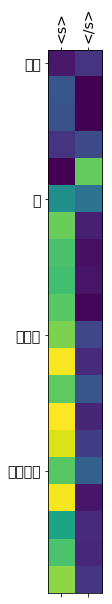

In [39]:
#inp_obj = InputIndex(spm_voc, spm_model)
translate("すごいですね", encoder, decoder, inp_obj, out_obj)